## Import Dependencies

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns

#from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, PowerTransformer, StandardScaler
from sklearn.feature_extraction import FeatureHasher
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, plot_roc_curve, roc_curve, roc_auc_score, auc, make_scorer

import xgboost as xgb
from xgboost import XGBClassifier

SEED = 666

# Hyperparameters tuning
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe

# magic word for producing visualizations in notebook
%matplotlib inline

# and setting the size of all plots.
plt.rcParams['figure.figsize'] = [11, 7]

Using TensorFlow backend.


## Load Dataset

In [2]:
# The C engine doesn't support RegEx so we set it to Python to avoid the warning
census = pd.read_csv('data/census-income.data', header=None, sep=',\s', na_values=['?'], engine='python')

In [3]:
census_columns = [
    'age',
    'class of worker',
    'detailed industry recode',
    'detailed occupation recode',
    'education',
    'wage per hour',
    'enroll in edu inst last wk',
    'marital status',
    'major industry code',
    'major occupation code',
    'race',
    'hispanic origin',
    'sex',
    'member of a labor union',
    'reason for unemployment',
    'full or part time employment stat',
    'capital gains',
    'capital losses',
    'dividends from stocks',
    'tax filer stat',
    'region of previous residence',
    'state of previous residence',
    'detailed household and family stat',
    'detailed household summary in household',
    'instance weight',
    'migration code-change in msa',
    'migration code-change in reg',
    'migration code-move within reg',
    'live in this house 1 year ago',
    'migration prev res in sunbelt',
    'num persons worked for employer',
    'family members under 18',
    'country of birth father',
    'country of birth mother',
    'country of birth self',
    'citizenship',
    'own business or self employed',
    'fill inc questionnaire for veteran\'s admin',
    'veterans benefits',
    'weeks worked in year',
    'year',
    'income class'
]

features_to_drop = ['instance weight']

categorical_features = ['class of worker',
                        'detailed industry recode',
                        'detailed occupation recode',
                        'education',
                        'marital status',
                        'major industry code',
                        'major occupation code',
                        'race',
                        'hispanic origin',
                        'sex',
                        'full or part time employment stat',
                        'tax filer stat',
                        'detailed household and family stat',
                        'detailed household summary in household',
                        'migration code-change in msa',
                        'migration code-change in reg',
                        'migration code-move within reg',
                        'live in this house 1 year ago',
                        'country of birth father',
                        'country of birth mother',
                        'country of birth self',
                        'citizenship',
                        'own business or self employed',
                        'veterans benefits',
                        'enroll in edu inst last wk',
                        'member of a labor union',
                        'reason for unemployment',
                        'region of previous residence',
                        'state of previous residence',
                        'migration prev res in sunbelt',
                        'family members under 18',
                        "fill inc questionnaire for veteran\'s admin",
                        'year']

numerical_features = ['age',
                      'wage per hour',
                      'capital gains',
                      'capital losses',
                      'dividends from stocks',
                      'num persons worked for employer',
                      'weeks worked in year']

census.columns = census_columns
census.head()

,age,class of worker,detailed industry recode,detailed occupation recode,education,wage per hour,enroll in edu inst last wk,marital status,major industry code,major occupation code,...,country of birth father,country of birth mother,country of birth self,citizenship,own business or self employed,fill inc questionnaire for veteran's admin,veterans benefits,weeks worked in year,year,income class
0,73,Not in universe,0,0,High school graduate,0,Not in universe,Widowed,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,0,95,- 50000.
1,58,Self-employed-not incorporated,4,34,Some college but no degree,0,Not in universe,Divorced,Construction,Precision production craft & repair,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.
2,18,Not in universe,0,0,10th grade,0,High school,Never married,Not in universe or children,Not in universe,...,Vietnam,Vietnam,Vietnam,Foreign born- Not a citizen of U S,0,Not in universe,2,0,95,- 50000.
3,9,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,94,- 50000.
4,10,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,94,- 50000.


In [4]:
census.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 199523 entries, 0 to 199522
Data columns (total 42 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   age                                         199523 non-null  int64  
 1   class of worker                             199523 non-null  object 
 2   detailed industry recode                    199523 non-null  int64  
 3   detailed occupation recode                  199523 non-null  int64  
 4   education                                   199523 non-null  object 
 5   wage per hour                               199523 non-null  int64  
 6   enroll in edu inst last wk                  199523 non-null  object 
 7   marital status                              199523 non-null  object 
 8   major industry code                         199523 non-null  object 
 9   major occupation code                       199523 non-null  object 
 

 ## Clean Dataset

In [5]:
def clean_dataset(df):
    # Drop features
    df = df.drop(features_to_drop, axis=1)
    
    # Fill NaN
    df['hispanic origin'] = df['hispanic origin'].fillna('Do not know')
    df['migration code-change in msa'] = df['migration code-change in msa'].fillna('Not identifiable')
    
    df['state of previous residence'] = df['state of previous residence'].fillna('Not in universe')
    df['migration code-change in reg'] = df['migration code-change in reg'].fillna('Not in universe')
    df['migration code-move within reg'] = df['migration code-move within reg'].fillna('Not in universe')
    df['migration prev res in sunbelt'] = df['migration prev res in sunbelt'].fillna('Not in universe')
    
    df['country of birth father'] = df['country of birth father'].fillna(df['country of birth father'].mode()[0])
    df['country of birth mother'] = df['country of birth mother'].fillna(df['country of birth mother'].mode()[0])
    df['country of birth self'] = df['country of birth self'].fillna(df['country of birth self'].mode()[0])
    
    df[categorical_features] = df[categorical_features].astype(str)
    
    # Encode income class column
    df['income class'] = df['income class'].map({'- 50000.': 0, '50000+.': 1})

    return df

In [6]:
census = clean_dataset(census)
census.head()

,age,class of worker,detailed industry recode,detailed occupation recode,education,wage per hour,enroll in edu inst last wk,marital status,major industry code,major occupation code,...,country of birth father,country of birth mother,country of birth self,citizenship,own business or self employed,fill inc questionnaire for veteran's admin,veterans benefits,weeks worked in year,year,income class
0,73,Not in universe,0,0,High school graduate,0,Not in universe,Widowed,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,0,95,0
1,58,Self-employed-not incorporated,4,34,Some college but no degree,0,Not in universe,Divorced,Construction,Precision production craft & repair,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,0
2,18,Not in universe,0,0,10th grade,0,High school,Never married,Not in universe or children,Not in universe,...,Vietnam,Vietnam,Vietnam,Foreign born- Not a citizen of U S,0,Not in universe,2,0,95,0
3,9,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,94,0
4,10,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,94,0


In [7]:
census.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 199523 entries, 0 to 199522
Data columns (total 41 columns):
 #   Column                                      Non-Null Count   Dtype 
---  ------                                      --------------   ----- 
 0   age                                         199523 non-null  int64 
 1   class of worker                             199523 non-null  object
 2   detailed industry recode                    199523 non-null  object
 3   detailed occupation recode                  199523 non-null  object
 4   education                                   199523 non-null  object
 5   wage per hour                               199523 non-null  int64 
 6   enroll in edu inst last wk                  199523 non-null  object
 7   marital status                              199523 non-null  object
 8   major industry code                         199523 non-null  object
 9   major occupation code                       199523 non-null  object
 10  race    

## Split train and validation sets

In [8]:
X = census.drop('income class', axis=1)
y = census['income class']

In [9]:
y.mean()

0.06205800834991455

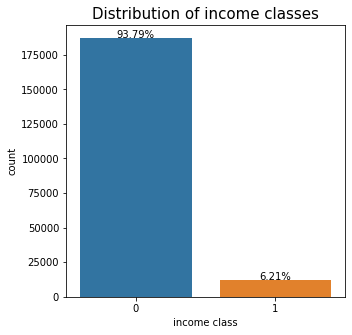

In [10]:
plt.figure(figsize=(5, 5))
total = census.shape[0]
ax = sns.countplot(x="income class", data=census)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width()/2.,
            height + 3,
            '{0:.2%}'.format(height/total),
            ha="center")
plt.title('Distribution of income classes', fontsize=15)
plt.show()

In [11]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, stratify=y, random_state=SEED)

In [12]:
ratio = float(np.sum(y_train == 0)) / np.sum(y_train == 1)
ratio

15.113264688067838

## Bayesian Hyperparameter Tuning with Hyperopt

In [13]:
preprocessor = make_column_transformer(
    (Pipeline([
        ('num', SimpleImputer()),
        ('sc', StandardScaler()),
    ]), numerical_features),
    (Pipeline([
        ('num', SimpleImputer(strategy='constant', fill_value='Unknown')),
        ('enc', OneHotEncoder(categories='auto', sparse = False, handle_unknown='ignore'))
    ]), categorical_features),
    remainder='drop'
)

pipeline = Pipeline([
    ('pre', preprocessor),
    ('sel', SelectKBest(k=94))
])

In [14]:
X_train = pipeline.fit_transform(X_train, y_train)
X_val = pipeline.transform(X_val)

In [15]:
#scorer = make_scorer(roc_auc_score)

In [16]:
# Scoring and optimization functions
def score(params):
    print("Training with params: ")
    print(params)
    num_round = int(params['n_estimators'])
    del params['n_estimators']
    dtrain = xgb.DMatrix(X_train, label=y_train)
    dvalid = xgb.DMatrix(X_val, label=y_val.values)
    watchlist = [(dvalid, 'eval'), (dtrain, 'train')]
    gbm_model = xgb.train(params, dtrain, num_round,
                          evals=watchlist,
                          verbose_eval=True)
    predictions = gbm_model.predict(dvalid, ntree_limit=gbm_model.best_iteration + 1)
    
    fpr, tpr, thresholds = roc_curve(y_val, predictions)
    score = auc(fpr, tpr)
    # TODO: Add the importance for the selected features
    print("\tScore {0}\n\n".format(score))
    # The score function should return the loss (1-score)
    # since the optimize function looks for the minimum
    loss = 1 - score
    return {'loss': loss, 'status': STATUS_OK}

In [17]:
def optimize(random_state=SEED):
    """
    This is the optimization function that given a space of hyperparameters and a scoring function, 
    finds the best hyperparameters.
    """
    space = {
        'n_estimators': hp.quniform('n_estimators', 100, 1000, 1),
        'eta': hp.quniform('eta', 0.025, 0.1, 0.025),
        # A problem with max_depth casted to float instead of int with
        # the hp.quniform method.
        'max_depth':  hp.choice('max_depth', np.arange(1, 14, dtype=int)),
        'min_child_weight': hp.quniform('min_child_weight', 1, 6, 1),
        'subsample': hp.quniform('subsample', 0.5, 1, 0.05),
        'gamma': hp.quniform('gamma', 0.5, 1, 0.05),
        'colsample_bytree': hp.quniform('colsample_bytree', 0.5, 1, 0.05),
        'scale_pos_weight': ratio,
        'eval_metric': 'auc',
        'objective': 'binary:logistic',
        # Increase this number if you have more cores. Otherwise, remove it and it will default 
        # to the maxium number. 
        'nthread': 5,
        'booster': 'gbtree',
        'tree_method': 'gpu_hist',
        'silent': 1,
        'seed': random_state
    }
    # Use the fmin function from Hyperopt to find the best hyperparameters
    best = fmin(score, space, algo=tpe.suggest, max_evals=250, rstate=np.random.RandomState(random_state))
    return best

In [18]:
best_hyperparams = optimize()
best_hyperparams

Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.7000000000000001, 'eta': 0.07500000000000001, 'eval_metric': 'auc', 'gamma': 0.75, 'max_depth': 3, 'min_child_weight': 4.0, 'n_estimators': 751.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent': 1, 'subsample': 0.8, 'tree_method': 'gpu_hist'}
[0]	eval-auc:0.85514	train-auc:0.85930                                                   

[1]	eval-auc:0.86933	train-auc:0.87388                                                   

[2]	eval-auc:0.87769	train-auc:0.88158                                                   

[3]	eval-auc:0.89238	train-auc:0.89665                                                   

[4]	eval-auc:0.89523	train-auc:0.89943                                                   

[5]	eval-auc:0.90110	train-auc:0.90491                                                   

[6]	eval-auc:0.9

[85]	eval-auc:0.94070	train-auc:0.94302                                                  

[86]	eval-auc:0.94085	train-auc:0.94318                                                  

[87]	eval-auc:0.94105	train-auc:0.94328                                                  

[88]	eval-auc:0.94105	train-auc:0.94333                                                  

[89]	eval-auc:0.94119	train-auc:0.94342                                                  

[90]	eval-auc:0.94137	train-auc:0.94361                                                  

[91]	eval-auc:0.94146	train-auc:0.94367                                                  

[92]	eval-auc:0.94156	train-auc:0.94378                                                  

[93]	eval-auc:0.94169	train-auc:0.94388                                                  

[94]	eval-auc:0.94175	train-auc:0.94393                                                  

[95]	eval-auc:0.94189	train-auc:0.94403                                                  


[175]	eval-auc:0.94622	train-auc:0.94835                                                 

[176]	eval-auc:0.94627	train-auc:0.94838                                                 

[177]	eval-auc:0.94631	train-auc:0.94843                                                 

[178]	eval-auc:0.94634	train-auc:0.94844                                                 

[179]	eval-auc:0.94639	train-auc:0.94848                                                 

[180]	eval-auc:0.94639	train-auc:0.94850                                                 

[181]	eval-auc:0.94639	train-auc:0.94853                                                 

[182]	eval-auc:0.94642	train-auc:0.94856                                                 

[183]	eval-auc:0.94645	train-auc:0.94860                                                 

[184]	eval-auc:0.94645	train-auc:0.94861                                                 

[185]	eval-auc:0.94649	train-auc:0.94864                                                 


[265]	eval-auc:0.94854	train-auc:0.95096                                                 

[266]	eval-auc:0.94854	train-auc:0.95098                                                 

[267]	eval-auc:0.94855	train-auc:0.95100                                                 

[268]	eval-auc:0.94857	train-auc:0.95102                                                 

[269]	eval-auc:0.94863	train-auc:0.95108                                                 

[270]	eval-auc:0.94863	train-auc:0.95109                                                 

[271]	eval-auc:0.94864	train-auc:0.95111                                                 

[272]	eval-auc:0.94866	train-auc:0.95113                                                 

[273]	eval-auc:0.94866	train-auc:0.95115                                                 

[274]	eval-auc:0.94873	train-auc:0.95122                                                 

[275]	eval-auc:0.94875	train-auc:0.95125                                                 


[355]	eval-auc:0.94992	train-auc:0.95288                                                 

[356]	eval-auc:0.94993	train-auc:0.95290                                                 

[357]	eval-auc:0.94999	train-auc:0.95293                                                 

[358]	eval-auc:0.95001	train-auc:0.95295                                                 

[359]	eval-auc:0.95000	train-auc:0.95296                                                 

[360]	eval-auc:0.95000	train-auc:0.95298                                                 

[361]	eval-auc:0.95000	train-auc:0.95298                                                 

[362]	eval-auc:0.95000	train-auc:0.95299                                                 

[363]	eval-auc:0.95002	train-auc:0.95302                                                 

[364]	eval-auc:0.95002	train-auc:0.95303                                                 

[365]	eval-auc:0.95003	train-auc:0.95304                                                 


[445]	eval-auc:0.95085	train-auc:0.95445                                                 

[446]	eval-auc:0.95086	train-auc:0.95446                                                 

[447]	eval-auc:0.95086	train-auc:0.95447                                                 

[448]	eval-auc:0.95089	train-auc:0.95449                                                 

[449]	eval-auc:0.95088	train-auc:0.95450                                                 

[450]	eval-auc:0.95088	train-auc:0.95450                                                 

[451]	eval-auc:0.95089	train-auc:0.95451                                                 

[452]	eval-auc:0.95088	train-auc:0.95451                                                 

[453]	eval-auc:0.95090	train-auc:0.95454                                                 

[454]	eval-auc:0.95089	train-auc:0.95454                                                 

[455]	eval-auc:0.95092	train-auc:0.95458                                                 


[535]	eval-auc:0.95124	train-auc:0.95570                                                 

[536]	eval-auc:0.95124	train-auc:0.95571                                                 

[537]	eval-auc:0.95125	train-auc:0.95573                                                 

[538]	eval-auc:0.95125	train-auc:0.95573                                                 

[539]	eval-auc:0.95125	train-auc:0.95574                                                 

[540]	eval-auc:0.95126	train-auc:0.95576                                                 

[541]	eval-auc:0.95126	train-auc:0.95579                                                 

[542]	eval-auc:0.95125	train-auc:0.95581                                                 

[543]	eval-auc:0.95127	train-auc:0.95582                                                 

[544]	eval-auc:0.95128	train-auc:0.95583                                                 

[545]	eval-auc:0.95130	train-auc:0.95584                                                 


[625]	eval-auc:0.95166	train-auc:0.95680                                                 

[626]	eval-auc:0.95169	train-auc:0.95682                                                 

[627]	eval-auc:0.95169	train-auc:0.95683                                                 

[628]	eval-auc:0.95169	train-auc:0.95684                                                 

[629]	eval-auc:0.95169	train-auc:0.95685                                                 

[630]	eval-auc:0.95172	train-auc:0.95686                                                 

[631]	eval-auc:0.95172	train-auc:0.95687                                                 

[632]	eval-auc:0.95174	train-auc:0.95688                                                 

[633]	eval-auc:0.95174	train-auc:0.95689                                                 

[634]	eval-auc:0.95176	train-auc:0.95691                                                 

[635]	eval-auc:0.95175	train-auc:0.95691                                                 


[715]	eval-auc:0.95190	train-auc:0.95773                                                 

[716]	eval-auc:0.95190	train-auc:0.95774                                                 

[717]	eval-auc:0.95190	train-auc:0.95776                                                 

[718]	eval-auc:0.95189	train-auc:0.95778                                                 

[719]	eval-auc:0.95190	train-auc:0.95780                                                 

[720]	eval-auc:0.95190	train-auc:0.95780                                                 

[721]	eval-auc:0.95192	train-auc:0.95782                                                 

[722]	eval-auc:0.95193	train-auc:0.95784                                                 

[723]	eval-auc:0.95192	train-auc:0.95784                                                 

[724]	eval-auc:0.95191	train-auc:0.95784                                                 

[725]	eval-auc:0.95191	train-auc:0.95785                                                 


[48]	eval-auc:0.93362	train-auc:0.93729                                                  

[49]	eval-auc:0.93400	train-auc:0.93766                                                  

[50]	eval-auc:0.93415	train-auc:0.93783                                                  

[51]	eval-auc:0.93445	train-auc:0.93802                                                  

[52]	eval-auc:0.93472	train-auc:0.93824                                                  

[53]	eval-auc:0.93488	train-auc:0.93840                                                  

[54]	eval-auc:0.93520	train-auc:0.93874                                                  

[55]	eval-auc:0.93531	train-auc:0.93889                                                  

[56]	eval-auc:0.93540	train-auc:0.93890                                                  

[57]	eval-auc:0.93563	train-auc:0.93908                                                  

[58]	eval-auc:0.93572	train-auc:0.93914                                                  


[138]	eval-auc:0.94513	train-auc:0.94788                                                 

[139]	eval-auc:0.94519	train-auc:0.94795                                                 

[140]	eval-auc:0.94523	train-auc:0.94800                                                 

[141]	eval-auc:0.94530	train-auc:0.94807                                                 

[142]	eval-auc:0.94536	train-auc:0.94813                                                 

[143]	eval-auc:0.94542	train-auc:0.94817                                                 

[144]	eval-auc:0.94552	train-auc:0.94828                                                 

[145]	eval-auc:0.94559	train-auc:0.94834                                                 

[146]	eval-auc:0.94563	train-auc:0.94839                                                 

[147]	eval-auc:0.94568	train-auc:0.94846                                                 

[148]	eval-auc:0.94570	train-auc:0.94850                                                 


[228]	eval-auc:0.94805	train-auc:0.95168                                                 

[229]	eval-auc:0.94810	train-auc:0.95171                                                 

[230]	eval-auc:0.94811	train-auc:0.95175                                                 

[231]	eval-auc:0.94813	train-auc:0.95180                                                 

[232]	eval-auc:0.94815	train-auc:0.95182                                                 

[233]	eval-auc:0.94816	train-auc:0.95185                                                 

[234]	eval-auc:0.94821	train-auc:0.95190                                                 

[235]	eval-auc:0.94821	train-auc:0.95192                                                 

[236]	eval-auc:0.94825	train-auc:0.95195                                                 

[237]	eval-auc:0.94827	train-auc:0.95197                                                 

[238]	eval-auc:0.94829	train-auc:0.95200                                                 


[31]	eval-auc:0.93709	train-auc:0.94135                                                  

[32]	eval-auc:0.93757	train-auc:0.94177                                                  

[33]	eval-auc:0.93800	train-auc:0.94215                                                  

[34]	eval-auc:0.93822	train-auc:0.94228                                                  

[35]	eval-auc:0.93856	train-auc:0.94259                                                  

[36]	eval-auc:0.93898	train-auc:0.94294                                                  

[37]	eval-auc:0.93936	train-auc:0.94327                                                  

[38]	eval-auc:0.93946	train-auc:0.94336                                                  

[39]	eval-auc:0.93985	train-auc:0.94372                                                  

[40]	eval-auc:0.94000	train-auc:0.94384                                                  

[41]	eval-auc:0.94035	train-auc:0.94411                                                  


[121]	eval-auc:0.94875	train-auc:0.95380                                                 

[122]	eval-auc:0.94878	train-auc:0.95385                                                 

[123]	eval-auc:0.94881	train-auc:0.95390                                                 

[124]	eval-auc:0.94889	train-auc:0.95400                                                 

[125]	eval-auc:0.94888	train-auc:0.95403                                                 

[126]	eval-auc:0.94895	train-auc:0.95412                                                 

[127]	eval-auc:0.94898	train-auc:0.95417                                                 

[128]	eval-auc:0.94907	train-auc:0.95429                                                 

[129]	eval-auc:0.94914	train-auc:0.95440                                                 

[130]	eval-auc:0.94915	train-auc:0.95445                                                 

[131]	eval-auc:0.94916	train-auc:0.95450                                                 


[211]	eval-auc:0.95098	train-auc:0.95892                                                 

[212]	eval-auc:0.95098	train-auc:0.95895                                                 

[213]	eval-auc:0.95096	train-auc:0.95899                                                 

[214]	eval-auc:0.95096	train-auc:0.95906                                                 

[215]	eval-auc:0.95100	train-auc:0.95910                                                 

[216]	eval-auc:0.95103	train-auc:0.95915                                                 

[217]	eval-auc:0.95105	train-auc:0.95918                                                 

	Score 0.9510450988065675                                                                


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.8500000000000001, 'eta': 0.05, 'eval_metric': 'auc', 'gamma': 0.8500000000000001, 'max_depth': 2, 'min_child_weight': 6.0, 'n_estimators'

[77]	eval-auc:0.92702	train-auc:0.93055                                                  

[78]	eval-auc:0.92715	train-auc:0.93069                                                  

[79]	eval-auc:0.92724	train-auc:0.93074                                                  

[80]	eval-auc:0.92732	train-auc:0.93074                                                  

[81]	eval-auc:0.92773	train-auc:0.93113                                                  

[82]	eval-auc:0.92793	train-auc:0.93125                                                  

[83]	eval-auc:0.92815	train-auc:0.93151                                                  

[84]	eval-auc:0.92830	train-auc:0.93161                                                  

[85]	eval-auc:0.92864	train-auc:0.93189                                                  

[86]	eval-auc:0.92880	train-auc:0.93205                                                  

[87]	eval-auc:0.92917	train-auc:0.93234                                                  


[167]	eval-auc:0.93815	train-auc:0.94034                                                 

[168]	eval-auc:0.93820	train-auc:0.94038                                                 

[169]	eval-auc:0.93827	train-auc:0.94044                                                 

[170]	eval-auc:0.93835	train-auc:0.94052                                                 

[171]	eval-auc:0.93838	train-auc:0.94055                                                 

[172]	eval-auc:0.93846	train-auc:0.94061                                                 

[173]	eval-auc:0.93852	train-auc:0.94068                                                 

[174]	eval-auc:0.93860	train-auc:0.94076                                                 

[175]	eval-auc:0.93875	train-auc:0.94089                                                 

[176]	eval-auc:0.93882	train-auc:0.94092                                                 

[177]	eval-auc:0.93887	train-auc:0.94098                                                 


[257]	eval-auc:0.94199	train-auc:0.94370                                                 

[258]	eval-auc:0.94203	train-auc:0.94374                                                 

[259]	eval-auc:0.94205	train-auc:0.94378                                                 

[260]	eval-auc:0.94206	train-auc:0.94379                                                 

[261]	eval-auc:0.94209	train-auc:0.94380                                                 

[262]	eval-auc:0.94215	train-auc:0.94382                                                 

[263]	eval-auc:0.94217	train-auc:0.94385                                                 

[264]	eval-auc:0.94219	train-auc:0.94387                                                 

[265]	eval-auc:0.94223	train-auc:0.94390                                                 

[266]	eval-auc:0.94222	train-auc:0.94390                                                 

[267]	eval-auc:0.94226	train-auc:0.94394                                                 


[347]	eval-auc:0.94390	train-auc:0.94559                                                 

[348]	eval-auc:0.94391	train-auc:0.94561                                                 

[349]	eval-auc:0.94395	train-auc:0.94564                                                 

[350]	eval-auc:0.94397	train-auc:0.94566                                                 

[351]	eval-auc:0.94399	train-auc:0.94568                                                 

[352]	eval-auc:0.94400	train-auc:0.94568                                                 

[353]	eval-auc:0.94400	train-auc:0.94570                                                 

[354]	eval-auc:0.94402	train-auc:0.94572                                                 

[355]	eval-auc:0.94403	train-auc:0.94573                                                 

[356]	eval-auc:0.94405	train-auc:0.94575                                                 

[357]	eval-auc:0.94406	train-auc:0.94576                                                 


[437]	eval-auc:0.94538	train-auc:0.94689                                                 

[438]	eval-auc:0.94540	train-auc:0.94690                                                 

[439]	eval-auc:0.94540	train-auc:0.94691                                                 

[440]	eval-auc:0.94541	train-auc:0.94691                                                 

[441]	eval-auc:0.94543	train-auc:0.94694                                                 

[442]	eval-auc:0.94543	train-auc:0.94694                                                 

[443]	eval-auc:0.94544	train-auc:0.94695                                                 

[444]	eval-auc:0.94546	train-auc:0.94697                                                 

[445]	eval-auc:0.94547	train-auc:0.94698                                                 

[446]	eval-auc:0.94548	train-auc:0.94699                                                 

[447]	eval-auc:0.94550	train-auc:0.94700                                                 


[64]	eval-auc:0.94732	train-auc:0.95471                                                  

[65]	eval-auc:0.94750	train-auc:0.95486                                                  

[66]	eval-auc:0.94757	train-auc:0.95497                                                  

[67]	eval-auc:0.94767	train-auc:0.95505                                                  

[68]	eval-auc:0.94774	train-auc:0.95521                                                  

[69]	eval-auc:0.94779	train-auc:0.95528                                                  

[70]	eval-auc:0.94790	train-auc:0.95543                                                  

[71]	eval-auc:0.94794	train-auc:0.95554                                                  

[72]	eval-auc:0.94794	train-auc:0.95560                                                  

[73]	eval-auc:0.94800	train-auc:0.95570                                                  

[74]	eval-auc:0.94805	train-auc:0.95578                                                  


[16]	eval-auc:0.92508	train-auc:0.92849                                                  

[17]	eval-auc:0.92539	train-auc:0.92910                                                  

[18]	eval-auc:0.92571	train-auc:0.92950                                                  

[19]	eval-auc:0.92684	train-auc:0.93061                                                  

[20]	eval-auc:0.92784	train-auc:0.93148                                                  

[21]	eval-auc:0.92820	train-auc:0.93182                                                  

[22]	eval-auc:0.92941	train-auc:0.93299                                                  

[23]	eval-auc:0.92971	train-auc:0.93314                                                  

[24]	eval-auc:0.93008	train-auc:0.93355                                                  

[25]	eval-auc:0.93091	train-auc:0.93429                                                  

[26]	eval-auc:0.93107	train-auc:0.93431                                                  


[106]	eval-auc:0.94584	train-auc:0.94878                                                 

[107]	eval-auc:0.94590	train-auc:0.94884                                                 

[108]	eval-auc:0.94594	train-auc:0.94891                                                 

[109]	eval-auc:0.94603	train-auc:0.94906                                                 

[110]	eval-auc:0.94612	train-auc:0.94914                                                 

[111]	eval-auc:0.94619	train-auc:0.94920                                                 

[112]	eval-auc:0.94621	train-auc:0.94927                                                 

[113]	eval-auc:0.94629	train-auc:0.94934                                                 

[114]	eval-auc:0.94636	train-auc:0.94941                                                 

[115]	eval-auc:0.94640	train-auc:0.94947                                                 

[116]	eval-auc:0.94646	train-auc:0.94952                                                 


[196]	eval-auc:0.94950	train-auc:0.95347                                                 

[197]	eval-auc:0.94957	train-auc:0.95352                                                 

[198]	eval-auc:0.94958	train-auc:0.95355                                                 

[199]	eval-auc:0.94961	train-auc:0.95358                                                 

[200]	eval-auc:0.94965	train-auc:0.95361                                                 

[201]	eval-auc:0.94965	train-auc:0.95363                                                 

[202]	eval-auc:0.94965	train-auc:0.95366                                                 

[203]	eval-auc:0.94968	train-auc:0.95369                                                 

[204]	eval-auc:0.94970	train-auc:0.95373                                                 

[205]	eval-auc:0.94972	train-auc:0.95374                                                 

[206]	eval-auc:0.94977	train-auc:0.95380                                                 


[286]	eval-auc:0.95113	train-auc:0.95638                                                 

[287]	eval-auc:0.95114	train-auc:0.95642                                                 

[288]	eval-auc:0.95114	train-auc:0.95644                                                 

[289]	eval-auc:0.95115	train-auc:0.95649                                                 

[290]	eval-auc:0.95115	train-auc:0.95650                                                 

[291]	eval-auc:0.95118	train-auc:0.95653                                                 

[292]	eval-auc:0.95119	train-auc:0.95657                                                 

[293]	eval-auc:0.95119	train-auc:0.95659                                                 

[294]	eval-auc:0.95120	train-auc:0.95661                                                 

[295]	eval-auc:0.95122	train-auc:0.95663                                                 

[296]	eval-auc:0.95126	train-auc:0.95668                                                 


[376]	eval-auc:0.95186	train-auc:0.95857                                                 

[377]	eval-auc:0.95186	train-auc:0.95860                                                 

[378]	eval-auc:0.95188	train-auc:0.95863                                                 

[379]	eval-auc:0.95187	train-auc:0.95864                                                 

[380]	eval-auc:0.95190	train-auc:0.95869                                                 

[381]	eval-auc:0.95192	train-auc:0.95872                                                 

[382]	eval-auc:0.95192	train-auc:0.95873                                                 

[383]	eval-auc:0.95193	train-auc:0.95874                                                 

[384]	eval-auc:0.95192	train-auc:0.95874                                                 

[385]	eval-auc:0.95195	train-auc:0.95878                                                 

[386]	eval-auc:0.95196	train-auc:0.95881                                                 


[466]	eval-auc:0.95236	train-auc:0.96037                                                 

[467]	eval-auc:0.95235	train-auc:0.96039                                                 

[468]	eval-auc:0.95233	train-auc:0.96039                                                 

[469]	eval-auc:0.95233	train-auc:0.96040                                                 

[470]	eval-auc:0.95232	train-auc:0.96041                                                 

[471]	eval-auc:0.95232	train-auc:0.96043                                                 

[472]	eval-auc:0.95232	train-auc:0.96044                                                 

[473]	eval-auc:0.95232	train-auc:0.96046                                                 

[474]	eval-auc:0.95231	train-auc:0.96047                                                 

[475]	eval-auc:0.95232	train-auc:0.96049                                                 

[476]	eval-auc:0.95234	train-auc:0.96053                                                 


[556]	eval-auc:0.95244	train-auc:0.96191                                                 

[557]	eval-auc:0.95245	train-auc:0.96193                                                 

[558]	eval-auc:0.95244	train-auc:0.96193                                                 

[559]	eval-auc:0.95244	train-auc:0.96195                                                 

[560]	eval-auc:0.95242	train-auc:0.96197                                                 

[561]	eval-auc:0.95241	train-auc:0.96199                                                 

[562]	eval-auc:0.95240	train-auc:0.96199                                                 

[563]	eval-auc:0.95242	train-auc:0.96202                                                 

[564]	eval-auc:0.95242	train-auc:0.96204                                                 

[565]	eval-auc:0.95241	train-auc:0.96205                                                 

[566]	eval-auc:0.95239	train-auc:0.96206                                                 


[646]	eval-auc:0.95237	train-auc:0.96328                                                 

[647]	eval-auc:0.95235	train-auc:0.96329                                                 

[648]	eval-auc:0.95234	train-auc:0.96330                                                 

[649]	eval-auc:0.95234	train-auc:0.96333                                                 

[650]	eval-auc:0.95237	train-auc:0.96335                                                 

[651]	eval-auc:0.95237	train-auc:0.96337                                                 

[652]	eval-auc:0.95238	train-auc:0.96340                                                 

[653]	eval-auc:0.95239	train-auc:0.96342                                                 

[654]	eval-auc:0.95240	train-auc:0.96343                                                 

[655]	eval-auc:0.95239	train-auc:0.96344                                                 

[656]	eval-auc:0.95241	train-auc:0.96344                                                 


[25]	eval-auc:0.93591	train-auc:0.94214                                                  

[26]	eval-auc:0.93585	train-auc:0.94213                                                  

[27]	eval-auc:0.93594	train-auc:0.94225                                                  

[28]	eval-auc:0.93617	train-auc:0.94256                                                  

[29]	eval-auc:0.93600	train-auc:0.94261                                                  

[30]	eval-auc:0.93626	train-auc:0.94283                                                  

[31]	eval-auc:0.93632	train-auc:0.94303                                                  

[32]	eval-auc:0.93635	train-auc:0.94303                                                  

[33]	eval-auc:0.93645	train-auc:0.94318                                                  

[34]	eval-auc:0.93656	train-auc:0.94325                                                  

[35]	eval-auc:0.93667	train-auc:0.94340                                                  


[115]	eval-auc:0.94451	train-auc:0.95126                                                 

[116]	eval-auc:0.94459	train-auc:0.95132                                                 

[117]	eval-auc:0.94466	train-auc:0.95138                                                 

[118]	eval-auc:0.94475	train-auc:0.95145                                                 

[119]	eval-auc:0.94487	train-auc:0.95155                                                 

[120]	eval-auc:0.94493	train-auc:0.95162                                                 

[121]	eval-auc:0.94499	train-auc:0.95169                                                 

[122]	eval-auc:0.94506	train-auc:0.95175                                                 

[123]	eval-auc:0.94511	train-auc:0.95181                                                 

[124]	eval-auc:0.94516	train-auc:0.95188                                                 

[125]	eval-auc:0.94520	train-auc:0.95193                                                 


[205]	eval-auc:0.94836	train-auc:0.95584                                                 

[206]	eval-auc:0.94839	train-auc:0.95590                                                 

[207]	eval-auc:0.94840	train-auc:0.95593                                                 

[208]	eval-auc:0.94843	train-auc:0.95598                                                 

[209]	eval-auc:0.94844	train-auc:0.95602                                                 

[210]	eval-auc:0.94847	train-auc:0.95609                                                 

[211]	eval-auc:0.94850	train-auc:0.95614                                                 

[212]	eval-auc:0.94852	train-auc:0.95617                                                 

[213]	eval-auc:0.94855	train-auc:0.95624                                                 

[214]	eval-auc:0.94856	train-auc:0.95626                                                 

[215]	eval-auc:0.94859	train-auc:0.95631                                                 


[295]	eval-auc:0.95021	train-auc:0.95951                                                 

[296]	eval-auc:0.95026	train-auc:0.95956                                                 

[297]	eval-auc:0.95027	train-auc:0.95959                                                 

[298]	eval-auc:0.95028	train-auc:0.95963                                                 

[299]	eval-auc:0.95030	train-auc:0.95967                                                 

[300]	eval-auc:0.95031	train-auc:0.95974                                                 

[301]	eval-auc:0.95032	train-auc:0.95977                                                 

[302]	eval-auc:0.95033	train-auc:0.95980                                                 

[303]	eval-auc:0.95034	train-auc:0.95984                                                 

[304]	eval-auc:0.95036	train-auc:0.95988                                                 

[305]	eval-auc:0.95038	train-auc:0.95993                                                 


[385]	eval-auc:0.95126	train-auc:0.96227                                                 

[386]	eval-auc:0.95128	train-auc:0.96230                                                 

[387]	eval-auc:0.95128	train-auc:0.96233                                                 

[388]	eval-auc:0.95127	train-auc:0.96237                                                 

[389]	eval-auc:0.95128	train-auc:0.96238                                                 

[390]	eval-auc:0.95130	train-auc:0.96241                                                 

[391]	eval-auc:0.95129	train-auc:0.96244                                                 

[392]	eval-auc:0.95131	train-auc:0.96247                                                 

[393]	eval-auc:0.95132	train-auc:0.96250                                                 

[394]	eval-auc:0.95132	train-auc:0.96252                                                 

[395]	eval-auc:0.95132	train-auc:0.96254                                                 


[475]	eval-auc:0.95177	train-auc:0.96475                                                 

[476]	eval-auc:0.95176	train-auc:0.96478                                                 

[477]	eval-auc:0.95176	train-auc:0.96480                                                 

[478]	eval-auc:0.95177	train-auc:0.96481                                                 

[479]	eval-auc:0.95177	train-auc:0.96484                                                 

[480]	eval-auc:0.95176	train-auc:0.96487                                                 

[481]	eval-auc:0.95176	train-auc:0.96488                                                 

[482]	eval-auc:0.95176	train-auc:0.96491                                                 

[483]	eval-auc:0.95177	train-auc:0.96494                                                 

[484]	eval-auc:0.95176	train-auc:0.96496                                                 

[485]	eval-auc:0.95177	train-auc:0.96499                                                 


[565]	eval-auc:0.95204	train-auc:0.96675                                                 

[566]	eval-auc:0.95206	train-auc:0.96677                                                 

[567]	eval-auc:0.95207	train-auc:0.96679                                                 

[568]	eval-auc:0.95207	train-auc:0.96681                                                 

[569]	eval-auc:0.95207	train-auc:0.96686                                                 

[570]	eval-auc:0.95206	train-auc:0.96688                                                 

[571]	eval-auc:0.95207	train-auc:0.96690                                                 

[572]	eval-auc:0.95207	train-auc:0.96691                                                 

[573]	eval-auc:0.95207	train-auc:0.96693                                                 

[574]	eval-auc:0.95208	train-auc:0.96697                                                 

[575]	eval-auc:0.95209	train-auc:0.96699                                                 


[655]	eval-auc:0.95213	train-auc:0.96865                                                 

[656]	eval-auc:0.95214	train-auc:0.96867                                                 

[657]	eval-auc:0.95213	train-auc:0.96869                                                 

[658]	eval-auc:0.95213	train-auc:0.96870                                                 

[659]	eval-auc:0.95213	train-auc:0.96872                                                 

[660]	eval-auc:0.95211	train-auc:0.96874                                                 

[661]	eval-auc:0.95212	train-auc:0.96876                                                 

[662]	eval-auc:0.95211	train-auc:0.96878                                                 

[663]	eval-auc:0.95210	train-auc:0.96879                                                 

[664]	eval-auc:0.95210	train-auc:0.96881                                                 

[665]	eval-auc:0.95210	train-auc:0.96882                                                 


[745]	eval-auc:0.95205	train-auc:0.97036                                                 

[746]	eval-auc:0.95204	train-auc:0.97038                                                 

[747]	eval-auc:0.95204	train-auc:0.97039                                                 

[748]	eval-auc:0.95204	train-auc:0.97041                                                 

[749]	eval-auc:0.95203	train-auc:0.97042                                                 

[750]	eval-auc:0.95203	train-auc:0.97045                                                 

[751]	eval-auc:0.95202	train-auc:0.97047                                                 

[752]	eval-auc:0.95201	train-auc:0.97049                                                 

[753]	eval-auc:0.95201	train-auc:0.97050                                                 

[754]	eval-auc:0.95202	train-auc:0.97052                                                 

[755]	eval-auc:0.95203	train-auc:0.97055                                                 


[835]	eval-auc:0.95193	train-auc:0.97186                                                 

[836]	eval-auc:0.95193	train-auc:0.97187                                                 

[837]	eval-auc:0.95193	train-auc:0.97189                                                 

[838]	eval-auc:0.95194	train-auc:0.97189                                                 

[839]	eval-auc:0.95194	train-auc:0.97191                                                 

[840]	eval-auc:0.95193	train-auc:0.97193                                                 

[841]	eval-auc:0.95193	train-auc:0.97193                                                 

[842]	eval-auc:0.95193	train-auc:0.97196                                                 

[843]	eval-auc:0.95193	train-auc:0.97198                                                 

[844]	eval-auc:0.95193	train-auc:0.97198                                                 

[845]	eval-auc:0.95193	train-auc:0.97199                                                 


[34]	eval-auc:0.94724	train-auc:0.95556                                                  

[35]	eval-auc:0.94756	train-auc:0.95580                                                  

[36]	eval-auc:0.94768	train-auc:0.95597                                                  

[37]	eval-auc:0.94779	train-auc:0.95622                                                  

[38]	eval-auc:0.94808	train-auc:0.95647                                                  

[39]	eval-auc:0.94825	train-auc:0.95664                                                  

[40]	eval-auc:0.94832	train-auc:0.95678                                                  

[41]	eval-auc:0.94845	train-auc:0.95692                                                  

[42]	eval-auc:0.94858	train-auc:0.95713                                                  

[43]	eval-auc:0.94871	train-auc:0.95738                                                  

[44]	eval-auc:0.94890	train-auc:0.95756                                                  


[124]	eval-auc:0.95148	train-auc:0.96888                                                 

[125]	eval-auc:0.95151	train-auc:0.96897                                                 

[126]	eval-auc:0.95148	train-auc:0.96926                                                 

[127]	eval-auc:0.95149	train-auc:0.96934                                                 

[128]	eval-auc:0.95148	train-auc:0.96945                                                 

[129]	eval-auc:0.95150	train-auc:0.96955                                                 

[130]	eval-auc:0.95155	train-auc:0.96975                                                 

[131]	eval-auc:0.95154	train-auc:0.96989                                                 

[132]	eval-auc:0.95158	train-auc:0.96994                                                 

[133]	eval-auc:0.95162	train-auc:0.97003                                                 

[134]	eval-auc:0.95159	train-auc:0.97009                                                 


[214]	eval-auc:0.95071	train-auc:0.97669                                                 

[215]	eval-auc:0.95074	train-auc:0.97676                                                 

[216]	eval-auc:0.95066	train-auc:0.97685                                                 

[217]	eval-auc:0.95066	train-auc:0.97689                                                 

[218]	eval-auc:0.95065	train-auc:0.97690                                                 

[219]	eval-auc:0.95064	train-auc:0.97695                                                 

[220]	eval-auc:0.95062	train-auc:0.97700                                                 

[221]	eval-auc:0.95058	train-auc:0.97707                                                 

[222]	eval-auc:0.95055	train-auc:0.97721                                                 

[223]	eval-auc:0.95055	train-auc:0.97734                                                 

[224]	eval-auc:0.95050	train-auc:0.97745                                                 


[304]	eval-auc:0.94920	train-auc:0.98197                                                 

[305]	eval-auc:0.94920	train-auc:0.98203                                                 

[306]	eval-auc:0.94918	train-auc:0.98208                                                 

[307]	eval-auc:0.94919	train-auc:0.98211                                                 

[308]	eval-auc:0.94919	train-auc:0.98213                                                 

[309]	eval-auc:0.94916	train-auc:0.98218                                                 

[310]	eval-auc:0.94917	train-auc:0.98221                                                 

[311]	eval-auc:0.94912	train-auc:0.98227                                                 

[312]	eval-auc:0.94912	train-auc:0.98232                                                 

[313]	eval-auc:0.94909	train-auc:0.98237                                                 

[314]	eval-auc:0.94908	train-auc:0.98240                                                 


[394]	eval-auc:0.94785	train-auc:0.98540                                                 

[395]	eval-auc:0.94784	train-auc:0.98543                                                 

[396]	eval-auc:0.94783	train-auc:0.98546                                                 

[397]	eval-auc:0.94783	train-auc:0.98549                                                 

[398]	eval-auc:0.94781	train-auc:0.98553                                                 

[399]	eval-auc:0.94780	train-auc:0.98556                                                 

[400]	eval-auc:0.94780	train-auc:0.98561                                                 

[401]	eval-auc:0.94777	train-auc:0.98562                                                 

[402]	eval-auc:0.94776	train-auc:0.98564                                                 

[403]	eval-auc:0.94774	train-auc:0.98565                                                 

[404]	eval-auc:0.94773	train-auc:0.98569                                                 


[484]	eval-auc:0.94682	train-auc:0.98799                                                 

[485]	eval-auc:0.94683	train-auc:0.98800                                                 

[486]	eval-auc:0.94685	train-auc:0.98804                                                 

[487]	eval-auc:0.94686	train-auc:0.98805                                                 

[488]	eval-auc:0.94685	train-auc:0.98807                                                 

[489]	eval-auc:0.94683	train-auc:0.98808                                                 

[490]	eval-auc:0.94685	train-auc:0.98810                                                 

[491]	eval-auc:0.94681	train-auc:0.98816                                                 

[492]	eval-auc:0.94680	train-auc:0.98821                                                 

[493]	eval-auc:0.94678	train-auc:0.98822                                                 

[494]	eval-auc:0.94676	train-auc:0.98825                                                 


[574]	eval-auc:0.94580	train-auc:0.98985                                                 

[575]	eval-auc:0.94579	train-auc:0.98986                                                 

[576]	eval-auc:0.94577	train-auc:0.98989                                                 

[577]	eval-auc:0.94577	train-auc:0.98990                                                 

[578]	eval-auc:0.94574	train-auc:0.98992                                                 

[579]	eval-auc:0.94573	train-auc:0.98994                                                 

[580]	eval-auc:0.94566	train-auc:0.98999                                                 

[581]	eval-auc:0.94566	train-auc:0.99003                                                 

[582]	eval-auc:0.94565	train-auc:0.99005                                                 

[583]	eval-auc:0.94562	train-auc:0.99007                                                 

[584]	eval-auc:0.94561	train-auc:0.99010                                                 


[664]	eval-auc:0.94442	train-auc:0.99165                                                 

[665]	eval-auc:0.94445	train-auc:0.99166                                                 

[666]	eval-auc:0.94444	train-auc:0.99166                                                 

[667]	eval-auc:0.94439	train-auc:0.99170                                                 

[668]	eval-auc:0.94442	train-auc:0.99172                                                 

[669]	eval-auc:0.94441	train-auc:0.99172                                                 

[670]	eval-auc:0.94444	train-auc:0.99172                                                 

[671]	eval-auc:0.94442	train-auc:0.99173                                                 

[672]	eval-auc:0.94440	train-auc:0.99177                                                 

[673]	eval-auc:0.94436	train-auc:0.99181                                                 

[674]	eval-auc:0.94433	train-auc:0.99182                                                 


[754]	eval-auc:0.94349	train-auc:0.99300                                                 

[755]	eval-auc:0.94351	train-auc:0.99301                                                 

[756]	eval-auc:0.94348	train-auc:0.99302                                                 

[757]	eval-auc:0.94346	train-auc:0.99304                                                 

[758]	eval-auc:0.94346	train-auc:0.99305                                                 

[759]	eval-auc:0.94349	train-auc:0.99305                                                 

[760]	eval-auc:0.94347	train-auc:0.99306                                                 

[761]	eval-auc:0.94347	train-auc:0.99307                                                 

[762]	eval-auc:0.94348	train-auc:0.99307                                                 

[763]	eval-auc:0.94346	train-auc:0.99309                                                 

[764]	eval-auc:0.94346	train-auc:0.99310                                                 


[844]	eval-auc:0.94261	train-auc:0.99402                                                 

[845]	eval-auc:0.94259	train-auc:0.99403                                                 

[846]	eval-auc:0.94258	train-auc:0.99404                                                 

[847]	eval-auc:0.94258	train-auc:0.99404                                                 

[848]	eval-auc:0.94257	train-auc:0.99406                                                 

[849]	eval-auc:0.94254	train-auc:0.99407                                                 

[850]	eval-auc:0.94255	train-auc:0.99407                                                 

[851]	eval-auc:0.94254	train-auc:0.99408                                                 

[852]	eval-auc:0.94256	train-auc:0.99409                                                 

[853]	eval-auc:0.94254	train-auc:0.99411                                                 

[854]	eval-auc:0.94254	train-auc:0.99412                                                 


[934]	eval-auc:0.94187	train-auc:0.99483                                                 

[935]	eval-auc:0.94187	train-auc:0.99484                                                 

[936]	eval-auc:0.94189	train-auc:0.99485                                                 

[937]	eval-auc:0.94190	train-auc:0.99485                                                 

[938]	eval-auc:0.94191	train-auc:0.99486                                                 

[939]	eval-auc:0.94191	train-auc:0.99486                                                 

[940]	eval-auc:0.94193	train-auc:0.99486                                                 

[941]	eval-auc:0.94191	train-auc:0.99487                                                 

[942]	eval-auc:0.94188	train-auc:0.99487                                                 

[943]	eval-auc:0.94188	train-auc:0.99488                                                 

[944]	eval-auc:0.94188	train-auc:0.99489                                                 


[24]	eval-auc:0.94170	train-auc:0.94770                                                  

[25]	eval-auc:0.94176	train-auc:0.94789                                                  

[26]	eval-auc:0.94194	train-auc:0.94814                                                  

[27]	eval-auc:0.94201	train-auc:0.94837                                                  

[28]	eval-auc:0.94232	train-auc:0.94881                                                  

[29]	eval-auc:0.94263	train-auc:0.94905                                                  

[30]	eval-auc:0.94275	train-auc:0.94927                                                  

[31]	eval-auc:0.94327	train-auc:0.94971                                                  

[32]	eval-auc:0.94338	train-auc:0.94985                                                  

[33]	eval-auc:0.94374	train-auc:0.95015                                                  

[34]	eval-auc:0.94402	train-auc:0.95035                                                  


[114]	eval-auc:0.95064	train-auc:0.96047                                                 

[115]	eval-auc:0.95068	train-auc:0.96055                                                 

[116]	eval-auc:0.95075	train-auc:0.96065                                                 

[117]	eval-auc:0.95083	train-auc:0.96075                                                 

[118]	eval-auc:0.95087	train-auc:0.96084                                                 

[119]	eval-auc:0.95092	train-auc:0.96098                                                 

[120]	eval-auc:0.95099	train-auc:0.96106                                                 

[121]	eval-auc:0.95102	train-auc:0.96119                                                 

[122]	eval-auc:0.95104	train-auc:0.96128                                                 

[123]	eval-auc:0.95109	train-auc:0.96142                                                 

[124]	eval-auc:0.95114	train-auc:0.96155                                                 


[204]	eval-auc:0.95185	train-auc:0.96773                                                 

[205]	eval-auc:0.95185	train-auc:0.96777                                                 

[206]	eval-auc:0.95185	train-auc:0.96780                                                 

[207]	eval-auc:0.95186	train-auc:0.96786                                                 

[208]	eval-auc:0.95185	train-auc:0.96789                                                 

[209]	eval-auc:0.95182	train-auc:0.96796                                                 

[210]	eval-auc:0.95184	train-auc:0.96800                                                 

[211]	eval-auc:0.95183	train-auc:0.96803                                                 

[212]	eval-auc:0.95185	train-auc:0.96812                                                 

[213]	eval-auc:0.95186	train-auc:0.96820                                                 

[214]	eval-auc:0.95183	train-auc:0.96826                                                 


[294]	eval-auc:0.95142	train-auc:0.97252                                                 

[295]	eval-auc:0.95145	train-auc:0.97256                                                 

[296]	eval-auc:0.95144	train-auc:0.97259                                                 

[297]	eval-auc:0.95143	train-auc:0.97263                                                 

[298]	eval-auc:0.95142	train-auc:0.97272                                                 

[299]	eval-auc:0.95143	train-auc:0.97274                                                 

[300]	eval-auc:0.95143	train-auc:0.97277                                                 

[301]	eval-auc:0.95145	train-auc:0.97282                                                 

[302]	eval-auc:0.95143	train-auc:0.97289                                                 

[303]	eval-auc:0.95137	train-auc:0.97294                                                 

[304]	eval-auc:0.95136	train-auc:0.97301                                                 


[384]	eval-auc:0.95080	train-auc:0.97609                                                 

[385]	eval-auc:0.95078	train-auc:0.97612                                                 

[386]	eval-auc:0.95079	train-auc:0.97613                                                 

[387]	eval-auc:0.95080	train-auc:0.97615                                                 

[388]	eval-auc:0.95081	train-auc:0.97619                                                 

[389]	eval-auc:0.95081	train-auc:0.97623                                                 

[390]	eval-auc:0.95083	train-auc:0.97628                                                 

[391]	eval-auc:0.95082	train-auc:0.97631                                                 

[392]	eval-auc:0.95081	train-auc:0.97635                                                 

[393]	eval-auc:0.95078	train-auc:0.97640                                                 

[394]	eval-auc:0.95072	train-auc:0.97645                                                 


[474]	eval-auc:0.95031	train-auc:0.97921                                                 

[475]	eval-auc:0.95029	train-auc:0.97927                                                 

[476]	eval-auc:0.95027	train-auc:0.97930                                                 

[477]	eval-auc:0.95026	train-auc:0.97932                                                 

[478]	eval-auc:0.95026	train-auc:0.97934                                                 

[479]	eval-auc:0.95025	train-auc:0.97937                                                 

[480]	eval-auc:0.95027	train-auc:0.97941                                                 

[481]	eval-auc:0.95025	train-auc:0.97943                                                 

[482]	eval-auc:0.95025	train-auc:0.97948                                                 

[483]	eval-auc:0.95025	train-auc:0.97950                                                 

[484]	eval-auc:0.95025	train-auc:0.97951                                                 


[564]	eval-auc:0.94937	train-auc:0.98159                                                 

[565]	eval-auc:0.94938	train-auc:0.98159                                                 

[566]	eval-auc:0.94939	train-auc:0.98160                                                 

[567]	eval-auc:0.94938	train-auc:0.98162                                                 

[568]	eval-auc:0.94938	train-auc:0.98165                                                 

[569]	eval-auc:0.94935	train-auc:0.98171                                                 

[570]	eval-auc:0.94932	train-auc:0.98174                                                 

[571]	eval-auc:0.94930	train-auc:0.98176                                                 

[572]	eval-auc:0.94927	train-auc:0.98179                                                 

[573]	eval-auc:0.94928	train-auc:0.98180                                                 

[574]	eval-auc:0.94926	train-auc:0.98183                                                 


[654]	eval-auc:0.94845	train-auc:0.98370                                                 

[655]	eval-auc:0.94843	train-auc:0.98372                                                 

[656]	eval-auc:0.94842	train-auc:0.98374                                                 

[657]	eval-auc:0.94840	train-auc:0.98377                                                 

[658]	eval-auc:0.94834	train-auc:0.98380                                                 

[659]	eval-auc:0.94833	train-auc:0.98382                                                 

[660]	eval-auc:0.94832	train-auc:0.98385                                                 

[661]	eval-auc:0.94831	train-auc:0.98388                                                 

[662]	eval-auc:0.94832	train-auc:0.98390                                                 

[663]	eval-auc:0.94833	train-auc:0.98393                                                 

[664]	eval-auc:0.94830	train-auc:0.98396                                                 


[744]	eval-auc:0.94739	train-auc:0.98561                                                 

[745]	eval-auc:0.94738	train-auc:0.98564                                                 

[746]	eval-auc:0.94735	train-auc:0.98567                                                 

	Score 0.947349340060153                                                                 


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.8500000000000001, 'eta': 0.05, 'eval_metric': 'auc', 'gamma': 0.6000000000000001, 'max_depth': 3, 'min_child_weight': 5.0, 'n_estimators': 742.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent': 1, 'subsample': 0.65, 'tree_method': 'gpu_hist'}
[0]	eval-auc:0.85401	train-auc:0.85830                                                   

[1]	eval-auc:0.87018	train-auc:0.87512                                                   

[2]	eval-auc:0.

[81]	eval-auc:0.93525	train-auc:0.93831                                                  

[82]	eval-auc:0.93555	train-auc:0.93857                                                  

[83]	eval-auc:0.93569	train-auc:0.93868                                                  

[84]	eval-auc:0.93589	train-auc:0.93888                                                  

[85]	eval-auc:0.93608	train-auc:0.93906                                                  

[86]	eval-auc:0.93620	train-auc:0.93919                                                  

[87]	eval-auc:0.93635	train-auc:0.93929                                                  

[88]	eval-auc:0.93648	train-auc:0.93945                                                  

[89]	eval-auc:0.93663	train-auc:0.93950                                                  

[90]	eval-auc:0.93674	train-auc:0.93960                                                  

[91]	eval-auc:0.93684	train-auc:0.93969                                                  


[171]	eval-auc:0.94313	train-auc:0.94545                                                 

[172]	eval-auc:0.94317	train-auc:0.94551                                                 

[173]	eval-auc:0.94322	train-auc:0.94555                                                 

[174]	eval-auc:0.94325	train-auc:0.94558                                                 

[175]	eval-auc:0.94327	train-auc:0.94562                                                 

[176]	eval-auc:0.94332	train-auc:0.94565                                                 

[177]	eval-auc:0.94334	train-auc:0.94569                                                 

[178]	eval-auc:0.94340	train-auc:0.94575                                                 

[179]	eval-auc:0.94344	train-auc:0.94576                                                 

[180]	eval-auc:0.94347	train-auc:0.94579                                                 

[181]	eval-auc:0.94350	train-auc:0.94583                                                 


[261]	eval-auc:0.94584	train-auc:0.94822                                                 

[262]	eval-auc:0.94586	train-auc:0.94824                                                 

[263]	eval-auc:0.94589	train-auc:0.94827                                                 

[264]	eval-auc:0.94590	train-auc:0.94830                                                 

[265]	eval-auc:0.94590	train-auc:0.94832                                                 

[266]	eval-auc:0.94593	train-auc:0.94835                                                 

[267]	eval-auc:0.94596	train-auc:0.94839                                                 

[268]	eval-auc:0.94603	train-auc:0.94847                                                 

[269]	eval-auc:0.94607	train-auc:0.94850                                                 

[270]	eval-auc:0.94611	train-auc:0.94852                                                 

[271]	eval-auc:0.94613	train-auc:0.94854                                                 


[351]	eval-auc:0.94758	train-auc:0.95034                                                 

[352]	eval-auc:0.94759	train-auc:0.95035                                                 

[353]	eval-auc:0.94762	train-auc:0.95037                                                 

[354]	eval-auc:0.94764	train-auc:0.95038                                                 

[355]	eval-auc:0.94769	train-auc:0.95042                                                 

[356]	eval-auc:0.94770	train-auc:0.95044                                                 

[357]	eval-auc:0.94771	train-auc:0.95045                                                 

[358]	eval-auc:0.94773	train-auc:0.95047                                                 

[359]	eval-auc:0.94774	train-auc:0.95048                                                 

[360]	eval-auc:0.94773	train-auc:0.95050                                                 

[361]	eval-auc:0.94774	train-auc:0.95051                                                 


[441]	eval-auc:0.94871	train-auc:0.95184                                                 

[442]	eval-auc:0.94871	train-auc:0.95185                                                 

[443]	eval-auc:0.94871	train-auc:0.95186                                                 

[444]	eval-auc:0.94872	train-auc:0.95187                                                 

[445]	eval-auc:0.94873	train-auc:0.95189                                                 

[446]	eval-auc:0.94875	train-auc:0.95190                                                 

[447]	eval-auc:0.94875	train-auc:0.95191                                                 

[448]	eval-auc:0.94876	train-auc:0.95192                                                 

[449]	eval-auc:0.94877	train-auc:0.95193                                                 

[450]	eval-auc:0.94877	train-auc:0.95195                                                 

[451]	eval-auc:0.94878	train-auc:0.95195                                                 


[531]	eval-auc:0.94957	train-auc:0.95315                                                 

[532]	eval-auc:0.94958	train-auc:0.95316                                                 

[533]	eval-auc:0.94959	train-auc:0.95319                                                 

[534]	eval-auc:0.94960	train-auc:0.95320                                                 

[535]	eval-auc:0.94960	train-auc:0.95320                                                 

[536]	eval-auc:0.94959	train-auc:0.95322                                                 

[537]	eval-auc:0.94960	train-auc:0.95324                                                 

[538]	eval-auc:0.94960	train-auc:0.95325                                                 

[539]	eval-auc:0.94959	train-auc:0.95327                                                 

[540]	eval-auc:0.94961	train-auc:0.95329                                                 

[541]	eval-auc:0.94964	train-auc:0.95331                                                 


[621]	eval-auc:0.95019	train-auc:0.95423                                                 

[622]	eval-auc:0.95019	train-auc:0.95424                                                 

[623]	eval-auc:0.95018	train-auc:0.95425                                                 

[624]	eval-auc:0.95020	train-auc:0.95426                                                 

[625]	eval-auc:0.95021	train-auc:0.95427                                                 

[626]	eval-auc:0.95024	train-auc:0.95430                                                 

[627]	eval-auc:0.95026	train-auc:0.95431                                                 

[628]	eval-auc:0.95026	train-auc:0.95432                                                 

[629]	eval-auc:0.95025	train-auc:0.95434                                                 

[630]	eval-auc:0.95024	train-auc:0.95434                                                 

[631]	eval-auc:0.95024	train-auc:0.95435                                                 


[711]	eval-auc:0.95049	train-auc:0.95503                                                 

[712]	eval-auc:0.95050	train-auc:0.95503                                                 

[713]	eval-auc:0.95050	train-auc:0.95503                                                 

[714]	eval-auc:0.95050	train-auc:0.95504                                                 

[715]	eval-auc:0.95050	train-auc:0.95505                                                 

[716]	eval-auc:0.95050	train-auc:0.95506                                                 

[717]	eval-auc:0.95050	train-auc:0.95506                                                 

[718]	eval-auc:0.95051	train-auc:0.95507                                                 

[719]	eval-auc:0.95053	train-auc:0.95508                                                 

[720]	eval-auc:0.95055	train-auc:0.95510                                                 

[721]	eval-auc:0.95056	train-auc:0.95510                                                 


[52]	eval-auc:0.93546	train-auc:0.93857                                                  

[53]	eval-auc:0.93561	train-auc:0.93869                                                  

[54]	eval-auc:0.93592	train-auc:0.93897                                                  

[55]	eval-auc:0.93621	train-auc:0.93922                                                  

[56]	eval-auc:0.93646	train-auc:0.93941                                                  

[57]	eval-auc:0.93662	train-auc:0.93957                                                  

[58]	eval-auc:0.93689	train-auc:0.93986                                                  

[59]	eval-auc:0.93708	train-auc:0.94006                                                  

[60]	eval-auc:0.93730	train-auc:0.94029                                                  

[61]	eval-auc:0.93750	train-auc:0.94046                                                  

[62]	eval-auc:0.93772	train-auc:0.94064                                                  


[142]	eval-auc:0.94499	train-auc:0.94726                                                 

[143]	eval-auc:0.94503	train-auc:0.94727                                                 

[144]	eval-auc:0.94508	train-auc:0.94731                                                 

[145]	eval-auc:0.94516	train-auc:0.94738                                                 

[146]	eval-auc:0.94519	train-auc:0.94740                                                 

[147]	eval-auc:0.94525	train-auc:0.94746                                                 

[148]	eval-auc:0.94527	train-auc:0.94750                                                 

[149]	eval-auc:0.94529	train-auc:0.94753                                                 

[150]	eval-auc:0.94534	train-auc:0.94756                                                 

[151]	eval-auc:0.94540	train-auc:0.94762                                                 

[152]	eval-auc:0.94546	train-auc:0.94767                                                 


[232]	eval-auc:0.94789	train-auc:0.95043                                                 

[233]	eval-auc:0.94790	train-auc:0.95044                                                 

[234]	eval-auc:0.94794	train-auc:0.95049                                                 

[235]	eval-auc:0.94796	train-auc:0.95051                                                 

[236]	eval-auc:0.94798	train-auc:0.95054                                                 

[237]	eval-auc:0.94801	train-auc:0.95056                                                 

[238]	eval-auc:0.94803	train-auc:0.95058                                                 

[239]	eval-auc:0.94805	train-auc:0.95061                                                 

[240]	eval-auc:0.94808	train-auc:0.95064                                                 

[241]	eval-auc:0.94811	train-auc:0.95067                                                 

[242]	eval-auc:0.94813	train-auc:0.95069                                                 


[322]	eval-auc:0.94943	train-auc:0.95262                                                 

[323]	eval-auc:0.94944	train-auc:0.95263                                                 

[324]	eval-auc:0.94944	train-auc:0.95265                                                 

[325]	eval-auc:0.94945	train-auc:0.95267                                                 

[326]	eval-auc:0.94945	train-auc:0.95268                                                 

[327]	eval-auc:0.94949	train-auc:0.95271                                                 

[328]	eval-auc:0.94950	train-auc:0.95273                                                 

[329]	eval-auc:0.94952	train-auc:0.95275                                                 

[330]	eval-auc:0.94952	train-auc:0.95276                                                 

[331]	eval-auc:0.94952	train-auc:0.95278                                                 

[332]	eval-auc:0.94953	train-auc:0.95282                                                 


[412]	eval-auc:0.95039	train-auc:0.95431                                                 

[413]	eval-auc:0.95040	train-auc:0.95432                                                 

[414]	eval-auc:0.95040	train-auc:0.95434                                                 

[415]	eval-auc:0.95043	train-auc:0.95439                                                 

[416]	eval-auc:0.95043	train-auc:0.95440                                                 

[417]	eval-auc:0.95042	train-auc:0.95444                                                 

[418]	eval-auc:0.95043	train-auc:0.95444                                                 

[419]	eval-auc:0.95044	train-auc:0.95446                                                 

[420]	eval-auc:0.95043	train-auc:0.95446                                                 

[421]	eval-auc:0.95045	train-auc:0.95448                                                 

[422]	eval-auc:0.95049	train-auc:0.95452                                                 


[502]	eval-auc:0.95095	train-auc:0.95573                                                 

[503]	eval-auc:0.95095	train-auc:0.95574                                                 

[504]	eval-auc:0.95095	train-auc:0.95574                                                 

[505]	eval-auc:0.95094	train-auc:0.95575                                                 

[506]	eval-auc:0.95096	train-auc:0.95576                                                 

[507]	eval-auc:0.95096	train-auc:0.95577                                                 

[508]	eval-auc:0.95097	train-auc:0.95578                                                 

[509]	eval-auc:0.95098	train-auc:0.95579                                                 

[510]	eval-auc:0.95100	train-auc:0.95583                                                 

[511]	eval-auc:0.95102	train-auc:0.95584                                                 

[512]	eval-auc:0.95105	train-auc:0.95587                                                 


[592]	eval-auc:0.95143	train-auc:0.95686                                                 

[593]	eval-auc:0.95145	train-auc:0.95688                                                 

[594]	eval-auc:0.95146	train-auc:0.95689                                                 

[595]	eval-auc:0.95145	train-auc:0.95691                                                 

[596]	eval-auc:0.95145	train-auc:0.95692                                                 

[597]	eval-auc:0.95145	train-auc:0.95693                                                 

[598]	eval-auc:0.95145	train-auc:0.95695                                                 

[599]	eval-auc:0.95145	train-auc:0.95696                                                 

[600]	eval-auc:0.95150	train-auc:0.95701                                                 

[601]	eval-auc:0.95150	train-auc:0.95702                                                 

[602]	eval-auc:0.95149	train-auc:0.95702                                                 


[20]	eval-auc:0.94193	train-auc:0.95073                                                  

[21]	eval-auc:0.94237	train-auc:0.95107                                                  

[22]	eval-auc:0.94283	train-auc:0.95139                                                  

[23]	eval-auc:0.94328	train-auc:0.95177                                                  

[24]	eval-auc:0.94345	train-auc:0.95199                                                  

[25]	eval-auc:0.94380	train-auc:0.95238                                                  

[26]	eval-auc:0.94383	train-auc:0.95260                                                  

[27]	eval-auc:0.94407	train-auc:0.95282                                                  

[28]	eval-auc:0.94429	train-auc:0.95312                                                  

[29]	eval-auc:0.94461	train-auc:0.95335                                                  

[30]	eval-auc:0.94472	train-auc:0.95352                                                  


[110]	eval-auc:0.95075	train-auc:0.96564                                                 

[111]	eval-auc:0.95078	train-auc:0.96590                                                 

[112]	eval-auc:0.95075	train-auc:0.96599                                                 

[113]	eval-auc:0.95075	train-auc:0.96609                                                 

[114]	eval-auc:0.95075	train-auc:0.96622                                                 

[115]	eval-auc:0.95073	train-auc:0.96630                                                 

[116]	eval-auc:0.95073	train-auc:0.96646                                                 

[117]	eval-auc:0.95074	train-auc:0.96653                                                 

[118]	eval-auc:0.95073	train-auc:0.96660                                                 

[119]	eval-auc:0.95075	train-auc:0.96674                                                 

[120]	eval-auc:0.95079	train-auc:0.96678                                                 


[200]	eval-auc:0.95010	train-auc:0.97374                                                 

[201]	eval-auc:0.95009	train-auc:0.97386                                                 

[202]	eval-auc:0.95006	train-auc:0.97394                                                 

[203]	eval-auc:0.95001	train-auc:0.97396                                                 

[204]	eval-auc:0.95005	train-auc:0.97402                                                 

[205]	eval-auc:0.95005	train-auc:0.97409                                                 

[206]	eval-auc:0.95008	train-auc:0.97418                                                 

[207]	eval-auc:0.95007	train-auc:0.97422                                                 

[208]	eval-auc:0.95012	train-auc:0.97424                                                 

[209]	eval-auc:0.95012	train-auc:0.97426                                                 

[210]	eval-auc:0.95009	train-auc:0.97429                                                 


[290]	eval-auc:0.94876	train-auc:0.97924                                                 

[291]	eval-auc:0.94874	train-auc:0.97928                                                 

[292]	eval-auc:0.94872	train-auc:0.97935                                                 

[293]	eval-auc:0.94870	train-auc:0.97937                                                 

[294]	eval-auc:0.94868	train-auc:0.97939                                                 

[295]	eval-auc:0.94868	train-auc:0.97943                                                 

[296]	eval-auc:0.94866	train-auc:0.97946                                                 

[297]	eval-auc:0.94864	train-auc:0.97948                                                 

[298]	eval-auc:0.94859	train-auc:0.97953                                                 

[299]	eval-auc:0.94863	train-auc:0.97959                                                 

[300]	eval-auc:0.94868	train-auc:0.97964                                                 


[57]	eval-auc:0.94680	train-auc:0.95365                                                  

[58]	eval-auc:0.94691	train-auc:0.95374                                                  

[59]	eval-auc:0.94707	train-auc:0.95391                                                  

[60]	eval-auc:0.94714	train-auc:0.95400                                                  

[61]	eval-auc:0.94722	train-auc:0.95409                                                  

[62]	eval-auc:0.94727	train-auc:0.95418                                                  

[63]	eval-auc:0.94731	train-auc:0.95429                                                  

[64]	eval-auc:0.94740	train-auc:0.95446                                                  

[65]	eval-auc:0.94752	train-auc:0.95462                                                  

[66]	eval-auc:0.94761	train-auc:0.95471                                                  

[67]	eval-auc:0.94774	train-auc:0.95482                                                  


[38]	eval-auc:0.90846	train-auc:0.91264                                                  

[39]	eval-auc:0.90904	train-auc:0.91297                                                  

[40]	eval-auc:0.91015	train-auc:0.91404                                                  

[41]	eval-auc:0.91055	train-auc:0.91463                                                  

[42]	eval-auc:0.91167	train-auc:0.91564                                                  

[43]	eval-auc:0.91291	train-auc:0.91689                                                  

[44]	eval-auc:0.91309	train-auc:0.91693                                                  

[45]	eval-auc:0.91333	train-auc:0.91694                                                  

[46]	eval-auc:0.91408	train-auc:0.91759                                                  

[47]	eval-auc:0.91508	train-auc:0.91855                                                  

[48]	eval-auc:0.91548	train-auc:0.91909                                                  


[128]	eval-auc:0.93407	train-auc:0.93652                                                 

[129]	eval-auc:0.93415	train-auc:0.93663                                                 

[130]	eval-auc:0.93415	train-auc:0.93663                                                 

[131]	eval-auc:0.93413	train-auc:0.93659                                                 

[132]	eval-auc:0.93419	train-auc:0.93664                                                 

[133]	eval-auc:0.93427	train-auc:0.93671                                                 

[134]	eval-auc:0.93433	train-auc:0.93679                                                 

[135]	eval-auc:0.93441	train-auc:0.93677                                                 

[136]	eval-auc:0.93464	train-auc:0.93693                                                 

[137]	eval-auc:0.93474	train-auc:0.93699                                                 

[138]	eval-auc:0.93482	train-auc:0.93710                                                 


[218]	eval-auc:0.93945	train-auc:0.94106                                                 

[219]	eval-auc:0.93946	train-auc:0.94107                                                 

[220]	eval-auc:0.93946	train-auc:0.94107                                                 

[221]	eval-auc:0.93949	train-auc:0.94113                                                 

[222]	eval-auc:0.93949	train-auc:0.94112                                                 

[223]	eval-auc:0.93954	train-auc:0.94115                                                 

[224]	eval-auc:0.93958	train-auc:0.94120                                                 

[225]	eval-auc:0.93960	train-auc:0.94121                                                 

[226]	eval-auc:0.93966	train-auc:0.94124                                                 

[227]	eval-auc:0.93970	train-auc:0.94127                                                 

[228]	eval-auc:0.93978	train-auc:0.94133                                                 


[308]	eval-auc:0.94176	train-auc:0.94298                                                 

[309]	eval-auc:0.94175	train-auc:0.94298                                                 

[310]	eval-auc:0.94184	train-auc:0.94301                                                 

[311]	eval-auc:0.94188	train-auc:0.94303                                                 

[312]	eval-auc:0.94189	train-auc:0.94305                                                 

[313]	eval-auc:0.94188	train-auc:0.94304                                                 

[314]	eval-auc:0.94191	train-auc:0.94307                                                 

[315]	eval-auc:0.94191	train-auc:0.94306                                                 

[316]	eval-auc:0.94194	train-auc:0.94308                                                 

[317]	eval-auc:0.94198	train-auc:0.94309                                                 

[318]	eval-auc:0.94200	train-auc:0.94312                                                 


[398]	eval-auc:0.94324	train-auc:0.94417                                                 

[399]	eval-auc:0.94327	train-auc:0.94419                                                 

[400]	eval-auc:0.94327	train-auc:0.94420                                                 

[401]	eval-auc:0.94329	train-auc:0.94421                                                 

[402]	eval-auc:0.94330	train-auc:0.94422                                                 

[403]	eval-auc:0.94332	train-auc:0.94424                                                 

[404]	eval-auc:0.94335	train-auc:0.94425                                                 

[405]	eval-auc:0.94337	train-auc:0.94426                                                 

[406]	eval-auc:0.94342	train-auc:0.94428                                                 

[407]	eval-auc:0.94343	train-auc:0.94429                                                 

[408]	eval-auc:0.94347	train-auc:0.94430                                                 


[488]	eval-auc:0.94422	train-auc:0.94494                                                 

[489]	eval-auc:0.94422	train-auc:0.94494                                                 

[490]	eval-auc:0.94422	train-auc:0.94495                                                 

[491]	eval-auc:0.94422	train-auc:0.94495                                                 

[492]	eval-auc:0.94421	train-auc:0.94495                                                 

[493]	eval-auc:0.94423	train-auc:0.94497                                                 

[494]	eval-auc:0.94424	train-auc:0.94498                                                 

[495]	eval-auc:0.94424	train-auc:0.94497                                                 

[496]	eval-auc:0.94425	train-auc:0.94498                                                 

[497]	eval-auc:0.94427	train-auc:0.94499                                                 

[498]	eval-auc:0.94428	train-auc:0.94500                                                 


[55]	eval-auc:0.93928	train-auc:0.94278                                                  

[56]	eval-auc:0.93942	train-auc:0.94290                                                  

[57]	eval-auc:0.93964	train-auc:0.94309                                                  

[58]	eval-auc:0.93976	train-auc:0.94316                                                  

[59]	eval-auc:0.93996	train-auc:0.94336                                                  

[60]	eval-auc:0.94013	train-auc:0.94350                                                  

[61]	eval-auc:0.94021	train-auc:0.94362                                                  

[62]	eval-auc:0.94040	train-auc:0.94381                                                  

[63]	eval-auc:0.94057	train-auc:0.94396                                                  

[64]	eval-auc:0.94065	train-auc:0.94406                                                  

[65]	eval-auc:0.94079	train-auc:0.94422                                                  


[145]	eval-auc:0.94702	train-auc:0.95119                                                 

[146]	eval-auc:0.94711	train-auc:0.95129                                                 

[147]	eval-auc:0.94717	train-auc:0.95137                                                 

[148]	eval-auc:0.94720	train-auc:0.95141                                                 

[149]	eval-auc:0.94723	train-auc:0.95145                                                 

[150]	eval-auc:0.94728	train-auc:0.95152                                                 

[151]	eval-auc:0.94735	train-auc:0.95158                                                 

[152]	eval-auc:0.94739	train-auc:0.95164                                                 

[153]	eval-auc:0.94743	train-auc:0.95170                                                 

[154]	eval-auc:0.94746	train-auc:0.95175                                                 

[155]	eval-auc:0.94749	train-auc:0.95178                                                 


[45]	eval-auc:0.93343	train-auc:0.93661                                                  

[46]	eval-auc:0.93374	train-auc:0.93687                                                  

[47]	eval-auc:0.93419	train-auc:0.93731                                                  

[48]	eval-auc:0.93450	train-auc:0.93762                                                  

[49]	eval-auc:0.93476	train-auc:0.93783                                                  

[50]	eval-auc:0.93507	train-auc:0.93820                                                  

[51]	eval-auc:0.93528	train-auc:0.93846                                                  

[52]	eval-auc:0.93546	train-auc:0.93856                                                  

[53]	eval-auc:0.93561	train-auc:0.93868                                                  

[54]	eval-auc:0.93592	train-auc:0.93896                                                  

[55]	eval-auc:0.93620	train-auc:0.93922                                                  


[135]	eval-auc:0.94469	train-auc:0.94696                                                 

[136]	eval-auc:0.94474	train-auc:0.94700                                                 

[137]	eval-auc:0.94474	train-auc:0.94702                                                 

[138]	eval-auc:0.94481	train-auc:0.94706                                                 

[139]	eval-auc:0.94487	train-auc:0.94712                                                 

[140]	eval-auc:0.94490	train-auc:0.94717                                                 

[141]	eval-auc:0.94495	train-auc:0.94723                                                 

[142]	eval-auc:0.94502	train-auc:0.94728                                                 

[143]	eval-auc:0.94507	train-auc:0.94732                                                 

[144]	eval-auc:0.94511	train-auc:0.94735                                                 

[145]	eval-auc:0.94522	train-auc:0.94744                                                 


[19]	eval-auc:0.92698	train-auc:0.93086                                                  

[20]	eval-auc:0.92762	train-auc:0.93140                                                  

[21]	eval-auc:0.92819	train-auc:0.93212                                                  

[22]	eval-auc:0.92853	train-auc:0.93234                                                  

[23]	eval-auc:0.92910	train-auc:0.93265                                                  

[24]	eval-auc:0.92954	train-auc:0.93315                                                  

[25]	eval-auc:0.92987	train-auc:0.93344                                                  

[26]	eval-auc:0.93015	train-auc:0.93376                                                  

[27]	eval-auc:0.93048	train-auc:0.93415                                                  

[28]	eval-auc:0.93143	train-auc:0.93510                                                  

[29]	eval-auc:0.93182	train-auc:0.93545                                                  


[109]	eval-auc:0.94592	train-auc:0.94863                                                 

[110]	eval-auc:0.94598	train-auc:0.94868                                                 

[111]	eval-auc:0.94607	train-auc:0.94873                                                 

[112]	eval-auc:0.94613	train-auc:0.94881                                                 

[113]	eval-auc:0.94618	train-auc:0.94885                                                 

[114]	eval-auc:0.94631	train-auc:0.94897                                                 

[115]	eval-auc:0.94637	train-auc:0.94901                                                 

[116]	eval-auc:0.94651	train-auc:0.94916                                                 

[117]	eval-auc:0.94652	train-auc:0.94920                                                 

[118]	eval-auc:0.94655	train-auc:0.94926                                                 

[119]	eval-auc:0.94661	train-auc:0.94932                                                 


[199]	eval-auc:0.94934	train-auc:0.95312                                                 

[200]	eval-auc:0.94940	train-auc:0.95318                                                 

[201]	eval-auc:0.94941	train-auc:0.95322                                                 

[202]	eval-auc:0.94941	train-auc:0.95324                                                 

[203]	eval-auc:0.94942	train-auc:0.95329                                                 

[204]	eval-auc:0.94944	train-auc:0.95332                                                 

[205]	eval-auc:0.94946	train-auc:0.95334                                                 

[206]	eval-auc:0.94951	train-auc:0.95338                                                 

[207]	eval-auc:0.94953	train-auc:0.95340                                                 

[208]	eval-auc:0.94955	train-auc:0.95344                                                 

[209]	eval-auc:0.94956	train-auc:0.95346                                                 


[289]	eval-auc:0.95093	train-auc:0.95586                                                 

[290]	eval-auc:0.95094	train-auc:0.95589                                                 

[291]	eval-auc:0.95096	train-auc:0.95593                                                 

[292]	eval-auc:0.95097	train-auc:0.95596                                                 

[293]	eval-auc:0.95095	train-auc:0.95598                                                 

[294]	eval-auc:0.95096	train-auc:0.95600                                                 

[295]	eval-auc:0.95098	train-auc:0.95603                                                 

[296]	eval-auc:0.95098	train-auc:0.95605                                                 

[297]	eval-auc:0.95099	train-auc:0.95607                                                 

[298]	eval-auc:0.95105	train-auc:0.95613                                                 

[299]	eval-auc:0.95106	train-auc:0.95616                                                 


[379]	eval-auc:0.95176	train-auc:0.95799                                                 

[380]	eval-auc:0.95176	train-auc:0.95801                                                 

[381]	eval-auc:0.95179	train-auc:0.95805                                                 

[382]	eval-auc:0.95179	train-auc:0.95807                                                 

[383]	eval-auc:0.95181	train-auc:0.95811                                                 

[384]	eval-auc:0.95183	train-auc:0.95814                                                 

[385]	eval-auc:0.95183	train-auc:0.95816                                                 

[386]	eval-auc:0.95184	train-auc:0.95818                                                 

[387]	eval-auc:0.95184	train-auc:0.95819                                                 

[388]	eval-auc:0.95186	train-auc:0.95822                                                 

[389]	eval-auc:0.95184	train-auc:0.95824                                                 


[469]	eval-auc:0.95224	train-auc:0.95990                                                 

[470]	eval-auc:0.95223	train-auc:0.95991                                                 

[471]	eval-auc:0.95225	train-auc:0.95993                                                 

[472]	eval-auc:0.95227	train-auc:0.95995                                                 

[473]	eval-auc:0.95228	train-auc:0.95996                                                 

[474]	eval-auc:0.95227	train-auc:0.95998                                                 

[475]	eval-auc:0.95228	train-auc:0.96000                                                 

[476]	eval-auc:0.95229	train-auc:0.96001                                                 

[477]	eval-auc:0.95228	train-auc:0.96002                                                 

[478]	eval-auc:0.95228	train-auc:0.96002                                                 

[479]	eval-auc:0.95228	train-auc:0.96004                                                 


[559]	eval-auc:0.95249	train-auc:0.96142                                                 

[560]	eval-auc:0.95247	train-auc:0.96144                                                 

[561]	eval-auc:0.95245	train-auc:0.96146                                                 

[562]	eval-auc:0.95245	train-auc:0.96147                                                 

[563]	eval-auc:0.95245	train-auc:0.96147                                                 

[564]	eval-auc:0.95246	train-auc:0.96149                                                 

[565]	eval-auc:0.95246	train-auc:0.96150                                                 

[566]	eval-auc:0.95246	train-auc:0.96152                                                 

[567]	eval-auc:0.95244	train-auc:0.96154                                                 

[568]	eval-auc:0.95245	train-auc:0.96156                                                 

[569]	eval-auc:0.95245	train-auc:0.96156                                                 


[649]	eval-auc:0.95251	train-auc:0.96278                                                 

[650]	eval-auc:0.95253	train-auc:0.96280                                                 

[651]	eval-auc:0.95252	train-auc:0.96282                                                 

[652]	eval-auc:0.95252	train-auc:0.96283                                                 

[653]	eval-auc:0.95252	train-auc:0.96284                                                 

[654]	eval-auc:0.95251	train-auc:0.96285                                                 

[655]	eval-auc:0.95251	train-auc:0.96287                                                 

[656]	eval-auc:0.95250	train-auc:0.96287                                                 

[657]	eval-auc:0.95250	train-auc:0.96289                                                 

[658]	eval-auc:0.95253	train-auc:0.96289                                                 

[659]	eval-auc:0.95252	train-auc:0.96290                                                 


[739]	eval-auc:0.95249	train-auc:0.96398                                                 

[740]	eval-auc:0.95248	train-auc:0.96399                                                 

[741]	eval-auc:0.95248	train-auc:0.96401                                                 

[742]	eval-auc:0.95247	train-auc:0.96402                                                 

[743]	eval-auc:0.95247	train-auc:0.96403                                                 

[744]	eval-auc:0.95247	train-auc:0.96404                                                 

[745]	eval-auc:0.95248	train-auc:0.96404                                                 

[746]	eval-auc:0.95248	train-auc:0.96405                                                 

[747]	eval-auc:0.95249	train-auc:0.96407                                                 

[748]	eval-auc:0.95250	train-auc:0.96408                                                 

[749]	eval-auc:0.95250	train-auc:0.96409                                                 


[829]	eval-auc:0.95248	train-auc:0.96506                                                 

[830]	eval-auc:0.95249	train-auc:0.96508                                                 

[831]	eval-auc:0.95252	train-auc:0.96509                                                 

[832]	eval-auc:0.95252	train-auc:0.96510                                                 

[833]	eval-auc:0.95250	train-auc:0.96511                                                 

[834]	eval-auc:0.95250	train-auc:0.96512                                                 

[835]	eval-auc:0.95252	train-auc:0.96513                                                 

[836]	eval-auc:0.95252	train-auc:0.96514                                                 

[837]	eval-auc:0.95252	train-auc:0.96515                                                 

[838]	eval-auc:0.95253	train-auc:0.96516                                                 

[839]	eval-auc:0.95252	train-auc:0.96518                                                 


[919]	eval-auc:0.95237	train-auc:0.96608                                                 

[920]	eval-auc:0.95236	train-auc:0.96609                                                 

[921]	eval-auc:0.95235	train-auc:0.96610                                                 

[922]	eval-auc:0.95235	train-auc:0.96610                                                 

[923]	eval-auc:0.95235	train-auc:0.96611                                                 

[924]	eval-auc:0.95236	train-auc:0.96612                                                 

[925]	eval-auc:0.95236	train-auc:0.96613                                                 

[926]	eval-auc:0.95237	train-auc:0.96613                                                 

[927]	eval-auc:0.95236	train-auc:0.96614                                                 

[928]	eval-auc:0.95236	train-auc:0.96615                                                 

[929]	eval-auc:0.95237	train-auc:0.96616                                                 


[59]	eval-auc:0.94764	train-auc:0.95758                                                  

[60]	eval-auc:0.94776	train-auc:0.95771                                                  

[61]	eval-auc:0.94786	train-auc:0.95782                                                  

[62]	eval-auc:0.94790	train-auc:0.95793                                                  

[63]	eval-auc:0.94793	train-auc:0.95802                                                  

[64]	eval-auc:0.94798	train-auc:0.95816                                                  

[65]	eval-auc:0.94809	train-auc:0.95827                                                  

[66]	eval-auc:0.94813	train-auc:0.95836                                                  

[67]	eval-auc:0.94821	train-auc:0.95845                                                  

[68]	eval-auc:0.94827	train-auc:0.95854                                                  

[69]	eval-auc:0.94836	train-auc:0.95868                                                  


[149]	eval-auc:0.95027	train-auc:0.96794                                                 

[150]	eval-auc:0.95025	train-auc:0.96803                                                 

[151]	eval-auc:0.95021	train-auc:0.96809                                                 

[152]	eval-auc:0.95021	train-auc:0.96815                                                 

[153]	eval-auc:0.95027	train-auc:0.96828                                                 

[154]	eval-auc:0.95025	train-auc:0.96833                                                 

[155]	eval-auc:0.95024	train-auc:0.96850                                                 

[156]	eval-auc:0.95024	train-auc:0.96855                                                 

[157]	eval-auc:0.95019	train-auc:0.96864                                                 

[158]	eval-auc:0.95023	train-auc:0.96872                                                 

[159]	eval-auc:0.95024	train-auc:0.96883                                                 


[36]	eval-auc:0.94662	train-auc:0.96735                                                  

[37]	eval-auc:0.94683	train-auc:0.96750                                                  

[38]	eval-auc:0.94689	train-auc:0.96765                                                  

[39]	eval-auc:0.94703	train-auc:0.96784                                                  

[40]	eval-auc:0.94709	train-auc:0.96799                                                  

[41]	eval-auc:0.94731	train-auc:0.96811                                                  

[42]	eval-auc:0.94729	train-auc:0.96828                                                  

[43]	eval-auc:0.94736	train-auc:0.96847                                                  

[44]	eval-auc:0.94747	train-auc:0.96863                                                  

[45]	eval-auc:0.94755	train-auc:0.96870                                                  

[46]	eval-auc:0.94757	train-auc:0.96887                                                  


[126]	eval-auc:0.95076	train-auc:0.97635                                                 

[127]	eval-auc:0.95075	train-auc:0.97642                                                 

[128]	eval-auc:0.95076	train-auc:0.97647                                                 

[129]	eval-auc:0.95077	train-auc:0.97651                                                 

[130]	eval-auc:0.95077	train-auc:0.97656                                                 

[131]	eval-auc:0.95077	train-auc:0.97666                                                 

[132]	eval-auc:0.95078	train-auc:0.97676                                                 

[133]	eval-auc:0.95081	train-auc:0.97682                                                 

[134]	eval-auc:0.95078	train-auc:0.97692                                                 

[135]	eval-auc:0.95079	train-auc:0.97699                                                 

[136]	eval-auc:0.95077	train-auc:0.97706                                                 


[216]	eval-auc:0.95021	train-auc:0.98328                                                 

[217]	eval-auc:0.95018	train-auc:0.98347                                                 

[218]	eval-auc:0.95018	train-auc:0.98351                                                 

[219]	eval-auc:0.95018	train-auc:0.98356                                                 

[220]	eval-auc:0.95019	train-auc:0.98361                                                 

[221]	eval-auc:0.95017	train-auc:0.98367                                                 

[222]	eval-auc:0.95018	train-auc:0.98370                                                 

[223]	eval-auc:0.95017	train-auc:0.98375                                                 

[224]	eval-auc:0.95013	train-auc:0.98385                                                 

[225]	eval-auc:0.95014	train-auc:0.98393                                                 

[226]	eval-auc:0.95010	train-auc:0.98402                                                 


[306]	eval-auc:0.94879	train-auc:0.98831                                                 

[307]	eval-auc:0.94881	train-auc:0.98833                                                 

[308]	eval-auc:0.94882	train-auc:0.98835                                                 

[309]	eval-auc:0.94881	train-auc:0.98838                                                 

[310]	eval-auc:0.94879	train-auc:0.98840                                                 

[311]	eval-auc:0.94877	train-auc:0.98844                                                 

[312]	eval-auc:0.94877	train-auc:0.98853                                                 

[313]	eval-auc:0.94874	train-auc:0.98855                                                 

[314]	eval-auc:0.94874	train-auc:0.98857                                                 

[315]	eval-auc:0.94872	train-auc:0.98859                                                 

[316]	eval-auc:0.94874	train-auc:0.98862                                                 


[396]	eval-auc:0.94774	train-auc:0.99119                                                 

[397]	eval-auc:0.94770	train-auc:0.99122                                                 

[398]	eval-auc:0.94769	train-auc:0.99124                                                 

[399]	eval-auc:0.94765	train-auc:0.99127                                                 

[400]	eval-auc:0.94761	train-auc:0.99129                                                 

[401]	eval-auc:0.94761	train-auc:0.99132                                                 

[402]	eval-auc:0.94761	train-auc:0.99134                                                 

[403]	eval-auc:0.94759	train-auc:0.99135                                                 

[404]	eval-auc:0.94759	train-auc:0.99138                                                 

[405]	eval-auc:0.94756	train-auc:0.99142                                                 

[406]	eval-auc:0.94758	train-auc:0.99143                                                 


[26]	eval-auc:0.90394	train-auc:0.90859                                                  

[27]	eval-auc:0.90673	train-auc:0.91114                                                  

[28]	eval-auc:0.90667	train-auc:0.91086                                                  

[29]	eval-auc:0.90763	train-auc:0.91170                                                  

[30]	eval-auc:0.90803	train-auc:0.91244                                                  

[31]	eval-auc:0.90788	train-auc:0.91262                                                  

[32]	eval-auc:0.90863	train-auc:0.91325                                                  

[33]	eval-auc:0.90926	train-auc:0.91377                                                  

[34]	eval-auc:0.91047	train-auc:0.91490                                                  

[35]	eval-auc:0.91057	train-auc:0.91509                                                  

[36]	eval-auc:0.91078	train-auc:0.91502                                                  


[116]	eval-auc:0.93360	train-auc:0.93632                                                 

[117]	eval-auc:0.93371	train-auc:0.93642                                                 

[118]	eval-auc:0.93376	train-auc:0.93648                                                 

[119]	eval-auc:0.93386	train-auc:0.93658                                                 

[120]	eval-auc:0.93395	train-auc:0.93666                                                 

[121]	eval-auc:0.93398	train-auc:0.93672                                                 

[122]	eval-auc:0.93419	train-auc:0.93689                                                 

[123]	eval-auc:0.93428	train-auc:0.93698                                                 

[124]	eval-auc:0.93439	train-auc:0.93706                                                 

[125]	eval-auc:0.93445	train-auc:0.93712                                                 

[126]	eval-auc:0.93453	train-auc:0.93720                                                 


[206]	eval-auc:0.94028	train-auc:0.94220                                                 

[207]	eval-auc:0.94032	train-auc:0.94224                                                 

[208]	eval-auc:0.94038	train-auc:0.94227                                                 

[209]	eval-auc:0.94042	train-auc:0.94234                                                 

[210]	eval-auc:0.94051	train-auc:0.94238                                                 

[211]	eval-auc:0.94054	train-auc:0.94241                                                 

[212]	eval-auc:0.94057	train-auc:0.94244                                                 

[213]	eval-auc:0.94061	train-auc:0.94247                                                 

[214]	eval-auc:0.94067	train-auc:0.94251                                                 

[215]	eval-auc:0.94068	train-auc:0.94255                                                 

[216]	eval-auc:0.94069	train-auc:0.94257                                                 


[296]	eval-auc:0.94296	train-auc:0.94461                                                 

[297]	eval-auc:0.94297	train-auc:0.94465                                                 

[298]	eval-auc:0.94300	train-auc:0.94467                                                 

[299]	eval-auc:0.94301	train-auc:0.94468                                                 

[300]	eval-auc:0.94302	train-auc:0.94470                                                 

[301]	eval-auc:0.94302	train-auc:0.94471                                                 

[302]	eval-auc:0.94303	train-auc:0.94472                                                 

[303]	eval-auc:0.94305	train-auc:0.94474                                                 

[304]	eval-auc:0.94306	train-auc:0.94475                                                 

[305]	eval-auc:0.94306	train-auc:0.94476                                                 

[306]	eval-auc:0.94309	train-auc:0.94478                                                 


[386]	eval-auc:0.94456	train-auc:0.94621                                                 

[387]	eval-auc:0.94457	train-auc:0.94623                                                 

[388]	eval-auc:0.94460	train-auc:0.94624                                                 

[389]	eval-auc:0.94463	train-auc:0.94627                                                 

[390]	eval-auc:0.94464	train-auc:0.94628                                                 

[391]	eval-auc:0.94466	train-auc:0.94629                                                 

[392]	eval-auc:0.94467	train-auc:0.94630                                                 

[393]	eval-auc:0.94469	train-auc:0.94632                                                 

[394]	eval-auc:0.94470	train-auc:0.94633                                                 

[395]	eval-auc:0.94471	train-auc:0.94635                                                 

[396]	eval-auc:0.94472	train-auc:0.94636                                                 


[65]	eval-auc:0.94476	train-auc:0.94722                                                  

[66]	eval-auc:0.94484	train-auc:0.94732                                                  

[67]	eval-auc:0.94494	train-auc:0.94744                                                  

[68]	eval-auc:0.94503	train-auc:0.94756                                                  

[69]	eval-auc:0.94507	train-auc:0.94760                                                  

[70]	eval-auc:0.94517	train-auc:0.94771                                                  

[71]	eval-auc:0.94527	train-auc:0.94781                                                  

[72]	eval-auc:0.94534	train-auc:0.94788                                                  

[73]	eval-auc:0.94542	train-auc:0.94798                                                  

[74]	eval-auc:0.94550	train-auc:0.94806                                                  

[75]	eval-auc:0.94556	train-auc:0.94813                                                  


[155]	eval-auc:0.94951	train-auc:0.95332                                                 

[156]	eval-auc:0.94953	train-auc:0.95339                                                 

[157]	eval-auc:0.94961	train-auc:0.95346                                                 

[158]	eval-auc:0.94962	train-auc:0.95348                                                 

[159]	eval-auc:0.94965	train-auc:0.95353                                                 

[160]	eval-auc:0.94967	train-auc:0.95357                                                 

[161]	eval-auc:0.94965	train-auc:0.95360                                                 

[162]	eval-auc:0.94966	train-auc:0.95364                                                 

[163]	eval-auc:0.94968	train-auc:0.95366                                                 

[164]	eval-auc:0.94971	train-auc:0.95372                                                 

[165]	eval-auc:0.94972	train-auc:0.95374                                                 


[245]	eval-auc:0.95104	train-auc:0.95649                                                 

[246]	eval-auc:0.95101	train-auc:0.95652                                                 

[247]	eval-auc:0.95102	train-auc:0.95654                                                 

[248]	eval-auc:0.95105	train-auc:0.95657                                                 

[249]	eval-auc:0.95106	train-auc:0.95659                                                 

[250]	eval-auc:0.95106	train-auc:0.95661                                                 

[251]	eval-auc:0.95105	train-auc:0.95665                                                 

[252]	eval-auc:0.95105	train-auc:0.95666                                                 

[253]	eval-auc:0.95107	train-auc:0.95670                                                 

[254]	eval-auc:0.95108	train-auc:0.95673                                                 

[255]	eval-auc:0.95108	train-auc:0.95674                                                 


[335]	eval-auc:0.95180	train-auc:0.95877                                                 

[336]	eval-auc:0.95180	train-auc:0.95880                                                 

[337]	eval-auc:0.95180	train-auc:0.95881                                                 

[338]	eval-auc:0.95180	train-auc:0.95883                                                 

[339]	eval-auc:0.95181	train-auc:0.95886                                                 

[340]	eval-auc:0.95182	train-auc:0.95888                                                 

[341]	eval-auc:0.95183	train-auc:0.95889                                                 

[342]	eval-auc:0.95183	train-auc:0.95890                                                 

[343]	eval-auc:0.95184	train-auc:0.95893                                                 

[344]	eval-auc:0.95182	train-auc:0.95896                                                 

[345]	eval-auc:0.95182	train-auc:0.95897                                                 


[425]	eval-auc:0.95202	train-auc:0.96069                                                 

[426]	eval-auc:0.95205	train-auc:0.96071                                                 

[427]	eval-auc:0.95206	train-auc:0.96074                                                 

[428]	eval-auc:0.95207	train-auc:0.96076                                                 

[429]	eval-auc:0.95207	train-auc:0.96077                                                 

[430]	eval-auc:0.95207	train-auc:0.96079                                                 

[431]	eval-auc:0.95208	train-auc:0.96082                                                 

[432]	eval-auc:0.95208	train-auc:0.96083                                                 

[433]	eval-auc:0.95209	train-auc:0.96085                                                 

[434]	eval-auc:0.95211	train-auc:0.96087                                                 

[435]	eval-auc:0.95210	train-auc:0.96089                                                 


[515]	eval-auc:0.95218	train-auc:0.96225                                                 

[516]	eval-auc:0.95218	train-auc:0.96227                                                 

[517]	eval-auc:0.95217	train-auc:0.96228                                                 

[518]	eval-auc:0.95218	train-auc:0.96229                                                 

[519]	eval-auc:0.95218	train-auc:0.96230                                                 

[520]	eval-auc:0.95218	train-auc:0.96231                                                 

[521]	eval-auc:0.95218	train-auc:0.96232                                                 

[522]	eval-auc:0.95218	train-auc:0.96233                                                 

[523]	eval-auc:0.95217	train-auc:0.96235                                                 

[524]	eval-auc:0.95216	train-auc:0.96235                                                 

[525]	eval-auc:0.95217	train-auc:0.96237                                                 


[605]	eval-auc:0.95205	train-auc:0.96353                                                 

[606]	eval-auc:0.95204	train-auc:0.96354                                                 

[607]	eval-auc:0.95204	train-auc:0.96358                                                 

[608]	eval-auc:0.95204	train-auc:0.96359                                                 

[609]	eval-auc:0.95203	train-auc:0.96362                                                 

[610]	eval-auc:0.95203	train-auc:0.96364                                                 

[611]	eval-auc:0.95203	train-auc:0.96366                                                 

[612]	eval-auc:0.95204	train-auc:0.96366                                                 

[613]	eval-auc:0.95206	train-auc:0.96369                                                 

[614]	eval-auc:0.95207	train-auc:0.96370                                                 

[615]	eval-auc:0.95206	train-auc:0.96372                                                 


[695]	eval-auc:0.95190	train-auc:0.96474                                                 

[696]	eval-auc:0.95190	train-auc:0.96475                                                 

[697]	eval-auc:0.95191	train-auc:0.96476                                                 

[698]	eval-auc:0.95189	train-auc:0.96477                                                 

[699]	eval-auc:0.95189	train-auc:0.96477                                                 

[700]	eval-auc:0.95190	train-auc:0.96478                                                 

[701]	eval-auc:0.95190	train-auc:0.96479                                                 

[702]	eval-auc:0.95190	train-auc:0.96481                                                 

[703]	eval-auc:0.95192	train-auc:0.96483                                                 

[704]	eval-auc:0.95188	train-auc:0.96485                                                 

[705]	eval-auc:0.95189	train-auc:0.96486                                                 


[785]	eval-auc:0.95165	train-auc:0.96573                                                 

[786]	eval-auc:0.95166	train-auc:0.96574                                                 

[787]	eval-auc:0.95165	train-auc:0.96574                                                 

[788]	eval-auc:0.95166	train-auc:0.96576                                                 

[789]	eval-auc:0.95166	train-auc:0.96577                                                 

[790]	eval-auc:0.95165	train-auc:0.96579                                                 

[791]	eval-auc:0.95164	train-auc:0.96580                                                 

[792]	eval-auc:0.95164	train-auc:0.96581                                                 

[793]	eval-auc:0.95163	train-auc:0.96582                                                 

[794]	eval-auc:0.95163	train-auc:0.96583                                                 

[795]	eval-auc:0.95163	train-auc:0.96583                                                 


[875]	eval-auc:0.95163	train-auc:0.96585                                                 

[876]	eval-auc:0.95163	train-auc:0.96585                                                 

[877]	eval-auc:0.95163	train-auc:0.96585                                                 

[878]	eval-auc:0.95163	train-auc:0.96585                                                 

[879]	eval-auc:0.95163	train-auc:0.96585                                                 

[880]	eval-auc:0.95163	train-auc:0.96585                                                 

[881]	eval-auc:0.95163	train-auc:0.96585                                                 

[882]	eval-auc:0.95163	train-auc:0.96585                                                 

[883]	eval-auc:0.95163	train-auc:0.96585                                                 

[884]	eval-auc:0.95163	train-auc:0.96585                                                 

[885]	eval-auc:0.95163	train-auc:0.96585                                                 


[965]	eval-auc:0.95163	train-auc:0.96585                                                 

[966]	eval-auc:0.95163	train-auc:0.96585                                                 

	Score 0.9516295818413504                                                                


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.5, 'eta': 0.1, 'eval_metric': 'auc', 'gamma': 0.65, 'max_depth': 4, 'min_child_weight': 1.0, 'n_estimators': 864.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent': 1, 'subsample': 0.9, 'tree_method': 'gpu_hist'}
[0]	eval-auc:0.87286	train-auc:0.87740                                                   

[1]	eval-auc:0.87635	train-auc:0.88038                                                   

[2]	eval-auc:0.89797	train-auc:0.90129                                                   

[3]	eval-auc:0.91290	train-auc:0.91627        

[82]	eval-auc:0.94552	train-auc:0.94854                                                  

[83]	eval-auc:0.94568	train-auc:0.94870                                                  

[84]	eval-auc:0.94579	train-auc:0.94880                                                  

[85]	eval-auc:0.94593	train-auc:0.94898                                                  

[86]	eval-auc:0.94597	train-auc:0.94905                                                  

[87]	eval-auc:0.94598	train-auc:0.94914                                                  

[88]	eval-auc:0.94607	train-auc:0.94920                                                  

[89]	eval-auc:0.94616	train-auc:0.94929                                                  

[90]	eval-auc:0.94623	train-auc:0.94936                                                  

[91]	eval-auc:0.94626	train-auc:0.94942                                                  

[92]	eval-auc:0.94632	train-auc:0.94948                                                  


[172]	eval-auc:0.94997	train-auc:0.95410                                                 

[173]	eval-auc:0.94998	train-auc:0.95413                                                 

[174]	eval-auc:0.94998	train-auc:0.95417                                                 

[175]	eval-auc:0.95003	train-auc:0.95420                                                 

[176]	eval-auc:0.95005	train-auc:0.95423                                                 

[177]	eval-auc:0.95010	train-auc:0.95427                                                 

[178]	eval-auc:0.95010	train-auc:0.95429                                                 

[179]	eval-auc:0.95011	train-auc:0.95431                                                 

[180]	eval-auc:0.95011	train-auc:0.95435                                                 

[181]	eval-auc:0.95013	train-auc:0.95440                                                 

[182]	eval-auc:0.95013	train-auc:0.95443                                                 


[262]	eval-auc:0.95137	train-auc:0.95731                                                 

[263]	eval-auc:0.95137	train-auc:0.95733                                                 

[264]	eval-auc:0.95141	train-auc:0.95739                                                 

[265]	eval-auc:0.95141	train-auc:0.95741                                                 

[266]	eval-auc:0.95142	train-auc:0.95743                                                 

[267]	eval-auc:0.95145	train-auc:0.95747                                                 

[268]	eval-auc:0.95146	train-auc:0.95752                                                 

[269]	eval-auc:0.95147	train-auc:0.95755                                                 

[270]	eval-auc:0.95144	train-auc:0.95758                                                 

[271]	eval-auc:0.95145	train-auc:0.95760                                                 

[272]	eval-auc:0.95147	train-auc:0.95766                                                 


[352]	eval-auc:0.95228	train-auc:0.95989                                                 

[353]	eval-auc:0.95228	train-auc:0.95991                                                 

[354]	eval-auc:0.95229	train-auc:0.95993                                                 

[355]	eval-auc:0.95229	train-auc:0.95996                                                 

[356]	eval-auc:0.95229	train-auc:0.95999                                                 

[357]	eval-auc:0.95230	train-auc:0.96001                                                 

[358]	eval-auc:0.95232	train-auc:0.96006                                                 

[359]	eval-auc:0.95232	train-auc:0.96008                                                 

[360]	eval-auc:0.95233	train-auc:0.96013                                                 

[361]	eval-auc:0.95235	train-auc:0.96017                                                 

[362]	eval-auc:0.95235	train-auc:0.96019                                                 


[442]	eval-auc:0.95277	train-auc:0.96184                                                 

[443]	eval-auc:0.95277	train-auc:0.96186                                                 

[444]	eval-auc:0.95276	train-auc:0.96188                                                 

[445]	eval-auc:0.95279	train-auc:0.96191                                                 

[446]	eval-auc:0.95278	train-auc:0.96191                                                 

[447]	eval-auc:0.95279	train-auc:0.96193                                                 

[448]	eval-auc:0.95278	train-auc:0.96195                                                 

[449]	eval-auc:0.95278	train-auc:0.96196                                                 

[450]	eval-auc:0.95278	train-auc:0.96197                                                 

[451]	eval-auc:0.95277	train-auc:0.96199                                                 

[452]	eval-auc:0.95277	train-auc:0.96201                                                 


[532]	eval-auc:0.95283	train-auc:0.96344                                                 

[533]	eval-auc:0.95283	train-auc:0.96346                                                 

[534]	eval-auc:0.95283	train-auc:0.96349                                                 

[535]	eval-auc:0.95284	train-auc:0.96351                                                 

[536]	eval-auc:0.95287	train-auc:0.96354                                                 

[537]	eval-auc:0.95291	train-auc:0.96357                                                 

[538]	eval-auc:0.95291	train-auc:0.96359                                                 

[539]	eval-auc:0.95291	train-auc:0.96361                                                 

[540]	eval-auc:0.95291	train-auc:0.96363                                                 

[541]	eval-auc:0.95291	train-auc:0.96366                                                 

[542]	eval-auc:0.95292	train-auc:0.96367                                                 


[622]	eval-auc:0.95284	train-auc:0.96490                                                 

[623]	eval-auc:0.95284	train-auc:0.96492                                                 

[624]	eval-auc:0.95285	train-auc:0.96492                                                 

[625]	eval-auc:0.95283	train-auc:0.96494                                                 

[626]	eval-auc:0.95284	train-auc:0.96495                                                 

[627]	eval-auc:0.95284	train-auc:0.96495                                                 

[628]	eval-auc:0.95282	train-auc:0.96498                                                 

[629]	eval-auc:0.95282	train-auc:0.96498                                                 

[630]	eval-auc:0.95282	train-auc:0.96499                                                 

[631]	eval-auc:0.95281	train-auc:0.96499                                                 

[632]	eval-auc:0.95279	train-auc:0.96500                                                 


[712]	eval-auc:0.95269	train-auc:0.96620                                                 

[713]	eval-auc:0.95269	train-auc:0.96620                                                 

[714]	eval-auc:0.95270	train-auc:0.96622                                                 

[715]	eval-auc:0.95270	train-auc:0.96623                                                 

[716]	eval-auc:0.95270	train-auc:0.96624                                                 

[717]	eval-auc:0.95270	train-auc:0.96625                                                 

[718]	eval-auc:0.95271	train-auc:0.96627                                                 

[719]	eval-auc:0.95271	train-auc:0.96628                                                 

[720]	eval-auc:0.95270	train-auc:0.96630                                                 

[721]	eval-auc:0.95271	train-auc:0.96632                                                 

[722]	eval-auc:0.95271	train-auc:0.96633                                                 


[802]	eval-auc:0.95258	train-auc:0.96734                                                 

[803]	eval-auc:0.95258	train-auc:0.96734                                                 

[804]	eval-auc:0.95257	train-auc:0.96735                                                 

[805]	eval-auc:0.95257	train-auc:0.96737                                                 

[806]	eval-auc:0.95256	train-auc:0.96738                                                 

[807]	eval-auc:0.95257	train-auc:0.96739                                                 

[808]	eval-auc:0.95257	train-auc:0.96739                                                 

[809]	eval-auc:0.95255	train-auc:0.96740                                                 

[810]	eval-auc:0.95254	train-auc:0.96741                                                 

[811]	eval-auc:0.95254	train-auc:0.96742                                                 

[812]	eval-auc:0.95254	train-auc:0.96744                                                 


[22]	eval-auc:0.94615	train-auc:0.96678                                                  

[23]	eval-auc:0.94637	train-auc:0.96705                                                  

[24]	eval-auc:0.94660	train-auc:0.96734                                                  

[25]	eval-auc:0.94661	train-auc:0.96786                                                  

[26]	eval-auc:0.94668	train-auc:0.96809                                                  

[27]	eval-auc:0.94672	train-auc:0.96838                                                  

[28]	eval-auc:0.94674	train-auc:0.96873                                                  

[29]	eval-auc:0.94665	train-auc:0.96915                                                  

[30]	eval-auc:0.94683	train-auc:0.96942                                                  

[31]	eval-auc:0.94719	train-auc:0.96974                                                  

[32]	eval-auc:0.94726	train-auc:0.97003                                                  


[112]	eval-auc:0.94916	train-auc:0.98235                                                 

[113]	eval-auc:0.94906	train-auc:0.98250                                                 

[114]	eval-auc:0.94901	train-auc:0.98270                                                 

[115]	eval-auc:0.94900	train-auc:0.98278                                                 

[116]	eval-auc:0.94904	train-auc:0.98283                                                 

[117]	eval-auc:0.94906	train-auc:0.98287                                                 

[118]	eval-auc:0.94905	train-auc:0.98298                                                 

[119]	eval-auc:0.94903	train-auc:0.98303                                                 

[120]	eval-auc:0.94898	train-auc:0.98320                                                 

[121]	eval-auc:0.94891	train-auc:0.98325                                                 

[122]	eval-auc:0.94884	train-auc:0.98347                                                 


[202]	eval-auc:0.94595	train-auc:0.99092                                                 

[203]	eval-auc:0.94586	train-auc:0.99100                                                 

[204]	eval-auc:0.94585	train-auc:0.99101                                                 

[205]	eval-auc:0.94584	train-auc:0.99107                                                 

[206]	eval-auc:0.94578	train-auc:0.99114                                                 

[207]	eval-auc:0.94574	train-auc:0.99118                                                 

[208]	eval-auc:0.94574	train-auc:0.99122                                                 

[209]	eval-auc:0.94566	train-auc:0.99127                                                 

[210]	eval-auc:0.94559	train-auc:0.99129                                                 

[211]	eval-auc:0.94553	train-auc:0.99133                                                 

[212]	eval-auc:0.94552	train-auc:0.99134                                                 


[292]	eval-auc:0.94309	train-auc:0.99501                                                 

[293]	eval-auc:0.94308	train-auc:0.99503                                                 

[294]	eval-auc:0.94310	train-auc:0.99504                                                 

[295]	eval-auc:0.94307	train-auc:0.99510                                                 

[296]	eval-auc:0.94307	train-auc:0.99513                                                 

[297]	eval-auc:0.94306	train-auc:0.99517                                                 

[298]	eval-auc:0.94301	train-auc:0.99519                                                 

[299]	eval-auc:0.94297	train-auc:0.99527                                                 

[300]	eval-auc:0.94294	train-auc:0.99533                                                 

[301]	eval-auc:0.94293	train-auc:0.99534                                                 

[302]	eval-auc:0.94288	train-auc:0.99537                                                 


[382]	eval-auc:0.94154	train-auc:0.99687                                                 

[383]	eval-auc:0.94154	train-auc:0.99690                                                 

[384]	eval-auc:0.94155	train-auc:0.99691                                                 

[385]	eval-auc:0.94152	train-auc:0.99692                                                 

[386]	eval-auc:0.94150	train-auc:0.99694                                                 

[387]	eval-auc:0.94145	train-auc:0.99698                                                 

[388]	eval-auc:0.94144	train-auc:0.99700                                                 

[389]	eval-auc:0.94144	train-auc:0.99700                                                 

[390]	eval-auc:0.94146	train-auc:0.99700                                                 

[391]	eval-auc:0.94144	train-auc:0.99701                                                 

[392]	eval-auc:0.94143	train-auc:0.99702                                                 


[472]	eval-auc:0.94067	train-auc:0.99782                                                 

[473]	eval-auc:0.94061	train-auc:0.99784                                                 

[474]	eval-auc:0.94060	train-auc:0.99784                                                 

[475]	eval-auc:0.94060	train-auc:0.99784                                                 

[476]	eval-auc:0.94057	train-auc:0.99786                                                 

[477]	eval-auc:0.94058	train-auc:0.99787                                                 

[478]	eval-auc:0.94060	train-auc:0.99787                                                 

[479]	eval-auc:0.94060	train-auc:0.99787                                                 

[480]	eval-auc:0.94057	train-auc:0.99788                                                 

[481]	eval-auc:0.94057	train-auc:0.99788                                                 

[482]	eval-auc:0.94057	train-auc:0.99789                                                 


[562]	eval-auc:0.93997	train-auc:0.99839                                                 

[563]	eval-auc:0.93996	train-auc:0.99839                                                 

[564]	eval-auc:0.93992	train-auc:0.99840                                                 

[565]	eval-auc:0.93992	train-auc:0.99840                                                 

[566]	eval-auc:0.93992	train-auc:0.99840                                                 

[567]	eval-auc:0.93992	train-auc:0.99840                                                 

[568]	eval-auc:0.93988	train-auc:0.99841                                                 

[569]	eval-auc:0.93988	train-auc:0.99842                                                 

[570]	eval-auc:0.93988	train-auc:0.99842                                                 

[571]	eval-auc:0.93988	train-auc:0.99842                                                 

[572]	eval-auc:0.93988	train-auc:0.99842                                                 


[54]	eval-auc:0.94776	train-auc:0.95322                                                  

[55]	eval-auc:0.94786	train-auc:0.95342                                                  

[56]	eval-auc:0.94796	train-auc:0.95356                                                  

[57]	eval-auc:0.94806	train-auc:0.95366                                                  

[58]	eval-auc:0.94820	train-auc:0.95383                                                  

[59]	eval-auc:0.94822	train-auc:0.95393                                                  

[60]	eval-auc:0.94831	train-auc:0.95407                                                  

[61]	eval-auc:0.94837	train-auc:0.95421                                                  

[62]	eval-auc:0.94844	train-auc:0.95430                                                  

[63]	eval-auc:0.94863	train-auc:0.95452                                                  

[64]	eval-auc:0.94863	train-auc:0.95462                                                  


[144]	eval-auc:0.95142	train-auc:0.96187                                                 

[145]	eval-auc:0.95145	train-auc:0.96195                                                 

[146]	eval-auc:0.95145	train-auc:0.96199                                                 

[147]	eval-auc:0.95146	train-auc:0.96207                                                 

[148]	eval-auc:0.95148	train-auc:0.96210                                                 

[149]	eval-auc:0.95144	train-auc:0.96220                                                 

[150]	eval-auc:0.95145	train-auc:0.96222                                                 

[151]	eval-auc:0.95154	train-auc:0.96234                                                 

[152]	eval-auc:0.95152	train-auc:0.96237                                                 

[153]	eval-auc:0.95154	train-auc:0.96245                                                 

[154]	eval-auc:0.95152	train-auc:0.96252                                                 


[234]	eval-auc:0.95150	train-auc:0.96667                                                 

[235]	eval-auc:0.95153	train-auc:0.96675                                                 

[236]	eval-auc:0.95151	train-auc:0.96678                                                 

[237]	eval-auc:0.95150	train-auc:0.96681                                                 

[238]	eval-auc:0.95149	train-auc:0.96683                                                 

[239]	eval-auc:0.95146	train-auc:0.96687                                                 

[240]	eval-auc:0.95146	train-auc:0.96692                                                 

[241]	eval-auc:0.95144	train-auc:0.96695                                                 

[242]	eval-auc:0.95139	train-auc:0.96698                                                 

[243]	eval-auc:0.95139	train-auc:0.96700                                                 

[244]	eval-auc:0.95138	train-auc:0.96704                                                 


[324]	eval-auc:0.95066	train-auc:0.97010                                                 

[325]	eval-auc:0.95064	train-auc:0.97015                                                 

[326]	eval-auc:0.95062	train-auc:0.97019                                                 

[327]	eval-auc:0.95061	train-auc:0.97028                                                 

[328]	eval-auc:0.95063	train-auc:0.97031                                                 

[329]	eval-auc:0.95063	train-auc:0.97033                                                 

[330]	eval-auc:0.95064	train-auc:0.97038                                                 

[331]	eval-auc:0.95064	train-auc:0.97041                                                 

[332]	eval-auc:0.95065	train-auc:0.97046                                                 

[333]	eval-auc:0.95063	train-auc:0.97049                                                 

[334]	eval-auc:0.95064	train-auc:0.97050                                                 


[414]	eval-auc:0.95003	train-auc:0.97288                                                 

[415]	eval-auc:0.95002	train-auc:0.97292                                                 

[416]	eval-auc:0.95002	train-auc:0.97294                                                 

[417]	eval-auc:0.95000	train-auc:0.97298                                                 

[418]	eval-auc:0.94998	train-auc:0.97301                                                 

[419]	eval-auc:0.94996	train-auc:0.97306                                                 

[420]	eval-auc:0.94994	train-auc:0.97308                                                 

[421]	eval-auc:0.94995	train-auc:0.97309                                                 

[422]	eval-auc:0.94994	train-auc:0.97311                                                 

[423]	eval-auc:0.94992	train-auc:0.97314                                                 

[424]	eval-auc:0.94992	train-auc:0.97316                                                 


[504]	eval-auc:0.94908	train-auc:0.97517                                                 

[505]	eval-auc:0.94908	train-auc:0.97518                                                 

[506]	eval-auc:0.94908	train-auc:0.97520                                                 

[507]	eval-auc:0.94908	train-auc:0.97521                                                 

[508]	eval-auc:0.94907	train-auc:0.97523                                                 

[509]	eval-auc:0.94906	train-auc:0.97524                                                 

[510]	eval-auc:0.94906	train-auc:0.97524                                                 

[511]	eval-auc:0.94906	train-auc:0.97526                                                 

[512]	eval-auc:0.94907	train-auc:0.97527                                                 

[513]	eval-auc:0.94906	train-auc:0.97531                                                 

[514]	eval-auc:0.94906	train-auc:0.97533                                                 


[594]	eval-auc:0.94875	train-auc:0.97636                                                 

[595]	eval-auc:0.94875	train-auc:0.97636                                                 

[596]	eval-auc:0.94875	train-auc:0.97636                                                 

[597]	eval-auc:0.94875	train-auc:0.97636                                                 

[598]	eval-auc:0.94875	train-auc:0.97636                                                 

[599]	eval-auc:0.94875	train-auc:0.97636                                                 

[600]	eval-auc:0.94875	train-auc:0.97636                                                 

[601]	eval-auc:0.94875	train-auc:0.97636                                                 

[602]	eval-auc:0.94875	train-auc:0.97636                                                 

[603]	eval-auc:0.94875	train-auc:0.97636                                                 

[604]	eval-auc:0.94875	train-auc:0.97636                                                 


[684]	eval-auc:0.94875	train-auc:0.97636                                                 

[685]	eval-auc:0.94875	train-auc:0.97636                                                 

[686]	eval-auc:0.94875	train-auc:0.97636                                                 

[687]	eval-auc:0.94875	train-auc:0.97636                                                 

[688]	eval-auc:0.94875	train-auc:0.97636                                                 

[689]	eval-auc:0.94875	train-auc:0.97636                                                 

[690]	eval-auc:0.94875	train-auc:0.97636                                                 

[691]	eval-auc:0.94875	train-auc:0.97636                                                 

[692]	eval-auc:0.94875	train-auc:0.97636                                                 

[693]	eval-auc:0.94875	train-auc:0.97636                                                 

[694]	eval-auc:0.94875	train-auc:0.97636                                                 


[774]	eval-auc:0.94875	train-auc:0.97636                                                 

[775]	eval-auc:0.94875	train-auc:0.97636                                                 

[776]	eval-auc:0.94875	train-auc:0.97636                                                 

[777]	eval-auc:0.94875	train-auc:0.97636                                                 

[778]	eval-auc:0.94875	train-auc:0.97636                                                 

[779]	eval-auc:0.94875	train-auc:0.97636                                                 

[780]	eval-auc:0.94875	train-auc:0.97636                                                 

[781]	eval-auc:0.94875	train-auc:0.97636                                                 

[782]	eval-auc:0.94875	train-auc:0.97636                                                 

[783]	eval-auc:0.94875	train-auc:0.97636                                                 

[784]	eval-auc:0.94875	train-auc:0.97636                                                 


[10]	eval-auc:0.93881	train-auc:0.95087                                                  

[11]	eval-auc:0.93879	train-auc:0.95127                                                  

[12]	eval-auc:0.93858	train-auc:0.95119                                                  

[13]	eval-auc:0.93930	train-auc:0.95170                                                  

[14]	eval-auc:0.94005	train-auc:0.95237                                                  

[15]	eval-auc:0.94018	train-auc:0.95229                                                  

[16]	eval-auc:0.94042	train-auc:0.95266                                                  

[17]	eval-auc:0.94078	train-auc:0.95329                                                  

[18]	eval-auc:0.94097	train-auc:0.95371                                                  

[19]	eval-auc:0.94109	train-auc:0.95372                                                  

[20]	eval-auc:0.94128	train-auc:0.95381                                                  


[100]	eval-auc:0.94722	train-auc:0.96253                                                 

[101]	eval-auc:0.94724	train-auc:0.96261                                                 

[102]	eval-auc:0.94734	train-auc:0.96270                                                 

[103]	eval-auc:0.94739	train-auc:0.96278                                                 

[104]	eval-auc:0.94749	train-auc:0.96285                                                 

[105]	eval-auc:0.94751	train-auc:0.96290                                                 

[106]	eval-auc:0.94754	train-auc:0.96295                                                 

[107]	eval-auc:0.94762	train-auc:0.96304                                                 

[108]	eval-auc:0.94769	train-auc:0.96313                                                 

[109]	eval-auc:0.94770	train-auc:0.96318                                                 

[110]	eval-auc:0.94774	train-auc:0.96327                                                 


[190]	eval-auc:0.95032	train-auc:0.96737                                                 

[191]	eval-auc:0.95034	train-auc:0.96743                                                 

[192]	eval-auc:0.95036	train-auc:0.96747                                                 

[193]	eval-auc:0.95039	train-auc:0.96753                                                 

[194]	eval-auc:0.95039	train-auc:0.96759                                                 

[195]	eval-auc:0.95044	train-auc:0.96762                                                 

[196]	eval-auc:0.95045	train-auc:0.96768                                                 

[197]	eval-auc:0.95047	train-auc:0.96771                                                 

[198]	eval-auc:0.95047	train-auc:0.96774                                                 

[199]	eval-auc:0.95048	train-auc:0.96778                                                 

[200]	eval-auc:0.95048	train-auc:0.96782                                                 


[280]	eval-auc:0.95147	train-auc:0.97104                                                 

[281]	eval-auc:0.95147	train-auc:0.97108                                                 

[282]	eval-auc:0.95147	train-auc:0.97110                                                 

[283]	eval-auc:0.95148	train-auc:0.97113                                                 

[284]	eval-auc:0.95148	train-auc:0.97119                                                 

[285]	eval-auc:0.95149	train-auc:0.97122                                                 

[286]	eval-auc:0.95149	train-auc:0.97125                                                 

[287]	eval-auc:0.95148	train-auc:0.97127                                                 

[288]	eval-auc:0.95149	train-auc:0.97130                                                 

[289]	eval-auc:0.95149	train-auc:0.97136                                                 

[290]	eval-auc:0.95151	train-auc:0.97138                                                 


[370]	eval-auc:0.95176	train-auc:0.97449                                                 

[371]	eval-auc:0.95178	train-auc:0.97451                                                 

[372]	eval-auc:0.95179	train-auc:0.97453                                                 

[373]	eval-auc:0.95178	train-auc:0.97455                                                 

[374]	eval-auc:0.95178	train-auc:0.97460                                                 

[375]	eval-auc:0.95179	train-auc:0.97463                                                 

[376]	eval-auc:0.95177	train-auc:0.97467                                                 

[377]	eval-auc:0.95178	train-auc:0.97468                                                 

[378]	eval-auc:0.95178	train-auc:0.97473                                                 

[379]	eval-auc:0.95176	train-auc:0.97474                                                 

[380]	eval-auc:0.95177	train-auc:0.97477                                                 


[460]	eval-auc:0.95161	train-auc:0.97761                                                 

[461]	eval-auc:0.95161	train-auc:0.97763                                                 

[462]	eval-auc:0.95159	train-auc:0.97766                                                 

[463]	eval-auc:0.95160	train-auc:0.97768                                                 

[464]	eval-auc:0.95160	train-auc:0.97771                                                 

[465]	eval-auc:0.95158	train-auc:0.97773                                                 

[466]	eval-auc:0.95158	train-auc:0.97775                                                 

[467]	eval-auc:0.95158	train-auc:0.97777                                                 

[468]	eval-auc:0.95157	train-auc:0.97780                                                 

[469]	eval-auc:0.95157	train-auc:0.97781                                                 

[470]	eval-auc:0.95156	train-auc:0.97784                                                 


[550]	eval-auc:0.95113	train-auc:0.98011                                                 

[551]	eval-auc:0.95112	train-auc:0.98014                                                 

[552]	eval-auc:0.95111	train-auc:0.98018                                                 

[553]	eval-auc:0.95111	train-auc:0.98019                                                 

[554]	eval-auc:0.95111	train-auc:0.98022                                                 

[555]	eval-auc:0.95111	train-auc:0.98024                                                 

[556]	eval-auc:0.95111	train-auc:0.98027                                                 

[557]	eval-auc:0.95111	train-auc:0.98031                                                 

[558]	eval-auc:0.95111	train-auc:0.98033                                                 

[559]	eval-auc:0.95111	train-auc:0.98034                                                 

[560]	eval-auc:0.95111	train-auc:0.98040                                                 


[640]	eval-auc:0.95051	train-auc:0.98237                                                 

[641]	eval-auc:0.95051	train-auc:0.98239                                                 

[642]	eval-auc:0.95049	train-auc:0.98244                                                 

[643]	eval-auc:0.95047	train-auc:0.98246                                                 

[644]	eval-auc:0.95046	train-auc:0.98250                                                 

[645]	eval-auc:0.95046	train-auc:0.98250                                                 

[646]	eval-auc:0.95044	train-auc:0.98253                                                 

[647]	eval-auc:0.95046	train-auc:0.98255                                                 

[648]	eval-auc:0.95044	train-auc:0.98257                                                 

[649]	eval-auc:0.95044	train-auc:0.98263                                                 

[650]	eval-auc:0.95043	train-auc:0.98265                                                 


[730]	eval-auc:0.94992	train-auc:0.98440                                                 

[731]	eval-auc:0.94991	train-auc:0.98442                                                 

[732]	eval-auc:0.94990	train-auc:0.98443                                                 

[733]	eval-auc:0.94990	train-auc:0.98444                                                 

[734]	eval-auc:0.94990	train-auc:0.98444                                                 

[735]	eval-auc:0.94990	train-auc:0.98446                                                 

[736]	eval-auc:0.94990	train-auc:0.98448                                                 

[737]	eval-auc:0.94988	train-auc:0.98449                                                 

[738]	eval-auc:0.94988	train-auc:0.98451                                                 

[739]	eval-auc:0.94987	train-auc:0.98454                                                 

[740]	eval-auc:0.94987	train-auc:0.98455                                                 


[820]	eval-auc:0.94939	train-auc:0.98607                                                 

[821]	eval-auc:0.94938	train-auc:0.98609                                                 

[822]	eval-auc:0.94938	train-auc:0.98612                                                 

[823]	eval-auc:0.94939	train-auc:0.98612                                                 

[824]	eval-auc:0.94939	train-auc:0.98612                                                 

[825]	eval-auc:0.94937	train-auc:0.98617                                                 

[826]	eval-auc:0.94937	train-auc:0.98618                                                 

[827]	eval-auc:0.94937	train-auc:0.98619                                                 

[828]	eval-auc:0.94937	train-auc:0.98619                                                 

[829]	eval-auc:0.94936	train-auc:0.98620                                                 

[830]	eval-auc:0.94934	train-auc:0.98621                                                 


[66]	eval-auc:0.94947	train-auc:0.97914                                                  

[67]	eval-auc:0.94947	train-auc:0.97925                                                  

[68]	eval-auc:0.94939	train-auc:0.97946                                                  

[69]	eval-auc:0.94949	train-auc:0.97955                                                  

[70]	eval-auc:0.94944	train-auc:0.97969                                                  

[71]	eval-auc:0.94946	train-auc:0.97980                                                  

[72]	eval-auc:0.94941	train-auc:0.97990                                                  

[73]	eval-auc:0.94944	train-auc:0.97996                                                  

[74]	eval-auc:0.94944	train-auc:0.98009                                                  

[75]	eval-auc:0.94951	train-auc:0.98021                                                  

[76]	eval-auc:0.94954	train-auc:0.98039                                                  


[156]	eval-auc:0.94668	train-auc:0.99042                                                 

[157]	eval-auc:0.94666	train-auc:0.99048                                                 

[158]	eval-auc:0.94669	train-auc:0.99061                                                 

[159]	eval-auc:0.94672	train-auc:0.99066                                                 

[160]	eval-auc:0.94662	train-auc:0.99077                                                 

[161]	eval-auc:0.94655	train-auc:0.99081                                                 

[162]	eval-auc:0.94649	train-auc:0.99097                                                 

[163]	eval-auc:0.94646	train-auc:0.99100                                                 

[164]	eval-auc:0.94637	train-auc:0.99108                                                 

[165]	eval-auc:0.94632	train-auc:0.99112                                                 

[166]	eval-auc:0.94620	train-auc:0.99125                                                 


[246]	eval-auc:0.94346	train-auc:0.99528                                                 

[247]	eval-auc:0.94346	train-auc:0.99530                                                 

[248]	eval-auc:0.94343	train-auc:0.99532                                                 

[249]	eval-auc:0.94342	train-auc:0.99533                                                 

[250]	eval-auc:0.94342	train-auc:0.99535                                                 

[251]	eval-auc:0.94341	train-auc:0.99546                                                 

[252]	eval-auc:0.94336	train-auc:0.99548                                                 

[253]	eval-auc:0.94335	train-auc:0.99550                                                 

[254]	eval-auc:0.94330	train-auc:0.99558                                                 

[255]	eval-auc:0.94326	train-auc:0.99563                                                 

[256]	eval-auc:0.94320	train-auc:0.99566                                                 


[336]	eval-auc:0.94172	train-auc:0.99757                                                 

[337]	eval-auc:0.94167	train-auc:0.99760                                                 

[338]	eval-auc:0.94167	train-auc:0.99763                                                 

[339]	eval-auc:0.94168	train-auc:0.99765                                                 

[340]	eval-auc:0.94168	train-auc:0.99765                                                 

[341]	eval-auc:0.94168	train-auc:0.99766                                                 

[342]	eval-auc:0.94164	train-auc:0.99767                                                 

[343]	eval-auc:0.94164	train-auc:0.99767                                                 

[344]	eval-auc:0.94163	train-auc:0.99768                                                 

[345]	eval-auc:0.94160	train-auc:0.99770                                                 

[346]	eval-auc:0.94161	train-auc:0.99771                                                 


[426]	eval-auc:0.94092	train-auc:0.99835                                                 

[427]	eval-auc:0.94091	train-auc:0.99835                                                 

[428]	eval-auc:0.94092	train-auc:0.99835                                                 

[429]	eval-auc:0.94092	train-auc:0.99835                                                 

[430]	eval-auc:0.94093	train-auc:0.99836                                                 

[431]	eval-auc:0.94093	train-auc:0.99836                                                 

[432]	eval-auc:0.94087	train-auc:0.99838                                                 

[433]	eval-auc:0.94088	train-auc:0.99839                                                 

[434]	eval-auc:0.94088	train-auc:0.99839                                                 

[435]	eval-auc:0.94087	train-auc:0.99839                                                 

[436]	eval-auc:0.94088	train-auc:0.99840                                                 


[516]	eval-auc:0.94034	train-auc:0.99886                                                 

[517]	eval-auc:0.94034	train-auc:0.99886                                                 

[518]	eval-auc:0.94028	train-auc:0.99888                                                 

[519]	eval-auc:0.94026	train-auc:0.99888                                                 

[520]	eval-auc:0.94027	train-auc:0.99888                                                 

[521]	eval-auc:0.94023	train-auc:0.99889                                                 

[522]	eval-auc:0.94023	train-auc:0.99889                                                 

[523]	eval-auc:0.94024	train-auc:0.99889                                                 

[524]	eval-auc:0.94021	train-auc:0.99889                                                 

[525]	eval-auc:0.94019	train-auc:0.99890                                                 

[526]	eval-auc:0.94022	train-auc:0.99890                                                 


[606]	eval-auc:0.93968	train-auc:0.99913                                                 

[607]	eval-auc:0.93968	train-auc:0.99913                                                 

[608]	eval-auc:0.93966	train-auc:0.99913                                                 

[609]	eval-auc:0.93965	train-auc:0.99914                                                 

[610]	eval-auc:0.93965	train-auc:0.99914                                                 

[611]	eval-auc:0.93964	train-auc:0.99914                                                 

[612]	eval-auc:0.93964	train-auc:0.99914                                                 

[613]	eval-auc:0.93960	train-auc:0.99915                                                 

[614]	eval-auc:0.93960	train-auc:0.99915                                                 

[615]	eval-auc:0.93961	train-auc:0.99915                                                 

[616]	eval-auc:0.93961	train-auc:0.99915                                                 


[35]	eval-auc:0.94791	train-auc:0.95985                                                  

[36]	eval-auc:0.94802	train-auc:0.96000                                                  

[37]	eval-auc:0.94813	train-auc:0.96026                                                  

[38]	eval-auc:0.94838	train-auc:0.96048                                                  

[39]	eval-auc:0.94850	train-auc:0.96076                                                  

[40]	eval-auc:0.94864	train-auc:0.96096                                                  

[41]	eval-auc:0.94876	train-auc:0.96114                                                  

[42]	eval-auc:0.94888	train-auc:0.96126                                                  

[43]	eval-auc:0.94899	train-auc:0.96148                                                  

[44]	eval-auc:0.94913	train-auc:0.96162                                                  

[45]	eval-auc:0.94924	train-auc:0.96181                                                  


[125]	eval-auc:0.95041	train-auc:0.97432                                                 

[126]	eval-auc:0.95039	train-auc:0.97441                                                 

[127]	eval-auc:0.95040	train-auc:0.97452                                                 

[128]	eval-auc:0.95034	train-auc:0.97467                                                 

[129]	eval-auc:0.95032	train-auc:0.97473                                                 

[130]	eval-auc:0.95035	train-auc:0.97485                                                 

[131]	eval-auc:0.95037	train-auc:0.97495                                                 

[132]	eval-auc:0.95029	train-auc:0.97515                                                 

[133]	eval-auc:0.95025	train-auc:0.97531                                                 

[134]	eval-auc:0.95019	train-auc:0.97543                                                 

[135]	eval-auc:0.95020	train-auc:0.97550                                                 


[215]	eval-auc:0.94842	train-auc:0.98274                                                 

[216]	eval-auc:0.94838	train-auc:0.98280                                                 

[217]	eval-auc:0.94838	train-auc:0.98295                                                 

[218]	eval-auc:0.94838	train-auc:0.98297                                                 

[219]	eval-auc:0.94834	train-auc:0.98302                                                 

[220]	eval-auc:0.94835	train-auc:0.98309                                                 

[221]	eval-auc:0.94831	train-auc:0.98314                                                 

[222]	eval-auc:0.94831	train-auc:0.98324                                                 

[223]	eval-auc:0.94829	train-auc:0.98329                                                 

[224]	eval-auc:0.94820	train-auc:0.98335                                                 

[225]	eval-auc:0.94816	train-auc:0.98345                                                 


[305]	eval-auc:0.94625	train-auc:0.98803                                                 

[306]	eval-auc:0.94623	train-auc:0.98805                                                 

[307]	eval-auc:0.94616	train-auc:0.98813                                                 

[308]	eval-auc:0.94615	train-auc:0.98815                                                 

[309]	eval-auc:0.94611	train-auc:0.98820                                                 

[310]	eval-auc:0.94610	train-auc:0.98823                                                 

[311]	eval-auc:0.94606	train-auc:0.98830                                                 

[312]	eval-auc:0.94603	train-auc:0.98834                                                 

[313]	eval-auc:0.94601	train-auc:0.98837                                                 

[314]	eval-auc:0.94605	train-auc:0.98841                                                 

[315]	eval-auc:0.94602	train-auc:0.98846                                                 


[395]	eval-auc:0.94463	train-auc:0.99119                                                 

[396]	eval-auc:0.94462	train-auc:0.99124                                                 

[397]	eval-auc:0.94451	train-auc:0.99129                                                 

[398]	eval-auc:0.94450	train-auc:0.99133                                                 

[399]	eval-auc:0.94445	train-auc:0.99137                                                 

[400]	eval-auc:0.94442	train-auc:0.99139                                                 

[401]	eval-auc:0.94447	train-auc:0.99141                                                 

[402]	eval-auc:0.94444	train-auc:0.99142                                                 

[403]	eval-auc:0.94442	train-auc:0.99144                                                 

[404]	eval-auc:0.94440	train-auc:0.99146                                                 

[405]	eval-auc:0.94443	train-auc:0.99152                                                 


[485]	eval-auc:0.94318	train-auc:0.99348                                                 

[486]	eval-auc:0.94318	train-auc:0.99350                                                 

[487]	eval-auc:0.94321	train-auc:0.99351                                                 

[488]	eval-auc:0.94321	train-auc:0.99353                                                 

[489]	eval-auc:0.94320	train-auc:0.99355                                                 

[490]	eval-auc:0.94320	train-auc:0.99356                                                 

[491]	eval-auc:0.94319	train-auc:0.99357                                                 

[492]	eval-auc:0.94318	train-auc:0.99359                                                 

[493]	eval-auc:0.94315	train-auc:0.99360                                                 

[494]	eval-auc:0.94310	train-auc:0.99363                                                 

[495]	eval-auc:0.94309	train-auc:0.99367                                                 


[575]	eval-auc:0.94203	train-auc:0.99501                                                 

[576]	eval-auc:0.94201	train-auc:0.99502                                                 

[577]	eval-auc:0.94202	train-auc:0.99503                                                 

[578]	eval-auc:0.94202	train-auc:0.99504                                                 

[579]	eval-auc:0.94200	train-auc:0.99505                                                 

[580]	eval-auc:0.94197	train-auc:0.99508                                                 

[581]	eval-auc:0.94198	train-auc:0.99510                                                 

[582]	eval-auc:0.94196	train-auc:0.99511                                                 

[583]	eval-auc:0.94191	train-auc:0.99514                                                 

[584]	eval-auc:0.94190	train-auc:0.99515                                                 

[585]	eval-auc:0.94190	train-auc:0.99518                                                 


[665]	eval-auc:0.94077	train-auc:0.99623                                                 

[666]	eval-auc:0.94077	train-auc:0.99624                                                 

[667]	eval-auc:0.94074	train-auc:0.99626                                                 

[668]	eval-auc:0.94074	train-auc:0.99627                                                 

[669]	eval-auc:0.94071	train-auc:0.99628                                                 

[670]	eval-auc:0.94070	train-auc:0.99628                                                 

[671]	eval-auc:0.94066	train-auc:0.99630                                                 

[672]	eval-auc:0.94064	train-auc:0.99632                                                 

[673]	eval-auc:0.94057	train-auc:0.99635                                                 

[674]	eval-auc:0.94055	train-auc:0.99636                                                 

[675]	eval-auc:0.94046	train-auc:0.99637                                                 


[755]	eval-auc:0.93946	train-auc:0.99703                                                 

[756]	eval-auc:0.93944	train-auc:0.99704                                                 

[757]	eval-auc:0.93947	train-auc:0.99705                                                 

[758]	eval-auc:0.93947	train-auc:0.99706                                                 

[759]	eval-auc:0.93948	train-auc:0.99706                                                 

[760]	eval-auc:0.93945	train-auc:0.99707                                                 

[761]	eval-auc:0.93942	train-auc:0.99707                                                 

[762]	eval-auc:0.93943	train-auc:0.99708                                                 

[763]	eval-auc:0.93941	train-auc:0.99708                                                 

[764]	eval-auc:0.93942	train-auc:0.99709                                                 

[765]	eval-auc:0.93940	train-auc:0.99710                                                 


[35]	eval-auc:0.92017	train-auc:0.92506                                                  

[36]	eval-auc:0.92041	train-auc:0.92531                                                  

[37]	eval-auc:0.92068	train-auc:0.92564                                                  

[38]	eval-auc:0.92065	train-auc:0.92560                                                  

[39]	eval-auc:0.92094	train-auc:0.92577                                                  

[40]	eval-auc:0.92108	train-auc:0.92597                                                  

[41]	eval-auc:0.92127	train-auc:0.92618                                                  

[42]	eval-auc:0.92144	train-auc:0.92652                                                  

[43]	eval-auc:0.92204	train-auc:0.92711                                                  

[44]	eval-auc:0.92256	train-auc:0.92752                                                  

[45]	eval-auc:0.92280	train-auc:0.92774                                                  


[125]	eval-auc:0.93657	train-auc:0.94002                                                 

[126]	eval-auc:0.93662	train-auc:0.94007                                                 

[127]	eval-auc:0.93675	train-auc:0.94018                                                 

[128]	eval-auc:0.93680	train-auc:0.94024                                                 

[129]	eval-auc:0.93693	train-auc:0.94034                                                 

[130]	eval-auc:0.93707	train-auc:0.94044                                                 

[131]	eval-auc:0.93711	train-auc:0.94049                                                 

[132]	eval-auc:0.93720	train-auc:0.94056                                                 

[133]	eval-auc:0.93733	train-auc:0.94068                                                 

[134]	eval-auc:0.93738	train-auc:0.94073                                                 

[135]	eval-auc:0.93753	train-auc:0.94086                                                 


[215]	eval-auc:0.94278	train-auc:0.94584                                                 

[216]	eval-auc:0.94283	train-auc:0.94589                                                 

[217]	eval-auc:0.94285	train-auc:0.94590                                                 

[218]	eval-auc:0.94290	train-auc:0.94595                                                 

[219]	eval-auc:0.94294	train-auc:0.94600                                                 

[220]	eval-auc:0.94300	train-auc:0.94604                                                 

[221]	eval-auc:0.94308	train-auc:0.94612                                                 

[222]	eval-auc:0.94314	train-auc:0.94617                                                 

[223]	eval-auc:0.94319	train-auc:0.94622                                                 

[224]	eval-auc:0.94322	train-auc:0.94625                                                 

[225]	eval-auc:0.94326	train-auc:0.94629                                                 


[305]	eval-auc:0.94549	train-auc:0.94871                                                 

[306]	eval-auc:0.94551	train-auc:0.94873                                                 

[307]	eval-auc:0.94552	train-auc:0.94875                                                 

[308]	eval-auc:0.94558	train-auc:0.94880                                                 

[309]	eval-auc:0.94558	train-auc:0.94882                                                 

[310]	eval-auc:0.94561	train-auc:0.94884                                                 

[311]	eval-auc:0.94564	train-auc:0.94889                                                 

[312]	eval-auc:0.94570	train-auc:0.94894                                                 

[313]	eval-auc:0.94573	train-auc:0.94898                                                 

[314]	eval-auc:0.94575	train-auc:0.94901                                                 

[315]	eval-auc:0.94576	train-auc:0.94903                                                 


[395]	eval-auc:0.94708	train-auc:0.95061                                                 

[396]	eval-auc:0.94710	train-auc:0.95064                                                 

[397]	eval-auc:0.94712	train-auc:0.95066                                                 

[398]	eval-auc:0.94715	train-auc:0.95068                                                 

[399]	eval-auc:0.94717	train-auc:0.95071                                                 

[400]	eval-auc:0.94718	train-auc:0.95072                                                 

[401]	eval-auc:0.94719	train-auc:0.95073                                                 

[402]	eval-auc:0.94720	train-auc:0.95074                                                 

[403]	eval-auc:0.94721	train-auc:0.95076                                                 

[404]	eval-auc:0.94725	train-auc:0.95080                                                 

[405]	eval-auc:0.94727	train-auc:0.95081                                                 


[485]	eval-auc:0.94822	train-auc:0.95215                                                 

[486]	eval-auc:0.94822	train-auc:0.95216                                                 

[487]	eval-auc:0.94823	train-auc:0.95217                                                 

[488]	eval-auc:0.94824	train-auc:0.95218                                                 

[489]	eval-auc:0.94825	train-auc:0.95220                                                 

[490]	eval-auc:0.94825	train-auc:0.95220                                                 

[491]	eval-auc:0.94826	train-auc:0.95222                                                 

[492]	eval-auc:0.94825	train-auc:0.95223                                                 

[493]	eval-auc:0.94826	train-auc:0.95224                                                 

[494]	eval-auc:0.94827	train-auc:0.95225                                                 

[495]	eval-auc:0.94828	train-auc:0.95227                                                 


[575]	eval-auc:0.94900	train-auc:0.95345                                                 

[576]	eval-auc:0.94900	train-auc:0.95346                                                 

[577]	eval-auc:0.94901	train-auc:0.95347                                                 

[578]	eval-auc:0.94902	train-auc:0.95348                                                 

[579]	eval-auc:0.94902	train-auc:0.95349                                                 

[580]	eval-auc:0.94903	train-auc:0.95350                                                 

[581]	eval-auc:0.94906	train-auc:0.95352                                                 

[582]	eval-auc:0.94905	train-auc:0.95353                                                 

[583]	eval-auc:0.94908	train-auc:0.95356                                                 

[584]	eval-auc:0.94908	train-auc:0.95358                                                 

[585]	eval-auc:0.94910	train-auc:0.95360                                                 


[0]	eval-auc:0.87563	train-auc:0.87816                                                   

[1]	eval-auc:0.87540	train-auc:0.87842                                                   

[2]	eval-auc:0.89928	train-auc:0.90211                                                   

[3]	eval-auc:0.91390	train-auc:0.91682                                                   

[4]	eval-auc:0.91587	train-auc:0.91887                                                   

[5]	eval-auc:0.92009	train-auc:0.92357                                                   

[6]	eval-auc:0.92041	train-auc:0.92374                                                   

[7]	eval-auc:0.92270	train-auc:0.92568                                                   

[8]	eval-auc:0.92245	train-auc:0.92558                                                   

[9]	eval-auc:0.92398	train-auc:0.92684                                                   

[10]	eval-auc:0.92456	train-auc:0.92715                                                  


[90]	eval-auc:0.94643	train-auc:0.94940                                                  

[91]	eval-auc:0.94646	train-auc:0.94947                                                  

[92]	eval-auc:0.94660	train-auc:0.94962                                                  

[93]	eval-auc:0.94669	train-auc:0.94972                                                  

[94]	eval-auc:0.94675	train-auc:0.94981                                                  

[95]	eval-auc:0.94676	train-auc:0.94987                                                  

[96]	eval-auc:0.94684	train-auc:0.94991                                                  

[97]	eval-auc:0.94690	train-auc:0.95000                                                  

[98]	eval-auc:0.94694	train-auc:0.95006                                                  

[99]	eval-auc:0.94702	train-auc:0.95013                                                  

[100]	eval-auc:0.94709	train-auc:0.95021                                                 


[180]	eval-auc:0.95030	train-auc:0.95488                                                 

[181]	eval-auc:0.95030	train-auc:0.95490                                                 

[182]	eval-auc:0.95031	train-auc:0.95492                                                 

[183]	eval-auc:0.95033	train-auc:0.95494                                                 

[184]	eval-auc:0.95041	train-auc:0.95503                                                 

[185]	eval-auc:0.95049	train-auc:0.95507                                                 

[186]	eval-auc:0.95049	train-auc:0.95509                                                 

[187]	eval-auc:0.95049	train-auc:0.95513                                                 

[188]	eval-auc:0.95055	train-auc:0.95521                                                 

[189]	eval-auc:0.95055	train-auc:0.95523                                                 

[190]	eval-auc:0.95056	train-auc:0.95525                                                 


[270]	eval-auc:0.95118	train-auc:0.95801                                                 

[271]	eval-auc:0.95119	train-auc:0.95803                                                 

[272]	eval-auc:0.95122	train-auc:0.95806                                                 

[273]	eval-auc:0.95124	train-auc:0.95809                                                 

[274]	eval-auc:0.95124	train-auc:0.95811                                                 

[275]	eval-auc:0.95125	train-auc:0.95817                                                 

[276]	eval-auc:0.95127	train-auc:0.95822                                                 

[277]	eval-auc:0.95127	train-auc:0.95824                                                 

[278]	eval-auc:0.95126	train-auc:0.95826                                                 

[279]	eval-auc:0.95132	train-auc:0.95832                                                 

[280]	eval-auc:0.95134	train-auc:0.95837                                                 


[360]	eval-auc:0.95190	train-auc:0.96048                                                 

[361]	eval-auc:0.95191	train-auc:0.96050                                                 

[362]	eval-auc:0.95190	train-auc:0.96051                                                 

[363]	eval-auc:0.95191	train-auc:0.96053                                                 

[364]	eval-auc:0.95192	train-auc:0.96054                                                 

[365]	eval-auc:0.95192	train-auc:0.96056                                                 

[366]	eval-auc:0.95191	train-auc:0.96055                                                 

[367]	eval-auc:0.95191	train-auc:0.96058                                                 

[368]	eval-auc:0.95193	train-auc:0.96061                                                 

[369]	eval-auc:0.95189	train-auc:0.96063                                                 

[370]	eval-auc:0.95187	train-auc:0.96063                                                 


[450]	eval-auc:0.95225	train-auc:0.96242                                                 

[451]	eval-auc:0.95226	train-auc:0.96244                                                 

[452]	eval-auc:0.95224	train-auc:0.96245                                                 

[453]	eval-auc:0.95222	train-auc:0.96249                                                 

[454]	eval-auc:0.95221	train-auc:0.96251                                                 

[455]	eval-auc:0.95221	train-auc:0.96253                                                 

[456]	eval-auc:0.95220	train-auc:0.96254                                                 

[457]	eval-auc:0.95223	train-auc:0.96255                                                 

[458]	eval-auc:0.95222	train-auc:0.96257                                                 

[459]	eval-auc:0.95222	train-auc:0.96258                                                 

[460]	eval-auc:0.95222	train-auc:0.96260                                                 


[540]	eval-auc:0.95213	train-auc:0.96397                                                 

[541]	eval-auc:0.95210	train-auc:0.96399                                                 

[542]	eval-auc:0.95210	train-auc:0.96400                                                 

[543]	eval-auc:0.95210	train-auc:0.96403                                                 

[544]	eval-auc:0.95212	train-auc:0.96404                                                 

[545]	eval-auc:0.95213	train-auc:0.96405                                                 

[546]	eval-auc:0.95211	train-auc:0.96406                                                 

[547]	eval-auc:0.95211	train-auc:0.96407                                                 

[548]	eval-auc:0.95211	train-auc:0.96408                                                 

[549]	eval-auc:0.95208	train-auc:0.96409                                                 

[550]	eval-auc:0.95208	train-auc:0.96410                                                 


[630]	eval-auc:0.95214	train-auc:0.96537                                                 

[631]	eval-auc:0.95213	train-auc:0.96537                                                 

[632]	eval-auc:0.95214	train-auc:0.96539                                                 

[633]	eval-auc:0.95215	train-auc:0.96540                                                 

[634]	eval-auc:0.95215	train-auc:0.96541                                                 

[635]	eval-auc:0.95214	train-auc:0.96543                                                 

[636]	eval-auc:0.95213	train-auc:0.96544                                                 

[637]	eval-auc:0.95213	train-auc:0.96548                                                 

[638]	eval-auc:0.95212	train-auc:0.96548                                                 

[639]	eval-auc:0.95210	train-auc:0.96548                                                 

[640]	eval-auc:0.95211	train-auc:0.96548                                                 


[720]	eval-auc:0.95191	train-auc:0.96656                                                 

[721]	eval-auc:0.95189	train-auc:0.96659                                                 

[722]	eval-auc:0.95191	train-auc:0.96662                                                 

[723]	eval-auc:0.95192	train-auc:0.96664                                                 

[724]	eval-auc:0.95192	train-auc:0.96665                                                 

[725]	eval-auc:0.95189	train-auc:0.96665                                                 

[726]	eval-auc:0.95188	train-auc:0.96666                                                 

[727]	eval-auc:0.95188	train-auc:0.96667                                                 

[728]	eval-auc:0.95186	train-auc:0.96669                                                 

[729]	eval-auc:0.95187	train-auc:0.96669                                                 

[730]	eval-auc:0.95187	train-auc:0.96670                                                 


[810]	eval-auc:0.95181	train-auc:0.96761                                                 

[811]	eval-auc:0.95180	train-auc:0.96762                                                 

[812]	eval-auc:0.95179	train-auc:0.96763                                                 

[813]	eval-auc:0.95179	train-auc:0.96763                                                 

[814]	eval-auc:0.95179	train-auc:0.96764                                                 

[815]	eval-auc:0.95180	train-auc:0.96767                                                 

[816]	eval-auc:0.95178	train-auc:0.96768                                                 

[817]	eval-auc:0.95177	train-auc:0.96770                                                 

[818]	eval-auc:0.95177	train-auc:0.96771                                                 

[819]	eval-auc:0.95177	train-auc:0.96772                                                 

[820]	eval-auc:0.95178	train-auc:0.96773                                                 


[900]	eval-auc:0.95161	train-auc:0.96859                                                 

[901]	eval-auc:0.95164	train-auc:0.96858                                                 

[902]	eval-auc:0.95163	train-auc:0.96860                                                 

[903]	eval-auc:0.95164	train-auc:0.96860                                                 

[904]	eval-auc:0.95164	train-auc:0.96863                                                 

[905]	eval-auc:0.95165	train-auc:0.96863                                                 

[906]	eval-auc:0.95166	train-auc:0.96865                                                 

[907]	eval-auc:0.95164	train-auc:0.96865                                                 

[908]	eval-auc:0.95164	train-auc:0.96866                                                 

[909]	eval-auc:0.95165	train-auc:0.96868                                                 

[910]	eval-auc:0.95163	train-auc:0.96868                                                 


[69]	eval-auc:0.94886	train-auc:0.97829                                                  

[70]	eval-auc:0.94882	train-auc:0.97838                                                  

[71]	eval-auc:0.94877	train-auc:0.97851                                                  

[72]	eval-auc:0.94882	train-auc:0.97859                                                  

[73]	eval-auc:0.94886	train-auc:0.97865                                                  

[74]	eval-auc:0.94888	train-auc:0.97874                                                  

[75]	eval-auc:0.94890	train-auc:0.97883                                                  

[76]	eval-auc:0.94892	train-auc:0.97896                                                  

[77]	eval-auc:0.94894	train-auc:0.97901                                                  

[78]	eval-auc:0.94898	train-auc:0.97906                                                  

[79]	eval-auc:0.94895	train-auc:0.97911                                                  


[159]	eval-auc:0.94708	train-auc:0.98783                                                 

[160]	eval-auc:0.94704	train-auc:0.98798                                                 

[161]	eval-auc:0.94706	train-auc:0.98810                                                 

[162]	eval-auc:0.94702	train-auc:0.98822                                                 

[163]	eval-auc:0.94701	train-auc:0.98834                                                 

[164]	eval-auc:0.94693	train-auc:0.98842                                                 

[165]	eval-auc:0.94689	train-auc:0.98850                                                 

[166]	eval-auc:0.94686	train-auc:0.98857                                                 

[167]	eval-auc:0.94684	train-auc:0.98869                                                 

[168]	eval-auc:0.94677	train-auc:0.98883                                                 

[169]	eval-auc:0.94676	train-auc:0.98888                                                 


[249]	eval-auc:0.94411	train-auc:0.99329                                                 

[250]	eval-auc:0.94410	train-auc:0.99333                                                 

[251]	eval-auc:0.94404	train-auc:0.99341                                                 

[252]	eval-auc:0.94403	train-auc:0.99348                                                 

[253]	eval-auc:0.94402	train-auc:0.99349                                                 

[254]	eval-auc:0.94400	train-auc:0.99356                                                 

[255]	eval-auc:0.94395	train-auc:0.99364                                                 

[256]	eval-auc:0.94392	train-auc:0.99368                                                 

[257]	eval-auc:0.94391	train-auc:0.99371                                                 

[258]	eval-auc:0.94390	train-auc:0.99376                                                 

[259]	eval-auc:0.94389	train-auc:0.99387                                                 


[339]	eval-auc:0.94223	train-auc:0.99597                                                 

[340]	eval-auc:0.94223	train-auc:0.99598                                                 

[341]	eval-auc:0.94221	train-auc:0.99601                                                 

[342]	eval-auc:0.94219	train-auc:0.99603                                                 

[343]	eval-auc:0.94217	train-auc:0.99607                                                 

[344]	eval-auc:0.94213	train-auc:0.99610                                                 

[345]	eval-auc:0.94210	train-auc:0.99611                                                 

[346]	eval-auc:0.94209	train-auc:0.99612                                                 

[347]	eval-auc:0.94209	train-auc:0.99614                                                 

[348]	eval-auc:0.94207	train-auc:0.99616                                                 

[349]	eval-auc:0.94204	train-auc:0.99618                                                 


[429]	eval-auc:0.94136	train-auc:0.99720                                                 

[430]	eval-auc:0.94136	train-auc:0.99723                                                 

[431]	eval-auc:0.94136	train-auc:0.99724                                                 

[432]	eval-auc:0.94137	train-auc:0.99724                                                 

[433]	eval-auc:0.94137	train-auc:0.99724                                                 

[434]	eval-auc:0.94137	train-auc:0.99724                                                 

[435]	eval-auc:0.94137	train-auc:0.99724                                                 

[436]	eval-auc:0.94137	train-auc:0.99725                                                 

[437]	eval-auc:0.94134	train-auc:0.99726                                                 

[438]	eval-auc:0.94133	train-auc:0.99727                                                 

[439]	eval-auc:0.94134	train-auc:0.99727                                                 


[519]	eval-auc:0.94074	train-auc:0.99801                                                 

[520]	eval-auc:0.94074	train-auc:0.99801                                                 

[521]	eval-auc:0.94071	train-auc:0.99803                                                 

[522]	eval-auc:0.94072	train-auc:0.99803                                                 

[523]	eval-auc:0.94072	train-auc:0.99804                                                 

[524]	eval-auc:0.94070	train-auc:0.99804                                                 

[525]	eval-auc:0.94069	train-auc:0.99804                                                 

[526]	eval-auc:0.94069	train-auc:0.99804                                                 

[527]	eval-auc:0.94070	train-auc:0.99805                                                 

[528]	eval-auc:0.94070	train-auc:0.99806                                                 

[529]	eval-auc:0.94070	train-auc:0.99806                                                 


[19]	eval-auc:0.92990	train-auc:0.93349                                                  

[20]	eval-auc:0.93077	train-auc:0.93436                                                  

[21]	eval-auc:0.93204	train-auc:0.93543                                                  

[22]	eval-auc:0.93287	train-auc:0.93593                                                  

[23]	eval-auc:0.93348	train-auc:0.93665                                                  

[24]	eval-auc:0.93393	train-auc:0.93707                                                  

[25]	eval-auc:0.93450	train-auc:0.93759                                                  

[26]	eval-auc:0.93483	train-auc:0.93789                                                  

[27]	eval-auc:0.93530	train-auc:0.93835                                                  

[28]	eval-auc:0.93585	train-auc:0.93887                                                  

[29]	eval-auc:0.93632	train-auc:0.93926                                                  


[109]	eval-auc:0.94770	train-auc:0.95065                                                 

[110]	eval-auc:0.94780	train-auc:0.95072                                                 

[111]	eval-auc:0.94782	train-auc:0.95076                                                 

[112]	eval-auc:0.94785	train-auc:0.95082                                                 

[113]	eval-auc:0.94789	train-auc:0.95086                                                 

[114]	eval-auc:0.94794	train-auc:0.95092                                                 

[115]	eval-auc:0.94805	train-auc:0.95103                                                 

[116]	eval-auc:0.94809	train-auc:0.95109                                                 

[117]	eval-auc:0.94815	train-auc:0.95115                                                 

[118]	eval-auc:0.94819	train-auc:0.95120                                                 

[119]	eval-auc:0.94823	train-auc:0.95123                                                 


[199]	eval-auc:0.95021	train-auc:0.95485                                                 

[200]	eval-auc:0.95025	train-auc:0.95491                                                 

[201]	eval-auc:0.95023	train-auc:0.95494                                                 

[202]	eval-auc:0.95023	train-auc:0.95495                                                 

[203]	eval-auc:0.95028	train-auc:0.95500                                                 

[204]	eval-auc:0.95041	train-auc:0.95512                                                 

[205]	eval-auc:0.95041	train-auc:0.95514                                                 

[206]	eval-auc:0.95043	train-auc:0.95518                                                 

[207]	eval-auc:0.95044	train-auc:0.95521                                                 

[208]	eval-auc:0.95046	train-auc:0.95523                                                 

[209]	eval-auc:0.95047	train-auc:0.95525                                                 


[289]	eval-auc:0.95124	train-auc:0.95746                                                 

[290]	eval-auc:0.95125	train-auc:0.95750                                                 

[291]	eval-auc:0.95125	train-auc:0.95754                                                 

[292]	eval-auc:0.95127	train-auc:0.95757                                                 

[293]	eval-auc:0.95129	train-auc:0.95759                                                 

[294]	eval-auc:0.95128	train-auc:0.95763                                                 

[295]	eval-auc:0.95129	train-auc:0.95764                                                 

[296]	eval-auc:0.95129	train-auc:0.95765                                                 

[297]	eval-auc:0.95130	train-auc:0.95767                                                 

[298]	eval-auc:0.95132	train-auc:0.95769                                                 

[299]	eval-auc:0.95132	train-auc:0.95771                                                 


[379]	eval-auc:0.95188	train-auc:0.95951                                                 

[380]	eval-auc:0.95189	train-auc:0.95954                                                 

[381]	eval-auc:0.95189	train-auc:0.95955                                                 

[382]	eval-auc:0.95190	train-auc:0.95959                                                 

[383]	eval-auc:0.95188	train-auc:0.95962                                                 

[384]	eval-auc:0.95189	train-auc:0.95965                                                 

[385]	eval-auc:0.95190	train-auc:0.95966                                                 

[386]	eval-auc:0.95190	train-auc:0.95968                                                 

[387]	eval-auc:0.95192	train-auc:0.95971                                                 

[388]	eval-auc:0.95191	train-auc:0.95975                                                 

[389]	eval-auc:0.95190	train-auc:0.95977                                                 


[469]	eval-auc:0.95219	train-auc:0.96131                                                 

[470]	eval-auc:0.95218	train-auc:0.96133                                                 

[471]	eval-auc:0.95219	train-auc:0.96135                                                 

[472]	eval-auc:0.95219	train-auc:0.96137                                                 

[473]	eval-auc:0.95220	train-auc:0.96139                                                 

[474]	eval-auc:0.95221	train-auc:0.96140                                                 

[475]	eval-auc:0.95222	train-auc:0.96141                                                 

[476]	eval-auc:0.95222	train-auc:0.96141                                                 

[477]	eval-auc:0.95219	train-auc:0.96144                                                 

[478]	eval-auc:0.95219	train-auc:0.96145                                                 

[479]	eval-auc:0.95219	train-auc:0.96146                                                 


[559]	eval-auc:0.95237	train-auc:0.96279                                                 

[560]	eval-auc:0.95238	train-auc:0.96282                                                 

[561]	eval-auc:0.95238	train-auc:0.96283                                                 

[562]	eval-auc:0.95239	train-auc:0.96283                                                 

[563]	eval-auc:0.95239	train-auc:0.96284                                                 

[564]	eval-auc:0.95240	train-auc:0.96285                                                 

[565]	eval-auc:0.95240	train-auc:0.96286                                                 

[566]	eval-auc:0.95238	train-auc:0.96287                                                 

[567]	eval-auc:0.95237	train-auc:0.96288                                                 

[568]	eval-auc:0.95237	train-auc:0.96289                                                 

[569]	eval-auc:0.95236	train-auc:0.96292                                                 


[649]	eval-auc:0.95219	train-auc:0.96403                                                 

[650]	eval-auc:0.95220	train-auc:0.96404                                                 

[651]	eval-auc:0.95220	train-auc:0.96406                                                 

[652]	eval-auc:0.95221	train-auc:0.96406                                                 

[653]	eval-auc:0.95221	train-auc:0.96408                                                 

[654]	eval-auc:0.95222	train-auc:0.96409                                                 

[655]	eval-auc:0.95222	train-auc:0.96411                                                 

[656]	eval-auc:0.95222	train-auc:0.96413                                                 

[657]	eval-auc:0.95222	train-auc:0.96415                                                 

[658]	eval-auc:0.95221	train-auc:0.96415                                                 

[659]	eval-auc:0.95221	train-auc:0.96417                                                 


[739]	eval-auc:0.95204	train-auc:0.96511                                                 

[740]	eval-auc:0.95203	train-auc:0.96511                                                 

[741]	eval-auc:0.95201	train-auc:0.96513                                                 

[742]	eval-auc:0.95203	train-auc:0.96515                                                 

[743]	eval-auc:0.95205	train-auc:0.96515                                                 

[744]	eval-auc:0.95205	train-auc:0.96517                                                 

[745]	eval-auc:0.95206	train-auc:0.96518                                                 

[746]	eval-auc:0.95207	train-auc:0.96520                                                 

[747]	eval-auc:0.95206	train-auc:0.96521                                                 

[748]	eval-auc:0.95205	train-auc:0.96524                                                 

[749]	eval-auc:0.95205	train-auc:0.96525                                                 


[47]	eval-auc:0.94879	train-auc:0.96904                                                  

[48]	eval-auc:0.94882	train-auc:0.96921                                                  

[49]	eval-auc:0.94890	train-auc:0.96936                                                  

[50]	eval-auc:0.94904	train-auc:0.96949                                                  

[51]	eval-auc:0.94913	train-auc:0.96961                                                  

[52]	eval-auc:0.94924	train-auc:0.96970                                                  

[53]	eval-auc:0.94928	train-auc:0.96991                                                  

[54]	eval-auc:0.94933	train-auc:0.97002                                                  

[55]	eval-auc:0.94945	train-auc:0.97010                                                  

[56]	eval-auc:0.94958	train-auc:0.97024                                                  

[57]	eval-auc:0.94968	train-auc:0.97040                                                  


[137]	eval-auc:0.95042	train-auc:0.97974                                                 

[138]	eval-auc:0.95043	train-auc:0.97981                                                 

[139]	eval-auc:0.95040	train-auc:0.97989                                                 

[140]	eval-auc:0.95036	train-auc:0.97998                                                 

[141]	eval-auc:0.95037	train-auc:0.98009                                                 

[142]	eval-auc:0.95034	train-auc:0.98020                                                 

[143]	eval-auc:0.95032	train-auc:0.98030                                                 

[144]	eval-auc:0.95026	train-auc:0.98039                                                 

[145]	eval-auc:0.95030	train-auc:0.98056                                                 

[146]	eval-auc:0.95029	train-auc:0.98066                                                 

[147]	eval-auc:0.95020	train-auc:0.98082                                                 


[227]	eval-auc:0.94839	train-auc:0.98739                                                 

[228]	eval-auc:0.94836	train-auc:0.98747                                                 

[229]	eval-auc:0.94835	train-auc:0.98752                                                 

[230]	eval-auc:0.94833	train-auc:0.98755                                                 

[231]	eval-auc:0.94829	train-auc:0.98765                                                 

[232]	eval-auc:0.94826	train-auc:0.98776                                                 

[233]	eval-auc:0.94826	train-auc:0.98780                                                 

[234]	eval-auc:0.94816	train-auc:0.98791                                                 

[235]	eval-auc:0.94811	train-auc:0.98792                                                 

[236]	eval-auc:0.94808	train-auc:0.98800                                                 

[237]	eval-auc:0.94807	train-auc:0.98802                                                 


[317]	eval-auc:0.94643	train-auc:0.99192                                                 

[318]	eval-auc:0.94642	train-auc:0.99198                                                 

[319]	eval-auc:0.94642	train-auc:0.99200                                                 

[320]	eval-auc:0.94638	train-auc:0.99209                                                 

[321]	eval-auc:0.94639	train-auc:0.99211                                                 

[322]	eval-auc:0.94636	train-auc:0.99214                                                 

[323]	eval-auc:0.94635	train-auc:0.99218                                                 

[324]	eval-auc:0.94634	train-auc:0.99220                                                 

[325]	eval-auc:0.94633	train-auc:0.99221                                                 

[326]	eval-auc:0.94631	train-auc:0.99224                                                 

[327]	eval-auc:0.94632	train-auc:0.99226                                                 


[407]	eval-auc:0.94506	train-auc:0.99447                                                 

[408]	eval-auc:0.94506	train-auc:0.99451                                                 

[409]	eval-auc:0.94506	train-auc:0.99452                                                 

[410]	eval-auc:0.94505	train-auc:0.99453                                                 

[411]	eval-auc:0.94503	train-auc:0.99457                                                 

[412]	eval-auc:0.94503	train-auc:0.99459                                                 

[413]	eval-auc:0.94502	train-auc:0.99461                                                 

[414]	eval-auc:0.94501	train-auc:0.99463                                                 

[415]	eval-auc:0.94496	train-auc:0.99469                                                 

[416]	eval-auc:0.94494	train-auc:0.99471                                                 

[417]	eval-auc:0.94491	train-auc:0.99474                                                 


[497]	eval-auc:0.94375	train-auc:0.99621                                                 

[498]	eval-auc:0.94373	train-auc:0.99622                                                 

[499]	eval-auc:0.94371	train-auc:0.99624                                                 

[500]	eval-auc:0.94370	train-auc:0.99624                                                 

[501]	eval-auc:0.94370	train-auc:0.99625                                                 

[502]	eval-auc:0.94369	train-auc:0.99626                                                 

[503]	eval-auc:0.94372	train-auc:0.99628                                                 

[504]	eval-auc:0.94368	train-auc:0.99630                                                 

[505]	eval-auc:0.94367	train-auc:0.99631                                                 

[506]	eval-auc:0.94366	train-auc:0.99632                                                 

[507]	eval-auc:0.94365	train-auc:0.99633                                                 


[587]	eval-auc:0.94266	train-auc:0.99724                                                 

[588]	eval-auc:0.94266	train-auc:0.99725                                                 

[589]	eval-auc:0.94266	train-auc:0.99726                                                 

[590]	eval-auc:0.94267	train-auc:0.99726                                                 

[591]	eval-auc:0.94261	train-auc:0.99728                                                 

[592]	eval-auc:0.94255	train-auc:0.99730                                                 

[593]	eval-auc:0.94255	train-auc:0.99732                                                 

[594]	eval-auc:0.94253	train-auc:0.99732                                                 

[595]	eval-auc:0.94253	train-auc:0.99733                                                 

[596]	eval-auc:0.94250	train-auc:0.99735                                                 

[597]	eval-auc:0.94250	train-auc:0.99736                                                 


[677]	eval-auc:0.94173	train-auc:0.99796                                                 

[678]	eval-auc:0.94173	train-auc:0.99796                                                 

[679]	eval-auc:0.94172	train-auc:0.99797                                                 

[680]	eval-auc:0.94168	train-auc:0.99797                                                 

[681]	eval-auc:0.94168	train-auc:0.99798                                                 

[682]	eval-auc:0.94167	train-auc:0.99798                                                 

[683]	eval-auc:0.94167	train-auc:0.99799                                                 

[684]	eval-auc:0.94166	train-auc:0.99799                                                 

[685]	eval-auc:0.94165	train-auc:0.99799                                                 

[686]	eval-auc:0.94165	train-auc:0.99800                                                 

[687]	eval-auc:0.94166	train-auc:0.99800                                                 


[34]	eval-auc:0.93617	train-auc:0.94210                                                  

[35]	eval-auc:0.93666	train-auc:0.94256                                                  

[36]	eval-auc:0.93709	train-auc:0.94293                                                  

[37]	eval-auc:0.93747	train-auc:0.94325                                                  

[38]	eval-auc:0.93773	train-auc:0.94348                                                  

[39]	eval-auc:0.93802	train-auc:0.94381                                                  

[40]	eval-auc:0.93844	train-auc:0.94418                                                  

[41]	eval-auc:0.93878	train-auc:0.94447                                                  

[42]	eval-auc:0.93898	train-auc:0.94466                                                  

[43]	eval-auc:0.93930	train-auc:0.94496                                                  

[44]	eval-auc:0.93948	train-auc:0.94509                                                  


[124]	eval-auc:0.94818	train-auc:0.95424                                                 

[125]	eval-auc:0.94824	train-auc:0.95433                                                 

[126]	eval-auc:0.94829	train-auc:0.95440                                                 

[127]	eval-auc:0.94832	train-auc:0.95444                                                 

[128]	eval-auc:0.94839	train-auc:0.95456                                                 

[129]	eval-auc:0.94841	train-auc:0.95461                                                 

[130]	eval-auc:0.94843	train-auc:0.95469                                                 

[131]	eval-auc:0.94846	train-auc:0.95475                                                 

[132]	eval-auc:0.94850	train-auc:0.95483                                                 

[133]	eval-auc:0.94852	train-auc:0.95490                                                 

[134]	eval-auc:0.94855	train-auc:0.95496                                                 


[214]	eval-auc:0.95047	train-auc:0.95943                                                 

[215]	eval-auc:0.95050	train-auc:0.95946                                                 

[216]	eval-auc:0.95052	train-auc:0.95954                                                 

[217]	eval-auc:0.95054	train-auc:0.95960                                                 

[218]	eval-auc:0.95053	train-auc:0.95963                                                 

[219]	eval-auc:0.95054	train-auc:0.95968                                                 

[220]	eval-auc:0.95056	train-auc:0.95972                                                 

[221]	eval-auc:0.95058	train-auc:0.95975                                                 

[222]	eval-auc:0.95062	train-auc:0.95986                                                 

[223]	eval-auc:0.95062	train-auc:0.95989                                                 

[224]	eval-auc:0.95062	train-auc:0.95992                                                 


[304]	eval-auc:0.95143	train-auc:0.96318                                                 

[305]	eval-auc:0.95146	train-auc:0.96322                                                 

[306]	eval-auc:0.95146	train-auc:0.96325                                                 

[307]	eval-auc:0.95151	train-auc:0.96329                                                 

[308]	eval-auc:0.95151	train-auc:0.96333                                                 

[309]	eval-auc:0.95151	train-auc:0.96336                                                 

[310]	eval-auc:0.95151	train-auc:0.96340                                                 

[311]	eval-auc:0.95151	train-auc:0.96344                                                 

[312]	eval-auc:0.95153	train-auc:0.96345                                                 

[313]	eval-auc:0.95154	train-auc:0.96351                                                 

[314]	eval-auc:0.95156	train-auc:0.96354                                                 


[394]	eval-auc:0.95162	train-auc:0.96576                                                 

[395]	eval-auc:0.95163	train-auc:0.96578                                                 

[396]	eval-auc:0.95164	train-auc:0.96581                                                 

[397]	eval-auc:0.95164	train-auc:0.96582                                                 

[398]	eval-auc:0.95164	train-auc:0.96584                                                 

[399]	eval-auc:0.95166	train-auc:0.96588                                                 

[400]	eval-auc:0.95166	train-auc:0.96589                                                 

[401]	eval-auc:0.95166	train-auc:0.96591                                                 

[402]	eval-auc:0.95165	train-auc:0.96596                                                 

[403]	eval-auc:0.95166	train-auc:0.96601                                                 

[404]	eval-auc:0.95166	train-auc:0.96603                                                 


[484]	eval-auc:0.95176	train-auc:0.96809                                                 

[485]	eval-auc:0.95176	train-auc:0.96811                                                 

[486]	eval-auc:0.95177	train-auc:0.96816                                                 

[487]	eval-auc:0.95177	train-auc:0.96818                                                 

[488]	eval-auc:0.95177	train-auc:0.96820                                                 

[489]	eval-auc:0.95177	train-auc:0.96823                                                 

[490]	eval-auc:0.95178	train-auc:0.96828                                                 

[491]	eval-auc:0.95178	train-auc:0.96832                                                 

[492]	eval-auc:0.95177	train-auc:0.96835                                                 

[493]	eval-auc:0.95176	train-auc:0.96837                                                 

[494]	eval-auc:0.95176	train-auc:0.96840                                                 


[574]	eval-auc:0.95157	train-auc:0.97025                                                 

[575]	eval-auc:0.95157	train-auc:0.97026                                                 

[576]	eval-auc:0.95156	train-auc:0.97029                                                 

[577]	eval-auc:0.95156	train-auc:0.97031                                                 

[578]	eval-auc:0.95156	train-auc:0.97033                                                 

[579]	eval-auc:0.95155	train-auc:0.97034                                                 

[580]	eval-auc:0.95153	train-auc:0.97037                                                 

[581]	eval-auc:0.95154	train-auc:0.97038                                                 

[582]	eval-auc:0.95154	train-auc:0.97039                                                 

[583]	eval-auc:0.95153	train-auc:0.97042                                                 

[584]	eval-auc:0.95153	train-auc:0.97044                                                 


[664]	eval-auc:0.95115	train-auc:0.97203                                                 

[665]	eval-auc:0.95116	train-auc:0.97206                                                 

[666]	eval-auc:0.95115	train-auc:0.97207                                                 

[667]	eval-auc:0.95115	train-auc:0.97211                                                 

[668]	eval-auc:0.95115	train-auc:0.97214                                                 

[669]	eval-auc:0.95113	train-auc:0.97217                                                 

[670]	eval-auc:0.95112	train-auc:0.97217                                                 

[671]	eval-auc:0.95112	train-auc:0.97218                                                 

[672]	eval-auc:0.95111	train-auc:0.97221                                                 

[673]	eval-auc:0.95110	train-auc:0.97223                                                 

[674]	eval-auc:0.95110	train-auc:0.97225                                                 


[754]	eval-auc:0.95071	train-auc:0.97376                                                 

[755]	eval-auc:0.95071	train-auc:0.97378                                                 

[756]	eval-auc:0.95069	train-auc:0.97381                                                 

[757]	eval-auc:0.95069	train-auc:0.97382                                                 

[758]	eval-auc:0.95071	train-auc:0.97383                                                 

[759]	eval-auc:0.95070	train-auc:0.97384                                                 

[760]	eval-auc:0.95070	train-auc:0.97385                                                 

[761]	eval-auc:0.95069	train-auc:0.97386                                                 

[762]	eval-auc:0.95068	train-auc:0.97387                                                 

[763]	eval-auc:0.95069	train-auc:0.97388                                                 

[764]	eval-auc:0.95068	train-auc:0.97391                                                 


[844]	eval-auc:0.95054	train-auc:0.97517                                                 

[845]	eval-auc:0.95054	train-auc:0.97517                                                 

[846]	eval-auc:0.95054	train-auc:0.97517                                                 

[847]	eval-auc:0.95053	train-auc:0.97519                                                 

[848]	eval-auc:0.95052	train-auc:0.97521                                                 

[849]	eval-auc:0.95051	train-auc:0.97523                                                 

[850]	eval-auc:0.95052	train-auc:0.97524                                                 

[851]	eval-auc:0.95051	train-auc:0.97525                                                 

[852]	eval-auc:0.95052	train-auc:0.97526                                                 

[853]	eval-auc:0.95050	train-auc:0.97528                                                 

[854]	eval-auc:0.95049	train-auc:0.97530                                                 


[46]	eval-auc:0.94677	train-auc:0.96439                                                  

[47]	eval-auc:0.94693	train-auc:0.96460                                                  

[48]	eval-auc:0.94701	train-auc:0.96476                                                  

[49]	eval-auc:0.94710	train-auc:0.96493                                                  

[50]	eval-auc:0.94715	train-auc:0.96514                                                  

[51]	eval-auc:0.94721	train-auc:0.96536                                                  

[52]	eval-auc:0.94723	train-auc:0.96555                                                  

[53]	eval-auc:0.94742	train-auc:0.96584                                                  

[54]	eval-auc:0.94735	train-auc:0.96597                                                  

[55]	eval-auc:0.94743	train-auc:0.96620                                                  

[56]	eval-auc:0.94748	train-auc:0.96633                                                  


[136]	eval-auc:0.94852	train-auc:0.97832                                                 

[137]	eval-auc:0.94848	train-auc:0.97845                                                 

[138]	eval-auc:0.94849	train-auc:0.97852                                                 

[139]	eval-auc:0.94844	train-auc:0.97865                                                 

[140]	eval-auc:0.94844	train-auc:0.97876                                                 

[141]	eval-auc:0.94846	train-auc:0.97888                                                 

[142]	eval-auc:0.94847	train-auc:0.97903                                                 

[143]	eval-auc:0.94844	train-auc:0.97916                                                 

[144]	eval-auc:0.94845	train-auc:0.97927                                                 

[145]	eval-auc:0.94846	train-auc:0.97936                                                 

[146]	eval-auc:0.94850	train-auc:0.97945                                                 


[226]	eval-auc:0.94581	train-auc:0.98747                                                 

[227]	eval-auc:0.94575	train-auc:0.98759                                                 

[228]	eval-auc:0.94573	train-auc:0.98767                                                 

[229]	eval-auc:0.94575	train-auc:0.98773                                                 

[230]	eval-auc:0.94571	train-auc:0.98780                                                 

[231]	eval-auc:0.94568	train-auc:0.98788                                                 

[232]	eval-auc:0.94563	train-auc:0.98798                                                 

[233]	eval-auc:0.94560	train-auc:0.98807                                                 

[234]	eval-auc:0.94558	train-auc:0.98816                                                 

[235]	eval-auc:0.94561	train-auc:0.98820                                                 

[236]	eval-auc:0.94557	train-auc:0.98829                                                 


[316]	eval-auc:0.94389	train-auc:0.99242                                                 

[317]	eval-auc:0.94385	train-auc:0.99248                                                 

[318]	eval-auc:0.94384	train-auc:0.99251                                                 

[319]	eval-auc:0.94383	train-auc:0.99255                                                 

[320]	eval-auc:0.94378	train-auc:0.99259                                                 

[321]	eval-auc:0.94372	train-auc:0.99265                                                 

[322]	eval-auc:0.94369	train-auc:0.99269                                                 

[323]	eval-auc:0.94367	train-auc:0.99273                                                 

[324]	eval-auc:0.94364	train-auc:0.99277                                                 

[325]	eval-auc:0.94363	train-auc:0.99280                                                 

[326]	eval-auc:0.94364	train-auc:0.99283                                                 


[406]	eval-auc:0.94225	train-auc:0.99504                                                 

[407]	eval-auc:0.94220	train-auc:0.99508                                                 

[408]	eval-auc:0.94217	train-auc:0.99509                                                 

[409]	eval-auc:0.94217	train-auc:0.99511                                                 

[410]	eval-auc:0.94219	train-auc:0.99511                                                 

[411]	eval-auc:0.94218	train-auc:0.99515                                                 

[412]	eval-auc:0.94216	train-auc:0.99520                                                 

[413]	eval-auc:0.94215	train-auc:0.99521                                                 

[414]	eval-auc:0.94212	train-auc:0.99522                                                 

[415]	eval-auc:0.94212	train-auc:0.99526                                                 

[416]	eval-auc:0.94212	train-auc:0.99528                                                 


[496]	eval-auc:0.94068	train-auc:0.99672                                                 

[497]	eval-auc:0.94072	train-auc:0.99673                                                 

[498]	eval-auc:0.94075	train-auc:0.99675                                                 

[499]	eval-auc:0.94076	train-auc:0.99676                                                 

[500]	eval-auc:0.94076	train-auc:0.99677                                                 

[501]	eval-auc:0.94073	train-auc:0.99679                                                 

[502]	eval-auc:0.94067	train-auc:0.99681                                                 

[503]	eval-auc:0.94064	train-auc:0.99682                                                 

[504]	eval-auc:0.94058	train-auc:0.99684                                                 

[505]	eval-auc:0.94054	train-auc:0.99685                                                 

[506]	eval-auc:0.94050	train-auc:0.99687                                                 


[586]	eval-auc:0.93972	train-auc:0.99781                                                 

[587]	eval-auc:0.93972	train-auc:0.99782                                                 

[588]	eval-auc:0.93972	train-auc:0.99782                                                 

[589]	eval-auc:0.93970	train-auc:0.99784                                                 

[590]	eval-auc:0.93970	train-auc:0.99787                                                 

[591]	eval-auc:0.93968	train-auc:0.99787                                                 

[592]	eval-auc:0.93969	train-auc:0.99787                                                 

[593]	eval-auc:0.93969	train-auc:0.99788                                                 

[594]	eval-auc:0.93969	train-auc:0.99789                                                 

[595]	eval-auc:0.93968	train-auc:0.99790                                                 

[596]	eval-auc:0.93965	train-auc:0.99790                                                 


[676]	eval-auc:0.93922	train-auc:0.99847                                                 

[677]	eval-auc:0.93922	train-auc:0.99847                                                 

[678]	eval-auc:0.93921	train-auc:0.99848                                                 

[679]	eval-auc:0.93922	train-auc:0.99849                                                 

[680]	eval-auc:0.93920	train-auc:0.99849                                                 

[681]	eval-auc:0.93920	train-auc:0.99850                                                 

	Score 0.9391980210588049                                                                


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.55, 'eta': 0.1, 'eval_metric': 'auc', 'gamma': 0.7000000000000001, 'max_depth': 13, 'min_child_weight': 2.0, 'n_estimators': 999.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 66

[78]	eval-auc:0.94948	train-auc:0.98316                                                  

[79]	eval-auc:0.94945	train-auc:0.98329                                                  

[80]	eval-auc:0.94937	train-auc:0.98346                                                  

[81]	eval-auc:0.94936	train-auc:0.98365                                                  

[82]	eval-auc:0.94937	train-auc:0.98375                                                  

[83]	eval-auc:0.94938	train-auc:0.98382                                                  

[84]	eval-auc:0.94939	train-auc:0.98397                                                  

[85]	eval-auc:0.94938	train-auc:0.98408                                                  

[86]	eval-auc:0.94928	train-auc:0.98424                                                  

[87]	eval-auc:0.94930	train-auc:0.98430                                                  

[88]	eval-auc:0.94927	train-auc:0.98457                                                  


[168]	eval-auc:0.94644	train-auc:0.99219                                                 

[169]	eval-auc:0.94640	train-auc:0.99226                                                 

[170]	eval-auc:0.94636	train-auc:0.99229                                                 

[171]	eval-auc:0.94629	train-auc:0.99242                                                 

[172]	eval-auc:0.94625	train-auc:0.99247                                                 

[173]	eval-auc:0.94623	train-auc:0.99249                                                 

[174]	eval-auc:0.94617	train-auc:0.99252                                                 

[175]	eval-auc:0.94615	train-auc:0.99259                                                 

[176]	eval-auc:0.94611	train-auc:0.99261                                                 

[177]	eval-auc:0.94606	train-auc:0.99269                                                 

[178]	eval-auc:0.94599	train-auc:0.99282                                                 


[258]	eval-auc:0.94354	train-auc:0.99595                                                 

[259]	eval-auc:0.94353	train-auc:0.99598                                                 

[260]	eval-auc:0.94352	train-auc:0.99600                                                 

[261]	eval-auc:0.94350	train-auc:0.99601                                                 

[262]	eval-auc:0.94349	train-auc:0.99604                                                 

[263]	eval-auc:0.94345	train-auc:0.99608                                                 

[264]	eval-auc:0.94345	train-auc:0.99610                                                 

[265]	eval-auc:0.94341	train-auc:0.99615                                                 

[266]	eval-auc:0.94341	train-auc:0.99616                                                 

[267]	eval-auc:0.94338	train-auc:0.99618                                                 

[268]	eval-auc:0.94335	train-auc:0.99625                                                 


[348]	eval-auc:0.94230	train-auc:0.99744                                                 

[349]	eval-auc:0.94228	train-auc:0.99745                                                 

[350]	eval-auc:0.94226	train-auc:0.99752                                                 

[351]	eval-auc:0.94225	train-auc:0.99755                                                 

[352]	eval-auc:0.94226	train-auc:0.99755                                                 

[353]	eval-auc:0.94226	train-auc:0.99756                                                 

[354]	eval-auc:0.94227	train-auc:0.99756                                                 

[355]	eval-auc:0.94226	train-auc:0.99759                                                 

[356]	eval-auc:0.94223	train-auc:0.99761                                                 

[357]	eval-auc:0.94224	train-auc:0.99762                                                 

[358]	eval-auc:0.94227	train-auc:0.99762                                                 


[438]	eval-auc:0.94146	train-auc:0.99807                                                 

[439]	eval-auc:0.94147	train-auc:0.99807                                                 

[440]	eval-auc:0.94138	train-auc:0.99809                                                 

[441]	eval-auc:0.94138	train-auc:0.99809                                                 

[442]	eval-auc:0.94136	train-auc:0.99811                                                 

[443]	eval-auc:0.94134	train-auc:0.99811                                                 

[444]	eval-auc:0.94135	train-auc:0.99811                                                 

[445]	eval-auc:0.94132	train-auc:0.99813                                                 

[446]	eval-auc:0.94133	train-auc:0.99813                                                 

[447]	eval-auc:0.94133	train-auc:0.99813                                                 

[448]	eval-auc:0.94133	train-auc:0.99813                                                 


[528]	eval-auc:0.94122	train-auc:0.99842                                                 

[529]	eval-auc:0.94121	train-auc:0.99842                                                 

[530]	eval-auc:0.94122	train-auc:0.99843                                                 

[531]	eval-auc:0.94122	train-auc:0.99843                                                 

[532]	eval-auc:0.94120	train-auc:0.99844                                                 

[533]	eval-auc:0.94120	train-auc:0.99844                                                 

[534]	eval-auc:0.94120	train-auc:0.99844                                                 

[535]	eval-auc:0.94120	train-auc:0.99844                                                 

[536]	eval-auc:0.94120	train-auc:0.99844                                                 

[537]	eval-auc:0.94120	train-auc:0.99844                                                 

[538]	eval-auc:0.94120	train-auc:0.99844                                                 


[618]	eval-auc:0.94100	train-auc:0.99863                                                 

[619]	eval-auc:0.94099	train-auc:0.99863                                                 

[620]	eval-auc:0.94099	train-auc:0.99863                                                 

[621]	eval-auc:0.94097	train-auc:0.99864                                                 

[622]	eval-auc:0.94096	train-auc:0.99864                                                 

[623]	eval-auc:0.94095	train-auc:0.99865                                                 

[624]	eval-auc:0.94095	train-auc:0.99865                                                 

[625]	eval-auc:0.94089	train-auc:0.99865                                                 

[626]	eval-auc:0.94089	train-auc:0.99865                                                 

[627]	eval-auc:0.94089	train-auc:0.99865                                                 

[628]	eval-auc:0.94090	train-auc:0.99866                                                 


[708]	eval-auc:0.94090	train-auc:0.99877                                                 

[709]	eval-auc:0.94090	train-auc:0.99877                                                 

[710]	eval-auc:0.94090	train-auc:0.99877                                                 

[711]	eval-auc:0.94088	train-auc:0.99877                                                 

[712]	eval-auc:0.94088	train-auc:0.99877                                                 

[713]	eval-auc:0.94089	train-auc:0.99877                                                 

[714]	eval-auc:0.94090	train-auc:0.99877                                                 

[715]	eval-auc:0.94088	train-auc:0.99877                                                 

[716]	eval-auc:0.94088	train-auc:0.99877                                                 

[717]	eval-auc:0.94087	train-auc:0.99877                                                 

[718]	eval-auc:0.94087	train-auc:0.99877                                                 


[798]	eval-auc:0.94083	train-auc:0.99888                                                 

[799]	eval-auc:0.94082	train-auc:0.99888                                                 

[800]	eval-auc:0.94081	train-auc:0.99888                                                 

[801]	eval-auc:0.94081	train-auc:0.99888                                                 

[802]	eval-auc:0.94081	train-auc:0.99888                                                 

[803]	eval-auc:0.94081	train-auc:0.99888                                                 

[804]	eval-auc:0.94081	train-auc:0.99888                                                 

[805]	eval-auc:0.94080	train-auc:0.99888                                                 

[806]	eval-auc:0.94080	train-auc:0.99888                                                 

[807]	eval-auc:0.94080	train-auc:0.99888                                                 

[808]	eval-auc:0.94080	train-auc:0.99888                                                 


[888]	eval-auc:0.94058	train-auc:0.99897                                                 

[889]	eval-auc:0.94058	train-auc:0.99897                                                 

[890]	eval-auc:0.94058	train-auc:0.99897                                                 

[891]	eval-auc:0.94057	train-auc:0.99897                                                 

[892]	eval-auc:0.94057	train-auc:0.99897                                                 

[893]	eval-auc:0.94057	train-auc:0.99898                                                 

[894]	eval-auc:0.94057	train-auc:0.99898                                                 

[895]	eval-auc:0.94057	train-auc:0.99898                                                 

[896]	eval-auc:0.94058	train-auc:0.99898                                                 

[897]	eval-auc:0.94059	train-auc:0.99898                                                 

[898]	eval-auc:0.94060	train-auc:0.99899                                                 


[978]	eval-auc:0.94052	train-auc:0.99903                                                 

[979]	eval-auc:0.94051	train-auc:0.99903                                                 

[980]	eval-auc:0.94052	train-auc:0.99903                                                 

[981]	eval-auc:0.94052	train-auc:0.99903                                                 

[982]	eval-auc:0.94051	train-auc:0.99903                                                 

[983]	eval-auc:0.94050	train-auc:0.99903                                                 

[984]	eval-auc:0.94050	train-auc:0.99903                                                 

[985]	eval-auc:0.94050	train-auc:0.99903                                                 

[986]	eval-auc:0.94050	train-auc:0.99903                                                 

[987]	eval-auc:0.94050	train-auc:0.99903                                                 

[988]	eval-auc:0.94050	train-auc:0.99903                                                 


[63]	eval-auc:0.94259	train-auc:0.95529                                                  

[64]	eval-auc:0.94266	train-auc:0.95536                                                  

[65]	eval-auc:0.94285	train-auc:0.95551                                                  

[66]	eval-auc:0.94292	train-auc:0.95556                                                  

[67]	eval-auc:0.94301	train-auc:0.95566                                                  

[68]	eval-auc:0.94310	train-auc:0.95572                                                  

[69]	eval-auc:0.94314	train-auc:0.95577                                                  

[70]	eval-auc:0.94320	train-auc:0.95586                                                  

[71]	eval-auc:0.94328	train-auc:0.95594                                                  

[72]	eval-auc:0.94338	train-auc:0.95602                                                  

[73]	eval-auc:0.94339	train-auc:0.95607                                                  


[153]	eval-auc:0.94812	train-auc:0.96117                                                 

[154]	eval-auc:0.94815	train-auc:0.96123                                                 

[155]	eval-auc:0.94821	train-auc:0.96128                                                 

[156]	eval-auc:0.94822	train-auc:0.96133                                                 

[157]	eval-auc:0.94826	train-auc:0.96140                                                 

[158]	eval-auc:0.94832	train-auc:0.96145                                                 

[159]	eval-auc:0.94834	train-auc:0.96150                                                 

[160]	eval-auc:0.94837	train-auc:0.96155                                                 

[161]	eval-auc:0.94840	train-auc:0.96158                                                 

[162]	eval-auc:0.94844	train-auc:0.96162                                                 

[163]	eval-auc:0.94847	train-auc:0.96165                                                 


[243]	eval-auc:0.95016	train-auc:0.96515                                                 

[244]	eval-auc:0.95016	train-auc:0.96518                                                 

[245]	eval-auc:0.95018	train-auc:0.96523                                                 

[246]	eval-auc:0.95018	train-auc:0.96528                                                 

[247]	eval-auc:0.95020	train-auc:0.96533                                                 

[248]	eval-auc:0.95023	train-auc:0.96537                                                 

[249]	eval-auc:0.95025	train-auc:0.96540                                                 

[250]	eval-auc:0.95027	train-auc:0.96542                                                 

[251]	eval-auc:0.95029	train-auc:0.96544                                                 

[252]	eval-auc:0.95028	train-auc:0.96553                                                 

[253]	eval-auc:0.95029	train-auc:0.96557                                                 


[333]	eval-auc:0.95095	train-auc:0.96889                                                 

[334]	eval-auc:0.95095	train-auc:0.96892                                                 

[335]	eval-auc:0.95096	train-auc:0.96894                                                 

[336]	eval-auc:0.95096	train-auc:0.96898                                                 

[337]	eval-auc:0.95098	train-auc:0.96900                                                 

[338]	eval-auc:0.95098	train-auc:0.96904                                                 

[339]	eval-auc:0.95098	train-auc:0.96910                                                 

[340]	eval-auc:0.95099	train-auc:0.96913                                                 

[341]	eval-auc:0.95099	train-auc:0.96917                                                 

[342]	eval-auc:0.95100	train-auc:0.96920                                                 

[343]	eval-auc:0.95101	train-auc:0.96926                                                 


[423]	eval-auc:0.95130	train-auc:0.97237                                                 

[424]	eval-auc:0.95129	train-auc:0.97240                                                 

[425]	eval-auc:0.95129	train-auc:0.97246                                                 

[426]	eval-auc:0.95128	train-auc:0.97252                                                 

[427]	eval-auc:0.95127	train-auc:0.97259                                                 

[428]	eval-auc:0.95128	train-auc:0.97263                                                 

[429]	eval-auc:0.95128	train-auc:0.97264                                                 

[430]	eval-auc:0.95127	train-auc:0.97267                                                 

[431]	eval-auc:0.95127	train-auc:0.97270                                                 

[432]	eval-auc:0.95127	train-auc:0.97272                                                 

[433]	eval-auc:0.95125	train-auc:0.97275                                                 


[513]	eval-auc:0.95115	train-auc:0.97533                                                 

[514]	eval-auc:0.95114	train-auc:0.97535                                                 

[515]	eval-auc:0.95115	train-auc:0.97537                                                 

[516]	eval-auc:0.95114	train-auc:0.97541                                                 

[517]	eval-auc:0.95113	train-auc:0.97543                                                 

[518]	eval-auc:0.95114	train-auc:0.97546                                                 

[519]	eval-auc:0.95113	train-auc:0.97549                                                 

[520]	eval-auc:0.95113	train-auc:0.97553                                                 

	Score 0.9511350429295298                                                                


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.75, 'eta': 0.07500000000000001, 'eval_metric':

[76]	eval-auc:0.92014	train-auc:0.92398                                                  

[77]	eval-auc:0.92050	train-auc:0.92432                                                  

[78]	eval-auc:0.92067	train-auc:0.92437                                                  

[79]	eval-auc:0.92128	train-auc:0.92510                                                  

[80]	eval-auc:0.92128	train-auc:0.92500                                                  

[81]	eval-auc:0.92142	train-auc:0.92524                                                  

[82]	eval-auc:0.92161	train-auc:0.92540                                                  

[83]	eval-auc:0.92163	train-auc:0.92540                                                  

[84]	eval-auc:0.92226	train-auc:0.92589                                                  

[85]	eval-auc:0.92263	train-auc:0.92629                                                  

[86]	eval-auc:0.92284	train-auc:0.92655                                                  


[166]	eval-auc:0.93401	train-auc:0.93641                                                 

[167]	eval-auc:0.93382	train-auc:0.93633                                                 

[168]	eval-auc:0.93401	train-auc:0.93646                                                 

[169]	eval-auc:0.93417	train-auc:0.93661                                                 

[170]	eval-auc:0.93424	train-auc:0.93670                                                 

[171]	eval-auc:0.93431	train-auc:0.93675                                                 

[172]	eval-auc:0.93437	train-auc:0.93679                                                 

[173]	eval-auc:0.93440	train-auc:0.93681                                                 

[174]	eval-auc:0.93446	train-auc:0.93688                                                 

[175]	eval-auc:0.93454	train-auc:0.93697                                                 

[176]	eval-auc:0.93458	train-auc:0.93695                                                 


[256]	eval-auc:0.93849	train-auc:0.94039                                                 

[257]	eval-auc:0.93848	train-auc:0.94038                                                 

[258]	eval-auc:0.93854	train-auc:0.94043                                                 

[259]	eval-auc:0.93855	train-auc:0.94045                                                 

[260]	eval-auc:0.93860	train-auc:0.94048                                                 

[261]	eval-auc:0.93862	train-auc:0.94051                                                 

[262]	eval-auc:0.93872	train-auc:0.94057                                                 

[263]	eval-auc:0.93873	train-auc:0.94055                                                 

[264]	eval-auc:0.93880	train-auc:0.94061                                                 

[265]	eval-auc:0.93882	train-auc:0.94062                                                 

[266]	eval-auc:0.93886	train-auc:0.94066                                                 


[346]	eval-auc:0.94082	train-auc:0.94221                                                 

[347]	eval-auc:0.94085	train-auc:0.94223                                                 

[348]	eval-auc:0.94089	train-auc:0.94226                                                 

[349]	eval-auc:0.94089	train-auc:0.94226                                                 

[350]	eval-auc:0.94092	train-auc:0.94228                                                 

[351]	eval-auc:0.94092	train-auc:0.94228                                                 

[352]	eval-auc:0.94094	train-auc:0.94231                                                 

[353]	eval-auc:0.94099	train-auc:0.94234                                                 

[354]	eval-auc:0.94102	train-auc:0.94235                                                 

[355]	eval-auc:0.94104	train-auc:0.94237                                                 

[356]	eval-auc:0.94107	train-auc:0.94239                                                 


[436]	eval-auc:0.94233	train-auc:0.94345                                                 

[437]	eval-auc:0.94234	train-auc:0.94346                                                 

[438]	eval-auc:0.94236	train-auc:0.94347                                                 

[439]	eval-auc:0.94236	train-auc:0.94348                                                 

[440]	eval-auc:0.94237	train-auc:0.94347                                                 

[441]	eval-auc:0.94239	train-auc:0.94348                                                 

[442]	eval-auc:0.94239	train-auc:0.94350                                                 

[443]	eval-auc:0.94241	train-auc:0.94350                                                 

[444]	eval-auc:0.94242	train-auc:0.94352                                                 

[445]	eval-auc:0.94243	train-auc:0.94354                                                 

[446]	eval-auc:0.94245	train-auc:0.94354                                                 


[526]	eval-auc:0.94336	train-auc:0.94431                                                 

[527]	eval-auc:0.94337	train-auc:0.94431                                                 

[528]	eval-auc:0.94338	train-auc:0.94432                                                 

[529]	eval-auc:0.94339	train-auc:0.94433                                                 

[530]	eval-auc:0.94339	train-auc:0.94433                                                 

[531]	eval-auc:0.94338	train-auc:0.94432                                                 

[532]	eval-auc:0.94339	train-auc:0.94434                                                 

[533]	eval-auc:0.94340	train-auc:0.94435                                                 

[534]	eval-auc:0.94341	train-auc:0.94436                                                 

[535]	eval-auc:0.94344	train-auc:0.94437                                                 

[536]	eval-auc:0.94346	train-auc:0.94439                                                 


[17]	eval-auc:0.92326	train-auc:0.92674                                                  

[18]	eval-auc:0.92310	train-auc:0.92671                                                  

[19]	eval-auc:0.92386	train-auc:0.92730                                                  

[20]	eval-auc:0.92484	train-auc:0.92813                                                  

[21]	eval-auc:0.92507	train-auc:0.92851                                                  

[22]	eval-auc:0.92545	train-auc:0.92879                                                  

[23]	eval-auc:0.92601	train-auc:0.92929                                                  

[24]	eval-auc:0.92605	train-auc:0.92953                                                  

[25]	eval-auc:0.92606	train-auc:0.92957                                                  

[26]	eval-auc:0.92623	train-auc:0.92978                                                  

[27]	eval-auc:0.92646	train-auc:0.93008                                                  


[107]	eval-auc:0.94307	train-auc:0.94563                                                 

[108]	eval-auc:0.94312	train-auc:0.94569                                                 

[109]	eval-auc:0.94318	train-auc:0.94574                                                 

[110]	eval-auc:0.94327	train-auc:0.94583                                                 

[111]	eval-auc:0.94337	train-auc:0.94590                                                 

[112]	eval-auc:0.94343	train-auc:0.94600                                                 

[113]	eval-auc:0.94354	train-auc:0.94610                                                 

[114]	eval-auc:0.94357	train-auc:0.94615                                                 

[115]	eval-auc:0.94366	train-auc:0.94621                                                 

[116]	eval-auc:0.94381	train-auc:0.94637                                                 

[117]	eval-auc:0.94388	train-auc:0.94642                                                 


[197]	eval-auc:0.94730	train-auc:0.95017                                                 

[198]	eval-auc:0.94733	train-auc:0.95021                                                 

[199]	eval-auc:0.94734	train-auc:0.95025                                                 

[200]	eval-auc:0.94737	train-auc:0.95033                                                 

[201]	eval-auc:0.94739	train-auc:0.95035                                                 

[202]	eval-auc:0.94742	train-auc:0.95039                                                 

[203]	eval-auc:0.94749	train-auc:0.95046                                                 

[204]	eval-auc:0.94755	train-auc:0.95049                                                 

[205]	eval-auc:0.94756	train-auc:0.95053                                                 

[206]	eval-auc:0.94757	train-auc:0.95055                                                 

[207]	eval-auc:0.94759	train-auc:0.95058                                                 


[287]	eval-auc:0.94905	train-auc:0.95277                                                 

[288]	eval-auc:0.94909	train-auc:0.95279                                                 

[289]	eval-auc:0.94910	train-auc:0.95281                                                 

[290]	eval-auc:0.94910	train-auc:0.95284                                                 

[291]	eval-auc:0.94912	train-auc:0.95286                                                 

[292]	eval-auc:0.94914	train-auc:0.95287                                                 

[293]	eval-auc:0.94916	train-auc:0.95289                                                 

[294]	eval-auc:0.94916	train-auc:0.95291                                                 

[295]	eval-auc:0.94919	train-auc:0.95295                                                 

[296]	eval-auc:0.94921	train-auc:0.95298                                                 

[297]	eval-auc:0.94922	train-auc:0.95300                                                 


[377]	eval-auc:0.95008	train-auc:0.95447                                                 

[378]	eval-auc:0.95008	train-auc:0.95448                                                 

[379]	eval-auc:0.95009	train-auc:0.95451                                                 

[380]	eval-auc:0.95008	train-auc:0.95452                                                 

[381]	eval-auc:0.95011	train-auc:0.95455                                                 

[382]	eval-auc:0.95011	train-auc:0.95456                                                 

[383]	eval-auc:0.95011	train-auc:0.95457                                                 

[384]	eval-auc:0.95014	train-auc:0.95461                                                 

[385]	eval-auc:0.95014	train-auc:0.95462                                                 

[386]	eval-auc:0.95017	train-auc:0.95464                                                 

[387]	eval-auc:0.95019	train-auc:0.95466                                                 


[467]	eval-auc:0.95088	train-auc:0.95603                                                 

[468]	eval-auc:0.95088	train-auc:0.95604                                                 

[469]	eval-auc:0.95088	train-auc:0.95605                                                 

[470]	eval-auc:0.95090	train-auc:0.95607                                                 

[471]	eval-auc:0.95091	train-auc:0.95607                                                 

[472]	eval-auc:0.95091	train-auc:0.95608                                                 

[473]	eval-auc:0.95091	train-auc:0.95609                                                 

[474]	eval-auc:0.95091	train-auc:0.95610                                                 

[475]	eval-auc:0.95092	train-auc:0.95611                                                 

[476]	eval-auc:0.95092	train-auc:0.95613                                                 

[477]	eval-auc:0.95091	train-auc:0.95613                                                 


[557]	eval-auc:0.95135	train-auc:0.95718                                                 

[558]	eval-auc:0.95136	train-auc:0.95719                                                 

[559]	eval-auc:0.95137	train-auc:0.95720                                                 

[560]	eval-auc:0.95137	train-auc:0.95722                                                 

[561]	eval-auc:0.95138	train-auc:0.95724                                                 

[562]	eval-auc:0.95139	train-auc:0.95725                                                 

[563]	eval-auc:0.95138	train-auc:0.95726                                                 

[564]	eval-auc:0.95138	train-auc:0.95728                                                 

[565]	eval-auc:0.95138	train-auc:0.95729                                                 

[566]	eval-auc:0.95137	train-auc:0.95730                                                 

[567]	eval-auc:0.95137	train-auc:0.95732                                                 


[647]	eval-auc:0.95165	train-auc:0.95829                                                 

[648]	eval-auc:0.95164	train-auc:0.95829                                                 

[649]	eval-auc:0.95164	train-auc:0.95830                                                 

[650]	eval-auc:0.95164	train-auc:0.95831                                                 

[651]	eval-auc:0.95164	train-auc:0.95831                                                 

[652]	eval-auc:0.95168	train-auc:0.95835                                                 

[653]	eval-auc:0.95170	train-auc:0.95837                                                 

[654]	eval-auc:0.95169	train-auc:0.95838                                                 

[655]	eval-auc:0.95169	train-auc:0.95839                                                 

[656]	eval-auc:0.95170	train-auc:0.95840                                                 

[657]	eval-auc:0.95170	train-auc:0.95842                                                 


[737]	eval-auc:0.95191	train-auc:0.95934                                                 

[738]	eval-auc:0.95190	train-auc:0.95936                                                 

[739]	eval-auc:0.95191	train-auc:0.95937                                                 

[740]	eval-auc:0.95191	train-auc:0.95937                                                 

[741]	eval-auc:0.95191	train-auc:0.95938                                                 

[742]	eval-auc:0.95191	train-auc:0.95940                                                 

[743]	eval-auc:0.95191	train-auc:0.95940                                                 

[744]	eval-auc:0.95190	train-auc:0.95941                                                 

[745]	eval-auc:0.95191	train-auc:0.95942                                                 

[746]	eval-auc:0.95191	train-auc:0.95942                                                 

[747]	eval-auc:0.95192	train-auc:0.95942                                                 


[1]	eval-auc:0.90632	train-auc:0.91207                                                   

[2]	eval-auc:0.91153	train-auc:0.91606                                                   

[3]	eval-auc:0.91742	train-auc:0.92210                                                   

[4]	eval-auc:0.91908	train-auc:0.92364                                                   

[5]	eval-auc:0.92336	train-auc:0.92778                                                   

[6]	eval-auc:0.92389	train-auc:0.92800                                                   

[7]	eval-auc:0.92526	train-auc:0.92945                                                   

[8]	eval-auc:0.92662	train-auc:0.93028                                                   

[9]	eval-auc:0.92730	train-auc:0.93088                                                   

[10]	eval-auc:0.92897	train-auc:0.93236                                                  

[11]	eval-auc:0.92991	train-auc:0.93367                                                  


[91]	eval-auc:0.94860	train-auc:0.95372                                                  

[92]	eval-auc:0.94864	train-auc:0.95379                                                  

[93]	eval-auc:0.94875	train-auc:0.95394                                                  

[94]	eval-auc:0.94884	train-auc:0.95401                                                  

[95]	eval-auc:0.94885	train-auc:0.95406                                                  

[96]	eval-auc:0.94886	train-auc:0.95412                                                  

[97]	eval-auc:0.94888	train-auc:0.95427                                                  

[98]	eval-auc:0.94891	train-auc:0.95432                                                  

[99]	eval-auc:0.94894	train-auc:0.95440                                                  

[100]	eval-auc:0.94901	train-auc:0.95449                                                 

[101]	eval-auc:0.94908	train-auc:0.95461                                                 


[181]	eval-auc:0.95130	train-auc:0.96003                                                 

[182]	eval-auc:0.95133	train-auc:0.96006                                                 

[183]	eval-auc:0.95135	train-auc:0.96013                                                 

[184]	eval-auc:0.95134	train-auc:0.96018                                                 

[185]	eval-auc:0.95135	train-auc:0.96020                                                 

[186]	eval-auc:0.95137	train-auc:0.96030                                                 

[187]	eval-auc:0.95140	train-auc:0.96035                                                 

[188]	eval-auc:0.95142	train-auc:0.96043                                                 

[189]	eval-auc:0.95143	train-auc:0.96046                                                 

[190]	eval-auc:0.95143	train-auc:0.96049                                                 

[191]	eval-auc:0.95141	train-auc:0.96055                                                 


[271]	eval-auc:0.95166	train-auc:0.96424                                                 

[272]	eval-auc:0.95166	train-auc:0.96428                                                 

[273]	eval-auc:0.95166	train-auc:0.96432                                                 

[274]	eval-auc:0.95173	train-auc:0.96438                                                 

[275]	eval-auc:0.95174	train-auc:0.96444                                                 

[276]	eval-auc:0.95177	train-auc:0.96447                                                 

[277]	eval-auc:0.95178	train-auc:0.96449                                                 

[278]	eval-auc:0.95178	train-auc:0.96451                                                 

[279]	eval-auc:0.95179	train-auc:0.96458                                                 

[280]	eval-auc:0.95179	train-auc:0.96466                                                 

[281]	eval-auc:0.95178	train-auc:0.96468                                                 


[361]	eval-auc:0.95145	train-auc:0.96721                                                 

[362]	eval-auc:0.95146	train-auc:0.96724                                                 

[363]	eval-auc:0.95147	train-auc:0.96728                                                 

[364]	eval-auc:0.95145	train-auc:0.96732                                                 

[365]	eval-auc:0.95146	train-auc:0.96733                                                 

[366]	eval-auc:0.95145	train-auc:0.96737                                                 

[367]	eval-auc:0.95144	train-auc:0.96738                                                 

[368]	eval-auc:0.95146	train-auc:0.96741                                                 

[369]	eval-auc:0.95146	train-auc:0.96744                                                 

[370]	eval-auc:0.95146	train-auc:0.96747                                                 

[371]	eval-auc:0.95144	train-auc:0.96749                                                 


[451]	eval-auc:0.95156	train-auc:0.96968                                                 

[452]	eval-auc:0.95158	train-auc:0.96974                                                 

[453]	eval-auc:0.95154	train-auc:0.96979                                                 

[454]	eval-auc:0.95154	train-auc:0.96981                                                 

[455]	eval-auc:0.95154	train-auc:0.96983                                                 

[456]	eval-auc:0.95155	train-auc:0.96986                                                 

[457]	eval-auc:0.95154	train-auc:0.96987                                                 

[458]	eval-auc:0.95153	train-auc:0.96989                                                 

[459]	eval-auc:0.95155	train-auc:0.96991                                                 

[460]	eval-auc:0.95153	train-auc:0.96996                                                 

[461]	eval-auc:0.95152	train-auc:0.96999                                                 


[541]	eval-auc:0.95105	train-auc:0.97182                                                 

[542]	eval-auc:0.95105	train-auc:0.97184                                                 

[543]	eval-auc:0.95107	train-auc:0.97185                                                 

[544]	eval-auc:0.95109	train-auc:0.97187                                                 

[545]	eval-auc:0.95108	train-auc:0.97191                                                 

[546]	eval-auc:0.95107	train-auc:0.97192                                                 

[547]	eval-auc:0.95110	train-auc:0.97194                                                 

[548]	eval-auc:0.95108	train-auc:0.97197                                                 

[549]	eval-auc:0.95111	train-auc:0.97199                                                 

[550]	eval-auc:0.95112	train-auc:0.97201                                                 

[551]	eval-auc:0.95114	train-auc:0.97205                                                 


[631]	eval-auc:0.95055	train-auc:0.97360                                                 

[632]	eval-auc:0.95057	train-auc:0.97360                                                 

[633]	eval-auc:0.95057	train-auc:0.97363                                                 

[634]	eval-auc:0.95057	train-auc:0.97365                                                 

[635]	eval-auc:0.95057	train-auc:0.97366                                                 

[636]	eval-auc:0.95056	train-auc:0.97368                                                 

[637]	eval-auc:0.95053	train-auc:0.97370                                                 

[638]	eval-auc:0.95052	train-auc:0.97370                                                 

[639]	eval-auc:0.95051	train-auc:0.97371                                                 

[640]	eval-auc:0.95053	train-auc:0.97374                                                 

[641]	eval-auc:0.95052	train-auc:0.97376                                                 


[9]	eval-auc:0.88815	train-auc:0.89298                                                   

[10]	eval-auc:0.88978	train-auc:0.89390                                                  

[11]	eval-auc:0.89567	train-auc:0.90028                                                  

[12]	eval-auc:0.89668	train-auc:0.90083                                                  

[13]	eval-auc:0.89649	train-auc:0.90121                                                  

[14]	eval-auc:0.90192	train-auc:0.90597                                                  

[15]	eval-auc:0.90370	train-auc:0.90779                                                  

[16]	eval-auc:0.90444	train-auc:0.90849                                                  

[17]	eval-auc:0.90795	train-auc:0.91206                                                  

[18]	eval-auc:0.91102	train-auc:0.91563                                                  

[19]	eval-auc:0.91014	train-auc:0.91424                                                  


[99]	eval-auc:0.93676	train-auc:0.93908                                                  

[100]	eval-auc:0.93698	train-auc:0.93929                                                 

[101]	eval-auc:0.93710	train-auc:0.93939                                                 

[102]	eval-auc:0.93719	train-auc:0.93950                                                 

[103]	eval-auc:0.93737	train-auc:0.93969                                                 

[104]	eval-auc:0.93747	train-auc:0.93976                                                 

[105]	eval-auc:0.93762	train-auc:0.93991                                                 

[106]	eval-auc:0.93766	train-auc:0.93995                                                 

[107]	eval-auc:0.93783	train-auc:0.94008                                                 

[108]	eval-auc:0.93793	train-auc:0.94015                                                 

[109]	eval-auc:0.93803	train-auc:0.94027                                                 


[189]	eval-auc:0.94292	train-auc:0.94455                                                 

[190]	eval-auc:0.94296	train-auc:0.94458                                                 

[191]	eval-auc:0.94299	train-auc:0.94462                                                 

[192]	eval-auc:0.94296	train-auc:0.94463                                                 

[193]	eval-auc:0.94305	train-auc:0.94468                                                 

[194]	eval-auc:0.94311	train-auc:0.94472                                                 

[195]	eval-auc:0.94314	train-auc:0.94475                                                 

[196]	eval-auc:0.94315	train-auc:0.94476                                                 

[197]	eval-auc:0.94317	train-auc:0.94478                                                 

[198]	eval-auc:0.94322	train-auc:0.94483                                                 

[199]	eval-auc:0.94325	train-auc:0.94486                                                 


[279]	eval-auc:0.94516	train-auc:0.94677                                                 

[280]	eval-auc:0.94517	train-auc:0.94678                                                 

[281]	eval-auc:0.94520	train-auc:0.94681                                                 

[282]	eval-auc:0.94525	train-auc:0.94686                                                 

[283]	eval-auc:0.94529	train-auc:0.94688                                                 

[284]	eval-auc:0.94528	train-auc:0.94689                                                 

[285]	eval-auc:0.94530	train-auc:0.94691                                                 

[286]	eval-auc:0.94531	train-auc:0.94692                                                 

[287]	eval-auc:0.94530	train-auc:0.94693                                                 

[288]	eval-auc:0.94533	train-auc:0.94693                                                 

[289]	eval-auc:0.94536	train-auc:0.94696                                                 


[369]	eval-auc:0.94669	train-auc:0.94832                                                 

[370]	eval-auc:0.94672	train-auc:0.94834                                                 

[371]	eval-auc:0.94673	train-auc:0.94835                                                 

[372]	eval-auc:0.94677	train-auc:0.94839                                                 

[373]	eval-auc:0.94678	train-auc:0.94840                                                 

[374]	eval-auc:0.94677	train-auc:0.94842                                                 

[375]	eval-auc:0.94679	train-auc:0.94844                                                 

[376]	eval-auc:0.94680	train-auc:0.94844                                                 

[377]	eval-auc:0.94682	train-auc:0.94845                                                 

[378]	eval-auc:0.94684	train-auc:0.94847                                                 

[379]	eval-auc:0.94685	train-auc:0.94848                                                 


[459]	eval-auc:0.94780	train-auc:0.94939                                                 

[460]	eval-auc:0.94783	train-auc:0.94941                                                 

[461]	eval-auc:0.94783	train-auc:0.94942                                                 

[462]	eval-auc:0.94783	train-auc:0.94942                                                 

[463]	eval-auc:0.94783	train-auc:0.94943                                                 

[464]	eval-auc:0.94783	train-auc:0.94944                                                 

[465]	eval-auc:0.94784	train-auc:0.94945                                                 

[466]	eval-auc:0.94785	train-auc:0.94946                                                 

[467]	eval-auc:0.94789	train-auc:0.94948                                                 

[468]	eval-auc:0.94789	train-auc:0.94949                                                 

[469]	eval-auc:0.94790	train-auc:0.94950                                                 


[549]	eval-auc:0.94853	train-auc:0.95034                                                 

[550]	eval-auc:0.94853	train-auc:0.95034                                                 

[551]	eval-auc:0.94854	train-auc:0.95034                                                 

[552]	eval-auc:0.94857	train-auc:0.95036                                                 

[553]	eval-auc:0.94857	train-auc:0.95036                                                 

[554]	eval-auc:0.94860	train-auc:0.95039                                                 

[555]	eval-auc:0.94861	train-auc:0.95041                                                 

[556]	eval-auc:0.94861	train-auc:0.95041                                                 

[557]	eval-auc:0.94862	train-auc:0.95042                                                 

[558]	eval-auc:0.94863	train-auc:0.95042                                                 

[559]	eval-auc:0.94865	train-auc:0.95045                                                 


[639]	eval-auc:0.94910	train-auc:0.95114                                                 

[640]	eval-auc:0.94910	train-auc:0.95114                                                 

[641]	eval-auc:0.94911	train-auc:0.95115                                                 

[642]	eval-auc:0.94911	train-auc:0.95116                                                 

[643]	eval-auc:0.94913	train-auc:0.95117                                                 

[644]	eval-auc:0.94914	train-auc:0.95117                                                 

[645]	eval-auc:0.94915	train-auc:0.95119                                                 

[646]	eval-auc:0.94915	train-auc:0.95119                                                 

[647]	eval-auc:0.94916	train-auc:0.95120                                                 

[648]	eval-auc:0.94916	train-auc:0.95120                                                 

[649]	eval-auc:0.94916	train-auc:0.95121                                                 


[729]	eval-auc:0.94949	train-auc:0.95172                                                 

[730]	eval-auc:0.94949	train-auc:0.95172                                                 

[731]	eval-auc:0.94950	train-auc:0.95173                                                 

[732]	eval-auc:0.94950	train-auc:0.95173                                                 

[733]	eval-auc:0.94950	train-auc:0.95173                                                 

[734]	eval-auc:0.94952	train-auc:0.95175                                                 

[735]	eval-auc:0.94952	train-auc:0.95176                                                 

[736]	eval-auc:0.94952	train-auc:0.95176                                                 

[737]	eval-auc:0.94952	train-auc:0.95176                                                 

[738]	eval-auc:0.94951	train-auc:0.95177                                                 

[739]	eval-auc:0.94953	train-auc:0.95178                                                 


[819]	eval-auc:0.94972	train-auc:0.95232                                                 

[820]	eval-auc:0.94971	train-auc:0.95232                                                 

[821]	eval-auc:0.94973	train-auc:0.95234                                                 

[822]	eval-auc:0.94973	train-auc:0.95235                                                 

[823]	eval-auc:0.94973	train-auc:0.95235                                                 

[824]	eval-auc:0.94972	train-auc:0.95236                                                 

[825]	eval-auc:0.94973	train-auc:0.95236                                                 

[826]	eval-auc:0.94973	train-auc:0.95236                                                 

[827]	eval-auc:0.94975	train-auc:0.95239                                                 

[828]	eval-auc:0.94975	train-auc:0.95239                                                 

[829]	eval-auc:0.94974	train-auc:0.95239                                                 


[16]	eval-auc:0.92083	train-auc:0.92447                                                  

[17]	eval-auc:0.92144	train-auc:0.92529                                                  

[18]	eval-auc:0.92135	train-auc:0.92531                                                  

[19]	eval-auc:0.92231	train-auc:0.92636                                                  

[20]	eval-auc:0.92306	train-auc:0.92707                                                  

[21]	eval-auc:0.92353	train-auc:0.92759                                                  

[22]	eval-auc:0.92382	train-auc:0.92777                                                  

[23]	eval-auc:0.92438	train-auc:0.92832                                                  

[24]	eval-auc:0.92467	train-auc:0.92861                                                  

[25]	eval-auc:0.92501	train-auc:0.92900                                                  

[26]	eval-auc:0.92528	train-auc:0.92922                                                  


[106]	eval-auc:0.94270	train-auc:0.94554                                                 

[107]	eval-auc:0.94280	train-auc:0.94564                                                 

[108]	eval-auc:0.94289	train-auc:0.94572                                                 

[109]	eval-auc:0.94299	train-auc:0.94585                                                 

[110]	eval-auc:0.94315	train-auc:0.94598                                                 

[111]	eval-auc:0.94325	train-auc:0.94607                                                 

[112]	eval-auc:0.94336	train-auc:0.94619                                                 

[113]	eval-auc:0.94343	train-auc:0.94627                                                 

[114]	eval-auc:0.94352	train-auc:0.94634                                                 

[115]	eval-auc:0.94358	train-auc:0.94639                                                 

[116]	eval-auc:0.94367	train-auc:0.94648                                                 


[196]	eval-auc:0.94712	train-auc:0.95040                                                 

[197]	eval-auc:0.94718	train-auc:0.95045                                                 

[198]	eval-auc:0.94720	train-auc:0.95048                                                 

[199]	eval-auc:0.94720	train-auc:0.95052                                                 

[200]	eval-auc:0.94724	train-auc:0.95056                                                 

[201]	eval-auc:0.94725	train-auc:0.95060                                                 

[202]	eval-auc:0.94729	train-auc:0.95063                                                 

[203]	eval-auc:0.94731	train-auc:0.95066                                                 

[204]	eval-auc:0.94732	train-auc:0.95070                                                 

[205]	eval-auc:0.94736	train-auc:0.95075                                                 

[206]	eval-auc:0.94740	train-auc:0.95079                                                 


[286]	eval-auc:0.94928	train-auc:0.95331                                                 

[287]	eval-auc:0.94929	train-auc:0.95334                                                 

[288]	eval-auc:0.94932	train-auc:0.95338                                                 

[289]	eval-auc:0.94932	train-auc:0.95341                                                 

[290]	eval-auc:0.94933	train-auc:0.95344                                                 

[291]	eval-auc:0.94935	train-auc:0.95348                                                 

[292]	eval-auc:0.94935	train-auc:0.95351                                                 

[293]	eval-auc:0.94940	train-auc:0.95355                                                 

[294]	eval-auc:0.94941	train-auc:0.95357                                                 

[295]	eval-auc:0.94944	train-auc:0.95359                                                 

[296]	eval-auc:0.94947	train-auc:0.95362                                                 


[12]	eval-auc:0.92464	train-auc:0.92868                                                  

[13]	eval-auc:0.92550	train-auc:0.92925                                                  

[14]	eval-auc:0.92628	train-auc:0.92990                                                  

[15]	eval-auc:0.92732	train-auc:0.93064                                                  

[16]	eval-auc:0.92822	train-auc:0.93164                                                  

[17]	eval-auc:0.92907	train-auc:0.93269                                                  

[18]	eval-auc:0.92941	train-auc:0.93308                                                  

[19]	eval-auc:0.93003	train-auc:0.93376                                                  

[20]	eval-auc:0.93128	train-auc:0.93486                                                  

[21]	eval-auc:0.93206	train-auc:0.93558                                                  

[22]	eval-auc:0.93245	train-auc:0.93595                                                  


[102]	eval-auc:0.94707	train-auc:0.95063                                                 

[103]	eval-auc:0.94728	train-auc:0.95083                                                 

[104]	eval-auc:0.94734	train-auc:0.95090                                                 

[105]	eval-auc:0.94739	train-auc:0.95095                                                 

[106]	eval-auc:0.94742	train-auc:0.95101                                                 

[107]	eval-auc:0.94749	train-auc:0.95109                                                 

[108]	eval-auc:0.94754	train-auc:0.95114                                                 

[109]	eval-auc:0.94757	train-auc:0.95119                                                 

[110]	eval-auc:0.94760	train-auc:0.95125                                                 

[111]	eval-auc:0.94764	train-auc:0.95132                                                 

[112]	eval-auc:0.94768	train-auc:0.95136                                                 


[192]	eval-auc:0.95025	train-auc:0.95582                                                 

[193]	eval-auc:0.95030	train-auc:0.95587                                                 

[194]	eval-auc:0.95033	train-auc:0.95590                                                 

[195]	eval-auc:0.95037	train-auc:0.95597                                                 

[196]	eval-auc:0.95044	train-auc:0.95605                                                 

[197]	eval-auc:0.95045	train-auc:0.95608                                                 

[198]	eval-auc:0.95045	train-auc:0.95610                                                 

[199]	eval-auc:0.95045	train-auc:0.95614                                                 

[200]	eval-auc:0.95046	train-auc:0.95621                                                 

[201]	eval-auc:0.95046	train-auc:0.95627                                                 

[202]	eval-auc:0.95044	train-auc:0.95629                                                 


[282]	eval-auc:0.95141	train-auc:0.95906                                                 

[283]	eval-auc:0.95142	train-auc:0.95910                                                 

[284]	eval-auc:0.95140	train-auc:0.95913                                                 

[285]	eval-auc:0.95137	train-auc:0.95916                                                 

[286]	eval-auc:0.95137	train-auc:0.95921                                                 

[287]	eval-auc:0.95138	train-auc:0.95925                                                 

[288]	eval-auc:0.95137	train-auc:0.95926                                                 

[289]	eval-auc:0.95137	train-auc:0.95928                                                 

[290]	eval-auc:0.95140	train-auc:0.95932                                                 

[291]	eval-auc:0.95139	train-auc:0.95934                                                 

[292]	eval-auc:0.95140	train-auc:0.95937                                                 


[372]	eval-auc:0.95175	train-auc:0.96134                                                 

[373]	eval-auc:0.95175	train-auc:0.96136                                                 

[374]	eval-auc:0.95174	train-auc:0.96140                                                 

[375]	eval-auc:0.95178	train-auc:0.96145                                                 

[376]	eval-auc:0.95178	train-auc:0.96148                                                 

[377]	eval-auc:0.95178	train-auc:0.96150                                                 

[378]	eval-auc:0.95179	train-auc:0.96153                                                 

[379]	eval-auc:0.95181	train-auc:0.96155                                                 

[380]	eval-auc:0.95183	train-auc:0.96158                                                 

[381]	eval-auc:0.95181	train-auc:0.96159                                                 

[382]	eval-auc:0.95180	train-auc:0.96160                                                 


[462]	eval-auc:0.95185	train-auc:0.96331                                                 

[463]	eval-auc:0.95185	train-auc:0.96334                                                 

[464]	eval-auc:0.95186	train-auc:0.96335                                                 

[465]	eval-auc:0.95184	train-auc:0.96337                                                 

[466]	eval-auc:0.95186	train-auc:0.96340                                                 

[467]	eval-auc:0.95187	train-auc:0.96342                                                 

[468]	eval-auc:0.95187	train-auc:0.96344                                                 

[469]	eval-auc:0.95187	train-auc:0.96346                                                 

[470]	eval-auc:0.95187	train-auc:0.96348                                                 

	Score 0.9518658018362909                                                                


Training with params:                                                                    

[75]	eval-auc:0.94887	train-auc:0.95704                                                  

[76]	eval-auc:0.94893	train-auc:0.95714                                                  

[77]	eval-auc:0.94899	train-auc:0.95724                                                  

[78]	eval-auc:0.94903	train-auc:0.95741                                                  

[79]	eval-auc:0.94911	train-auc:0.95749                                                  

[80]	eval-auc:0.94914	train-auc:0.95755                                                  

[81]	eval-auc:0.94918	train-auc:0.95767                                                  

[82]	eval-auc:0.94923	train-auc:0.95773                                                  

[83]	eval-auc:0.94929	train-auc:0.95785                                                  

[84]	eval-auc:0.94938	train-auc:0.95804                                                  

[85]	eval-auc:0.94949	train-auc:0.95816                                                  


[165]	eval-auc:0.95153	train-auc:0.96567                                                 

[166]	eval-auc:0.95153	train-auc:0.96572                                                 

[167]	eval-auc:0.95154	train-auc:0.96576                                                 

[168]	eval-auc:0.95153	train-auc:0.96588                                                 

[169]	eval-auc:0.95154	train-auc:0.96594                                                 

[170]	eval-auc:0.95152	train-auc:0.96597                                                 

[171]	eval-auc:0.95154	train-auc:0.96606                                                 

[172]	eval-auc:0.95163	train-auc:0.96612                                                 

[173]	eval-auc:0.95161	train-auc:0.96618                                                 

[174]	eval-auc:0.95162	train-auc:0.96627                                                 

[175]	eval-auc:0.95163	train-auc:0.96630                                                 


[255]	eval-auc:0.95159	train-auc:0.97159                                                 

[256]	eval-auc:0.95159	train-auc:0.97162                                                 

[257]	eval-auc:0.95155	train-auc:0.97168                                                 

[258]	eval-auc:0.95152	train-auc:0.97177                                                 

[259]	eval-auc:0.95151	train-auc:0.97185                                                 

[260]	eval-auc:0.95149	train-auc:0.97192                                                 

[261]	eval-auc:0.95147	train-auc:0.97196                                                 

[262]	eval-auc:0.95147	train-auc:0.97201                                                 

[263]	eval-auc:0.95146	train-auc:0.97209                                                 

[264]	eval-auc:0.95145	train-auc:0.97212                                                 

[265]	eval-auc:0.95142	train-auc:0.97217                                                 


[345]	eval-auc:0.95085	train-auc:0.97577                                                 

[346]	eval-auc:0.95086	train-auc:0.97579                                                 

[347]	eval-auc:0.95083	train-auc:0.97585                                                 

[348]	eval-auc:0.95083	train-auc:0.97587                                                 

[349]	eval-auc:0.95079	train-auc:0.97594                                                 

[350]	eval-auc:0.95076	train-auc:0.97599                                                 

[351]	eval-auc:0.95076	train-auc:0.97603                                                 

[352]	eval-auc:0.95075	train-auc:0.97607                                                 

[353]	eval-auc:0.95074	train-auc:0.97611                                                 

[354]	eval-auc:0.95073	train-auc:0.97615                                                 

[355]	eval-auc:0.95074	train-auc:0.97619                                                 


[435]	eval-auc:0.95024	train-auc:0.97904                                                 

[436]	eval-auc:0.95021	train-auc:0.97908                                                 

[437]	eval-auc:0.95021	train-auc:0.97911                                                 

[438]	eval-auc:0.95021	train-auc:0.97914                                                 

[439]	eval-auc:0.95020	train-auc:0.97920                                                 

[440]	eval-auc:0.95022	train-auc:0.97923                                                 

[441]	eval-auc:0.95020	train-auc:0.97924                                                 

[442]	eval-auc:0.95020	train-auc:0.97928                                                 

[443]	eval-auc:0.95020	train-auc:0.97932                                                 

[444]	eval-auc:0.95022	train-auc:0.97934                                                 

[445]	eval-auc:0.95023	train-auc:0.97940                                                 


[525]	eval-auc:0.94944	train-auc:0.98174                                                 

[526]	eval-auc:0.94942	train-auc:0.98175                                                 

[527]	eval-auc:0.94944	train-auc:0.98179                                                 

[528]	eval-auc:0.94945	train-auc:0.98181                                                 

[529]	eval-auc:0.94944	train-auc:0.98184                                                 

[530]	eval-auc:0.94945	train-auc:0.98189                                                 

[531]	eval-auc:0.94944	train-auc:0.98192                                                 

[532]	eval-auc:0.94942	train-auc:0.98194                                                 

[533]	eval-auc:0.94942	train-auc:0.98198                                                 

[534]	eval-auc:0.94938	train-auc:0.98203                                                 

[535]	eval-auc:0.94941	train-auc:0.98206                                                 


[615]	eval-auc:0.94853	train-auc:0.98398                                                 

[616]	eval-auc:0.94848	train-auc:0.98401                                                 

[617]	eval-auc:0.94848	train-auc:0.98402                                                 

[618]	eval-auc:0.94847	train-auc:0.98403                                                 

[619]	eval-auc:0.94847	train-auc:0.98403                                                 

[620]	eval-auc:0.94846	train-auc:0.98405                                                 

[621]	eval-auc:0.94844	train-auc:0.98407                                                 

[622]	eval-auc:0.94841	train-auc:0.98411                                                 

[623]	eval-auc:0.94840	train-auc:0.98413                                                 

[624]	eval-auc:0.94839	train-auc:0.98415                                                 

[625]	eval-auc:0.94836	train-auc:0.98418                                                 


[72]	eval-auc:0.91844	train-auc:0.92224                                                  

[73]	eval-auc:0.91875	train-auc:0.92264                                                  

[74]	eval-auc:0.91887	train-auc:0.92256                                                  

[75]	eval-auc:0.91906	train-auc:0.92264                                                  

[76]	eval-auc:0.91924	train-auc:0.92310                                                  

[77]	eval-auc:0.91982	train-auc:0.92370                                                  

[78]	eval-auc:0.92045	train-auc:0.92439                                                  

[79]	eval-auc:0.92073	train-auc:0.92471                                                  

[80]	eval-auc:0.92077	train-auc:0.92471                                                  

[81]	eval-auc:0.92090	train-auc:0.92477                                                  

[82]	eval-auc:0.92098	train-auc:0.92472                                                  


[162]	eval-auc:0.93356	train-auc:0.93613                                                 

[163]	eval-auc:0.93363	train-auc:0.93619                                                 

[164]	eval-auc:0.93376	train-auc:0.93631                                                 

[165]	eval-auc:0.93376	train-auc:0.93631                                                 

[166]	eval-auc:0.93381	train-auc:0.93638                                                 

[167]	eval-auc:0.93367	train-auc:0.93631                                                 

[168]	eval-auc:0.93374	train-auc:0.93631                                                 

[169]	eval-auc:0.93392	train-auc:0.93644                                                 

[170]	eval-auc:0.93401	train-auc:0.93652                                                 

[171]	eval-auc:0.93413	train-auc:0.93666                                                 

[172]	eval-auc:0.93419	train-auc:0.93671                                                 


[252]	eval-auc:0.93826	train-auc:0.94026                                                 

[253]	eval-auc:0.93835	train-auc:0.94032                                                 

[254]	eval-auc:0.93836	train-auc:0.94036                                                 

[255]	eval-auc:0.93841	train-auc:0.94041                                                 

[256]	eval-auc:0.93847	train-auc:0.94045                                                 

[257]	eval-auc:0.93850	train-auc:0.94045                                                 

[258]	eval-auc:0.93851	train-auc:0.94048                                                 

[259]	eval-auc:0.93853	train-auc:0.94049                                                 

[260]	eval-auc:0.93858	train-auc:0.94052                                                 

[261]	eval-auc:0.93859	train-auc:0.94050                                                 

[262]	eval-auc:0.93861	train-auc:0.94052                                                 


[342]	eval-auc:0.94069	train-auc:0.94216                                                 

[343]	eval-auc:0.94072	train-auc:0.94219                                                 

[344]	eval-auc:0.94074	train-auc:0.94222                                                 

[345]	eval-auc:0.94076	train-auc:0.94224                                                 

[346]	eval-auc:0.94075	train-auc:0.94223                                                 

[347]	eval-auc:0.94079	train-auc:0.94226                                                 

[348]	eval-auc:0.94082	train-auc:0.94230                                                 

[349]	eval-auc:0.94085	train-auc:0.94232                                                 

[350]	eval-auc:0.94089	train-auc:0.94234                                                 

[351]	eval-auc:0.94090	train-auc:0.94234                                                 

[352]	eval-auc:0.94091	train-auc:0.94236                                                 


[432]	eval-auc:0.94217	train-auc:0.94334                                                 

[433]	eval-auc:0.94218	train-auc:0.94335                                                 

[434]	eval-auc:0.94219	train-auc:0.94337                                                 

[435]	eval-auc:0.94221	train-auc:0.94338                                                 

[436]	eval-auc:0.94221	train-auc:0.94338                                                 

[437]	eval-auc:0.94223	train-auc:0.94339                                                 

[438]	eval-auc:0.94223	train-auc:0.94341                                                 

[439]	eval-auc:0.94225	train-auc:0.94343                                                 

[440]	eval-auc:0.94225	train-auc:0.94345                                                 

[441]	eval-auc:0.94227	train-auc:0.94347                                                 

[442]	eval-auc:0.94228	train-auc:0.94348                                                 


[522]	eval-auc:0.94326	train-auc:0.94426                                                 

[523]	eval-auc:0.94327	train-auc:0.94427                                                 

[524]	eval-auc:0.94328	train-auc:0.94427                                                 

[525]	eval-auc:0.94329	train-auc:0.94428                                                 

[526]	eval-auc:0.94329	train-auc:0.94428                                                 

[527]	eval-auc:0.94329	train-auc:0.94428                                                 

[528]	eval-auc:0.94331	train-auc:0.94429                                                 

[529]	eval-auc:0.94331	train-auc:0.94430                                                 

[530]	eval-auc:0.94332	train-auc:0.94431                                                 

[531]	eval-auc:0.94332	train-auc:0.94430                                                 

[532]	eval-auc:0.94330	train-auc:0.94431                                                 


[612]	eval-auc:0.94401	train-auc:0.94489                                                 

[613]	eval-auc:0.94403	train-auc:0.94490                                                 

[614]	eval-auc:0.94404	train-auc:0.94490                                                 

[615]	eval-auc:0.94405	train-auc:0.94491                                                 

[616]	eval-auc:0.94404	train-auc:0.94490                                                 

[617]	eval-auc:0.94405	train-auc:0.94491                                                 

[618]	eval-auc:0.94405	train-auc:0.94492                                                 

[619]	eval-auc:0.94405	train-auc:0.94492                                                 

[620]	eval-auc:0.94405	train-auc:0.94492                                                 

[621]	eval-auc:0.94406	train-auc:0.94493                                                 

[622]	eval-auc:0.94406	train-auc:0.94494                                                 


[702]	eval-auc:0.94459	train-auc:0.94538                                                 

[703]	eval-auc:0.94460	train-auc:0.94539                                                 

[704]	eval-auc:0.94459	train-auc:0.94539                                                 

[705]	eval-auc:0.94459	train-auc:0.94540                                                 

[706]	eval-auc:0.94461	train-auc:0.94540                                                 

[707]	eval-auc:0.94461	train-auc:0.94540                                                 

[708]	eval-auc:0.94461	train-auc:0.94541                                                 

[709]	eval-auc:0.94463	train-auc:0.94542                                                 

[710]	eval-auc:0.94463	train-auc:0.94542                                                 

[711]	eval-auc:0.94463	train-auc:0.94543                                                 

[712]	eval-auc:0.94464	train-auc:0.94544                                                 


[22]	eval-auc:0.92804	train-auc:0.93139                                                  

[23]	eval-auc:0.92825	train-auc:0.93155                                                  

[24]	eval-auc:0.92821	train-auc:0.93158                                                  

[25]	eval-auc:0.92810	train-auc:0.93169                                                  

[26]	eval-auc:0.92814	train-auc:0.93172                                                  

[27]	eval-auc:0.92818	train-auc:0.93186                                                  

[28]	eval-auc:0.92835	train-auc:0.93220                                                  

[29]	eval-auc:0.92824	train-auc:0.93210                                                  

[30]	eval-auc:0.92853	train-auc:0.93237                                                  

[31]	eval-auc:0.92851	train-auc:0.93250                                                  

[32]	eval-auc:0.92889	train-auc:0.93285                                                  


[112]	eval-auc:0.93930	train-auc:0.94297                                                 

[113]	eval-auc:0.93943	train-auc:0.94307                                                 

[114]	eval-auc:0.93947	train-auc:0.94313                                                 

[115]	eval-auc:0.93949	train-auc:0.94317                                                 

[116]	eval-auc:0.93960	train-auc:0.94327                                                 

[117]	eval-auc:0.93972	train-auc:0.94338                                                 

[118]	eval-auc:0.93977	train-auc:0.94344                                                 

[119]	eval-auc:0.93989	train-auc:0.94357                                                 

[120]	eval-auc:0.93995	train-auc:0.94364                                                 

[121]	eval-auc:0.94002	train-auc:0.94371                                                 

[122]	eval-auc:0.94009	train-auc:0.94378                                                 


[202]	eval-auc:0.94487	train-auc:0.94855                                                 

[203]	eval-auc:0.94490	train-auc:0.94859                                                 

[204]	eval-auc:0.94494	train-auc:0.94864                                                 

[205]	eval-auc:0.94497	train-auc:0.94867                                                 

[206]	eval-auc:0.94499	train-auc:0.94871                                                 

[207]	eval-auc:0.94504	train-auc:0.94876                                                 

[208]	eval-auc:0.94510	train-auc:0.94883                                                 

[209]	eval-auc:0.94514	train-auc:0.94886                                                 

[210]	eval-auc:0.94519	train-auc:0.94890                                                 

[211]	eval-auc:0.94524	train-auc:0.94896                                                 

[212]	eval-auc:0.94530	train-auc:0.94901                                                 


[292]	eval-auc:0.94745	train-auc:0.95166                                                 

[293]	eval-auc:0.94746	train-auc:0.95169                                                 

[294]	eval-auc:0.94748	train-auc:0.95173                                                 

[295]	eval-auc:0.94750	train-auc:0.95176                                                 

[296]	eval-auc:0.94751	train-auc:0.95178                                                 

[297]	eval-auc:0.94753	train-auc:0.95180                                                 

[298]	eval-auc:0.94753	train-auc:0.95182                                                 

[299]	eval-auc:0.94755	train-auc:0.95185                                                 

[300]	eval-auc:0.94757	train-auc:0.95187                                                 

[301]	eval-auc:0.94760	train-auc:0.95191                                                 

[302]	eval-auc:0.94761	train-auc:0.95193                                                 


[382]	eval-auc:0.94893	train-auc:0.95378                                                 

[383]	eval-auc:0.94894	train-auc:0.95380                                                 

[384]	eval-auc:0.94897	train-auc:0.95383                                                 

[385]	eval-auc:0.94897	train-auc:0.95385                                                 

[386]	eval-auc:0.94898	train-auc:0.95388                                                 

[387]	eval-auc:0.94900	train-auc:0.95389                                                 

[388]	eval-auc:0.94901	train-auc:0.95391                                                 

[389]	eval-auc:0.94902	train-auc:0.95393                                                 

[390]	eval-auc:0.94904	train-auc:0.95394                                                 

[391]	eval-auc:0.94906	train-auc:0.95397                                                 

[392]	eval-auc:0.94907	train-auc:0.95398                                                 


[472]	eval-auc:0.94999	train-auc:0.95555                                                 

[473]	eval-auc:0.95000	train-auc:0.95557                                                 

[474]	eval-auc:0.95001	train-auc:0.95558                                                 

[475]	eval-auc:0.95002	train-auc:0.95561                                                 

[476]	eval-auc:0.95003	train-auc:0.95562                                                 

[477]	eval-auc:0.95003	train-auc:0.95563                                                 

[478]	eval-auc:0.95005	train-auc:0.95565                                                 

[479]	eval-auc:0.95006	train-auc:0.95567                                                 

[480]	eval-auc:0.95006	train-auc:0.95569                                                 

[481]	eval-auc:0.95006	train-auc:0.95570                                                 

[482]	eval-auc:0.95008	train-auc:0.95573                                                 


[562]	eval-auc:0.95069	train-auc:0.95700                                                 

[563]	eval-auc:0.95070	train-auc:0.95701                                                 

[564]	eval-auc:0.95070	train-auc:0.95703                                                 

[565]	eval-auc:0.95071	train-auc:0.95704                                                 

[566]	eval-auc:0.95072	train-auc:0.95706                                                 

[567]	eval-auc:0.95073	train-auc:0.95708                                                 

[568]	eval-auc:0.95073	train-auc:0.95710                                                 

[569]	eval-auc:0.95074	train-auc:0.95712                                                 

[570]	eval-auc:0.95073	train-auc:0.95712                                                 

[571]	eval-auc:0.95075	train-auc:0.95715                                                 

[572]	eval-auc:0.95076	train-auc:0.95716                                                 


[652]	eval-auc:0.95121	train-auc:0.95832                                                 

[653]	eval-auc:0.95120	train-auc:0.95833                                                 

[654]	eval-auc:0.95120	train-auc:0.95835                                                 

[655]	eval-auc:0.95120	train-auc:0.95836                                                 

[656]	eval-auc:0.95121	train-auc:0.95837                                                 

[657]	eval-auc:0.95120	train-auc:0.95837                                                 

[658]	eval-auc:0.95121	train-auc:0.95839                                                 

[659]	eval-auc:0.95120	train-auc:0.95840                                                 

[660]	eval-auc:0.95121	train-auc:0.95841                                                 

[661]	eval-auc:0.95121	train-auc:0.95843                                                 

[662]	eval-auc:0.95120	train-auc:0.95844                                                 


[742]	eval-auc:0.95155	train-auc:0.95948                                                 

[743]	eval-auc:0.95156	train-auc:0.95949                                                 

[744]	eval-auc:0.95156	train-auc:0.95951                                                 

[745]	eval-auc:0.95156	train-auc:0.95952                                                 

[746]	eval-auc:0.95158	train-auc:0.95954                                                 

[747]	eval-auc:0.95158	train-auc:0.95955                                                 

[748]	eval-auc:0.95159	train-auc:0.95956                                                 

[749]	eval-auc:0.95159	train-auc:0.95957                                                 

[750]	eval-auc:0.95159	train-auc:0.95958                                                 

[751]	eval-auc:0.95160	train-auc:0.95961                                                 

[752]	eval-auc:0.95161	train-auc:0.95962                                                 


[832]	eval-auc:0.95191	train-auc:0.96051                                                 

[833]	eval-auc:0.95190	train-auc:0.96052                                                 

[834]	eval-auc:0.95190	train-auc:0.96055                                                 

[835]	eval-auc:0.95190	train-auc:0.96056                                                 

[836]	eval-auc:0.95190	train-auc:0.96057                                                 

[837]	eval-auc:0.95191	train-auc:0.96059                                                 

[838]	eval-auc:0.95191	train-auc:0.96059                                                 

[839]	eval-auc:0.95191	train-auc:0.96060                                                 

[840]	eval-auc:0.95192	train-auc:0.96061                                                 

[841]	eval-auc:0.95191	train-auc:0.96061                                                 

[842]	eval-auc:0.95192	train-auc:0.96062                                                 


[922]	eval-auc:0.95209	train-auc:0.96153                                                 

[923]	eval-auc:0.95209	train-auc:0.96154                                                 

[924]	eval-auc:0.95209	train-auc:0.96156                                                 

[925]	eval-auc:0.95209	train-auc:0.96157                                                 

[926]	eval-auc:0.95210	train-auc:0.96159                                                 

[927]	eval-auc:0.95210	train-auc:0.96159                                                 

[928]	eval-auc:0.95210	train-auc:0.96160                                                 

[929]	eval-auc:0.95210	train-auc:0.96161                                                 

[930]	eval-auc:0.95210	train-auc:0.96162                                                 

[931]	eval-auc:0.95211	train-auc:0.96164                                                 

[932]	eval-auc:0.95212	train-auc:0.96164                                                 


[52]	eval-auc:0.93907	train-auc:0.94136                                                  

[53]	eval-auc:0.93922	train-auc:0.94145                                                  

[54]	eval-auc:0.93938	train-auc:0.94165                                                  

[55]	eval-auc:0.93959	train-auc:0.94179                                                  

[56]	eval-auc:0.93977	train-auc:0.94198                                                  

[57]	eval-auc:0.94003	train-auc:0.94220                                                  

[58]	eval-auc:0.94020	train-auc:0.94236                                                  

[59]	eval-auc:0.94040	train-auc:0.94243                                                  

[60]	eval-auc:0.94055	train-auc:0.94258                                                  

[61]	eval-auc:0.94073	train-auc:0.94271                                                  

[62]	eval-auc:0.94090	train-auc:0.94288                                                  


[142]	eval-auc:0.94682	train-auc:0.94862                                                 

[143]	eval-auc:0.94686	train-auc:0.94867                                                 

[144]	eval-auc:0.94688	train-auc:0.94870                                                 

[145]	eval-auc:0.94694	train-auc:0.94874                                                 

[146]	eval-auc:0.94696	train-auc:0.94877                                                 

[147]	eval-auc:0.94704	train-auc:0.94882                                                 

[148]	eval-auc:0.94708	train-auc:0.94886                                                 

[149]	eval-auc:0.94714	train-auc:0.94891                                                 

[150]	eval-auc:0.94718	train-auc:0.94895                                                 

[151]	eval-auc:0.94721	train-auc:0.94899                                                 

[152]	eval-auc:0.94725	train-auc:0.94903                                                 


[232]	eval-auc:0.94935	train-auc:0.95193                                                 

[233]	eval-auc:0.94936	train-auc:0.95194                                                 

[234]	eval-auc:0.94938	train-auc:0.95199                                                 

[235]	eval-auc:0.94938	train-auc:0.95201                                                 

[236]	eval-auc:0.94939	train-auc:0.95202                                                 

[237]	eval-auc:0.94938	train-auc:0.95205                                                 

[238]	eval-auc:0.94941	train-auc:0.95206                                                 

[239]	eval-auc:0.94942	train-auc:0.95207                                                 

[240]	eval-auc:0.94951	train-auc:0.95213                                                 

[241]	eval-auc:0.94952	train-auc:0.95215                                                 

[242]	eval-auc:0.94955	train-auc:0.95217                                                 


[64]	eval-auc:0.94836	train-auc:0.97646                                                  

[65]	eval-auc:0.94846	train-auc:0.97652                                                  

[66]	eval-auc:0.94847	train-auc:0.97673                                                  

[67]	eval-auc:0.94848	train-auc:0.97683                                                  

[68]	eval-auc:0.94850	train-auc:0.97690                                                  

[69]	eval-auc:0.94852	train-auc:0.97701                                                  

[70]	eval-auc:0.94848	train-auc:0.97706                                                  

[71]	eval-auc:0.94848	train-auc:0.97711                                                  

[72]	eval-auc:0.94856	train-auc:0.97721                                                  

[73]	eval-auc:0.94866	train-auc:0.97725                                                  

[74]	eval-auc:0.94867	train-auc:0.97734                                                  


[154]	eval-auc:0.94984	train-auc:0.98258                                                 

[155]	eval-auc:0.94984	train-auc:0.98267                                                 

[156]	eval-auc:0.94986	train-auc:0.98272                                                 

[157]	eval-auc:0.94989	train-auc:0.98276                                                 

[158]	eval-auc:0.94986	train-auc:0.98284                                                 

[159]	eval-auc:0.94987	train-auc:0.98290                                                 

[160]	eval-auc:0.94984	train-auc:0.98304                                                 

[161]	eval-auc:0.94987	train-auc:0.98309                                                 

[162]	eval-auc:0.94984	train-auc:0.98328                                                 

[163]	eval-auc:0.94981	train-auc:0.98338                                                 

[164]	eval-auc:0.94980	train-auc:0.98343                                                 


[244]	eval-auc:0.94878	train-auc:0.98788                                                 

[245]	eval-auc:0.94878	train-auc:0.98793                                                 

[246]	eval-auc:0.94877	train-auc:0.98798                                                 

[247]	eval-auc:0.94877	train-auc:0.98802                                                 

[248]	eval-auc:0.94875	train-auc:0.98804                                                 

[249]	eval-auc:0.94875	train-auc:0.98806                                                 

[250]	eval-auc:0.94873	train-auc:0.98813                                                 

[251]	eval-auc:0.94870	train-auc:0.98829                                                 

[252]	eval-auc:0.94868	train-auc:0.98833                                                 

[253]	eval-auc:0.94868	train-auc:0.98837                                                 

[254]	eval-auc:0.94864	train-auc:0.98847                                                 


[334]	eval-auc:0.94759	train-auc:0.99130                                                 

[335]	eval-auc:0.94760	train-auc:0.99132                                                 

[336]	eval-auc:0.94758	train-auc:0.99135                                                 

[337]	eval-auc:0.94758	train-auc:0.99136                                                 

[338]	eval-auc:0.94759	train-auc:0.99139                                                 

[339]	eval-auc:0.94754	train-auc:0.99144                                                 

[340]	eval-auc:0.94752	train-auc:0.99145                                                 

[341]	eval-auc:0.94750	train-auc:0.99149                                                 

[342]	eval-auc:0.94750	train-auc:0.99151                                                 

[343]	eval-auc:0.94749	train-auc:0.99152                                                 

[344]	eval-auc:0.94747	train-auc:0.99155                                                 


[424]	eval-auc:0.94633	train-auc:0.99351                                                 

[425]	eval-auc:0.94629	train-auc:0.99352                                                 

[426]	eval-auc:0.94628	train-auc:0.99355                                                 

[427]	eval-auc:0.94629	train-auc:0.99356                                                 

[428]	eval-auc:0.94628	train-auc:0.99357                                                 

[429]	eval-auc:0.94629	train-auc:0.99358                                                 

[430]	eval-auc:0.94627	train-auc:0.99360                                                 

[431]	eval-auc:0.94626	train-auc:0.99360                                                 

[432]	eval-auc:0.94625	train-auc:0.99367                                                 

[433]	eval-auc:0.94623	train-auc:0.99369                                                 

[434]	eval-auc:0.94620	train-auc:0.99371                                                 


[514]	eval-auc:0.94508	train-auc:0.99504                                                 

[515]	eval-auc:0.94508	train-auc:0.99504                                                 

[516]	eval-auc:0.94506	train-auc:0.99506                                                 

[517]	eval-auc:0.94507	train-auc:0.99506                                                 

[518]	eval-auc:0.94505	train-auc:0.99508                                                 

[519]	eval-auc:0.94504	train-auc:0.99508                                                 

[520]	eval-auc:0.94502	train-auc:0.99508                                                 

[521]	eval-auc:0.94500	train-auc:0.99509                                                 

[522]	eval-auc:0.94498	train-auc:0.99511                                                 

[523]	eval-auc:0.94496	train-auc:0.99512                                                 

[524]	eval-auc:0.94497	train-auc:0.99513                                                 


[49]	eval-auc:0.94908	train-auc:0.95843                                                  

[50]	eval-auc:0.94913	train-auc:0.95859                                                  

[51]	eval-auc:0.94921	train-auc:0.95878                                                  

[52]	eval-auc:0.94925	train-auc:0.95904                                                  

[53]	eval-auc:0.94924	train-auc:0.95926                                                  

[54]	eval-auc:0.94922	train-auc:0.95937                                                  

[55]	eval-auc:0.94937	train-auc:0.95956                                                  

[56]	eval-auc:0.94946	train-auc:0.95975                                                  

[57]	eval-auc:0.94953	train-auc:0.95991                                                  

[58]	eval-auc:0.94962	train-auc:0.96000                                                  

[59]	eval-auc:0.94966	train-auc:0.96018                                                  


[139]	eval-auc:0.95120	train-auc:0.97114                                                 

[140]	eval-auc:0.95120	train-auc:0.97127                                                 

[141]	eval-auc:0.95119	train-auc:0.97139                                                 

[142]	eval-auc:0.95119	train-auc:0.97154                                                 

[143]	eval-auc:0.95116	train-auc:0.97165                                                 

[144]	eval-auc:0.95115	train-auc:0.97176                                                 

[145]	eval-auc:0.95112	train-auc:0.97191                                                 

[146]	eval-auc:0.95113	train-auc:0.97200                                                 

[147]	eval-auc:0.95110	train-auc:0.97219                                                 

[148]	eval-auc:0.95112	train-auc:0.97226                                                 

[149]	eval-auc:0.95115	train-auc:0.97231                                                 


[229]	eval-auc:0.94990	train-auc:0.97883                                                 

[230]	eval-auc:0.94984	train-auc:0.97889                                                 

[231]	eval-auc:0.94985	train-auc:0.97891                                                 

[232]	eval-auc:0.94985	train-auc:0.97905                                                 

[233]	eval-auc:0.94984	train-auc:0.97915                                                 

[234]	eval-auc:0.94981	train-auc:0.97923                                                 

[235]	eval-auc:0.94980	train-auc:0.97926                                                 

[236]	eval-auc:0.94978	train-auc:0.97933                                                 

[237]	eval-auc:0.94974	train-auc:0.97937                                                 

[238]	eval-auc:0.94969	train-auc:0.97942                                                 

[239]	eval-auc:0.94966	train-auc:0.97949                                                 


[319]	eval-auc:0.94827	train-auc:0.98383                                                 

[320]	eval-auc:0.94822	train-auc:0.98390                                                 

[321]	eval-auc:0.94823	train-auc:0.98395                                                 

[322]	eval-auc:0.94820	train-auc:0.98406                                                 

[323]	eval-auc:0.94817	train-auc:0.98416                                                 

[324]	eval-auc:0.94819	train-auc:0.98424                                                 

[325]	eval-auc:0.94816	train-auc:0.98429                                                 

[326]	eval-auc:0.94816	train-auc:0.98432                                                 

[327]	eval-auc:0.94817	train-auc:0.98435                                                 

[328]	eval-auc:0.94817	train-auc:0.98439                                                 

[329]	eval-auc:0.94809	train-auc:0.98446                                                 


[409]	eval-auc:0.94683	train-auc:0.98716                                                 

[410]	eval-auc:0.94681	train-auc:0.98718                                                 

[411]	eval-auc:0.94678	train-auc:0.98721                                                 

[412]	eval-auc:0.94674	train-auc:0.98725                                                 

[413]	eval-auc:0.94672	train-auc:0.98727                                                 

[414]	eval-auc:0.94670	train-auc:0.98729                                                 

[415]	eval-auc:0.94668	train-auc:0.98737                                                 

[416]	eval-auc:0.94665	train-auc:0.98741                                                 

[417]	eval-auc:0.94662	train-auc:0.98744                                                 

[418]	eval-auc:0.94660	train-auc:0.98750                                                 

[419]	eval-auc:0.94659	train-auc:0.98752                                                 


[499]	eval-auc:0.94543	train-auc:0.98974                                                 

[500]	eval-auc:0.94541	train-auc:0.98976                                                 

[501]	eval-auc:0.94542	train-auc:0.98978                                                 

[502]	eval-auc:0.94539	train-auc:0.98980                                                 

[503]	eval-auc:0.94536	train-auc:0.98982                                                 

[504]	eval-auc:0.94531	train-auc:0.98984                                                 

[505]	eval-auc:0.94533	train-auc:0.98986                                                 

[506]	eval-auc:0.94532	train-auc:0.98990                                                 

[507]	eval-auc:0.94534	train-auc:0.98991                                                 

[508]	eval-auc:0.94532	train-auc:0.98993                                                 

[509]	eval-auc:0.94530	train-auc:0.98995                                                 


[589]	eval-auc:0.94383	train-auc:0.99163                                                 

[590]	eval-auc:0.94383	train-auc:0.99164                                                 

[591]	eval-auc:0.94382	train-auc:0.99165                                                 

[592]	eval-auc:0.94380	train-auc:0.99168                                                 

[593]	eval-auc:0.94379	train-auc:0.99171                                                 

[594]	eval-auc:0.94385	train-auc:0.99173                                                 

[595]	eval-auc:0.94382	train-auc:0.99176                                                 

[596]	eval-auc:0.94381	train-auc:0.99179                                                 

[597]	eval-auc:0.94380	train-auc:0.99180                                                 

[598]	eval-auc:0.94380	train-auc:0.99182                                                 

[599]	eval-auc:0.94374	train-auc:0.99185                                                 


[679]	eval-auc:0.94280	train-auc:0.99318                                                 

[680]	eval-auc:0.94276	train-auc:0.99322                                                 

[681]	eval-auc:0.94272	train-auc:0.99323                                                 

[682]	eval-auc:0.94268	train-auc:0.99325                                                 

[683]	eval-auc:0.94266	train-auc:0.99326                                                 

[684]	eval-auc:0.94263	train-auc:0.99327                                                 

[685]	eval-auc:0.94258	train-auc:0.99329                                                 

[686]	eval-auc:0.94263	train-auc:0.99330                                                 

[687]	eval-auc:0.94262	train-auc:0.99332                                                 

[688]	eval-auc:0.94260	train-auc:0.99333                                                 

[689]	eval-auc:0.94259	train-auc:0.99334                                                 


[769]	eval-auc:0.94170	train-auc:0.99445                                                 

[770]	eval-auc:0.94168	train-auc:0.99446                                                 

[771]	eval-auc:0.94165	train-auc:0.99446                                                 

[772]	eval-auc:0.94166	train-auc:0.99447                                                 

[773]	eval-auc:0.94167	train-auc:0.99449                                                 

[774]	eval-auc:0.94164	train-auc:0.99450                                                 

[775]	eval-auc:0.94163	train-auc:0.99451                                                 

[776]	eval-auc:0.94158	train-auc:0.99454                                                 

[777]	eval-auc:0.94155	train-auc:0.99455                                                 

[778]	eval-auc:0.94153	train-auc:0.99456                                                 

[779]	eval-auc:0.94147	train-auc:0.99458                                                 


[70]	eval-auc:0.94236	train-auc:0.94515                                                  

[71]	eval-auc:0.94241	train-auc:0.94522                                                  

[72]	eval-auc:0.94252	train-auc:0.94530                                                  

[73]	eval-auc:0.94263	train-auc:0.94541                                                  

[74]	eval-auc:0.94276	train-auc:0.94553                                                  

[75]	eval-auc:0.94284	train-auc:0.94561                                                  

[76]	eval-auc:0.94298	train-auc:0.94572                                                  

[77]	eval-auc:0.94314	train-auc:0.94586                                                  

[78]	eval-auc:0.94327	train-auc:0.94597                                                  

[79]	eval-auc:0.94333	train-auc:0.94607                                                  

[80]	eval-auc:0.94337	train-auc:0.94612                                                  


[160]	eval-auc:0.94810	train-auc:0.95139                                                 

[161]	eval-auc:0.94818	train-auc:0.95148                                                 

[162]	eval-auc:0.94820	train-auc:0.95153                                                 

[163]	eval-auc:0.94822	train-auc:0.95157                                                 

[164]	eval-auc:0.94830	train-auc:0.95164                                                 

[165]	eval-auc:0.94832	train-auc:0.95166                                                 

[166]	eval-auc:0.94833	train-auc:0.95168                                                 

[167]	eval-auc:0.94833	train-auc:0.95173                                                 

[168]	eval-auc:0.94837	train-auc:0.95177                                                 

[169]	eval-auc:0.94840	train-auc:0.95181                                                 

[170]	eval-auc:0.94843	train-auc:0.95183                                                 


[250]	eval-auc:0.95032	train-auc:0.95470                                                 

[251]	eval-auc:0.95032	train-auc:0.95471                                                 

[252]	eval-auc:0.95037	train-auc:0.95477                                                 

[253]	eval-auc:0.95039	train-auc:0.95479                                                 

[254]	eval-auc:0.95043	train-auc:0.95485                                                 

[255]	eval-auc:0.95044	train-auc:0.95487                                                 

[256]	eval-auc:0.95044	train-auc:0.95490                                                 

[257]	eval-auc:0.95046	train-auc:0.95493                                                 

[258]	eval-auc:0.95047	train-auc:0.95495                                                 

[259]	eval-auc:0.95049	train-auc:0.95498                                                 

[260]	eval-auc:0.95049	train-auc:0.95501                                                 


[340]	eval-auc:0.95139	train-auc:0.95724                                                 

[341]	eval-auc:0.95141	train-auc:0.95726                                                 

[342]	eval-auc:0.95141	train-auc:0.95726                                                 

[343]	eval-auc:0.95141	train-auc:0.95727                                                 

[344]	eval-auc:0.95140	train-auc:0.95729                                                 

[345]	eval-auc:0.95139	train-auc:0.95731                                                 

[346]	eval-auc:0.95141	train-auc:0.95733                                                 

[347]	eval-auc:0.95141	train-auc:0.95736                                                 

[348]	eval-auc:0.95141	train-auc:0.95738                                                 

[349]	eval-auc:0.95142	train-auc:0.95739                                                 

[350]	eval-auc:0.95146	train-auc:0.95744                                                 


[430]	eval-auc:0.95205	train-auc:0.95915                                                 

[431]	eval-auc:0.95205	train-auc:0.95916                                                 

[432]	eval-auc:0.95205	train-auc:0.95917                                                 

[433]	eval-auc:0.95205	train-auc:0.95919                                                 

[434]	eval-auc:0.95205	train-auc:0.95920                                                 

[435]	eval-auc:0.95205	train-auc:0.95922                                                 

[436]	eval-auc:0.95206	train-auc:0.95923                                                 

[437]	eval-auc:0.95208	train-auc:0.95926                                                 

[438]	eval-auc:0.95208	train-auc:0.95927                                                 

[439]	eval-auc:0.95209	train-auc:0.95930                                                 

[440]	eval-auc:0.95209	train-auc:0.95930                                                 


[520]	eval-auc:0.95241	train-auc:0.96080                                                 

[521]	eval-auc:0.95241	train-auc:0.96081                                                 

[522]	eval-auc:0.95241	train-auc:0.96083                                                 

[523]	eval-auc:0.95240	train-auc:0.96084                                                 

[524]	eval-auc:0.95241	train-auc:0.96085                                                 

[525]	eval-auc:0.95240	train-auc:0.96086                                                 

[526]	eval-auc:0.95239	train-auc:0.96087                                                 

[527]	eval-auc:0.95240	train-auc:0.96088                                                 

[528]	eval-auc:0.95242	train-auc:0.96092                                                 

[529]	eval-auc:0.95244	train-auc:0.96093                                                 

[530]	eval-auc:0.95244	train-auc:0.96095                                                 


[610]	eval-auc:0.95251	train-auc:0.96216                                                 

[611]	eval-auc:0.95252	train-auc:0.96219                                                 

[612]	eval-auc:0.95252	train-auc:0.96220                                                 

[613]	eval-auc:0.95253	train-auc:0.96221                                                 

[614]	eval-auc:0.95254	train-auc:0.96222                                                 

[615]	eval-auc:0.95254	train-auc:0.96223                                                 

[616]	eval-auc:0.95255	train-auc:0.96225                                                 

[617]	eval-auc:0.95255	train-auc:0.96226                                                 

[618]	eval-auc:0.95255	train-auc:0.96226                                                 

[619]	eval-auc:0.95254	train-auc:0.96228                                                 

[620]	eval-auc:0.95252	train-auc:0.96229                                                 


[700]	eval-auc:0.95267	train-auc:0.96340                                                 

[701]	eval-auc:0.95267	train-auc:0.96340                                                 

[702]	eval-auc:0.95266	train-auc:0.96342                                                 

[703]	eval-auc:0.95264	train-auc:0.96344                                                 

[704]	eval-auc:0.95263	train-auc:0.96345                                                 

[705]	eval-auc:0.95261	train-auc:0.96347                                                 

[706]	eval-auc:0.95261	train-auc:0.96349                                                 

	Score 0.9526150340606108                                                                


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.5, 'eta': 0.07500000000000001, 'eval_metric': 'auc', 'gamma': 0.9500000000000001, 'max_depth': 10, 'min_child_weight': 1.0, 'n_estimators

[77]	eval-auc:0.95061	train-auc:0.96798                                                  

[78]	eval-auc:0.95066	train-auc:0.96822                                                  

[79]	eval-auc:0.95071	train-auc:0.96827                                                  

[80]	eval-auc:0.95080	train-auc:0.96839                                                  

[81]	eval-auc:0.95081	train-auc:0.96855                                                  

[82]	eval-auc:0.95086	train-auc:0.96865                                                  

[83]	eval-auc:0.95090	train-auc:0.96876                                                  

[84]	eval-auc:0.95092	train-auc:0.96889                                                  

[85]	eval-auc:0.95094	train-auc:0.96895                                                  

[86]	eval-auc:0.95093	train-auc:0.96899                                                  

[87]	eval-auc:0.95095	train-auc:0.96913                                                  


[167]	eval-auc:0.95096	train-auc:0.97849                                                 

[168]	eval-auc:0.95088	train-auc:0.97865                                                 

[169]	eval-auc:0.95086	train-auc:0.97877                                                 

[170]	eval-auc:0.95085	train-auc:0.97886                                                 

[171]	eval-auc:0.95084	train-auc:0.97896                                                 

[172]	eval-auc:0.95084	train-auc:0.97904                                                 

[173]	eval-auc:0.95084	train-auc:0.97907                                                 

[174]	eval-auc:0.95085	train-auc:0.97917                                                 

[175]	eval-auc:0.95078	train-auc:0.97926                                                 

[176]	eval-auc:0.95079	train-auc:0.97929                                                 

[177]	eval-auc:0.95075	train-auc:0.97942                                                 


[257]	eval-auc:0.94881	train-auc:0.98517                                                 

[258]	eval-auc:0.94879	train-auc:0.98531                                                 

[259]	eval-auc:0.94877	train-auc:0.98535                                                 

[260]	eval-auc:0.94881	train-auc:0.98541                                                 

[261]	eval-auc:0.94881	train-auc:0.98543                                                 

[262]	eval-auc:0.94878	train-auc:0.98547                                                 

[263]	eval-auc:0.94872	train-auc:0.98559                                                 

[264]	eval-auc:0.94871	train-auc:0.98562                                                 

[265]	eval-auc:0.94868	train-auc:0.98568                                                 

[266]	eval-auc:0.94869	train-auc:0.98572                                                 

[267]	eval-auc:0.94871	train-auc:0.98579                                                 


[347]	eval-auc:0.94726	train-auc:0.98930                                                 

[348]	eval-auc:0.94725	train-auc:0.98932                                                 

[349]	eval-auc:0.94724	train-auc:0.98939                                                 

[350]	eval-auc:0.94720	train-auc:0.98950                                                 

[351]	eval-auc:0.94719	train-auc:0.98955                                                 

[352]	eval-auc:0.94720	train-auc:0.98956                                                 

[353]	eval-auc:0.94723	train-auc:0.98962                                                 

[354]	eval-auc:0.94723	train-auc:0.98965                                                 

[355]	eval-auc:0.94723	train-auc:0.98971                                                 

[356]	eval-auc:0.94721	train-auc:0.98973                                                 

[357]	eval-auc:0.94722	train-auc:0.98977                                                 


[437]	eval-auc:0.94619	train-auc:0.99214                                                 

[438]	eval-auc:0.94619	train-auc:0.99217                                                 

[439]	eval-auc:0.94618	train-auc:0.99220                                                 

[440]	eval-auc:0.94614	train-auc:0.99225                                                 

[441]	eval-auc:0.94614	train-auc:0.99227                                                 

[442]	eval-auc:0.94610	train-auc:0.99230                                                 

[443]	eval-auc:0.94610	train-auc:0.99232                                                 

[444]	eval-auc:0.94608	train-auc:0.99233                                                 

[445]	eval-auc:0.94605	train-auc:0.99236                                                 

[446]	eval-auc:0.94605	train-auc:0.99237                                                 

[447]	eval-auc:0.94600	train-auc:0.99241                                                 


[527]	eval-auc:0.94471	train-auc:0.99402                                                 

[528]	eval-auc:0.94469	train-auc:0.99404                                                 

[529]	eval-auc:0.94464	train-auc:0.99407                                                 

[530]	eval-auc:0.94461	train-auc:0.99413                                                 

[531]	eval-auc:0.94460	train-auc:0.99413                                                 

[532]	eval-auc:0.94456	train-auc:0.99416                                                 

[533]	eval-auc:0.94455	train-auc:0.99417                                                 

[534]	eval-auc:0.94450	train-auc:0.99420                                                 

[535]	eval-auc:0.94449	train-auc:0.99420                                                 

[536]	eval-auc:0.94448	train-auc:0.99421                                                 

[537]	eval-auc:0.94445	train-auc:0.99423                                                 


[617]	eval-auc:0.94322	train-auc:0.99540                                                 

[618]	eval-auc:0.94322	train-auc:0.99540                                                 

[619]	eval-auc:0.94320	train-auc:0.99540                                                 

[620]	eval-auc:0.94320	train-auc:0.99541                                                 

[621]	eval-auc:0.94317	train-auc:0.99542                                                 

[622]	eval-auc:0.94317	train-auc:0.99544                                                 

[623]	eval-auc:0.94317	train-auc:0.99545                                                 

[624]	eval-auc:0.94318	train-auc:0.99545                                                 

[625]	eval-auc:0.94316	train-auc:0.99546                                                 

[626]	eval-auc:0.94316	train-auc:0.99546                                                 

[627]	eval-auc:0.94319	train-auc:0.99547                                                 


[707]	eval-auc:0.94220	train-auc:0.99630                                                 

[708]	eval-auc:0.94218	train-auc:0.99632                                                 

[709]	eval-auc:0.94218	train-auc:0.99632                                                 

[710]	eval-auc:0.94215	train-auc:0.99633                                                 

[711]	eval-auc:0.94213	train-auc:0.99634                                                 

[712]	eval-auc:0.94214	train-auc:0.99635                                                 

[713]	eval-auc:0.94215	train-auc:0.99635                                                 

[714]	eval-auc:0.94216	train-auc:0.99635                                                 

[715]	eval-auc:0.94215	train-auc:0.99636                                                 

[716]	eval-auc:0.94215	train-auc:0.99638                                                 

[717]	eval-auc:0.94211	train-auc:0.99639                                                 


[797]	eval-auc:0.94142	train-auc:0.99704                                                 

[798]	eval-auc:0.94141	train-auc:0.99704                                                 

[799]	eval-auc:0.94141	train-auc:0.99704                                                 

[800]	eval-auc:0.94140	train-auc:0.99705                                                 

[801]	eval-auc:0.94142	train-auc:0.99706                                                 

[802]	eval-auc:0.94140	train-auc:0.99706                                                 

[803]	eval-auc:0.94140	train-auc:0.99706                                                 

[804]	eval-auc:0.94139	train-auc:0.99706                                                 

[805]	eval-auc:0.94141	train-auc:0.99707                                                 

[806]	eval-auc:0.94141	train-auc:0.99707                                                 

[807]	eval-auc:0.94140	train-auc:0.99708                                                 


[16]	eval-auc:0.94346	train-auc:0.95403                                                  

[17]	eval-auc:0.94386	train-auc:0.95461                                                  

[18]	eval-auc:0.94414	train-auc:0.95536                                                  

[19]	eval-auc:0.94427	train-auc:0.95551                                                  

[20]	eval-auc:0.94447	train-auc:0.95580                                                  

[21]	eval-auc:0.94466	train-auc:0.95634                                                  

[22]	eval-auc:0.94495	train-auc:0.95686                                                  

[23]	eval-auc:0.94527	train-auc:0.95704                                                  

[24]	eval-auc:0.94532	train-auc:0.95718                                                  

[25]	eval-auc:0.94528	train-auc:0.95771                                                  

[26]	eval-auc:0.94531	train-auc:0.95774                                                  


[106]	eval-auc:0.95110	train-auc:0.96923                                                 

[107]	eval-auc:0.95110	train-auc:0.96935                                                 

[108]	eval-auc:0.95109	train-auc:0.96946                                                 

[109]	eval-auc:0.95113	train-auc:0.96958                                                 

[110]	eval-auc:0.95117	train-auc:0.96971                                                 

[111]	eval-auc:0.95120	train-auc:0.96985                                                 

[112]	eval-auc:0.95119	train-auc:0.97001                                                 

[113]	eval-auc:0.95121	train-auc:0.97008                                                 

[114]	eval-auc:0.95122	train-auc:0.97015                                                 

[115]	eval-auc:0.95124	train-auc:0.97021                                                 

[116]	eval-auc:0.95124	train-auc:0.97028                                                 


[196]	eval-auc:0.95033	train-auc:0.97726                                                 

[197]	eval-auc:0.95040	train-auc:0.97733                                                 

[198]	eval-auc:0.95040	train-auc:0.97744                                                 

[199]	eval-auc:0.95039	train-auc:0.97748                                                 

[200]	eval-auc:0.95035	train-auc:0.97767                                                 

[201]	eval-auc:0.95034	train-auc:0.97773                                                 

[202]	eval-auc:0.95041	train-auc:0.97784                                                 

[203]	eval-auc:0.95039	train-auc:0.97787                                                 

[204]	eval-auc:0.95041	train-auc:0.97790                                                 

[205]	eval-auc:0.95044	train-auc:0.97795                                                 

[206]	eval-auc:0.95044	train-auc:0.97800                                                 


[286]	eval-auc:0.94941	train-auc:0.98259                                                 

[287]	eval-auc:0.94936	train-auc:0.98263                                                 

[288]	eval-auc:0.94937	train-auc:0.98267                                                 

[289]	eval-auc:0.94937	train-auc:0.98271                                                 

[290]	eval-auc:0.94939	train-auc:0.98276                                                 

[291]	eval-auc:0.94938	train-auc:0.98284                                                 

[292]	eval-auc:0.94937	train-auc:0.98289                                                 

[293]	eval-auc:0.94942	train-auc:0.98291                                                 

[294]	eval-auc:0.94939	train-auc:0.98294                                                 

[295]	eval-auc:0.94936	train-auc:0.98297                                                 

[296]	eval-auc:0.94932	train-auc:0.98303                                                 


[376]	eval-auc:0.94834	train-auc:0.98601                                                 

[377]	eval-auc:0.94834	train-auc:0.98603                                                 

[378]	eval-auc:0.94834	train-auc:0.98607                                                 

[379]	eval-auc:0.94837	train-auc:0.98613                                                 

[380]	eval-auc:0.94835	train-auc:0.98616                                                 

[381]	eval-auc:0.94835	train-auc:0.98618                                                 

[382]	eval-auc:0.94833	train-auc:0.98622                                                 

[383]	eval-auc:0.94829	train-auc:0.98629                                                 

[384]	eval-auc:0.94830	train-auc:0.98631                                                 

[385]	eval-auc:0.94828	train-auc:0.98632                                                 

[386]	eval-auc:0.94829	train-auc:0.98636                                                 


[466]	eval-auc:0.94724	train-auc:0.98860                                                 

[467]	eval-auc:0.94723	train-auc:0.98861                                                 

[468]	eval-auc:0.94722	train-auc:0.98864                                                 

[469]	eval-auc:0.94720	train-auc:0.98865                                                 

[470]	eval-auc:0.94719	train-auc:0.98868                                                 

[471]	eval-auc:0.94718	train-auc:0.98870                                                 

[472]	eval-auc:0.94718	train-auc:0.98871                                                 

[473]	eval-auc:0.94718	train-auc:0.98874                                                 

[474]	eval-auc:0.94718	train-auc:0.98877                                                 

[475]	eval-auc:0.94713	train-auc:0.98878                                                 

[476]	eval-auc:0.94712	train-auc:0.98882                                                 


[556]	eval-auc:0.94624	train-auc:0.99047                                                 

[557]	eval-auc:0.94624	train-auc:0.99048                                                 

[558]	eval-auc:0.94620	train-auc:0.99050                                                 

[559]	eval-auc:0.94620	train-auc:0.99051                                                 

[560]	eval-auc:0.94620	train-auc:0.99053                                                 

[561]	eval-auc:0.94620	train-auc:0.99054                                                 

[562]	eval-auc:0.94617	train-auc:0.99055                                                 

[563]	eval-auc:0.94615	train-auc:0.99057                                                 

[564]	eval-auc:0.94608	train-auc:0.99059                                                 

[565]	eval-auc:0.94608	train-auc:0.99062                                                 

[566]	eval-auc:0.94605	train-auc:0.99064                                                 


[646]	eval-auc:0.94486	train-auc:0.99193                                                 

[647]	eval-auc:0.94487	train-auc:0.99194                                                 

[648]	eval-auc:0.94482	train-auc:0.99198                                                 

[649]	eval-auc:0.94480	train-auc:0.99202                                                 

[650]	eval-auc:0.94473	train-auc:0.99205                                                 

[651]	eval-auc:0.94476	train-auc:0.99205                                                 

[652]	eval-auc:0.94478	train-auc:0.99207                                                 

[653]	eval-auc:0.94477	train-auc:0.99208                                                 

[654]	eval-auc:0.94476	train-auc:0.99209                                                 

[655]	eval-auc:0.94476	train-auc:0.99210                                                 

[656]	eval-auc:0.94476	train-auc:0.99211                                                 


[736]	eval-auc:0.94399	train-auc:0.99305                                                 

[737]	eval-auc:0.94400	train-auc:0.99306                                                 

[738]	eval-auc:0.94400	train-auc:0.99306                                                 

[739]	eval-auc:0.94400	train-auc:0.99307                                                 

[740]	eval-auc:0.94403	train-auc:0.99308                                                 

[741]	eval-auc:0.94406	train-auc:0.99309                                                 

[742]	eval-auc:0.94403	train-auc:0.99310                                                 

[743]	eval-auc:0.94402	train-auc:0.99313                                                 

[744]	eval-auc:0.94400	train-auc:0.99313                                                 

[745]	eval-auc:0.94399	train-auc:0.99314                                                 

[746]	eval-auc:0.94394	train-auc:0.99316                                                 


[826]	eval-auc:0.94347	train-auc:0.99393                                                 

[827]	eval-auc:0.94344	train-auc:0.99393                                                 

[828]	eval-auc:0.94345	train-auc:0.99393                                                 

[829]	eval-auc:0.94344	train-auc:0.99394                                                 

[830]	eval-auc:0.94341	train-auc:0.99395                                                 

[831]	eval-auc:0.94341	train-auc:0.99396                                                 

[832]	eval-auc:0.94341	train-auc:0.99396                                                 

[833]	eval-auc:0.94344	train-auc:0.99397                                                 

[834]	eval-auc:0.94340	train-auc:0.99399                                                 

[835]	eval-auc:0.94337	train-auc:0.99401                                                 

[836]	eval-auc:0.94338	train-auc:0.99401                                                 


[916]	eval-auc:0.94260	train-auc:0.99477                                                 

[917]	eval-auc:0.94261	train-auc:0.99477                                                 

[918]	eval-auc:0.94259	train-auc:0.99478                                                 

[919]	eval-auc:0.94259	train-auc:0.99478                                                 

[920]	eval-auc:0.94259	train-auc:0.99479                                                 

[921]	eval-auc:0.94259	train-auc:0.99479                                                 

[922]	eval-auc:0.94256	train-auc:0.99482                                                 

[923]	eval-auc:0.94253	train-auc:0.99482                                                 

[924]	eval-auc:0.94251	train-auc:0.99482                                                 

[925]	eval-auc:0.94251	train-auc:0.99483                                                 

[926]	eval-auc:0.94252	train-auc:0.99484                                                 


[67]	eval-auc:0.93733	train-auc:0.94049                                                  

[68]	eval-auc:0.93752	train-auc:0.94066                                                  

[69]	eval-auc:0.93774	train-auc:0.94089                                                  

[70]	eval-auc:0.93791	train-auc:0.94103                                                  

[71]	eval-auc:0.93802	train-auc:0.94112                                                  

[72]	eval-auc:0.93820	train-auc:0.94131                                                  

[73]	eval-auc:0.93832	train-auc:0.94141                                                  

[74]	eval-auc:0.93845	train-auc:0.94155                                                  

[75]	eval-auc:0.93854	train-auc:0.94163                                                  

[76]	eval-auc:0.93871	train-auc:0.94179                                                  

[77]	eval-auc:0.93889	train-auc:0.94200                                                  


[157]	eval-auc:0.94548	train-auc:0.94811                                                 

[158]	eval-auc:0.94553	train-auc:0.94817                                                 

[159]	eval-auc:0.94556	train-auc:0.94820                                                 

[160]	eval-auc:0.94560	train-auc:0.94824                                                 

[161]	eval-auc:0.94565	train-auc:0.94829                                                 

[162]	eval-auc:0.94568	train-auc:0.94832                                                 

[163]	eval-auc:0.94570	train-auc:0.94835                                                 

[164]	eval-auc:0.94574	train-auc:0.94839                                                 

[165]	eval-auc:0.94579	train-auc:0.94844                                                 

[166]	eval-auc:0.94580	train-auc:0.94845                                                 

[167]	eval-auc:0.94580	train-auc:0.94847                                                 


[247]	eval-auc:0.94811	train-auc:0.95142                                                 

[248]	eval-auc:0.94815	train-auc:0.95145                                                 

[249]	eval-auc:0.94818	train-auc:0.95148                                                 

[250]	eval-auc:0.94822	train-auc:0.95152                                                 

[251]	eval-auc:0.94822	train-auc:0.95154                                                 

[252]	eval-auc:0.94825	train-auc:0.95157                                                 

[253]	eval-auc:0.94826	train-auc:0.95160                                                 

[254]	eval-auc:0.94825	train-auc:0.95161                                                 

[255]	eval-auc:0.94826	train-auc:0.95162                                                 

[256]	eval-auc:0.94828	train-auc:0.95165                                                 

[257]	eval-auc:0.94830	train-auc:0.95167                                                 


[337]	eval-auc:0.94944	train-auc:0.95339                                                 

[338]	eval-auc:0.94944	train-auc:0.95341                                                 

[339]	eval-auc:0.94945	train-auc:0.95342                                                 

[340]	eval-auc:0.94947	train-auc:0.95344                                                 

[341]	eval-auc:0.94947	train-auc:0.95346                                                 

[342]	eval-auc:0.94949	train-auc:0.95347                                                 

[343]	eval-auc:0.94949	train-auc:0.95350                                                 

[344]	eval-auc:0.94950	train-auc:0.95351                                                 

[345]	eval-auc:0.94951	train-auc:0.95353                                                 

[346]	eval-auc:0.94952	train-auc:0.95355                                                 

[347]	eval-auc:0.94955	train-auc:0.95356                                                 


[427]	eval-auc:0.95017	train-auc:0.95480                                                 

[428]	eval-auc:0.95017	train-auc:0.95482                                                 

[429]	eval-auc:0.95017	train-auc:0.95483                                                 

[430]	eval-auc:0.95018	train-auc:0.95484                                                 

[431]	eval-auc:0.95018	train-auc:0.95485                                                 

[432]	eval-auc:0.95019	train-auc:0.95486                                                 

[433]	eval-auc:0.95019	train-auc:0.95490                                                 

[434]	eval-auc:0.95020	train-auc:0.95491                                                 

[435]	eval-auc:0.95020	train-auc:0.95493                                                 

[436]	eval-auc:0.95023	train-auc:0.95496                                                 

[437]	eval-auc:0.95024	train-auc:0.95496                                                 


[517]	eval-auc:0.95081	train-auc:0.95619                                                 

[518]	eval-auc:0.95081	train-auc:0.95621                                                 

[519]	eval-auc:0.95081	train-auc:0.95622                                                 

[520]	eval-auc:0.95081	train-auc:0.95623                                                 

[521]	eval-auc:0.95081	train-auc:0.95624                                                 

[522]	eval-auc:0.95084	train-auc:0.95627                                                 

[523]	eval-auc:0.95084	train-auc:0.95628                                                 

[524]	eval-auc:0.95085	train-auc:0.95629                                                 

[525]	eval-auc:0.95084	train-auc:0.95630                                                 

[526]	eval-auc:0.95085	train-auc:0.95632                                                 

[527]	eval-auc:0.95086	train-auc:0.95633                                                 


[607]	eval-auc:0.95125	train-auc:0.95742                                                 

[608]	eval-auc:0.95126	train-auc:0.95743                                                 

[609]	eval-auc:0.95126	train-auc:0.95743                                                 

[610]	eval-auc:0.95129	train-auc:0.95746                                                 

[611]	eval-auc:0.95129	train-auc:0.95748                                                 

[612]	eval-auc:0.95129	train-auc:0.95749                                                 

[613]	eval-auc:0.95130	train-auc:0.95750                                                 

[614]	eval-auc:0.95130	train-auc:0.95750                                                 

[615]	eval-auc:0.95130	train-auc:0.95752                                                 

[616]	eval-auc:0.95130	train-auc:0.95753                                                 

[617]	eval-auc:0.95131	train-auc:0.95755                                                 


[697]	eval-auc:0.95143	train-auc:0.95844                                                 

[698]	eval-auc:0.95143	train-auc:0.95845                                                 

[699]	eval-auc:0.95144	train-auc:0.95847                                                 

[700]	eval-auc:0.95144	train-auc:0.95847                                                 

[701]	eval-auc:0.95145	train-auc:0.95848                                                 

[702]	eval-auc:0.95146	train-auc:0.95849                                                 

[703]	eval-auc:0.95146	train-auc:0.95849                                                 

[704]	eval-auc:0.95146	train-auc:0.95850                                                 

[705]	eval-auc:0.95146	train-auc:0.95850                                                 

[706]	eval-auc:0.95145	train-auc:0.95851                                                 

[707]	eval-auc:0.95145	train-auc:0.95852                                                 


[65]	eval-auc:0.94895	train-auc:0.95418                                                  

[66]	eval-auc:0.94900	train-auc:0.95426                                                  

[67]	eval-auc:0.94906	train-auc:0.95442                                                  

[68]	eval-auc:0.94911	train-auc:0.95452                                                  

[69]	eval-auc:0.94918	train-auc:0.95472                                                  

[70]	eval-auc:0.94925	train-auc:0.95489                                                  

[71]	eval-auc:0.94926	train-auc:0.95496                                                  

[72]	eval-auc:0.94932	train-auc:0.95501                                                  

[73]	eval-auc:0.94944	train-auc:0.95516                                                  

[74]	eval-auc:0.94945	train-auc:0.95521                                                  

[75]	eval-auc:0.94952	train-auc:0.95531                                                  


[155]	eval-auc:0.95205	train-auc:0.96239                                                 

[156]	eval-auc:0.95205	train-auc:0.96242                                                 

[157]	eval-auc:0.95205	train-auc:0.96246                                                 

[158]	eval-auc:0.95205	train-auc:0.96253                                                 

[159]	eval-auc:0.95205	train-auc:0.96257                                                 

[160]	eval-auc:0.95206	train-auc:0.96263                                                 

[161]	eval-auc:0.95206	train-auc:0.96269                                                 

[162]	eval-auc:0.95207	train-auc:0.96276                                                 

[163]	eval-auc:0.95204	train-auc:0.96281                                                 

[164]	eval-auc:0.95201	train-auc:0.96288                                                 

[165]	eval-auc:0.95201	train-auc:0.96291                                                 


[245]	eval-auc:0.95193	train-auc:0.96751                                                 

[246]	eval-auc:0.95193	train-auc:0.96759                                                 

[247]	eval-auc:0.95190	train-auc:0.96764                                                 

[248]	eval-auc:0.95191	train-auc:0.96766                                                 

[249]	eval-auc:0.95192	train-auc:0.96772                                                 

[250]	eval-auc:0.95193	train-auc:0.96775                                                 

[251]	eval-auc:0.95187	train-auc:0.96781                                                 

[252]	eval-auc:0.95186	train-auc:0.96784                                                 

[253]	eval-auc:0.95187	train-auc:0.96788                                                 

[254]	eval-auc:0.95190	train-auc:0.96796                                                 

[255]	eval-auc:0.95192	train-auc:0.96800                                                 


[335]	eval-auc:0.95171	train-auc:0.97120                                                 

[336]	eval-auc:0.95169	train-auc:0.97124                                                 

[337]	eval-auc:0.95168	train-auc:0.97126                                                 

[338]	eval-auc:0.95168	train-auc:0.97130                                                 

[339]	eval-auc:0.95163	train-auc:0.97135                                                 

[340]	eval-auc:0.95162	train-auc:0.97139                                                 

[341]	eval-auc:0.95159	train-auc:0.97142                                                 

[342]	eval-auc:0.95159	train-auc:0.97146                                                 

[343]	eval-auc:0.95156	train-auc:0.97149                                                 

[344]	eval-auc:0.95153	train-auc:0.97152                                                 

[345]	eval-auc:0.95153	train-auc:0.97154                                                 


[425]	eval-auc:0.95118	train-auc:0.97420                                                 

[426]	eval-auc:0.95118	train-auc:0.97426                                                 

[427]	eval-auc:0.95119	train-auc:0.97428                                                 

[428]	eval-auc:0.95117	train-auc:0.97431                                                 

[429]	eval-auc:0.95120	train-auc:0.97433                                                 

[430]	eval-auc:0.95118	train-auc:0.97436                                                 

[431]	eval-auc:0.95117	train-auc:0.97439                                                 

[432]	eval-auc:0.95116	train-auc:0.97440                                                 

[433]	eval-auc:0.95115	train-auc:0.97442                                                 

[434]	eval-auc:0.95111	train-auc:0.97444                                                 

[435]	eval-auc:0.95107	train-auc:0.97449                                                 


[515]	eval-auc:0.95056	train-auc:0.97683                                                 

[516]	eval-auc:0.95055	train-auc:0.97688                                                 

[517]	eval-auc:0.95054	train-auc:0.97690                                                 

[518]	eval-auc:0.95049	train-auc:0.97691                                                 

[519]	eval-auc:0.95047	train-auc:0.97694                                                 

[520]	eval-auc:0.95044	train-auc:0.97696                                                 

[521]	eval-auc:0.95044	train-auc:0.97698                                                 

[522]	eval-auc:0.95046	train-auc:0.97700                                                 

[523]	eval-auc:0.95045	train-auc:0.97702                                                 

[524]	eval-auc:0.95044	train-auc:0.97704                                                 

[525]	eval-auc:0.95042	train-auc:0.97706                                                 


[605]	eval-auc:0.94971	train-auc:0.97893                                                 

[606]	eval-auc:0.94971	train-auc:0.97896                                                 

[607]	eval-auc:0.94970	train-auc:0.97898                                                 

[608]	eval-auc:0.94969	train-auc:0.97901                                                 

[609]	eval-auc:0.94967	train-auc:0.97902                                                 

[610]	eval-auc:0.94965	train-auc:0.97903                                                 

[611]	eval-auc:0.94965	train-auc:0.97906                                                 

[612]	eval-auc:0.94965	train-auc:0.97907                                                 

[613]	eval-auc:0.94964	train-auc:0.97911                                                 

[614]	eval-auc:0.94964	train-auc:0.97912                                                 

[615]	eval-auc:0.94964	train-auc:0.97914                                                 


[68]	eval-auc:0.93165	train-auc:0.93438                                                  

[69]	eval-auc:0.93184	train-auc:0.93453                                                  

[70]	eval-auc:0.93216	train-auc:0.93484                                                  

[71]	eval-auc:0.93236	train-auc:0.93501                                                  

[72]	eval-auc:0.93263	train-auc:0.93526                                                  

[73]	eval-auc:0.93294	train-auc:0.93556                                                  

[74]	eval-auc:0.93310	train-auc:0.93567                                                  

[75]	eval-auc:0.93330	train-auc:0.93586                                                  

[76]	eval-auc:0.93344	train-auc:0.93598                                                  

[77]	eval-auc:0.93369	train-auc:0.93622                                                  

[78]	eval-auc:0.93391	train-auc:0.93640                                                  


[158]	eval-auc:0.94149	train-auc:0.94313                                                 

[159]	eval-auc:0.94155	train-auc:0.94320                                                 

[160]	eval-auc:0.94160	train-auc:0.94323                                                 

[161]	eval-auc:0.94162	train-auc:0.94325                                                 

[162]	eval-auc:0.94169	train-auc:0.94330                                                 

[163]	eval-auc:0.94171	train-auc:0.94332                                                 

[164]	eval-auc:0.94173	train-auc:0.94337                                                 

[165]	eval-auc:0.94177	train-auc:0.94340                                                 

[166]	eval-auc:0.94181	train-auc:0.94345                                                 

[167]	eval-auc:0.94183	train-auc:0.94349                                                 

[168]	eval-auc:0.94193	train-auc:0.94353                                                 


[248]	eval-auc:0.94439	train-auc:0.94581                                                 

[249]	eval-auc:0.94443	train-auc:0.94584                                                 

[250]	eval-auc:0.94446	train-auc:0.94586                                                 

[251]	eval-auc:0.94446	train-auc:0.94587                                                 

[252]	eval-auc:0.94448	train-auc:0.94589                                                 

[253]	eval-auc:0.94448	train-auc:0.94591                                                 

[254]	eval-auc:0.94450	train-auc:0.94593                                                 

[255]	eval-auc:0.94450	train-auc:0.94596                                                 

[256]	eval-auc:0.94451	train-auc:0.94598                                                 

[257]	eval-auc:0.94453	train-auc:0.94599                                                 

[258]	eval-auc:0.94455	train-auc:0.94602                                                 


[338]	eval-auc:0.94622	train-auc:0.94752                                                 

[339]	eval-auc:0.94623	train-auc:0.94753                                                 

[340]	eval-auc:0.94624	train-auc:0.94755                                                 

[341]	eval-auc:0.94623	train-auc:0.94757                                                 

[342]	eval-auc:0.94625	train-auc:0.94757                                                 

[343]	eval-auc:0.94626	train-auc:0.94759                                                 

[344]	eval-auc:0.94627	train-auc:0.94760                                                 

[345]	eval-auc:0.94629	train-auc:0.94761                                                 

[346]	eval-auc:0.94629	train-auc:0.94763                                                 

[347]	eval-auc:0.94630	train-auc:0.94764                                                 

[348]	eval-auc:0.94631	train-auc:0.94766                                                 


[26]	eval-auc:0.94716	train-auc:0.96491                                                  

[27]	eval-auc:0.94723	train-auc:0.96520                                                  

[28]	eval-auc:0.94727	train-auc:0.96549                                                  

[29]	eval-auc:0.94742	train-auc:0.96578                                                  

[30]	eval-auc:0.94739	train-auc:0.96603                                                  

[31]	eval-auc:0.94749	train-auc:0.96640                                                  

[32]	eval-auc:0.94759	train-auc:0.96656                                                  

[33]	eval-auc:0.94783	train-auc:0.96676                                                  

[34]	eval-auc:0.94793	train-auc:0.96704                                                  

[35]	eval-auc:0.94798	train-auc:0.96732                                                  

[36]	eval-auc:0.94808	train-auc:0.96746                                                  


[116]	eval-auc:0.94931	train-auc:0.97927                                                 

[117]	eval-auc:0.94926	train-auc:0.97936                                                 

[118]	eval-auc:0.94925	train-auc:0.97951                                                 

[119]	eval-auc:0.94919	train-auc:0.97964                                                 

[120]	eval-auc:0.94917	train-auc:0.97972                                                 

[121]	eval-auc:0.94911	train-auc:0.97993                                                 

[122]	eval-auc:0.94913	train-auc:0.98006                                                 

[123]	eval-auc:0.94912	train-auc:0.98028                                                 

[124]	eval-auc:0.94906	train-auc:0.98043                                                 

[125]	eval-auc:0.94898	train-auc:0.98053                                                 

[126]	eval-auc:0.94903	train-auc:0.98079                                                 


[206]	eval-auc:0.94739	train-auc:0.98777                                                 

[207]	eval-auc:0.94735	train-auc:0.98782                                                 

[208]	eval-auc:0.94735	train-auc:0.98785                                                 

[209]	eval-auc:0.94722	train-auc:0.98792                                                 

[210]	eval-auc:0.94717	train-auc:0.98795                                                 

[211]	eval-auc:0.94710	train-auc:0.98801                                                 

[212]	eval-auc:0.94706	train-auc:0.98811                                                 

[213]	eval-auc:0.94706	train-auc:0.98815                                                 

[214]	eval-auc:0.94706	train-auc:0.98818                                                 

[215]	eval-auc:0.94704	train-auc:0.98823                                                 

[216]	eval-auc:0.94699	train-auc:0.98828                                                 


[296]	eval-auc:0.94515	train-auc:0.99203                                                 

[297]	eval-auc:0.94510	train-auc:0.99206                                                 

[298]	eval-auc:0.94505	train-auc:0.99211                                                 

[299]	eval-auc:0.94499	train-auc:0.99213                                                 

[300]	eval-auc:0.94497	train-auc:0.99220                                                 

[301]	eval-auc:0.94492	train-auc:0.99223                                                 

[302]	eval-auc:0.94490	train-auc:0.99226                                                 

[303]	eval-auc:0.94487	train-auc:0.99229                                                 

[304]	eval-auc:0.94485	train-auc:0.99233                                                 

[305]	eval-auc:0.94485	train-auc:0.99238                                                 

[306]	eval-auc:0.94482	train-auc:0.99241                                                 


[386]	eval-auc:0.94358	train-auc:0.99440                                                 

[387]	eval-auc:0.94354	train-auc:0.99441                                                 

[388]	eval-auc:0.94354	train-auc:0.99443                                                 

[389]	eval-auc:0.94349	train-auc:0.99444                                                 

[390]	eval-auc:0.94350	train-auc:0.99445                                                 

[391]	eval-auc:0.94347	train-auc:0.99448                                                 

[392]	eval-auc:0.94346	train-auc:0.99450                                                 

[393]	eval-auc:0.94344	train-auc:0.99452                                                 

[394]	eval-auc:0.94349	train-auc:0.99454                                                 

[395]	eval-auc:0.94348	train-auc:0.99456                                                 

[396]	eval-auc:0.94349	train-auc:0.99458                                                 


[476]	eval-auc:0.94210	train-auc:0.99592                                                 

[477]	eval-auc:0.94205	train-auc:0.99593                                                 

[478]	eval-auc:0.94205	train-auc:0.99593                                                 

[479]	eval-auc:0.94199	train-auc:0.99594                                                 

[480]	eval-auc:0.94202	train-auc:0.99594                                                 

[481]	eval-auc:0.94197	train-auc:0.99596                                                 

[482]	eval-auc:0.94195	train-auc:0.99599                                                 

[483]	eval-auc:0.94191	train-auc:0.99601                                                 

[484]	eval-auc:0.94192	train-auc:0.99601                                                 

[485]	eval-auc:0.94188	train-auc:0.99604                                                 

[486]	eval-auc:0.94185	train-auc:0.99605                                                 


[566]	eval-auc:0.94094	train-auc:0.99691                                                 

[567]	eval-auc:0.94094	train-auc:0.99692                                                 

[568]	eval-auc:0.94092	train-auc:0.99693                                                 

[569]	eval-auc:0.94091	train-auc:0.99694                                                 

[570]	eval-auc:0.94089	train-auc:0.99694                                                 

[571]	eval-auc:0.94088	train-auc:0.99696                                                 

[572]	eval-auc:0.94085	train-auc:0.99696                                                 

[573]	eval-auc:0.94086	train-auc:0.99697                                                 

[574]	eval-auc:0.94084	train-auc:0.99698                                                 

[575]	eval-auc:0.94082	train-auc:0.99698                                                 

[576]	eval-auc:0.94079	train-auc:0.99699                                                 


[656]	eval-auc:0.93967	train-auc:0.99757                                                 

[657]	eval-auc:0.93963	train-auc:0.99758                                                 

[658]	eval-auc:0.93965	train-auc:0.99759                                                 

[659]	eval-auc:0.93966	train-auc:0.99759                                                 

[660]	eval-auc:0.93963	train-auc:0.99759                                                 

[661]	eval-auc:0.93964	train-auc:0.99760                                                 

[662]	eval-auc:0.93961	train-auc:0.99761                                                 

[663]	eval-auc:0.93964	train-auc:0.99760                                                 

[664]	eval-auc:0.93963	train-auc:0.99761                                                 

[665]	eval-auc:0.93962	train-auc:0.99762                                                 

[666]	eval-auc:0.93963	train-auc:0.99762                                                 


[746]	eval-auc:0.93885	train-auc:0.99803                                                 

[747]	eval-auc:0.93882	train-auc:0.99804                                                 

[748]	eval-auc:0.93883	train-auc:0.99804                                                 

[749]	eval-auc:0.93883	train-auc:0.99805                                                 

[750]	eval-auc:0.93883	train-auc:0.99805                                                 

[751]	eval-auc:0.93885	train-auc:0.99806                                                 

[752]	eval-auc:0.93890	train-auc:0.99806                                                 

[753]	eval-auc:0.93885	train-auc:0.99807                                                 

[754]	eval-auc:0.93886	train-auc:0.99807                                                 

[755]	eval-auc:0.93883	train-auc:0.99807                                                 

[756]	eval-auc:0.93880	train-auc:0.99808                                                 


[836]	eval-auc:0.93865	train-auc:0.99834                                                 

[837]	eval-auc:0.93865	train-auc:0.99834                                                 

[838]	eval-auc:0.93863	train-auc:0.99835                                                 

[839]	eval-auc:0.93857	train-auc:0.99835                                                 

[840]	eval-auc:0.93855	train-auc:0.99836                                                 

[841]	eval-auc:0.93858	train-auc:0.99836                                                 

[842]	eval-auc:0.93856	train-auc:0.99836                                                 

[843]	eval-auc:0.93851	train-auc:0.99837                                                 

[844]	eval-auc:0.93852	train-auc:0.99837                                                 

[845]	eval-auc:0.93851	train-auc:0.99837                                                 

[846]	eval-auc:0.93851	train-auc:0.99838                                                 


[12]	eval-auc:0.93902	train-auc:0.94890                                                  

[13]	eval-auc:0.93971	train-auc:0.94954                                                  

[14]	eval-auc:0.94059	train-auc:0.95042                                                  

[15]	eval-auc:0.94080	train-auc:0.95052                                                  

[16]	eval-auc:0.94100	train-auc:0.95092                                                  

[17]	eval-auc:0.94138	train-auc:0.95149                                                  

[18]	eval-auc:0.94173	train-auc:0.95196                                                  

[19]	eval-auc:0.94191	train-auc:0.95203                                                  

[20]	eval-auc:0.94210	train-auc:0.95216                                                  

[21]	eval-auc:0.94225	train-auc:0.95265                                                  

[22]	eval-auc:0.94253	train-auc:0.95292                                                  


[102]	eval-auc:0.95035	train-auc:0.96322                                                 

[103]	eval-auc:0.95047	train-auc:0.96333                                                 

[104]	eval-auc:0.95048	train-auc:0.96336                                                 

[105]	eval-auc:0.95049	train-auc:0.96339                                                 

[106]	eval-auc:0.95051	train-auc:0.96345                                                 

[107]	eval-auc:0.95055	train-auc:0.96353                                                 

[108]	eval-auc:0.95060	train-auc:0.96357                                                 

[109]	eval-auc:0.95066	train-auc:0.96365                                                 

[110]	eval-auc:0.95070	train-auc:0.96371                                                 

[111]	eval-auc:0.95073	train-auc:0.96378                                                 

[112]	eval-auc:0.95073	train-auc:0.96388                                                 


[192]	eval-auc:0.95213	train-auc:0.96981                                                 

[193]	eval-auc:0.95214	train-auc:0.96984                                                 

[194]	eval-auc:0.95217	train-auc:0.96989                                                 

[195]	eval-auc:0.95218	train-auc:0.96996                                                 

[196]	eval-auc:0.95217	train-auc:0.97004                                                 

[197]	eval-auc:0.95218	train-auc:0.97007                                                 

[198]	eval-auc:0.95216	train-auc:0.97013                                                 

[199]	eval-auc:0.95216	train-auc:0.97019                                                 

[200]	eval-auc:0.95215	train-auc:0.97029                                                 

[201]	eval-auc:0.95216	train-auc:0.97041                                                 

[202]	eval-auc:0.95213	train-auc:0.97047                                                 


[282]	eval-auc:0.95209	train-auc:0.97502                                                 

[283]	eval-auc:0.95210	train-auc:0.97506                                                 

[284]	eval-auc:0.95210	train-auc:0.97509                                                 

[285]	eval-auc:0.95210	train-auc:0.97512                                                 

[286]	eval-auc:0.95207	train-auc:0.97514                                                 

[287]	eval-auc:0.95205	train-auc:0.97519                                                 

[288]	eval-auc:0.95206	train-auc:0.97524                                                 

[289]	eval-auc:0.95206	train-auc:0.97531                                                 

[290]	eval-auc:0.95204	train-auc:0.97536                                                 

[291]	eval-auc:0.95203	train-auc:0.97540                                                 

[292]	eval-auc:0.95199	train-auc:0.97543                                                 


[372]	eval-auc:0.95133	train-auc:0.97845                                                 

[373]	eval-auc:0.95134	train-auc:0.97848                                                 

[374]	eval-auc:0.95134	train-auc:0.97850                                                 

[375]	eval-auc:0.95135	train-auc:0.97852                                                 

[376]	eval-auc:0.95134	train-auc:0.97864                                                 

[377]	eval-auc:0.95132	train-auc:0.97868                                                 

[378]	eval-auc:0.95133	train-auc:0.97875                                                 

[379]	eval-auc:0.95132	train-auc:0.97879                                                 

[380]	eval-auc:0.95132	train-auc:0.97882                                                 

[381]	eval-auc:0.95133	train-auc:0.97883                                                 

[382]	eval-auc:0.95133	train-auc:0.97886                                                 


[462]	eval-auc:0.95071	train-auc:0.98149                                                 

[463]	eval-auc:0.95070	train-auc:0.98151                                                 

[464]	eval-auc:0.95069	train-auc:0.98153                                                 

[465]	eval-auc:0.95069	train-auc:0.98158                                                 

[466]	eval-auc:0.95068	train-auc:0.98160                                                 

[467]	eval-auc:0.95068	train-auc:0.98161                                                 

[468]	eval-auc:0.95067	train-auc:0.98165                                                 

[469]	eval-auc:0.95067	train-auc:0.98167                                                 

[470]	eval-auc:0.95066	train-auc:0.98170                                                 

[471]	eval-auc:0.95064	train-auc:0.98171                                                 

[472]	eval-auc:0.95065	train-auc:0.98171                                                 


[64]	eval-auc:0.94807	train-auc:0.95496                                                  

[65]	eval-auc:0.94824	train-auc:0.95512                                                  

[66]	eval-auc:0.94830	train-auc:0.95519                                                  

[67]	eval-auc:0.94840	train-auc:0.95536                                                  

[68]	eval-auc:0.94846	train-auc:0.95543                                                  

[69]	eval-auc:0.94855	train-auc:0.95555                                                  

[70]	eval-auc:0.94855	train-auc:0.95568                                                  

[71]	eval-auc:0.94858	train-auc:0.95579                                                  

[72]	eval-auc:0.94862	train-auc:0.95591                                                  

[73]	eval-auc:0.94875	train-auc:0.95606                                                  

[74]	eval-auc:0.94881	train-auc:0.95614                                                  


[154]	eval-auc:0.95125	train-auc:0.96365                                                 

[155]	eval-auc:0.95130	train-auc:0.96373                                                 

[156]	eval-auc:0.95132	train-auc:0.96378                                                 

[157]	eval-auc:0.95132	train-auc:0.96384                                                 

[158]	eval-auc:0.95134	train-auc:0.96391                                                 

[159]	eval-auc:0.95135	train-auc:0.96398                                                 

[160]	eval-auc:0.95134	train-auc:0.96408                                                 

[161]	eval-auc:0.95135	train-auc:0.96415                                                 

[162]	eval-auc:0.95134	train-auc:0.96423                                                 

[163]	eval-auc:0.95135	train-auc:0.96428                                                 

[164]	eval-auc:0.95132	train-auc:0.96436                                                 


[244]	eval-auc:0.95136	train-auc:0.96964                                                 

[245]	eval-auc:0.95138	train-auc:0.96973                                                 

[246]	eval-auc:0.95137	train-auc:0.96979                                                 

[247]	eval-auc:0.95137	train-auc:0.96983                                                 

[248]	eval-auc:0.95135	train-auc:0.96986                                                 

[249]	eval-auc:0.95138	train-auc:0.96993                                                 

[250]	eval-auc:0.95140	train-auc:0.96997                                                 

[251]	eval-auc:0.95135	train-auc:0.97007                                                 

[252]	eval-auc:0.95133	train-auc:0.97011                                                 

[253]	eval-auc:0.95134	train-auc:0.97016                                                 

[254]	eval-auc:0.95133	train-auc:0.97023                                                 


[334]	eval-auc:0.95081	train-auc:0.97404                                                 

[335]	eval-auc:0.95081	train-auc:0.97406                                                 

[336]	eval-auc:0.95079	train-auc:0.97412                                                 

[337]	eval-auc:0.95078	train-auc:0.97414                                                 

[338]	eval-auc:0.95075	train-auc:0.97419                                                 

[339]	eval-auc:0.95077	train-auc:0.97423                                                 

[340]	eval-auc:0.95077	train-auc:0.97427                                                 

[341]	eval-auc:0.95074	train-auc:0.97431                                                 

[342]	eval-auc:0.95076	train-auc:0.97433                                                 

[343]	eval-auc:0.95074	train-auc:0.97437                                                 

[344]	eval-auc:0.95072	train-auc:0.97442                                                 


[424]	eval-auc:0.95026	train-auc:0.97732                                                 

[425]	eval-auc:0.95024	train-auc:0.97734                                                 

[426]	eval-auc:0.95021	train-auc:0.97737                                                 

[427]	eval-auc:0.95025	train-auc:0.97739                                                 

[428]	eval-auc:0.95026	train-auc:0.97744                                                 

[429]	eval-auc:0.95025	train-auc:0.97746                                                 

[430]	eval-auc:0.95026	train-auc:0.97751                                                 

[431]	eval-auc:0.95028	train-auc:0.97753                                                 

[432]	eval-auc:0.95027	train-auc:0.97758                                                 

[433]	eval-auc:0.95029	train-auc:0.97763                                                 

[434]	eval-auc:0.95027	train-auc:0.97768                                                 


[514]	eval-auc:0.94949	train-auc:0.98004                                                 

[515]	eval-auc:0.94943	train-auc:0.98006                                                 

[516]	eval-auc:0.94942	train-auc:0.98008                                                 

[517]	eval-auc:0.94941	train-auc:0.98009                                                 

[518]	eval-auc:0.94939	train-auc:0.98011                                                 

[519]	eval-auc:0.94937	train-auc:0.98016                                                 

[520]	eval-auc:0.94937	train-auc:0.98020                                                 

[521]	eval-auc:0.94940	train-auc:0.98023                                                 

[522]	eval-auc:0.94938	train-auc:0.98024                                                 

[523]	eval-auc:0.94936	train-auc:0.98026                                                 

[524]	eval-auc:0.94935	train-auc:0.98027                                                 


[604]	eval-auc:0.94832	train-auc:0.98227                                                 

[605]	eval-auc:0.94831	train-auc:0.98229                                                 

[606]	eval-auc:0.94829	train-auc:0.98230                                                 

[607]	eval-auc:0.94830	train-auc:0.98232                                                 

[608]	eval-auc:0.94830	train-auc:0.98234                                                 

[609]	eval-auc:0.94832	train-auc:0.98236                                                 

[610]	eval-auc:0.94828	train-auc:0.98239                                                 

[611]	eval-auc:0.94826	train-auc:0.98242                                                 

[612]	eval-auc:0.94827	train-auc:0.98243                                                 

[613]	eval-auc:0.94827	train-auc:0.98248                                                 

[614]	eval-auc:0.94826	train-auc:0.98250                                                 


[694]	eval-auc:0.94769	train-auc:0.98417                                                 

[695]	eval-auc:0.94772	train-auc:0.98418                                                 

[696]	eval-auc:0.94770	train-auc:0.98421                                                 

[697]	eval-auc:0.94768	train-auc:0.98422                                                 

[698]	eval-auc:0.94769	train-auc:0.98423                                                 

[699]	eval-auc:0.94765	train-auc:0.98425                                                 

[700]	eval-auc:0.94766	train-auc:0.98426                                                 

[701]	eval-auc:0.94765	train-auc:0.98427                                                 

[702]	eval-auc:0.94766	train-auc:0.98428                                                 

[703]	eval-auc:0.94766	train-auc:0.98431                                                 

[704]	eval-auc:0.94769	train-auc:0.98434                                                 


[784]	eval-auc:0.94712	train-auc:0.98570                                                 

[785]	eval-auc:0.94713	train-auc:0.98570                                                 

[786]	eval-auc:0.94712	train-auc:0.98572                                                 

[787]	eval-auc:0.94712	train-auc:0.98574                                                 

[788]	eval-auc:0.94710	train-auc:0.98575                                                 

[789]	eval-auc:0.94710	train-auc:0.98577                                                 

[790]	eval-auc:0.94708	train-auc:0.98578                                                 

[791]	eval-auc:0.94706	train-auc:0.98580                                                 

[792]	eval-auc:0.94707	train-auc:0.98582                                                 

[793]	eval-auc:0.94706	train-auc:0.98583                                                 

[794]	eval-auc:0.94708	train-auc:0.98583                                                 


[874]	eval-auc:0.94634	train-auc:0.98715                                                 

[875]	eval-auc:0.94632	train-auc:0.98717                                                 

[876]	eval-auc:0.94632	train-auc:0.98717                                                 

[877]	eval-auc:0.94629	train-auc:0.98718                                                 

[878]	eval-auc:0.94628	train-auc:0.98720                                                 

[879]	eval-auc:0.94624	train-auc:0.98721                                                 

[880]	eval-auc:0.94626	train-auc:0.98723                                                 

[881]	eval-auc:0.94624	train-auc:0.98727                                                 

[882]	eval-auc:0.94621	train-auc:0.98728                                                 

[883]	eval-auc:0.94621	train-auc:0.98729                                                 

[884]	eval-auc:0.94620	train-auc:0.98730                                                 


[964]	eval-auc:0.94570	train-auc:0.98841                                                 

[965]	eval-auc:0.94572	train-auc:0.98843                                                 

[966]	eval-auc:0.94573	train-auc:0.98845                                                 

[967]	eval-auc:0.94573	train-auc:0.98846                                                 

[968]	eval-auc:0.94576	train-auc:0.98847                                                 

[969]	eval-auc:0.94575	train-auc:0.98850                                                 

[970]	eval-auc:0.94573	train-auc:0.98850                                                 

[971]	eval-auc:0.94574	train-auc:0.98852                                                 

[972]	eval-auc:0.94574	train-auc:0.98854                                                 

[973]	eval-auc:0.94574	train-auc:0.98855                                                 

[974]	eval-auc:0.94574	train-auc:0.98855                                                 


[64]	eval-auc:0.92878	train-auc:0.93286                                                  

[65]	eval-auc:0.92903	train-auc:0.93314                                                  

[66]	eval-auc:0.92913	train-auc:0.93317                                                  

[67]	eval-auc:0.92923	train-auc:0.93325                                                  

[68]	eval-auc:0.92916	train-auc:0.93321                                                  

[69]	eval-auc:0.92937	train-auc:0.93333                                                  

[70]	eval-auc:0.92955	train-auc:0.93350                                                  

[71]	eval-auc:0.92975	train-auc:0.93366                                                  

[72]	eval-auc:0.93002	train-auc:0.93397                                                  

[73]	eval-auc:0.93008	train-auc:0.93407                                                  

[74]	eval-auc:0.93018	train-auc:0.93413                                                  


[154]	eval-auc:0.93942	train-auc:0.94242                                                 

[155]	eval-auc:0.93950	train-auc:0.94251                                                 

[156]	eval-auc:0.93958	train-auc:0.94256                                                 

[157]	eval-auc:0.93960	train-auc:0.94257                                                 

[158]	eval-auc:0.93972	train-auc:0.94267                                                 

[159]	eval-auc:0.93979	train-auc:0.94275                                                 

[160]	eval-auc:0.93985	train-auc:0.94281                                                 

[161]	eval-auc:0.93987	train-auc:0.94282                                                 

[162]	eval-auc:0.93993	train-auc:0.94288                                                 

[163]	eval-auc:0.93997	train-auc:0.94293                                                 

[164]	eval-auc:0.94007	train-auc:0.94300                                                 


[244]	eval-auc:0.94392	train-auc:0.94663                                                 

[245]	eval-auc:0.94396	train-auc:0.94667                                                 

[246]	eval-auc:0.94399	train-auc:0.94669                                                 

[247]	eval-auc:0.94405	train-auc:0.94674                                                 

[248]	eval-auc:0.94407	train-auc:0.94678                                                 

[249]	eval-auc:0.94411	train-auc:0.94682                                                 

[250]	eval-auc:0.94416	train-auc:0.94686                                                 

[251]	eval-auc:0.94420	train-auc:0.94688                                                 

[252]	eval-auc:0.94422	train-auc:0.94692                                                 

[253]	eval-auc:0.94426	train-auc:0.94694                                                 

[254]	eval-auc:0.94429	train-auc:0.94698                                                 


[334]	eval-auc:0.94614	train-auc:0.94907                                                 

[335]	eval-auc:0.94615	train-auc:0.94908                                                 

[336]	eval-auc:0.94618	train-auc:0.94911                                                 

[337]	eval-auc:0.94620	train-auc:0.94912                                                 

[338]	eval-auc:0.94620	train-auc:0.94914                                                 

[339]	eval-auc:0.94622	train-auc:0.94915                                                 

[340]	eval-auc:0.94624	train-auc:0.94917                                                 

[341]	eval-auc:0.94627	train-auc:0.94920                                                 

[342]	eval-auc:0.94628	train-auc:0.94921                                                 

[343]	eval-auc:0.94629	train-auc:0.94924                                                 

[344]	eval-auc:0.94630	train-auc:0.94926                                                 


[424]	eval-auc:0.94751	train-auc:0.95072                                                 

[425]	eval-auc:0.94753	train-auc:0.95074                                                 

[426]	eval-auc:0.94755	train-auc:0.95076                                                 

[427]	eval-auc:0.94755	train-auc:0.95077                                                 

[428]	eval-auc:0.94756	train-auc:0.95078                                                 

[429]	eval-auc:0.94756	train-auc:0.95079                                                 

[430]	eval-auc:0.94759	train-auc:0.95082                                                 

[431]	eval-auc:0.94759	train-auc:0.95083                                                 

[432]	eval-auc:0.94760	train-auc:0.95085                                                 

[433]	eval-auc:0.94760	train-auc:0.95087                                                 

[434]	eval-auc:0.94761	train-auc:0.95089                                                 


[514]	eval-auc:0.94859	train-auc:0.95210                                                 

[515]	eval-auc:0.94859	train-auc:0.95212                                                 

[516]	eval-auc:0.94861	train-auc:0.95213                                                 

[517]	eval-auc:0.94862	train-auc:0.95215                                                 

[518]	eval-auc:0.94863	train-auc:0.95216                                                 

[519]	eval-auc:0.94864	train-auc:0.95218                                                 

[520]	eval-auc:0.94864	train-auc:0.95219                                                 

[521]	eval-auc:0.94865	train-auc:0.95220                                                 

[522]	eval-auc:0.94866	train-auc:0.95223                                                 

[523]	eval-auc:0.94866	train-auc:0.95224                                                 

[524]	eval-auc:0.94867	train-auc:0.95225                                                 


[604]	eval-auc:0.94942	train-auc:0.95337                                                 

[605]	eval-auc:0.94944	train-auc:0.95339                                                 

[606]	eval-auc:0.94944	train-auc:0.95340                                                 

[607]	eval-auc:0.94945	train-auc:0.95340                                                 

[608]	eval-auc:0.94945	train-auc:0.95342                                                 

[609]	eval-auc:0.94946	train-auc:0.95343                                                 

[610]	eval-auc:0.94948	train-auc:0.95345                                                 

[611]	eval-auc:0.94948	train-auc:0.95346                                                 

[612]	eval-auc:0.94949	train-auc:0.95347                                                 

[613]	eval-auc:0.94949	train-auc:0.95349                                                 

[614]	eval-auc:0.94949	train-auc:0.95349                                                 


[694]	eval-auc:0.94996	train-auc:0.95443                                                 

[695]	eval-auc:0.94997	train-auc:0.95445                                                 

[696]	eval-auc:0.94997	train-auc:0.95445                                                 

[697]	eval-auc:0.94998	train-auc:0.95446                                                 

[698]	eval-auc:0.94998	train-auc:0.95447                                                 

[699]	eval-auc:0.95000	train-auc:0.95449                                                 

[700]	eval-auc:0.95000	train-auc:0.95449                                                 

[701]	eval-auc:0.95000	train-auc:0.95450                                                 

[702]	eval-auc:0.95001	train-auc:0.95452                                                 

[703]	eval-auc:0.95002	train-auc:0.95454                                                 

[704]	eval-auc:0.95003	train-auc:0.95454                                                 


[784]	eval-auc:0.95046	train-auc:0.95536                                                 

[785]	eval-auc:0.95048	train-auc:0.95537                                                 

[786]	eval-auc:0.95048	train-auc:0.95539                                                 

[787]	eval-auc:0.95050	train-auc:0.95540                                                 

[788]	eval-auc:0.95051	train-auc:0.95541                                                 

[789]	eval-auc:0.95052	train-auc:0.95543                                                 

[790]	eval-auc:0.95053	train-auc:0.95544                                                 

[791]	eval-auc:0.95054	train-auc:0.95546                                                 

[792]	eval-auc:0.95055	train-auc:0.95547                                                 

[793]	eval-auc:0.95055	train-auc:0.95549                                                 

[794]	eval-auc:0.95057	train-auc:0.95550                                                 


[72]	eval-auc:0.94231	train-auc:0.94428                                                  

[73]	eval-auc:0.94249	train-auc:0.94441                                                  

[74]	eval-auc:0.94258	train-auc:0.94451                                                  

[75]	eval-auc:0.94262	train-auc:0.94459                                                  

[76]	eval-auc:0.94280	train-auc:0.94469                                                  

[77]	eval-auc:0.94296	train-auc:0.94484                                                  

[78]	eval-auc:0.94304	train-auc:0.94491                                                  

[79]	eval-auc:0.94312	train-auc:0.94497                                                  

[80]	eval-auc:0.94315	train-auc:0.94502                                                  

[81]	eval-auc:0.94327	train-auc:0.94517                                                  

[82]	eval-auc:0.94337	train-auc:0.94525                                                  


[162]	eval-auc:0.94755	train-auc:0.94976                                                 

[163]	eval-auc:0.94761	train-auc:0.94981                                                 

[164]	eval-auc:0.94764	train-auc:0.94984                                                 

[165]	eval-auc:0.94767	train-auc:0.94989                                                 

[166]	eval-auc:0.94768	train-auc:0.94990                                                 

[167]	eval-auc:0.94774	train-auc:0.94994                                                 

[168]	eval-auc:0.94778	train-auc:0.94997                                                 

[169]	eval-auc:0.94781	train-auc:0.94999                                                 

[170]	eval-auc:0.94782	train-auc:0.95003                                                 

[171]	eval-auc:0.94786	train-auc:0.95007                                                 

[172]	eval-auc:0.94789	train-auc:0.95010                                                 


[252]	eval-auc:0.94935	train-auc:0.95219                                                 

[253]	eval-auc:0.94937	train-auc:0.95220                                                 

[254]	eval-auc:0.94940	train-auc:0.95222                                                 

[255]	eval-auc:0.94942	train-auc:0.95223                                                 

[256]	eval-auc:0.94945	train-auc:0.95226                                                 

[257]	eval-auc:0.94948	train-auc:0.95229                                                 

[258]	eval-auc:0.94949	train-auc:0.95229                                                 

[259]	eval-auc:0.94950	train-auc:0.95232                                                 

[260]	eval-auc:0.94950	train-auc:0.95236                                                 

[261]	eval-auc:0.94950	train-auc:0.95237                                                 

[262]	eval-auc:0.94951	train-auc:0.95237                                                 


[342]	eval-auc:0.95023	train-auc:0.95385                                                 

[343]	eval-auc:0.95023	train-auc:0.95386                                                 

[344]	eval-auc:0.95026	train-auc:0.95388                                                 

[345]	eval-auc:0.95027	train-auc:0.95390                                                 

[346]	eval-auc:0.95026	train-auc:0.95392                                                 

[347]	eval-auc:0.95028	train-auc:0.95395                                                 

[348]	eval-auc:0.95032	train-auc:0.95397                                                 

[349]	eval-auc:0.95032	train-auc:0.95398                                                 

[350]	eval-auc:0.95032	train-auc:0.95400                                                 

[351]	eval-auc:0.95034	train-auc:0.95400                                                 

[352]	eval-auc:0.95033	train-auc:0.95401                                                 


[432]	eval-auc:0.95095	train-auc:0.95530                                                 

[433]	eval-auc:0.95098	train-auc:0.95532                                                 

[434]	eval-auc:0.95098	train-auc:0.95534                                                 

[435]	eval-auc:0.95098	train-auc:0.95535                                                 

[436]	eval-auc:0.95099	train-auc:0.95536                                                 

[437]	eval-auc:0.95097	train-auc:0.95539                                                 

[438]	eval-auc:0.95098	train-auc:0.95539                                                 

[439]	eval-auc:0.95098	train-auc:0.95540                                                 

[440]	eval-auc:0.95099	train-auc:0.95542                                                 

[441]	eval-auc:0.95100	train-auc:0.95545                                                 

[442]	eval-auc:0.95101	train-auc:0.95546                                                 


[522]	eval-auc:0.95163	train-auc:0.95667                                                 

[523]	eval-auc:0.95163	train-auc:0.95668                                                 

[524]	eval-auc:0.95165	train-auc:0.95669                                                 

[525]	eval-auc:0.95165	train-auc:0.95670                                                 

[526]	eval-auc:0.95164	train-auc:0.95671                                                 

[527]	eval-auc:0.95164	train-auc:0.95673                                                 

[528]	eval-auc:0.95166	train-auc:0.95674                                                 

[529]	eval-auc:0.95168	train-auc:0.95676                                                 

[530]	eval-auc:0.95167	train-auc:0.95676                                                 

[531]	eval-auc:0.95167	train-auc:0.95677                                                 

[532]	eval-auc:0.95166	train-auc:0.95679                                                 


[612]	eval-auc:0.95189	train-auc:0.95768                                                 

[613]	eval-auc:0.95189	train-auc:0.95768                                                 

[614]	eval-auc:0.95188	train-auc:0.95768                                                 

[615]	eval-auc:0.95189	train-auc:0.95769                                                 

[616]	eval-auc:0.95189	train-auc:0.95771                                                 

[617]	eval-auc:0.95189	train-auc:0.95772                                                 

[618]	eval-auc:0.95188	train-auc:0.95773                                                 

[619]	eval-auc:0.95188	train-auc:0.95774                                                 

[620]	eval-auc:0.95188	train-auc:0.95775                                                 

[621]	eval-auc:0.95189	train-auc:0.95776                                                 

[622]	eval-auc:0.95189	train-auc:0.95777                                                 


[702]	eval-auc:0.95210	train-auc:0.95851                                                 

[703]	eval-auc:0.95209	train-auc:0.95851                                                 

[704]	eval-auc:0.95211	train-auc:0.95852                                                 

[705]	eval-auc:0.95210	train-auc:0.95853                                                 

[706]	eval-auc:0.95212	train-auc:0.95855                                                 

[707]	eval-auc:0.95212	train-auc:0.95855                                                 

[708]	eval-auc:0.95211	train-auc:0.95856                                                 

[709]	eval-auc:0.95211	train-auc:0.95857                                                 

[710]	eval-auc:0.95212	train-auc:0.95858                                                 

[711]	eval-auc:0.95211	train-auc:0.95859                                                 

[712]	eval-auc:0.95212	train-auc:0.95861                                                 


[35]	eval-auc:0.94670	train-auc:0.95553                                                  

[36]	eval-auc:0.94672	train-auc:0.95570                                                  

[37]	eval-auc:0.94720	train-auc:0.95611                                                  

[38]	eval-auc:0.94741	train-auc:0.95633                                                  

[39]	eval-auc:0.94746	train-auc:0.95652                                                  

[40]	eval-auc:0.94763	train-auc:0.95666                                                  

[41]	eval-auc:0.94790	train-auc:0.95687                                                  

[42]	eval-auc:0.94802	train-auc:0.95698                                                  

[43]	eval-auc:0.94823	train-auc:0.95713                                                  

[44]	eval-auc:0.94832	train-auc:0.95732                                                  

[45]	eval-auc:0.94867	train-auc:0.95753                                                  


[125]	eval-auc:0.95201	train-auc:0.96785                                                 

[126]	eval-auc:0.95200	train-auc:0.96793                                                 

[127]	eval-auc:0.95206	train-auc:0.96801                                                 

[128]	eval-auc:0.95205	train-auc:0.96808                                                 

[129]	eval-auc:0.95205	train-auc:0.96811                                                 

[130]	eval-auc:0.95205	train-auc:0.96817                                                 

[131]	eval-auc:0.95205	train-auc:0.96830                                                 

[132]	eval-auc:0.95205	train-auc:0.96846                                                 

[133]	eval-auc:0.95201	train-auc:0.96860                                                 

[134]	eval-auc:0.95200	train-auc:0.96869                                                 

[135]	eval-auc:0.95203	train-auc:0.96875                                                 


[215]	eval-auc:0.95117	train-auc:0.97514                                                 

[216]	eval-auc:0.95118	train-auc:0.97518                                                 

[217]	eval-auc:0.95118	train-auc:0.97536                                                 

[218]	eval-auc:0.95120	train-auc:0.97539                                                 

[219]	eval-auc:0.95116	train-auc:0.97543                                                 

[220]	eval-auc:0.95121	train-auc:0.97549                                                 

[221]	eval-auc:0.95118	train-auc:0.97556                                                 

[222]	eval-auc:0.95116	train-auc:0.97573                                                 

[223]	eval-auc:0.95115	train-auc:0.97579                                                 

[224]	eval-auc:0.95111	train-auc:0.97590                                                 

[225]	eval-auc:0.95108	train-auc:0.97606                                                 


[305]	eval-auc:0.94987	train-auc:0.98048                                                 

[306]	eval-auc:0.94987	train-auc:0.98050                                                 

[307]	eval-auc:0.94987	train-auc:0.98055                                                 

[308]	eval-auc:0.94984	train-auc:0.98059                                                 

[309]	eval-auc:0.94982	train-auc:0.98064                                                 

[310]	eval-auc:0.94981	train-auc:0.98066                                                 

[311]	eval-auc:0.94978	train-auc:0.98071                                                 

[312]	eval-auc:0.94974	train-auc:0.98084                                                 

[313]	eval-auc:0.94974	train-auc:0.98085                                                 

[314]	eval-auc:0.94973	train-auc:0.98088                                                 

[315]	eval-auc:0.94970	train-auc:0.98092                                                 


[70]	eval-auc:0.94249	train-auc:0.94532                                                  

[71]	eval-auc:0.94258	train-auc:0.94540                                                  

[72]	eval-auc:0.94267	train-auc:0.94548                                                  

[73]	eval-auc:0.94283	train-auc:0.94560                                                  

[74]	eval-auc:0.94292	train-auc:0.94568                                                  

[75]	eval-auc:0.94307	train-auc:0.94583                                                  

[76]	eval-auc:0.94327	train-auc:0.94599                                                  

[77]	eval-auc:0.94339	train-auc:0.94610                                                  

[78]	eval-auc:0.94358	train-auc:0.94625                                                  

[79]	eval-auc:0.94364	train-auc:0.94632                                                  

[80]	eval-auc:0.94373	train-auc:0.94638                                                  


[160]	eval-auc:0.94821	train-auc:0.95136                                                 

[161]	eval-auc:0.94827	train-auc:0.95140                                                 

[162]	eval-auc:0.94833	train-auc:0.95151                                                 

[163]	eval-auc:0.94835	train-auc:0.95154                                                 

[164]	eval-auc:0.94840	train-auc:0.95159                                                 

[165]	eval-auc:0.94842	train-auc:0.95163                                                 

[166]	eval-auc:0.94843	train-auc:0.95166                                                 

[167]	eval-auc:0.94850	train-auc:0.95174                                                 

[168]	eval-auc:0.94852	train-auc:0.95178                                                 

[169]	eval-auc:0.94855	train-auc:0.95182                                                 

[170]	eval-auc:0.94854	train-auc:0.95184                                                 


[250]	eval-auc:0.95023	train-auc:0.95458                                                 

[251]	eval-auc:0.95024	train-auc:0.95459                                                 

[252]	eval-auc:0.95031	train-auc:0.95465                                                 

[253]	eval-auc:0.95034	train-auc:0.95468                                                 

[254]	eval-auc:0.95036	train-auc:0.95474                                                 

[255]	eval-auc:0.95037	train-auc:0.95478                                                 

[256]	eval-auc:0.95037	train-auc:0.95480                                                 

[257]	eval-auc:0.95038	train-auc:0.95483                                                 

[258]	eval-auc:0.95038	train-auc:0.95485                                                 

[259]	eval-auc:0.95040	train-auc:0.95488                                                 

[260]	eval-auc:0.95042	train-auc:0.95491                                                 


[340]	eval-auc:0.95126	train-auc:0.95702                                                 

[341]	eval-auc:0.95129	train-auc:0.95703                                                 

[342]	eval-auc:0.95129	train-auc:0.95705                                                 

[343]	eval-auc:0.95130	train-auc:0.95706                                                 

[344]	eval-auc:0.95133	train-auc:0.95708                                                 

[345]	eval-auc:0.95133	train-auc:0.95709                                                 

[346]	eval-auc:0.95134	train-auc:0.95712                                                 

[347]	eval-auc:0.95137	train-auc:0.95715                                                 

[348]	eval-auc:0.95137	train-auc:0.95715                                                 

[349]	eval-auc:0.95137	train-auc:0.95716                                                 

[350]	eval-auc:0.95141	train-auc:0.95720                                                 


[430]	eval-auc:0.95183	train-auc:0.95884                                                 

[431]	eval-auc:0.95183	train-auc:0.95885                                                 

[432]	eval-auc:0.95184	train-auc:0.95886                                                 

[433]	eval-auc:0.95185	train-auc:0.95888                                                 

[434]	eval-auc:0.95183	train-auc:0.95889                                                 

[435]	eval-auc:0.95184	train-auc:0.95890                                                 

[436]	eval-auc:0.95185	train-auc:0.95891                                                 

[437]	eval-auc:0.95186	train-auc:0.95893                                                 

[438]	eval-auc:0.95186	train-auc:0.95896                                                 

[439]	eval-auc:0.95186	train-auc:0.95898                                                 

[440]	eval-auc:0.95186	train-auc:0.95899                                                 


[520]	eval-auc:0.95231	train-auc:0.96043                                                 

[521]	eval-auc:0.95232	train-auc:0.96043                                                 

[522]	eval-auc:0.95233	train-auc:0.96045                                                 

[523]	eval-auc:0.95234	train-auc:0.96048                                                 

[524]	eval-auc:0.95236	train-auc:0.96049                                                 

[525]	eval-auc:0.95236	train-auc:0.96050                                                 

[526]	eval-auc:0.95234	train-auc:0.96051                                                 

[527]	eval-auc:0.95235	train-auc:0.96053                                                 

[528]	eval-auc:0.95236	train-auc:0.96056                                                 

[529]	eval-auc:0.95237	train-auc:0.96057                                                 

[530]	eval-auc:0.95237	train-auc:0.96059                                                 


[610]	eval-auc:0.95249	train-auc:0.96177                                                 

[611]	eval-auc:0.95246	train-auc:0.96178                                                 

[612]	eval-auc:0.95246	train-auc:0.96179                                                 

[613]	eval-auc:0.95247	train-auc:0.96181                                                 

[614]	eval-auc:0.95249	train-auc:0.96184                                                 

[615]	eval-auc:0.95249	train-auc:0.96185                                                 

[616]	eval-auc:0.95248	train-auc:0.96186                                                 

[617]	eval-auc:0.95249	train-auc:0.96187                                                 

[618]	eval-auc:0.95250	train-auc:0.96189                                                 

[619]	eval-auc:0.95250	train-auc:0.96191                                                 

[620]	eval-auc:0.95249	train-auc:0.96192                                                 


[10]	eval-auc:0.94320	train-auc:0.96208                                                  

[11]	eval-auc:0.94358	train-auc:0.96304                                                  

[12]	eval-auc:0.94353	train-auc:0.96342                                                  

[13]	eval-auc:0.94439	train-auc:0.96416                                                  

[14]	eval-auc:0.94479	train-auc:0.96489                                                  

[15]	eval-auc:0.94521	train-auc:0.96520                                                  

[16]	eval-auc:0.94532	train-auc:0.96608                                                  

[17]	eval-auc:0.94567	train-auc:0.96649                                                  

[18]	eval-auc:0.94586	train-auc:0.96759                                                  

[19]	eval-auc:0.94612	train-auc:0.96784                                                  

[20]	eval-auc:0.94627	train-auc:0.96825                                                  


[100]	eval-auc:0.94963	train-auc:0.98370                                                 

[101]	eval-auc:0.94956	train-auc:0.98388                                                 

[102]	eval-auc:0.94956	train-auc:0.98393                                                 

[103]	eval-auc:0.94949	train-auc:0.98406                                                 

[104]	eval-auc:0.94950	train-auc:0.98418                                                 

[105]	eval-auc:0.94950	train-auc:0.98423                                                 

[106]	eval-auc:0.94950	train-auc:0.98430                                                 

[107]	eval-auc:0.94940	train-auc:0.98449                                                 

[108]	eval-auc:0.94935	train-auc:0.98464                                                 

[109]	eval-auc:0.94930	train-auc:0.98473                                                 

[110]	eval-auc:0.94930	train-auc:0.98487                                                 


[190]	eval-auc:0.94689	train-auc:0.99184                                                 

[191]	eval-auc:0.94682	train-auc:0.99194                                                 

[192]	eval-auc:0.94679	train-auc:0.99197                                                 

[193]	eval-auc:0.94676	train-auc:0.99203                                                 

[194]	eval-auc:0.94674	train-auc:0.99206                                                 

[195]	eval-auc:0.94675	train-auc:0.99209                                                 

[196]	eval-auc:0.94674	train-auc:0.99223                                                 

[197]	eval-auc:0.94668	train-auc:0.99227                                                 

[198]	eval-auc:0.94659	train-auc:0.99233                                                 

[199]	eval-auc:0.94657	train-auc:0.99237                                                 

[200]	eval-auc:0.94649	train-auc:0.99243                                                 


[280]	eval-auc:0.94407	train-auc:0.99539                                                 

[281]	eval-auc:0.94404	train-auc:0.99541                                                 

[282]	eval-auc:0.94404	train-auc:0.99543                                                 

[283]	eval-auc:0.94398	train-auc:0.99547                                                 

[284]	eval-auc:0.94394	train-auc:0.99549                                                 

[285]	eval-auc:0.94392	train-auc:0.99551                                                 

[286]	eval-auc:0.94393	train-auc:0.99552                                                 

[287]	eval-auc:0.94389	train-auc:0.99554                                                 

[288]	eval-auc:0.94390	train-auc:0.99555                                                 

[289]	eval-auc:0.94385	train-auc:0.99560                                                 

[290]	eval-auc:0.94386	train-auc:0.99560                                                 


[370]	eval-auc:0.94257	train-auc:0.99710                                                 

[371]	eval-auc:0.94258	train-auc:0.99711                                                 

[372]	eval-auc:0.94256	train-auc:0.99711                                                 

[373]	eval-auc:0.94256	train-auc:0.99712                                                 

[374]	eval-auc:0.94256	train-auc:0.99713                                                 

[375]	eval-auc:0.94253	train-auc:0.99714                                                 

[376]	eval-auc:0.94249	train-auc:0.99715                                                 

[377]	eval-auc:0.94247	train-auc:0.99716                                                 

[378]	eval-auc:0.94244	train-auc:0.99717                                                 

[379]	eval-auc:0.94243	train-auc:0.99718                                                 

[380]	eval-auc:0.94240	train-auc:0.99720                                                 


[460]	eval-auc:0.94150	train-auc:0.99803                                                 

[461]	eval-auc:0.94151	train-auc:0.99803                                                 

[462]	eval-auc:0.94147	train-auc:0.99805                                                 

[463]	eval-auc:0.94147	train-auc:0.99805                                                 

[464]	eval-auc:0.94146	train-auc:0.99806                                                 

[465]	eval-auc:0.94145	train-auc:0.99806                                                 

[466]	eval-auc:0.94144	train-auc:0.99806                                                 

[467]	eval-auc:0.94144	train-auc:0.99806                                                 

[468]	eval-auc:0.94144	train-auc:0.99807                                                 

[469]	eval-auc:0.94145	train-auc:0.99807                                                 

[470]	eval-auc:0.94143	train-auc:0.99809                                                 


[550]	eval-auc:0.94037	train-auc:0.99858                                                 

[551]	eval-auc:0.94035	train-auc:0.99859                                                 

[552]	eval-auc:0.94031	train-auc:0.99860                                                 

[553]	eval-auc:0.94033	train-auc:0.99860                                                 

[554]	eval-auc:0.94033	train-auc:0.99860                                                 

[555]	eval-auc:0.94035	train-auc:0.99860                                                 

[556]	eval-auc:0.94033	train-auc:0.99861                                                 

[557]	eval-auc:0.94031	train-auc:0.99861                                                 

[558]	eval-auc:0.94029	train-auc:0.99861                                                 

[559]	eval-auc:0.94029	train-auc:0.99862                                                 

[560]	eval-auc:0.94030	train-auc:0.99862                                                 


[640]	eval-auc:0.93964	train-auc:0.99894                                                 

[641]	eval-auc:0.93963	train-auc:0.99894                                                 

[642]	eval-auc:0.93965	train-auc:0.99895                                                 

[643]	eval-auc:0.93960	train-auc:0.99896                                                 

[644]	eval-auc:0.93956	train-auc:0.99896                                                 

[645]	eval-auc:0.93954	train-auc:0.99896                                                 

[646]	eval-auc:0.93952	train-auc:0.99896                                                 

[647]	eval-auc:0.93951	train-auc:0.99897                                                 

[648]	eval-auc:0.93947	train-auc:0.99898                                                 

[649]	eval-auc:0.93945	train-auc:0.99898                                                 

[650]	eval-auc:0.93942	train-auc:0.99899                                                 


[730]	eval-auc:0.93904	train-auc:0.99917                                                 

[731]	eval-auc:0.93904	train-auc:0.99918                                                 

[732]	eval-auc:0.93902	train-auc:0.99918                                                 

[733]	eval-auc:0.93900	train-auc:0.99918                                                 

[734]	eval-auc:0.93897	train-auc:0.99918                                                 

[735]	eval-auc:0.93898	train-auc:0.99918                                                 

[736]	eval-auc:0.93897	train-auc:0.99918                                                 

[737]	eval-auc:0.93897	train-auc:0.99918                                                 

[738]	eval-auc:0.93897	train-auc:0.99918                                                 

[739]	eval-auc:0.93896	train-auc:0.99919                                                 

[740]	eval-auc:0.93894	train-auc:0.99920                                                 


[820]	eval-auc:0.93853	train-auc:0.99930                                                 

[821]	eval-auc:0.93856	train-auc:0.99930                                                 

[822]	eval-auc:0.93856	train-auc:0.99930                                                 

[823]	eval-auc:0.93856	train-auc:0.99930                                                 

[824]	eval-auc:0.93855	train-auc:0.99930                                                 

[825]	eval-auc:0.93853	train-auc:0.99930                                                 

[826]	eval-auc:0.93853	train-auc:0.99931                                                 

[827]	eval-auc:0.93853	train-auc:0.99931                                                 

[828]	eval-auc:0.93853	train-auc:0.99931                                                 

	Score 0.9385319025777659                                                                


Training with params:                                                                    

[75]	eval-auc:0.94213	train-auc:0.94569                                                  

[76]	eval-auc:0.94223	train-auc:0.94581                                                  

[77]	eval-auc:0.94236	train-auc:0.94594                                                  

[78]	eval-auc:0.94250	train-auc:0.94609                                                  

[79]	eval-auc:0.94265	train-auc:0.94621                                                  

[80]	eval-auc:0.94271	train-auc:0.94628                                                  

[81]	eval-auc:0.94274	train-auc:0.94638                                                  

[82]	eval-auc:0.94288	train-auc:0.94649                                                  

[83]	eval-auc:0.94300	train-auc:0.94663                                                  

[84]	eval-auc:0.94315	train-auc:0.94676                                                  

[85]	eval-auc:0.94327	train-auc:0.94688                                                  


[12]	eval-auc:0.86430	train-auc:0.87341                                                  

[13]	eval-auc:0.86407	train-auc:0.87323                                                  

[14]	eval-auc:0.86624	train-auc:0.87470                                                  

[15]	eval-auc:0.86608	train-auc:0.87457                                                  

[16]	eval-auc:0.86837	train-auc:0.87687                                                  

[17]	eval-auc:0.87064	train-auc:0.87824                                                  

[18]	eval-auc:0.87121	train-auc:0.87873                                                  

[19]	eval-auc:0.87176	train-auc:0.87906                                                  

[20]	eval-auc:0.87987	train-auc:0.88669                                                  

[21]	eval-auc:0.88026	train-auc:0.88699                                                  

[22]	eval-auc:0.88192	train-auc:0.88810                                                  


[102]	eval-auc:0.92494	train-auc:0.92834                                                 

[103]	eval-auc:0.92516	train-auc:0.92850                                                 

[104]	eval-auc:0.92530	train-auc:0.92867                                                 

[105]	eval-auc:0.92561	train-auc:0.92892                                                 

[106]	eval-auc:0.92596	train-auc:0.92926                                                 

[107]	eval-auc:0.92603	train-auc:0.92924                                                 

[108]	eval-auc:0.92637	train-auc:0.92958                                                 

[109]	eval-auc:0.92661	train-auc:0.92985                                                 

[110]	eval-auc:0.92678	train-auc:0.93004                                                 

[111]	eval-auc:0.92707	train-auc:0.93026                                                 

[112]	eval-auc:0.92720	train-auc:0.93038                                                 


[192]	eval-auc:0.93529	train-auc:0.93754                                                 

[193]	eval-auc:0.93537	train-auc:0.93762                                                 

[194]	eval-auc:0.93539	train-auc:0.93765                                                 

[195]	eval-auc:0.93542	train-auc:0.93766                                                 

[196]	eval-auc:0.93548	train-auc:0.93767                                                 

[197]	eval-auc:0.93559	train-auc:0.93776                                                 

[198]	eval-auc:0.93567	train-auc:0.93784                                                 

[199]	eval-auc:0.93582	train-auc:0.93795                                                 

[200]	eval-auc:0.93587	train-auc:0.93799                                                 

[201]	eval-auc:0.93594	train-auc:0.93804                                                 

[202]	eval-auc:0.93591	train-auc:0.93801                                                 


[282]	eval-auc:0.93903	train-auc:0.94068                                                 

[283]	eval-auc:0.93904	train-auc:0.94071                                                 

[284]	eval-auc:0.93907	train-auc:0.94075                                                 

[285]	eval-auc:0.93911	train-auc:0.94078                                                 

[286]	eval-auc:0.93916	train-auc:0.94081                                                 

[287]	eval-auc:0.93915	train-auc:0.94080                                                 

[288]	eval-auc:0.93918	train-auc:0.94083                                                 

[289]	eval-auc:0.93921	train-auc:0.94084                                                 

[290]	eval-auc:0.93924	train-auc:0.94086                                                 

[291]	eval-auc:0.93925	train-auc:0.94090                                                 

[292]	eval-auc:0.93929	train-auc:0.94093                                                 


[372]	eval-auc:0.94107	train-auc:0.94241                                                 

[373]	eval-auc:0.94107	train-auc:0.94240                                                 

[374]	eval-auc:0.94109	train-auc:0.94242                                                 

[375]	eval-auc:0.94113	train-auc:0.94244                                                 

[376]	eval-auc:0.94112	train-auc:0.94244                                                 

[377]	eval-auc:0.94110	train-auc:0.94245                                                 

[378]	eval-auc:0.94113	train-auc:0.94247                                                 

[379]	eval-auc:0.94113	train-auc:0.94246                                                 

[380]	eval-auc:0.94116	train-auc:0.94249                                                 

[381]	eval-auc:0.94118	train-auc:0.94251                                                 

[382]	eval-auc:0.94120	train-auc:0.94254                                                 


[462]	eval-auc:0.94239	train-auc:0.94346                                                 

[463]	eval-auc:0.94240	train-auc:0.94347                                                 

[464]	eval-auc:0.94241	train-auc:0.94349                                                 

[465]	eval-auc:0.94242	train-auc:0.94349                                                 

[466]	eval-auc:0.94243	train-auc:0.94350                                                 

[467]	eval-auc:0.94244	train-auc:0.94351                                                 

[468]	eval-auc:0.94244	train-auc:0.94352                                                 

[469]	eval-auc:0.94248	train-auc:0.94354                                                 

[470]	eval-auc:0.94250	train-auc:0.94355                                                 

[471]	eval-auc:0.94253	train-auc:0.94356                                                 

[472]	eval-auc:0.94256	train-auc:0.94358                                                 


[552]	eval-auc:0.94343	train-auc:0.94426                                                 

[553]	eval-auc:0.94344	train-auc:0.94426                                                 

[554]	eval-auc:0.94344	train-auc:0.94427                                                 

[555]	eval-auc:0.94345	train-auc:0.94428                                                 

[556]	eval-auc:0.94345	train-auc:0.94429                                                 

[557]	eval-auc:0.94345	train-auc:0.94430                                                 

	Score 0.9434518153509039                                                                


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.65, 'eta': 0.025, 'eval_metric': 'auc', 'gamma': 0.75, 'max_depth': 11, 'min_child_weight': 1.0, 'n_estimators': 442.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent':

[78]	eval-auc:0.94565	train-auc:0.96342                                                  

[79]	eval-auc:0.94576	train-auc:0.96350                                                  

[80]	eval-auc:0.94574	train-auc:0.96355                                                  

[81]	eval-auc:0.94579	train-auc:0.96363                                                  

[82]	eval-auc:0.94589	train-auc:0.96372                                                  

[83]	eval-auc:0.94595	train-auc:0.96381                                                  

[84]	eval-auc:0.94595	train-auc:0.96391                                                  

[85]	eval-auc:0.94600	train-auc:0.96401                                                  

[86]	eval-auc:0.94610	train-auc:0.96408                                                  

[87]	eval-auc:0.94616	train-auc:0.96415                                                  

[88]	eval-auc:0.94628	train-auc:0.96425                                                  


[168]	eval-auc:0.94911	train-auc:0.96893                                                 

[169]	eval-auc:0.94913	train-auc:0.96897                                                 

[170]	eval-auc:0.94916	train-auc:0.96899                                                 

[171]	eval-auc:0.94920	train-auc:0.96907                                                 

[172]	eval-auc:0.94926	train-auc:0.96912                                                 

[173]	eval-auc:0.94927	train-auc:0.96918                                                 

[174]	eval-auc:0.94930	train-auc:0.96921                                                 

[175]	eval-auc:0.94932	train-auc:0.96924                                                 

[176]	eval-auc:0.94937	train-auc:0.96927                                                 

[177]	eval-auc:0.94939	train-auc:0.96932                                                 

[178]	eval-auc:0.94939	train-auc:0.96937                                                 


[258]	eval-auc:0.95042	train-auc:0.97281                                                 

[259]	eval-auc:0.95041	train-auc:0.97288                                                 

[260]	eval-auc:0.95043	train-auc:0.97300                                                 

[261]	eval-auc:0.95044	train-auc:0.97303                                                 

[262]	eval-auc:0.95044	train-auc:0.97307                                                 

[263]	eval-auc:0.95041	train-auc:0.97315                                                 

[264]	eval-auc:0.95042	train-auc:0.97320                                                 

[265]	eval-auc:0.95042	train-auc:0.97323                                                 

[266]	eval-auc:0.95042	train-auc:0.97327                                                 

[267]	eval-auc:0.95042	train-auc:0.97334                                                 

[268]	eval-auc:0.95044	train-auc:0.97340                                                 


[348]	eval-auc:0.95031	train-auc:0.97740                                                 

[349]	eval-auc:0.95030	train-auc:0.97744                                                 

[350]	eval-auc:0.95030	train-auc:0.97749                                                 

[351]	eval-auc:0.95030	train-auc:0.97753                                                 

[352]	eval-auc:0.95028	train-auc:0.97759                                                 

[353]	eval-auc:0.95027	train-auc:0.97767                                                 

[354]	eval-auc:0.95026	train-auc:0.97771                                                 

[355]	eval-auc:0.95026	train-auc:0.97778                                                 

[356]	eval-auc:0.95027	train-auc:0.97783                                                 

[357]	eval-auc:0.95025	train-auc:0.97785                                                 

[358]	eval-auc:0.95026	train-auc:0.97788                                                 


[438]	eval-auc:0.94983	train-auc:0.98141                                                 

[439]	eval-auc:0.94984	train-auc:0.98143                                                 

[440]	eval-auc:0.94984	train-auc:0.98147                                                 

[441]	eval-auc:0.94983	train-auc:0.98155                                                 

	Score 0.9498318323834753                                                                


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.6000000000000001, 'eta': 0.07500000000000001, 'eval_metric': 'auc', 'gamma': 0.8, 'max_depth': 4, 'min_child_weight': 6.0, 'n_estimators': 695.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent': 1, 'subsample': 0.9, 'tree_method': 'gpu_hist'}
[0]	eval-auc:0.87286	train-auc:0.87740                                                   

[1]	eval-auc:0.8

[80]	eval-auc:0.94373	train-auc:0.94638                                                  

[81]	eval-auc:0.94384	train-auc:0.94651                                                  

[82]	eval-auc:0.94398	train-auc:0.94662                                                  

[83]	eval-auc:0.94410	train-auc:0.94671                                                  

[84]	eval-auc:0.94422	train-auc:0.94678                                                  

[85]	eval-auc:0.94429	train-auc:0.94687                                                  

[86]	eval-auc:0.94438	train-auc:0.94695                                                  

[87]	eval-auc:0.94447	train-auc:0.94704                                                  

[88]	eval-auc:0.94455	train-auc:0.94712                                                  

[89]	eval-auc:0.94461	train-auc:0.94722                                                  

[90]	eval-auc:0.94476	train-auc:0.94740                                                  


[170]	eval-auc:0.94854	train-auc:0.95184                                                 

[171]	eval-auc:0.94856	train-auc:0.95187                                                 

[172]	eval-auc:0.94860	train-auc:0.95189                                                 

[173]	eval-auc:0.94863	train-auc:0.95193                                                 

[174]	eval-auc:0.94866	train-auc:0.95198                                                 

[175]	eval-auc:0.94866	train-auc:0.95202                                                 

[176]	eval-auc:0.94868	train-auc:0.95205                                                 

[177]	eval-auc:0.94871	train-auc:0.95208                                                 

[178]	eval-auc:0.94873	train-auc:0.95211                                                 

[179]	eval-auc:0.94876	train-auc:0.95214                                                 

[180]	eval-auc:0.94876	train-auc:0.95217                                                 


[260]	eval-auc:0.95042	train-auc:0.95491                                                 

[261]	eval-auc:0.95045	train-auc:0.95494                                                 

[262]	eval-auc:0.95046	train-auc:0.95498                                                 

[263]	eval-auc:0.95045	train-auc:0.95501                                                 

[264]	eval-auc:0.95047	train-auc:0.95505                                                 

[265]	eval-auc:0.95047	train-auc:0.95508                                                 

[266]	eval-auc:0.95049	train-auc:0.95509                                                 

[267]	eval-auc:0.95051	train-auc:0.95513                                                 

[268]	eval-auc:0.95052	train-auc:0.95518                                                 

[269]	eval-auc:0.95055	train-auc:0.95524                                                 

[270]	eval-auc:0.95055	train-auc:0.95527                                                 


[350]	eval-auc:0.95141	train-auc:0.95720                                                 

[351]	eval-auc:0.95141	train-auc:0.95722                                                 

[352]	eval-auc:0.95142	train-auc:0.95723                                                 

[353]	eval-auc:0.95141	train-auc:0.95724                                                 

[354]	eval-auc:0.95142	train-auc:0.95725                                                 

[355]	eval-auc:0.95140	train-auc:0.95726                                                 

[356]	eval-auc:0.95141	train-auc:0.95730                                                 

[357]	eval-auc:0.95143	train-auc:0.95733                                                 

[358]	eval-auc:0.95144	train-auc:0.95737                                                 

[359]	eval-auc:0.95147	train-auc:0.95740                                                 

[360]	eval-auc:0.95150	train-auc:0.95745                                                 


[440]	eval-auc:0.95186	train-auc:0.95899                                                 

[441]	eval-auc:0.95188	train-auc:0.95901                                                 

[442]	eval-auc:0.95189	train-auc:0.95903                                                 

[443]	eval-auc:0.95189	train-auc:0.95904                                                 

[444]	eval-auc:0.95189	train-auc:0.95906                                                 

[445]	eval-auc:0.95190	train-auc:0.95909                                                 

[446]	eval-auc:0.95190	train-auc:0.95910                                                 

[447]	eval-auc:0.95190	train-auc:0.95911                                                 

[448]	eval-auc:0.95191	train-auc:0.95913                                                 

[449]	eval-auc:0.95192	train-auc:0.95913                                                 

[450]	eval-auc:0.95193	train-auc:0.95915                                                 


[530]	eval-auc:0.95237	train-auc:0.96059                                                 

[531]	eval-auc:0.95237	train-auc:0.96059                                                 

[532]	eval-auc:0.95237	train-auc:0.96061                                                 

[533]	eval-auc:0.95238	train-auc:0.96064                                                 

[534]	eval-auc:0.95239	train-auc:0.96066                                                 

[535]	eval-auc:0.95240	train-auc:0.96068                                                 

[536]	eval-auc:0.95242	train-auc:0.96071                                                 

[537]	eval-auc:0.95242	train-auc:0.96072                                                 

[538]	eval-auc:0.95241	train-auc:0.96073                                                 

[539]	eval-auc:0.95240	train-auc:0.96075                                                 

[540]	eval-auc:0.95242	train-auc:0.96077                                                 


[620]	eval-auc:0.95249	train-auc:0.96192                                                 

[621]	eval-auc:0.95246	train-auc:0.96195                                                 

[622]	eval-auc:0.95247	train-auc:0.96196                                                 

[623]	eval-auc:0.95246	train-auc:0.96197                                                 

[624]	eval-auc:0.95246	train-auc:0.96197                                                 

[625]	eval-auc:0.95245	train-auc:0.96198                                                 

[626]	eval-auc:0.95246	train-auc:0.96200                                                 

[627]	eval-auc:0.95244	train-auc:0.96201                                                 

[628]	eval-auc:0.95245	train-auc:0.96204                                                 

[629]	eval-auc:0.95246	train-auc:0.96205                                                 

[630]	eval-auc:0.95244	train-auc:0.96206                                                 


[9]	eval-auc:0.92113	train-auc:0.92388                                                   

[10]	eval-auc:0.92138	train-auc:0.92396                                                  

[11]	eval-auc:0.92180	train-auc:0.92449                                                  

[12]	eval-auc:0.92225	train-auc:0.92506                                                  

[13]	eval-auc:0.92368	train-auc:0.92670                                                  

[14]	eval-auc:0.92515	train-auc:0.92822                                                  

[15]	eval-auc:0.92636	train-auc:0.92963                                                  

[16]	eval-auc:0.92711	train-auc:0.93038                                                  

[17]	eval-auc:0.92745	train-auc:0.93094                                                  

[18]	eval-auc:0.92737	train-auc:0.93105                                                  

[19]	eval-auc:0.92776	train-auc:0.93135                                                  


[99]	eval-auc:0.94507	train-auc:0.94768                                                  

[100]	eval-auc:0.94514	train-auc:0.94777                                                 

[101]	eval-auc:0.94518	train-auc:0.94784                                                 

[102]	eval-auc:0.94525	train-auc:0.94791                                                 

[103]	eval-auc:0.94531	train-auc:0.94795                                                 

[104]	eval-auc:0.94542	train-auc:0.94809                                                 

[105]	eval-auc:0.94552	train-auc:0.94817                                                 

[106]	eval-auc:0.94556	train-auc:0.94819                                                 

[107]	eval-auc:0.94561	train-auc:0.94827                                                 

[108]	eval-auc:0.94562	train-auc:0.94830                                                 

[109]	eval-auc:0.94568	train-auc:0.94843                                                 


[189]	eval-auc:0.94904	train-auc:0.95248                                                 

[190]	eval-auc:0.94907	train-auc:0.95251                                                 

[191]	eval-auc:0.94908	train-auc:0.95254                                                 

[192]	eval-auc:0.94910	train-auc:0.95257                                                 

[193]	eval-auc:0.94913	train-auc:0.95259                                                 

[194]	eval-auc:0.94915	train-auc:0.95264                                                 

[195]	eval-auc:0.94914	train-auc:0.95266                                                 

[196]	eval-auc:0.94915	train-auc:0.95271                                                 

[197]	eval-auc:0.94918	train-auc:0.95275                                                 

[198]	eval-auc:0.94919	train-auc:0.95280                                                 

[199]	eval-auc:0.94921	train-auc:0.95282                                                 


[279]	eval-auc:0.95078	train-auc:0.95533                                                 

[280]	eval-auc:0.95081	train-auc:0.95535                                                 

[281]	eval-auc:0.95083	train-auc:0.95540                                                 

[282]	eval-auc:0.95085	train-auc:0.95541                                                 

[283]	eval-auc:0.95085	train-auc:0.95545                                                 

[284]	eval-auc:0.95087	train-auc:0.95548                                                 

[285]	eval-auc:0.95090	train-auc:0.95549                                                 

[286]	eval-auc:0.95089	train-auc:0.95551                                                 

[287]	eval-auc:0.95090	train-auc:0.95554                                                 

[288]	eval-auc:0.95094	train-auc:0.95560                                                 

[289]	eval-auc:0.95093	train-auc:0.95563                                                 


[369]	eval-auc:0.95172	train-auc:0.95754                                                 

[370]	eval-auc:0.95172	train-auc:0.95754                                                 

[371]	eval-auc:0.95174	train-auc:0.95755                                                 

[372]	eval-auc:0.95172	train-auc:0.95756                                                 

[373]	eval-auc:0.95173	train-auc:0.95757                                                 

[374]	eval-auc:0.95173	train-auc:0.95760                                                 

[375]	eval-auc:0.95174	train-auc:0.95762                                                 

[376]	eval-auc:0.95172	train-auc:0.95766                                                 

[377]	eval-auc:0.95174	train-auc:0.95769                                                 

[378]	eval-auc:0.95174	train-auc:0.95771                                                 

[379]	eval-auc:0.95173	train-auc:0.95772                                                 


[459]	eval-auc:0.95221	train-auc:0.95921                                                 

[460]	eval-auc:0.95224	train-auc:0.95923                                                 

[461]	eval-auc:0.95225	train-auc:0.95926                                                 

[462]	eval-auc:0.95225	train-auc:0.95927                                                 

[463]	eval-auc:0.95227	train-auc:0.95929                                                 

[464]	eval-auc:0.95227	train-auc:0.95931                                                 

[465]	eval-auc:0.95227	train-auc:0.95932                                                 

[466]	eval-auc:0.95226	train-auc:0.95934                                                 

[467]	eval-auc:0.95227	train-auc:0.95936                                                 

[468]	eval-auc:0.95226	train-auc:0.95937                                                 

[469]	eval-auc:0.95226	train-auc:0.95937                                                 


[549]	eval-auc:0.95255	train-auc:0.96073                                                 

[550]	eval-auc:0.95255	train-auc:0.96075                                                 

[551]	eval-auc:0.95255	train-auc:0.96077                                                 

[552]	eval-auc:0.95254	train-auc:0.96078                                                 

[553]	eval-auc:0.95254	train-auc:0.96079                                                 

[554]	eval-auc:0.95254	train-auc:0.96080                                                 

[555]	eval-auc:0.95255	train-auc:0.96081                                                 

[556]	eval-auc:0.95254	train-auc:0.96082                                                 

[557]	eval-auc:0.95255	train-auc:0.96083                                                 

[558]	eval-auc:0.95256	train-auc:0.96084                                                 

[559]	eval-auc:0.95256	train-auc:0.96085                                                 


[7]	eval-auc:0.92112	train-auc:0.92443                                                   

[8]	eval-auc:0.92068	train-auc:0.92398                                                   

[9]	eval-auc:0.92211	train-auc:0.92525                                                   

[10]	eval-auc:0.92204	train-auc:0.92502                                                  

[11]	eval-auc:0.92209	train-auc:0.92532                                                  

[12]	eval-auc:0.92304	train-auc:0.92656                                                  

[13]	eval-auc:0.92392	train-auc:0.92774                                                  

[14]	eval-auc:0.92562	train-auc:0.92925                                                  

[15]	eval-auc:0.92595	train-auc:0.92966                                                  

[16]	eval-auc:0.92619	train-auc:0.92996                                                  

[17]	eval-auc:0.92682	train-auc:0.93064                                                  


[97]	eval-auc:0.94501	train-auc:0.94762                                                  

[98]	eval-auc:0.94508	train-auc:0.94768                                                  

[99]	eval-auc:0.94520	train-auc:0.94778                                                  

[100]	eval-auc:0.94529	train-auc:0.94789                                                 

[101]	eval-auc:0.94536	train-auc:0.94798                                                 

[102]	eval-auc:0.94553	train-auc:0.94814                                                 

[103]	eval-auc:0.94556	train-auc:0.94818                                                 

[104]	eval-auc:0.94565	train-auc:0.94827                                                 

[105]	eval-auc:0.94572	train-auc:0.94832                                                 

[106]	eval-auc:0.94578	train-auc:0.94838                                                 

[107]	eval-auc:0.94583	train-auc:0.94844                                                 


[187]	eval-auc:0.94888	train-auc:0.95239                                                 

[188]	eval-auc:0.94896	train-auc:0.95245                                                 

[189]	eval-auc:0.94897	train-auc:0.95248                                                 

[190]	eval-auc:0.94898	train-auc:0.95251                                                 

[191]	eval-auc:0.94899	train-auc:0.95254                                                 

[192]	eval-auc:0.94898	train-auc:0.95256                                                 

[193]	eval-auc:0.94900	train-auc:0.95259                                                 

[194]	eval-auc:0.94903	train-auc:0.95266                                                 

[195]	eval-auc:0.94902	train-auc:0.95269                                                 

[196]	eval-auc:0.94908	train-auc:0.95278                                                 

[197]	eval-auc:0.94912	train-auc:0.95284                                                 


[277]	eval-auc:0.95063	train-auc:0.95535                                                 

[278]	eval-auc:0.95065	train-auc:0.95537                                                 

[279]	eval-auc:0.95067	train-auc:0.95538                                                 

[280]	eval-auc:0.95068	train-auc:0.95542                                                 

[281]	eval-auc:0.95067	train-auc:0.95544                                                 

[282]	eval-auc:0.95069	train-auc:0.95546                                                 

[283]	eval-auc:0.95072	train-auc:0.95549                                                 

[284]	eval-auc:0.95074	train-auc:0.95554                                                 

[285]	eval-auc:0.95075	train-auc:0.95556                                                 

[286]	eval-auc:0.95076	train-auc:0.95557                                                 

[287]	eval-auc:0.95078	train-auc:0.95560                                                 


[367]	eval-auc:0.95150	train-auc:0.95749                                                 

[368]	eval-auc:0.95149	train-auc:0.95751                                                 

[369]	eval-auc:0.95146	train-auc:0.95752                                                 

[370]	eval-auc:0.95147	train-auc:0.95754                                                 

[371]	eval-auc:0.95148	train-auc:0.95756                                                 

[372]	eval-auc:0.95152	train-auc:0.95758                                                 

[373]	eval-auc:0.95153	train-auc:0.95759                                                 

[374]	eval-auc:0.95153	train-auc:0.95760                                                 

[375]	eval-auc:0.95154	train-auc:0.95762                                                 

[376]	eval-auc:0.95154	train-auc:0.95765                                                 

[377]	eval-auc:0.95157	train-auc:0.95767                                                 


[457]	eval-auc:0.95203	train-auc:0.95920                                                 

[458]	eval-auc:0.95202	train-auc:0.95922                                                 

[459]	eval-auc:0.95202	train-auc:0.95925                                                 

[460]	eval-auc:0.95202	train-auc:0.95927                                                 

[461]	eval-auc:0.95201	train-auc:0.95929                                                 

[462]	eval-auc:0.95201	train-auc:0.95932                                                 

[463]	eval-auc:0.95203	train-auc:0.95934                                                 

[464]	eval-auc:0.95204	train-auc:0.95936                                                 

[465]	eval-auc:0.95205	train-auc:0.95938                                                 

[466]	eval-auc:0.95204	train-auc:0.95939                                                 

[467]	eval-auc:0.95204	train-auc:0.95941                                                 


[547]	eval-auc:0.95230	train-auc:0.96073                                                 

[548]	eval-auc:0.95230	train-auc:0.96074                                                 

[549]	eval-auc:0.95231	train-auc:0.96075                                                 

[550]	eval-auc:0.95230	train-auc:0.96076                                                 

[551]	eval-auc:0.95230	train-auc:0.96078                                                 

[552]	eval-auc:0.95230	train-auc:0.96080                                                 

[553]	eval-auc:0.95229	train-auc:0.96082                                                 

[554]	eval-auc:0.95229	train-auc:0.96083                                                 

[555]	eval-auc:0.95230	train-auc:0.96084                                                 

[556]	eval-auc:0.95230	train-auc:0.96085                                                 

[557]	eval-auc:0.95231	train-auc:0.96085                                                 


	Score 0.952488213440711                                                                 


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.5, 'eta': 0.07500000000000001, 'eval_metric': 'auc', 'gamma': 0.7000000000000001, 'max_depth': 4, 'min_child_weight': 6.0, 'n_estimators': 515.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent': 1, 'subsample': 0.9500000000000001, 'tree_method': 'gpu_hist'}
[0]	eval-auc:0.87374	train-auc:0.87753                                                   

[1]	eval-auc:0.87586	train-auc:0.87974                                                   

[2]	eval-auc:0.89812	train-auc:0.90164                                                   

[3]	eval-auc:0.90945	train-auc:0.91209                                                   

[4]	eval-auc:0.91263	train-auc:0.91546                                                   

[

[84]	eval-auc:0.94380	train-auc:0.94653                                                  

[85]	eval-auc:0.94393	train-auc:0.94664                                                  

[86]	eval-auc:0.94400	train-auc:0.94669                                                  

[87]	eval-auc:0.94418	train-auc:0.94682                                                  

[88]	eval-auc:0.94427	train-auc:0.94691                                                  

[89]	eval-auc:0.94438	train-auc:0.94700                                                  

[90]	eval-auc:0.94443	train-auc:0.94709                                                  

[91]	eval-auc:0.94450	train-auc:0.94716                                                  

[92]	eval-auc:0.94460	train-auc:0.94728                                                  

[93]	eval-auc:0.94469	train-auc:0.94736                                                  

[94]	eval-auc:0.94475	train-auc:0.94742                                                  


[174]	eval-auc:0.94847	train-auc:0.95173                                                 

[175]	eval-auc:0.94851	train-auc:0.95177                                                 

[176]	eval-auc:0.94861	train-auc:0.95188                                                 

[177]	eval-auc:0.94864	train-auc:0.95192                                                 

[178]	eval-auc:0.94867	train-auc:0.95195                                                 

[179]	eval-auc:0.94869	train-auc:0.95199                                                 

[180]	eval-auc:0.94868	train-auc:0.95200                                                 

[181]	eval-auc:0.94871	train-auc:0.95205                                                 

[182]	eval-auc:0.94873	train-auc:0.95211                                                 

[183]	eval-auc:0.94875	train-auc:0.95215                                                 

[184]	eval-auc:0.94873	train-auc:0.95218                                                 


[264]	eval-auc:0.95042	train-auc:0.95468                                                 

[265]	eval-auc:0.95041	train-auc:0.95471                                                 

[266]	eval-auc:0.95042	train-auc:0.95472                                                 

[267]	eval-auc:0.95045	train-auc:0.95476                                                 

[268]	eval-auc:0.95045	train-auc:0.95479                                                 

[269]	eval-auc:0.95047	train-auc:0.95483                                                 

[270]	eval-auc:0.95047	train-auc:0.95486                                                 

[271]	eval-auc:0.95050	train-auc:0.95488                                                 

[272]	eval-auc:0.95052	train-auc:0.95491                                                 

[273]	eval-auc:0.95053	train-auc:0.95493                                                 

[274]	eval-auc:0.95056	train-auc:0.95498                                                 


[354]	eval-auc:0.95128	train-auc:0.95685                                                 

[355]	eval-auc:0.95129	train-auc:0.95687                                                 

[356]	eval-auc:0.95131	train-auc:0.95693                                                 

[357]	eval-auc:0.95133	train-auc:0.95698                                                 

[358]	eval-auc:0.95134	train-auc:0.95699                                                 

[359]	eval-auc:0.95133	train-auc:0.95701                                                 

[360]	eval-auc:0.95133	train-auc:0.95702                                                 

[361]	eval-auc:0.95133	train-auc:0.95703                                                 

[362]	eval-auc:0.95134	train-auc:0.95705                                                 

[363]	eval-auc:0.95137	train-auc:0.95708                                                 

[364]	eval-auc:0.95138	train-auc:0.95709                                                 


[444]	eval-auc:0.95176	train-auc:0.95852                                                 

[445]	eval-auc:0.95176	train-auc:0.95854                                                 

[446]	eval-auc:0.95176	train-auc:0.95857                                                 

[447]	eval-auc:0.95178	train-auc:0.95858                                                 

[448]	eval-auc:0.95178	train-auc:0.95859                                                 

[449]	eval-auc:0.95179	train-auc:0.95860                                                 

[450]	eval-auc:0.95182	train-auc:0.95863                                                 

[451]	eval-auc:0.95182	train-auc:0.95863                                                 

[452]	eval-auc:0.95183	train-auc:0.95866                                                 

[453]	eval-auc:0.95186	train-auc:0.95870                                                 

[454]	eval-auc:0.95186	train-auc:0.95871                                                 


[13]	eval-auc:0.92406	train-auc:0.92699                                                  

[14]	eval-auc:0.92508	train-auc:0.92810                                                  

[15]	eval-auc:0.92583	train-auc:0.92913                                                  

[16]	eval-auc:0.92628	train-auc:0.92972                                                  

[17]	eval-auc:0.92677	train-auc:0.93027                                                  

[18]	eval-auc:0.92667	train-auc:0.93030                                                  

[19]	eval-auc:0.92720	train-auc:0.93074                                                  

[20]	eval-auc:0.92780	train-auc:0.93112                                                  

[21]	eval-auc:0.92814	train-auc:0.93166                                                  

[22]	eval-auc:0.92874	train-auc:0.93239                                                  

[23]	eval-auc:0.92941	train-auc:0.93291                                                  


[103]	eval-auc:0.94519	train-auc:0.94800                                                 

[104]	eval-auc:0.94526	train-auc:0.94810                                                 

[105]	eval-auc:0.94534	train-auc:0.94817                                                 

[106]	eval-auc:0.94540	train-auc:0.94823                                                 

[107]	eval-auc:0.94546	train-auc:0.94828                                                 

[108]	eval-auc:0.94551	train-auc:0.94832                                                 

[109]	eval-auc:0.94562	train-auc:0.94847                                                 

[110]	eval-auc:0.94568	train-auc:0.94855                                                 

[111]	eval-auc:0.94573	train-auc:0.94859                                                 

[112]	eval-auc:0.94583	train-auc:0.94865                                                 

[113]	eval-auc:0.94589	train-auc:0.94871                                                 


[193]	eval-auc:0.94898	train-auc:0.95256                                                 

[194]	eval-auc:0.94899	train-auc:0.95263                                                 

[195]	eval-auc:0.94899	train-auc:0.95266                                                 

[196]	eval-auc:0.94903	train-auc:0.95271                                                 

[197]	eval-auc:0.94908	train-auc:0.95274                                                 

[198]	eval-auc:0.94907	train-auc:0.95277                                                 

[199]	eval-auc:0.94908	train-auc:0.95279                                                 

[200]	eval-auc:0.94910	train-auc:0.95283                                                 

[201]	eval-auc:0.94911	train-auc:0.95284                                                 

[202]	eval-auc:0.94911	train-auc:0.95286                                                 

[203]	eval-auc:0.94918	train-auc:0.95294                                                 


[283]	eval-auc:0.95073	train-auc:0.95555                                                 

[284]	eval-auc:0.95075	train-auc:0.95561                                                 

[285]	eval-auc:0.95076	train-auc:0.95563                                                 

[286]	eval-auc:0.95077	train-auc:0.95565                                                 

[287]	eval-auc:0.95077	train-auc:0.95567                                                 

[288]	eval-auc:0.95077	train-auc:0.95569                                                 

[289]	eval-auc:0.95078	train-auc:0.95575                                                 

[290]	eval-auc:0.95080	train-auc:0.95578                                                 

[291]	eval-auc:0.95082	train-auc:0.95581                                                 

[292]	eval-auc:0.95080	train-auc:0.95583                                                 

[293]	eval-auc:0.95079	train-auc:0.95584                                                 


[373]	eval-auc:0.95160	train-auc:0.95774                                                 

[374]	eval-auc:0.95161	train-auc:0.95777                                                 

[375]	eval-auc:0.95162	train-auc:0.95780                                                 

[376]	eval-auc:0.95162	train-auc:0.95782                                                 

[377]	eval-auc:0.95163	train-auc:0.95784                                                 

[378]	eval-auc:0.95162	train-auc:0.95786                                                 

[379]	eval-auc:0.95161	train-auc:0.95787                                                 

[380]	eval-auc:0.95162	train-auc:0.95790                                                 

[381]	eval-auc:0.95163	train-auc:0.95792                                                 

[382]	eval-auc:0.95163	train-auc:0.95793                                                 

[383]	eval-auc:0.95164	train-auc:0.95794                                                 


[463]	eval-auc:0.95221	train-auc:0.95941                                                 

[464]	eval-auc:0.95223	train-auc:0.95944                                                 

[465]	eval-auc:0.95223	train-auc:0.95945                                                 

[466]	eval-auc:0.95223	train-auc:0.95947                                                 

[467]	eval-auc:0.95223	train-auc:0.95949                                                 

[468]	eval-auc:0.95222	train-auc:0.95950                                                 

[469]	eval-auc:0.95222	train-auc:0.95950                                                 

[470]	eval-auc:0.95222	train-auc:0.95951                                                 

[471]	eval-auc:0.95223	train-auc:0.95953                                                 

[472]	eval-auc:0.95224	train-auc:0.95954                                                 

[473]	eval-auc:0.95225	train-auc:0.95957                                                 


[553]	eval-auc:0.95252	train-auc:0.96089                                                 

[554]	eval-auc:0.95252	train-auc:0.96091                                                 

[555]	eval-auc:0.95252	train-auc:0.96091                                                 

[556]	eval-auc:0.95252	train-auc:0.96093                                                 

[557]	eval-auc:0.95252	train-auc:0.96095                                                 

[558]	eval-auc:0.95251	train-auc:0.96096                                                 

[559]	eval-auc:0.95251	train-auc:0.96097                                                 

[560]	eval-auc:0.95252	train-auc:0.96100                                                 

[561]	eval-auc:0.95251	train-auc:0.96100                                                 

[562]	eval-auc:0.95251	train-auc:0.96100                                                 

[563]	eval-auc:0.95252	train-auc:0.96102                                                 


[643]	eval-auc:0.95248	train-auc:0.96210                                                 

[644]	eval-auc:0.95248	train-auc:0.96211                                                 

[645]	eval-auc:0.95248	train-auc:0.96212                                                 

[646]	eval-auc:0.95248	train-auc:0.96213                                                 

[647]	eval-auc:0.95249	train-auc:0.96214                                                 

[648]	eval-auc:0.95248	train-auc:0.96215                                                 

[649]	eval-auc:0.95249	train-auc:0.96217                                                 

[650]	eval-auc:0.95249	train-auc:0.96218                                                 

[651]	eval-auc:0.95251	train-auc:0.96219                                                 

[652]	eval-auc:0.95251	train-auc:0.96220                                                 

[653]	eval-auc:0.95251	train-auc:0.96221                                                 


[733]	eval-auc:0.95257	train-auc:0.96327                                                 

[734]	eval-auc:0.95258	train-auc:0.96328                                                 

[735]	eval-auc:0.95257	train-auc:0.96329                                                 

[736]	eval-auc:0.95256	train-auc:0.96332                                                 

[737]	eval-auc:0.95257	train-auc:0.96332                                                 

[738]	eval-auc:0.95256	train-auc:0.96333                                                 

[739]	eval-auc:0.95257	train-auc:0.96335                                                 

[740]	eval-auc:0.95256	train-auc:0.96336                                                 

[741]	eval-auc:0.95257	train-auc:0.96337                                                 

[742]	eval-auc:0.95255	train-auc:0.96338                                                 

[743]	eval-auc:0.95256	train-auc:0.96341                                                 


[72]	eval-auc:0.95055	train-auc:0.97385                                                  

[73]	eval-auc:0.95059	train-auc:0.97390                                                  

[74]	eval-auc:0.95060	train-auc:0.97399                                                  

[75]	eval-auc:0.95065	train-auc:0.97403                                                  

[76]	eval-auc:0.95069	train-auc:0.97413                                                  

[77]	eval-auc:0.95069	train-auc:0.97421                                                  

[78]	eval-auc:0.95070	train-auc:0.97432                                                  

[79]	eval-auc:0.95074	train-auc:0.97439                                                  

[80]	eval-auc:0.95069	train-auc:0.97448                                                  

[81]	eval-auc:0.95068	train-auc:0.97454                                                  

[82]	eval-auc:0.95073	train-auc:0.97465                                                  


[162]	eval-auc:0.95039	train-auc:0.98265                                                 

[163]	eval-auc:0.95039	train-auc:0.98273                                                 

[164]	eval-auc:0.95032	train-auc:0.98283                                                 

[165]	eval-auc:0.95032	train-auc:0.98286                                                 

[166]	eval-auc:0.95026	train-auc:0.98296                                                 

[167]	eval-auc:0.95027	train-auc:0.98300                                                 

[168]	eval-auc:0.95022	train-auc:0.98319                                                 

[169]	eval-auc:0.95024	train-auc:0.98329                                                 

[170]	eval-auc:0.95021	train-auc:0.98334                                                 

[171]	eval-auc:0.95019	train-auc:0.98340                                                 

[172]	eval-auc:0.95017	train-auc:0.98347                                                 


[252]	eval-auc:0.94844	train-auc:0.98812                                                 

[253]	eval-auc:0.94844	train-auc:0.98815                                                 

[254]	eval-auc:0.94842	train-auc:0.98821                                                 

[255]	eval-auc:0.94841	train-auc:0.98826                                                 

[256]	eval-auc:0.94832	train-auc:0.98837                                                 

[257]	eval-auc:0.94829	train-auc:0.98842                                                 

[258]	eval-auc:0.94828	train-auc:0.98846                                                 

[259]	eval-auc:0.94827	train-auc:0.98846                                                 

[260]	eval-auc:0.94824	train-auc:0.98852                                                 

[261]	eval-auc:0.94826	train-auc:0.98856                                                 

[262]	eval-auc:0.94823	train-auc:0.98858                                                 


[342]	eval-auc:0.94710	train-auc:0.99145                                                 

[343]	eval-auc:0.94709	train-auc:0.99146                                                 

[344]	eval-auc:0.94706	train-auc:0.99151                                                 

[345]	eval-auc:0.94705	train-auc:0.99151                                                 

[346]	eval-auc:0.94701	train-auc:0.99153                                                 

[347]	eval-auc:0.94699	train-auc:0.99155                                                 

[348]	eval-auc:0.94698	train-auc:0.99156                                                 

[349]	eval-auc:0.94696	train-auc:0.99158                                                 

[350]	eval-auc:0.94691	train-auc:0.99165                                                 

[351]	eval-auc:0.94688	train-auc:0.99167                                                 

[352]	eval-auc:0.94689	train-auc:0.99167                                                 


[432]	eval-auc:0.94563	train-auc:0.99348                                                 

[433]	eval-auc:0.94561	train-auc:0.99349                                                 

[434]	eval-auc:0.94561	train-auc:0.99349                                                 

[435]	eval-auc:0.94561	train-auc:0.99351                                                 

[436]	eval-auc:0.94558	train-auc:0.99352                                                 

[437]	eval-auc:0.94558	train-auc:0.99358                                                 

[438]	eval-auc:0.94556	train-auc:0.99360                                                 

[439]	eval-auc:0.94555	train-auc:0.99362                                                 

[440]	eval-auc:0.94550	train-auc:0.99366                                                 

[441]	eval-auc:0.94551	train-auc:0.99367                                                 

[442]	eval-auc:0.94550	train-auc:0.99369                                                 


[522]	eval-auc:0.94446	train-auc:0.99505                                                 

[523]	eval-auc:0.94446	train-auc:0.99505                                                 

[524]	eval-auc:0.94446	train-auc:0.99506                                                 

[525]	eval-auc:0.94445	train-auc:0.99508                                                 

[526]	eval-auc:0.94446	train-auc:0.99508                                                 

[527]	eval-auc:0.94443	train-auc:0.99510                                                 

[528]	eval-auc:0.94443	train-auc:0.99512                                                 

[529]	eval-auc:0.94443	train-auc:0.99513                                                 

[530]	eval-auc:0.94444	train-auc:0.99515                                                 

[531]	eval-auc:0.94444	train-auc:0.99516                                                 

[532]	eval-auc:0.94440	train-auc:0.99518                                                 


[612]	eval-auc:0.94345	train-auc:0.99607                                                 

[613]	eval-auc:0.94345	train-auc:0.99608                                                 

[614]	eval-auc:0.94344	train-auc:0.99608                                                 

[615]	eval-auc:0.94344	train-auc:0.99608                                                 

[616]	eval-auc:0.94344	train-auc:0.99609                                                 

[617]	eval-auc:0.94343	train-auc:0.99611                                                 

[618]	eval-auc:0.94343	train-auc:0.99612                                                 

[619]	eval-auc:0.94341	train-auc:0.99612                                                 

[620]	eval-auc:0.94340	train-auc:0.99612                                                 

[621]	eval-auc:0.94340	train-auc:0.99614                                                 

[622]	eval-auc:0.94339	train-auc:0.99616                                                 


[702]	eval-auc:0.94293	train-auc:0.99669                                                 

[703]	eval-auc:0.94293	train-auc:0.99670                                                 

[704]	eval-auc:0.94292	train-auc:0.99672                                                 

[705]	eval-auc:0.94289	train-auc:0.99673                                                 

[706]	eval-auc:0.94288	train-auc:0.99673                                                 

[707]	eval-auc:0.94289	train-auc:0.99674                                                 

[708]	eval-auc:0.94287	train-auc:0.99675                                                 

[709]	eval-auc:0.94286	train-auc:0.99675                                                 

[710]	eval-auc:0.94286	train-auc:0.99676                                                 

[711]	eval-auc:0.94285	train-auc:0.99678                                                 

[712]	eval-auc:0.94286	train-auc:0.99678                                                 


[48]	eval-auc:0.93864	train-auc:0.94144                                                  

[49]	eval-auc:0.93885	train-auc:0.94164                                                  

[50]	eval-auc:0.93915	train-auc:0.94190                                                  

[51]	eval-auc:0.93938	train-auc:0.94219                                                  

[52]	eval-auc:0.93955	train-auc:0.94234                                                  

[53]	eval-auc:0.93968	train-auc:0.94243                                                  

[54]	eval-auc:0.93995	train-auc:0.94269                                                  

[55]	eval-auc:0.94025	train-auc:0.94295                                                  

[56]	eval-auc:0.94052	train-auc:0.94319                                                  

[57]	eval-auc:0.94071	train-auc:0.94338                                                  

[58]	eval-auc:0.94085	train-auc:0.94350                                                  


[138]	eval-auc:0.94760	train-auc:0.95040                                                 

[139]	eval-auc:0.94766	train-auc:0.95047                                                 

[140]	eval-auc:0.94771	train-auc:0.95053                                                 

[141]	eval-auc:0.94779	train-auc:0.95060                                                 

[142]	eval-auc:0.94784	train-auc:0.95063                                                 

[143]	eval-auc:0.94788	train-auc:0.95066                                                 

[144]	eval-auc:0.94795	train-auc:0.95074                                                 

[145]	eval-auc:0.94802	train-auc:0.95082                                                 

[146]	eval-auc:0.94808	train-auc:0.95095                                                 

[147]	eval-auc:0.94812	train-auc:0.95100                                                 

[148]	eval-auc:0.94812	train-auc:0.95103                                                 


[228]	eval-auc:0.94991	train-auc:0.95403                                                 

[229]	eval-auc:0.94992	train-auc:0.95406                                                 

[230]	eval-auc:0.94992	train-auc:0.95409                                                 

[231]	eval-auc:0.94993	train-auc:0.95416                                                 

[232]	eval-auc:0.94996	train-auc:0.95419                                                 

[233]	eval-auc:0.94996	train-auc:0.95422                                                 

[234]	eval-auc:0.95000	train-auc:0.95427                                                 

[235]	eval-auc:0.95000	train-auc:0.95429                                                 

[236]	eval-auc:0.95001	train-auc:0.95430                                                 

[237]	eval-auc:0.94999	train-auc:0.95432                                                 

[238]	eval-auc:0.95000	train-auc:0.95434                                                 


[318]	eval-auc:0.95124	train-auc:0.95656                                                 

[319]	eval-auc:0.95127	train-auc:0.95661                                                 

[320]	eval-auc:0.95128	train-auc:0.95662                                                 

[321]	eval-auc:0.95130	train-auc:0.95664                                                 

[322]	eval-auc:0.95130	train-auc:0.95665                                                 

[323]	eval-auc:0.95130	train-auc:0.95667                                                 

[324]	eval-auc:0.95131	train-auc:0.95669                                                 

[325]	eval-auc:0.95132	train-auc:0.95673                                                 

[326]	eval-auc:0.95132	train-auc:0.95674                                                 

[327]	eval-auc:0.95135	train-auc:0.95678                                                 

[328]	eval-auc:0.95136	train-auc:0.95681                                                 


[408]	eval-auc:0.95199	train-auc:0.95848                                                 

[409]	eval-auc:0.95200	train-auc:0.95849                                                 

[410]	eval-auc:0.95201	train-auc:0.95850                                                 

[411]	eval-auc:0.95200	train-auc:0.95851                                                 

[412]	eval-auc:0.95202	train-auc:0.95854                                                 

[413]	eval-auc:0.95203	train-auc:0.95855                                                 

[414]	eval-auc:0.95203	train-auc:0.95856                                                 

[415]	eval-auc:0.95203	train-auc:0.95858                                                 

[416]	eval-auc:0.95203	train-auc:0.95859                                                 

[417]	eval-auc:0.95203	train-auc:0.95860                                                 

[418]	eval-auc:0.95204	train-auc:0.95864                                                 


[498]	eval-auc:0.95234	train-auc:0.96003                                                 

[499]	eval-auc:0.95235	train-auc:0.96003                                                 

[500]	eval-auc:0.95236	train-auc:0.96005                                                 

[501]	eval-auc:0.95238	train-auc:0.96007                                                 

[502]	eval-auc:0.95238	train-auc:0.96010                                                 

[503]	eval-auc:0.95239	train-auc:0.96011                                                 

[504]	eval-auc:0.95239	train-auc:0.96012                                                 

[505]	eval-auc:0.95239	train-auc:0.96013                                                 

[506]	eval-auc:0.95238	train-auc:0.96017                                                 

[507]	eval-auc:0.95238	train-auc:0.96017                                                 

[508]	eval-auc:0.95239	train-auc:0.96020                                                 


[588]	eval-auc:0.95247	train-auc:0.96140                                                 

[589]	eval-auc:0.95247	train-auc:0.96141                                                 

[590]	eval-auc:0.95248	train-auc:0.96142                                                 

[591]	eval-auc:0.95249	train-auc:0.96144                                                 

[592]	eval-auc:0.95250	train-auc:0.96147                                                 

[593]	eval-auc:0.95252	train-auc:0.96149                                                 

[594]	eval-auc:0.95254	train-auc:0.96151                                                 

[595]	eval-auc:0.95254	train-auc:0.96153                                                 

[596]	eval-auc:0.95254	train-auc:0.96154                                                 

[597]	eval-auc:0.95255	train-auc:0.96156                                                 

[598]	eval-auc:0.95255	train-auc:0.96157                                                 


[66]	eval-auc:0.95044	train-auc:0.96548                                                  

[67]	eval-auc:0.95050	train-auc:0.96559                                                  

[68]	eval-auc:0.95050	train-auc:0.96571                                                  

[69]	eval-auc:0.95058	train-auc:0.96581                                                  

[70]	eval-auc:0.95060	train-auc:0.96592                                                  

[71]	eval-auc:0.95060	train-auc:0.96598                                                  

[72]	eval-auc:0.95065	train-auc:0.96606                                                  

[73]	eval-auc:0.95069	train-auc:0.96614                                                  

[74]	eval-auc:0.95069	train-auc:0.96618                                                  

[75]	eval-auc:0.95078	train-auc:0.96627                                                  

[76]	eval-auc:0.95082	train-auc:0.96637                                                  


[156]	eval-auc:0.95113	train-auc:0.97532                                                 

[157]	eval-auc:0.95116	train-auc:0.97537                                                 

[158]	eval-auc:0.95118	train-auc:0.97543                                                 

[159]	eval-auc:0.95115	train-auc:0.97552                                                 

[160]	eval-auc:0.95110	train-auc:0.97564                                                 

[161]	eval-auc:0.95112	train-auc:0.97569                                                 

[162]	eval-auc:0.95112	train-auc:0.97576                                                 

[163]	eval-auc:0.95114	train-auc:0.97582                                                 

[164]	eval-auc:0.95113	train-auc:0.97596                                                 

[165]	eval-auc:0.95112	train-auc:0.97599                                                 

[166]	eval-auc:0.95109	train-auc:0.97607                                                 


[246]	eval-auc:0.95010	train-auc:0.98183                                                 

[247]	eval-auc:0.95008	train-auc:0.98191                                                 

[248]	eval-auc:0.95007	train-auc:0.98194                                                 

[249]	eval-auc:0.95003	train-auc:0.98197                                                 

[250]	eval-auc:0.95003	train-auc:0.98205                                                 

[251]	eval-auc:0.95000	train-auc:0.98216                                                 

[252]	eval-auc:0.94999	train-auc:0.98221                                                 

[253]	eval-auc:0.94998	train-auc:0.98225                                                 

[254]	eval-auc:0.94998	train-auc:0.98230                                                 

[255]	eval-auc:0.94994	train-auc:0.98235                                                 

[256]	eval-auc:0.94990	train-auc:0.98241                                                 


[336]	eval-auc:0.94886	train-auc:0.98603                                                 

[337]	eval-auc:0.94886	train-auc:0.98606                                                 

[338]	eval-auc:0.94885	train-auc:0.98609                                                 

[339]	eval-auc:0.94884	train-auc:0.98614                                                 

[340]	eval-auc:0.94883	train-auc:0.98619                                                 

[341]	eval-auc:0.94882	train-auc:0.98621                                                 

[342]	eval-auc:0.94882	train-auc:0.98623                                                 

[343]	eval-auc:0.94882	train-auc:0.98624                                                 

[344]	eval-auc:0.94880	train-auc:0.98628                                                 

[345]	eval-auc:0.94881	train-auc:0.98630                                                 

[346]	eval-auc:0.94880	train-auc:0.98633                                                 


[426]	eval-auc:0.94771	train-auc:0.98898                                                 

[427]	eval-auc:0.94771	train-auc:0.98900                                                 

[428]	eval-auc:0.94771	train-auc:0.98902                                                 

[429]	eval-auc:0.94771	train-auc:0.98903                                                 

[430]	eval-auc:0.94769	train-auc:0.98905                                                 

[431]	eval-auc:0.94767	train-auc:0.98908                                                 

[432]	eval-auc:0.94766	train-auc:0.98911                                                 

[433]	eval-auc:0.94765	train-auc:0.98914                                                 

[434]	eval-auc:0.94763	train-auc:0.98916                                                 

[435]	eval-auc:0.94761	train-auc:0.98920                                                 

[436]	eval-auc:0.94760	train-auc:0.98923                                                 


[516]	eval-auc:0.94646	train-auc:0.99125                                                 

[517]	eval-auc:0.94645	train-auc:0.99126                                                 

[518]	eval-auc:0.94642	train-auc:0.99127                                                 

[519]	eval-auc:0.94639	train-auc:0.99129                                                 

[520]	eval-auc:0.94636	train-auc:0.99129                                                 

[521]	eval-auc:0.94632	train-auc:0.99131                                                 

[522]	eval-auc:0.94631	train-auc:0.99134                                                 

[523]	eval-auc:0.94630	train-auc:0.99135                                                 

[524]	eval-auc:0.94631	train-auc:0.99137                                                 

[525]	eval-auc:0.94628	train-auc:0.99139                                                 

[526]	eval-auc:0.94628	train-auc:0.99140                                                 


[606]	eval-auc:0.94517	train-auc:0.99293                                                 

[607]	eval-auc:0.94518	train-auc:0.99294                                                 

[608]	eval-auc:0.94517	train-auc:0.99295                                                 

[609]	eval-auc:0.94515	train-auc:0.99298                                                 

[610]	eval-auc:0.94513	train-auc:0.99298                                                 

[611]	eval-auc:0.94512	train-auc:0.99300                                                 

[612]	eval-auc:0.94512	train-auc:0.99300                                                 

[613]	eval-auc:0.94509	train-auc:0.99305                                                 

[614]	eval-auc:0.94508	train-auc:0.99307                                                 

[615]	eval-auc:0.94509	train-auc:0.99308                                                 

[616]	eval-auc:0.94506	train-auc:0.99309                                                 


[32]	eval-auc:0.94563	train-auc:0.95678                                                  

[33]	eval-auc:0.94586	train-auc:0.95698                                                  

[34]	eval-auc:0.94598	train-auc:0.95719                                                  

[35]	eval-auc:0.94606	train-auc:0.95741                                                  

[36]	eval-auc:0.94606	train-auc:0.95762                                                  

[37]	eval-auc:0.94630	train-auc:0.95786                                                  

[38]	eval-auc:0.94637	train-auc:0.95805                                                  

[39]	eval-auc:0.94654	train-auc:0.95825                                                  

[40]	eval-auc:0.94680	train-auc:0.95841                                                  

[41]	eval-auc:0.94705	train-auc:0.95859                                                  

[42]	eval-auc:0.94716	train-auc:0.95873                                                  


[122]	eval-auc:0.95159	train-auc:0.96704                                                 

[123]	eval-auc:0.95162	train-auc:0.96711                                                 

[124]	eval-auc:0.95162	train-auc:0.96727                                                 

[125]	eval-auc:0.95164	train-auc:0.96737                                                 

[126]	eval-auc:0.95161	train-auc:0.96742                                                 

[127]	eval-auc:0.95164	train-auc:0.96749                                                 

[128]	eval-auc:0.95164	train-auc:0.96756                                                 

[129]	eval-auc:0.95164	train-auc:0.96762                                                 

[130]	eval-auc:0.95166	train-auc:0.96767                                                 

[131]	eval-auc:0.95163	train-auc:0.96774                                                 

[132]	eval-auc:0.95164	train-auc:0.96783                                                 


[212]	eval-auc:0.95139	train-auc:0.97293                                                 

[213]	eval-auc:0.95141	train-auc:0.97301                                                 

[214]	eval-auc:0.95141	train-auc:0.97301                                                 

[215]	eval-auc:0.95141	train-auc:0.97304                                                 

[216]	eval-auc:0.95138	train-auc:0.97311                                                 

[217]	eval-auc:0.95139	train-auc:0.97317                                                 

[218]	eval-auc:0.95138	train-auc:0.97321                                                 

[219]	eval-auc:0.95135	train-auc:0.97325                                                 

[220]	eval-auc:0.95130	train-auc:0.97333                                                 

[221]	eval-auc:0.95130	train-auc:0.97340                                                 

[222]	eval-auc:0.95126	train-auc:0.97345                                                 


[302]	eval-auc:0.95076	train-auc:0.97723                                                 

[303]	eval-auc:0.95073	train-auc:0.97728                                                 

[304]	eval-auc:0.95073	train-auc:0.97735                                                 

[305]	eval-auc:0.95072	train-auc:0.97738                                                 

[306]	eval-auc:0.95071	train-auc:0.97740                                                 

[307]	eval-auc:0.95070	train-auc:0.97742                                                 

[308]	eval-auc:0.95071	train-auc:0.97743                                                 

[309]	eval-auc:0.95067	train-auc:0.97749                                                 

[310]	eval-auc:0.95067	train-auc:0.97752                                                 

[311]	eval-auc:0.95066	train-auc:0.97755                                                 

[312]	eval-auc:0.95065	train-auc:0.97755                                                 


[392]	eval-auc:0.94978	train-auc:0.98000                                                 

[393]	eval-auc:0.94977	train-auc:0.98002                                                 

[394]	eval-auc:0.94977	train-auc:0.98002                                                 

[395]	eval-auc:0.94977	train-auc:0.98002                                                 

[396]	eval-auc:0.94977	train-auc:0.98002                                                 

[397]	eval-auc:0.94977	train-auc:0.98002                                                 

[398]	eval-auc:0.94977	train-auc:0.98002                                                 

[399]	eval-auc:0.94977	train-auc:0.98002                                                 

[400]	eval-auc:0.94977	train-auc:0.98002                                                 

[401]	eval-auc:0.94977	train-auc:0.98002                                                 

[402]	eval-auc:0.94977	train-auc:0.98002                                                 


[482]	eval-auc:0.94977	train-auc:0.98002                                                 

[483]	eval-auc:0.94977	train-auc:0.98002                                                 

[484]	eval-auc:0.94977	train-auc:0.98002                                                 

[485]	eval-auc:0.94977	train-auc:0.98002                                                 

[486]	eval-auc:0.94977	train-auc:0.98002                                                 

[487]	eval-auc:0.94977	train-auc:0.98002                                                 

[488]	eval-auc:0.94977	train-auc:0.98002                                                 

[489]	eval-auc:0.94977	train-auc:0.98002                                                 

[490]	eval-auc:0.94977	train-auc:0.98002                                                 

[491]	eval-auc:0.94977	train-auc:0.98002                                                 

[492]	eval-auc:0.94977	train-auc:0.98002                                                 


[13]	eval-auc:0.93591	train-auc:0.93942                                                  

[14]	eval-auc:0.93622	train-auc:0.94002                                                  

[15]	eval-auc:0.93647	train-auc:0.94037                                                  

[16]	eval-auc:0.93656	train-auc:0.94072                                                  

[17]	eval-auc:0.93697	train-auc:0.94119                                                  

[18]	eval-auc:0.93729	train-auc:0.94161                                                  

[19]	eval-auc:0.93785	train-auc:0.94215                                                  

[20]	eval-auc:0.93821	train-auc:0.94246                                                  

[21]	eval-auc:0.93829	train-auc:0.94266                                                  

[22]	eval-auc:0.93851	train-auc:0.94280                                                  

[23]	eval-auc:0.93887	train-auc:0.94304                                                  


[103]	eval-auc:0.94908	train-auc:0.95518                                                 

[104]	eval-auc:0.94917	train-auc:0.95527                                                 

[105]	eval-auc:0.94920	train-auc:0.95531                                                 

[106]	eval-auc:0.94922	train-auc:0.95534                                                 

[107]	eval-auc:0.94926	train-auc:0.95543                                                 

[108]	eval-auc:0.94930	train-auc:0.95549                                                 

[109]	eval-auc:0.94932	train-auc:0.95559                                                 

[110]	eval-auc:0.94941	train-auc:0.95571                                                 

[111]	eval-auc:0.94946	train-auc:0.95582                                                 

[112]	eval-auc:0.94946	train-auc:0.95590                                                 

[113]	eval-auc:0.94954	train-auc:0.95598                                                 


[193]	eval-auc:0.95163	train-auc:0.96108                                                 

[194]	eval-auc:0.95167	train-auc:0.96112                                                 

[195]	eval-auc:0.95164	train-auc:0.96116                                                 

[196]	eval-auc:0.95166	train-auc:0.96123                                                 

[197]	eval-auc:0.95167	train-auc:0.96127                                                 

[198]	eval-auc:0.95167	train-auc:0.96135                                                 

[199]	eval-auc:0.95169	train-auc:0.96143                                                 

[200]	eval-auc:0.95169	train-auc:0.96145                                                 

[201]	eval-auc:0.95169	train-auc:0.96151                                                 

[202]	eval-auc:0.95168	train-auc:0.96156                                                 

[203]	eval-auc:0.95168	train-auc:0.96157                                                 


[283]	eval-auc:0.95222	train-auc:0.96516                                                 

[284]	eval-auc:0.95224	train-auc:0.96519                                                 

[285]	eval-auc:0.95225	train-auc:0.96521                                                 

[286]	eval-auc:0.95224	train-auc:0.96526                                                 

[287]	eval-auc:0.95223	train-auc:0.96529                                                 

[288]	eval-auc:0.95221	train-auc:0.96530                                                 

[289]	eval-auc:0.95220	train-auc:0.96534                                                 

[290]	eval-auc:0.95220	train-auc:0.96537                                                 

[291]	eval-auc:0.95220	train-auc:0.96543                                                 

[292]	eval-auc:0.95220	train-auc:0.96546                                                 

[293]	eval-auc:0.95221	train-auc:0.96549                                                 


[373]	eval-auc:0.95215	train-auc:0.96812                                                 

[374]	eval-auc:0.95216	train-auc:0.96813                                                 

[375]	eval-auc:0.95216	train-auc:0.96818                                                 

[376]	eval-auc:0.95215	train-auc:0.96821                                                 

[377]	eval-auc:0.95215	train-auc:0.96825                                                 

[378]	eval-auc:0.95215	train-auc:0.96827                                                 

[379]	eval-auc:0.95213	train-auc:0.96831                                                 

[380]	eval-auc:0.95214	train-auc:0.96834                                                 

[381]	eval-auc:0.95213	train-auc:0.96838                                                 

[382]	eval-auc:0.95212	train-auc:0.96841                                                 

[383]	eval-auc:0.95212	train-auc:0.96844                                                 


[31]	eval-auc:0.90452	train-auc:0.90842                                                  

[32]	eval-auc:0.90655	train-auc:0.91050                                                  

[33]	eval-auc:0.90719	train-auc:0.91107                                                  

[34]	eval-auc:0.90888	train-auc:0.91271                                                  

[35]	eval-auc:0.90870	train-auc:0.91271                                                  

[36]	eval-auc:0.90882	train-auc:0.91275                                                  

[37]	eval-auc:0.91065	train-auc:0.91461                                                  

[38]	eval-auc:0.91201	train-auc:0.91589                                                  

[39]	eval-auc:0.91235	train-auc:0.91619                                                  

[40]	eval-auc:0.91309	train-auc:0.91690                                                  

[41]	eval-auc:0.91455	train-auc:0.91854                                                  


[121]	eval-auc:0.93489	train-auc:0.93734                                                 

[122]	eval-auc:0.93501	train-auc:0.93739                                                 

[123]	eval-auc:0.93513	train-auc:0.93746                                                 

[124]	eval-auc:0.93522	train-auc:0.93758                                                 

[125]	eval-auc:0.93527	train-auc:0.93764                                                 

[126]	eval-auc:0.93533	train-auc:0.93772                                                 

[127]	eval-auc:0.93544	train-auc:0.93782                                                 

[128]	eval-auc:0.93546	train-auc:0.93783                                                 

[129]	eval-auc:0.93547	train-auc:0.93784                                                 

[130]	eval-auc:0.93554	train-auc:0.93788                                                 

[131]	eval-auc:0.93561	train-auc:0.93793                                                 


[211]	eval-auc:0.94062	train-auc:0.94233                                                 

[212]	eval-auc:0.94064	train-auc:0.94238                                                 

[213]	eval-auc:0.94069	train-auc:0.94242                                                 

[214]	eval-auc:0.94069	train-auc:0.94243                                                 

[215]	eval-auc:0.94071	train-auc:0.94245                                                 

[216]	eval-auc:0.94071	train-auc:0.94247                                                 

[217]	eval-auc:0.94077	train-auc:0.94253                                                 

[218]	eval-auc:0.94080	train-auc:0.94256                                                 

[219]	eval-auc:0.94084	train-auc:0.94260                                                 

[220]	eval-auc:0.94087	train-auc:0.94263                                                 

[221]	eval-auc:0.94089	train-auc:0.94264                                                 


[301]	eval-auc:0.94294	train-auc:0.94444                                                 

[302]	eval-auc:0.94297	train-auc:0.94446                                                 

[303]	eval-auc:0.94302	train-auc:0.94449                                                 

[304]	eval-auc:0.94302	train-auc:0.94450                                                 

[305]	eval-auc:0.94305	train-auc:0.94451                                                 

[306]	eval-auc:0.94307	train-auc:0.94456                                                 

[307]	eval-auc:0.94308	train-auc:0.94457                                                 

[308]	eval-auc:0.94309	train-auc:0.94458                                                 

[309]	eval-auc:0.94312	train-auc:0.94461                                                 

[310]	eval-auc:0.94315	train-auc:0.94464                                                 

[311]	eval-auc:0.94317	train-auc:0.94466                                                 


[391]	eval-auc:0.94453	train-auc:0.94599                                                 

[392]	eval-auc:0.94455	train-auc:0.94600                                                 

[393]	eval-auc:0.94456	train-auc:0.94602                                                 

[394]	eval-auc:0.94456	train-auc:0.94602                                                 

[395]	eval-auc:0.94457	train-auc:0.94603                                                 

[396]	eval-auc:0.94458	train-auc:0.94605                                                 

[397]	eval-auc:0.94459	train-auc:0.94606                                                 

[398]	eval-auc:0.94461	train-auc:0.94607                                                 

[399]	eval-auc:0.94462	train-auc:0.94609                                                 

[400]	eval-auc:0.94465	train-auc:0.94610                                                 

[401]	eval-auc:0.94466	train-auc:0.94612                                                 


[481]	eval-auc:0.94564	train-auc:0.94702                                                 

[482]	eval-auc:0.94566	train-auc:0.94703                                                 

[483]	eval-auc:0.94566	train-auc:0.94704                                                 

[484]	eval-auc:0.94567	train-auc:0.94705                                                 

[485]	eval-auc:0.94568	train-auc:0.94706                                                 

[486]	eval-auc:0.94569	train-auc:0.94706                                                 

[487]	eval-auc:0.94576	train-auc:0.94713                                                 

[488]	eval-auc:0.94577	train-auc:0.94714                                                 

[489]	eval-auc:0.94578	train-auc:0.94715                                                 

[490]	eval-auc:0.94578	train-auc:0.94715                                                 

[491]	eval-auc:0.94578	train-auc:0.94716                                                 


[51]	eval-auc:0.93943	train-auc:0.94216                                                  

[52]	eval-auc:0.93968	train-auc:0.94236                                                  

[53]	eval-auc:0.93991	train-auc:0.94256                                                  

[54]	eval-auc:0.94015	train-auc:0.94280                                                  

[55]	eval-auc:0.94031	train-auc:0.94296                                                  

[56]	eval-auc:0.94051	train-auc:0.94317                                                  

[57]	eval-auc:0.94074	train-auc:0.94340                                                  

[58]	eval-auc:0.94087	train-auc:0.94348                                                  

[59]	eval-auc:0.94117	train-auc:0.94374                                                  

[60]	eval-auc:0.94137	train-auc:0.94392                                                  

[61]	eval-auc:0.94153	train-auc:0.94407                                                  


[141]	eval-auc:0.94749	train-auc:0.95072                                                 

[142]	eval-auc:0.94752	train-auc:0.95076                                                 

[143]	eval-auc:0.94755	train-auc:0.95080                                                 

[144]	eval-auc:0.94759	train-auc:0.95088                                                 

[145]	eval-auc:0.94765	train-auc:0.95093                                                 

[146]	eval-auc:0.94766	train-auc:0.95096                                                 

[147]	eval-auc:0.94772	train-auc:0.95102                                                 

[148]	eval-auc:0.94773	train-auc:0.95105                                                 

[149]	eval-auc:0.94774	train-auc:0.95110                                                 

[150]	eval-auc:0.94779	train-auc:0.95113                                                 

[151]	eval-auc:0.94783	train-auc:0.95117                                                 


[231]	eval-auc:0.94990	train-auc:0.95431                                                 

[232]	eval-auc:0.94994	train-auc:0.95436                                                 

[233]	eval-auc:0.94994	train-auc:0.95440                                                 

[234]	eval-auc:0.94993	train-auc:0.95444                                                 

[235]	eval-auc:0.94993	train-auc:0.95448                                                 

[236]	eval-auc:0.94996	train-auc:0.95450                                                 

[237]	eval-auc:0.94997	train-auc:0.95454                                                 

[238]	eval-auc:0.94998	train-auc:0.95456                                                 

[239]	eval-auc:0.95002	train-auc:0.95462                                                 

[240]	eval-auc:0.95004	train-auc:0.95467                                                 

[241]	eval-auc:0.95007	train-auc:0.95471                                                 


[321]	eval-auc:0.95119	train-auc:0.95705                                                 

[322]	eval-auc:0.95119	train-auc:0.95708                                                 

[323]	eval-auc:0.95119	train-auc:0.95710                                                 

[324]	eval-auc:0.95119	train-auc:0.95713                                                 

[325]	eval-auc:0.95121	train-auc:0.95715                                                 

[326]	eval-auc:0.95123	train-auc:0.95720                                                 

[327]	eval-auc:0.95124	train-auc:0.95723                                                 

[328]	eval-auc:0.95125	train-auc:0.95726                                                 

[329]	eval-auc:0.95126	train-auc:0.95728                                                 

[330]	eval-auc:0.95127	train-auc:0.95729                                                 

[331]	eval-auc:0.95125	train-auc:0.95731                                                 


[411]	eval-auc:0.95176	train-auc:0.95906                                                 

[412]	eval-auc:0.95176	train-auc:0.95908                                                 

[413]	eval-auc:0.95178	train-auc:0.95911                                                 

[414]	eval-auc:0.95178	train-auc:0.95913                                                 

[415]	eval-auc:0.95179	train-auc:0.95916                                                 

[416]	eval-auc:0.95179	train-auc:0.95919                                                 

[417]	eval-auc:0.95180	train-auc:0.95921                                                 

[418]	eval-auc:0.95179	train-auc:0.95922                                                 

[419]	eval-auc:0.95178	train-auc:0.95923                                                 

[420]	eval-auc:0.95180	train-auc:0.95924                                                 

[421]	eval-auc:0.95180	train-auc:0.95926                                                 


[501]	eval-auc:0.95225	train-auc:0.96076                                                 

[502]	eval-auc:0.95224	train-auc:0.96077                                                 

[503]	eval-auc:0.95222	train-auc:0.96079                                                 

[504]	eval-auc:0.95226	train-auc:0.96082                                                 

[505]	eval-auc:0.95226	train-auc:0.96084                                                 

[506]	eval-auc:0.95228	train-auc:0.96086                                                 

[507]	eval-auc:0.95228	train-auc:0.96087                                                 

[508]	eval-auc:0.95226	train-auc:0.96088                                                 

[509]	eval-auc:0.95226	train-auc:0.96091                                                 

[510]	eval-auc:0.95227	train-auc:0.96092                                                 

[511]	eval-auc:0.95228	train-auc:0.96094                                                 


[591]	eval-auc:0.95229	train-auc:0.96214                                                 

[592]	eval-auc:0.95230	train-auc:0.96217                                                 

[593]	eval-auc:0.95230	train-auc:0.96219                                                 

[594]	eval-auc:0.95229	train-auc:0.96221                                                 

[595]	eval-auc:0.95227	train-auc:0.96223                                                 

[596]	eval-auc:0.95227	train-auc:0.96224                                                 

[597]	eval-auc:0.95227	train-auc:0.96226                                                 

[598]	eval-auc:0.95227	train-auc:0.96228                                                 

[599]	eval-auc:0.95225	train-auc:0.96229                                                 

[600]	eval-auc:0.95227	train-auc:0.96230                                                 

[601]	eval-auc:0.95226	train-auc:0.96232                                                 


[681]	eval-auc:0.95227	train-auc:0.96347                                                 

[682]	eval-auc:0.95227	train-auc:0.96348                                                 

[683]	eval-auc:0.95226	train-auc:0.96349                                                 

[684]	eval-auc:0.95227	train-auc:0.96351                                                 

[685]	eval-auc:0.95227	train-auc:0.96351                                                 

[686]	eval-auc:0.95228	train-auc:0.96352                                                 

[687]	eval-auc:0.95228	train-auc:0.96354                                                 

[688]	eval-auc:0.95230	train-auc:0.96355                                                 

[689]	eval-auc:0.95230	train-auc:0.96357                                                 

[690]	eval-auc:0.95230	train-auc:0.96358                                                 

[691]	eval-auc:0.95231	train-auc:0.96360                                                 


[771]	eval-auc:0.95225	train-auc:0.96456                                                 

[772]	eval-auc:0.95224	train-auc:0.96457                                                 

[773]	eval-auc:0.95224	train-auc:0.96460                                                 

[774]	eval-auc:0.95223	train-auc:0.96461                                                 

[775]	eval-auc:0.95221	train-auc:0.96462                                                 

[776]	eval-auc:0.95222	train-auc:0.96463                                                 

[777]	eval-auc:0.95221	train-auc:0.96464                                                 

[778]	eval-auc:0.95223	train-auc:0.96466                                                 

[779]	eval-auc:0.95225	train-auc:0.96467                                                 

[780]	eval-auc:0.95226	train-auc:0.96467                                                 

[781]	eval-auc:0.95225	train-auc:0.96468                                                 


[45]	eval-auc:0.94595	train-auc:0.95159                                                  

[46]	eval-auc:0.94613	train-auc:0.95176                                                  

[47]	eval-auc:0.94627	train-auc:0.95199                                                  

[48]	eval-auc:0.94628	train-auc:0.95211                                                  

[49]	eval-auc:0.94638	train-auc:0.95219                                                  

[50]	eval-auc:0.94654	train-auc:0.95235                                                  

[51]	eval-auc:0.94666	train-auc:0.95247                                                  

[52]	eval-auc:0.94676	train-auc:0.95258                                                  

[53]	eval-auc:0.94697	train-auc:0.95278                                                  

[54]	eval-auc:0.94707	train-auc:0.95295                                                  

[55]	eval-auc:0.94721	train-auc:0.95307                                                  


[135]	eval-auc:0.95147	train-auc:0.96090                                                 

[136]	eval-auc:0.95148	train-auc:0.96095                                                 

[137]	eval-auc:0.95149	train-auc:0.96102                                                 

[138]	eval-auc:0.95151	train-auc:0.96110                                                 

[139]	eval-auc:0.95154	train-auc:0.96117                                                 

[140]	eval-auc:0.95154	train-auc:0.96132                                                 

[141]	eval-auc:0.95163	train-auc:0.96146                                                 

[142]	eval-auc:0.95164	train-auc:0.96152                                                 

[143]	eval-auc:0.95166	train-auc:0.96157                                                 

[144]	eval-auc:0.95163	train-auc:0.96166                                                 

[145]	eval-auc:0.95171	train-auc:0.96182                                                 


[225]	eval-auc:0.95204	train-auc:0.96657                                                 

[226]	eval-auc:0.95201	train-auc:0.96664                                                 

[227]	eval-auc:0.95200	train-auc:0.96667                                                 

[228]	eval-auc:0.95198	train-auc:0.96672                                                 

[229]	eval-auc:0.95198	train-auc:0.96675                                                 

[230]	eval-auc:0.95195	train-auc:0.96681                                                 

[231]	eval-auc:0.95197	train-auc:0.96685                                                 

[232]	eval-auc:0.95196	train-auc:0.96692                                                 

[233]	eval-auc:0.95199	train-auc:0.96696                                                 

[234]	eval-auc:0.95195	train-auc:0.96705                                                 

[235]	eval-auc:0.95195	train-auc:0.96710                                                 


[315]	eval-auc:0.95162	train-auc:0.97066                                                 

[316]	eval-auc:0.95162	train-auc:0.97068                                                 

[317]	eval-auc:0.95160	train-auc:0.97070                                                 

[318]	eval-auc:0.95157	train-auc:0.97076                                                 

[319]	eval-auc:0.95158	train-auc:0.97079                                                 

[320]	eval-auc:0.95160	train-auc:0.97086                                                 

[321]	eval-auc:0.95162	train-auc:0.97088                                                 

[322]	eval-auc:0.95159	train-auc:0.97094                                                 

[323]	eval-auc:0.95155	train-auc:0.97102                                                 

[324]	eval-auc:0.95154	train-auc:0.97105                                                 

[325]	eval-auc:0.95153	train-auc:0.97108                                                 


[405]	eval-auc:0.95093	train-auc:0.97398                                                 

[406]	eval-auc:0.95093	train-auc:0.97399                                                 

[407]	eval-auc:0.95092	train-auc:0.97404                                                 

[408]	eval-auc:0.95093	train-auc:0.97407                                                 

[409]	eval-auc:0.95092	train-auc:0.97408                                                 

[410]	eval-auc:0.95093	train-auc:0.97412                                                 

[411]	eval-auc:0.95092	train-auc:0.97417                                                 

[412]	eval-auc:0.95091	train-auc:0.97422                                                 

[413]	eval-auc:0.95088	train-auc:0.97424                                                 

[414]	eval-auc:0.95088	train-auc:0.97426                                                 

[415]	eval-auc:0.95087	train-auc:0.97432                                                 


[495]	eval-auc:0.95022	train-auc:0.97682                                                 

[496]	eval-auc:0.95022	train-auc:0.97685                                                 

[497]	eval-auc:0.95025	train-auc:0.97687                                                 

[498]	eval-auc:0.95022	train-auc:0.97690                                                 

[499]	eval-auc:0.95022	train-auc:0.97691                                                 

[500]	eval-auc:0.95020	train-auc:0.97694                                                 

[501]	eval-auc:0.95018	train-auc:0.97698                                                 

[502]	eval-auc:0.95018	train-auc:0.97699                                                 

[503]	eval-auc:0.95017	train-auc:0.97703                                                 

[504]	eval-auc:0.95016	train-auc:0.97705                                                 

[505]	eval-auc:0.95019	train-auc:0.97707                                                 


[585]	eval-auc:0.94940	train-auc:0.97911                                                 

[586]	eval-auc:0.94937	train-auc:0.97914                                                 

[587]	eval-auc:0.94936	train-auc:0.97915                                                 

[588]	eval-auc:0.94933	train-auc:0.97918                                                 

[589]	eval-auc:0.94928	train-auc:0.97922                                                 

[590]	eval-auc:0.94928	train-auc:0.97923                                                 

[591]	eval-auc:0.94928	train-auc:0.97925                                                 

[592]	eval-auc:0.94926	train-auc:0.97929                                                 

[593]	eval-auc:0.94923	train-auc:0.97933                                                 

[594]	eval-auc:0.94924	train-auc:0.97935                                                 

[595]	eval-auc:0.94922	train-auc:0.97938                                                 


[3]	eval-auc:0.90945	train-auc:0.91209                                                   

[4]	eval-auc:0.91263	train-auc:0.91548                                                   

[5]	eval-auc:0.91855	train-auc:0.92155                                                   

[6]	eval-auc:0.92013	train-auc:0.92299                                                   

[7]	eval-auc:0.92092	train-auc:0.92385                                                   

[8]	eval-auc:0.92097	train-auc:0.92378                                                   

[9]	eval-auc:0.92081	train-auc:0.92360                                                   

[10]	eval-auc:0.92126	train-auc:0.92389                                                  

[11]	eval-auc:0.92163	train-auc:0.92437                                                  

[12]	eval-auc:0.92225	train-auc:0.92522                                                  

[13]	eval-auc:0.92363	train-auc:0.92682                                                  


[93]	eval-auc:0.94460	train-auc:0.94738                                                  

[94]	eval-auc:0.94473	train-auc:0.94751                                                  

[95]	eval-auc:0.94477	train-auc:0.94757                                                  

[96]	eval-auc:0.94483	train-auc:0.94765                                                  

[97]	eval-auc:0.94489	train-auc:0.94771                                                  

[98]	eval-auc:0.94496	train-auc:0.94778                                                  

[99]	eval-auc:0.94508	train-auc:0.94789                                                  

[100]	eval-auc:0.94517	train-auc:0.94799                                                 

[101]	eval-auc:0.94524	train-auc:0.94805                                                 

[102]	eval-auc:0.94531	train-auc:0.94814                                                 

[103]	eval-auc:0.94538	train-auc:0.94821                                                 


[183]	eval-auc:0.94855	train-auc:0.95211                                                 

[184]	eval-auc:0.94855	train-auc:0.95214                                                 

[185]	eval-auc:0.94855	train-auc:0.95217                                                 

[186]	eval-auc:0.94858	train-auc:0.95220                                                 

[187]	eval-auc:0.94861	train-auc:0.95222                                                 

[188]	eval-auc:0.94864	train-auc:0.95225                                                 

[189]	eval-auc:0.94868	train-auc:0.95230                                                 

[190]	eval-auc:0.94867	train-auc:0.95232                                                 

[191]	eval-auc:0.94879	train-auc:0.95244                                                 

[192]	eval-auc:0.94879	train-auc:0.95246                                                 

[193]	eval-auc:0.94881	train-auc:0.95250                                                 


[273]	eval-auc:0.95034	train-auc:0.95504                                                 

[274]	eval-auc:0.95041	train-auc:0.95510                                                 

[275]	eval-auc:0.95042	train-auc:0.95512                                                 

[276]	eval-auc:0.95044	train-auc:0.95513                                                 

[277]	eval-auc:0.95046	train-auc:0.95518                                                 

[278]	eval-auc:0.95046	train-auc:0.95519                                                 

[279]	eval-auc:0.95048	train-auc:0.95522                                                 

[280]	eval-auc:0.95052	train-auc:0.95525                                                 

[281]	eval-auc:0.95053	train-auc:0.95529                                                 

[282]	eval-auc:0.95055	train-auc:0.95533                                                 

[283]	eval-auc:0.95062	train-auc:0.95540                                                 


[363]	eval-auc:0.95120	train-auc:0.95725                                                 

[364]	eval-auc:0.95121	train-auc:0.95727                                                 

[365]	eval-auc:0.95123	train-auc:0.95729                                                 

[366]	eval-auc:0.95122	train-auc:0.95731                                                 

[367]	eval-auc:0.95122	train-auc:0.95734                                                 

[368]	eval-auc:0.95125	train-auc:0.95737                                                 

[369]	eval-auc:0.95124	train-auc:0.95738                                                 

[370]	eval-auc:0.95125	train-auc:0.95740                                                 

[371]	eval-auc:0.95126	train-auc:0.95742                                                 

[372]	eval-auc:0.95127	train-auc:0.95744                                                 

[373]	eval-auc:0.95128	train-auc:0.95746                                                 


[453]	eval-auc:0.95184	train-auc:0.95898                                                 

[454]	eval-auc:0.95185	train-auc:0.95899                                                 

[455]	eval-auc:0.95184	train-auc:0.95900                                                 

[456]	eval-auc:0.95186	train-auc:0.95902                                                 

[457]	eval-auc:0.95187	train-auc:0.95903                                                 

[458]	eval-auc:0.95187	train-auc:0.95904                                                 

[459]	eval-auc:0.95188	train-auc:0.95905                                                 

[460]	eval-auc:0.95188	train-auc:0.95906                                                 

[461]	eval-auc:0.95189	train-auc:0.95908                                                 

[462]	eval-auc:0.95189	train-auc:0.95910                                                 

[463]	eval-auc:0.95188	train-auc:0.95912                                                 


[543]	eval-auc:0.95221	train-auc:0.96042                                                 

[544]	eval-auc:0.95221	train-auc:0.96043                                                 

[545]	eval-auc:0.95222	train-auc:0.96046                                                 

[546]	eval-auc:0.95223	train-auc:0.96047                                                 

[547]	eval-auc:0.95225	train-auc:0.96048                                                 

[548]	eval-auc:0.95225	train-auc:0.96049                                                 

[549]	eval-auc:0.95228	train-auc:0.96051                                                 

[550]	eval-auc:0.95227	train-auc:0.96052                                                 

[551]	eval-auc:0.95227	train-auc:0.96054                                                 

[552]	eval-auc:0.95229	train-auc:0.96055                                                 

[553]	eval-auc:0.95230	train-auc:0.96056                                                 


[56]	eval-auc:0.94591	train-auc:0.95383                                                  

[57]	eval-auc:0.94610	train-auc:0.95396                                                  

[58]	eval-auc:0.94620	train-auc:0.95405                                                  

[59]	eval-auc:0.94627	train-auc:0.95414                                                  

[60]	eval-auc:0.94637	train-auc:0.95423                                                  

[61]	eval-auc:0.94646	train-auc:0.95431                                                  

[62]	eval-auc:0.94657	train-auc:0.95447                                                  

[63]	eval-auc:0.94667	train-auc:0.95464                                                  

[64]	eval-auc:0.94679	train-auc:0.95474                                                  

[65]	eval-auc:0.94695	train-auc:0.95487                                                  

[66]	eval-auc:0.94704	train-auc:0.95497                                                  


[146]	eval-auc:0.95107	train-auc:0.96133                                                 

[147]	eval-auc:0.95110	train-auc:0.96145                                                 

[148]	eval-auc:0.95113	train-auc:0.96149                                                 

[149]	eval-auc:0.95114	train-auc:0.96156                                                 

[150]	eval-auc:0.95121	train-auc:0.96162                                                 

[151]	eval-auc:0.95121	train-auc:0.96166                                                 

[152]	eval-auc:0.95125	train-auc:0.96172                                                 

[153]	eval-auc:0.95122	train-auc:0.96177                                                 

[154]	eval-auc:0.95126	train-auc:0.96181                                                 

[155]	eval-auc:0.95130	train-auc:0.96187                                                 

[156]	eval-auc:0.95131	train-auc:0.96191                                                 


[236]	eval-auc:0.95192	train-auc:0.96688                                                 

[237]	eval-auc:0.95191	train-auc:0.96691                                                 

[238]	eval-auc:0.95193	train-auc:0.96693                                                 

[239]	eval-auc:0.95194	train-auc:0.96699                                                 

[240]	eval-auc:0.95195	train-auc:0.96704                                                 

[241]	eval-auc:0.95193	train-auc:0.96711                                                 

[242]	eval-auc:0.95194	train-auc:0.96716                                                 

[243]	eval-auc:0.95192	train-auc:0.96721                                                 

[244]	eval-auc:0.95193	train-auc:0.96723                                                 

[245]	eval-auc:0.95191	train-auc:0.96734                                                 

[246]	eval-auc:0.95190	train-auc:0.96739                                                 


[326]	eval-auc:0.95172	train-auc:0.97106                                                 

[327]	eval-auc:0.95171	train-auc:0.97110                                                 

[328]	eval-auc:0.95170	train-auc:0.97112                                                 

[329]	eval-auc:0.95169	train-auc:0.97115                                                 

[330]	eval-auc:0.95165	train-auc:0.97123                                                 

[331]	eval-auc:0.95165	train-auc:0.97124                                                 

[332]	eval-auc:0.95165	train-auc:0.97127                                                 

[333]	eval-auc:0.95164	train-auc:0.97128                                                 

[334]	eval-auc:0.95164	train-auc:0.97133                                                 

[335]	eval-auc:0.95165	train-auc:0.97136                                                 

[336]	eval-auc:0.95166	train-auc:0.97140                                                 


[416]	eval-auc:0.95125	train-auc:0.97435                                                 

[417]	eval-auc:0.95125	train-auc:0.97438                                                 

[418]	eval-auc:0.95125	train-auc:0.97444                                                 

[419]	eval-auc:0.95126	train-auc:0.97447                                                 

[420]	eval-auc:0.95127	train-auc:0.97449                                                 

[421]	eval-auc:0.95127	train-auc:0.97452                                                 

[422]	eval-auc:0.95122	train-auc:0.97457                                                 

[423]	eval-auc:0.95120	train-auc:0.97462                                                 

[424]	eval-auc:0.95121	train-auc:0.97465                                                 

[425]	eval-auc:0.95118	train-auc:0.97470                                                 

[426]	eval-auc:0.95120	train-auc:0.97475                                                 


[506]	eval-auc:0.95091	train-auc:0.97738                                                 

[507]	eval-auc:0.95092	train-auc:0.97739                                                 

[508]	eval-auc:0.95093	train-auc:0.97741                                                 

[509]	eval-auc:0.95090	train-auc:0.97744                                                 

[510]	eval-auc:0.95088	train-auc:0.97746                                                 

[511]	eval-auc:0.95088	train-auc:0.97747                                                 

[512]	eval-auc:0.95087	train-auc:0.97749                                                 

[513]	eval-auc:0.95089	train-auc:0.97750                                                 

[514]	eval-auc:0.95088	train-auc:0.97753                                                 

[515]	eval-auc:0.95088	train-auc:0.97756                                                 

[516]	eval-auc:0.95087	train-auc:0.97759                                                 


[596]	eval-auc:0.95002	train-auc:0.97967                                                 

[597]	eval-auc:0.95000	train-auc:0.97969                                                 

[598]	eval-auc:0.95001	train-auc:0.97971                                                 

[599]	eval-auc:0.95002	train-auc:0.97972                                                 

[600]	eval-auc:0.95002	train-auc:0.97975                                                 

[601]	eval-auc:0.95002	train-auc:0.97978                                                 

[602]	eval-auc:0.95001	train-auc:0.97982                                                 

[603]	eval-auc:0.95000	train-auc:0.97985                                                 

[604]	eval-auc:0.95001	train-auc:0.97988                                                 

[605]	eval-auc:0.94998	train-auc:0.97991                                                 

[606]	eval-auc:0.94996	train-auc:0.97994                                                 


[686]	eval-auc:0.94939	train-auc:0.98170                                                 

[687]	eval-auc:0.94936	train-auc:0.98172                                                 

[688]	eval-auc:0.94936	train-auc:0.98175                                                 

[689]	eval-auc:0.94936	train-auc:0.98177                                                 

[690]	eval-auc:0.94935	train-auc:0.98180                                                 

[691]	eval-auc:0.94935	train-auc:0.98182                                                 

[692]	eval-auc:0.94935	train-auc:0.98184                                                 

[693]	eval-auc:0.94935	train-auc:0.98185                                                 

[694]	eval-auc:0.94936	train-auc:0.98186                                                 

[695]	eval-auc:0.94938	train-auc:0.98187                                                 

[696]	eval-auc:0.94934	train-auc:0.98189                                                 


[3]	eval-auc:0.89576	train-auc:0.89956                                                   

[4]	eval-auc:0.89749	train-auc:0.90108                                                   

[5]	eval-auc:0.90103	train-auc:0.90469                                                   

[6]	eval-auc:0.90387	train-auc:0.90647                                                   

[7]	eval-auc:0.90843	train-auc:0.91109                                                   

[8]	eval-auc:0.90772	train-auc:0.91009                                                   

[9]	eval-auc:0.91200	train-auc:0.91426                                                   

[10]	eval-auc:0.91327	train-auc:0.91564                                                  

[11]	eval-auc:0.91497	train-auc:0.91774                                                  

[12]	eval-auc:0.91570	train-auc:0.91833                                                  

[13]	eval-auc:0.91682	train-auc:0.91982                                                  


[93]	eval-auc:0.94190	train-auc:0.94406                                                  

[94]	eval-auc:0.94203	train-auc:0.94415                                                  

[95]	eval-auc:0.94214	train-auc:0.94422                                                  

[96]	eval-auc:0.94223	train-auc:0.94429                                                  

[97]	eval-auc:0.94229	train-auc:0.94435                                                  

[98]	eval-auc:0.94240	train-auc:0.94444                                                  

[99]	eval-auc:0.94249	train-auc:0.94452                                                  

[100]	eval-auc:0.94256	train-auc:0.94458                                                 

[101]	eval-auc:0.94264	train-auc:0.94466                                                 

[102]	eval-auc:0.94269	train-auc:0.94471                                                 

[103]	eval-auc:0.94274	train-auc:0.94474                                                 


[183]	eval-auc:0.94634	train-auc:0.94842                                                 

[184]	eval-auc:0.94634	train-auc:0.94846                                                 

[185]	eval-auc:0.94637	train-auc:0.94848                                                 

[186]	eval-auc:0.94642	train-auc:0.94851                                                 

[187]	eval-auc:0.94644	train-auc:0.94853                                                 

[188]	eval-auc:0.94648	train-auc:0.94856                                                 

[189]	eval-auc:0.94651	train-auc:0.94859                                                 

[190]	eval-auc:0.94652	train-auc:0.94861                                                 

[191]	eval-auc:0.94654	train-auc:0.94864                                                 

[192]	eval-auc:0.94662	train-auc:0.94870                                                 

[193]	eval-auc:0.94666	train-auc:0.94875                                                 


[273]	eval-auc:0.94836	train-auc:0.95063                                                 

[274]	eval-auc:0.94839	train-auc:0.95065                                                 

[275]	eval-auc:0.94839	train-auc:0.95066                                                 

[276]	eval-auc:0.94840	train-auc:0.95068                                                 

[277]	eval-auc:0.94842	train-auc:0.95069                                                 

[278]	eval-auc:0.94842	train-auc:0.95071                                                 

[279]	eval-auc:0.94842	train-auc:0.95072                                                 

[280]	eval-auc:0.94846	train-auc:0.95074                                                 

[281]	eval-auc:0.94847	train-auc:0.95076                                                 

[282]	eval-auc:0.94847	train-auc:0.95077                                                 

[283]	eval-auc:0.94849	train-auc:0.95078                                                 


[363]	eval-auc:0.94945	train-auc:0.95213                                                 

[364]	eval-auc:0.94947	train-auc:0.95215                                                 

[365]	eval-auc:0.94947	train-auc:0.95217                                                 

[366]	eval-auc:0.94946	train-auc:0.95217                                                 

[367]	eval-auc:0.94946	train-auc:0.95218                                                 

[368]	eval-auc:0.94946	train-auc:0.95219                                                 

[369]	eval-auc:0.94948	train-auc:0.95220                                                 

[370]	eval-auc:0.94948	train-auc:0.95222                                                 

[371]	eval-auc:0.94947	train-auc:0.95222                                                 

[372]	eval-auc:0.94947	train-auc:0.95224                                                 

[373]	eval-auc:0.94948	train-auc:0.95226                                                 


[453]	eval-auc:0.95009	train-auc:0.95338                                                 

[454]	eval-auc:0.95010	train-auc:0.95338                                                 

[455]	eval-auc:0.95010	train-auc:0.95339                                                 

[456]	eval-auc:0.95010	train-auc:0.95340                                                 

[457]	eval-auc:0.95011	train-auc:0.95343                                                 

[458]	eval-auc:0.95016	train-auc:0.95349                                                 

[459]	eval-auc:0.95017	train-auc:0.95349                                                 

[460]	eval-auc:0.95017	train-auc:0.95350                                                 

[461]	eval-auc:0.95016	train-auc:0.95351                                                 

[462]	eval-auc:0.95017	train-auc:0.95351                                                 

[463]	eval-auc:0.95017	train-auc:0.95352                                                 


[53]	eval-auc:0.89250	train-auc:0.89781                                                  

[54]	eval-auc:0.89576	train-auc:0.90097                                                  

[55]	eval-auc:0.89615	train-auc:0.90113                                                  

[56]	eval-auc:0.89627	train-auc:0.90114                                                  

[57]	eval-auc:0.89671	train-auc:0.90139                                                  

[58]	eval-auc:0.89793	train-auc:0.90256                                                  

[59]	eval-auc:0.89797	train-auc:0.90260                                                  

[60]	eval-auc:0.89800	train-auc:0.90262                                                  

[61]	eval-auc:0.90075	train-auc:0.90543                                                  

[62]	eval-auc:0.90105	train-auc:0.90569                                                  

[63]	eval-auc:0.90135	train-auc:0.90597                                                  


[143]	eval-auc:0.92316	train-auc:0.92671                                                 

[144]	eval-auc:0.92321	train-auc:0.92679                                                 

[145]	eval-auc:0.92336	train-auc:0.92692                                                 

[146]	eval-auc:0.92358	train-auc:0.92719                                                 

[147]	eval-auc:0.92360	train-auc:0.92723                                                 

[148]	eval-auc:0.92366	train-auc:0.92730                                                 

[149]	eval-auc:0.92383	train-auc:0.92746                                                 

[150]	eval-auc:0.92401	train-auc:0.92755                                                 

[151]	eval-auc:0.92421	train-auc:0.92777                                                 

[152]	eval-auc:0.92426	train-auc:0.92776                                                 

[153]	eval-auc:0.92450	train-auc:0.92798                                                 


[233]	eval-auc:0.93173	train-auc:0.93454                                                 

[234]	eval-auc:0.93179	train-auc:0.93461                                                 

[235]	eval-auc:0.93196	train-auc:0.93474                                                 

[236]	eval-auc:0.93204	train-auc:0.93477                                                 

[237]	eval-auc:0.93205	train-auc:0.93478                                                 

[238]	eval-auc:0.93207	train-auc:0.93478                                                 

[239]	eval-auc:0.93208	train-auc:0.93478                                                 

[240]	eval-auc:0.93214	train-auc:0.93484                                                 

[241]	eval-auc:0.93218	train-auc:0.93489                                                 

[242]	eval-auc:0.93233	train-auc:0.93500                                                 

[243]	eval-auc:0.93244	train-auc:0.93511                                                 


[323]	eval-auc:0.93608	train-auc:0.93830                                                 

[324]	eval-auc:0.93609	train-auc:0.93830                                                 

[325]	eval-auc:0.93614	train-auc:0.93835                                                 

[326]	eval-auc:0.93620	train-auc:0.93839                                                 

[327]	eval-auc:0.93625	train-auc:0.93844                                                 

[328]	eval-auc:0.93631	train-auc:0.93848                                                 

[329]	eval-auc:0.93642	train-auc:0.93855                                                 

[330]	eval-auc:0.93643	train-auc:0.93855                                                 

[331]	eval-auc:0.93643	train-auc:0.93858                                                 

[332]	eval-auc:0.93643	train-auc:0.93858                                                 

[333]	eval-auc:0.93645	train-auc:0.93860                                                 


[413]	eval-auc:0.93866	train-auc:0.94046                                                 

[414]	eval-auc:0.93866	train-auc:0.94045                                                 

[415]	eval-auc:0.93869	train-auc:0.94047                                                 

[416]	eval-auc:0.93870	train-auc:0.94048                                                 

[417]	eval-auc:0.93872	train-auc:0.94049                                                 

[418]	eval-auc:0.93876	train-auc:0.94052                                                 

[419]	eval-auc:0.93880	train-auc:0.94053                                                 

[420]	eval-auc:0.93882	train-auc:0.94055                                                 

[421]	eval-auc:0.93881	train-auc:0.94056                                                 

[422]	eval-auc:0.93882	train-auc:0.94058                                                 

[423]	eval-auc:0.93888	train-auc:0.94062                                                 


[503]	eval-auc:0.94018	train-auc:0.94171                                                 

[504]	eval-auc:0.94019	train-auc:0.94172                                                 

[505]	eval-auc:0.94019	train-auc:0.94172                                                 

[506]	eval-auc:0.94020	train-auc:0.94172                                                 

[507]	eval-auc:0.94022	train-auc:0.94173                                                 

[508]	eval-auc:0.94027	train-auc:0.94176                                                 

[509]	eval-auc:0.94028	train-auc:0.94176                                                 

[510]	eval-auc:0.94027	train-auc:0.94176                                                 

[511]	eval-auc:0.94026	train-auc:0.94176                                                 

[512]	eval-auc:0.94027	train-auc:0.94176                                                 

[513]	eval-auc:0.94028	train-auc:0.94177                                                 


[593]	eval-auc:0.94118	train-auc:0.94255                                                 

[594]	eval-auc:0.94120	train-auc:0.94256                                                 

[595]	eval-auc:0.94125	train-auc:0.94258                                                 

[596]	eval-auc:0.94125	train-auc:0.94259                                                 

[597]	eval-auc:0.94127	train-auc:0.94260                                                 

[598]	eval-auc:0.94128	train-auc:0.94261                                                 

[599]	eval-auc:0.94129	train-auc:0.94263                                                 

[600]	eval-auc:0.94130	train-auc:0.94264                                                 

[601]	eval-auc:0.94131	train-auc:0.94265                                                 

[602]	eval-auc:0.94131	train-auc:0.94266                                                 

[603]	eval-auc:0.94131	train-auc:0.94267                                                 


[683]	eval-auc:0.94222	train-auc:0.94338                                                 

[684]	eval-auc:0.94225	train-auc:0.94340                                                 

[685]	eval-auc:0.94226	train-auc:0.94341                                                 

[686]	eval-auc:0.94227	train-auc:0.94342                                                 

[687]	eval-auc:0.94231	train-auc:0.94343                                                 

[688]	eval-auc:0.94232	train-auc:0.94344                                                 

[689]	eval-auc:0.94232	train-auc:0.94344                                                 

[690]	eval-auc:0.94234	train-auc:0.94345                                                 

[691]	eval-auc:0.94235	train-auc:0.94346                                                 

[692]	eval-auc:0.94235	train-auc:0.94347                                                 

[693]	eval-auc:0.94235	train-auc:0.94348                                                 


[36]	eval-auc:0.93484	train-auc:0.93828                                                  

[37]	eval-auc:0.93493	train-auc:0.93844                                                  

[38]	eval-auc:0.93526	train-auc:0.93874                                                  

[39]	eval-auc:0.93557	train-auc:0.93897                                                  

[40]	eval-auc:0.93571	train-auc:0.93916                                                  

[41]	eval-auc:0.93595	train-auc:0.93939                                                  

[42]	eval-auc:0.93606	train-auc:0.93955                                                  

[43]	eval-auc:0.93651	train-auc:0.93988                                                  

[44]	eval-auc:0.93685	train-auc:0.94016                                                  

[45]	eval-auc:0.93716	train-auc:0.94040                                                  

[46]	eval-auc:0.93744	train-auc:0.94065                                                  


[126]	eval-auc:0.94665	train-auc:0.94964                                                 

[127]	eval-auc:0.94669	train-auc:0.94968                                                 

[128]	eval-auc:0.94673	train-auc:0.94971                                                 

[129]	eval-auc:0.94679	train-auc:0.94976                                                 

[130]	eval-auc:0.94687	train-auc:0.94984                                                 

[131]	eval-auc:0.94690	train-auc:0.94992                                                 

[132]	eval-auc:0.94696	train-auc:0.94999                                                 

[133]	eval-auc:0.94701	train-auc:0.95005                                                 

[134]	eval-auc:0.94703	train-auc:0.95010                                                 

[135]	eval-auc:0.94710	train-auc:0.95016                                                 

[136]	eval-auc:0.94713	train-auc:0.95021                                                 


[216]	eval-auc:0.94970	train-auc:0.95356                                                 

[217]	eval-auc:0.94972	train-auc:0.95361                                                 

[218]	eval-auc:0.94974	train-auc:0.95363                                                 

[219]	eval-auc:0.94973	train-auc:0.95366                                                 

[220]	eval-auc:0.94976	train-auc:0.95368                                                 

[221]	eval-auc:0.94977	train-auc:0.95370                                                 

[222]	eval-auc:0.94979	train-auc:0.95373                                                 

[223]	eval-auc:0.94980	train-auc:0.95375                                                 

[224]	eval-auc:0.94981	train-auc:0.95377                                                 

[225]	eval-auc:0.94983	train-auc:0.95380                                                 

[226]	eval-auc:0.94985	train-auc:0.95382                                                 


[306]	eval-auc:0.95080	train-auc:0.95617                                                 

[307]	eval-auc:0.95085	train-auc:0.95622                                                 

[308]	eval-auc:0.95088	train-auc:0.95625                                                 

[309]	eval-auc:0.95089	train-auc:0.95628                                                 

[310]	eval-auc:0.95089	train-auc:0.95629                                                 

[311]	eval-auc:0.95091	train-auc:0.95634                                                 

[312]	eval-auc:0.95091	train-auc:0.95636                                                 

[313]	eval-auc:0.95092	train-auc:0.95638                                                 

[314]	eval-auc:0.95093	train-auc:0.95639                                                 

[315]	eval-auc:0.95093	train-auc:0.95641                                                 

[316]	eval-auc:0.95098	train-auc:0.95646                                                 


[396]	eval-auc:0.95161	train-auc:0.95825                                                 

[397]	eval-auc:0.95162	train-auc:0.95826                                                 

[398]	eval-auc:0.95162	train-auc:0.95829                                                 

[399]	eval-auc:0.95164	train-auc:0.95834                                                 

[400]	eval-auc:0.95164	train-auc:0.95834                                                 

[401]	eval-auc:0.95165	train-auc:0.95836                                                 

[402]	eval-auc:0.95167	train-auc:0.95838                                                 

[403]	eval-auc:0.95171	train-auc:0.95844                                                 

[404]	eval-auc:0.95173	train-auc:0.95848                                                 

[405]	eval-auc:0.95174	train-auc:0.95852                                                 

[406]	eval-auc:0.95175	train-auc:0.95854                                                 


[486]	eval-auc:0.95209	train-auc:0.95996                                                 

[487]	eval-auc:0.95211	train-auc:0.96000                                                 

[488]	eval-auc:0.95211	train-auc:0.96001                                                 

[489]	eval-auc:0.95214	train-auc:0.96006                                                 

[490]	eval-auc:0.95215	train-auc:0.96008                                                 

[491]	eval-auc:0.95216	train-auc:0.96012                                                 

[492]	eval-auc:0.95218	train-auc:0.96014                                                 

[493]	eval-auc:0.95220	train-auc:0.96017                                                 

[494]	eval-auc:0.95221	train-auc:0.96020                                                 

[495]	eval-auc:0.95220	train-auc:0.96022                                                 

[496]	eval-auc:0.95223	train-auc:0.96025                                                 


[576]	eval-auc:0.95240	train-auc:0.96143                                                 

[577]	eval-auc:0.95239	train-auc:0.96144                                                 

[578]	eval-auc:0.95239	train-auc:0.96147                                                 

[579]	eval-auc:0.95239	train-auc:0.96147                                                 

[580]	eval-auc:0.95239	train-auc:0.96149                                                 

[581]	eval-auc:0.95240	train-auc:0.96150                                                 

[582]	eval-auc:0.95241	train-auc:0.96152                                                 

[583]	eval-auc:0.95241	train-auc:0.96153                                                 

[584]	eval-auc:0.95243	train-auc:0.96154                                                 

[585]	eval-auc:0.95243	train-auc:0.96155                                                 

[586]	eval-auc:0.95242	train-auc:0.96157                                                 


[38]	eval-auc:0.94699	train-auc:0.97686                                                  

[39]	eval-auc:0.94716	train-auc:0.97711                                                  

[40]	eval-auc:0.94723	train-auc:0.97732                                                  

[41]	eval-auc:0.94749	train-auc:0.97748                                                  

[42]	eval-auc:0.94762	train-auc:0.97763                                                  

[43]	eval-auc:0.94767	train-auc:0.97778                                                  

[44]	eval-auc:0.94776	train-auc:0.97790                                                  

[45]	eval-auc:0.94790	train-auc:0.97807                                                  

[46]	eval-auc:0.94804	train-auc:0.97821                                                  

[47]	eval-auc:0.94804	train-auc:0.97843                                                  

[48]	eval-auc:0.94810	train-auc:0.97857                                                  


[128]	eval-auc:0.94718	train-auc:0.98820                                                 

[129]	eval-auc:0.94719	train-auc:0.98833                                                 

[130]	eval-auc:0.94719	train-auc:0.98852                                                 

[131]	eval-auc:0.94720	train-auc:0.98857                                                 

[132]	eval-auc:0.94719	train-auc:0.98862                                                 

[133]	eval-auc:0.94716	train-auc:0.98873                                                 

[134]	eval-auc:0.94715	train-auc:0.98876                                                 

[135]	eval-auc:0.94717	train-auc:0.98882                                                 

[136]	eval-auc:0.94716	train-auc:0.98893                                                 

[137]	eval-auc:0.94715	train-auc:0.98898                                                 

[138]	eval-auc:0.94713	train-auc:0.98901                                                 


[218]	eval-auc:0.94475	train-auc:0.99375                                                 

[219]	eval-auc:0.94473	train-auc:0.99378                                                 

[220]	eval-auc:0.94473	train-auc:0.99380                                                 

[221]	eval-auc:0.94470	train-auc:0.99382                                                 

[222]	eval-auc:0.94464	train-auc:0.99393                                                 

[223]	eval-auc:0.94464	train-auc:0.99395                                                 

[224]	eval-auc:0.94458	train-auc:0.99399                                                 

[225]	eval-auc:0.94450	train-auc:0.99402                                                 

[226]	eval-auc:0.94450	train-auc:0.99404                                                 

[227]	eval-auc:0.94448	train-auc:0.99407                                                 

[228]	eval-auc:0.94445	train-auc:0.99410                                                 


[308]	eval-auc:0.94252	train-auc:0.99645                                                 

[309]	eval-auc:0.94251	train-auc:0.99646                                                 

[310]	eval-auc:0.94248	train-auc:0.99649                                                 

[311]	eval-auc:0.94244	train-auc:0.99651                                                 

[312]	eval-auc:0.94242	train-auc:0.99652                                                 

[313]	eval-auc:0.94243	train-auc:0.99654                                                 

[314]	eval-auc:0.94243	train-auc:0.99655                                                 

[315]	eval-auc:0.94242	train-auc:0.99657                                                 

[316]	eval-auc:0.94242	train-auc:0.99658                                                 

[317]	eval-auc:0.94239	train-auc:0.99659                                                 

[318]	eval-auc:0.94239	train-auc:0.99660                                                 


[398]	eval-auc:0.94136	train-auc:0.99768                                                 

[399]	eval-auc:0.94136	train-auc:0.99769                                                 

[400]	eval-auc:0.94135	train-auc:0.99769                                                 

[401]	eval-auc:0.94136	train-auc:0.99771                                                 

[402]	eval-auc:0.94136	train-auc:0.99771                                                 

[403]	eval-auc:0.94135	train-auc:0.99772                                                 

[404]	eval-auc:0.94136	train-auc:0.99772                                                 

[405]	eval-auc:0.94134	train-auc:0.99775                                                 

[406]	eval-auc:0.94134	train-auc:0.99775                                                 

[407]	eval-auc:0.94135	train-auc:0.99775                                                 

[408]	eval-auc:0.94135	train-auc:0.99775                                                 


[488]	eval-auc:0.94099	train-auc:0.99811                                                 

[489]	eval-auc:0.94098	train-auc:0.99812                                                 

[490]	eval-auc:0.94098	train-auc:0.99812                                                 

[491]	eval-auc:0.94093	train-auc:0.99814                                                 

[492]	eval-auc:0.94093	train-auc:0.99814                                                 

[493]	eval-auc:0.94092	train-auc:0.99816                                                 

[494]	eval-auc:0.94092	train-auc:0.99816                                                 

[495]	eval-auc:0.94092	train-auc:0.99818                                                 

[496]	eval-auc:0.94091	train-auc:0.99819                                                 

[497]	eval-auc:0.94093	train-auc:0.99819                                                 

[498]	eval-auc:0.94093	train-auc:0.99819                                                 


[578]	eval-auc:0.94053	train-auc:0.99850                                                 

[579]	eval-auc:0.94054	train-auc:0.99850                                                 

[580]	eval-auc:0.94054	train-auc:0.99850                                                 

[581]	eval-auc:0.94052	train-auc:0.99851                                                 

[582]	eval-auc:0.94052	train-auc:0.99851                                                 

[583]	eval-auc:0.94050	train-auc:0.99851                                                 

[584]	eval-auc:0.94048	train-auc:0.99852                                                 

[585]	eval-auc:0.94049	train-auc:0.99852                                                 

[586]	eval-auc:0.94046	train-auc:0.99853                                                 

[587]	eval-auc:0.94043	train-auc:0.99854                                                 

[588]	eval-auc:0.94042	train-auc:0.99854                                                 


[668]	eval-auc:0.94022	train-auc:0.99867                                                 

[669]	eval-auc:0.94022	train-auc:0.99867                                                 

[670]	eval-auc:0.94022	train-auc:0.99867                                                 

[671]	eval-auc:0.94022	train-auc:0.99867                                                 

[672]	eval-auc:0.94018	train-auc:0.99867                                                 

[673]	eval-auc:0.94018	train-auc:0.99868                                                 

[674]	eval-auc:0.94018	train-auc:0.99868                                                 

[675]	eval-auc:0.94017	train-auc:0.99868                                                 

[676]	eval-auc:0.94014	train-auc:0.99869                                                 

[677]	eval-auc:0.94016	train-auc:0.99869                                                 

[678]	eval-auc:0.94015	train-auc:0.99869                                                 


[758]	eval-auc:0.94000	train-auc:0.99878                                                 

[759]	eval-auc:0.94000	train-auc:0.99878                                                 

[760]	eval-auc:0.93999	train-auc:0.99878                                                 

[761]	eval-auc:0.93998	train-auc:0.99878                                                 

[762]	eval-auc:0.93998	train-auc:0.99878                                                 

[763]	eval-auc:0.93998	train-auc:0.99878                                                 

[764]	eval-auc:0.93998	train-auc:0.99878                                                 

[765]	eval-auc:0.93998	train-auc:0.99878                                                 

[766]	eval-auc:0.93999	train-auc:0.99878                                                 

[767]	eval-auc:0.93999	train-auc:0.99878                                                 

[768]	eval-auc:0.93999	train-auc:0.99878                                                 


[848]	eval-auc:0.93995	train-auc:0.99884                                                 

[849]	eval-auc:0.93995	train-auc:0.99884                                                 

[850]	eval-auc:0.93996	train-auc:0.99884                                                 

[851]	eval-auc:0.93997	train-auc:0.99884                                                 

[852]	eval-auc:0.93996	train-auc:0.99884                                                 

[853]	eval-auc:0.93996	train-auc:0.99884                                                 

[854]	eval-auc:0.93996	train-auc:0.99884                                                 

[855]	eval-auc:0.93996	train-auc:0.99884                                                 

[856]	eval-auc:0.93996	train-auc:0.99884                                                 

	Score 0.9399605687468326                                                                


Training with params:                                                                    

[75]	eval-auc:0.94593	train-auc:0.94926                                                  

[76]	eval-auc:0.94605	train-auc:0.94937                                                  

[77]	eval-auc:0.94611	train-auc:0.94944                                                  

[78]	eval-auc:0.94619	train-auc:0.94956                                                  

[79]	eval-auc:0.94628	train-auc:0.94966                                                  

[80]	eval-auc:0.94633	train-auc:0.94974                                                  

[81]	eval-auc:0.94640	train-auc:0.94986                                                  

[82]	eval-auc:0.94654	train-auc:0.94998                                                  

[83]	eval-auc:0.94669	train-auc:0.95013                                                  

[84]	eval-auc:0.94680	train-auc:0.95021                                                  

[85]	eval-auc:0.94693	train-auc:0.95039                                                  


[165]	eval-auc:0.95033	train-auc:0.95559                                                 

[166]	eval-auc:0.95034	train-auc:0.95562                                                 

[167]	eval-auc:0.95036	train-auc:0.95568                                                 

[168]	eval-auc:0.95039	train-auc:0.95573                                                 

[169]	eval-auc:0.95040	train-auc:0.95580                                                 

[170]	eval-auc:0.95041	train-auc:0.95587                                                 

[171]	eval-auc:0.95044	train-auc:0.95592                                                 

[172]	eval-auc:0.95053	train-auc:0.95600                                                 

[173]	eval-auc:0.95053	train-auc:0.95603                                                 

[174]	eval-auc:0.95053	train-auc:0.95607                                                 

[175]	eval-auc:0.95054	train-auc:0.95610                                                 


[255]	eval-auc:0.95153	train-auc:0.95927                                                 

[256]	eval-auc:0.95155	train-auc:0.95930                                                 

[257]	eval-auc:0.95156	train-auc:0.95933                                                 

[258]	eval-auc:0.95156	train-auc:0.95935                                                 

[259]	eval-auc:0.95156	train-auc:0.95937                                                 

[260]	eval-auc:0.95156	train-auc:0.95939                                                 

[261]	eval-auc:0.95158	train-auc:0.95942                                                 

[262]	eval-auc:0.95159	train-auc:0.95945                                                 

[263]	eval-auc:0.95158	train-auc:0.95950                                                 

[264]	eval-auc:0.95159	train-auc:0.95955                                                 

[265]	eval-auc:0.95160	train-auc:0.95957                                                 


[345]	eval-auc:0.95222	train-auc:0.96195                                                 

[346]	eval-auc:0.95222	train-auc:0.96199                                                 

[347]	eval-auc:0.95222	train-auc:0.96201                                                 

[348]	eval-auc:0.95222	train-auc:0.96203                                                 

[349]	eval-auc:0.95222	train-auc:0.96205                                                 

[350]	eval-auc:0.95222	train-auc:0.96209                                                 

[351]	eval-auc:0.95221	train-auc:0.96213                                                 

[352]	eval-auc:0.95221	train-auc:0.96215                                                 

[353]	eval-auc:0.95222	train-auc:0.96216                                                 

[354]	eval-auc:0.95223	train-auc:0.96218                                                 

[355]	eval-auc:0.95223	train-auc:0.96220                                                 


[66]	eval-auc:0.94787	train-auc:0.96427                                                  

[67]	eval-auc:0.94793	train-auc:0.96441                                                  

[68]	eval-auc:0.94808	train-auc:0.96456                                                  

[69]	eval-auc:0.94813	train-auc:0.96468                                                  

[70]	eval-auc:0.94815	train-auc:0.96477                                                  

[71]	eval-auc:0.94826	train-auc:0.96487                                                  

[72]	eval-auc:0.94835	train-auc:0.96494                                                  

[73]	eval-auc:0.94845	train-auc:0.96502                                                  

[74]	eval-auc:0.94846	train-auc:0.96510                                                  

[75]	eval-auc:0.94854	train-auc:0.96519                                                  

[76]	eval-auc:0.94860	train-auc:0.96540                                                  


[156]	eval-auc:0.95062	train-auc:0.97157                                                 

[157]	eval-auc:0.95059	train-auc:0.97164                                                 

[158]	eval-auc:0.95057	train-auc:0.97171                                                 

[159]	eval-auc:0.95056	train-auc:0.97174                                                 

[160]	eval-auc:0.95054	train-auc:0.97178                                                 

[161]	eval-auc:0.95056	train-auc:0.97184                                                 

[162]	eval-auc:0.95054	train-auc:0.97190                                                 

[163]	eval-auc:0.95054	train-auc:0.97196                                                 

[164]	eval-auc:0.95055	train-auc:0.97200                                                 

[165]	eval-auc:0.95056	train-auc:0.97206                                                 

[166]	eval-auc:0.95056	train-auc:0.97212                                                 


[246]	eval-auc:0.95004	train-auc:0.97601                                                 

[247]	eval-auc:0.95003	train-auc:0.97605                                                 

[248]	eval-auc:0.95004	train-auc:0.97611                                                 

[249]	eval-auc:0.95004	train-auc:0.97615                                                 

[250]	eval-auc:0.95003	train-auc:0.97617                                                 

[251]	eval-auc:0.95002	train-auc:0.97619                                                 

[252]	eval-auc:0.94998	train-auc:0.97626                                                 

[253]	eval-auc:0.95000	train-auc:0.97629                                                 

[254]	eval-auc:0.94998	train-auc:0.97637                                                 

[255]	eval-auc:0.94996	train-auc:0.97643                                                 

[256]	eval-auc:0.94995	train-auc:0.97645                                                 


[336]	eval-auc:0.94894	train-auc:0.97998                                                 

[337]	eval-auc:0.94894	train-auc:0.98001                                                 

[338]	eval-auc:0.94895	train-auc:0.98004                                                 

[339]	eval-auc:0.94892	train-auc:0.98007                                                 

[340]	eval-auc:0.94891	train-auc:0.98010                                                 

[341]	eval-auc:0.94892	train-auc:0.98010                                                 

[342]	eval-auc:0.94890	train-auc:0.98013                                                 

[343]	eval-auc:0.94890	train-auc:0.98015                                                 

[344]	eval-auc:0.94889	train-auc:0.98019                                                 

[345]	eval-auc:0.94889	train-auc:0.98019                                                 

[346]	eval-auc:0.94889	train-auc:0.98020                                                 


[426]	eval-auc:0.94804	train-auc:0.98283                                                 

[427]	eval-auc:0.94802	train-auc:0.98286                                                 

[428]	eval-auc:0.94803	train-auc:0.98287                                                 

[429]	eval-auc:0.94803	train-auc:0.98293                                                 

[430]	eval-auc:0.94802	train-auc:0.98295                                                 

[431]	eval-auc:0.94802	train-auc:0.98297                                                 

[432]	eval-auc:0.94798	train-auc:0.98304                                                 

[433]	eval-auc:0.94797	train-auc:0.98308                                                 

[434]	eval-auc:0.94794	train-auc:0.98311                                                 

[435]	eval-auc:0.94795	train-auc:0.98313                                                 

[436]	eval-auc:0.94794	train-auc:0.98318                                                 


[516]	eval-auc:0.94706	train-auc:0.98493                                                 

[517]	eval-auc:0.94706	train-auc:0.98496                                                 

[518]	eval-auc:0.94704	train-auc:0.98501                                                 

[519]	eval-auc:0.94704	train-auc:0.98503                                                 

[520]	eval-auc:0.94705	train-auc:0.98503                                                 

[521]	eval-auc:0.94703	train-auc:0.98505                                                 

[522]	eval-auc:0.94700	train-auc:0.98507                                                 

[523]	eval-auc:0.94699	train-auc:0.98510                                                 

[524]	eval-auc:0.94699	train-auc:0.98511                                                 

[525]	eval-auc:0.94699	train-auc:0.98511                                                 

[526]	eval-auc:0.94699	train-auc:0.98514                                                 


[606]	eval-auc:0.94638	train-auc:0.98645                                                 

[607]	eval-auc:0.94638	train-auc:0.98645                                                 

[608]	eval-auc:0.94638	train-auc:0.98645                                                 

[609]	eval-auc:0.94638	train-auc:0.98645                                                 

[610]	eval-auc:0.94638	train-auc:0.98645                                                 

[611]	eval-auc:0.94638	train-auc:0.98645                                                 

[612]	eval-auc:0.94638	train-auc:0.98645                                                 

[613]	eval-auc:0.94638	train-auc:0.98645                                                 

[614]	eval-auc:0.94638	train-auc:0.98645                                                 

[615]	eval-auc:0.94638	train-auc:0.98645                                                 

[616]	eval-auc:0.94638	train-auc:0.98645                                                 


[49]	eval-auc:0.95014	train-auc:0.96996                                                  

[50]	eval-auc:0.95016	train-auc:0.97009                                                  

[51]	eval-auc:0.95022	train-auc:0.97020                                                  

[52]	eval-auc:0.95027	train-auc:0.97029                                                  

[53]	eval-auc:0.95036	train-auc:0.97061                                                  

[54]	eval-auc:0.95042	train-auc:0.97069                                                  

[55]	eval-auc:0.95044	train-auc:0.97079                                                  

[56]	eval-auc:0.95044	train-auc:0.97099                                                  

[57]	eval-auc:0.95044	train-auc:0.97122                                                  

[58]	eval-auc:0.95049	train-auc:0.97128                                                  

[59]	eval-auc:0.95048	train-auc:0.97141                                                  


[139]	eval-auc:0.94984	train-auc:0.98189                                                 

[140]	eval-auc:0.94983	train-auc:0.98194                                                 

[141]	eval-auc:0.94978	train-auc:0.98203                                                 

[142]	eval-auc:0.94977	train-auc:0.98212                                                 

[143]	eval-auc:0.94966	train-auc:0.98222                                                 

[144]	eval-auc:0.94966	train-auc:0.98237                                                 

[145]	eval-auc:0.94956	train-auc:0.98253                                                 

[146]	eval-auc:0.94958	train-auc:0.98256                                                 

[147]	eval-auc:0.94953	train-auc:0.98267                                                 

[148]	eval-auc:0.94954	train-auc:0.98269                                                 

[149]	eval-auc:0.94951	train-auc:0.98281                                                 


[229]	eval-auc:0.94755	train-auc:0.98853                                                 

[230]	eval-auc:0.94749	train-auc:0.98857                                                 

[231]	eval-auc:0.94748	train-auc:0.98859                                                 

[232]	eval-auc:0.94744	train-auc:0.98864                                                 

[233]	eval-auc:0.94741	train-auc:0.98869                                                 

[234]	eval-auc:0.94736	train-auc:0.98871                                                 

[235]	eval-auc:0.94730	train-auc:0.98874                                                 

[236]	eval-auc:0.94725	train-auc:0.98881                                                 

[237]	eval-auc:0.94726	train-auc:0.98884                                                 

[238]	eval-auc:0.94722	train-auc:0.98889                                                 

[239]	eval-auc:0.94716	train-auc:0.98903                                                 


[319]	eval-auc:0.94576	train-auc:0.99225                                                 

[320]	eval-auc:0.94574	train-auc:0.99228                                                 

[321]	eval-auc:0.94571	train-auc:0.99229                                                 

[322]	eval-auc:0.94565	train-auc:0.99233                                                 

[323]	eval-auc:0.94564	train-auc:0.99236                                                 

[324]	eval-auc:0.94565	train-auc:0.99238                                                 

[325]	eval-auc:0.94565	train-auc:0.99239                                                 

[326]	eval-auc:0.94564	train-auc:0.99246                                                 

[327]	eval-auc:0.94562	train-auc:0.99247                                                 

[328]	eval-auc:0.94561	train-auc:0.99251                                                 

[329]	eval-auc:0.94560	train-auc:0.99253                                                 


[409]	eval-auc:0.94450	train-auc:0.99439                                                 

[410]	eval-auc:0.94451	train-auc:0.99440                                                 

[411]	eval-auc:0.94451	train-auc:0.99441                                                 

[412]	eval-auc:0.94450	train-auc:0.99443                                                 

[413]	eval-auc:0.94451	train-auc:0.99445                                                 

[414]	eval-auc:0.94449	train-auc:0.99445                                                 

[415]	eval-auc:0.94445	train-auc:0.99450                                                 

[416]	eval-auc:0.94442	train-auc:0.99452                                                 

[417]	eval-auc:0.94441	train-auc:0.99454                                                 

[418]	eval-auc:0.94442	train-auc:0.99457                                                 

[419]	eval-auc:0.94441	train-auc:0.99460                                                 


[499]	eval-auc:0.94321	train-auc:0.99584                                                 

[500]	eval-auc:0.94322	train-auc:0.99584                                                 

[501]	eval-auc:0.94321	train-auc:0.99584                                                 

[502]	eval-auc:0.94319	train-auc:0.99584                                                 

[503]	eval-auc:0.94319	train-auc:0.99585                                                 

[504]	eval-auc:0.94317	train-auc:0.99586                                                 

[505]	eval-auc:0.94317	train-auc:0.99587                                                 

[506]	eval-auc:0.94314	train-auc:0.99587                                                 

[507]	eval-auc:0.94313	train-auc:0.99587                                                 

[508]	eval-auc:0.94313	train-auc:0.99588                                                 

[509]	eval-auc:0.94311	train-auc:0.99589                                                 


[589]	eval-auc:0.94199	train-auc:0.99664                                                 

[590]	eval-auc:0.94199	train-auc:0.99664                                                 

[591]	eval-auc:0.94199	train-auc:0.99664                                                 

[592]	eval-auc:0.94194	train-auc:0.99665                                                 

[593]	eval-auc:0.94195	train-auc:0.99666                                                 

[594]	eval-auc:0.94194	train-auc:0.99667                                                 

[595]	eval-auc:0.94192	train-auc:0.99668                                                 

[596]	eval-auc:0.94192	train-auc:0.99670                                                 

[597]	eval-auc:0.94191	train-auc:0.99670                                                 

[598]	eval-auc:0.94192	train-auc:0.99670                                                 

[599]	eval-auc:0.94193	train-auc:0.99671                                                 


[679]	eval-auc:0.94126	train-auc:0.99733                                                 

[680]	eval-auc:0.94125	train-auc:0.99733                                                 

[681]	eval-auc:0.94126	train-auc:0.99734                                                 

[682]	eval-auc:0.94128	train-auc:0.99734                                                 

[683]	eval-auc:0.94126	train-auc:0.99734                                                 

[684]	eval-auc:0.94126	train-auc:0.99735                                                 

[685]	eval-auc:0.94126	train-auc:0.99735                                                 

[686]	eval-auc:0.94126	train-auc:0.99735                                                 

[687]	eval-auc:0.94123	train-auc:0.99737                                                 

[688]	eval-auc:0.94118	train-auc:0.99738                                                 

[689]	eval-auc:0.94118	train-auc:0.99739                                                 


[46]	eval-auc:0.94388	train-auc:0.94848                                                  

[47]	eval-auc:0.94417	train-auc:0.94873                                                  

[48]	eval-auc:0.94435	train-auc:0.94896                                                  

[49]	eval-auc:0.94456	train-auc:0.94914                                                  

[50]	eval-auc:0.94475	train-auc:0.94927                                                  

[51]	eval-auc:0.94485	train-auc:0.94942                                                  

[52]	eval-auc:0.94497	train-auc:0.94956                                                  

[53]	eval-auc:0.94519	train-auc:0.94972                                                  

[54]	eval-auc:0.94535	train-auc:0.94990                                                  

[55]	eval-auc:0.94551	train-auc:0.95002                                                  

[56]	eval-auc:0.94561	train-auc:0.95016                                                  


[136]	eval-auc:0.95064	train-auc:0.95748                                                 

[137]	eval-auc:0.95063	train-auc:0.95752                                                 

[138]	eval-auc:0.95068	train-auc:0.95760                                                 

[139]	eval-auc:0.95065	train-auc:0.95765                                                 

[140]	eval-auc:0.95069	train-auc:0.95775                                                 

[141]	eval-auc:0.95074	train-auc:0.95782                                                 

[142]	eval-auc:0.95077	train-auc:0.95786                                                 

[143]	eval-auc:0.95077	train-auc:0.95790                                                 

[144]	eval-auc:0.95081	train-auc:0.95800                                                 

[145]	eval-auc:0.95090	train-auc:0.95814                                                 

[146]	eval-auc:0.95096	train-auc:0.95823                                                 


[226]	eval-auc:0.95188	train-auc:0.96238                                                 

[227]	eval-auc:0.95189	train-auc:0.96242                                                 

[228]	eval-auc:0.95186	train-auc:0.96249                                                 

[229]	eval-auc:0.95185	train-auc:0.96256                                                 

[230]	eval-auc:0.95185	train-auc:0.96261                                                 

[231]	eval-auc:0.95186	train-auc:0.96265                                                 

[232]	eval-auc:0.95191	train-auc:0.96273                                                 

[233]	eval-auc:0.95191	train-auc:0.96278                                                 

[234]	eval-auc:0.95192	train-auc:0.96282                                                 

[235]	eval-auc:0.95193	train-auc:0.96286                                                 

[236]	eval-auc:0.95194	train-auc:0.96290                                                 


[316]	eval-auc:0.95225	train-auc:0.96594                                                 

[317]	eval-auc:0.95224	train-auc:0.96598                                                 

[318]	eval-auc:0.95223	train-auc:0.96601                                                 

[319]	eval-auc:0.95221	train-auc:0.96607                                                 

[320]	eval-auc:0.95221	train-auc:0.96613                                                 

[321]	eval-auc:0.95221	train-auc:0.96615                                                 

[322]	eval-auc:0.95219	train-auc:0.96618                                                 

[323]	eval-auc:0.95217	train-auc:0.96622                                                 

[324]	eval-auc:0.95218	train-auc:0.96623                                                 

[325]	eval-auc:0.95217	train-auc:0.96626                                                 

[326]	eval-auc:0.95215	train-auc:0.96629                                                 


[406]	eval-auc:0.95201	train-auc:0.96869                                                 

[407]	eval-auc:0.95202	train-auc:0.96874                                                 

[408]	eval-auc:0.95201	train-auc:0.96878                                                 

[409]	eval-auc:0.95202	train-auc:0.96880                                                 

[410]	eval-auc:0.95204	train-auc:0.96883                                                 

[411]	eval-auc:0.95204	train-auc:0.96886                                                 

[412]	eval-auc:0.95204	train-auc:0.96891                                                 

[413]	eval-auc:0.95204	train-auc:0.96894                                                 

[414]	eval-auc:0.95204	train-auc:0.96896                                                 

[415]	eval-auc:0.95204	train-auc:0.96901                                                 

[416]	eval-auc:0.95204	train-auc:0.96903                                                 


[496]	eval-auc:0.95188	train-auc:0.97120                                                 

[497]	eval-auc:0.95186	train-auc:0.97122                                                 

[498]	eval-auc:0.95186	train-auc:0.97124                                                 

[499]	eval-auc:0.95184	train-auc:0.97126                                                 

[500]	eval-auc:0.95185	train-auc:0.97127                                                 

[501]	eval-auc:0.95186	train-auc:0.97128                                                 

[502]	eval-auc:0.95186	train-auc:0.97129                                                 

[503]	eval-auc:0.95185	train-auc:0.97131                                                 

[504]	eval-auc:0.95185	train-auc:0.97134                                                 

[505]	eval-auc:0.95183	train-auc:0.97137                                                 

[506]	eval-auc:0.95180	train-auc:0.97140                                                 


[586]	eval-auc:0.95138	train-auc:0.97319                                                 

[587]	eval-auc:0.95136	train-auc:0.97320                                                 

[588]	eval-auc:0.95137	train-auc:0.97322                                                 

[589]	eval-auc:0.95137	train-auc:0.97325                                                 

[590]	eval-auc:0.95138	train-auc:0.97326                                                 

[591]	eval-auc:0.95137	train-auc:0.97328                                                 

[592]	eval-auc:0.95137	train-auc:0.97330                                                 

[593]	eval-auc:0.95137	train-auc:0.97331                                                 

[594]	eval-auc:0.95137	train-auc:0.97333                                                 

[595]	eval-auc:0.95135	train-auc:0.97337                                                 

[596]	eval-auc:0.95135	train-auc:0.97339                                                 


[70]	eval-auc:0.94975	train-auc:0.97828                                                  

[71]	eval-auc:0.94971	train-auc:0.97839                                                  

[72]	eval-auc:0.94973	train-auc:0.97856                                                  

[73]	eval-auc:0.94975	train-auc:0.97864                                                  

[74]	eval-auc:0.94974	train-auc:0.97874                                                  

[75]	eval-auc:0.94980	train-auc:0.97889                                                  

[76]	eval-auc:0.94979	train-auc:0.97906                                                  

[77]	eval-auc:0.94980	train-auc:0.97920                                                  

[78]	eval-auc:0.94978	train-auc:0.97935                                                  

[79]	eval-auc:0.94975	train-auc:0.97950                                                  

[80]	eval-auc:0.94978	train-auc:0.97959                                                  


[160]	eval-auc:0.94724	train-auc:0.98959                                                 

[161]	eval-auc:0.94720	train-auc:0.98962                                                 

[162]	eval-auc:0.94713	train-auc:0.98974                                                 

[163]	eval-auc:0.94710	train-auc:0.98979                                                 

[164]	eval-auc:0.94710	train-auc:0.98987                                                 

[165]	eval-auc:0.94707	train-auc:0.98989                                                 

[166]	eval-auc:0.94700	train-auc:0.98996                                                 

[167]	eval-auc:0.94700	train-auc:0.98999                                                 

[168]	eval-auc:0.94696	train-auc:0.99010                                                 

[169]	eval-auc:0.94694	train-auc:0.99019                                                 

[170]	eval-auc:0.94689	train-auc:0.99028                                                 


[250]	eval-auc:0.94479	train-auc:0.99455                                                 

[251]	eval-auc:0.94475	train-auc:0.99461                                                 

[252]	eval-auc:0.94472	train-auc:0.99463                                                 

[253]	eval-auc:0.94474	train-auc:0.99466                                                 

[254]	eval-auc:0.94468	train-auc:0.99471                                                 

[255]	eval-auc:0.94462	train-auc:0.99477                                                 

[256]	eval-auc:0.94461	train-auc:0.99484                                                 

[257]	eval-auc:0.94457	train-auc:0.99485                                                 

[258]	eval-auc:0.94460	train-auc:0.99496                                                 

[259]	eval-auc:0.94455	train-auc:0.99502                                                 

[260]	eval-auc:0.94450	train-auc:0.99505                                                 


[340]	eval-auc:0.94284	train-auc:0.99693                                                 

[341]	eval-auc:0.94284	train-auc:0.99693                                                 

[342]	eval-auc:0.94281	train-auc:0.99696                                                 

[343]	eval-auc:0.94280	train-auc:0.99697                                                 

[344]	eval-auc:0.94277	train-auc:0.99698                                                 

[345]	eval-auc:0.94280	train-auc:0.99699                                                 

[346]	eval-auc:0.94281	train-auc:0.99700                                                 

[347]	eval-auc:0.94280	train-auc:0.99702                                                 

[348]	eval-auc:0.94279	train-auc:0.99703                                                 

[349]	eval-auc:0.94280	train-auc:0.99706                                                 

[350]	eval-auc:0.94276	train-auc:0.99710                                                 


[430]	eval-auc:0.94180	train-auc:0.99799                                                 

[431]	eval-auc:0.94179	train-auc:0.99800                                                 

[432]	eval-auc:0.94180	train-auc:0.99801                                                 

[433]	eval-auc:0.94181	train-auc:0.99801                                                 

[434]	eval-auc:0.94180	train-auc:0.99802                                                 

[435]	eval-auc:0.94177	train-auc:0.99803                                                 

[436]	eval-auc:0.94176	train-auc:0.99804                                                 

[437]	eval-auc:0.94170	train-auc:0.99806                                                 

[438]	eval-auc:0.94169	train-auc:0.99807                                                 

[439]	eval-auc:0.94170	train-auc:0.99807                                                 

[440]	eval-auc:0.94167	train-auc:0.99809                                                 


[520]	eval-auc:0.94090	train-auc:0.99864                                                 

[521]	eval-auc:0.94091	train-auc:0.99864                                                 

[522]	eval-auc:0.94091	train-auc:0.99864                                                 

[523]	eval-auc:0.94090	train-auc:0.99865                                                 

[524]	eval-auc:0.94090	train-auc:0.99865                                                 

[525]	eval-auc:0.94086	train-auc:0.99865                                                 

[526]	eval-auc:0.94086	train-auc:0.99865                                                 

[527]	eval-auc:0.94084	train-auc:0.99866                                                 

[528]	eval-auc:0.94086	train-auc:0.99867                                                 

	Score 0.9408574256542845                                                                


Training with params:                                                                    

[75]	eval-auc:0.94268	train-auc:0.94535                                                  

[76]	eval-auc:0.94287	train-auc:0.94552                                                  

[77]	eval-auc:0.94300	train-auc:0.94565                                                  

[78]	eval-auc:0.94320	train-auc:0.94582                                                  

[79]	eval-auc:0.94324	train-auc:0.94588                                                  

[80]	eval-auc:0.94328	train-auc:0.94592                                                  

[81]	eval-auc:0.94337	train-auc:0.94600                                                  

[82]	eval-auc:0.94348	train-auc:0.94609                                                  

[83]	eval-auc:0.94363	train-auc:0.94624                                                  

[84]	eval-auc:0.94371	train-auc:0.94637                                                  

[85]	eval-auc:0.94378	train-auc:0.94649                                                  


[165]	eval-auc:0.94813	train-auc:0.95145                                                 

[166]	eval-auc:0.94814	train-auc:0.95148                                                 

[167]	eval-auc:0.94813	train-auc:0.95152                                                 

[168]	eval-auc:0.94817	train-auc:0.95154                                                 

[169]	eval-auc:0.94822	train-auc:0.95162                                                 

[170]	eval-auc:0.94823	train-auc:0.95164                                                 

[171]	eval-auc:0.94831	train-auc:0.95169                                                 

[172]	eval-auc:0.94835	train-auc:0.95172                                                 

[173]	eval-auc:0.94837	train-auc:0.95175                                                 

[174]	eval-auc:0.94839	train-auc:0.95179                                                 

[175]	eval-auc:0.94839	train-auc:0.95182                                                 


[255]	eval-auc:0.95049	train-auc:0.95492                                                 

[256]	eval-auc:0.95051	train-auc:0.95495                                                 

[257]	eval-auc:0.95051	train-auc:0.95498                                                 

[258]	eval-auc:0.95052	train-auc:0.95500                                                 

[259]	eval-auc:0.95052	train-auc:0.95503                                                 

[260]	eval-auc:0.95054	train-auc:0.95504                                                 

[261]	eval-auc:0.95058	train-auc:0.95511                                                 

[262]	eval-auc:0.95060	train-auc:0.95513                                                 

[263]	eval-auc:0.95063	train-auc:0.95518                                                 

[264]	eval-auc:0.95062	train-auc:0.95521                                                 

[265]	eval-auc:0.95062	train-auc:0.95525                                                 


[345]	eval-auc:0.95144	train-auc:0.95738                                                 

[346]	eval-auc:0.95146	train-auc:0.95740                                                 

[347]	eval-auc:0.95146	train-auc:0.95741                                                 

[348]	eval-auc:0.95146	train-auc:0.95743                                                 

[349]	eval-auc:0.95146	train-auc:0.95743                                                 

[350]	eval-auc:0.95146	train-auc:0.95749                                                 

[351]	eval-auc:0.95149	train-auc:0.95753                                                 

[352]	eval-auc:0.95148	train-auc:0.95754                                                 

[353]	eval-auc:0.95152	train-auc:0.95757                                                 

[354]	eval-auc:0.95153	train-auc:0.95758                                                 

[355]	eval-auc:0.95153	train-auc:0.95762                                                 


[435]	eval-auc:0.95206	train-auc:0.95927                                                 

[436]	eval-auc:0.95206	train-auc:0.95927                                                 

[437]	eval-auc:0.95208	train-auc:0.95930                                                 

[438]	eval-auc:0.95207	train-auc:0.95930                                                 

[439]	eval-auc:0.95209	train-auc:0.95932                                                 

[440]	eval-auc:0.95210	train-auc:0.95934                                                 

[441]	eval-auc:0.95210	train-auc:0.95938                                                 

[442]	eval-auc:0.95210	train-auc:0.95939                                                 

[443]	eval-auc:0.95211	train-auc:0.95941                                                 

[444]	eval-auc:0.95209	train-auc:0.95942                                                 

[445]	eval-auc:0.95209	train-auc:0.95944                                                 


[525]	eval-auc:0.95238	train-auc:0.96074                                                 

[526]	eval-auc:0.95237	train-auc:0.96075                                                 

[527]	eval-auc:0.95238	train-auc:0.96076                                                 

[528]	eval-auc:0.95237	train-auc:0.96077                                                 

[529]	eval-auc:0.95238	train-auc:0.96080                                                 

[530]	eval-auc:0.95237	train-auc:0.96082                                                 

[531]	eval-auc:0.95237	train-auc:0.96083                                                 

[532]	eval-auc:0.95237	train-auc:0.96084                                                 

[533]	eval-auc:0.95237	train-auc:0.96087                                                 

[534]	eval-auc:0.95237	train-auc:0.96089                                                 

[535]	eval-auc:0.95237	train-auc:0.96088                                                 


[615]	eval-auc:0.95249	train-auc:0.96218                                                 

[616]	eval-auc:0.95248	train-auc:0.96219                                                 

[617]	eval-auc:0.95249	train-auc:0.96220                                                 

[618]	eval-auc:0.95250	train-auc:0.96222                                                 

[619]	eval-auc:0.95251	train-auc:0.96225                                                 

[620]	eval-auc:0.95251	train-auc:0.96226                                                 

[621]	eval-auc:0.95251	train-auc:0.96228                                                 

[622]	eval-auc:0.95249	train-auc:0.96232                                                 

[623]	eval-auc:0.95252	train-auc:0.96233                                                 

[624]	eval-auc:0.95251	train-auc:0.96234                                                 

[625]	eval-auc:0.95251	train-auc:0.96235                                                 


[705]	eval-auc:0.95245	train-auc:0.96335                                                 

[706]	eval-auc:0.95245	train-auc:0.96337                                                 

[707]	eval-auc:0.95245	train-auc:0.96337                                                 

[708]	eval-auc:0.95244	train-auc:0.96338                                                 

[709]	eval-auc:0.95244	train-auc:0.96340                                                 

[710]	eval-auc:0.95246	train-auc:0.96340                                                 

[711]	eval-auc:0.95245	train-auc:0.96341                                                 

[712]	eval-auc:0.95247	train-auc:0.96342                                                 

[713]	eval-auc:0.95247	train-auc:0.96343                                                 

[714]	eval-auc:0.95247	train-auc:0.96344                                                 

[715]	eval-auc:0.95246	train-auc:0.96346                                                 


[0]	eval-auc:0.87773	train-auc:0.88079                                                   

[1]	eval-auc:0.89890	train-auc:0.90262                                                   

[2]	eval-auc:0.90114	train-auc:0.90543                                                   

[3]	eval-auc:0.90663	train-auc:0.91067                                                   

[4]	eval-auc:0.90779	train-auc:0.91247                                                   

[5]	eval-auc:0.91281	train-auc:0.91789                                                   

[6]	eval-auc:0.91424	train-auc:0.91970                                                   

[7]	eval-auc:0.91886	train-auc:0.92341                                                   

[8]	eval-auc:0.91987	train-auc:0.92392                                                   

[9]	eval-auc:0.92049	train-auc:0.92451                                                   

[10]	eval-auc:0.92145	train-auc:0.92576                                                  


[90]	eval-auc:0.94678	train-auc:0.94984                                                  

[91]	eval-auc:0.94683	train-auc:0.94990                                                  

[92]	eval-auc:0.94685	train-auc:0.94996                                                  

[93]	eval-auc:0.94692	train-auc:0.95004                                                  

[94]	eval-auc:0.94696	train-auc:0.95010                                                  

[95]	eval-auc:0.94702	train-auc:0.95021                                                  

[96]	eval-auc:0.94705	train-auc:0.95029                                                  

[97]	eval-auc:0.94707	train-auc:0.95032                                                  

[98]	eval-auc:0.94711	train-auc:0.95040                                                  

[99]	eval-auc:0.94712	train-auc:0.95046                                                  

[100]	eval-auc:0.94715	train-auc:0.95051                                                 


[180]	eval-auc:0.94989	train-auc:0.95481                                                 

[181]	eval-auc:0.94989	train-auc:0.95486                                                 

[182]	eval-auc:0.94995	train-auc:0.95493                                                 

[183]	eval-auc:0.94995	train-auc:0.95495                                                 

[184]	eval-auc:0.94997	train-auc:0.95499                                                 

[185]	eval-auc:0.94999	train-auc:0.95502                                                 

[186]	eval-auc:0.94998	train-auc:0.95505                                                 

[187]	eval-auc:0.95001	train-auc:0.95510                                                 

[188]	eval-auc:0.95008	train-auc:0.95518                                                 

[189]	eval-auc:0.95008	train-auc:0.95522                                                 

[190]	eval-auc:0.95009	train-auc:0.95529                                                 


[270]	eval-auc:0.95131	train-auc:0.95801                                                 

[271]	eval-auc:0.95132	train-auc:0.95803                                                 

[272]	eval-auc:0.95134	train-auc:0.95805                                                 

[273]	eval-auc:0.95135	train-auc:0.95806                                                 

[274]	eval-auc:0.95139	train-auc:0.95809                                                 

[275]	eval-auc:0.95141	train-auc:0.95810                                                 

[276]	eval-auc:0.95141	train-auc:0.95814                                                 

[277]	eval-auc:0.95142	train-auc:0.95817                                                 

[278]	eval-auc:0.95141	train-auc:0.95819                                                 

[279]	eval-auc:0.95142	train-auc:0.95821                                                 

[280]	eval-auc:0.95147	train-auc:0.95828                                                 


[360]	eval-auc:0.95192	train-auc:0.96020                                                 

[361]	eval-auc:0.95190	train-auc:0.96022                                                 

[362]	eval-auc:0.95193	train-auc:0.96025                                                 

[363]	eval-auc:0.95195	train-auc:0.96028                                                 

[364]	eval-auc:0.95194	train-auc:0.96029                                                 

[365]	eval-auc:0.95196	train-auc:0.96034                                                 

[366]	eval-auc:0.95196	train-auc:0.96035                                                 

[367]	eval-auc:0.95197	train-auc:0.96038                                                 

[368]	eval-auc:0.95198	train-auc:0.96039                                                 

[369]	eval-auc:0.95197	train-auc:0.96040                                                 

[370]	eval-auc:0.95199	train-auc:0.96043                                                 


[450]	eval-auc:0.95220	train-auc:0.96212                                                 

[451]	eval-auc:0.95220	train-auc:0.96213                                                 

[452]	eval-auc:0.95220	train-auc:0.96215                                                 

[453]	eval-auc:0.95218	train-auc:0.96216                                                 

[454]	eval-auc:0.95218	train-auc:0.96218                                                 

[455]	eval-auc:0.95217	train-auc:0.96221                                                 

[456]	eval-auc:0.95217	train-auc:0.96224                                                 

[457]	eval-auc:0.95217	train-auc:0.96225                                                 

[458]	eval-auc:0.95218	train-auc:0.96228                                                 

[459]	eval-auc:0.95220	train-auc:0.96231                                                 

[460]	eval-auc:0.95221	train-auc:0.96232                                                 


[540]	eval-auc:0.95226	train-auc:0.96367                                                 

[541]	eval-auc:0.95224	train-auc:0.96371                                                 

[542]	eval-auc:0.95225	train-auc:0.96371                                                 

[543]	eval-auc:0.95224	train-auc:0.96374                                                 

[544]	eval-auc:0.95224	train-auc:0.96376                                                 

[545]	eval-auc:0.95224	train-auc:0.96378                                                 

[546]	eval-auc:0.95225	train-auc:0.96381                                                 

[547]	eval-auc:0.95226	train-auc:0.96381                                                 

[548]	eval-auc:0.95226	train-auc:0.96382                                                 

[549]	eval-auc:0.95227	train-auc:0.96383                                                 

[550]	eval-auc:0.95227	train-auc:0.96384                                                 


[630]	eval-auc:0.95217	train-auc:0.96514                                                 

[631]	eval-auc:0.95217	train-auc:0.96515                                                 

[632]	eval-auc:0.95218	train-auc:0.96518                                                 

[633]	eval-auc:0.95217	train-auc:0.96518                                                 

[634]	eval-auc:0.95217	train-auc:0.96519                                                 

[635]	eval-auc:0.95217	train-auc:0.96520                                                 

[636]	eval-auc:0.95217	train-auc:0.96521                                                 

[637]	eval-auc:0.95217	train-auc:0.96521                                                 

[638]	eval-auc:0.95219	train-auc:0.96522                                                 

[639]	eval-auc:0.95219	train-auc:0.96524                                                 

[640]	eval-auc:0.95219	train-auc:0.96526                                                 


[29]	eval-auc:0.91419	train-auc:0.91799                                                  

[30]	eval-auc:0.91610	train-auc:0.91993                                                  

[31]	eval-auc:0.91647	train-auc:0.92027                                                  

[32]	eval-auc:0.91751	train-auc:0.92116                                                  

[33]	eval-auc:0.91780	train-auc:0.92139                                                  

[34]	eval-auc:0.91863	train-auc:0.92215                                                  

[35]	eval-auc:0.91915	train-auc:0.92265                                                  

[36]	eval-auc:0.91998	train-auc:0.92326                                                  

[37]	eval-auc:0.92054	train-auc:0.92383                                                  

[38]	eval-auc:0.92126	train-auc:0.92462                                                  

[39]	eval-auc:0.92170	train-auc:0.92499                                                  


[119]	eval-auc:0.93914	train-auc:0.94082                                                 

[120]	eval-auc:0.93922	train-auc:0.94090                                                 

[121]	eval-auc:0.93926	train-auc:0.94093                                                 

[122]	eval-auc:0.93939	train-auc:0.94106                                                 

[123]	eval-auc:0.93942	train-auc:0.94108                                                 

[124]	eval-auc:0.93947	train-auc:0.94116                                                 

[125]	eval-auc:0.93948	train-auc:0.94118                                                 

[126]	eval-auc:0.93948	train-auc:0.94119                                                 

[127]	eval-auc:0.93960	train-auc:0.94129                                                 

[128]	eval-auc:0.93965	train-auc:0.94132                                                 

[129]	eval-auc:0.93968	train-auc:0.94142                                                 


[209]	eval-auc:0.94359	train-auc:0.94493                                                 

[210]	eval-auc:0.94359	train-auc:0.94495                                                 

[211]	eval-auc:0.94362	train-auc:0.94498                                                 

[212]	eval-auc:0.94364	train-auc:0.94500                                                 

[213]	eval-auc:0.94367	train-auc:0.94502                                                 

[214]	eval-auc:0.94370	train-auc:0.94504                                                 

[215]	eval-auc:0.94372	train-auc:0.94507                                                 

[216]	eval-auc:0.94381	train-auc:0.94517                                                 

[217]	eval-auc:0.94381	train-auc:0.94516                                                 

[218]	eval-auc:0.94384	train-auc:0.94520                                                 

[219]	eval-auc:0.94388	train-auc:0.94523                                                 


[299]	eval-auc:0.94568	train-auc:0.94699                                                 

[300]	eval-auc:0.94571	train-auc:0.94700                                                 

[301]	eval-auc:0.94571	train-auc:0.94703                                                 

[302]	eval-auc:0.94573	train-auc:0.94704                                                 

[303]	eval-auc:0.94576	train-auc:0.94705                                                 

[304]	eval-auc:0.94578	train-auc:0.94706                                                 

[305]	eval-auc:0.94581	train-auc:0.94707                                                 

[306]	eval-auc:0.94581	train-auc:0.94708                                                 

[307]	eval-auc:0.94583	train-auc:0.94709                                                 

[308]	eval-auc:0.94588	train-auc:0.94712                                                 

[309]	eval-auc:0.94590	train-auc:0.94713                                                 


[389]	eval-auc:0.94722	train-auc:0.94842                                                 

[390]	eval-auc:0.94724	train-auc:0.94844                                                 

[391]	eval-auc:0.94726	train-auc:0.94846                                                 

[392]	eval-auc:0.94728	train-auc:0.94847                                                 

[393]	eval-auc:0.94729	train-auc:0.94848                                                 

[394]	eval-auc:0.94730	train-auc:0.94849                                                 

[395]	eval-auc:0.94731	train-auc:0.94851                                                 

[396]	eval-auc:0.94733	train-auc:0.94852                                                 

[397]	eval-auc:0.94733	train-auc:0.94852                                                 

[398]	eval-auc:0.94734	train-auc:0.94854                                                 

[399]	eval-auc:0.94737	train-auc:0.94856                                                 


[479]	eval-auc:0.94813	train-auc:0.94940                                                 

[480]	eval-auc:0.94815	train-auc:0.94941                                                 

[481]	eval-auc:0.94816	train-auc:0.94942                                                 

[482]	eval-auc:0.94816	train-auc:0.94944                                                 

[483]	eval-auc:0.94816	train-auc:0.94945                                                 

[484]	eval-auc:0.94818	train-auc:0.94949                                                 

[485]	eval-auc:0.94819	train-auc:0.94949                                                 

[486]	eval-auc:0.94819	train-auc:0.94949                                                 

[487]	eval-auc:0.94820	train-auc:0.94951                                                 

[488]	eval-auc:0.94820	train-auc:0.94951                                                 

[489]	eval-auc:0.94820	train-auc:0.94952                                                 


[569]	eval-auc:0.94883	train-auc:0.95022                                                 

[570]	eval-auc:0.94885	train-auc:0.95023                                                 

[571]	eval-auc:0.94884	train-auc:0.95024                                                 

[572]	eval-auc:0.94884	train-auc:0.95025                                                 

[573]	eval-auc:0.94885	train-auc:0.95025                                                 

[574]	eval-auc:0.94885	train-auc:0.95026                                                 

[575]	eval-auc:0.94885	train-auc:0.95026                                                 

[576]	eval-auc:0.94885	train-auc:0.95026                                                 

[577]	eval-auc:0.94885	train-auc:0.95027                                                 

[578]	eval-auc:0.94885	train-auc:0.95027                                                 

[579]	eval-auc:0.94884	train-auc:0.95028                                                 


[659]	eval-auc:0.94932	train-auc:0.95098                                                 

[660]	eval-auc:0.94932	train-auc:0.95100                                                 

[661]	eval-auc:0.94932	train-auc:0.95100                                                 

[662]	eval-auc:0.94932	train-auc:0.95101                                                 

[663]	eval-auc:0.94932	train-auc:0.95102                                                 

[664]	eval-auc:0.94932	train-auc:0.95101                                                 

[665]	eval-auc:0.94931	train-auc:0.95102                                                 

[666]	eval-auc:0.94935	train-auc:0.95104                                                 

[667]	eval-auc:0.94935	train-auc:0.95104                                                 

[668]	eval-auc:0.94936	train-auc:0.95105                                                 

[669]	eval-auc:0.94935	train-auc:0.95105                                                 


[749]	eval-auc:0.94965	train-auc:0.95161                                                 

[750]	eval-auc:0.94964	train-auc:0.95161                                                 

[751]	eval-auc:0.94965	train-auc:0.95162                                                 

[752]	eval-auc:0.94966	train-auc:0.95163                                                 

[753]	eval-auc:0.94966	train-auc:0.95163                                                 

[754]	eval-auc:0.94968	train-auc:0.95166                                                 

[755]	eval-auc:0.94968	train-auc:0.95166                                                 

[756]	eval-auc:0.94968	train-auc:0.95167                                                 

[757]	eval-auc:0.94969	train-auc:0.95168                                                 

[758]	eval-auc:0.94969	train-auc:0.95169                                                 

[759]	eval-auc:0.94969	train-auc:0.95169                                                 


[839]	eval-auc:0.95001	train-auc:0.95226                                                 

[840]	eval-auc:0.95001	train-auc:0.95226                                                 

[841]	eval-auc:0.95001	train-auc:0.95227                                                 

[842]	eval-auc:0.95002	train-auc:0.95227                                                 

[843]	eval-auc:0.95002	train-auc:0.95228                                                 

[844]	eval-auc:0.95001	train-auc:0.95228                                                 

[845]	eval-auc:0.95002	train-auc:0.95228                                                 

[846]	eval-auc:0.95003	train-auc:0.95229                                                 

[847]	eval-auc:0.95005	train-auc:0.95230                                                 

[848]	eval-auc:0.95005	train-auc:0.95229                                                 

[849]	eval-auc:0.95004	train-auc:0.95229                                                 


[13]	eval-auc:0.93965	train-auc:0.94865                                                  

[14]	eval-auc:0.94042	train-auc:0.94954                                                  

[15]	eval-auc:0.94062	train-auc:0.94964                                                  

[16]	eval-auc:0.94080	train-auc:0.95003                                                  

[17]	eval-auc:0.94110	train-auc:0.95060                                                  

[18]	eval-auc:0.94151	train-auc:0.95108                                                  

[19]	eval-auc:0.94173	train-auc:0.95121                                                  

[20]	eval-auc:0.94199	train-auc:0.95140                                                  

[21]	eval-auc:0.94222	train-auc:0.95185                                                  

[22]	eval-auc:0.94257	train-auc:0.95216                                                  

[23]	eval-auc:0.94294	train-auc:0.95238                                                  


[103]	eval-auc:0.95019	train-auc:0.96208                                                 

[104]	eval-auc:0.95026	train-auc:0.96217                                                 

[105]	eval-auc:0.95030	train-auc:0.96221                                                 

[106]	eval-auc:0.95037	train-auc:0.96228                                                 

[107]	eval-auc:0.95042	train-auc:0.96234                                                 

[108]	eval-auc:0.95050	train-auc:0.96243                                                 

[109]	eval-auc:0.95054	train-auc:0.96250                                                 

[110]	eval-auc:0.95056	train-auc:0.96264                                                 

[111]	eval-auc:0.95061	train-auc:0.96270                                                 

[112]	eval-auc:0.95065	train-auc:0.96278                                                 

[113]	eval-auc:0.95069	train-auc:0.96282                                                 


[193]	eval-auc:0.95235	train-auc:0.96851                                                 

[194]	eval-auc:0.95236	train-auc:0.96860                                                 

[195]	eval-auc:0.95234	train-auc:0.96863                                                 

[196]	eval-auc:0.95238	train-auc:0.96881                                                 

[197]	eval-auc:0.95239	train-auc:0.96884                                                 

[198]	eval-auc:0.95237	train-auc:0.96896                                                 

[199]	eval-auc:0.95237	train-auc:0.96899                                                 

[200]	eval-auc:0.95238	train-auc:0.96903                                                 

[201]	eval-auc:0.95240	train-auc:0.96911                                                 

[202]	eval-auc:0.95237	train-auc:0.96924                                                 

[203]	eval-auc:0.95238	train-auc:0.96927                                                 


[283]	eval-auc:0.95225	train-auc:0.97357                                                 

[284]	eval-auc:0.95223	train-auc:0.97364                                                 

[285]	eval-auc:0.95221	train-auc:0.97368                                                 

[286]	eval-auc:0.95221	train-auc:0.97370                                                 

[287]	eval-auc:0.95219	train-auc:0.97379                                                 

[288]	eval-auc:0.95219	train-auc:0.97381                                                 

[289]	eval-auc:0.95217	train-auc:0.97387                                                 

[290]	eval-auc:0.95214	train-auc:0.97394                                                 

[291]	eval-auc:0.95214	train-auc:0.97399                                                 

[292]	eval-auc:0.95212	train-auc:0.97402                                                 

[293]	eval-auc:0.95212	train-auc:0.97407                                                 


[373]	eval-auc:0.95175	train-auc:0.97737                                                 

[374]	eval-auc:0.95175	train-auc:0.97740                                                 

[375]	eval-auc:0.95174	train-auc:0.97744                                                 

[376]	eval-auc:0.95173	train-auc:0.97746                                                 

[377]	eval-auc:0.95174	train-auc:0.97750                                                 

[378]	eval-auc:0.95174	train-auc:0.97756                                                 

[379]	eval-auc:0.95171	train-auc:0.97766                                                 

[380]	eval-auc:0.95172	train-auc:0.97769                                                 

[381]	eval-auc:0.95173	train-auc:0.97772                                                 

[382]	eval-auc:0.95174	train-auc:0.97773                                                 

[383]	eval-auc:0.95172	train-auc:0.97777                                                 


[463]	eval-auc:0.95117	train-auc:0.98056                                                 

[464]	eval-auc:0.95118	train-auc:0.98058                                                 

[465]	eval-auc:0.95115	train-auc:0.98062                                                 

[466]	eval-auc:0.95113	train-auc:0.98064                                                 

[467]	eval-auc:0.95113	train-auc:0.98065                                                 

[468]	eval-auc:0.95110	train-auc:0.98071                                                 

[469]	eval-auc:0.95111	train-auc:0.98072                                                 

[470]	eval-auc:0.95110	train-auc:0.98077                                                 

[471]	eval-auc:0.95109	train-auc:0.98079                                                 

[472]	eval-auc:0.95108	train-auc:0.98082                                                 

[473]	eval-auc:0.95108	train-auc:0.98084                                                 


[553]	eval-auc:0.95022	train-auc:0.98302                                                 

[554]	eval-auc:0.95020	train-auc:0.98303                                                 

[555]	eval-auc:0.95021	train-auc:0.98305                                                 

[556]	eval-auc:0.95020	train-auc:0.98308                                                 

[557]	eval-auc:0.95021	train-auc:0.98309                                                 

[558]	eval-auc:0.95019	train-auc:0.98312                                                 

[559]	eval-auc:0.95020	train-auc:0.98314                                                 

[560]	eval-auc:0.95020	train-auc:0.98320                                                 

[561]	eval-auc:0.95020	train-auc:0.98320                                                 

[562]	eval-auc:0.95020	train-auc:0.98322                                                 

[563]	eval-auc:0.95019	train-auc:0.98323                                                 


[643]	eval-auc:0.94933	train-auc:0.98523                                                 

[644]	eval-auc:0.94930	train-auc:0.98526                                                 

[645]	eval-auc:0.94929	train-auc:0.98526                                                 

[646]	eval-auc:0.94929	train-auc:0.98530                                                 

[647]	eval-auc:0.94929	train-auc:0.98532                                                 

[648]	eval-auc:0.94925	train-auc:0.98536                                                 

[649]	eval-auc:0.94924	train-auc:0.98539                                                 

[650]	eval-auc:0.94921	train-auc:0.98540                                                 

[651]	eval-auc:0.94921	train-auc:0.98543                                                 

[652]	eval-auc:0.94919	train-auc:0.98545                                                 

[653]	eval-auc:0.94917	train-auc:0.98546                                                 


[733]	eval-auc:0.94846	train-auc:0.98708                                                 

[734]	eval-auc:0.94846	train-auc:0.98708                                                 

[735]	eval-auc:0.94846	train-auc:0.98710                                                 

[736]	eval-auc:0.94845	train-auc:0.98713                                                 

[737]	eval-auc:0.94845	train-auc:0.98714                                                 

[738]	eval-auc:0.94844	train-auc:0.98716                                                 

[739]	eval-auc:0.94844	train-auc:0.98717                                                 

[740]	eval-auc:0.94843	train-auc:0.98722                                                 

[741]	eval-auc:0.94842	train-auc:0.98724                                                 

[742]	eval-auc:0.94839	train-auc:0.98727                                                 

[743]	eval-auc:0.94838	train-auc:0.98728                                                 


[823]	eval-auc:0.94766	train-auc:0.98849                                                 

[824]	eval-auc:0.94766	train-auc:0.98849                                                 

[825]	eval-auc:0.94766	train-auc:0.98850                                                 

[826]	eval-auc:0.94766	train-auc:0.98852                                                 

[827]	eval-auc:0.94766	train-auc:0.98852                                                 

[828]	eval-auc:0.94766	train-auc:0.98853                                                 

[829]	eval-auc:0.94766	train-auc:0.98854                                                 

[830]	eval-auc:0.94765	train-auc:0.98856                                                 

[831]	eval-auc:0.94765	train-auc:0.98860                                                 

[832]	eval-auc:0.94765	train-auc:0.98861                                                 

[833]	eval-auc:0.94763	train-auc:0.98862                                                 


[66]	eval-auc:0.93786	train-auc:0.94079                                                  

[67]	eval-auc:0.93810	train-auc:0.94099                                                  

[68]	eval-auc:0.93821	train-auc:0.94110                                                  

[69]	eval-auc:0.93839	train-auc:0.94124                                                  

[70]	eval-auc:0.93853	train-auc:0.94138                                                  

[71]	eval-auc:0.93871	train-auc:0.94153                                                  

[72]	eval-auc:0.93881	train-auc:0.94160                                                  

[73]	eval-auc:0.93904	train-auc:0.94179                                                  

[74]	eval-auc:0.93915	train-auc:0.94188                                                  

[75]	eval-auc:0.93936	train-auc:0.94209                                                  

[76]	eval-auc:0.93948	train-auc:0.94219                                                  


[156]	eval-auc:0.94543	train-auc:0.94759                                                 

[157]	eval-auc:0.94545	train-auc:0.94762                                                 

[158]	eval-auc:0.94550	train-auc:0.94767                                                 

[159]	eval-auc:0.94554	train-auc:0.94771                                                 

[160]	eval-auc:0.94556	train-auc:0.94774                                                 

[161]	eval-auc:0.94563	train-auc:0.94780                                                 

[162]	eval-auc:0.94567	train-auc:0.94786                                                 

[163]	eval-auc:0.94570	train-auc:0.94789                                                 

[164]	eval-auc:0.94575	train-auc:0.94792                                                 

[165]	eval-auc:0.94578	train-auc:0.94794                                                 

[166]	eval-auc:0.94579	train-auc:0.94798                                                 


[246]	eval-auc:0.94812	train-auc:0.95054                                                 

[247]	eval-auc:0.94813	train-auc:0.95057                                                 

[248]	eval-auc:0.94815	train-auc:0.95059                                                 

[249]	eval-auc:0.94817	train-auc:0.95060                                                 

[250]	eval-auc:0.94820	train-auc:0.95062                                                 

[251]	eval-auc:0.94822	train-auc:0.95064                                                 

[252]	eval-auc:0.94829	train-auc:0.95071                                                 

[253]	eval-auc:0.94835	train-auc:0.95078                                                 

[254]	eval-auc:0.94836	train-auc:0.95080                                                 

[255]	eval-auc:0.94837	train-auc:0.95082                                                 

[256]	eval-auc:0.94839	train-auc:0.95084                                                 


[336]	eval-auc:0.94956	train-auc:0.95250                                                 

[337]	eval-auc:0.94957	train-auc:0.95252                                                 

[338]	eval-auc:0.94961	train-auc:0.95255                                                 

[339]	eval-auc:0.94961	train-auc:0.95256                                                 

[340]	eval-auc:0.94961	train-auc:0.95257                                                 

[341]	eval-auc:0.94962	train-auc:0.95259                                                 

[342]	eval-auc:0.94963	train-auc:0.95259                                                 

[343]	eval-auc:0.94963	train-auc:0.95261                                                 

[344]	eval-auc:0.94963	train-auc:0.95261                                                 

[345]	eval-auc:0.94963	train-auc:0.95263                                                 

[346]	eval-auc:0.94964	train-auc:0.95264                                                 


[426]	eval-auc:0.95057	train-auc:0.95400                                                 

[427]	eval-auc:0.95060	train-auc:0.95402                                                 

[428]	eval-auc:0.95063	train-auc:0.95404                                                 

[429]	eval-auc:0.95063	train-auc:0.95404                                                 

[430]	eval-auc:0.95062	train-auc:0.95406                                                 

[431]	eval-auc:0.95063	train-auc:0.95407                                                 

[432]	eval-auc:0.95063	train-auc:0.95407                                                 

[433]	eval-auc:0.95065	train-auc:0.95409                                                 

[434]	eval-auc:0.95066	train-auc:0.95412                                                 

[435]	eval-auc:0.95066	train-auc:0.95412                                                 

[436]	eval-auc:0.95067	train-auc:0.95412                                                 


[516]	eval-auc:0.95115	train-auc:0.95524                                                 

[517]	eval-auc:0.95115	train-auc:0.95525                                                 

[518]	eval-auc:0.95116	train-auc:0.95525                                                 

[519]	eval-auc:0.95115	train-auc:0.95527                                                 

[520]	eval-auc:0.95117	train-auc:0.95529                                                 

[521]	eval-auc:0.95117	train-auc:0.95529                                                 

[522]	eval-auc:0.95120	train-auc:0.95532                                                 

[523]	eval-auc:0.95120	train-auc:0.95532                                                 

[524]	eval-auc:0.95119	train-auc:0.95533                                                 

[525]	eval-auc:0.95119	train-auc:0.95534                                                 

[526]	eval-auc:0.95118	train-auc:0.95535                                                 


[63]	eval-auc:0.94806	train-auc:0.95471                                                  

[64]	eval-auc:0.94817	train-auc:0.95493                                                  

[65]	eval-auc:0.94832	train-auc:0.95510                                                  

[66]	eval-auc:0.94840	train-auc:0.95516                                                  

[67]	eval-auc:0.94854	train-auc:0.95533                                                  

[68]	eval-auc:0.94863	train-auc:0.95545                                                  

[69]	eval-auc:0.94872	train-auc:0.95554                                                  

[70]	eval-auc:0.94878	train-auc:0.95566                                                  

[71]	eval-auc:0.94882	train-auc:0.95572                                                  

[72]	eval-auc:0.94888	train-auc:0.95583                                                  

[73]	eval-auc:0.94898	train-auc:0.95598                                                  


[153]	eval-auc:0.95158	train-auc:0.96273                                                 

[154]	eval-auc:0.95157	train-auc:0.96278                                                 

[155]	eval-auc:0.95162	train-auc:0.96284                                                 

[156]	eval-auc:0.95166	train-auc:0.96289                                                 

[157]	eval-auc:0.95167	train-auc:0.96294                                                 

[158]	eval-auc:0.95167	train-auc:0.96308                                                 

[159]	eval-auc:0.95167	train-auc:0.96314                                                 

[160]	eval-auc:0.95165	train-auc:0.96319                                                 

[161]	eval-auc:0.95166	train-auc:0.96326                                                 

[162]	eval-auc:0.95167	train-auc:0.96332                                                 

[163]	eval-auc:0.95168	train-auc:0.96338                                                 


[243]	eval-auc:0.95206	train-auc:0.96778                                                 

[244]	eval-auc:0.95209	train-auc:0.96782                                                 

[245]	eval-auc:0.95211	train-auc:0.96789                                                 

[246]	eval-auc:0.95212	train-auc:0.96794                                                 

[247]	eval-auc:0.95214	train-auc:0.96800                                                 

[248]	eval-auc:0.95214	train-auc:0.96803                                                 

[249]	eval-auc:0.95215	train-auc:0.96807                                                 

[250]	eval-auc:0.95217	train-auc:0.96812                                                 

[251]	eval-auc:0.95216	train-auc:0.96819                                                 

[252]	eval-auc:0.95216	train-auc:0.96824                                                 

[253]	eval-auc:0.95218	train-auc:0.96825                                                 


[333]	eval-auc:0.95200	train-auc:0.97114                                                 

[334]	eval-auc:0.95200	train-auc:0.97116                                                 

[335]	eval-auc:0.95201	train-auc:0.97117                                                 

[336]	eval-auc:0.95202	train-auc:0.97123                                                 

[337]	eval-auc:0.95203	train-auc:0.97123                                                 

[338]	eval-auc:0.95204	train-auc:0.97123                                                 

[339]	eval-auc:0.95203	train-auc:0.97130                                                 

[340]	eval-auc:0.95203	train-auc:0.97132                                                 

[341]	eval-auc:0.95200	train-auc:0.97136                                                 

[342]	eval-auc:0.95200	train-auc:0.97137                                                 

[343]	eval-auc:0.95199	train-auc:0.97140                                                 


[423]	eval-auc:0.95157	train-auc:0.97377                                                 

[424]	eval-auc:0.95158	train-auc:0.97377                                                 

[425]	eval-auc:0.95157	train-auc:0.97379                                                 

[426]	eval-auc:0.95158	train-auc:0.97380                                                 

[427]	eval-auc:0.95157	train-auc:0.97383                                                 

[428]	eval-auc:0.95157	train-auc:0.97384                                                 

[429]	eval-auc:0.95157	train-auc:0.97385                                                 

[430]	eval-auc:0.95157	train-auc:0.97393                                                 

[431]	eval-auc:0.95157	train-auc:0.97394                                                 

[432]	eval-auc:0.95156	train-auc:0.97398                                                 

[433]	eval-auc:0.95154	train-auc:0.97400                                                 


[8]	eval-auc:0.91973	train-auc:0.92388                                                   

[9]	eval-auc:0.92089	train-auc:0.92482                                                   

[10]	eval-auc:0.92271	train-auc:0.92645                                                  

[11]	eval-auc:0.92331	train-auc:0.92715                                                  

[12]	eval-auc:0.92437	train-auc:0.92808                                                  

[13]	eval-auc:0.92531	train-auc:0.92909                                                  

[14]	eval-auc:0.92657	train-auc:0.93015                                                  

[15]	eval-auc:0.92757	train-auc:0.93138                                                  

[16]	eval-auc:0.92770	train-auc:0.93150                                                  

[17]	eval-auc:0.92882	train-auc:0.93262                                                  

[18]	eval-auc:0.92920	train-auc:0.93283                                                  


[98]	eval-auc:0.94645	train-auc:0.94966                                                  

[99]	eval-auc:0.94651	train-auc:0.94972                                                  

[100]	eval-auc:0.94662	train-auc:0.94979                                                 

[101]	eval-auc:0.94677	train-auc:0.94990                                                 

[102]	eval-auc:0.94677	train-auc:0.94995                                                 

[103]	eval-auc:0.94689	train-auc:0.95008                                                 

[104]	eval-auc:0.94704	train-auc:0.95027                                                 

[105]	eval-auc:0.94712	train-auc:0.95036                                                 

[106]	eval-auc:0.94714	train-auc:0.95042                                                 

[107]	eval-auc:0.94717	train-auc:0.95050                                                 

[108]	eval-auc:0.94722	train-auc:0.95059                                                 


[188]	eval-auc:0.94986	train-auc:0.95497                                                 

[189]	eval-auc:0.94987	train-auc:0.95501                                                 

[190]	eval-auc:0.94987	train-auc:0.95503                                                 

[191]	eval-auc:0.94987	train-auc:0.95510                                                 

[192]	eval-auc:0.94989	train-auc:0.95514                                                 

[193]	eval-auc:0.94993	train-auc:0.95518                                                 

[194]	eval-auc:0.94998	train-auc:0.95528                                                 

[195]	eval-auc:0.94997	train-auc:0.95530                                                 

[196]	eval-auc:0.94998	train-auc:0.95535                                                 

[197]	eval-auc:0.95000	train-auc:0.95539                                                 

[198]	eval-auc:0.95005	train-auc:0.95545                                                 


[278]	eval-auc:0.95095	train-auc:0.95826                                                 

[279]	eval-auc:0.95094	train-auc:0.95829                                                 

[280]	eval-auc:0.95094	train-auc:0.95831                                                 

[281]	eval-auc:0.95098	train-auc:0.95837                                                 

[282]	eval-auc:0.95100	train-auc:0.95841                                                 

[283]	eval-auc:0.95098	train-auc:0.95845                                                 

[284]	eval-auc:0.95096	train-auc:0.95846                                                 

[285]	eval-auc:0.95095	train-auc:0.95849                                                 

[286]	eval-auc:0.95095	train-auc:0.95854                                                 

[287]	eval-auc:0.95095	train-auc:0.95856                                                 

[288]	eval-auc:0.95096	train-auc:0.95856                                                 


[368]	eval-auc:0.95113	train-auc:0.96065                                                 

[369]	eval-auc:0.95112	train-auc:0.96066                                                 

[370]	eval-auc:0.95113	train-auc:0.96067                                                 

[371]	eval-auc:0.95113	train-auc:0.96071                                                 

[372]	eval-auc:0.95114	train-auc:0.96074                                                 

[373]	eval-auc:0.95119	train-auc:0.96079                                                 

[374]	eval-auc:0.95121	train-auc:0.96081                                                 

[375]	eval-auc:0.95122	train-auc:0.96083                                                 

[376]	eval-auc:0.95122	train-auc:0.96088                                                 

[377]	eval-auc:0.95123	train-auc:0.96088                                                 

[378]	eval-auc:0.95121	train-auc:0.96092                                                 


[458]	eval-auc:0.95150	train-auc:0.96256                                                 

[459]	eval-auc:0.95150	train-auc:0.96258                                                 

[460]	eval-auc:0.95150	train-auc:0.96261                                                 

[461]	eval-auc:0.95150	train-auc:0.96263                                                 

[462]	eval-auc:0.95152	train-auc:0.96266                                                 

[463]	eval-auc:0.95152	train-auc:0.96267                                                 

[464]	eval-auc:0.95153	train-auc:0.96271                                                 

[465]	eval-auc:0.95152	train-auc:0.96273                                                 

[466]	eval-auc:0.95152	train-auc:0.96274                                                 

[467]	eval-auc:0.95156	train-auc:0.96276                                                 

[468]	eval-auc:0.95154	train-auc:0.96277                                                 


[548]	eval-auc:0.95152	train-auc:0.96427                                                 

[549]	eval-auc:0.95150	train-auc:0.96428                                                 

[550]	eval-auc:0.95151	train-auc:0.96429                                                 

[551]	eval-auc:0.95148	train-auc:0.96430                                                 

[552]	eval-auc:0.95149	train-auc:0.96432                                                 

[553]	eval-auc:0.95150	train-auc:0.96432                                                 

[554]	eval-auc:0.95149	train-auc:0.96433                                                 

[555]	eval-auc:0.95150	train-auc:0.96435                                                 

[556]	eval-auc:0.95149	train-auc:0.96437                                                 

[557]	eval-auc:0.95150	train-auc:0.96440                                                 

[558]	eval-auc:0.95154	train-auc:0.96438                                                 


[638]	eval-auc:0.95136	train-auc:0.96558                                                 

[639]	eval-auc:0.95134	train-auc:0.96560                                                 

[640]	eval-auc:0.95132	train-auc:0.96561                                                 

[641]	eval-auc:0.95129	train-auc:0.96562                                                 

[642]	eval-auc:0.95129	train-auc:0.96564                                                 

[643]	eval-auc:0.95129	train-auc:0.96566                                                 

[644]	eval-auc:0.95130	train-auc:0.96569                                                 

[645]	eval-auc:0.95131	train-auc:0.96571                                                 

[646]	eval-auc:0.95132	train-auc:0.96574                                                 

[647]	eval-auc:0.95134	train-auc:0.96576                                                 

[648]	eval-auc:0.95132	train-auc:0.96576                                                 


[728]	eval-auc:0.95121	train-auc:0.96674                                                 

[729]	eval-auc:0.95120	train-auc:0.96675                                                 

[730]	eval-auc:0.95119	train-auc:0.96677                                                 

[731]	eval-auc:0.95117	train-auc:0.96678                                                 

[732]	eval-auc:0.95118	train-auc:0.96680                                                 

[733]	eval-auc:0.95116	train-auc:0.96681                                                 

[734]	eval-auc:0.95115	train-auc:0.96684                                                 

[735]	eval-auc:0.95115	train-auc:0.96685                                                 

[736]	eval-auc:0.95115	train-auc:0.96685                                                 

[737]	eval-auc:0.95114	train-auc:0.96684                                                 

[738]	eval-auc:0.95114	train-auc:0.96687                                                 


[818]	eval-auc:0.95086	train-auc:0.96782                                                 

[819]	eval-auc:0.95087	train-auc:0.96782                                                 

[820]	eval-auc:0.95087	train-auc:0.96783                                                 

[821]	eval-auc:0.95089	train-auc:0.96784                                                 

[822]	eval-auc:0.95091	train-auc:0.96785                                                 

[823]	eval-auc:0.95090	train-auc:0.96787                                                 

[824]	eval-auc:0.95089	train-auc:0.96788                                                 

[825]	eval-auc:0.95090	train-auc:0.96789                                                 

[826]	eval-auc:0.95091	train-auc:0.96790                                                 

[827]	eval-auc:0.95091	train-auc:0.96790                                                 

[828]	eval-auc:0.95090	train-auc:0.96791                                                 


[14]	eval-auc:0.93939	train-auc:0.94644                                                  

[15]	eval-auc:0.93969	train-auc:0.94662                                                  

[16]	eval-auc:0.93990	train-auc:0.94700                                                  

[17]	eval-auc:0.94016	train-auc:0.94741                                                  

[18]	eval-auc:0.94064	train-auc:0.94785                                                  

[19]	eval-auc:0.94072	train-auc:0.94788                                                  

[20]	eval-auc:0.94093	train-auc:0.94802                                                  

[21]	eval-auc:0.94109	train-auc:0.94847                                                  

[22]	eval-auc:0.94118	train-auc:0.94863                                                  

[23]	eval-auc:0.94150	train-auc:0.94891                                                  

[24]	eval-auc:0.94163	train-auc:0.94900                                                  


[104]	eval-auc:0.95004	train-auc:0.95909                                                 

[105]	eval-auc:0.95007	train-auc:0.95914                                                 

[106]	eval-auc:0.95010	train-auc:0.95919                                                 

[107]	eval-auc:0.95017	train-auc:0.95924                                                 

[108]	eval-auc:0.95025	train-auc:0.95932                                                 

[109]	eval-auc:0.95030	train-auc:0.95943                                                 

[110]	eval-auc:0.95030	train-auc:0.95948                                                 

[111]	eval-auc:0.95033	train-auc:0.95955                                                 

[112]	eval-auc:0.95036	train-auc:0.95965                                                 

[113]	eval-auc:0.95041	train-auc:0.95970                                                 

[114]	eval-auc:0.95044	train-auc:0.95974                                                 


[194]	eval-auc:0.95228	train-auc:0.96449                                                 

[195]	eval-auc:0.95231	train-auc:0.96453                                                 

[196]	eval-auc:0.95231	train-auc:0.96460                                                 

[197]	eval-auc:0.95232	train-auc:0.96464                                                 

[198]	eval-auc:0.95232	train-auc:0.96469                                                 

[199]	eval-auc:0.95234	train-auc:0.96474                                                 

[200]	eval-auc:0.95236	train-auc:0.96480                                                 

[201]	eval-auc:0.95238	train-auc:0.96485                                                 

[202]	eval-auc:0.95237	train-auc:0.96490                                                 

[203]	eval-auc:0.95239	train-auc:0.96493                                                 

[204]	eval-auc:0.95240	train-auc:0.96497                                                 


[284]	eval-auc:0.95249	train-auc:0.96834                                                 

[285]	eval-auc:0.95249	train-auc:0.96839                                                 

[286]	eval-auc:0.95249	train-auc:0.96842                                                 

[287]	eval-auc:0.95250	train-auc:0.96845                                                 

[288]	eval-auc:0.95249	train-auc:0.96848                                                 

[289]	eval-auc:0.95249	train-auc:0.96853                                                 

[290]	eval-auc:0.95247	train-auc:0.96855                                                 

[291]	eval-auc:0.95245	train-auc:0.96860                                                 

[292]	eval-auc:0.95246	train-auc:0.96863                                                 

[293]	eval-auc:0.95245	train-auc:0.96865                                                 

[294]	eval-auc:0.95245	train-auc:0.96869                                                 


[374]	eval-auc:0.95227	train-auc:0.97125                                                 

[375]	eval-auc:0.95227	train-auc:0.97127                                                 

[376]	eval-auc:0.95226	train-auc:0.97129                                                 

[377]	eval-auc:0.95225	train-auc:0.97131                                                 

[378]	eval-auc:0.95225	train-auc:0.97136                                                 

[379]	eval-auc:0.95224	train-auc:0.97138                                                 

[380]	eval-auc:0.95222	train-auc:0.97143                                                 

[381]	eval-auc:0.95222	train-auc:0.97145                                                 

[382]	eval-auc:0.95222	train-auc:0.97147                                                 

[383]	eval-auc:0.95221	train-auc:0.97153                                                 

[384]	eval-auc:0.95221	train-auc:0.97156                                                 


[464]	eval-auc:0.95167	train-auc:0.97376                                                 

[465]	eval-auc:0.95165	train-auc:0.97380                                                 

[466]	eval-auc:0.95163	train-auc:0.97381                                                 

[467]	eval-auc:0.95165	train-auc:0.97383                                                 

[468]	eval-auc:0.95163	train-auc:0.97389                                                 

[469]	eval-auc:0.95163	train-auc:0.97390                                                 

[470]	eval-auc:0.95158	train-auc:0.97397                                                 

[471]	eval-auc:0.95158	train-auc:0.97398                                                 

[472]	eval-auc:0.95157	train-auc:0.97399                                                 

[473]	eval-auc:0.95158	train-auc:0.97400                                                 

[474]	eval-auc:0.95158	train-auc:0.97402                                                 


[554]	eval-auc:0.95104	train-auc:0.97566                                                 

[555]	eval-auc:0.95104	train-auc:0.97567                                                 

[556]	eval-auc:0.95103	train-auc:0.97568                                                 

[557]	eval-auc:0.95102	train-auc:0.97571                                                 

[558]	eval-auc:0.95102	train-auc:0.97574                                                 

[559]	eval-auc:0.95101	train-auc:0.97576                                                 

[560]	eval-auc:0.95099	train-auc:0.97579                                                 

[561]	eval-auc:0.95099	train-auc:0.97581                                                 

[562]	eval-auc:0.95099	train-auc:0.97582                                                 

[563]	eval-auc:0.95099	train-auc:0.97582                                                 

[564]	eval-auc:0.95097	train-auc:0.97584                                                 


[644]	eval-auc:0.95041	train-auc:0.97748                                                 

[645]	eval-auc:0.95040	train-auc:0.97748                                                 

[646]	eval-auc:0.95041	train-auc:0.97750                                                 

[647]	eval-auc:0.95040	train-auc:0.97752                                                 

[648]	eval-auc:0.95040	train-auc:0.97753                                                 

[649]	eval-auc:0.95039	train-auc:0.97756                                                 

[650]	eval-auc:0.95038	train-auc:0.97758                                                 

[651]	eval-auc:0.95039	train-auc:0.97759                                                 

[652]	eval-auc:0.95037	train-auc:0.97760                                                 

[653]	eval-auc:0.95037	train-auc:0.97762                                                 

[654]	eval-auc:0.95037	train-auc:0.97762                                                 


[734]	eval-auc:0.94974	train-auc:0.97919                                                 

[735]	eval-auc:0.94974	train-auc:0.97921                                                 

[736]	eval-auc:0.94974	train-auc:0.97922                                                 

[737]	eval-auc:0.94974	train-auc:0.97923                                                 

[738]	eval-auc:0.94974	train-auc:0.97923                                                 

[739]	eval-auc:0.94974	train-auc:0.97923                                                 

[740]	eval-auc:0.94974	train-auc:0.97923                                                 

[741]	eval-auc:0.94974	train-auc:0.97924                                                 

[742]	eval-auc:0.94974	train-auc:0.97925                                                 

[743]	eval-auc:0.94973	train-auc:0.97928                                                 

[744]	eval-auc:0.94972	train-auc:0.97929                                                 


[59]	eval-auc:0.91918	train-auc:0.92339                                                  

[60]	eval-auc:0.91934	train-auc:0.92343                                                  

[61]	eval-auc:0.91989	train-auc:0.92385                                                  

[62]	eval-auc:0.92070	train-auc:0.92471                                                  

[63]	eval-auc:0.92101	train-auc:0.92485                                                  

[64]	eval-auc:0.92119	train-auc:0.92493                                                  

[65]	eval-auc:0.92176	train-auc:0.92544                                                  

[66]	eval-auc:0.92253	train-auc:0.92607                                                  

[67]	eval-auc:0.92282	train-auc:0.92638                                                  

[68]	eval-auc:0.92287	train-auc:0.92641                                                  

[69]	eval-auc:0.92304	train-auc:0.92673                                                  


[149]	eval-auc:0.93579	train-auc:0.93800                                                 

[150]	eval-auc:0.93591	train-auc:0.93813                                                 

[151]	eval-auc:0.93589	train-auc:0.93811                                                 

[152]	eval-auc:0.93598	train-auc:0.93815                                                 

[153]	eval-auc:0.93603	train-auc:0.93824                                                 

[154]	eval-auc:0.93613	train-auc:0.93828                                                 

[155]	eval-auc:0.93632	train-auc:0.93847                                                 

[156]	eval-auc:0.93643	train-auc:0.93857                                                 

[157]	eval-auc:0.93645	train-auc:0.93855                                                 

[158]	eval-auc:0.93659	train-auc:0.93867                                                 

[159]	eval-auc:0.93667	train-auc:0.93873                                                 


[239]	eval-auc:0.93988	train-auc:0.94156                                                 

[240]	eval-auc:0.93996	train-auc:0.94160                                                 

[241]	eval-auc:0.93999	train-auc:0.94165                                                 

[242]	eval-auc:0.94008	train-auc:0.94170                                                 

[243]	eval-auc:0.94012	train-auc:0.94173                                                 

[244]	eval-auc:0.94017	train-auc:0.94177                                                 

[245]	eval-auc:0.94024	train-auc:0.94182                                                 

[246]	eval-auc:0.94027	train-auc:0.94183                                                 

[247]	eval-auc:0.94028	train-auc:0.94183                                                 

[248]	eval-auc:0.94026	train-auc:0.94186                                                 

[249]	eval-auc:0.94027	train-auc:0.94187                                                 


[329]	eval-auc:0.94215	train-auc:0.94342                                                 

[330]	eval-auc:0.94217	train-auc:0.94344                                                 

[331]	eval-auc:0.94221	train-auc:0.94346                                                 

[332]	eval-auc:0.94222	train-auc:0.94346                                                 

[333]	eval-auc:0.94223	train-auc:0.94348                                                 

[334]	eval-auc:0.94224	train-auc:0.94349                                                 

[335]	eval-auc:0.94224	train-auc:0.94349                                                 

[336]	eval-auc:0.94232	train-auc:0.94352                                                 

[337]	eval-auc:0.94232	train-auc:0.94353                                                 

[338]	eval-auc:0.94233	train-auc:0.94354                                                 

[339]	eval-auc:0.94236	train-auc:0.94356                                                 


[419]	eval-auc:0.94352	train-auc:0.94448                                                 

[420]	eval-auc:0.94352	train-auc:0.94449                                                 

[421]	eval-auc:0.94351	train-auc:0.94450                                                 

[422]	eval-auc:0.94356	train-auc:0.94452                                                 

[423]	eval-auc:0.94359	train-auc:0.94453                                                 

[424]	eval-auc:0.94362	train-auc:0.94455                                                 

[425]	eval-auc:0.94364	train-auc:0.94456                                                 

[426]	eval-auc:0.94364	train-auc:0.94457                                                 

[427]	eval-auc:0.94364	train-auc:0.94456                                                 

[428]	eval-auc:0.94365	train-auc:0.94458                                                 

[429]	eval-auc:0.94365	train-auc:0.94459                                                 


[509]	eval-auc:0.94450	train-auc:0.94523                                                 

[510]	eval-auc:0.94450	train-auc:0.94524                                                 

[511]	eval-auc:0.94453	train-auc:0.94525                                                 

[512]	eval-auc:0.94454	train-auc:0.94527                                                 

[513]	eval-auc:0.94455	train-auc:0.94527                                                 

[514]	eval-auc:0.94456	train-auc:0.94528                                                 

[515]	eval-auc:0.94457	train-auc:0.94529                                                 

[516]	eval-auc:0.94457	train-auc:0.94530                                                 

[517]	eval-auc:0.94459	train-auc:0.94531                                                 

[518]	eval-auc:0.94462	train-auc:0.94532                                                 

[519]	eval-auc:0.94464	train-auc:0.94533                                                 


[9]	eval-auc:0.91660	train-auc:0.92065                                                   

[10]	eval-auc:0.91777	train-auc:0.92171                                                  

[11]	eval-auc:0.91992	train-auc:0.92378                                                  

[12]	eval-auc:0.92081	train-auc:0.92445                                                  

[13]	eval-auc:0.92200	train-auc:0.92577                                                  

[14]	eval-auc:0.92259	train-auc:0.92652                                                  

[15]	eval-auc:0.92375	train-auc:0.92762                                                  

[16]	eval-auc:0.92450	train-auc:0.92836                                                  

[17]	eval-auc:0.92549	train-auc:0.92924                                                  

[18]	eval-auc:0.92534	train-auc:0.92909                                                  

[19]	eval-auc:0.92603	train-auc:0.92960                                                  


[99]	eval-auc:0.94476	train-auc:0.94763                                                  

[100]	eval-auc:0.94482	train-auc:0.94767                                                 

[101]	eval-auc:0.94488	train-auc:0.94774                                                 

[102]	eval-auc:0.94491	train-auc:0.94780                                                 

[103]	eval-auc:0.94499	train-auc:0.94786                                                 

[104]	eval-auc:0.94504	train-auc:0.94796                                                 

[105]	eval-auc:0.94510	train-auc:0.94802                                                 

[106]	eval-auc:0.94516	train-auc:0.94808                                                 

[107]	eval-auc:0.94522	train-auc:0.94815                                                 

[108]	eval-auc:0.94534	train-auc:0.94825                                                 

[109]	eval-auc:0.94539	train-auc:0.94832                                                 


[189]	eval-auc:0.94881	train-auc:0.95265                                                 

[190]	eval-auc:0.94881	train-auc:0.95266                                                 

[191]	eval-auc:0.94886	train-auc:0.95272                                                 

[192]	eval-auc:0.94890	train-auc:0.95274                                                 

[193]	eval-auc:0.94895	train-auc:0.95278                                                 

[194]	eval-auc:0.94899	train-auc:0.95283                                                 

[195]	eval-auc:0.94899	train-auc:0.95284                                                 

[196]	eval-auc:0.94902	train-auc:0.95290                                                 

[197]	eval-auc:0.94905	train-auc:0.95296                                                 

[198]	eval-auc:0.94909	train-auc:0.95300                                                 

[199]	eval-auc:0.94910	train-auc:0.95303                                                 


[30]	eval-auc:0.94262	train-auc:0.97458                                                  

[31]	eval-auc:0.94256	train-auc:0.97471                                                  

[32]	eval-auc:0.94266	train-auc:0.97496                                                  

[33]	eval-auc:0.94282	train-auc:0.97526                                                  

[34]	eval-auc:0.94316	train-auc:0.97551                                                  

[35]	eval-auc:0.94323	train-auc:0.97578                                                  

[36]	eval-auc:0.94338	train-auc:0.97596                                                  

[37]	eval-auc:0.94345	train-auc:0.97615                                                  

[38]	eval-auc:0.94369	train-auc:0.97633                                                  

[39]	eval-auc:0.94388	train-auc:0.97648                                                  

[40]	eval-auc:0.94403	train-auc:0.97671                                                  


[120]	eval-auc:0.94620	train-auc:0.98653                                                 

[121]	eval-auc:0.94620	train-auc:0.98658                                                 

[122]	eval-auc:0.94617	train-auc:0.98678                                                 

[123]	eval-auc:0.94611	train-auc:0.98686                                                 

[124]	eval-auc:0.94611	train-auc:0.98705                                                 

[125]	eval-auc:0.94614	train-auc:0.98707                                                 

[126]	eval-auc:0.94610	train-auc:0.98732                                                 

[127]	eval-auc:0.94604	train-auc:0.98742                                                 

[128]	eval-auc:0.94604	train-auc:0.98749                                                 

[129]	eval-auc:0.94606	train-auc:0.98752                                                 

[130]	eval-auc:0.94601	train-auc:0.98760                                                 


[210]	eval-auc:0.94408	train-auc:0.99369                                                 

[211]	eval-auc:0.94400	train-auc:0.99377                                                 

[212]	eval-auc:0.94398	train-auc:0.99383                                                 

[213]	eval-auc:0.94397	train-auc:0.99387                                                 

[214]	eval-auc:0.94391	train-auc:0.99394                                                 

[215]	eval-auc:0.94391	train-auc:0.99396                                                 

[216]	eval-auc:0.94390	train-auc:0.99402                                                 

[217]	eval-auc:0.94392	train-auc:0.99405                                                 

[218]	eval-auc:0.94393	train-auc:0.99408                                                 

[219]	eval-auc:0.94388	train-auc:0.99412                                                 

[220]	eval-auc:0.94387	train-auc:0.99413                                                 


[300]	eval-auc:0.94221	train-auc:0.99668                                                 

[301]	eval-auc:0.94218	train-auc:0.99671                                                 

[302]	eval-auc:0.94215	train-auc:0.99672                                                 

[303]	eval-auc:0.94216	train-auc:0.99674                                                 

[304]	eval-auc:0.94216	train-auc:0.99678                                                 

[305]	eval-auc:0.94216	train-auc:0.99680                                                 

[306]	eval-auc:0.94214	train-auc:0.99682                                                 

[307]	eval-auc:0.94212	train-auc:0.99683                                                 

[308]	eval-auc:0.94207	train-auc:0.99685                                                 

[309]	eval-auc:0.94206	train-auc:0.99687                                                 

[310]	eval-auc:0.94206	train-auc:0.99687                                                 


[390]	eval-auc:0.94103	train-auc:0.99812                                                 

[391]	eval-auc:0.94099	train-auc:0.99814                                                 

[392]	eval-auc:0.94098	train-auc:0.99814                                                 

[393]	eval-auc:0.94095	train-auc:0.99815                                                 

[394]	eval-auc:0.94093	train-auc:0.99815                                                 

[395]	eval-auc:0.94088	train-auc:0.99816                                                 

[396]	eval-auc:0.94086	train-auc:0.99818                                                 

[397]	eval-auc:0.94086	train-auc:0.99818                                                 

[398]	eval-auc:0.94086	train-auc:0.99819                                                 

[399]	eval-auc:0.94084	train-auc:0.99820                                                 

[400]	eval-auc:0.94083	train-auc:0.99820                                                 


[480]	eval-auc:0.94019	train-auc:0.99884                                                 

[481]	eval-auc:0.94019	train-auc:0.99884                                                 

[482]	eval-auc:0.94019	train-auc:0.99884                                                 

[483]	eval-auc:0.94017	train-auc:0.99884                                                 

[484]	eval-auc:0.94011	train-auc:0.99885                                                 

[485]	eval-auc:0.94009	train-auc:0.99885                                                 

[486]	eval-auc:0.94009	train-auc:0.99887                                                 

[487]	eval-auc:0.94007	train-auc:0.99887                                                 

[488]	eval-auc:0.94009	train-auc:0.99888                                                 

[489]	eval-auc:0.94010	train-auc:0.99888                                                 

[490]	eval-auc:0.94008	train-auc:0.99888                                                 


[570]	eval-auc:0.93954	train-auc:0.99919                                                 

[571]	eval-auc:0.93954	train-auc:0.99919                                                 

[572]	eval-auc:0.93951	train-auc:0.99920                                                 

[573]	eval-auc:0.93951	train-auc:0.99920                                                 

[574]	eval-auc:0.93949	train-auc:0.99921                                                 

[575]	eval-auc:0.93950	train-auc:0.99921                                                 

[576]	eval-auc:0.93948	train-auc:0.99922                                                 

[577]	eval-auc:0.93949	train-auc:0.99922                                                 

[578]	eval-auc:0.93948	train-auc:0.99922                                                 

[579]	eval-auc:0.93948	train-auc:0.99923                                                 

[580]	eval-auc:0.93946	train-auc:0.99923                                                 


[660]	eval-auc:0.93921	train-auc:0.99938                                                 

[661]	eval-auc:0.93921	train-auc:0.99939                                                 

[662]	eval-auc:0.93921	train-auc:0.99939                                                 

[663]	eval-auc:0.93919	train-auc:0.99939                                                 

[664]	eval-auc:0.93920	train-auc:0.99939                                                 

[665]	eval-auc:0.93918	train-auc:0.99939                                                 

[666]	eval-auc:0.93917	train-auc:0.99939                                                 

[667]	eval-auc:0.93917	train-auc:0.99940                                                 

[668]	eval-auc:0.93916	train-auc:0.99940                                                 

[669]	eval-auc:0.93917	train-auc:0.99940                                                 

[670]	eval-auc:0.93917	train-auc:0.99940                                                 


[750]	eval-auc:0.93870	train-auc:0.99949                                                 

[751]	eval-auc:0.93868	train-auc:0.99949                                                 

[752]	eval-auc:0.93867	train-auc:0.99949                                                 

[753]	eval-auc:0.93866	train-auc:0.99949                                                 

[754]	eval-auc:0.93867	train-auc:0.99949                                                 

[755]	eval-auc:0.93866	train-auc:0.99950                                                 

[756]	eval-auc:0.93864	train-auc:0.99950                                                 

[757]	eval-auc:0.93864	train-auc:0.99950                                                 

[758]	eval-auc:0.93865	train-auc:0.99950                                                 

[759]	eval-auc:0.93864	train-auc:0.99950                                                 

[760]	eval-auc:0.93865	train-auc:0.99950                                                 


[840]	eval-auc:0.93842	train-auc:0.99958                                                 

[841]	eval-auc:0.93840	train-auc:0.99959                                                 

[842]	eval-auc:0.93839	train-auc:0.99959                                                 

[843]	eval-auc:0.93838	train-auc:0.99959                                                 

[844]	eval-auc:0.93838	train-auc:0.99959                                                 

[845]	eval-auc:0.93838	train-auc:0.99959                                                 

[846]	eval-auc:0.93837	train-auc:0.99959                                                 

[847]	eval-auc:0.93838	train-auc:0.99959                                                 

[848]	eval-auc:0.93837	train-auc:0.99959                                                 

[849]	eval-auc:0.93837	train-auc:0.99959                                                 

[850]	eval-auc:0.93837	train-auc:0.99959                                                 


[0]	eval-auc:0.90900	train-auc:0.91862                                                   

[1]	eval-auc:0.91374	train-auc:0.92209                                                   

[2]	eval-auc:0.92756	train-auc:0.93558                                                   

[3]	eval-auc:0.93560	train-auc:0.94392                                                   

[4]	eval-auc:0.93607	train-auc:0.94519                                                   

[5]	eval-auc:0.93886	train-auc:0.94811                                                   

[6]	eval-auc:0.93998	train-auc:0.94943                                                   

[7]	eval-auc:0.94054	train-auc:0.95017                                                   

[8]	eval-auc:0.94160	train-auc:0.95150                                                   

[9]	eval-auc:0.94162	train-auc:0.95153                                                   

[10]	eval-auc:0.94166	train-auc:0.95181                                                  


[90]	eval-auc:0.95062	train-auc:0.96625                                                  

[91]	eval-auc:0.95067	train-auc:0.96633                                                  

[92]	eval-auc:0.95074	train-auc:0.96642                                                  

[93]	eval-auc:0.95080	train-auc:0.96651                                                  

[94]	eval-auc:0.95081	train-auc:0.96655                                                  

[95]	eval-auc:0.95085	train-auc:0.96659                                                  

[96]	eval-auc:0.95088	train-auc:0.96666                                                  

[97]	eval-auc:0.95091	train-auc:0.96676                                                  

[98]	eval-auc:0.95093	train-auc:0.96680                                                  

[99]	eval-auc:0.95098	train-auc:0.96690                                                  

[100]	eval-auc:0.95107	train-auc:0.96696                                                 


[180]	eval-auc:0.95189	train-auc:0.97295                                                 

[181]	eval-auc:0.95188	train-auc:0.97306                                                 

[182]	eval-auc:0.95185	train-auc:0.97315                                                 

[183]	eval-auc:0.95180	train-auc:0.97327                                                 

[184]	eval-auc:0.95174	train-auc:0.97335                                                 

[185]	eval-auc:0.95173	train-auc:0.97342                                                 

[186]	eval-auc:0.95172	train-auc:0.97348                                                 

[187]	eval-auc:0.95174	train-auc:0.97356                                                 

[188]	eval-auc:0.95173	train-auc:0.97367                                                 

[189]	eval-auc:0.95173	train-auc:0.97374                                                 

[190]	eval-auc:0.95171	train-auc:0.97383                                                 


[270]	eval-auc:0.95081	train-auc:0.97898                                                 

[271]	eval-auc:0.95080	train-auc:0.97905                                                 

[272]	eval-auc:0.95081	train-auc:0.97906                                                 

[273]	eval-auc:0.95082	train-auc:0.97910                                                 

[274]	eval-auc:0.95081	train-auc:0.97918                                                 

[275]	eval-auc:0.95078	train-auc:0.97923                                                 

[276]	eval-auc:0.95075	train-auc:0.97927                                                 

[277]	eval-auc:0.95073	train-auc:0.97934                                                 

[278]	eval-auc:0.95074	train-auc:0.97936                                                 

[279]	eval-auc:0.95075	train-auc:0.97938                                                 

[280]	eval-auc:0.95073	train-auc:0.97945                                                 


[360]	eval-auc:0.95001	train-auc:0.98284                                                 

[361]	eval-auc:0.94999	train-auc:0.98288                                                 

[362]	eval-auc:0.94998	train-auc:0.98293                                                 

[363]	eval-auc:0.94997	train-auc:0.98297                                                 

[364]	eval-auc:0.94996	train-auc:0.98297                                                 

[365]	eval-auc:0.94994	train-auc:0.98298                                                 

[366]	eval-auc:0.94992	train-auc:0.98300                                                 

[367]	eval-auc:0.94991	train-auc:0.98301                                                 

[368]	eval-auc:0.94989	train-auc:0.98306                                                 

[369]	eval-auc:0.94987	train-auc:0.98310                                                 

[370]	eval-auc:0.94984	train-auc:0.98315                                                 


[450]	eval-auc:0.94879	train-auc:0.98589                                                 

[451]	eval-auc:0.94879	train-auc:0.98591                                                 

[452]	eval-auc:0.94875	train-auc:0.98597                                                 

[453]	eval-auc:0.94872	train-auc:0.98601                                                 

[454]	eval-auc:0.94872	train-auc:0.98603                                                 

[455]	eval-auc:0.94871	train-auc:0.98605                                                 

[456]	eval-auc:0.94871	train-auc:0.98608                                                 

[457]	eval-auc:0.94873	train-auc:0.98611                                                 

[458]	eval-auc:0.94871	train-auc:0.98613                                                 

[459]	eval-auc:0.94868	train-auc:0.98616                                                 

[460]	eval-auc:0.94866	train-auc:0.98619                                                 


[540]	eval-auc:0.94816	train-auc:0.98811                                                 

[541]	eval-auc:0.94816	train-auc:0.98814                                                 

[542]	eval-auc:0.94820	train-auc:0.98816                                                 

[543]	eval-auc:0.94820	train-auc:0.98819                                                 

[544]	eval-auc:0.94818	train-auc:0.98820                                                 

[545]	eval-auc:0.94815	train-auc:0.98824                                                 

[546]	eval-auc:0.94813	train-auc:0.98826                                                 

[547]	eval-auc:0.94811	train-auc:0.98828                                                 

[548]	eval-auc:0.94812	train-auc:0.98828                                                 

[549]	eval-auc:0.94811	train-auc:0.98830                                                 

[550]	eval-auc:0.94808	train-auc:0.98833                                                 


[630]	eval-auc:0.94728	train-auc:0.98991                                                 

[631]	eval-auc:0.94728	train-auc:0.98993                                                 

[632]	eval-auc:0.94728	train-auc:0.98993                                                 

[633]	eval-auc:0.94725	train-auc:0.98996                                                 

[634]	eval-auc:0.94723	train-auc:0.98997                                                 

[635]	eval-auc:0.94724	train-auc:0.98999                                                 

[636]	eval-auc:0.94724	train-auc:0.98999                                                 

[637]	eval-auc:0.94725	train-auc:0.99003                                                 

[638]	eval-auc:0.94726	train-auc:0.99004                                                 

[639]	eval-auc:0.94723	train-auc:0.99007                                                 

[640]	eval-auc:0.94722	train-auc:0.99008                                                 


[720]	eval-auc:0.94641	train-auc:0.99133                                                 

[721]	eval-auc:0.94642	train-auc:0.99133                                                 

[722]	eval-auc:0.94641	train-auc:0.99137                                                 

[723]	eval-auc:0.94641	train-auc:0.99138                                                 

[724]	eval-auc:0.94641	train-auc:0.99139                                                 

[725]	eval-auc:0.94641	train-auc:0.99139                                                 

[726]	eval-auc:0.94637	train-auc:0.99143                                                 

[727]	eval-auc:0.94637	train-auc:0.99144                                                 

[728]	eval-auc:0.94637	train-auc:0.99145                                                 

[729]	eval-auc:0.94635	train-auc:0.99146                                                 

[730]	eval-auc:0.94635	train-auc:0.99147                                                 


[810]	eval-auc:0.94588	train-auc:0.99243                                                 

[811]	eval-auc:0.94587	train-auc:0.99245                                                 

[812]	eval-auc:0.94587	train-auc:0.99247                                                 

[813]	eval-auc:0.94586	train-auc:0.99248                                                 

[814]	eval-auc:0.94585	train-auc:0.99249                                                 

[815]	eval-auc:0.94584	train-auc:0.99252                                                 

[816]	eval-auc:0.94582	train-auc:0.99253                                                 

[817]	eval-auc:0.94581	train-auc:0.99253                                                 

	Score 0.9458128445322282                                                                


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.8500000000000001, 'eta': 0.1, 'eval_metric': '

[76]	eval-auc:0.94778	train-auc:0.95219                                                  

[77]	eval-auc:0.94786	train-auc:0.95225                                                  

[78]	eval-auc:0.94795	train-auc:0.95234                                                  

[79]	eval-auc:0.94805	train-auc:0.95250                                                  

[80]	eval-auc:0.94811	train-auc:0.95256                                                  

[81]	eval-auc:0.94816	train-auc:0.95267                                                  

[82]	eval-auc:0.94822	train-auc:0.95275                                                  

[83]	eval-auc:0.94837	train-auc:0.95293                                                  

[84]	eval-auc:0.94841	train-auc:0.95302                                                  

[85]	eval-auc:0.94845	train-auc:0.95312                                                  

[86]	eval-auc:0.94849	train-auc:0.95318                                                  


[166]	eval-auc:0.95131	train-auc:0.95907                                                 

[167]	eval-auc:0.95133	train-auc:0.95912                                                 

[168]	eval-auc:0.95134	train-auc:0.95917                                                 

[169]	eval-auc:0.95136	train-auc:0.95924                                                 

[170]	eval-auc:0.95140	train-auc:0.95927                                                 

[171]	eval-auc:0.95144	train-auc:0.95930                                                 

[172]	eval-auc:0.95146	train-auc:0.95936                                                 

[173]	eval-auc:0.95146	train-auc:0.95940                                                 

[174]	eval-auc:0.95145	train-auc:0.95947                                                 

[175]	eval-auc:0.95144	train-auc:0.95953                                                 

[176]	eval-auc:0.95148	train-auc:0.95958                                                 


[256]	eval-auc:0.95201	train-auc:0.96316                                                 

[257]	eval-auc:0.95197	train-auc:0.96321                                                 

[258]	eval-auc:0.95198	train-auc:0.96326                                                 

[259]	eval-auc:0.95202	train-auc:0.96334                                                 

[260]	eval-auc:0.95203	train-auc:0.96337                                                 

[261]	eval-auc:0.95205	train-auc:0.96340                                                 

[262]	eval-auc:0.95206	train-auc:0.96342                                                 

[263]	eval-auc:0.95208	train-auc:0.96345                                                 

[264]	eval-auc:0.95202	train-auc:0.96349                                                 

[265]	eval-auc:0.95200	train-auc:0.96354                                                 

[266]	eval-auc:0.95199	train-auc:0.96355                                                 


[346]	eval-auc:0.95179	train-auc:0.96614                                                 

[347]	eval-auc:0.95178	train-auc:0.96616                                                 

[348]	eval-auc:0.95179	train-auc:0.96617                                                 

[349]	eval-auc:0.95178	train-auc:0.96621                                                 

[350]	eval-auc:0.95178	train-auc:0.96626                                                 

[351]	eval-auc:0.95178	train-auc:0.96629                                                 

[352]	eval-auc:0.95177	train-auc:0.96633                                                 

[353]	eval-auc:0.95177	train-auc:0.96636                                                 

[354]	eval-auc:0.95177	train-auc:0.96637                                                 

[355]	eval-auc:0.95177	train-auc:0.96640                                                 

[356]	eval-auc:0.95176	train-auc:0.96642                                                 


[48]	eval-auc:0.93826	train-auc:0.94125                                                  

[49]	eval-auc:0.93854	train-auc:0.94153                                                  

[50]	eval-auc:0.93892	train-auc:0.94190                                                  

[51]	eval-auc:0.93924	train-auc:0.94220                                                  

[52]	eval-auc:0.93944	train-auc:0.94237                                                  

[53]	eval-auc:0.93956	train-auc:0.94251                                                  

[54]	eval-auc:0.93978	train-auc:0.94273                                                  

[55]	eval-auc:0.94000	train-auc:0.94289                                                  

[56]	eval-auc:0.94027	train-auc:0.94308                                                  

[57]	eval-auc:0.94044	train-auc:0.94329                                                  

[58]	eval-auc:0.94054	train-auc:0.94341                                                  


[138]	eval-auc:0.94721	train-auc:0.95030                                                 

[139]	eval-auc:0.94726	train-auc:0.95034                                                 

[140]	eval-auc:0.94733	train-auc:0.95044                                                 

[141]	eval-auc:0.94734	train-auc:0.95049                                                 

[142]	eval-auc:0.94736	train-auc:0.95052                                                 

[143]	eval-auc:0.94741	train-auc:0.95056                                                 

[144]	eval-auc:0.94745	train-auc:0.95062                                                 

[145]	eval-auc:0.94746	train-auc:0.95065                                                 

[146]	eval-auc:0.94750	train-auc:0.95071                                                 

[147]	eval-auc:0.94751	train-auc:0.95073                                                 

[148]	eval-auc:0.94759	train-auc:0.95078                                                 


[228]	eval-auc:0.94964	train-auc:0.95374                                                 

[229]	eval-auc:0.94965	train-auc:0.95379                                                 

[230]	eval-auc:0.94966	train-auc:0.95385                                                 

[231]	eval-auc:0.94967	train-auc:0.95388                                                 

[232]	eval-auc:0.94969	train-auc:0.95391                                                 

[233]	eval-auc:0.94969	train-auc:0.95393                                                 

[234]	eval-auc:0.94970	train-auc:0.95395                                                 

[235]	eval-auc:0.94970	train-auc:0.95398                                                 

[236]	eval-auc:0.94972	train-auc:0.95399                                                 

[237]	eval-auc:0.94972	train-auc:0.95400                                                 

[238]	eval-auc:0.94972	train-auc:0.95403                                                 


[318]	eval-auc:0.95097	train-auc:0.95623                                                 

[319]	eval-auc:0.95097	train-auc:0.95625                                                 

[320]	eval-auc:0.95098	train-auc:0.95627                                                 

[321]	eval-auc:0.95100	train-auc:0.95630                                                 

[322]	eval-auc:0.95098	train-auc:0.95635                                                 

[323]	eval-auc:0.95099	train-auc:0.95637                                                 

[324]	eval-auc:0.95100	train-auc:0.95641                                                 

[325]	eval-auc:0.95102	train-auc:0.95644                                                 

[326]	eval-auc:0.95102	train-auc:0.95647                                                 

[327]	eval-auc:0.95099	train-auc:0.95649                                                 

[328]	eval-auc:0.95101	train-auc:0.95651                                                 


[408]	eval-auc:0.95167	train-auc:0.95822                                                 

[409]	eval-auc:0.95167	train-auc:0.95825                                                 

[410]	eval-auc:0.95168	train-auc:0.95825                                                 

[411]	eval-auc:0.95167	train-auc:0.95826                                                 

[412]	eval-auc:0.95167	train-auc:0.95828                                                 

[413]	eval-auc:0.95169	train-auc:0.95830                                                 

[414]	eval-auc:0.95168	train-auc:0.95832                                                 

[415]	eval-auc:0.95168	train-auc:0.95833                                                 

[416]	eval-auc:0.95168	train-auc:0.95838                                                 

[417]	eval-auc:0.95169	train-auc:0.95840                                                 

[418]	eval-auc:0.95171	train-auc:0.95842                                                 


[498]	eval-auc:0.95205	train-auc:0.95972                                                 

[499]	eval-auc:0.95203	train-auc:0.95974                                                 

[500]	eval-auc:0.95203	train-auc:0.95975                                                 

[501]	eval-auc:0.95204	train-auc:0.95977                                                 

[502]	eval-auc:0.95204	train-auc:0.95978                                                 

[503]	eval-auc:0.95204	train-auc:0.95979                                                 

[504]	eval-auc:0.95203	train-auc:0.95981                                                 

[505]	eval-auc:0.95204	train-auc:0.95982                                                 

[506]	eval-auc:0.95205	train-auc:0.95985                                                 

[507]	eval-auc:0.95206	train-auc:0.95986                                                 

[508]	eval-auc:0.95206	train-auc:0.95987                                                 


[588]	eval-auc:0.95232	train-auc:0.96112                                                 

[589]	eval-auc:0.95233	train-auc:0.96113                                                 

[590]	eval-auc:0.95234	train-auc:0.96114                                                 

[591]	eval-auc:0.95233	train-auc:0.96116                                                 

[592]	eval-auc:0.95233	train-auc:0.96117                                                 

[593]	eval-auc:0.95234	train-auc:0.96119                                                 

[594]	eval-auc:0.95234	train-auc:0.96120                                                 

[595]	eval-auc:0.95235	train-auc:0.96120                                                 

[596]	eval-auc:0.95234	train-auc:0.96121                                                 

[597]	eval-auc:0.95235	train-auc:0.96122                                                 

[598]	eval-auc:0.95235	train-auc:0.96123                                                 


[678]	eval-auc:0.95246	train-auc:0.96228                                                 

[679]	eval-auc:0.95246	train-auc:0.96230                                                 

[680]	eval-auc:0.95244	train-auc:0.96231                                                 

[681]	eval-auc:0.95243	train-auc:0.96231                                                 

[682]	eval-auc:0.95244	train-auc:0.96232                                                 

[683]	eval-auc:0.95242	train-auc:0.96235                                                 

[684]	eval-auc:0.95244	train-auc:0.96237                                                 

[685]	eval-auc:0.95244	train-auc:0.96237                                                 

[686]	eval-auc:0.95245	train-auc:0.96238                                                 

[687]	eval-auc:0.95246	train-auc:0.96239                                                 

[688]	eval-auc:0.95246	train-auc:0.96240                                                 


[768]	eval-auc:0.95256	train-auc:0.96337                                                 

[769]	eval-auc:0.95256	train-auc:0.96337                                                 

[770]	eval-auc:0.95254	train-auc:0.96339                                                 

[771]	eval-auc:0.95254	train-auc:0.96340                                                 

[772]	eval-auc:0.95255	train-auc:0.96342                                                 

[773]	eval-auc:0.95256	train-auc:0.96343                                                 

[774]	eval-auc:0.95256	train-auc:0.96343                                                 

[775]	eval-auc:0.95254	train-auc:0.96343                                                 

[776]	eval-auc:0.95255	train-auc:0.96344                                                 

[777]	eval-auc:0.95255	train-auc:0.96345                                                 

[778]	eval-auc:0.95254	train-auc:0.96347                                                 


[858]	eval-auc:0.95250	train-auc:0.96426                                                 

[859]	eval-auc:0.95250	train-auc:0.96427                                                 

[860]	eval-auc:0.95250	train-auc:0.96428                                                 

[861]	eval-auc:0.95252	train-auc:0.96430                                                 

[862]	eval-auc:0.95252	train-auc:0.96431                                                 

[863]	eval-auc:0.95252	train-auc:0.96432                                                 

[864]	eval-auc:0.95252	train-auc:0.96433                                                 

[865]	eval-auc:0.95252	train-auc:0.96433                                                 

[866]	eval-auc:0.95252	train-auc:0.96435                                                 

[867]	eval-auc:0.95251	train-auc:0.96435                                                 

[868]	eval-auc:0.95251	train-auc:0.96437                                                 


[948]	eval-auc:0.95240	train-auc:0.96513                                                 

[949]	eval-auc:0.95239	train-auc:0.96515                                                 

[950]	eval-auc:0.95240	train-auc:0.96515                                                 

[951]	eval-auc:0.95240	train-auc:0.96515                                                 

[952]	eval-auc:0.95238	train-auc:0.96517                                                 

[953]	eval-auc:0.95237	train-auc:0.96518                                                 

[954]	eval-auc:0.95236	train-auc:0.96519                                                 

[955]	eval-auc:0.95236	train-auc:0.96519                                                 

[956]	eval-auc:0.95236	train-auc:0.96520                                                 

[957]	eval-auc:0.95236	train-auc:0.96520                                                 

[958]	eval-auc:0.95237	train-auc:0.96521                                                 


[72]	eval-auc:0.95030	train-auc:0.97231                                                  

[73]	eval-auc:0.95031	train-auc:0.97238                                                  

[74]	eval-auc:0.95035	train-auc:0.97248                                                  

[75]	eval-auc:0.95046	train-auc:0.97255                                                  

[76]	eval-auc:0.95049	train-auc:0.97264                                                  

[77]	eval-auc:0.95057	train-auc:0.97274                                                  

[78]	eval-auc:0.95060	train-auc:0.97286                                                  

[79]	eval-auc:0.95064	train-auc:0.97292                                                  

[80]	eval-auc:0.95068	train-auc:0.97301                                                  

[81]	eval-auc:0.95066	train-auc:0.97308                                                  

[82]	eval-auc:0.95070	train-auc:0.97318                                                  


[162]	eval-auc:0.95019	train-auc:0.98192                                                 

[163]	eval-auc:0.95018	train-auc:0.98200                                                 

[164]	eval-auc:0.95017	train-auc:0.98211                                                 

[165]	eval-auc:0.95015	train-auc:0.98214                                                 

[166]	eval-auc:0.95011	train-auc:0.98225                                                 

[167]	eval-auc:0.95010	train-auc:0.98233                                                 

[168]	eval-auc:0.95010	train-auc:0.98260                                                 

[169]	eval-auc:0.95007	train-auc:0.98268                                                 

[170]	eval-auc:0.95008	train-auc:0.98278                                                 

[171]	eval-auc:0.95005	train-auc:0.98290                                                 

[172]	eval-auc:0.95004	train-auc:0.98294                                                 


[252]	eval-auc:0.94794	train-auc:0.98861                                                 

[253]	eval-auc:0.94792	train-auc:0.98870                                                 

[254]	eval-auc:0.94793	train-auc:0.98875                                                 

[255]	eval-auc:0.94793	train-auc:0.98877                                                 

[256]	eval-auc:0.94789	train-auc:0.98884                                                 

[257]	eval-auc:0.94790	train-auc:0.98886                                                 

[258]	eval-auc:0.94784	train-auc:0.98894                                                 

[259]	eval-auc:0.94781	train-auc:0.98899                                                 

[260]	eval-auc:0.94778	train-auc:0.98904                                                 

[261]	eval-auc:0.94779	train-auc:0.98906                                                 

[262]	eval-auc:0.94777	train-auc:0.98911                                                 


[342]	eval-auc:0.94639	train-auc:0.99207                                                 

[343]	eval-auc:0.94640	train-auc:0.99207                                                 

[344]	eval-auc:0.94635	train-auc:0.99212                                                 

[345]	eval-auc:0.94632	train-auc:0.99214                                                 

[346]	eval-auc:0.94631	train-auc:0.99216                                                 

[347]	eval-auc:0.94629	train-auc:0.99219                                                 

[348]	eval-auc:0.94626	train-auc:0.99220                                                 

[349]	eval-auc:0.94623	train-auc:0.99222                                                 

[350]	eval-auc:0.94616	train-auc:0.99227                                                 

[351]	eval-auc:0.94614	train-auc:0.99229                                                 

[352]	eval-auc:0.94615	train-auc:0.99233                                                 


[432]	eval-auc:0.94510	train-auc:0.99409                                                 

[433]	eval-auc:0.94512	train-auc:0.99409                                                 

[434]	eval-auc:0.94510	train-auc:0.99413                                                 

[435]	eval-auc:0.94507	train-auc:0.99415                                                 

[436]	eval-auc:0.94505	train-auc:0.99417                                                 

[437]	eval-auc:0.94501	train-auc:0.99423                                                 

[438]	eval-auc:0.94500	train-auc:0.99426                                                 

[439]	eval-auc:0.94502	train-auc:0.99428                                                 

[440]	eval-auc:0.94500	train-auc:0.99431                                                 

[441]	eval-auc:0.94498	train-auc:0.99432                                                 

[442]	eval-auc:0.94496	train-auc:0.99435                                                 


[522]	eval-auc:0.94394	train-auc:0.99554                                                 

[523]	eval-auc:0.94395	train-auc:0.99555                                                 

[524]	eval-auc:0.94395	train-auc:0.99557                                                 

[525]	eval-auc:0.94394	train-auc:0.99558                                                 

[526]	eval-auc:0.94396	train-auc:0.99557                                                 

[527]	eval-auc:0.94392	train-auc:0.99559                                                 

[528]	eval-auc:0.94391	train-auc:0.99562                                                 

[529]	eval-auc:0.94390	train-auc:0.99565                                                 

[530]	eval-auc:0.94392	train-auc:0.99566                                                 

[531]	eval-auc:0.94392	train-auc:0.99567                                                 

[532]	eval-auc:0.94390	train-auc:0.99569                                                 


[612]	eval-auc:0.94277	train-auc:0.99656                                                 

[613]	eval-auc:0.94274	train-auc:0.99659                                                 

[614]	eval-auc:0.94275	train-auc:0.99659                                                 

[615]	eval-auc:0.94273	train-auc:0.99661                                                 

[616]	eval-auc:0.94272	train-auc:0.99662                                                 

[617]	eval-auc:0.94268	train-auc:0.99663                                                 

[618]	eval-auc:0.94268	train-auc:0.99663                                                 

[619]	eval-auc:0.94267	train-auc:0.99664                                                 

[620]	eval-auc:0.94266	train-auc:0.99665                                                 

[621]	eval-auc:0.94265	train-auc:0.99666                                                 

[622]	eval-auc:0.94261	train-auc:0.99668                                                 


[702]	eval-auc:0.94202	train-auc:0.99726                                                 

[703]	eval-auc:0.94201	train-auc:0.99727                                                 

[704]	eval-auc:0.94198	train-auc:0.99728                                                 

[705]	eval-auc:0.94196	train-auc:0.99729                                                 

[706]	eval-auc:0.94191	train-auc:0.99730                                                 

[707]	eval-auc:0.94191	train-auc:0.99730                                                 

[708]	eval-auc:0.94192	train-auc:0.99730                                                 

[709]	eval-auc:0.94189	train-auc:0.99731                                                 

[710]	eval-auc:0.94188	train-auc:0.99732                                                 

[711]	eval-auc:0.94188	train-auc:0.99732                                                 

[712]	eval-auc:0.94186	train-auc:0.99733                                                 


[792]	eval-auc:0.94138	train-auc:0.99778                                                 

[793]	eval-auc:0.94139	train-auc:0.99778                                                 

[794]	eval-auc:0.94140	train-auc:0.99778                                                 

[795]	eval-auc:0.94141	train-auc:0.99779                                                 

[796]	eval-auc:0.94140	train-auc:0.99779                                                 

[797]	eval-auc:0.94137	train-auc:0.99780                                                 

[798]	eval-auc:0.94137	train-auc:0.99780                                                 

[799]	eval-auc:0.94134	train-auc:0.99781                                                 

[800]	eval-auc:0.94134	train-auc:0.99781                                                 

[801]	eval-auc:0.94133	train-auc:0.99781                                                 

[802]	eval-auc:0.94130	train-auc:0.99782                                                 


[882]	eval-auc:0.94059	train-auc:0.99816                                                 

[883]	eval-auc:0.94059	train-auc:0.99816                                                 

[884]	eval-auc:0.94062	train-auc:0.99817                                                 

[885]	eval-auc:0.94060	train-auc:0.99818                                                 

[886]	eval-auc:0.94058	train-auc:0.99818                                                 

[887]	eval-auc:0.94056	train-auc:0.99818                                                 

[888]	eval-auc:0.94054	train-auc:0.99819                                                 

[889]	eval-auc:0.94055	train-auc:0.99819                                                 

[890]	eval-auc:0.94057	train-auc:0.99819                                                 

[891]	eval-auc:0.94055	train-auc:0.99819                                                 

[892]	eval-auc:0.94055	train-auc:0.99820                                                 


[972]	eval-auc:0.94014	train-auc:0.99844                                                 

[973]	eval-auc:0.94015	train-auc:0.99844                                                 

[974]	eval-auc:0.94015	train-auc:0.99844                                                 

[975]	eval-auc:0.94015	train-auc:0.99845                                                 

[976]	eval-auc:0.94014	train-auc:0.99845                                                 

[977]	eval-auc:0.94011	train-auc:0.99845                                                 

[978]	eval-auc:0.94012	train-auc:0.99846                                                 

[979]	eval-auc:0.94011	train-auc:0.99847                                                 

[980]	eval-auc:0.94012	train-auc:0.99847                                                 

[981]	eval-auc:0.94010	train-auc:0.99847                                                 

[982]	eval-auc:0.94007	train-auc:0.99847                                                 


[72]	eval-auc:0.94863	train-auc:0.95462                                                  

[73]	eval-auc:0.94876	train-auc:0.95474                                                  

[74]	eval-auc:0.94882	train-auc:0.95484                                                  

[75]	eval-auc:0.94886	train-auc:0.95491                                                  

[76]	eval-auc:0.94892	train-auc:0.95498                                                  

[77]	eval-auc:0.94897	train-auc:0.95504                                                  

[78]	eval-auc:0.94903	train-auc:0.95512                                                  

[79]	eval-auc:0.94917	train-auc:0.95528                                                  

[80]	eval-auc:0.94922	train-auc:0.95537                                                  

[81]	eval-auc:0.94926	train-auc:0.95546                                                  

[82]	eval-auc:0.94927	train-auc:0.95555                                                  


[162]	eval-auc:0.95118	train-auc:0.96119                                                 

[163]	eval-auc:0.95119	train-auc:0.96123                                                 

[164]	eval-auc:0.95121	train-auc:0.96126                                                 

[165]	eval-auc:0.95120	train-auc:0.96130                                                 

[166]	eval-auc:0.95117	train-auc:0.96136                                                 

[167]	eval-auc:0.95121	train-auc:0.96142                                                 

[168]	eval-auc:0.95121	train-auc:0.96152                                                 

[169]	eval-auc:0.95124	train-auc:0.96155                                                 

[170]	eval-auc:0.95123	train-auc:0.96162                                                 

[171]	eval-auc:0.95123	train-auc:0.96167                                                 

[172]	eval-auc:0.95127	train-auc:0.96172                                                 


[252]	eval-auc:0.95145	train-auc:0.96544                                                 

[253]	eval-auc:0.95144	train-auc:0.96550                                                 

[254]	eval-auc:0.95142	train-auc:0.96554                                                 

[255]	eval-auc:0.95141	train-auc:0.96561                                                 

[256]	eval-auc:0.95143	train-auc:0.96564                                                 

[257]	eval-auc:0.95142	train-auc:0.96569                                                 

[258]	eval-auc:0.95143	train-auc:0.96578                                                 

[259]	eval-auc:0.95144	train-auc:0.96584                                                 

[260]	eval-auc:0.95144	train-auc:0.96586                                                 

[261]	eval-auc:0.95145	train-auc:0.96586                                                 

[262]	eval-auc:0.95147	train-auc:0.96592                                                 


[342]	eval-auc:0.95099	train-auc:0.96876                                                 

[343]	eval-auc:0.95098	train-auc:0.96879                                                 

[344]	eval-auc:0.95102	train-auc:0.96884                                                 

[345]	eval-auc:0.95103	train-auc:0.96886                                                 

[346]	eval-auc:0.95101	train-auc:0.96891                                                 

[347]	eval-auc:0.95102	train-auc:0.96893                                                 

[348]	eval-auc:0.95102	train-auc:0.96894                                                 

[349]	eval-auc:0.95102	train-auc:0.96897                                                 

[350]	eval-auc:0.95104	train-auc:0.96903                                                 

[351]	eval-auc:0.95099	train-auc:0.96908                                                 

[352]	eval-auc:0.95099	train-auc:0.96909                                                 


[432]	eval-auc:0.95064	train-auc:0.97119                                                 

[433]	eval-auc:0.95064	train-auc:0.97120                                                 

[434]	eval-auc:0.95063	train-auc:0.97123                                                 

[435]	eval-auc:0.95061	train-auc:0.97125                                                 

[436]	eval-auc:0.95059	train-auc:0.97127                                                 

[437]	eval-auc:0.95058	train-auc:0.97130                                                 

[438]	eval-auc:0.95056	train-auc:0.97135                                                 

[439]	eval-auc:0.95054	train-auc:0.97137                                                 

[440]	eval-auc:0.95052	train-auc:0.97141                                                 

[441]	eval-auc:0.95051	train-auc:0.97144                                                 

[442]	eval-auc:0.95051	train-auc:0.97146                                                 


[522]	eval-auc:0.95047	train-auc:0.97176                                                 

[523]	eval-auc:0.95047	train-auc:0.97176                                                 

[524]	eval-auc:0.95047	train-auc:0.97176                                                 

[525]	eval-auc:0.95047	train-auc:0.97176                                                 

[526]	eval-auc:0.95047	train-auc:0.97176                                                 

[527]	eval-auc:0.95047	train-auc:0.97176                                                 

[528]	eval-auc:0.95047	train-auc:0.97176                                                 

[529]	eval-auc:0.95047	train-auc:0.97176                                                 

[530]	eval-auc:0.95047	train-auc:0.97176                                                 

[531]	eval-auc:0.95047	train-auc:0.97176                                                 

[532]	eval-auc:0.95047	train-auc:0.97176                                                 


[612]	eval-auc:0.95047	train-auc:0.97176                                                 

[613]	eval-auc:0.95047	train-auc:0.97176                                                 

[614]	eval-auc:0.95047	train-auc:0.97176                                                 

[615]	eval-auc:0.95047	train-auc:0.97176                                                 

[616]	eval-auc:0.95047	train-auc:0.97176                                                 

[617]	eval-auc:0.95047	train-auc:0.97176                                                 

[618]	eval-auc:0.95047	train-auc:0.97176                                                 

[619]	eval-auc:0.95047	train-auc:0.97176                                                 

[620]	eval-auc:0.95047	train-auc:0.97176                                                 

[621]	eval-auc:0.95047	train-auc:0.97176                                                 

[622]	eval-auc:0.95047	train-auc:0.97176                                                 


[702]	eval-auc:0.95047	train-auc:0.97176                                                 

[703]	eval-auc:0.95047	train-auc:0.97176                                                 

[704]	eval-auc:0.95047	train-auc:0.97176                                                 

[705]	eval-auc:0.95047	train-auc:0.97176                                                 

[706]	eval-auc:0.95047	train-auc:0.97176                                                 

[707]	eval-auc:0.95047	train-auc:0.97176                                                 

[708]	eval-auc:0.95047	train-auc:0.97176                                                 

[709]	eval-auc:0.95047	train-auc:0.97176                                                 

	Score 0.9504718216948483                                                                


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.8, 'eta': 0.07500000000000001, 'eval_metric': 

[76]	eval-auc:0.94991	train-auc:0.96649                                                  

[77]	eval-auc:0.95000	train-auc:0.96660                                                  

[78]	eval-auc:0.95001	train-auc:0.96670                                                  

[79]	eval-auc:0.95006	train-auc:0.96684                                                  

[80]	eval-auc:0.95007	train-auc:0.96695                                                  

[81]	eval-auc:0.95008	train-auc:0.96706                                                  

[82]	eval-auc:0.95013	train-auc:0.96716                                                  

[83]	eval-auc:0.95013	train-auc:0.96727                                                  

[84]	eval-auc:0.95005	train-auc:0.96738                                                  

[85]	eval-auc:0.95011	train-auc:0.96762                                                  

[86]	eval-auc:0.95012	train-auc:0.96771                                                  


[166]	eval-auc:0.94997	train-auc:0.97686                                                 

[167]	eval-auc:0.94994	train-auc:0.97693                                                 

[168]	eval-auc:0.94990	train-auc:0.97714                                                 

[169]	eval-auc:0.94986	train-auc:0.97722                                                 

[170]	eval-auc:0.94987	train-auc:0.97736                                                 

[171]	eval-auc:0.94983	train-auc:0.97743                                                 

[172]	eval-auc:0.94985	train-auc:0.97749                                                 

[173]	eval-auc:0.94982	train-auc:0.97759                                                 

[174]	eval-auc:0.94980	train-auc:0.97766                                                 

[175]	eval-auc:0.94981	train-auc:0.97774                                                 

[176]	eval-auc:0.94981	train-auc:0.97777                                                 


[256]	eval-auc:0.94844	train-auc:0.98395                                                 

[257]	eval-auc:0.94839	train-auc:0.98401                                                 

[258]	eval-auc:0.94831	train-auc:0.98405                                                 

[259]	eval-auc:0.94827	train-auc:0.98415                                                 

[260]	eval-auc:0.94828	train-auc:0.98421                                                 

[261]	eval-auc:0.94829	train-auc:0.98424                                                 

[262]	eval-auc:0.94826	train-auc:0.98429                                                 

[263]	eval-auc:0.94823	train-auc:0.98435                                                 

[264]	eval-auc:0.94821	train-auc:0.98441                                                 

[265]	eval-auc:0.94822	train-auc:0.98446                                                 

[266]	eval-auc:0.94820	train-auc:0.98450                                                 


[346]	eval-auc:0.94702	train-auc:0.98800                                                 

[347]	eval-auc:0.94700	train-auc:0.98803                                                 

[348]	eval-auc:0.94698	train-auc:0.98806                                                 

[349]	eval-auc:0.94697	train-auc:0.98810                                                 

[350]	eval-auc:0.94696	train-auc:0.98813                                                 

[351]	eval-auc:0.94696	train-auc:0.98816                                                 

[352]	eval-auc:0.94695	train-auc:0.98820                                                 

[353]	eval-auc:0.94695	train-auc:0.98827                                                 

[354]	eval-auc:0.94693	train-auc:0.98828                                                 

[355]	eval-auc:0.94692	train-auc:0.98833                                                 

[356]	eval-auc:0.94693	train-auc:0.98835                                                 


[436]	eval-auc:0.94580	train-auc:0.99068                                                 

[437]	eval-auc:0.94577	train-auc:0.99072                                                 

[438]	eval-auc:0.94580	train-auc:0.99074                                                 

[439]	eval-auc:0.94578	train-auc:0.99077                                                 

[440]	eval-auc:0.94579	train-auc:0.99079                                                 

[441]	eval-auc:0.94575	train-auc:0.99080                                                 

[442]	eval-auc:0.94575	train-auc:0.99084                                                 

[443]	eval-auc:0.94575	train-auc:0.99087                                                 

[444]	eval-auc:0.94573	train-auc:0.99089                                                 

[445]	eval-auc:0.94568	train-auc:0.99091                                                 

[446]	eval-auc:0.94567	train-auc:0.99092                                                 


[526]	eval-auc:0.94491	train-auc:0.99266                                                 

[527]	eval-auc:0.94488	train-auc:0.99267                                                 

[528]	eval-auc:0.94492	train-auc:0.99270                                                 

[529]	eval-auc:0.94494	train-auc:0.99272                                                 

[530]	eval-auc:0.94498	train-auc:0.99275                                                 

[531]	eval-auc:0.94494	train-auc:0.99277                                                 

[532]	eval-auc:0.94491	train-auc:0.99279                                                 

[533]	eval-auc:0.94489	train-auc:0.99280                                                 

[534]	eval-auc:0.94489	train-auc:0.99282                                                 

[535]	eval-auc:0.94488	train-auc:0.99283                                                 

[536]	eval-auc:0.94482	train-auc:0.99285                                                 


[42]	eval-auc:0.94869	train-auc:0.96022                                                  

[43]	eval-auc:0.94887	train-auc:0.96043                                                  

[44]	eval-auc:0.94898	train-auc:0.96059                                                  

[45]	eval-auc:0.94924	train-auc:0.96079                                                  

[46]	eval-auc:0.94931	train-auc:0.96095                                                  

[47]	eval-auc:0.94936	train-auc:0.96109                                                  

[48]	eval-auc:0.94943	train-auc:0.96118                                                  

[49]	eval-auc:0.94953	train-auc:0.96129                                                  

[50]	eval-auc:0.94973	train-auc:0.96146                                                  

[51]	eval-auc:0.94982	train-auc:0.96160                                                  

[52]	eval-auc:0.94988	train-auc:0.96172                                                  


[132]	eval-auc:0.95146	train-auc:0.97151                                                 

[133]	eval-auc:0.95150	train-auc:0.97160                                                 

[134]	eval-auc:0.95147	train-auc:0.97165                                                 

[135]	eval-auc:0.95147	train-auc:0.97170                                                 

[136]	eval-auc:0.95144	train-auc:0.97182                                                 

[137]	eval-auc:0.95143	train-auc:0.97195                                                 

[138]	eval-auc:0.95146	train-auc:0.97201                                                 

[139]	eval-auc:0.95143	train-auc:0.97212                                                 

[140]	eval-auc:0.95143	train-auc:0.97219                                                 

[141]	eval-auc:0.95141	train-auc:0.97227                                                 

[142]	eval-auc:0.95141	train-auc:0.97234                                                 


[222]	eval-auc:0.95021	train-auc:0.97844                                                 

[223]	eval-auc:0.95021	train-auc:0.97846                                                 

[224]	eval-auc:0.95015	train-auc:0.97852                                                 

[225]	eval-auc:0.95015	train-auc:0.97858                                                 

[226]	eval-auc:0.95016	train-auc:0.97862                                                 

[227]	eval-auc:0.95015	train-auc:0.97865                                                 

[228]	eval-auc:0.95012	train-auc:0.97872                                                 

[229]	eval-auc:0.95008	train-auc:0.97878                                                 

[230]	eval-auc:0.95008	train-auc:0.97885                                                 

[231]	eval-auc:0.95011	train-auc:0.97888                                                 

[232]	eval-auc:0.95012	train-auc:0.97899                                                 


[312]	eval-auc:0.94905	train-auc:0.98281                                                 

[313]	eval-auc:0.94906	train-auc:0.98283                                                 

[314]	eval-auc:0.94906	train-auc:0.98287                                                 

[315]	eval-auc:0.94905	train-auc:0.98290                                                 

[316]	eval-auc:0.94902	train-auc:0.98293                                                 

[317]	eval-auc:0.94903	train-auc:0.98298                                                 

[318]	eval-auc:0.94904	train-auc:0.98303                                                 

[319]	eval-auc:0.94904	train-auc:0.98306                                                 

[320]	eval-auc:0.94905	train-auc:0.98313                                                 

[321]	eval-auc:0.94907	train-auc:0.98316                                                 

[322]	eval-auc:0.94903	train-auc:0.98319                                                 


[402]	eval-auc:0.94794	train-auc:0.98603                                                 

[403]	eval-auc:0.94791	train-auc:0.98607                                                 

[404]	eval-auc:0.94792	train-auc:0.98608                                                 

[405]	eval-auc:0.94792	train-auc:0.98609                                                 

[406]	eval-auc:0.94790	train-auc:0.98612                                                 

[407]	eval-auc:0.94790	train-auc:0.98613                                                 

[408]	eval-auc:0.94788	train-auc:0.98616                                                 

[409]	eval-auc:0.94788	train-auc:0.98618                                                 

[410]	eval-auc:0.94787	train-auc:0.98620                                                 

[411]	eval-auc:0.94784	train-auc:0.98624                                                 

[412]	eval-auc:0.94783	train-auc:0.98627                                                 


[492]	eval-auc:0.94694	train-auc:0.98837                                                 

[493]	eval-auc:0.94693	train-auc:0.98839                                                 

[494]	eval-auc:0.94691	train-auc:0.98842                                                 

[495]	eval-auc:0.94691	train-auc:0.98845                                                 

[496]	eval-auc:0.94689	train-auc:0.98848                                                 

[497]	eval-auc:0.94685	train-auc:0.98851                                                 

[498]	eval-auc:0.94687	train-auc:0.98851                                                 

[499]	eval-auc:0.94685	train-auc:0.98855                                                 

[500]	eval-auc:0.94686	train-auc:0.98856                                                 

[501]	eval-auc:0.94685	train-auc:0.98858                                                 

[502]	eval-auc:0.94683	train-auc:0.98859                                                 


[582]	eval-auc:0.94567	train-auc:0.99027                                                 

[583]	eval-auc:0.94567	train-auc:0.99029                                                 

[584]	eval-auc:0.94566	train-auc:0.99032                                                 

[585]	eval-auc:0.94564	train-auc:0.99033                                                 

[586]	eval-auc:0.94561	train-auc:0.99035                                                 

[587]	eval-auc:0.94558	train-auc:0.99035                                                 

[588]	eval-auc:0.94559	train-auc:0.99036                                                 

[589]	eval-auc:0.94558	train-auc:0.99039                                                 

[590]	eval-auc:0.94558	train-auc:0.99040                                                 

[591]	eval-auc:0.94556	train-auc:0.99043                                                 

[592]	eval-auc:0.94556	train-auc:0.99044                                                 


[672]	eval-auc:0.94477	train-auc:0.99165                                                 

[673]	eval-auc:0.94473	train-auc:0.99168                                                 

[674]	eval-auc:0.94472	train-auc:0.99170                                                 

[675]	eval-auc:0.94474	train-auc:0.99172                                                 

[676]	eval-auc:0.94475	train-auc:0.99173                                                 

[677]	eval-auc:0.94472	train-auc:0.99176                                                 

[678]	eval-auc:0.94471	train-auc:0.99176                                                 

[679]	eval-auc:0.94472	train-auc:0.99177                                                 

[680]	eval-auc:0.94473	train-auc:0.99179                                                 

[681]	eval-auc:0.94472	train-auc:0.99180                                                 

[682]	eval-auc:0.94471	train-auc:0.99182                                                 


[15]	eval-auc:0.92583	train-auc:0.92914                                                  

[16]	eval-auc:0.92628	train-auc:0.92973                                                  

[17]	eval-auc:0.92677	train-auc:0.93028                                                  

[18]	eval-auc:0.92668	train-auc:0.93031                                                  

[19]	eval-auc:0.92720	train-auc:0.93075                                                  

[20]	eval-auc:0.92780	train-auc:0.93113                                                  

[21]	eval-auc:0.92815	train-auc:0.93168                                                  

[22]	eval-auc:0.92876	train-auc:0.93241                                                  

[23]	eval-auc:0.92941	train-auc:0.93291                                                  

[24]	eval-auc:0.92986	train-auc:0.93324                                                  

[25]	eval-auc:0.93017	train-auc:0.93344                                                  


[105]	eval-auc:0.94537	train-auc:0.94820                                                 

[106]	eval-auc:0.94543	train-auc:0.94826                                                 

[107]	eval-auc:0.94548	train-auc:0.94833                                                 

[108]	eval-auc:0.94552	train-auc:0.94838                                                 

[109]	eval-auc:0.94559	train-auc:0.94851                                                 

[110]	eval-auc:0.94565	train-auc:0.94859                                                 

[111]	eval-auc:0.94570	train-auc:0.94866                                                 

[112]	eval-auc:0.94578	train-auc:0.94871                                                 

[113]	eval-auc:0.94584	train-auc:0.94877                                                 

[114]	eval-auc:0.94592	train-auc:0.94885                                                 

[115]	eval-auc:0.94598	train-auc:0.94891                                                 


[195]	eval-auc:0.94906	train-auc:0.95288                                                 

[196]	eval-auc:0.94911	train-auc:0.95295                                                 

[197]	eval-auc:0.94913	train-auc:0.95298                                                 

[198]	eval-auc:0.94916	train-auc:0.95301                                                 

[199]	eval-auc:0.94917	train-auc:0.95303                                                 

[200]	eval-auc:0.94918	train-auc:0.95307                                                 

[201]	eval-auc:0.94920	train-auc:0.95308                                                 

[202]	eval-auc:0.94921	train-auc:0.95312                                                 

[203]	eval-auc:0.94922	train-auc:0.95314                                                 

[204]	eval-auc:0.94924	train-auc:0.95317                                                 

[205]	eval-auc:0.94924	train-auc:0.95318                                                 


[285]	eval-auc:0.95063	train-auc:0.95573                                                 

[286]	eval-auc:0.95064	train-auc:0.95575                                                 

[287]	eval-auc:0.95065	train-auc:0.95579                                                 

[288]	eval-auc:0.95064	train-auc:0.95582                                                 

[289]	eval-auc:0.95065	train-auc:0.95586                                                 

[290]	eval-auc:0.95066	train-auc:0.95588                                                 

[291]	eval-auc:0.95069	train-auc:0.95591                                                 

[292]	eval-auc:0.95068	train-auc:0.95593                                                 

[293]	eval-auc:0.95067	train-auc:0.95594                                                 

[294]	eval-auc:0.95068	train-auc:0.95596                                                 

[295]	eval-auc:0.95069	train-auc:0.95600                                                 


[375]	eval-auc:0.95143	train-auc:0.95796                                                 

[376]	eval-auc:0.95143	train-auc:0.95799                                                 

[377]	eval-auc:0.95143	train-auc:0.95800                                                 

[378]	eval-auc:0.95144	train-auc:0.95803                                                 

[379]	eval-auc:0.95143	train-auc:0.95805                                                 

[380]	eval-auc:0.95144	train-auc:0.95807                                                 

[381]	eval-auc:0.95145	train-auc:0.95809                                                 

[382]	eval-auc:0.95145	train-auc:0.95811                                                 

[383]	eval-auc:0.95145	train-auc:0.95813                                                 

[384]	eval-auc:0.95149	train-auc:0.95815                                                 

[385]	eval-auc:0.95153	train-auc:0.95818                                                 


[465]	eval-auc:0.95193	train-auc:0.95971                                                 

[466]	eval-auc:0.95192	train-auc:0.95972                                                 

[467]	eval-auc:0.95195	train-auc:0.95975                                                 

[468]	eval-auc:0.95195	train-auc:0.95976                                                 

[469]	eval-auc:0.95195	train-auc:0.95976                                                 

[470]	eval-auc:0.95195	train-auc:0.95978                                                 

[471]	eval-auc:0.95195	train-auc:0.95980                                                 

[472]	eval-auc:0.95195	train-auc:0.95981                                                 

[473]	eval-auc:0.95195	train-auc:0.95983                                                 

[474]	eval-auc:0.95195	train-auc:0.95983                                                 

[475]	eval-auc:0.95198	train-auc:0.95986                                                 


[555]	eval-auc:0.95227	train-auc:0.96129                                                 

[556]	eval-auc:0.95227	train-auc:0.96130                                                 

[557]	eval-auc:0.95226	train-auc:0.96132                                                 

[558]	eval-auc:0.95225	train-auc:0.96133                                                 

[559]	eval-auc:0.95225	train-auc:0.96134                                                 

[560]	eval-auc:0.95226	train-auc:0.96137                                                 

[561]	eval-auc:0.95225	train-auc:0.96137                                                 

[562]	eval-auc:0.95227	train-auc:0.96139                                                 

[563]	eval-auc:0.95228	train-auc:0.96140                                                 

[564]	eval-auc:0.95227	train-auc:0.96142                                                 

[565]	eval-auc:0.95227	train-auc:0.96143                                                 


[645]	eval-auc:0.95230	train-auc:0.96260                                                 

[646]	eval-auc:0.95230	train-auc:0.96262                                                 

[647]	eval-auc:0.95230	train-auc:0.96263                                                 

[648]	eval-auc:0.95229	train-auc:0.96264                                                 

[649]	eval-auc:0.95231	train-auc:0.96266                                                 

[650]	eval-auc:0.95230	train-auc:0.96267                                                 

[651]	eval-auc:0.95231	train-auc:0.96268                                                 

[652]	eval-auc:0.95231	train-auc:0.96270                                                 

[653]	eval-auc:0.95232	train-auc:0.96271                                                 

[654]	eval-auc:0.95231	train-auc:0.96273                                                 

[655]	eval-auc:0.95231	train-auc:0.96274                                                 


[54]	eval-auc:0.92036	train-auc:0.92424                                                  

[55]	eval-auc:0.92107	train-auc:0.92506                                                  

[56]	eval-auc:0.92116	train-auc:0.92499                                                  

[57]	eval-auc:0.92195	train-auc:0.92569                                                  

[58]	eval-auc:0.92250	train-auc:0.92633                                                  

[59]	eval-auc:0.92274	train-auc:0.92643                                                  

[60]	eval-auc:0.92293	train-auc:0.92660                                                  

[61]	eval-auc:0.92295	train-auc:0.92669                                                  

[62]	eval-auc:0.92334	train-auc:0.92713                                                  

[63]	eval-auc:0.92345	train-auc:0.92712                                                  

[64]	eval-auc:0.92360	train-auc:0.92733                                                  


[144]	eval-auc:0.93708	train-auc:0.93940                                                 

[145]	eval-auc:0.93719	train-auc:0.93952                                                 

[146]	eval-auc:0.93724	train-auc:0.93959                                                 

[147]	eval-auc:0.93733	train-auc:0.93968                                                 

[148]	eval-auc:0.93740	train-auc:0.93974                                                 

[149]	eval-auc:0.93740	train-auc:0.93972                                                 

[150]	eval-auc:0.93741	train-auc:0.93976                                                 

[151]	eval-auc:0.93752	train-auc:0.93984                                                 

[152]	eval-auc:0.93759	train-auc:0.93988                                                 

[153]	eval-auc:0.93768	train-auc:0.93995                                                 

[154]	eval-auc:0.93777	train-auc:0.94002                                                 


[234]	eval-auc:0.94162	train-auc:0.94338                                                 

[235]	eval-auc:0.94167	train-auc:0.94342                                                 

[236]	eval-auc:0.94169	train-auc:0.94342                                                 

[237]	eval-auc:0.94172	train-auc:0.94345                                                 

[238]	eval-auc:0.94176	train-auc:0.94349                                                 

[239]	eval-auc:0.94178	train-auc:0.94351                                                 

[240]	eval-auc:0.94182	train-auc:0.94355                                                 

[241]	eval-auc:0.94185	train-auc:0.94358                                                 

[242]	eval-auc:0.94190	train-auc:0.94359                                                 

[243]	eval-auc:0.94191	train-auc:0.94362                                                 

[244]	eval-auc:0.94193	train-auc:0.94364                                                 


[324]	eval-auc:0.94388	train-auc:0.94540                                                 

[325]	eval-auc:0.94390	train-auc:0.94541                                                 

[326]	eval-auc:0.94393	train-auc:0.94543                                                 

[327]	eval-auc:0.94394	train-auc:0.94544                                                 

[328]	eval-auc:0.94394	train-auc:0.94546                                                 

[329]	eval-auc:0.94397	train-auc:0.94548                                                 

[330]	eval-auc:0.94400	train-auc:0.94551                                                 

[331]	eval-auc:0.94400	train-auc:0.94552                                                 

[332]	eval-auc:0.94403	train-auc:0.94554                                                 

[333]	eval-auc:0.94405	train-auc:0.94555                                                 

[334]	eval-auc:0.94408	train-auc:0.94559                                                 


[414]	eval-auc:0.94530	train-auc:0.94676                                                 

[415]	eval-auc:0.94532	train-auc:0.94677                                                 

[416]	eval-auc:0.94532	train-auc:0.94678                                                 

[417]	eval-auc:0.94533	train-auc:0.94679                                                 

[418]	eval-auc:0.94535	train-auc:0.94680                                                 

[419]	eval-auc:0.94537	train-auc:0.94682                                                 

[420]	eval-auc:0.94537	train-auc:0.94682                                                 

[421]	eval-auc:0.94540	train-auc:0.94684                                                 

[422]	eval-auc:0.94543	train-auc:0.94686                                                 

[423]	eval-auc:0.94546	train-auc:0.94688                                                 

[424]	eval-auc:0.94547	train-auc:0.94689                                                 


[49]	eval-auc:0.94678	train-auc:0.95364                                                  

[50]	eval-auc:0.94695	train-auc:0.95381                                                  

[51]	eval-auc:0.94710	train-auc:0.95395                                                  

[52]	eval-auc:0.94725	train-auc:0.95412                                                  

[53]	eval-auc:0.94735	train-auc:0.95426                                                  

[54]	eval-auc:0.94739	train-auc:0.95433                                                  

[55]	eval-auc:0.94752	train-auc:0.95450                                                  

[56]	eval-auc:0.94764	train-auc:0.95464                                                  

[57]	eval-auc:0.94772	train-auc:0.95478                                                  

[58]	eval-auc:0.94779	train-auc:0.95489                                                  

[59]	eval-auc:0.94784	train-auc:0.95505                                                  


[139]	eval-auc:0.95113	train-auc:0.96364                                                 

[140]	eval-auc:0.95116	train-auc:0.96371                                                 

[141]	eval-auc:0.95114	train-auc:0.96381                                                 

[142]	eval-auc:0.95114	train-auc:0.96388                                                 

[143]	eval-auc:0.95112	train-auc:0.96394                                                 

[144]	eval-auc:0.95117	train-auc:0.96410                                                 

[145]	eval-auc:0.95125	train-auc:0.96426                                                 

[146]	eval-auc:0.95130	train-auc:0.96431                                                 

[147]	eval-auc:0.95128	train-auc:0.96439                                                 

[148]	eval-auc:0.95135	train-auc:0.96444                                                 

[149]	eval-auc:0.95137	train-auc:0.96452                                                 


[229]	eval-auc:0.95165	train-auc:0.96995                                                 

[230]	eval-auc:0.95164	train-auc:0.96998                                                 

[231]	eval-auc:0.95164	train-auc:0.97002                                                 

[232]	eval-auc:0.95164	train-auc:0.97006                                                 

[233]	eval-auc:0.95164	train-auc:0.97014                                                 

[234]	eval-auc:0.95164	train-auc:0.97018                                                 

[235]	eval-auc:0.95163	train-auc:0.97023                                                 

[236]	eval-auc:0.95162	train-auc:0.97031                                                 

[237]	eval-auc:0.95159	train-auc:0.97035                                                 

[238]	eval-auc:0.95162	train-auc:0.97039                                                 

[239]	eval-auc:0.95160	train-auc:0.97046                                                 


[20]	eval-auc:0.93275	train-auc:0.93588                                                  

[21]	eval-auc:0.93292	train-auc:0.93610                                                  

[22]	eval-auc:0.93333	train-auc:0.93671                                                  

[23]	eval-auc:0.93377	train-auc:0.93705                                                  

[24]	eval-auc:0.93419	train-auc:0.93753                                                  

[25]	eval-auc:0.93421	train-auc:0.93770                                                  

[26]	eval-auc:0.93458	train-auc:0.93798                                                  

[27]	eval-auc:0.93529	train-auc:0.93856                                                  

[28]	eval-auc:0.93581	train-auc:0.93911                                                  

[29]	eval-auc:0.93632	train-auc:0.93953                                                  

[30]	eval-auc:0.93669	train-auc:0.93990                                                  


[110]	eval-auc:0.94758	train-auc:0.95066                                                 

[111]	eval-auc:0.94763	train-auc:0.95071                                                 

[112]	eval-auc:0.94772	train-auc:0.95078                                                 

[113]	eval-auc:0.94774	train-auc:0.95081                                                 

[114]	eval-auc:0.94775	train-auc:0.95085                                                 

[115]	eval-auc:0.94786	train-auc:0.95099                                                 

[116]	eval-auc:0.94793	train-auc:0.95105                                                 

[117]	eval-auc:0.94799	train-auc:0.95108                                                 

[118]	eval-auc:0.94804	train-auc:0.95115                                                 

[119]	eval-auc:0.94806	train-auc:0.95118                                                 

[120]	eval-auc:0.94811	train-auc:0.95123                                                 


[200]	eval-auc:0.95016	train-auc:0.95458                                                 

[201]	eval-auc:0.95018	train-auc:0.95461                                                 

[202]	eval-auc:0.95017	train-auc:0.95465                                                 

[203]	eval-auc:0.95017	train-auc:0.95467                                                 

[204]	eval-auc:0.95017	train-auc:0.95469                                                 

[205]	eval-auc:0.95018	train-auc:0.95470                                                 

[206]	eval-auc:0.95023	train-auc:0.95474                                                 

[207]	eval-auc:0.95024	train-auc:0.95476                                                 

[208]	eval-auc:0.95025	train-auc:0.95480                                                 

[209]	eval-auc:0.95026	train-auc:0.95482                                                 

[210]	eval-auc:0.95029	train-auc:0.95487                                                 


[290]	eval-auc:0.95122	train-auc:0.95704                                                 

[291]	eval-auc:0.95128	train-auc:0.95710                                                 

[292]	eval-auc:0.95130	train-auc:0.95712                                                 

[293]	eval-auc:0.95134	train-auc:0.95717                                                 

[294]	eval-auc:0.95134	train-auc:0.95720                                                 

[295]	eval-auc:0.95136	train-auc:0.95724                                                 

[296]	eval-auc:0.95136	train-auc:0.95725                                                 

[297]	eval-auc:0.95137	train-auc:0.95729                                                 

[298]	eval-auc:0.95139	train-auc:0.95732                                                 

[299]	eval-auc:0.95140	train-auc:0.95734                                                 

[300]	eval-auc:0.95142	train-auc:0.95735                                                 


[380]	eval-auc:0.95184	train-auc:0.95907                                                 

[381]	eval-auc:0.95183	train-auc:0.95909                                                 

[382]	eval-auc:0.95183	train-auc:0.95909                                                 

[383]	eval-auc:0.95182	train-auc:0.95911                                                 

[384]	eval-auc:0.95182	train-auc:0.95912                                                 

[385]	eval-auc:0.95181	train-auc:0.95915                                                 

[386]	eval-auc:0.95181	train-auc:0.95919                                                 

[387]	eval-auc:0.95181	train-auc:0.95921                                                 

[388]	eval-auc:0.95182	train-auc:0.95924                                                 

[389]	eval-auc:0.95182	train-auc:0.95926                                                 

[390]	eval-auc:0.95183	train-auc:0.95928                                                 


[470]	eval-auc:0.95191	train-auc:0.96088                                                 

[471]	eval-auc:0.95191	train-auc:0.96089                                                 

[472]	eval-auc:0.95192	train-auc:0.96090                                                 

[473]	eval-auc:0.95192	train-auc:0.96092                                                 

[474]	eval-auc:0.95192	train-auc:0.96093                                                 

[475]	eval-auc:0.95193	train-auc:0.96095                                                 

[476]	eval-auc:0.95194	train-auc:0.96096                                                 

[477]	eval-auc:0.95195	train-auc:0.96098                                                 

[478]	eval-auc:0.95196	train-auc:0.96098                                                 

[479]	eval-auc:0.95197	train-auc:0.96099                                                 

[480]	eval-auc:0.95197	train-auc:0.96100                                                 


[560]	eval-auc:0.95207	train-auc:0.96227                                                 

[561]	eval-auc:0.95207	train-auc:0.96227                                                 

[562]	eval-auc:0.95207	train-auc:0.96229                                                 

[563]	eval-auc:0.95208	train-auc:0.96230                                                 

[564]	eval-auc:0.95206	train-auc:0.96232                                                 

[565]	eval-auc:0.95206	train-auc:0.96233                                                 

[566]	eval-auc:0.95205	train-auc:0.96234                                                 

[567]	eval-auc:0.95206	train-auc:0.96236                                                 

[568]	eval-auc:0.95205	train-auc:0.96238                                                 

[569]	eval-auc:0.95209	train-auc:0.96243                                                 

[570]	eval-auc:0.95209	train-auc:0.96243                                                 


[650]	eval-auc:0.95198	train-auc:0.96337                                                 

[651]	eval-auc:0.95198	train-auc:0.96339                                                 

[652]	eval-auc:0.95198	train-auc:0.96341                                                 

[653]	eval-auc:0.95197	train-auc:0.96342                                                 

[654]	eval-auc:0.95197	train-auc:0.96343                                                 

[655]	eval-auc:0.95197	train-auc:0.96344                                                 

[656]	eval-auc:0.95197	train-auc:0.96345                                                 

[657]	eval-auc:0.95197	train-auc:0.96346                                                 

[658]	eval-auc:0.95197	train-auc:0.96346                                                 

[659]	eval-auc:0.95197	train-auc:0.96347                                                 

[660]	eval-auc:0.95198	train-auc:0.96347                                                 


[740]	eval-auc:0.95210	train-auc:0.96450                                                 

[741]	eval-auc:0.95209	train-auc:0.96451                                                 

[742]	eval-auc:0.95208	train-auc:0.96452                                                 

[743]	eval-auc:0.95208	train-auc:0.96453                                                 

[744]	eval-auc:0.95208	train-auc:0.96456                                                 

[745]	eval-auc:0.95207	train-auc:0.96456                                                 

[746]	eval-auc:0.95207	train-auc:0.96456                                                 

[747]	eval-auc:0.95207	train-auc:0.96457                                                 

[748]	eval-auc:0.95207	train-auc:0.96457                                                 

[749]	eval-auc:0.95207	train-auc:0.96458                                                 

[750]	eval-auc:0.95207	train-auc:0.96459                                                 


[45]	eval-auc:0.94697	train-auc:0.95599                                                  

[46]	eval-auc:0.94705	train-auc:0.95616                                                  

[47]	eval-auc:0.94721	train-auc:0.95634                                                  

[48]	eval-auc:0.94733	train-auc:0.95648                                                  

[49]	eval-auc:0.94739	train-auc:0.95659                                                  

[50]	eval-auc:0.94769	train-auc:0.95685                                                  

[51]	eval-auc:0.94789	train-auc:0.95701                                                  

[52]	eval-auc:0.94800	train-auc:0.95716                                                  

[53]	eval-auc:0.94814	train-auc:0.95732                                                  

[54]	eval-auc:0.94825	train-auc:0.95744                                                  

[55]	eval-auc:0.94837	train-auc:0.95753                                                  


[135]	eval-auc:0.95198	train-auc:0.96568                                                 

[136]	eval-auc:0.95195	train-auc:0.96575                                                 

[137]	eval-auc:0.95198	train-auc:0.96581                                                 

[138]	eval-auc:0.95201	train-auc:0.96586                                                 

[139]	eval-auc:0.95200	train-auc:0.96593                                                 

[140]	eval-auc:0.95200	train-auc:0.96611                                                 

[141]	eval-auc:0.95206	train-auc:0.96619                                                 

[142]	eval-auc:0.95207	train-auc:0.96624                                                 

[143]	eval-auc:0.95207	train-auc:0.96627                                                 

[144]	eval-auc:0.95207	train-auc:0.96642                                                 

[145]	eval-auc:0.95212	train-auc:0.96660                                                 


[225]	eval-auc:0.95202	train-auc:0.97172                                                 

[226]	eval-auc:0.95200	train-auc:0.97178                                                 

[227]	eval-auc:0.95201	train-auc:0.97181                                                 

[228]	eval-auc:0.95200	train-auc:0.97185                                                 

[229]	eval-auc:0.95201	train-auc:0.97188                                                 

[230]	eval-auc:0.95200	train-auc:0.97191                                                 

[231]	eval-auc:0.95199	train-auc:0.97198                                                 

[232]	eval-auc:0.95202	train-auc:0.97203                                                 

[233]	eval-auc:0.95200	train-auc:0.97207                                                 

[234]	eval-auc:0.95200	train-auc:0.97213                                                 

[235]	eval-auc:0.95198	train-auc:0.97220                                                 


[315]	eval-auc:0.95134	train-auc:0.97572                                                 

[316]	eval-auc:0.95135	train-auc:0.97573                                                 

[317]	eval-auc:0.95132	train-auc:0.97581                                                 

[318]	eval-auc:0.95130	train-auc:0.97584                                                 

[319]	eval-auc:0.95130	train-auc:0.97586                                                 

[320]	eval-auc:0.95128	train-auc:0.97591                                                 

[321]	eval-auc:0.95129	train-auc:0.97593                                                 

[322]	eval-auc:0.95127	train-auc:0.97597                                                 

[323]	eval-auc:0.95126	train-auc:0.97601                                                 

[324]	eval-auc:0.95121	train-auc:0.97609                                                 

[325]	eval-auc:0.95121	train-auc:0.97612                                                 


[405]	eval-auc:0.95062	train-auc:0.97869                                                 

[406]	eval-auc:0.95061	train-auc:0.97870                                                 

[407]	eval-auc:0.95060	train-auc:0.97873                                                 

[408]	eval-auc:0.95059	train-auc:0.97875                                                 

[409]	eval-auc:0.95057	train-auc:0.97878                                                 

[410]	eval-auc:0.95056	train-auc:0.97879                                                 

[411]	eval-auc:0.95054	train-auc:0.97881                                                 

[412]	eval-auc:0.95051	train-auc:0.97886                                                 

[413]	eval-auc:0.95049	train-auc:0.97889                                                 

[414]	eval-auc:0.95047	train-auc:0.97891                                                 

[415]	eval-auc:0.95050	train-auc:0.97896                                                 


[495]	eval-auc:0.94986	train-auc:0.98130                                                 

[496]	eval-auc:0.94983	train-auc:0.98132                                                 

[497]	eval-auc:0.94980	train-auc:0.98138                                                 

[498]	eval-auc:0.94980	train-auc:0.98140                                                 

[499]	eval-auc:0.94976	train-auc:0.98144                                                 

[500]	eval-auc:0.94976	train-auc:0.98145                                                 

[501]	eval-auc:0.94976	train-auc:0.98147                                                 

[502]	eval-auc:0.94976	train-auc:0.98148                                                 

[503]	eval-auc:0.94974	train-auc:0.98154                                                 

[504]	eval-auc:0.94976	train-auc:0.98155                                                 

[505]	eval-auc:0.94977	train-auc:0.98157                                                 


[585]	eval-auc:0.94922	train-auc:0.98335                                                 

[586]	eval-auc:0.94922	train-auc:0.98338                                                 

[587]	eval-auc:0.94919	train-auc:0.98340                                                 

[588]	eval-auc:0.94921	train-auc:0.98342                                                 

[589]	eval-auc:0.94921	train-auc:0.98345                                                 

[590]	eval-auc:0.94921	train-auc:0.98345                                                 

[591]	eval-auc:0.94920	train-auc:0.98348                                                 

[592]	eval-auc:0.94920	train-auc:0.98349                                                 

[593]	eval-auc:0.94920	train-auc:0.98350                                                 

[594]	eval-auc:0.94920	train-auc:0.98351                                                 

[595]	eval-auc:0.94918	train-auc:0.98353                                                 


[27]	eval-auc:0.91884	train-auc:0.92264                                                  

[28]	eval-auc:0.91909	train-auc:0.92310                                                  

[29]	eval-auc:0.91935	train-auc:0.92315                                                  

[30]	eval-auc:0.91992	train-auc:0.92371                                                  

[31]	eval-auc:0.91956	train-auc:0.92335                                                  

[32]	eval-auc:0.92051	train-auc:0.92422                                                  

[33]	eval-auc:0.92151	train-auc:0.92497                                                  

[34]	eval-auc:0.92219	train-auc:0.92549                                                  

[35]	eval-auc:0.92254	train-auc:0.92600                                                  

[36]	eval-auc:0.92310	train-auc:0.92654                                                  

[37]	eval-auc:0.92362	train-auc:0.92709                                                  


[117]	eval-auc:0.94014	train-auc:0.94215                                                 

[118]	eval-auc:0.94023	train-auc:0.94223                                                 

[119]	eval-auc:0.94030	train-auc:0.94231                                                 

[120]	eval-auc:0.94037	train-auc:0.94237                                                 

[121]	eval-auc:0.94037	train-auc:0.94238                                                 

[122]	eval-auc:0.94045	train-auc:0.94247                                                 

[123]	eval-auc:0.94053	train-auc:0.94254                                                 

[124]	eval-auc:0.94061	train-auc:0.94261                                                 

[125]	eval-auc:0.94066	train-auc:0.94267                                                 

[126]	eval-auc:0.94074	train-auc:0.94274                                                 

[127]	eval-auc:0.94088	train-auc:0.94287                                                 


[207]	eval-auc:0.94490	train-auc:0.94671                                                 

[208]	eval-auc:0.94492	train-auc:0.94674                                                 

[209]	eval-auc:0.94497	train-auc:0.94677                                                 

[210]	eval-auc:0.94503	train-auc:0.94680                                                 

[211]	eval-auc:0.94507	train-auc:0.94685                                                 

[212]	eval-auc:0.94508	train-auc:0.94686                                                 

[213]	eval-auc:0.94512	train-auc:0.94689                                                 

[214]	eval-auc:0.94514	train-auc:0.94692                                                 

[215]	eval-auc:0.94515	train-auc:0.94695                                                 

[216]	eval-auc:0.94516	train-auc:0.94696                                                 

[217]	eval-auc:0.94520	train-auc:0.94700                                                 


[297]	eval-auc:0.94703	train-auc:0.94893                                                 

[298]	eval-auc:0.94706	train-auc:0.94896                                                 

[299]	eval-auc:0.94707	train-auc:0.94898                                                 

[300]	eval-auc:0.94709	train-auc:0.94900                                                 

[301]	eval-auc:0.94711	train-auc:0.94902                                                 

[302]	eval-auc:0.94710	train-auc:0.94904                                                 

[303]	eval-auc:0.94713	train-auc:0.94905                                                 

[304]	eval-auc:0.94715	train-auc:0.94907                                                 

[305]	eval-auc:0.94718	train-auc:0.94910                                                 

[306]	eval-auc:0.94719	train-auc:0.94912                                                 

[307]	eval-auc:0.94722	train-auc:0.94912                                                 


[59]	eval-auc:0.94069	train-auc:0.94354                                                  

[60]	eval-auc:0.94087	train-auc:0.94372                                                  

[61]	eval-auc:0.94106	train-auc:0.94387                                                  

[62]	eval-auc:0.94119	train-auc:0.94400                                                  

[63]	eval-auc:0.94144	train-auc:0.94421                                                  

[64]	eval-auc:0.94160	train-auc:0.94434                                                  

[65]	eval-auc:0.94176	train-auc:0.94451                                                  

[66]	eval-auc:0.94185	train-auc:0.94463                                                  

[67]	eval-auc:0.94204	train-auc:0.94480                                                  

[68]	eval-auc:0.94220	train-auc:0.94493                                                  

[69]	eval-auc:0.94234	train-auc:0.94509                                                  


[149]	eval-auc:0.94789	train-auc:0.95113                                                 

[150]	eval-auc:0.94793	train-auc:0.95117                                                 

[151]	eval-auc:0.94799	train-auc:0.95122                                                 

[152]	eval-auc:0.94798	train-auc:0.95125                                                 

[153]	eval-auc:0.94801	train-auc:0.95130                                                 

[154]	eval-auc:0.94803	train-auc:0.95133                                                 

[155]	eval-auc:0.94806	train-auc:0.95137                                                 

[156]	eval-auc:0.94808	train-auc:0.95146                                                 

[157]	eval-auc:0.94811	train-auc:0.95149                                                 

[158]	eval-auc:0.94814	train-auc:0.95154                                                 

[159]	eval-auc:0.94817	train-auc:0.95159                                                 


[239]	eval-auc:0.95014	train-auc:0.95469                                                 

[240]	eval-auc:0.95018	train-auc:0.95475                                                 

[241]	eval-auc:0.95022	train-auc:0.95478                                                 

[242]	eval-auc:0.95021	train-auc:0.95482                                                 

[243]	eval-auc:0.95020	train-auc:0.95483                                                 

[244]	eval-auc:0.95023	train-auc:0.95488                                                 

[245]	eval-auc:0.95029	train-auc:0.95493                                                 

[246]	eval-auc:0.95029	train-auc:0.95494                                                 

[247]	eval-auc:0.95029	train-auc:0.95497                                                 

[248]	eval-auc:0.95032	train-auc:0.95500                                                 

[249]	eval-auc:0.95033	train-auc:0.95501                                                 


[329]	eval-auc:0.95134	train-auc:0.95729                                                 

[330]	eval-auc:0.95134	train-auc:0.95730                                                 

[331]	eval-auc:0.95133	train-auc:0.95733                                                 

[332]	eval-auc:0.95133	train-auc:0.95738                                                 

[333]	eval-auc:0.95134	train-auc:0.95739                                                 

[334]	eval-auc:0.95137	train-auc:0.95742                                                 

[335]	eval-auc:0.95140	train-auc:0.95746                                                 

[336]	eval-auc:0.95140	train-auc:0.95750                                                 

[337]	eval-auc:0.95140	train-auc:0.95753                                                 

[338]	eval-auc:0.95142	train-auc:0.95756                                                 

[339]	eval-auc:0.95144	train-auc:0.95758                                                 


[419]	eval-auc:0.95207	train-auc:0.95921                                                 

[420]	eval-auc:0.95208	train-auc:0.95925                                                 

[421]	eval-auc:0.95208	train-auc:0.95928                                                 

[422]	eval-auc:0.95207	train-auc:0.95930                                                 

[423]	eval-auc:0.95208	train-auc:0.95932                                                 

[424]	eval-auc:0.95208	train-auc:0.95934                                                 

[425]	eval-auc:0.95209	train-auc:0.95935                                                 

[426]	eval-auc:0.95210	train-auc:0.95937                                                 

[427]	eval-auc:0.95210	train-auc:0.95939                                                 

	Score 0.9521029767895282                                                                


Training with params:                                                                    

[75]	eval-auc:0.95080	train-auc:0.97910                                                  

[76]	eval-auc:0.95078	train-auc:0.97922                                                  

[77]	eval-auc:0.95081	train-auc:0.97929                                                  

[78]	eval-auc:0.95082	train-auc:0.97947                                                  

[79]	eval-auc:0.95075	train-auc:0.97954                                                  

[80]	eval-auc:0.95072	train-auc:0.97967                                                  

[81]	eval-auc:0.95071	train-auc:0.97977                                                  

[82]	eval-auc:0.95066	train-auc:0.97987                                                  

[83]	eval-auc:0.95064	train-auc:0.98006                                                  

[84]	eval-auc:0.95060	train-auc:0.98019                                                  

[85]	eval-auc:0.95061	train-auc:0.98025                                                  


[165]	eval-auc:0.94855	train-auc:0.98853                                                 

[166]	eval-auc:0.94849	train-auc:0.98874                                                 

[167]	eval-auc:0.94850	train-auc:0.98882                                                 

[168]	eval-auc:0.94849	train-auc:0.98904                                                 

[169]	eval-auc:0.94850	train-auc:0.98906                                                 

[170]	eval-auc:0.94847	train-auc:0.98909                                                 

[171]	eval-auc:0.94845	train-auc:0.98924                                                 

[172]	eval-auc:0.94847	train-auc:0.98928                                                 

[173]	eval-auc:0.94843	train-auc:0.98929                                                 

[174]	eval-auc:0.94844	train-auc:0.98932                                                 

[175]	eval-auc:0.94834	train-auc:0.98943                                                 


[255]	eval-auc:0.94615	train-auc:0.99322                                                 

[256]	eval-auc:0.94612	train-auc:0.99326                                                 

[257]	eval-auc:0.94607	train-auc:0.99331                                                 

[258]	eval-auc:0.94600	train-auc:0.99334                                                 

[259]	eval-auc:0.94600	train-auc:0.99334                                                 

[260]	eval-auc:0.94598	train-auc:0.99338                                                 

[261]	eval-auc:0.94595	train-auc:0.99339                                                 

[262]	eval-auc:0.94595	train-auc:0.99340                                                 

[263]	eval-auc:0.94594	train-auc:0.99342                                                 

[264]	eval-auc:0.94587	train-auc:0.99347                                                 

[265]	eval-auc:0.94586	train-auc:0.99352                                                 


[345]	eval-auc:0.94460	train-auc:0.99541                                                 

[346]	eval-auc:0.94459	train-auc:0.99543                                                 

[347]	eval-auc:0.94458	train-auc:0.99544                                                 

[348]	eval-auc:0.94459	train-auc:0.99544                                                 

[349]	eval-auc:0.94458	train-auc:0.99546                                                 

[350]	eval-auc:0.94448	train-auc:0.99552                                                 

[351]	eval-auc:0.94449	train-auc:0.99555                                                 

[352]	eval-auc:0.94442	train-auc:0.99557                                                 

[353]	eval-auc:0.94445	train-auc:0.99560                                                 

[354]	eval-auc:0.94445	train-auc:0.99560                                                 

[355]	eval-auc:0.94439	train-auc:0.99563                                                 


[435]	eval-auc:0.94375	train-auc:0.99647                                                 

[436]	eval-auc:0.94371	train-auc:0.99647                                                 

[437]	eval-auc:0.94366	train-auc:0.99651                                                 

[438]	eval-auc:0.94364	train-auc:0.99653                                                 

[439]	eval-auc:0.94365	train-auc:0.99654                                                 

[440]	eval-auc:0.94360	train-auc:0.99656                                                 

[441]	eval-auc:0.94357	train-auc:0.99656                                                 

[442]	eval-auc:0.94355	train-auc:0.99657                                                 

[443]	eval-auc:0.94355	train-auc:0.99657                                                 

[444]	eval-auc:0.94354	train-auc:0.99657                                                 

[445]	eval-auc:0.94352	train-auc:0.99662                                                 


[525]	eval-auc:0.94256	train-auc:0.99729                                                 

[526]	eval-auc:0.94254	train-auc:0.99730                                                 

[527]	eval-auc:0.94254	train-auc:0.99730                                                 

[528]	eval-auc:0.94255	train-auc:0.99731                                                 

[529]	eval-auc:0.94254	train-auc:0.99731                                                 

[530]	eval-auc:0.94252	train-auc:0.99734                                                 

[531]	eval-auc:0.94252	train-auc:0.99734                                                 

[532]	eval-auc:0.94254	train-auc:0.99735                                                 

[533]	eval-auc:0.94255	train-auc:0.99735                                                 

[534]	eval-auc:0.94255	train-auc:0.99735                                                 

[535]	eval-auc:0.94255	train-auc:0.99735                                                 


[615]	eval-auc:0.94209	train-auc:0.99777                                                 

[616]	eval-auc:0.94207	train-auc:0.99777                                                 

[617]	eval-auc:0.94205	train-auc:0.99777                                                 

[618]	eval-auc:0.94206	train-auc:0.99777                                                 

[619]	eval-auc:0.94205	train-auc:0.99777                                                 

[620]	eval-auc:0.94205	train-auc:0.99778                                                 

[621]	eval-auc:0.94205	train-auc:0.99778                                                 

[622]	eval-auc:0.94206	train-auc:0.99778                                                 

[623]	eval-auc:0.94209	train-auc:0.99778                                                 

[624]	eval-auc:0.94208	train-auc:0.99778                                                 

[625]	eval-auc:0.94206	train-auc:0.99779                                                 


[4]	eval-auc:0.93635	train-auc:0.94567                                                   

[5]	eval-auc:0.93907	train-auc:0.94865                                                   

[6]	eval-auc:0.93998	train-auc:0.95000                                                   

[7]	eval-auc:0.94053	train-auc:0.95073                                                   

[8]	eval-auc:0.94179	train-auc:0.95203                                                   

[9]	eval-auc:0.94198	train-auc:0.95223                                                   

[10]	eval-auc:0.94195	train-auc:0.95253                                                  

[11]	eval-auc:0.94220	train-auc:0.95339                                                  

[12]	eval-auc:0.94208	train-auc:0.95366                                                  

[13]	eval-auc:0.94295	train-auc:0.95443                                                  

[14]	eval-auc:0.94356	train-auc:0.95526                                                  


[94]	eval-auc:0.95128	train-auc:0.97012                                                  

[95]	eval-auc:0.95125	train-auc:0.97017                                                  

[96]	eval-auc:0.95129	train-auc:0.97032                                                  

[97]	eval-auc:0.95125	train-auc:0.97050                                                  

[98]	eval-auc:0.95128	train-auc:0.97059                                                  

[99]	eval-auc:0.95130	train-auc:0.97070                                                  

[100]	eval-auc:0.95130	train-auc:0.97076                                                 

[101]	eval-auc:0.95127	train-auc:0.97092                                                 

[102]	eval-auc:0.95128	train-auc:0.97098                                                 

[103]	eval-auc:0.95128	train-auc:0.97109                                                 

[104]	eval-auc:0.95132	train-auc:0.97118                                                 


[184]	eval-auc:0.95052	train-auc:0.97924                                                 

[185]	eval-auc:0.95047	train-auc:0.97930                                                 

[186]	eval-auc:0.95046	train-auc:0.97933                                                 

[187]	eval-auc:0.95048	train-auc:0.97943                                                 

[188]	eval-auc:0.95050	train-auc:0.97952                                                 

[189]	eval-auc:0.95049	train-auc:0.97959                                                 

[190]	eval-auc:0.95043	train-auc:0.97966                                                 

[191]	eval-auc:0.95038	train-auc:0.97981                                                 

[192]	eval-auc:0.95039	train-auc:0.97992                                                 

[193]	eval-auc:0.95035	train-auc:0.97999                                                 

[194]	eval-auc:0.95030	train-auc:0.98006                                                 


[274]	eval-auc:0.94862	train-auc:0.98496                                                 

[275]	eval-auc:0.94858	train-auc:0.98502                                                 

[276]	eval-auc:0.94858	train-auc:0.98509                                                 

[277]	eval-auc:0.94857	train-auc:0.98516                                                 

[278]	eval-auc:0.94856	train-auc:0.98518                                                 

[279]	eval-auc:0.94855	train-auc:0.98520                                                 

[280]	eval-auc:0.94852	train-auc:0.98526                                                 

[281]	eval-auc:0.94851	train-auc:0.98533                                                 

[282]	eval-auc:0.94852	train-auc:0.98538                                                 

[283]	eval-auc:0.94849	train-auc:0.98541                                                 

[284]	eval-auc:0.94849	train-auc:0.98545                                                 


[364]	eval-auc:0.94747	train-auc:0.98844                                                 

[365]	eval-auc:0.94745	train-auc:0.98845                                                 

[366]	eval-auc:0.94745	train-auc:0.98846                                                 

[367]	eval-auc:0.94744	train-auc:0.98848                                                 

[368]	eval-auc:0.94742	train-auc:0.98851                                                 

[369]	eval-auc:0.94738	train-auc:0.98853                                                 

[370]	eval-auc:0.94739	train-auc:0.98857                                                 

[371]	eval-auc:0.94735	train-auc:0.98860                                                 

[372]	eval-auc:0.94735	train-auc:0.98863                                                 

[373]	eval-auc:0.94730	train-auc:0.98864                                                 

[374]	eval-auc:0.94731	train-auc:0.98867                                                 


[454]	eval-auc:0.94601	train-auc:0.99096                                                 

[455]	eval-auc:0.94600	train-auc:0.99097                                                 

[456]	eval-auc:0.94600	train-auc:0.99100                                                 

[457]	eval-auc:0.94600	train-auc:0.99103                                                 

[458]	eval-auc:0.94600	train-auc:0.99105                                                 

[459]	eval-auc:0.94598	train-auc:0.99106                                                 

[460]	eval-auc:0.94596	train-auc:0.99108                                                 

[461]	eval-auc:0.94598	train-auc:0.99111                                                 

[462]	eval-auc:0.94595	train-auc:0.99113                                                 

[463]	eval-auc:0.94596	train-auc:0.99114                                                 

[464]	eval-auc:0.94595	train-auc:0.99116                                                 


[544]	eval-auc:0.94500	train-auc:0.99272                                                 

[545]	eval-auc:0.94499	train-auc:0.99273                                                 

[546]	eval-auc:0.94496	train-auc:0.99274                                                 

[547]	eval-auc:0.94497	train-auc:0.99275                                                 

[548]	eval-auc:0.94495	train-auc:0.99276                                                 

[549]	eval-auc:0.94498	train-auc:0.99279                                                 

[550]	eval-auc:0.94495	train-auc:0.99280                                                 

[551]	eval-auc:0.94491	train-auc:0.99282                                                 

[552]	eval-auc:0.94489	train-auc:0.99284                                                 

[553]	eval-auc:0.94490	train-auc:0.99284                                                 

[554]	eval-auc:0.94489	train-auc:0.99285                                                 


[14]	eval-auc:0.93060	train-auc:0.93370                                                  

[15]	eval-auc:0.93103	train-auc:0.93455                                                  

[16]	eval-auc:0.93148	train-auc:0.93498                                                  

[17]	eval-auc:0.93215	train-auc:0.93580                                                  

[18]	eval-auc:0.93221	train-auc:0.93602                                                  

[19]	eval-auc:0.93274	train-auc:0.93658                                                  

[20]	eval-auc:0.93319	train-auc:0.93685                                                  

[21]	eval-auc:0.93356	train-auc:0.93732                                                  

[22]	eval-auc:0.93398	train-auc:0.93771                                                  

[23]	eval-auc:0.93438	train-auc:0.93802                                                  

[24]	eval-auc:0.93463	train-auc:0.93834                                                  


[104]	eval-auc:0.94769	train-auc:0.95201                                                 

[105]	eval-auc:0.94771	train-auc:0.95205                                                 

[106]	eval-auc:0.94772	train-auc:0.95210                                                 

[107]	eval-auc:0.94777	train-auc:0.95217                                                 

[108]	eval-auc:0.94791	train-auc:0.95232                                                 

[109]	eval-auc:0.94805	train-auc:0.95248                                                 

[110]	eval-auc:0.94810	train-auc:0.95254                                                 

[111]	eval-auc:0.94815	train-auc:0.95259                                                 

[112]	eval-auc:0.94818	train-auc:0.95266                                                 

[113]	eval-auc:0.94822	train-auc:0.95272                                                 

[114]	eval-auc:0.94827	train-auc:0.95280                                                 


[194]	eval-auc:0.95080	train-auc:0.95719                                                 

[195]	eval-auc:0.95082	train-auc:0.95721                                                 

[196]	eval-auc:0.95086	train-auc:0.95729                                                 

[197]	eval-auc:0.95087	train-auc:0.95733                                                 

[198]	eval-auc:0.95088	train-auc:0.95739                                                 

[199]	eval-auc:0.95088	train-auc:0.95741                                                 

[200]	eval-auc:0.95089	train-auc:0.95744                                                 

[201]	eval-auc:0.95091	train-auc:0.95751                                                 

[202]	eval-auc:0.95088	train-auc:0.95756                                                 

[203]	eval-auc:0.95088	train-auc:0.95762                                                 

[204]	eval-auc:0.95090	train-auc:0.95765                                                 


[284]	eval-auc:0.95201	train-auc:0.96058                                                 

[285]	eval-auc:0.95201	train-auc:0.96061                                                 

[286]	eval-auc:0.95201	train-auc:0.96064                                                 

[287]	eval-auc:0.95201	train-auc:0.96068                                                 

[288]	eval-auc:0.95204	train-auc:0.96070                                                 

[289]	eval-auc:0.95205	train-auc:0.96072                                                 

[290]	eval-auc:0.95206	train-auc:0.96075                                                 

[291]	eval-auc:0.95207	train-auc:0.96077                                                 

[292]	eval-auc:0.95207	train-auc:0.96079                                                 

[293]	eval-auc:0.95206	train-auc:0.96082                                                 

[294]	eval-auc:0.95207	train-auc:0.96084                                                 


[374]	eval-auc:0.95246	train-auc:0.96291                                                 

[375]	eval-auc:0.95249	train-auc:0.96294                                                 

[376]	eval-auc:0.95250	train-auc:0.96300                                                 

[377]	eval-auc:0.95250	train-auc:0.96302                                                 

[378]	eval-auc:0.95250	train-auc:0.96304                                                 

[379]	eval-auc:0.95250	train-auc:0.96309                                                 

[380]	eval-auc:0.95251	train-auc:0.96311                                                 

[381]	eval-auc:0.95252	train-auc:0.96314                                                 

[382]	eval-auc:0.95252	train-auc:0.96316                                                 

[383]	eval-auc:0.95252	train-auc:0.96317                                                 

[384]	eval-auc:0.95253	train-auc:0.96320                                                 


[464]	eval-auc:0.95261	train-auc:0.96495                                                 

[465]	eval-auc:0.95262	train-auc:0.96498                                                 

[466]	eval-auc:0.95263	train-auc:0.96501                                                 

[467]	eval-auc:0.95262	train-auc:0.96503                                                 

[468]	eval-auc:0.95261	train-auc:0.96505                                                 

[469]	eval-auc:0.95260	train-auc:0.96508                                                 

[470]	eval-auc:0.95260	train-auc:0.96508                                                 

[471]	eval-auc:0.95260	train-auc:0.96510                                                 

[472]	eval-auc:0.95259	train-auc:0.96510                                                 

[473]	eval-auc:0.95258	train-auc:0.96512                                                 

[474]	eval-auc:0.95258	train-auc:0.96512                                                 


[554]	eval-auc:0.95263	train-auc:0.96669                                                 

[555]	eval-auc:0.95263	train-auc:0.96671                                                 

[556]	eval-auc:0.95262	train-auc:0.96674                                                 

[557]	eval-auc:0.95262	train-auc:0.96675                                                 

[558]	eval-auc:0.95263	train-auc:0.96676                                                 

[559]	eval-auc:0.95259	train-auc:0.96677                                                 

[560]	eval-auc:0.95259	train-auc:0.96680                                                 

[561]	eval-auc:0.95258	train-auc:0.96681                                                 

[562]	eval-auc:0.95257	train-auc:0.96684                                                 

[563]	eval-auc:0.95257	train-auc:0.96686                                                 

[564]	eval-auc:0.95255	train-auc:0.96689                                                 


[644]	eval-auc:0.95241	train-auc:0.96831                                                 

[645]	eval-auc:0.95239	train-auc:0.96832                                                 

[646]	eval-auc:0.95239	train-auc:0.96834                                                 

[647]	eval-auc:0.95239	train-auc:0.96835                                                 

[648]	eval-auc:0.95239	train-auc:0.96837                                                 

[649]	eval-auc:0.95239	train-auc:0.96839                                                 

[650]	eval-auc:0.95238	train-auc:0.96839                                                 

[651]	eval-auc:0.95239	train-auc:0.96839                                                 

[652]	eval-auc:0.95239	train-auc:0.96841                                                 

[653]	eval-auc:0.95238	train-auc:0.96842                                                 

[654]	eval-auc:0.95238	train-auc:0.96843                                                 


[71]	eval-auc:0.92331	train-auc:0.92689                                                  

[72]	eval-auc:0.92347	train-auc:0.92712                                                  

[73]	eval-auc:0.92376	train-auc:0.92729                                                  

[74]	eval-auc:0.92378	train-auc:0.92729                                                  

[75]	eval-auc:0.92417	train-auc:0.92767                                                  

[76]	eval-auc:0.92459	train-auc:0.92816                                                  

[77]	eval-auc:0.92459	train-auc:0.92806                                                  

[78]	eval-auc:0.92508	train-auc:0.92849                                                  

[79]	eval-auc:0.92542	train-auc:0.92875                                                  

[80]	eval-auc:0.92543	train-auc:0.92876                                                  

[81]	eval-auc:0.92591	train-auc:0.92909                                                  


[161]	eval-auc:0.93625	train-auc:0.93852                                                 

[162]	eval-auc:0.93634	train-auc:0.93858                                                 

[163]	eval-auc:0.93645	train-auc:0.93867                                                 

[164]	eval-auc:0.93647	train-auc:0.93866                                                 

[165]	eval-auc:0.93631	train-auc:0.93860                                                 

[166]	eval-auc:0.93640	train-auc:0.93867                                                 

[167]	eval-auc:0.93639	train-auc:0.93876                                                 

[168]	eval-auc:0.93651	train-auc:0.93886                                                 

[169]	eval-auc:0.93660	train-auc:0.93889                                                 

[170]	eval-auc:0.93665	train-auc:0.93896                                                 

[171]	eval-auc:0.93667	train-auc:0.93897                                                 


[251]	eval-auc:0.94036	train-auc:0.94191                                                 

[252]	eval-auc:0.94037	train-auc:0.94192                                                 

[253]	eval-auc:0.94036	train-auc:0.94191                                                 

[254]	eval-auc:0.94041	train-auc:0.94194                                                 

[255]	eval-auc:0.94040	train-auc:0.94192                                                 

[256]	eval-auc:0.94045	train-auc:0.94197                                                 

[257]	eval-auc:0.94047	train-auc:0.94197                                                 

[258]	eval-auc:0.94050	train-auc:0.94200                                                 

[259]	eval-auc:0.94053	train-auc:0.94203                                                 

[260]	eval-auc:0.94065	train-auc:0.94207                                                 

[261]	eval-auc:0.94065	train-auc:0.94207                                                 


[341]	eval-auc:0.94248	train-auc:0.94356                                                 

[342]	eval-auc:0.94252	train-auc:0.94357                                                 

[343]	eval-auc:0.94253	train-auc:0.94360                                                 

[344]	eval-auc:0.94252	train-auc:0.94359                                                 

[345]	eval-auc:0.94256	train-auc:0.94362                                                 

[346]	eval-auc:0.94256	train-auc:0.94364                                                 

[347]	eval-auc:0.94256	train-auc:0.94364                                                 

[348]	eval-auc:0.94257	train-auc:0.94366                                                 

[349]	eval-auc:0.94257	train-auc:0.94366                                                 

[350]	eval-auc:0.94258	train-auc:0.94368                                                 

[351]	eval-auc:0.94261	train-auc:0.94370                                                 


[431]	eval-auc:0.94371	train-auc:0.94460                                                 

[432]	eval-auc:0.94374	train-auc:0.94462                                                 

[433]	eval-auc:0.94374	train-auc:0.94464                                                 

[434]	eval-auc:0.94376	train-auc:0.94465                                                 

[435]	eval-auc:0.94378	train-auc:0.94466                                                 

[436]	eval-auc:0.94378	train-auc:0.94466                                                 

[437]	eval-auc:0.94378	train-auc:0.94466                                                 

[438]	eval-auc:0.94379	train-auc:0.94465                                                 

[439]	eval-auc:0.94379	train-auc:0.94467                                                 

[440]	eval-auc:0.94384	train-auc:0.94468                                                 

[441]	eval-auc:0.94386	train-auc:0.94469                                                 


[521]	eval-auc:0.94471	train-auc:0.94539                                                 

[522]	eval-auc:0.94472	train-auc:0.94540                                                 

[523]	eval-auc:0.94472	train-auc:0.94540                                                 

[524]	eval-auc:0.94474	train-auc:0.94541                                                 

[525]	eval-auc:0.94476	train-auc:0.94542                                                 

[526]	eval-auc:0.94476	train-auc:0.94542                                                 

[527]	eval-auc:0.94478	train-auc:0.94543                                                 

[528]	eval-auc:0.94480	train-auc:0.94543                                                 

[529]	eval-auc:0.94482	train-auc:0.94544                                                 

[530]	eval-auc:0.94483	train-auc:0.94545                                                 

[531]	eval-auc:0.94487	train-auc:0.94546                                                 


[27]	eval-auc:0.92624	train-auc:0.92991                                                  

[28]	eval-auc:0.92647	train-auc:0.93032                                                  

[29]	eval-auc:0.92700	train-auc:0.93063                                                  

[30]	eval-auc:0.92729	train-auc:0.93088                                                  

[31]	eval-auc:0.92718	train-auc:0.93084                                                  

[32]	eval-auc:0.92759	train-auc:0.93110                                                  

[33]	eval-auc:0.92811	train-auc:0.93168                                                  

[34]	eval-auc:0.92852	train-auc:0.93200                                                  

[35]	eval-auc:0.92874	train-auc:0.93220                                                  

[36]	eval-auc:0.92878	train-auc:0.93236                                                  

[37]	eval-auc:0.92944	train-auc:0.93303                                                  


[117]	eval-auc:0.94338	train-auc:0.94583                                                 

[118]	eval-auc:0.94342	train-auc:0.94589                                                 

[119]	eval-auc:0.94352	train-auc:0.94598                                                 

[120]	eval-auc:0.94361	train-auc:0.94605                                                 

[121]	eval-auc:0.94366	train-auc:0.94611                                                 

[122]	eval-auc:0.94376	train-auc:0.94622                                                 

[123]	eval-auc:0.94384	train-auc:0.94632                                                 

[124]	eval-auc:0.94392	train-auc:0.94638                                                 

[125]	eval-auc:0.94395	train-auc:0.94643                                                 

[126]	eval-auc:0.94403	train-auc:0.94649                                                 

[127]	eval-auc:0.94412	train-auc:0.94656                                                 


[207]	eval-auc:0.94742	train-auc:0.95027                                                 

[208]	eval-auc:0.94745	train-auc:0.95031                                                 

[209]	eval-auc:0.94747	train-auc:0.95034                                                 

[210]	eval-auc:0.94749	train-auc:0.95036                                                 

[211]	eval-auc:0.94751	train-auc:0.95039                                                 

[212]	eval-auc:0.94751	train-auc:0.95042                                                 

[213]	eval-auc:0.94754	train-auc:0.95047                                                 

[214]	eval-auc:0.94756	train-auc:0.95049                                                 

[215]	eval-auc:0.94760	train-auc:0.95054                                                 

[216]	eval-auc:0.94765	train-auc:0.95056                                                 

[217]	eval-auc:0.94768	train-auc:0.95060                                                 


[297]	eval-auc:0.94933	train-auc:0.95283                                                 

[298]	eval-auc:0.94934	train-auc:0.95286                                                 

[299]	eval-auc:0.94934	train-auc:0.95288                                                 

[300]	eval-auc:0.94937	train-auc:0.95290                                                 

[301]	eval-auc:0.94939	train-auc:0.95291                                                 

[302]	eval-auc:0.94939	train-auc:0.95293                                                 

[303]	eval-auc:0.94942	train-auc:0.95295                                                 

[304]	eval-auc:0.94943	train-auc:0.95298                                                 

[305]	eval-auc:0.94944	train-auc:0.95299                                                 

[306]	eval-auc:0.94947	train-auc:0.95302                                                 

[307]	eval-auc:0.94949	train-auc:0.95304                                                 


[387]	eval-auc:0.95069	train-auc:0.95477                                                 

[388]	eval-auc:0.95071	train-auc:0.95480                                                 

[389]	eval-auc:0.95071	train-auc:0.95481                                                 

[390]	eval-auc:0.95072	train-auc:0.95484                                                 

[391]	eval-auc:0.95074	train-auc:0.95486                                                 

[392]	eval-auc:0.95074	train-auc:0.95488                                                 

[393]	eval-auc:0.95074	train-auc:0.95489                                                 

[394]	eval-auc:0.95074	train-auc:0.95491                                                 

[395]	eval-auc:0.95074	train-auc:0.95491                                                 

[396]	eval-auc:0.95075	train-auc:0.95493                                                 

[397]	eval-auc:0.95076	train-auc:0.95494                                                 


[477]	eval-auc:0.95135	train-auc:0.95636                                                 

[478]	eval-auc:0.95136	train-auc:0.95637                                                 

[479]	eval-auc:0.95137	train-auc:0.95638                                                 

[480]	eval-auc:0.95138	train-auc:0.95641                                                 

[481]	eval-auc:0.95138	train-auc:0.95642                                                 

[482]	eval-auc:0.95139	train-auc:0.95645                                                 

[483]	eval-auc:0.95140	train-auc:0.95648                                                 

[484]	eval-auc:0.95141	train-auc:0.95650                                                 

[485]	eval-auc:0.95141	train-auc:0.95651                                                 

[486]	eval-auc:0.95141	train-auc:0.95651                                                 

[487]	eval-auc:0.95142	train-auc:0.95653                                                 


[567]	eval-auc:0.95185	train-auc:0.95781                                                 

[568]	eval-auc:0.95184	train-auc:0.95782                                                 

[569]	eval-auc:0.95185	train-auc:0.95783                                                 

[570]	eval-auc:0.95185	train-auc:0.95786                                                 

[571]	eval-auc:0.95185	train-auc:0.95788                                                 

[572]	eval-auc:0.95189	train-auc:0.95792                                                 

[573]	eval-auc:0.95190	train-auc:0.95793                                                 

[574]	eval-auc:0.95190	train-auc:0.95795                                                 

[575]	eval-auc:0.95191	train-auc:0.95796                                                 

[576]	eval-auc:0.95191	train-auc:0.95797                                                 

[577]	eval-auc:0.95190	train-auc:0.95798                                                 


[657]	eval-auc:0.95198	train-auc:0.95915                                                 

[658]	eval-auc:0.95197	train-auc:0.95915                                                 

[659]	eval-auc:0.95198	train-auc:0.95917                                                 

[660]	eval-auc:0.95198	train-auc:0.95919                                                 

[661]	eval-auc:0.95198	train-auc:0.95921                                                 

[662]	eval-auc:0.95198	train-auc:0.95922                                                 

[663]	eval-auc:0.95198	train-auc:0.95923                                                 

[664]	eval-auc:0.95200	train-auc:0.95924                                                 

[665]	eval-auc:0.95199	train-auc:0.95926                                                 

[666]	eval-auc:0.95201	train-auc:0.95927                                                 

[667]	eval-auc:0.95200	train-auc:0.95929                                                 


[747]	eval-auc:0.95219	train-auc:0.96025                                                 

[748]	eval-auc:0.95219	train-auc:0.96027                                                 

[749]	eval-auc:0.95218	train-auc:0.96027                                                 

[750]	eval-auc:0.95218	train-auc:0.96028                                                 

[751]	eval-auc:0.95219	train-auc:0.96030                                                 

[752]	eval-auc:0.95219	train-auc:0.96032                                                 

[753]	eval-auc:0.95218	train-auc:0.96033                                                 

[754]	eval-auc:0.95218	train-auc:0.96034                                                 

[755]	eval-auc:0.95218	train-auc:0.96034                                                 

[756]	eval-auc:0.95219	train-auc:0.96035                                                 

[757]	eval-auc:0.95219	train-auc:0.96036                                                 


[837]	eval-auc:0.95225	train-auc:0.96120                                                 

[838]	eval-auc:0.95225	train-auc:0.96120                                                 

[839]	eval-auc:0.95225	train-auc:0.96122                                                 

[840]	eval-auc:0.95225	train-auc:0.96123                                                 

[841]	eval-auc:0.95225	train-auc:0.96124                                                 

[842]	eval-auc:0.95225	train-auc:0.96126                                                 

[843]	eval-auc:0.95225	train-auc:0.96127                                                 

[844]	eval-auc:0.95226	train-auc:0.96128                                                 

[845]	eval-auc:0.95226	train-auc:0.96128                                                 

[846]	eval-auc:0.95226	train-auc:0.96130                                                 

[847]	eval-auc:0.95227	train-auc:0.96131                                                 


[53]	eval-auc:0.94845	train-auc:0.96473                                                  

[54]	eval-auc:0.94855	train-auc:0.96483                                                  

[55]	eval-auc:0.94857	train-auc:0.96498                                                  

[56]	eval-auc:0.94865	train-auc:0.96521                                                  

[57]	eval-auc:0.94872	train-auc:0.96529                                                  

[58]	eval-auc:0.94879	train-auc:0.96541                                                  

[59]	eval-auc:0.94887	train-auc:0.96551                                                  

[60]	eval-auc:0.94892	train-auc:0.96564                                                  

[61]	eval-auc:0.94898	train-auc:0.96577                                                  

[62]	eval-auc:0.94897	train-auc:0.96594                                                  

[63]	eval-auc:0.94907	train-auc:0.96619                                                  


[143]	eval-auc:0.94981	train-auc:0.97430                                                 

[144]	eval-auc:0.94983	train-auc:0.97441                                                 

[145]	eval-auc:0.94982	train-auc:0.97450                                                 

[146]	eval-auc:0.94978	train-auc:0.97452                                                 

[147]	eval-auc:0.94979	train-auc:0.97458                                                 

[148]	eval-auc:0.94981	train-auc:0.97474                                                 

[149]	eval-auc:0.94979	train-auc:0.97481                                                 

[150]	eval-auc:0.94976	train-auc:0.97488                                                 

[151]	eval-auc:0.94971	train-auc:0.97500                                                 

[152]	eval-auc:0.94972	train-auc:0.97503                                                 

[153]	eval-auc:0.94972	train-auc:0.97511                                                 


[233]	eval-auc:0.94887	train-auc:0.97993                                                 

[234]	eval-auc:0.94887	train-auc:0.97996                                                 

[235]	eval-auc:0.94885	train-auc:0.98008                                                 

[236]	eval-auc:0.94885	train-auc:0.98012                                                 

[237]	eval-auc:0.94884	train-auc:0.98018                                                 

[238]	eval-auc:0.94880	train-auc:0.98022                                                 

[239]	eval-auc:0.94883	train-auc:0.98029                                                 

[240]	eval-auc:0.94877	train-auc:0.98036                                                 

[241]	eval-auc:0.94878	train-auc:0.98039                                                 

[242]	eval-auc:0.94876	train-auc:0.98040                                                 

[243]	eval-auc:0.94876	train-auc:0.98043                                                 


[323]	eval-auc:0.94768	train-auc:0.98358                                                 

[324]	eval-auc:0.94765	train-auc:0.98363                                                 

[325]	eval-auc:0.94766	train-auc:0.98364                                                 

[326]	eval-auc:0.94766	train-auc:0.98368                                                 

[327]	eval-auc:0.94763	train-auc:0.98371                                                 

[328]	eval-auc:0.94764	train-auc:0.98371                                                 

[329]	eval-auc:0.94758	train-auc:0.98377                                                 

[330]	eval-auc:0.94756	train-auc:0.98378                                                 

[331]	eval-auc:0.94757	train-auc:0.98383                                                 

[332]	eval-auc:0.94752	train-auc:0.98394                                                 

[333]	eval-auc:0.94753	train-auc:0.98397                                                 


[413]	eval-auc:0.94743	train-auc:0.98429                                                 

[414]	eval-auc:0.94743	train-auc:0.98429                                                 

[415]	eval-auc:0.94743	train-auc:0.98429                                                 

[416]	eval-auc:0.94743	train-auc:0.98429                                                 

[417]	eval-auc:0.94743	train-auc:0.98429                                                 

[418]	eval-auc:0.94743	train-auc:0.98429                                                 

[419]	eval-auc:0.94743	train-auc:0.98429                                                 

[420]	eval-auc:0.94743	train-auc:0.98429                                                 

[421]	eval-auc:0.94743	train-auc:0.98429                                                 

[422]	eval-auc:0.94743	train-auc:0.98429                                                 

[423]	eval-auc:0.94743	train-auc:0.98429                                                 


[31]	eval-auc:0.94674	train-auc:0.96818                                                  

[32]	eval-auc:0.94712	train-auc:0.96837                                                  

[33]	eval-auc:0.94737	train-auc:0.96858                                                  

[34]	eval-auc:0.94747	train-auc:0.96883                                                  

[35]	eval-auc:0.94766	train-auc:0.96903                                                  

[36]	eval-auc:0.94760	train-auc:0.96932                                                  

[37]	eval-auc:0.94783	train-auc:0.96958                                                  

[38]	eval-auc:0.94796	train-auc:0.96982                                                  

[39]	eval-auc:0.94805	train-auc:0.97001                                                  

[40]	eval-auc:0.94820	train-auc:0.97010                                                  

[41]	eval-auc:0.94833	train-auc:0.97022                                                  


[121]	eval-auc:0.95087	train-auc:0.97937                                                 

[122]	eval-auc:0.95090	train-auc:0.97943                                                 

[123]	eval-auc:0.95084	train-auc:0.97963                                                 

[124]	eval-auc:0.95082	train-auc:0.97981                                                 

[125]	eval-auc:0.95083	train-auc:0.97989                                                 

[126]	eval-auc:0.95078	train-auc:0.98007                                                 

[127]	eval-auc:0.95076	train-auc:0.98012                                                 

[128]	eval-auc:0.95064	train-auc:0.98026                                                 

[129]	eval-auc:0.95066	train-auc:0.98033                                                 

[130]	eval-auc:0.95066	train-auc:0.98043                                                 

[131]	eval-auc:0.95062	train-auc:0.98052                                                 


[211]	eval-auc:0.94887	train-auc:0.98722                                                 

[212]	eval-auc:0.94885	train-auc:0.98731                                                 

[213]	eval-auc:0.94884	train-auc:0.98738                                                 

[214]	eval-auc:0.94886	train-auc:0.98740                                                 

[215]	eval-auc:0.94884	train-auc:0.98743                                                 

[216]	eval-auc:0.94881	train-auc:0.98746                                                 

[217]	eval-auc:0.94874	train-auc:0.98758                                                 

[218]	eval-auc:0.94875	train-auc:0.98759                                                 

[219]	eval-auc:0.94871	train-auc:0.98765                                                 

[220]	eval-auc:0.94870	train-auc:0.98776                                                 

[221]	eval-auc:0.94864	train-auc:0.98782                                                 


[301]	eval-auc:0.94735	train-auc:0.99148                                                 

[302]	eval-auc:0.94730	train-auc:0.99155                                                 

[303]	eval-auc:0.94725	train-auc:0.99159                                                 

[304]	eval-auc:0.94722	train-auc:0.99161                                                 

[305]	eval-auc:0.94720	train-auc:0.99164                                                 

[306]	eval-auc:0.94719	train-auc:0.99166                                                 

[307]	eval-auc:0.94718	train-auc:0.99170                                                 

[308]	eval-auc:0.94716	train-auc:0.99171                                                 

[309]	eval-auc:0.94714	train-auc:0.99174                                                 

[310]	eval-auc:0.94714	train-auc:0.99174                                                 

[311]	eval-auc:0.94716	train-auc:0.99179                                                 


[391]	eval-auc:0.94588	train-auc:0.99387                                                 

[392]	eval-auc:0.94587	train-auc:0.99392                                                 

[393]	eval-auc:0.94585	train-auc:0.99393                                                 

[394]	eval-auc:0.94583	train-auc:0.99397                                                 

[395]	eval-auc:0.94583	train-auc:0.99398                                                 

[396]	eval-auc:0.94578	train-auc:0.99402                                                 

[397]	eval-auc:0.94577	train-auc:0.99406                                                 

[398]	eval-auc:0.94576	train-auc:0.99406                                                 

[399]	eval-auc:0.94574	train-auc:0.99409                                                 

[400]	eval-auc:0.94572	train-auc:0.99413                                                 

[401]	eval-auc:0.94570	train-auc:0.99414                                                 


[481]	eval-auc:0.94454	train-auc:0.99572                                                 

[482]	eval-auc:0.94454	train-auc:0.99575                                                 

[483]	eval-auc:0.94453	train-auc:0.99575                                                 

[484]	eval-auc:0.94453	train-auc:0.99577                                                 

[485]	eval-auc:0.94449	train-auc:0.99578                                                 

[486]	eval-auc:0.94449	train-auc:0.99583                                                 

[487]	eval-auc:0.94445	train-auc:0.99587                                                 

[488]	eval-auc:0.94446	train-auc:0.99587                                                 

[489]	eval-auc:0.94446	train-auc:0.99588                                                 

[490]	eval-auc:0.94443	train-auc:0.99589                                                 

[491]	eval-auc:0.94444	train-auc:0.99589                                                 


[571]	eval-auc:0.94348	train-auc:0.99687                                                 

[572]	eval-auc:0.94347	train-auc:0.99687                                                 

[573]	eval-auc:0.94346	train-auc:0.99688                                                 

[574]	eval-auc:0.94347	train-auc:0.99690                                                 

[575]	eval-auc:0.94348	train-auc:0.99689                                                 

[576]	eval-auc:0.94348	train-auc:0.99690                                                 

[577]	eval-auc:0.94347	train-auc:0.99690                                                 

[578]	eval-auc:0.94343	train-auc:0.99692                                                 

[579]	eval-auc:0.94344	train-auc:0.99692                                                 

[580]	eval-auc:0.94341	train-auc:0.99694                                                 

[581]	eval-auc:0.94339	train-auc:0.99695                                                 


[661]	eval-auc:0.94248	train-auc:0.99760                                                 

[662]	eval-auc:0.94249	train-auc:0.99760                                                 

[663]	eval-auc:0.94250	train-auc:0.99760                                                 

[664]	eval-auc:0.94247	train-auc:0.99761                                                 

[665]	eval-auc:0.94247	train-auc:0.99762                                                 

[666]	eval-auc:0.94246	train-auc:0.99762                                                 

[667]	eval-auc:0.94245	train-auc:0.99763                                                 

[668]	eval-auc:0.94246	train-auc:0.99764                                                 

[669]	eval-auc:0.94244	train-auc:0.99764                                                 

[670]	eval-auc:0.94245	train-auc:0.99764                                                 

[671]	eval-auc:0.94245	train-auc:0.99764                                                 


[751]	eval-auc:0.94155	train-auc:0.99812                                                 

[752]	eval-auc:0.94154	train-auc:0.99812                                                 

[753]	eval-auc:0.94151	train-auc:0.99813                                                 

[754]	eval-auc:0.94151	train-auc:0.99813                                                 

[755]	eval-auc:0.94152	train-auc:0.99813                                                 

[756]	eval-auc:0.94151	train-auc:0.99814                                                 

[757]	eval-auc:0.94152	train-auc:0.99814                                                 

[758]	eval-auc:0.94153	train-auc:0.99814                                                 

[759]	eval-auc:0.94155	train-auc:0.99814                                                 

[760]	eval-auc:0.94154	train-auc:0.99814                                                 

[761]	eval-auc:0.94152	train-auc:0.99815                                                 


[28]	eval-auc:0.94236	train-auc:0.94698                                                  

[29]	eval-auc:0.94268	train-auc:0.94729                                                  

[30]	eval-auc:0.94286	train-auc:0.94747                                                  

[31]	eval-auc:0.94319	train-auc:0.94788                                                  

[32]	eval-auc:0.94349	train-auc:0.94816                                                  

[33]	eval-auc:0.94364	train-auc:0.94833                                                  

[34]	eval-auc:0.94376	train-auc:0.94852                                                  

[35]	eval-auc:0.94390	train-auc:0.94867                                                  

[36]	eval-auc:0.94411	train-auc:0.94885                                                  

[37]	eval-auc:0.94438	train-auc:0.94911                                                  

[38]	eval-auc:0.94471	train-auc:0.94943                                                  


[118]	eval-auc:0.95105	train-auc:0.95960                                                 

[119]	eval-auc:0.95106	train-auc:0.95965                                                 

[120]	eval-auc:0.95107	train-auc:0.95973                                                 

[121]	eval-auc:0.95112	train-auc:0.95986                                                 

[122]	eval-auc:0.95112	train-auc:0.95990                                                 

[123]	eval-auc:0.95118	train-auc:0.96004                                                 

[124]	eval-auc:0.95115	train-auc:0.96011                                                 

[125]	eval-auc:0.95118	train-auc:0.96017                                                 

[126]	eval-auc:0.95117	train-auc:0.96026                                                 

[127]	eval-auc:0.95115	train-auc:0.96031                                                 

[128]	eval-auc:0.95114	train-auc:0.96041                                                 


[208]	eval-auc:0.95173	train-auc:0.96562                                                 

[209]	eval-auc:0.95174	train-auc:0.96567                                                 

[210]	eval-auc:0.95176	train-auc:0.96574                                                 

[211]	eval-auc:0.95177	train-auc:0.96576                                                 

[212]	eval-auc:0.95176	train-auc:0.96581                                                 

[213]	eval-auc:0.95175	train-auc:0.96586                                                 

[214]	eval-auc:0.95173	train-auc:0.96589                                                 

[215]	eval-auc:0.95176	train-auc:0.96594                                                 

[216]	eval-auc:0.95177	train-auc:0.96599                                                 

[217]	eval-auc:0.95182	train-auc:0.96604                                                 

[218]	eval-auc:0.95183	train-auc:0.96606                                                 


[298]	eval-auc:0.95152	train-auc:0.96988                                                 

[299]	eval-auc:0.95155	train-auc:0.96993                                                 

[300]	eval-auc:0.95157	train-auc:0.96995                                                 

[301]	eval-auc:0.95157	train-auc:0.96997                                                 

[302]	eval-auc:0.95157	train-auc:0.97003                                                 

[303]	eval-auc:0.95155	train-auc:0.97007                                                 

[304]	eval-auc:0.95154	train-auc:0.97010                                                 

[305]	eval-auc:0.95156	train-auc:0.97017                                                 

[306]	eval-auc:0.95156	train-auc:0.97021                                                 

[307]	eval-auc:0.95159	train-auc:0.97025                                                 

[308]	eval-auc:0.95160	train-auc:0.97028                                                 


[388]	eval-auc:0.95109	train-auc:0.97297                                                 

[389]	eval-auc:0.95108	train-auc:0.97301                                                 

[390]	eval-auc:0.95106	train-auc:0.97303                                                 

[391]	eval-auc:0.95105	train-auc:0.97306                                                 

[392]	eval-auc:0.95106	train-auc:0.97309                                                 

[393]	eval-auc:0.95104	train-auc:0.97312                                                 

[394]	eval-auc:0.95103	train-auc:0.97315                                                 

[395]	eval-auc:0.95104	train-auc:0.97316                                                 

[396]	eval-auc:0.95103	train-auc:0.97320                                                 

[397]	eval-auc:0.95102	train-auc:0.97324                                                 

[398]	eval-auc:0.95102	train-auc:0.97327                                                 


[478]	eval-auc:0.95062	train-auc:0.97552                                                 

[479]	eval-auc:0.95061	train-auc:0.97555                                                 

[480]	eval-auc:0.95057	train-auc:0.97561                                                 

[481]	eval-auc:0.95054	train-auc:0.97564                                                 

[482]	eval-auc:0.95050	train-auc:0.97569                                                 

[483]	eval-auc:0.95051	train-auc:0.97570                                                 

[484]	eval-auc:0.95049	train-auc:0.97571                                                 

[485]	eval-auc:0.95049	train-auc:0.97573                                                 

[486]	eval-auc:0.95048	train-auc:0.97576                                                 

[487]	eval-auc:0.95046	train-auc:0.97583                                                 

[488]	eval-auc:0.95045	train-auc:0.97584                                                 


[63]	eval-auc:0.92258	train-auc:0.92619                                                  

[64]	eval-auc:0.92282	train-auc:0.92641                                                  

[65]	eval-auc:0.92331	train-auc:0.92706                                                  

[66]	eval-auc:0.92366	train-auc:0.92734                                                  

[67]	eval-auc:0.92404	train-auc:0.92761                                                  

[68]	eval-auc:0.92421	train-auc:0.92772                                                  

[69]	eval-auc:0.92439	train-auc:0.92783                                                  

[70]	eval-auc:0.92460	train-auc:0.92802                                                  

[71]	eval-auc:0.92457	train-auc:0.92811                                                  

[72]	eval-auc:0.92491	train-auc:0.92845                                                  

[73]	eval-auc:0.92527	train-auc:0.92887                                                  


[153]	eval-auc:0.93706	train-auc:0.93919                                                 

[154]	eval-auc:0.93719	train-auc:0.93931                                                 

[155]	eval-auc:0.93725	train-auc:0.93940                                                 

[156]	eval-auc:0.93729	train-auc:0.93945                                                 

[157]	eval-auc:0.93744	train-auc:0.93951                                                 

[158]	eval-auc:0.93755	train-auc:0.93960                                                 

[159]	eval-auc:0.93772	train-auc:0.93976                                                 

[160]	eval-auc:0.93775	train-auc:0.93982                                                 

[161]	eval-auc:0.93780	train-auc:0.93988                                                 

[162]	eval-auc:0.93790	train-auc:0.93994                                                 

[163]	eval-auc:0.93800	train-auc:0.94003                                                 


[243]	eval-auc:0.94138	train-auc:0.94314                                                 

[244]	eval-auc:0.94140	train-auc:0.94316                                                 

[245]	eval-auc:0.94146	train-auc:0.94320                                                 

[246]	eval-auc:0.94150	train-auc:0.94321                                                 

[247]	eval-auc:0.94151	train-auc:0.94322                                                 

[248]	eval-auc:0.94155	train-auc:0.94326                                                 

[249]	eval-auc:0.94159	train-auc:0.94327                                                 

[250]	eval-auc:0.94161	train-auc:0.94329                                                 

[251]	eval-auc:0.94162	train-auc:0.94330                                                 

[252]	eval-auc:0.94165	train-auc:0.94334                                                 

[253]	eval-auc:0.94169	train-auc:0.94337                                                 


[333]	eval-auc:0.94347	train-auc:0.94502                                                 

[334]	eval-auc:0.94349	train-auc:0.94505                                                 

[335]	eval-auc:0.94352	train-auc:0.94507                                                 

[336]	eval-auc:0.94356	train-auc:0.94510                                                 

[337]	eval-auc:0.94358	train-auc:0.94512                                                 

[338]	eval-auc:0.94361	train-auc:0.94513                                                 

[339]	eval-auc:0.94361	train-auc:0.94514                                                 

[340]	eval-auc:0.94363	train-auc:0.94516                                                 

[341]	eval-auc:0.94366	train-auc:0.94518                                                 

[342]	eval-auc:0.94374	train-auc:0.94526                                                 

[343]	eval-auc:0.94375	train-auc:0.94529                                                 


[423]	eval-auc:0.94495	train-auc:0.94641                                                 

[424]	eval-auc:0.94497	train-auc:0.94642                                                 

[425]	eval-auc:0.94500	train-auc:0.94643                                                 

[426]	eval-auc:0.94500	train-auc:0.94645                                                 

[427]	eval-auc:0.94504	train-auc:0.94647                                                 

[428]	eval-auc:0.94505	train-auc:0.94649                                                 

[429]	eval-auc:0.94506	train-auc:0.94650                                                 

[430]	eval-auc:0.94507	train-auc:0.94651                                                 

[431]	eval-auc:0.94508	train-auc:0.94652                                                 

[432]	eval-auc:0.94508	train-auc:0.94653                                                 

[433]	eval-auc:0.94509	train-auc:0.94654                                                 


[513]	eval-auc:0.94623	train-auc:0.94769                                                 

[514]	eval-auc:0.94624	train-auc:0.94770                                                 

[515]	eval-auc:0.94624	train-auc:0.94772                                                 

[516]	eval-auc:0.94626	train-auc:0.94772                                                 

[517]	eval-auc:0.94627	train-auc:0.94773                                                 

[518]	eval-auc:0.94628	train-auc:0.94774                                                 

[519]	eval-auc:0.94629	train-auc:0.94776                                                 

[520]	eval-auc:0.94630	train-auc:0.94776                                                 

[521]	eval-auc:0.94632	train-auc:0.94777                                                 

[522]	eval-auc:0.94633	train-auc:0.94777                                                 

[523]	eval-auc:0.94633	train-auc:0.94778                                                 


[603]	eval-auc:0.94713	train-auc:0.94851                                                 

[604]	eval-auc:0.94717	train-auc:0.94852                                                 

[605]	eval-auc:0.94717	train-auc:0.94853                                                 

[606]	eval-auc:0.94718	train-auc:0.94853                                                 

[607]	eval-auc:0.94718	train-auc:0.94854                                                 

[608]	eval-auc:0.94718	train-auc:0.94855                                                 

[609]	eval-auc:0.94718	train-auc:0.94855                                                 

[610]	eval-auc:0.94719	train-auc:0.94856                                                 

[611]	eval-auc:0.94719	train-auc:0.94857                                                 

[612]	eval-auc:0.94719	train-auc:0.94857                                                 

[613]	eval-auc:0.94720	train-auc:0.94858                                                 


[693]	eval-auc:0.94774	train-auc:0.94918                                                 

[694]	eval-auc:0.94775	train-auc:0.94918                                                 

[695]	eval-auc:0.94775	train-auc:0.94919                                                 

[696]	eval-auc:0.94777	train-auc:0.94919                                                 

[697]	eval-auc:0.94777	train-auc:0.94920                                                 

[698]	eval-auc:0.94778	train-auc:0.94921                                                 

[699]	eval-auc:0.94778	train-auc:0.94922                                                 

[700]	eval-auc:0.94779	train-auc:0.94924                                                 

[701]	eval-auc:0.94779	train-auc:0.94924                                                 

[702]	eval-auc:0.94779	train-auc:0.94924                                                 

[703]	eval-auc:0.94781	train-auc:0.94925                                                 


[783]	eval-auc:0.94827	train-auc:0.94978                                                 

[784]	eval-auc:0.94827	train-auc:0.94978                                                 

[785]	eval-auc:0.94829	train-auc:0.94979                                                 

[786]	eval-auc:0.94828	train-auc:0.94980                                                 

[787]	eval-auc:0.94831	train-auc:0.94981                                                 

[788]	eval-auc:0.94833	train-auc:0.94982                                                 

[789]	eval-auc:0.94835	train-auc:0.94985                                                 

[790]	eval-auc:0.94835	train-auc:0.94986                                                 

[791]	eval-auc:0.94836	train-auc:0.94987                                                 

[792]	eval-auc:0.94837	train-auc:0.94988                                                 

[793]	eval-auc:0.94837	train-auc:0.94988                                                 


[41]	eval-auc:0.93663	train-auc:0.93992                                                  

[42]	eval-auc:0.93687	train-auc:0.94010                                                  

[43]	eval-auc:0.93721	train-auc:0.94036                                                  

[44]	eval-auc:0.93751	train-auc:0.94061                                                  

[45]	eval-auc:0.93771	train-auc:0.94080                                                  

[46]	eval-auc:0.93796	train-auc:0.94104                                                  

[47]	eval-auc:0.93843	train-auc:0.94146                                                  

[48]	eval-auc:0.93866	train-auc:0.94164                                                  

[49]	eval-auc:0.93886	train-auc:0.94185                                                  

[50]	eval-auc:0.93919	train-auc:0.94214                                                  

[51]	eval-auc:0.93937	train-auc:0.94232                                                  


[21]	eval-auc:0.94385	train-auc:0.95456                                                  

[22]	eval-auc:0.94416	train-auc:0.95487                                                  

[23]	eval-auc:0.94454	train-auc:0.95510                                                  

[24]	eval-auc:0.94461	train-auc:0.95531                                                  

[25]	eval-auc:0.94464	train-auc:0.95570                                                  

[26]	eval-auc:0.94462	train-auc:0.95582                                                  

[27]	eval-auc:0.94473	train-auc:0.95621                                                  

[28]	eval-auc:0.94488	train-auc:0.95649                                                  

[29]	eval-auc:0.94504	train-auc:0.95681                                                  

[30]	eval-auc:0.94509	train-auc:0.95703                                                  

[31]	eval-auc:0.94530	train-auc:0.95737                                                  


[111]	eval-auc:0.95167	train-auc:0.96784                                                 

[112]	eval-auc:0.95162	train-auc:0.96796                                                 

[113]	eval-auc:0.95167	train-auc:0.96811                                                 

[114]	eval-auc:0.95170	train-auc:0.96822                                                 

[115]	eval-auc:0.95176	train-auc:0.96832                                                 

[116]	eval-auc:0.95179	train-auc:0.96839                                                 

[117]	eval-auc:0.95181	train-auc:0.96846                                                 

[118]	eval-auc:0.95184	train-auc:0.96853                                                 

[119]	eval-auc:0.95189	train-auc:0.96871                                                 

[120]	eval-auc:0.95191	train-auc:0.96879                                                 

[121]	eval-auc:0.95190	train-auc:0.96895                                                 


[201]	eval-auc:0.95177	train-auc:0.97593                                                 

[202]	eval-auc:0.95173	train-auc:0.97602                                                 

[203]	eval-auc:0.95171	train-auc:0.97610                                                 

[204]	eval-auc:0.95172	train-auc:0.97612                                                 

[205]	eval-auc:0.95172	train-auc:0.97620                                                 

[206]	eval-auc:0.95172	train-auc:0.97634                                                 

[207]	eval-auc:0.95172	train-auc:0.97637                                                 

[208]	eval-auc:0.95171	train-auc:0.97641                                                 

[209]	eval-auc:0.95171	train-auc:0.97649                                                 

[210]	eval-auc:0.95169	train-auc:0.97654                                                 

[211]	eval-auc:0.95164	train-auc:0.97662                                                 


[291]	eval-auc:0.95058	train-auc:0.98090                                                 

[292]	eval-auc:0.95055	train-auc:0.98092                                                 

[293]	eval-auc:0.95054	train-auc:0.98095                                                 

[294]	eval-auc:0.95051	train-auc:0.98104                                                 

[295]	eval-auc:0.95051	train-auc:0.98110                                                 

[296]	eval-auc:0.95050	train-auc:0.98118                                                 

[297]	eval-auc:0.95048	train-auc:0.98126                                                 

[298]	eval-auc:0.95046	train-auc:0.98128                                                 

[299]	eval-auc:0.95042	train-auc:0.98132                                                 

[300]	eval-auc:0.95041	train-auc:0.98133                                                 

[301]	eval-auc:0.95037	train-auc:0.98138                                                 


[381]	eval-auc:0.94956	train-auc:0.98445                                                 

[382]	eval-auc:0.94957	train-auc:0.98446                                                 

[383]	eval-auc:0.94957	train-auc:0.98449                                                 

[384]	eval-auc:0.94958	train-auc:0.98451                                                 

[385]	eval-auc:0.94954	train-auc:0.98462                                                 

[386]	eval-auc:0.94956	train-auc:0.98464                                                 

[387]	eval-auc:0.94956	train-auc:0.98469                                                 

[388]	eval-auc:0.94958	train-auc:0.98473                                                 

[389]	eval-auc:0.94956	train-auc:0.98478                                                 

[390]	eval-auc:0.94956	train-auc:0.98480                                                 

[391]	eval-auc:0.94952	train-auc:0.98484                                                 


[471]	eval-auc:0.94841	train-auc:0.98711                                                 

[472]	eval-auc:0.94840	train-auc:0.98711                                                 

[473]	eval-auc:0.94839	train-auc:0.98714                                                 

[474]	eval-auc:0.94839	train-auc:0.98715                                                 

[475]	eval-auc:0.94837	train-auc:0.98717                                                 

[476]	eval-auc:0.94836	train-auc:0.98719                                                 

[477]	eval-auc:0.94836	train-auc:0.98723                                                 

[478]	eval-auc:0.94833	train-auc:0.98724                                                 

[479]	eval-auc:0.94834	train-auc:0.98726                                                 

[480]	eval-auc:0.94832	train-auc:0.98734                                                 

[481]	eval-auc:0.94833	train-auc:0.98737                                                 


[561]	eval-auc:0.94740	train-auc:0.98903                                                 

[562]	eval-auc:0.94739	train-auc:0.98903                                                 

[563]	eval-auc:0.94740	train-auc:0.98905                                                 

[564]	eval-auc:0.94734	train-auc:0.98909                                                 

[565]	eval-auc:0.94734	train-auc:0.98911                                                 

[566]	eval-auc:0.94729	train-auc:0.98912                                                 

[567]	eval-auc:0.94727	train-auc:0.98916                                                 

[568]	eval-auc:0.94725	train-auc:0.98919                                                 

[569]	eval-auc:0.94722	train-auc:0.98921                                                 

[570]	eval-auc:0.94722	train-auc:0.98924                                                 

[571]	eval-auc:0.94720	train-auc:0.98925                                                 


[651]	eval-auc:0.94625	train-auc:0.99072                                                 

[652]	eval-auc:0.94623	train-auc:0.99074                                                 

[653]	eval-auc:0.94622	train-auc:0.99075                                                 

[654]	eval-auc:0.94622	train-auc:0.99076                                                 

[655]	eval-auc:0.94619	train-auc:0.99077                                                 

[656]	eval-auc:0.94620	train-auc:0.99078                                                 

[657]	eval-auc:0.94617	train-auc:0.99080                                                 

[658]	eval-auc:0.94618	train-auc:0.99082                                                 

[659]	eval-auc:0.94618	train-auc:0.99085                                                 

[660]	eval-auc:0.94617	train-auc:0.99086                                                 

[661]	eval-auc:0.94619	train-auc:0.99088                                                 


[741]	eval-auc:0.94529	train-auc:0.99217                                                 

[742]	eval-auc:0.94530	train-auc:0.99218                                                 

[743]	eval-auc:0.94528	train-auc:0.99219                                                 

[744]	eval-auc:0.94525	train-auc:0.99221                                                 

[745]	eval-auc:0.94522	train-auc:0.99223                                                 

[746]	eval-auc:0.94521	train-auc:0.99224                                                 

[747]	eval-auc:0.94518	train-auc:0.99225                                                 

[748]	eval-auc:0.94519	train-auc:0.99227                                                 

[749]	eval-auc:0.94517	train-auc:0.99230                                                 

[750]	eval-auc:0.94518	train-auc:0.99230                                                 

[751]	eval-auc:0.94515	train-auc:0.99231                                                 


[831]	eval-auc:0.94447	train-auc:0.99319                                                 

[832]	eval-auc:0.94447	train-auc:0.99320                                                 

[833]	eval-auc:0.94445	train-auc:0.99320                                                 

[834]	eval-auc:0.94444	train-auc:0.99321                                                 

[835]	eval-auc:0.94445	train-auc:0.99321                                                 

[836]	eval-auc:0.94443	train-auc:0.99323                                                 

[837]	eval-auc:0.94442	train-auc:0.99323                                                 

[838]	eval-auc:0.94441	train-auc:0.99324                                                 

[839]	eval-auc:0.94438	train-auc:0.99327                                                 

[840]	eval-auc:0.94438	train-auc:0.99327                                                 

[841]	eval-auc:0.94438	train-auc:0.99327                                                 


[20]	eval-auc:0.93290	train-auc:0.93960                                                  

[21]	eval-auc:0.93297	train-auc:0.93961                                                  

[22]	eval-auc:0.93295	train-auc:0.93975                                                  

[23]	eval-auc:0.93300	train-auc:0.93982                                                  

[24]	eval-auc:0.93331	train-auc:0.94019                                                  

[25]	eval-auc:0.93345	train-auc:0.94034                                                  

[26]	eval-auc:0.93358	train-auc:0.94036                                                  

[27]	eval-auc:0.93376	train-auc:0.94061                                                  

[28]	eval-auc:0.93398	train-auc:0.94080                                                  

[29]	eval-auc:0.93402	train-auc:0.94099                                                  

[30]	eval-auc:0.93425	train-auc:0.94127                                                  


[110]	eval-auc:0.94385	train-auc:0.95059                                                 

[111]	eval-auc:0.94393	train-auc:0.95068                                                 

[112]	eval-auc:0.94395	train-auc:0.95072                                                 

[113]	eval-auc:0.94400	train-auc:0.95076                                                 

[114]	eval-auc:0.94405	train-auc:0.95084                                                 

[115]	eval-auc:0.94412	train-auc:0.95094                                                 

[116]	eval-auc:0.94421	train-auc:0.95103                                                 

[117]	eval-auc:0.94427	train-auc:0.95108                                                 

[118]	eval-auc:0.94435	train-auc:0.95117                                                 

[119]	eval-auc:0.94444	train-auc:0.95125                                                 

[120]	eval-auc:0.94454	train-auc:0.95134                                                 


[200]	eval-auc:0.94783	train-auc:0.95555                                                 

[201]	eval-auc:0.94786	train-auc:0.95562                                                 

[202]	eval-auc:0.94790	train-auc:0.95568                                                 

[203]	eval-auc:0.94793	train-auc:0.95571                                                 

[204]	eval-auc:0.94795	train-auc:0.95573                                                 

[205]	eval-auc:0.94797	train-auc:0.95577                                                 

[206]	eval-auc:0.94799	train-auc:0.95579                                                 

[207]	eval-auc:0.94801	train-auc:0.95582                                                 

[208]	eval-auc:0.94806	train-auc:0.95587                                                 

[209]	eval-auc:0.94808	train-auc:0.95593                                                 

[210]	eval-auc:0.94813	train-auc:0.95600                                                 


[290]	eval-auc:0.94977	train-auc:0.95917                                                 

[291]	eval-auc:0.94979	train-auc:0.95921                                                 

[292]	eval-auc:0.94979	train-auc:0.95923                                                 

[293]	eval-auc:0.94980	train-auc:0.95926                                                 

[294]	eval-auc:0.94981	train-auc:0.95929                                                 

[295]	eval-auc:0.94980	train-auc:0.95932                                                 

[296]	eval-auc:0.94982	train-auc:0.95935                                                 

[297]	eval-auc:0.94983	train-auc:0.95938                                                 

[298]	eval-auc:0.94985	train-auc:0.95944                                                 

[299]	eval-auc:0.94986	train-auc:0.95947                                                 

[300]	eval-auc:0.94987	train-auc:0.95950                                                 


[380]	eval-auc:0.95077	train-auc:0.96202                                                 

[381]	eval-auc:0.95078	train-auc:0.96205                                                 

[382]	eval-auc:0.95078	train-auc:0.96207                                                 

[383]	eval-auc:0.95080	train-auc:0.96211                                                 

[384]	eval-auc:0.95082	train-auc:0.96220                                                 

[385]	eval-auc:0.95083	train-auc:0.96223                                                 

[386]	eval-auc:0.95084	train-auc:0.96225                                                 

[387]	eval-auc:0.95084	train-auc:0.96228                                                 

[388]	eval-auc:0.95084	train-auc:0.96232                                                 

[389]	eval-auc:0.95084	train-auc:0.96235                                                 

[390]	eval-auc:0.95086	train-auc:0.96237                                                 


[470]	eval-auc:0.95132	train-auc:0.96466                                                 

[471]	eval-auc:0.95133	train-auc:0.96472                                                 

[472]	eval-auc:0.95133	train-auc:0.96474                                                 

[473]	eval-auc:0.95134	train-auc:0.96478                                                 

[474]	eval-auc:0.95133	train-auc:0.96481                                                 

[475]	eval-auc:0.95133	train-auc:0.96482                                                 

[476]	eval-auc:0.95131	train-auc:0.96487                                                 

[477]	eval-auc:0.95131	train-auc:0.96488                                                 

[478]	eval-auc:0.95131	train-auc:0.96491                                                 

[479]	eval-auc:0.95131	train-auc:0.96492                                                 

[480]	eval-auc:0.95133	train-auc:0.96496                                                 


[10]	eval-auc:0.91931	train-auc:0.92314                                                  

[11]	eval-auc:0.92100	train-auc:0.92487                                                  

[12]	eval-auc:0.92190	train-auc:0.92598                                                  

[13]	eval-auc:0.92283	train-auc:0.92696                                                  

[14]	eval-auc:0.92317	train-auc:0.92722                                                  

[15]	eval-auc:0.92374	train-auc:0.92787                                                  

[16]	eval-auc:0.92412	train-auc:0.92824                                                  

[17]	eval-auc:0.92478	train-auc:0.92909                                                  

[18]	eval-auc:0.92532	train-auc:0.92958                                                  

[19]	eval-auc:0.92618	train-auc:0.93041                                                  

[20]	eval-auc:0.92711	train-auc:0.93115                                                  


[100]	eval-auc:0.94540	train-auc:0.94805                                                 

[101]	eval-auc:0.94547	train-auc:0.94812                                                 

[102]	eval-auc:0.94553	train-auc:0.94819                                                 

[103]	eval-auc:0.94560	train-auc:0.94825                                                 

[104]	eval-auc:0.94570	train-auc:0.94837                                                 

[105]	eval-auc:0.94574	train-auc:0.94844                                                 

[106]	eval-auc:0.94580	train-auc:0.94850                                                 

[107]	eval-auc:0.94584	train-auc:0.94856                                                 

[108]	eval-auc:0.94585	train-auc:0.94861                                                 

[109]	eval-auc:0.94592	train-auc:0.94872                                                 

[110]	eval-auc:0.94599	train-auc:0.94880                                                 


[190]	eval-auc:0.94891	train-auc:0.95283                                                 

[191]	eval-auc:0.94892	train-auc:0.95286                                                 

[192]	eval-auc:0.94894	train-auc:0.95289                                                 

[193]	eval-auc:0.94897	train-auc:0.95292                                                 

[194]	eval-auc:0.94898	train-auc:0.95298                                                 

[195]	eval-auc:0.94900	train-auc:0.95301                                                 

[196]	eval-auc:0.94905	train-auc:0.95306                                                 

[197]	eval-auc:0.94909	train-auc:0.95309                                                 

[198]	eval-auc:0.94910	train-auc:0.95312                                                 

[199]	eval-auc:0.94912	train-auc:0.95314                                                 

[200]	eval-auc:0.94914	train-auc:0.95318                                                 


[280]	eval-auc:0.95062	train-auc:0.95595                                                 

[281]	eval-auc:0.95065	train-auc:0.95601                                                 

[282]	eval-auc:0.95065	train-auc:0.95603                                                 

[283]	eval-auc:0.95066	train-auc:0.95606                                                 

[284]	eval-auc:0.95066	train-auc:0.95607                                                 

[285]	eval-auc:0.95067	train-auc:0.95608                                                 

[286]	eval-auc:0.95067	train-auc:0.95611                                                 

[287]	eval-auc:0.95069	train-auc:0.95614                                                 

[288]	eval-auc:0.95069	train-auc:0.95616                                                 

[289]	eval-auc:0.95070	train-auc:0.95621                                                 

[290]	eval-auc:0.95071	train-auc:0.95623                                                 


[370]	eval-auc:0.95141	train-auc:0.95813                                                 

[371]	eval-auc:0.95142	train-auc:0.95815                                                 

[372]	eval-auc:0.95142	train-auc:0.95817                                                 

[373]	eval-auc:0.95144	train-auc:0.95820                                                 

[374]	eval-auc:0.95143	train-auc:0.95822                                                 

[375]	eval-auc:0.95146	train-auc:0.95826                                                 

[376]	eval-auc:0.95146	train-auc:0.95829                                                 

[377]	eval-auc:0.95144	train-auc:0.95832                                                 

[378]	eval-auc:0.95145	train-auc:0.95835                                                 

[379]	eval-auc:0.95144	train-auc:0.95836                                                 

[380]	eval-auc:0.95146	train-auc:0.95839                                                 


[460]	eval-auc:0.95199	train-auc:0.95994                                                 

[461]	eval-auc:0.95200	train-auc:0.95997                                                 

[462]	eval-auc:0.95200	train-auc:0.96000                                                 

[463]	eval-auc:0.95202	train-auc:0.96002                                                 

[464]	eval-auc:0.95203	train-auc:0.96004                                                 

[465]	eval-auc:0.95205	train-auc:0.96007                                                 

[466]	eval-auc:0.95205	train-auc:0.96009                                                 

[467]	eval-auc:0.95204	train-auc:0.96011                                                 

[468]	eval-auc:0.95204	train-auc:0.96011                                                 

[469]	eval-auc:0.95204	train-auc:0.96012                                                 

[470]	eval-auc:0.95203	train-auc:0.96013                                                 


[550]	eval-auc:0.95220	train-auc:0.96140                                                 

[551]	eval-auc:0.95220	train-auc:0.96142                                                 

[552]	eval-auc:0.95220	train-auc:0.96143                                                 

[553]	eval-auc:0.95220	train-auc:0.96144                                                 

[554]	eval-auc:0.95221	train-auc:0.96146                                                 

[555]	eval-auc:0.95221	train-auc:0.96147                                                 

[556]	eval-auc:0.95220	train-auc:0.96147                                                 

[557]	eval-auc:0.95219	train-auc:0.96149                                                 

[558]	eval-auc:0.95219	train-auc:0.96150                                                 

[559]	eval-auc:0.95220	train-auc:0.96152                                                 

[560]	eval-auc:0.95219	train-auc:0.96154                                                 


[640]	eval-auc:0.95220	train-auc:0.96269                                                 

[641]	eval-auc:0.95220	train-auc:0.96271                                                 

[642]	eval-auc:0.95222	train-auc:0.96273                                                 

[643]	eval-auc:0.95223	train-auc:0.96275                                                 

[644]	eval-auc:0.95221	train-auc:0.96277                                                 

[645]	eval-auc:0.95220	train-auc:0.96278                                                 

[646]	eval-auc:0.95220	train-auc:0.96280                                                 

[647]	eval-auc:0.95217	train-auc:0.96281                                                 

[648]	eval-auc:0.95216	train-auc:0.96282                                                 

[649]	eval-auc:0.95219	train-auc:0.96285                                                 

[650]	eval-auc:0.95219	train-auc:0.96286                                                 


[0]	eval-auc:0.85218	train-auc:0.85768                                                   

[1]	eval-auc:0.85847	train-auc:0.86237                                                   

[2]	eval-auc:0.88080	train-auc:0.88585                                                   

[3]	eval-auc:0.90059	train-auc:0.90520                                                   

[4]	eval-auc:0.90041	train-auc:0.90520                                                   

[5]	eval-auc:0.90342	train-auc:0.90843                                                   

[6]	eval-auc:0.90599	train-auc:0.91029                                                   

[7]	eval-auc:0.90918	train-auc:0.91329                                                   

[8]	eval-auc:0.90978	train-auc:0.91370                                                   

[9]	eval-auc:0.91543	train-auc:0.91933                                                   

[10]	eval-auc:0.91773	train-auc:0.92142                                                  


[90]	eval-auc:0.94378	train-auc:0.94590                                                  

[91]	eval-auc:0.94383	train-auc:0.94598                                                  

[92]	eval-auc:0.94395	train-auc:0.94611                                                  

[93]	eval-auc:0.94401	train-auc:0.94617                                                  

[94]	eval-auc:0.94402	train-auc:0.94621                                                  

[95]	eval-auc:0.94407	train-auc:0.94628                                                  

[96]	eval-auc:0.94415	train-auc:0.94632                                                  

[97]	eval-auc:0.94423	train-auc:0.94637                                                  

[98]	eval-auc:0.94430	train-auc:0.94645                                                  

[99]	eval-auc:0.94439	train-auc:0.94655                                                  

[100]	eval-auc:0.94447	train-auc:0.94662                                                 


[180]	eval-auc:0.94806	train-auc:0.95032                                                 

[181]	eval-auc:0.94809	train-auc:0.95035                                                 

[182]	eval-auc:0.94813	train-auc:0.95040                                                 

[183]	eval-auc:0.94814	train-auc:0.95043                                                 

[184]	eval-auc:0.94817	train-auc:0.95046                                                 

[185]	eval-auc:0.94819	train-auc:0.95048                                                 

[186]	eval-auc:0.94821	train-auc:0.95052                                                 

[187]	eval-auc:0.94824	train-auc:0.95056                                                 

[188]	eval-auc:0.94831	train-auc:0.95059                                                 

[189]	eval-auc:0.94832	train-auc:0.95063                                                 

[190]	eval-auc:0.94835	train-auc:0.95066                                                 


[270]	eval-auc:0.94986	train-auc:0.95279                                                 

[271]	eval-auc:0.94986	train-auc:0.95281                                                 

[272]	eval-auc:0.94989	train-auc:0.95283                                                 

[273]	eval-auc:0.94996	train-auc:0.95287                                                 

[274]	eval-auc:0.95001	train-auc:0.95293                                                 

[275]	eval-auc:0.95001	train-auc:0.95294                                                 

[276]	eval-auc:0.95003	train-auc:0.95296                                                 

[277]	eval-auc:0.95003	train-auc:0.95299                                                 

[278]	eval-auc:0.95006	train-auc:0.95301                                                 

[279]	eval-auc:0.95007	train-auc:0.95302                                                 

[280]	eval-auc:0.95013	train-auc:0.95311                                                 


[360]	eval-auc:0.95102	train-auc:0.95473                                                 

[361]	eval-auc:0.95102	train-auc:0.95474                                                 

[362]	eval-auc:0.95102	train-auc:0.95475                                                 

[363]	eval-auc:0.95102	train-auc:0.95478                                                 

[364]	eval-auc:0.95103	train-auc:0.95480                                                 

[365]	eval-auc:0.95103	train-auc:0.95481                                                 

[366]	eval-auc:0.95103	train-auc:0.95481                                                 

[367]	eval-auc:0.95103	train-auc:0.95482                                                 

[368]	eval-auc:0.95103	train-auc:0.95485                                                 

[369]	eval-auc:0.95104	train-auc:0.95486                                                 

[370]	eval-auc:0.95104	train-auc:0.95486                                                 


[450]	eval-auc:0.95181	train-auc:0.95625                                                 

[451]	eval-auc:0.95181	train-auc:0.95625                                                 

[452]	eval-auc:0.95181	train-auc:0.95628                                                 

[453]	eval-auc:0.95182	train-auc:0.95630                                                 

[454]	eval-auc:0.95183	train-auc:0.95631                                                 

[455]	eval-auc:0.95185	train-auc:0.95634                                                 

[456]	eval-auc:0.95185	train-auc:0.95636                                                 

[457]	eval-auc:0.95183	train-auc:0.95637                                                 

[458]	eval-auc:0.95183	train-auc:0.95639                                                 

[459]	eval-auc:0.95183	train-auc:0.95641                                                 

[460]	eval-auc:0.95183	train-auc:0.95642                                                 


[540]	eval-auc:0.95228	train-auc:0.95764                                                 

[541]	eval-auc:0.95228	train-auc:0.95765                                                 

[542]	eval-auc:0.95227	train-auc:0.95766                                                 

[543]	eval-auc:0.95228	train-auc:0.95767                                                 

[544]	eval-auc:0.95230	train-auc:0.95768                                                 

[545]	eval-auc:0.95230	train-auc:0.95769                                                 

[546]	eval-auc:0.95229	train-auc:0.95770                                                 

[547]	eval-auc:0.95230	train-auc:0.95771                                                 

[548]	eval-auc:0.95230	train-auc:0.95773                                                 

[549]	eval-auc:0.95229	train-auc:0.95774                                                 

[550]	eval-auc:0.95229	train-auc:0.95775                                                 


[630]	eval-auc:0.95251	train-auc:0.95868                                                 

[631]	eval-auc:0.95250	train-auc:0.95869                                                 

[632]	eval-auc:0.95250	train-auc:0.95869                                                 

[633]	eval-auc:0.95250	train-auc:0.95870                                                 

[634]	eval-auc:0.95250	train-auc:0.95871                                                 

[635]	eval-auc:0.95248	train-auc:0.95872                                                 

[636]	eval-auc:0.95248	train-auc:0.95872                                                 

[637]	eval-auc:0.95248	train-auc:0.95874                                                 

[638]	eval-auc:0.95248	train-auc:0.95874                                                 

[639]	eval-auc:0.95247	train-auc:0.95875                                                 

[640]	eval-auc:0.95248	train-auc:0.95876                                                 


[720]	eval-auc:0.95250	train-auc:0.95956                                                 

[721]	eval-auc:0.95250	train-auc:0.95958                                                 

[722]	eval-auc:0.95250	train-auc:0.95959                                                 

[723]	eval-auc:0.95250	train-auc:0.95961                                                 

[724]	eval-auc:0.95250	train-auc:0.95961                                                 

[725]	eval-auc:0.95249	train-auc:0.95961                                                 

[726]	eval-auc:0.95250	train-auc:0.95961                                                 

[727]	eval-auc:0.95250	train-auc:0.95962                                                 

[728]	eval-auc:0.95249	train-auc:0.95963                                                 

[729]	eval-auc:0.95250	train-auc:0.95964                                                 

[730]	eval-auc:0.95251	train-auc:0.95965                                                 


[30]	eval-auc:0.94184	train-auc:0.95065                                                  

[31]	eval-auc:0.94194	train-auc:0.95093                                                  

[32]	eval-auc:0.94224	train-auc:0.95110                                                  

[33]	eval-auc:0.94257	train-auc:0.95136                                                  

[34]	eval-auc:0.94282	train-auc:0.95162                                                  

[35]	eval-auc:0.94294	train-auc:0.95178                                                  

[36]	eval-auc:0.94288	train-auc:0.95189                                                  

[37]	eval-auc:0.94330	train-auc:0.95220                                                  

[38]	eval-auc:0.94346	train-auc:0.95239                                                  

[39]	eval-auc:0.94357	train-auc:0.95250                                                  

[40]	eval-auc:0.94377	train-auc:0.95257                                                  


[120]	eval-auc:0.95069	train-auc:0.96060                                                 

[121]	eval-auc:0.95070	train-auc:0.96069                                                 

[122]	eval-auc:0.95072	train-auc:0.96077                                                 

[123]	eval-auc:0.95072	train-auc:0.96083                                                 

[124]	eval-auc:0.95081	train-auc:0.96103                                                 

[125]	eval-auc:0.95084	train-auc:0.96112                                                 

[126]	eval-auc:0.95086	train-auc:0.96122                                                 

[127]	eval-auc:0.95090	train-auc:0.96128                                                 

[128]	eval-auc:0.95095	train-auc:0.96140                                                 

[129]	eval-auc:0.95100	train-auc:0.96146                                                 

[130]	eval-auc:0.95103	train-auc:0.96152                                                 


[210]	eval-auc:0.95215	train-auc:0.96688                                                 

[211]	eval-auc:0.95215	train-auc:0.96691                                                 

[212]	eval-auc:0.95215	train-auc:0.96696                                                 

[213]	eval-auc:0.95215	train-auc:0.96702                                                 

[214]	eval-auc:0.95217	train-auc:0.96707                                                 

[215]	eval-auc:0.95218	train-auc:0.96710                                                 

[216]	eval-auc:0.95219	train-auc:0.96713                                                 

[217]	eval-auc:0.95221	train-auc:0.96719                                                 

[218]	eval-auc:0.95225	train-auc:0.96724                                                 

[219]	eval-auc:0.95225	train-auc:0.96730                                                 

[220]	eval-auc:0.95229	train-auc:0.96736                                                 


[300]	eval-auc:0.95224	train-auc:0.97108                                                 

[301]	eval-auc:0.95224	train-auc:0.97110                                                 

[302]	eval-auc:0.95222	train-auc:0.97117                                                 

[303]	eval-auc:0.95220	train-auc:0.97121                                                 

[304]	eval-auc:0.95219	train-auc:0.97125                                                 

[305]	eval-auc:0.95219	train-auc:0.97129                                                 

[306]	eval-auc:0.95220	train-auc:0.97130                                                 

[307]	eval-auc:0.95221	train-auc:0.97133                                                 

[308]	eval-auc:0.95221	train-auc:0.97135                                                 

[309]	eval-auc:0.95221	train-auc:0.97137                                                 

[310]	eval-auc:0.95222	train-auc:0.97139                                                 


[390]	eval-auc:0.95190	train-auc:0.97440                                                 

[391]	eval-auc:0.95186	train-auc:0.97445                                                 

[392]	eval-auc:0.95184	train-auc:0.97448                                                 

[393]	eval-auc:0.95185	train-auc:0.97450                                                 

[394]	eval-auc:0.95184	train-auc:0.97456                                                 

[395]	eval-auc:0.95182	train-auc:0.97458                                                 

[396]	eval-auc:0.95180	train-auc:0.97459                                                 

[397]	eval-auc:0.95181	train-auc:0.97463                                                 

[398]	eval-auc:0.95181	train-auc:0.97466                                                 

[399]	eval-auc:0.95179	train-auc:0.97470                                                 

[400]	eval-auc:0.95179	train-auc:0.97471                                                 


[480]	eval-auc:0.95143	train-auc:0.97697                                                 

[481]	eval-auc:0.95142	train-auc:0.97701                                                 

[482]	eval-auc:0.95140	train-auc:0.97706                                                 

[483]	eval-auc:0.95137	train-auc:0.97709                                                 

[484]	eval-auc:0.95137	train-auc:0.97710                                                 

[485]	eval-auc:0.95137	train-auc:0.97713                                                 

[486]	eval-auc:0.95136	train-auc:0.97716                                                 

[487]	eval-auc:0.95136	train-auc:0.97724                                                 

[488]	eval-auc:0.95136	train-auc:0.97725                                                 

[489]	eval-auc:0.95135	train-auc:0.97727                                                 

[490]	eval-auc:0.95136	train-auc:0.97727                                                 


[570]	eval-auc:0.95088	train-auc:0.97898                                                 

[571]	eval-auc:0.95087	train-auc:0.97900                                                 

[572]	eval-auc:0.95087	train-auc:0.97901                                                 

[573]	eval-auc:0.95086	train-auc:0.97905                                                 

[574]	eval-auc:0.95086	train-auc:0.97908                                                 

[575]	eval-auc:0.95085	train-auc:0.97909                                                 

[576]	eval-auc:0.95085	train-auc:0.97911                                                 

[577]	eval-auc:0.95081	train-auc:0.97915                                                 

[578]	eval-auc:0.95078	train-auc:0.97919                                                 

[579]	eval-auc:0.95077	train-auc:0.97921                                                 

[580]	eval-auc:0.95077	train-auc:0.97923                                                 


[660]	eval-auc:0.95027	train-auc:0.98096                                                 

[661]	eval-auc:0.95026	train-auc:0.98101                                                 

[662]	eval-auc:0.95027	train-auc:0.98103                                                 

[663]	eval-auc:0.95026	train-auc:0.98105                                                 

[664]	eval-auc:0.95023	train-auc:0.98108                                                 

[665]	eval-auc:0.95023	train-auc:0.98110                                                 

[666]	eval-auc:0.95022	train-auc:0.98113                                                 

[667]	eval-auc:0.95022	train-auc:0.98115                                                 

[668]	eval-auc:0.95024	train-auc:0.98119                                                 

[669]	eval-auc:0.95023	train-auc:0.98120                                                 

[670]	eval-auc:0.95020	train-auc:0.98122                                                 


	Score 0.949701693688138                                                                 


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.6000000000000001, 'eta': 0.07500000000000001, 'eval_metric': 'auc', 'gamma': 0.8500000000000001, 'max_depth': 4, 'min_child_weight': 1.0, 'n_estimators': 938.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent': 1, 'subsample': 0.9500000000000001, 'tree_method': 'gpu_hist'}
[0]	eval-auc:0.87374	train-auc:0.87753                                                   

[1]	eval-auc:0.87710	train-auc:0.88021                                                   

[2]	eval-auc:0.89971	train-auc:0.90289                                                   

[3]	eval-auc:0.91016	train-auc:0.91238                                                   

[4]	eval-auc:0.91299	train-auc:0.91515                                       

[83]	eval-auc:0.94448	train-auc:0.94686                                                  

[84]	eval-auc:0.94457	train-auc:0.94695                                                  

[85]	eval-auc:0.94458	train-auc:0.94702                                                  

[86]	eval-auc:0.94464	train-auc:0.94706                                                  

[87]	eval-auc:0.94472	train-auc:0.94717                                                  

[88]	eval-auc:0.94481	train-auc:0.94726                                                  

[89]	eval-auc:0.94490	train-auc:0.94736                                                  

[90]	eval-auc:0.94496	train-auc:0.94744                                                  

[91]	eval-auc:0.94501	train-auc:0.94747                                                  

[92]	eval-auc:0.94511	train-auc:0.94758                                                  

[93]	eval-auc:0.94516	train-auc:0.94762                                                  


[173]	eval-auc:0.94880	train-auc:0.95218                                                 

[174]	eval-auc:0.94883	train-auc:0.95222                                                 

[175]	eval-auc:0.94885	train-auc:0.95226                                                 

[176]	eval-auc:0.94888	train-auc:0.95231                                                 

[177]	eval-auc:0.94891	train-auc:0.95234                                                 

[178]	eval-auc:0.94893	train-auc:0.95238                                                 

[179]	eval-auc:0.94897	train-auc:0.95244                                                 

[180]	eval-auc:0.94899	train-auc:0.95247                                                 

[181]	eval-auc:0.94908	train-auc:0.95255                                                 

[182]	eval-auc:0.94909	train-auc:0.95261                                                 

[183]	eval-auc:0.94910	train-auc:0.95265                                                 


[263]	eval-auc:0.95061	train-auc:0.95524                                                 

[264]	eval-auc:0.95061	train-auc:0.95526                                                 

[265]	eval-auc:0.95060	train-auc:0.95528                                                 

[266]	eval-auc:0.95061	train-auc:0.95531                                                 

[267]	eval-auc:0.95064	train-auc:0.95536                                                 

[268]	eval-auc:0.95071	train-auc:0.95544                                                 

[269]	eval-auc:0.95074	train-auc:0.95547                                                 

[270]	eval-auc:0.95074	train-auc:0.95550                                                 

[271]	eval-auc:0.95075	train-auc:0.95552                                                 

[272]	eval-auc:0.95075	train-auc:0.95553                                                 

[273]	eval-auc:0.95076	train-auc:0.95555                                                 


[353]	eval-auc:0.95173	train-auc:0.95769                                                 

[354]	eval-auc:0.95173	train-auc:0.95770                                                 

[355]	eval-auc:0.95173	train-auc:0.95771                                                 

[356]	eval-auc:0.95176	train-auc:0.95777                                                 

[357]	eval-auc:0.95177	train-auc:0.95781                                                 

[358]	eval-auc:0.95181	train-auc:0.95784                                                 

[359]	eval-auc:0.95180	train-auc:0.95785                                                 

[360]	eval-auc:0.95178	train-auc:0.95787                                                 

[361]	eval-auc:0.95177	train-auc:0.95790                                                 

[362]	eval-auc:0.95177	train-auc:0.95792                                                 

[363]	eval-auc:0.95180	train-auc:0.95796                                                 


[443]	eval-auc:0.95222	train-auc:0.95956                                                 

[444]	eval-auc:0.95222	train-auc:0.95957                                                 

[445]	eval-auc:0.95221	train-auc:0.95960                                                 

[446]	eval-auc:0.95223	train-auc:0.95962                                                 

[447]	eval-auc:0.95226	train-auc:0.95964                                                 

[448]	eval-auc:0.95226	train-auc:0.95966                                                 

[449]	eval-auc:0.95227	train-auc:0.95968                                                 

[450]	eval-auc:0.95230	train-auc:0.95972                                                 

[451]	eval-auc:0.95229	train-auc:0.95973                                                 

[452]	eval-auc:0.95230	train-auc:0.95974                                                 

[453]	eval-auc:0.95232	train-auc:0.95978                                                 


[533]	eval-auc:0.95258	train-auc:0.96113                                                 

[534]	eval-auc:0.95259	train-auc:0.96115                                                 

[535]	eval-auc:0.95259	train-auc:0.96115                                                 

[536]	eval-auc:0.95259	train-auc:0.96117                                                 

[537]	eval-auc:0.95260	train-auc:0.96119                                                 

[538]	eval-auc:0.95260	train-auc:0.96120                                                 

[539]	eval-auc:0.95260	train-auc:0.96121                                                 

[540]	eval-auc:0.95261	train-auc:0.96123                                                 

[541]	eval-auc:0.95260	train-auc:0.96126                                                 

[542]	eval-auc:0.95260	train-auc:0.96127                                                 

[543]	eval-auc:0.95262	train-auc:0.96130                                                 


[623]	eval-auc:0.95272	train-auc:0.96247                                                 

[624]	eval-auc:0.95272	train-auc:0.96248                                                 

[625]	eval-auc:0.95271	train-auc:0.96250                                                 

[626]	eval-auc:0.95271	train-auc:0.96251                                                 

[627]	eval-auc:0.95271	train-auc:0.96251                                                 

[628]	eval-auc:0.95271	train-auc:0.96253                                                 

[629]	eval-auc:0.95272	train-auc:0.96254                                                 

[630]	eval-auc:0.95270	train-auc:0.96255                                                 

[631]	eval-auc:0.95270	train-auc:0.96256                                                 

[632]	eval-auc:0.95273	train-auc:0.96259                                                 

[633]	eval-auc:0.95274	train-auc:0.96259                                                 


[713]	eval-auc:0.95280	train-auc:0.96358                                                 

[714]	eval-auc:0.95281	train-auc:0.96359                                                 

[715]	eval-auc:0.95283	train-auc:0.96361                                                 

[716]	eval-auc:0.95285	train-auc:0.96363                                                 

[717]	eval-auc:0.95286	train-auc:0.96366                                                 

[718]	eval-auc:0.95284	train-auc:0.96366                                                 

[719]	eval-auc:0.95284	train-auc:0.96367                                                 

[720]	eval-auc:0.95284	train-auc:0.96368                                                 

[721]	eval-auc:0.95283	train-auc:0.96369                                                 

[722]	eval-auc:0.95282	train-auc:0.96371                                                 

[723]	eval-auc:0.95283	train-auc:0.96371                                                 


[803]	eval-auc:0.95288	train-auc:0.96466                                                 

[804]	eval-auc:0.95288	train-auc:0.96467                                                 

[805]	eval-auc:0.95286	train-auc:0.96469                                                 

[806]	eval-auc:0.95285	train-auc:0.96470                                                 

[807]	eval-auc:0.95286	train-auc:0.96471                                                 

[808]	eval-auc:0.95286	train-auc:0.96472                                                 

[809]	eval-auc:0.95285	train-auc:0.96473                                                 

[810]	eval-auc:0.95283	train-auc:0.96473                                                 

[811]	eval-auc:0.95283	train-auc:0.96475                                                 

[812]	eval-auc:0.95283	train-auc:0.96475                                                 

[813]	eval-auc:0.95283	train-auc:0.96477                                                 


[893]	eval-auc:0.95278	train-auc:0.96563                                                 

[894]	eval-auc:0.95278	train-auc:0.96564                                                 

[895]	eval-auc:0.95277	train-auc:0.96564                                                 

[896]	eval-auc:0.95277	train-auc:0.96565                                                 

[897]	eval-auc:0.95278	train-auc:0.96567                                                 

[898]	eval-auc:0.95277	train-auc:0.96569                                                 

[899]	eval-auc:0.95278	train-auc:0.96570                                                 

[900]	eval-auc:0.95276	train-auc:0.96571                                                 

[901]	eval-auc:0.95277	train-auc:0.96571                                                 

[902]	eval-auc:0.95277	train-auc:0.96572                                                 

[903]	eval-auc:0.95277	train-auc:0.96573                                                 


[39]	eval-auc:0.90280	train-auc:0.90739                                                  

[40]	eval-auc:0.90255	train-auc:0.90681                                                  

[41]	eval-auc:0.90277	train-auc:0.90695                                                  

[42]	eval-auc:0.90367	train-auc:0.90781                                                  

[43]	eval-auc:0.90468	train-auc:0.90875                                                  

[44]	eval-auc:0.90483	train-auc:0.90888                                                  

[45]	eval-auc:0.90568	train-auc:0.90979                                                  

[46]	eval-auc:0.90712	train-auc:0.91132                                                  

[47]	eval-auc:0.90727	train-auc:0.91135                                                  

[48]	eval-auc:0.90798	train-auc:0.91211                                                  

[49]	eval-auc:0.90969	train-auc:0.91367                                                  


[129]	eval-auc:0.93038	train-auc:0.93309                                                 

[130]	eval-auc:0.93047	train-auc:0.93316                                                 

[131]	eval-auc:0.93048	train-auc:0.93309                                                 

[132]	eval-auc:0.93056	train-auc:0.93318                                                 

[133]	eval-auc:0.93069	train-auc:0.93328                                                 

[134]	eval-auc:0.93077	train-auc:0.93337                                                 

[135]	eval-auc:0.93100	train-auc:0.93358                                                 

[136]	eval-auc:0.93122	train-auc:0.93381                                                 

[137]	eval-auc:0.93126	train-auc:0.93391                                                 

[138]	eval-auc:0.93138	train-auc:0.93405                                                 

[139]	eval-auc:0.93169	train-auc:0.93425                                                 


[219]	eval-auc:0.93702	train-auc:0.93915                                                 

[220]	eval-auc:0.93707	train-auc:0.93919                                                 

[221]	eval-auc:0.93708	train-auc:0.93920                                                 

[222]	eval-auc:0.93716	train-auc:0.93926                                                 

[223]	eval-auc:0.93722	train-auc:0.93931                                                 

[224]	eval-auc:0.93737	train-auc:0.93940                                                 

[225]	eval-auc:0.93742	train-auc:0.93946                                                 

[226]	eval-auc:0.93743	train-auc:0.93947                                                 

[227]	eval-auc:0.93752	train-auc:0.93955                                                 

[228]	eval-auc:0.93758	train-auc:0.93957                                                 

[229]	eval-auc:0.93760	train-auc:0.93961                                                 


[309]	eval-auc:0.93998	train-auc:0.94154                                                 

[310]	eval-auc:0.93999	train-auc:0.94154                                                 

[311]	eval-auc:0.94001	train-auc:0.94156                                                 

[312]	eval-auc:0.94004	train-auc:0.94158                                                 

[313]	eval-auc:0.94008	train-auc:0.94163                                                 

[314]	eval-auc:0.94011	train-auc:0.94165                                                 

[315]	eval-auc:0.94017	train-auc:0.94168                                                 

[316]	eval-auc:0.94017	train-auc:0.94168                                                 

[317]	eval-auc:0.94018	train-auc:0.94169                                                 

[318]	eval-auc:0.94024	train-auc:0.94173                                                 

[319]	eval-auc:0.94026	train-auc:0.94175                                                 


[399]	eval-auc:0.94171	train-auc:0.94291                                                 

[400]	eval-auc:0.94173	train-auc:0.94293                                                 

[401]	eval-auc:0.94174	train-auc:0.94295                                                 

[402]	eval-auc:0.94176	train-auc:0.94298                                                 

[403]	eval-auc:0.94180	train-auc:0.94300                                                 

[404]	eval-auc:0.94183	train-auc:0.94302                                                 

[405]	eval-auc:0.94184	train-auc:0.94303                                                 

[406]	eval-auc:0.94188	train-auc:0.94305                                                 

[407]	eval-auc:0.94189	train-auc:0.94307                                                 

[408]	eval-auc:0.94191	train-auc:0.94309                                                 

[409]	eval-auc:0.94192	train-auc:0.94311                                                 


[489]	eval-auc:0.94294	train-auc:0.94392                                                 

[490]	eval-auc:0.94294	train-auc:0.94392                                                 

[491]	eval-auc:0.94295	train-auc:0.94393                                                 

[492]	eval-auc:0.94295	train-auc:0.94395                                                 

[493]	eval-auc:0.94295	train-auc:0.94396                                                 

[494]	eval-auc:0.94296	train-auc:0.94396                                                 

[495]	eval-auc:0.94297	train-auc:0.94398                                                 

[496]	eval-auc:0.94299	train-auc:0.94399                                                 

[497]	eval-auc:0.94303	train-auc:0.94400                                                 

[498]	eval-auc:0.94305	train-auc:0.94401                                                 

[499]	eval-auc:0.94307	train-auc:0.94402                                                 


[579]	eval-auc:0.94375	train-auc:0.94461                                                 

[580]	eval-auc:0.94377	train-auc:0.94461                                                 

[581]	eval-auc:0.94378	train-auc:0.94462                                                 

[582]	eval-auc:0.94378	train-auc:0.94463                                                 

[583]	eval-auc:0.94379	train-auc:0.94464                                                 

[584]	eval-auc:0.94381	train-auc:0.94465                                                 

[585]	eval-auc:0.94381	train-auc:0.94466                                                 

[586]	eval-auc:0.94382	train-auc:0.94466                                                 

[587]	eval-auc:0.94383	train-auc:0.94467                                                 

[588]	eval-auc:0.94385	train-auc:0.94468                                                 

[589]	eval-auc:0.94386	train-auc:0.94468                                                 


[669]	eval-auc:0.94440	train-auc:0.94510                                                 

[670]	eval-auc:0.94441	train-auc:0.94510                                                 

[671]	eval-auc:0.94442	train-auc:0.94510                                                 

[672]	eval-auc:0.94442	train-auc:0.94511                                                 

[673]	eval-auc:0.94443	train-auc:0.94511                                                 

[674]	eval-auc:0.94442	train-auc:0.94512                                                 

[675]	eval-auc:0.94443	train-auc:0.94513                                                 

[676]	eval-auc:0.94444	train-auc:0.94513                                                 

[677]	eval-auc:0.94445	train-auc:0.94514                                                 

[678]	eval-auc:0.94445	train-auc:0.94515                                                 

[679]	eval-auc:0.94446	train-auc:0.94515                                                 


[759]	eval-auc:0.94493	train-auc:0.94553                                                 

[760]	eval-auc:0.94493	train-auc:0.94554                                                 

[761]	eval-auc:0.94495	train-auc:0.94554                                                 

[762]	eval-auc:0.94495	train-auc:0.94554                                                 

[763]	eval-auc:0.94495	train-auc:0.94555                                                 

[764]	eval-auc:0.94496	train-auc:0.94555                                                 

[765]	eval-auc:0.94495	train-auc:0.94556                                                 

[766]	eval-auc:0.94496	train-auc:0.94557                                                 

[767]	eval-auc:0.94496	train-auc:0.94557                                                 

[768]	eval-auc:0.94497	train-auc:0.94558                                                 

[769]	eval-auc:0.94498	train-auc:0.94558                                                 


[849]	eval-auc:0.94527	train-auc:0.94586                                                 

[850]	eval-auc:0.94528	train-auc:0.94586                                                 

[851]	eval-auc:0.94529	train-auc:0.94587                                                 

[852]	eval-auc:0.94529	train-auc:0.94587                                                 

[853]	eval-auc:0.94529	train-auc:0.94588                                                 

[854]	eval-auc:0.94530	train-auc:0.94588                                                 

[855]	eval-auc:0.94529	train-auc:0.94588                                                 

[856]	eval-auc:0.94530	train-auc:0.94589                                                 

[857]	eval-auc:0.94530	train-auc:0.94589                                                 

[858]	eval-auc:0.94530	train-auc:0.94589                                                 

[859]	eval-auc:0.94532	train-auc:0.94590                                                 


[939]	eval-auc:0.94555	train-auc:0.94612                                                 

[940]	eval-auc:0.94555	train-auc:0.94612                                                 

[941]	eval-auc:0.94556	train-auc:0.94612                                                 

[942]	eval-auc:0.94556	train-auc:0.94612                                                 

[943]	eval-auc:0.94555	train-auc:0.94612                                                 

[944]	eval-auc:0.94556	train-auc:0.94613                                                 

[945]	eval-auc:0.94557	train-auc:0.94613                                                 

[946]	eval-auc:0.94557	train-auc:0.94613                                                 

[947]	eval-auc:0.94558	train-auc:0.94613                                                 

[948]	eval-auc:0.94558	train-auc:0.94614                                                 

[949]	eval-auc:0.94558	train-auc:0.94614                                                 


[26]	eval-auc:0.94518	train-auc:0.97743                                                  

[27]	eval-auc:0.94510	train-auc:0.97772                                                  

[28]	eval-auc:0.94525	train-auc:0.97799                                                  

[29]	eval-auc:0.94531	train-auc:0.97814                                                  

[30]	eval-auc:0.94541	train-auc:0.97836                                                  

[31]	eval-auc:0.94563	train-auc:0.97863                                                  

[32]	eval-auc:0.94563	train-auc:0.97890                                                  

[33]	eval-auc:0.94581	train-auc:0.97906                                                  

[34]	eval-auc:0.94602	train-auc:0.97932                                                  

[35]	eval-auc:0.94610	train-auc:0.97946                                                  

[36]	eval-auc:0.94617	train-auc:0.97972                                                  


[116]	eval-auc:0.94472	train-auc:0.98940                                                 

[117]	eval-auc:0.94469	train-auc:0.98945                                                 

[118]	eval-auc:0.94465	train-auc:0.98949                                                 

[119]	eval-auc:0.94459	train-auc:0.98955                                                 

[120]	eval-auc:0.94458	train-auc:0.98956                                                 

[121]	eval-auc:0.94450	train-auc:0.98963                                                 

[122]	eval-auc:0.94447	train-auc:0.98973                                                 

[123]	eval-auc:0.94444	train-auc:0.98975                                                 

[124]	eval-auc:0.94434	train-auc:0.98995                                                 

[125]	eval-auc:0.94437	train-auc:0.99005                                                 

[126]	eval-auc:0.94437	train-auc:0.99016                                                 


[206]	eval-auc:0.94317	train-auc:0.99256                                                 

[207]	eval-auc:0.94317	train-auc:0.99256                                                 

[208]	eval-auc:0.94317	train-auc:0.99256                                                 

[209]	eval-auc:0.94317	train-auc:0.99256                                                 

[210]	eval-auc:0.94317	train-auc:0.99256                                                 

[211]	eval-auc:0.94317	train-auc:0.99256                                                 

[212]	eval-auc:0.94317	train-auc:0.99256                                                 

[213]	eval-auc:0.94317	train-auc:0.99256                                                 

[214]	eval-auc:0.94317	train-auc:0.99256                                                 

[215]	eval-auc:0.94317	train-auc:0.99256                                                 

[216]	eval-auc:0.94317	train-auc:0.99256                                                 


[296]	eval-auc:0.94317	train-auc:0.99256                                                 

[297]	eval-auc:0.94317	train-auc:0.99256                                                 

[298]	eval-auc:0.94317	train-auc:0.99256                                                 

[299]	eval-auc:0.94317	train-auc:0.99256                                                 

[300]	eval-auc:0.94317	train-auc:0.99256                                                 

[301]	eval-auc:0.94317	train-auc:0.99256                                                 

[302]	eval-auc:0.94317	train-auc:0.99256                                                 

[303]	eval-auc:0.94317	train-auc:0.99256                                                 

[304]	eval-auc:0.94317	train-auc:0.99256                                                 

[305]	eval-auc:0.94317	train-auc:0.99256                                                 

[306]	eval-auc:0.94317	train-auc:0.99256                                                 


[386]	eval-auc:0.94317	train-auc:0.99256                                                 

[387]	eval-auc:0.94317	train-auc:0.99256                                                 

[388]	eval-auc:0.94317	train-auc:0.99256                                                 

[389]	eval-auc:0.94317	train-auc:0.99256                                                 

[390]	eval-auc:0.94317	train-auc:0.99256                                                 

[391]	eval-auc:0.94317	train-auc:0.99256                                                 

[392]	eval-auc:0.94317	train-auc:0.99256                                                 

[393]	eval-auc:0.94317	train-auc:0.99256                                                 

[394]	eval-auc:0.94317	train-auc:0.99256                                                 

[395]	eval-auc:0.94317	train-auc:0.99256                                                 

[396]	eval-auc:0.94317	train-auc:0.99256                                                 


[476]	eval-auc:0.94317	train-auc:0.99256                                                 

[477]	eval-auc:0.94317	train-auc:0.99256                                                 

[478]	eval-auc:0.94317	train-auc:0.99256                                                 

[479]	eval-auc:0.94317	train-auc:0.99256                                                 

[480]	eval-auc:0.94317	train-auc:0.99256                                                 

[481]	eval-auc:0.94317	train-auc:0.99256                                                 

[482]	eval-auc:0.94317	train-auc:0.99256                                                 

[483]	eval-auc:0.94317	train-auc:0.99256                                                 

[484]	eval-auc:0.94317	train-auc:0.99256                                                 

[485]	eval-auc:0.94317	train-auc:0.99256                                                 

[486]	eval-auc:0.94317	train-auc:0.99256                                                 


[566]	eval-auc:0.94317	train-auc:0.99256                                                 

[567]	eval-auc:0.94317	train-auc:0.99256                                                 

[568]	eval-auc:0.94317	train-auc:0.99256                                                 

[569]	eval-auc:0.94317	train-auc:0.99256                                                 

[570]	eval-auc:0.94317	train-auc:0.99256                                                 

[571]	eval-auc:0.94317	train-auc:0.99256                                                 

[572]	eval-auc:0.94317	train-auc:0.99256                                                 

[573]	eval-auc:0.94317	train-auc:0.99256                                                 

[574]	eval-auc:0.94317	train-auc:0.99256                                                 

[575]	eval-auc:0.94317	train-auc:0.99256                                                 

[576]	eval-auc:0.94317	train-auc:0.99256                                                 


[656]	eval-auc:0.94317	train-auc:0.99256                                                 

[657]	eval-auc:0.94317	train-auc:0.99256                                                 

[658]	eval-auc:0.94317	train-auc:0.99256                                                 

[659]	eval-auc:0.94317	train-auc:0.99256                                                 

[660]	eval-auc:0.94317	train-auc:0.99256                                                 

[661]	eval-auc:0.94317	train-auc:0.99256                                                 

[662]	eval-auc:0.94317	train-auc:0.99256                                                 

[663]	eval-auc:0.94317	train-auc:0.99256                                                 

[664]	eval-auc:0.94317	train-auc:0.99256                                                 

[665]	eval-auc:0.94317	train-auc:0.99256                                                 

[666]	eval-auc:0.94317	train-auc:0.99256                                                 


[746]	eval-auc:0.94317	train-auc:0.99256                                                 

[747]	eval-auc:0.94317	train-auc:0.99256                                                 

[748]	eval-auc:0.94317	train-auc:0.99256                                                 

[749]	eval-auc:0.94317	train-auc:0.99256                                                 

[750]	eval-auc:0.94317	train-auc:0.99256                                                 

[751]	eval-auc:0.94317	train-auc:0.99256                                                 

[752]	eval-auc:0.94317	train-auc:0.99256                                                 

[753]	eval-auc:0.94317	train-auc:0.99256                                                 

[754]	eval-auc:0.94317	train-auc:0.99256                                                 

[755]	eval-auc:0.94317	train-auc:0.99256                                                 

[756]	eval-auc:0.94317	train-auc:0.99256                                                 


[836]	eval-auc:0.94317	train-auc:0.99256                                                 

[837]	eval-auc:0.94317	train-auc:0.99256                                                 

[838]	eval-auc:0.94317	train-auc:0.99256                                                 

[839]	eval-auc:0.94317	train-auc:0.99256                                                 

[840]	eval-auc:0.94317	train-auc:0.99256                                                 

[841]	eval-auc:0.94317	train-auc:0.99256                                                 

[842]	eval-auc:0.94317	train-auc:0.99256                                                 

[843]	eval-auc:0.94317	train-auc:0.99256                                                 

[844]	eval-auc:0.94317	train-auc:0.99256                                                 

[845]	eval-auc:0.94317	train-auc:0.99256                                                 

[846]	eval-auc:0.94317	train-auc:0.99256                                                 


[926]	eval-auc:0.94317	train-auc:0.99256                                                 

[927]	eval-auc:0.94317	train-auc:0.99256                                                 

[928]	eval-auc:0.94317	train-auc:0.99256                                                 

[929]	eval-auc:0.94317	train-auc:0.99256                                                 

[930]	eval-auc:0.94317	train-auc:0.99256                                                 

[931]	eval-auc:0.94317	train-auc:0.99256                                                 

[932]	eval-auc:0.94317	train-auc:0.99256                                                 

[933]	eval-auc:0.94317	train-auc:0.99256                                                 

[934]	eval-auc:0.94317	train-auc:0.99256                                                 

[935]	eval-auc:0.94317	train-auc:0.99256                                                 

[936]	eval-auc:0.94317	train-auc:0.99256                                                 


[71]	eval-auc:0.94266	train-auc:0.94541                                                  

[72]	eval-auc:0.94270	train-auc:0.94551                                                  

[73]	eval-auc:0.94279	train-auc:0.94562                                                  

[74]	eval-auc:0.94289	train-auc:0.94571                                                  

[75]	eval-auc:0.94298	train-auc:0.94579                                                  

[76]	eval-auc:0.94308	train-auc:0.94586                                                  

[77]	eval-auc:0.94324	train-auc:0.94603                                                  

[78]	eval-auc:0.94337	train-auc:0.94617                                                  

[79]	eval-auc:0.94343	train-auc:0.94626                                                  

[80]	eval-auc:0.94350	train-auc:0.94634                                                  

[81]	eval-auc:0.94364	train-auc:0.94646                                                  


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.7000000000000001, 'eta': 0.05, 'eval_metric': 'auc', 'gamma': 0.9, 'max_depth': 5, 'min_child_weight': 1.0, 'n_estimators': 407.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent': 1, 'subsample': 0.55, 'tree_method': 'gpu_hist'}
[0]	eval-auc:0.88349	train-auc:0.88861                                                   

[1]	eval-auc:0.90113	train-auc:0.90569                                                   

[2]	eval-auc:0.90916	train-auc:0.91309                                                   

[3]	eval-auc:0.91661	train-auc:0.92082                                                   

[4]	eval-auc:0.91801	train-auc:0.92256                                                   

[5]	eval-auc:0.91942	train-auc:0.92401                                                   

[6]	eval-auc:0.91995	train-auc:

[85]	eval-auc:0.94268	train-auc:0.94667                                                  

[86]	eval-auc:0.94275	train-auc:0.94675                                                  

[87]	eval-auc:0.94288	train-auc:0.94686                                                  

[88]	eval-auc:0.94306	train-auc:0.94699                                                  

[89]	eval-auc:0.94315	train-auc:0.94707                                                  

[90]	eval-auc:0.94321	train-auc:0.94714                                                  

[91]	eval-auc:0.94333	train-auc:0.94726                                                  

[92]	eval-auc:0.94336	train-auc:0.94733                                                  

[93]	eval-auc:0.94347	train-auc:0.94744                                                  

[94]	eval-auc:0.94353	train-auc:0.94749                                                  

[95]	eval-auc:0.94358	train-auc:0.94757                                                  


[175]	eval-auc:0.94774	train-auc:0.95282                                                 

[176]	eval-auc:0.94778	train-auc:0.95286                                                 

[177]	eval-auc:0.94781	train-auc:0.95292                                                 

[178]	eval-auc:0.94782	train-auc:0.95295                                                 

[179]	eval-auc:0.94792	train-auc:0.95303                                                 

[180]	eval-auc:0.94793	train-auc:0.95306                                                 

[181]	eval-auc:0.94798	train-auc:0.95313                                                 

[182]	eval-auc:0.94803	train-auc:0.95319                                                 

[183]	eval-auc:0.94805	train-auc:0.95324                                                 

[184]	eval-auc:0.94804	train-auc:0.95329                                                 

[185]	eval-auc:0.94812	train-auc:0.95337                                                 


[265]	eval-auc:0.94976	train-auc:0.95656                                                 

[266]	eval-auc:0.94978	train-auc:0.95659                                                 

[267]	eval-auc:0.94979	train-auc:0.95660                                                 

[268]	eval-auc:0.94986	train-auc:0.95667                                                 

[269]	eval-auc:0.94988	train-auc:0.95671                                                 

[270]	eval-auc:0.94991	train-auc:0.95675                                                 

[271]	eval-auc:0.94992	train-auc:0.95678                                                 

[272]	eval-auc:0.94995	train-auc:0.95681                                                 

[273]	eval-auc:0.94996	train-auc:0.95686                                                 

[274]	eval-auc:0.94999	train-auc:0.95692                                                 

[275]	eval-auc:0.94998	train-auc:0.95694                                                 


[355]	eval-auc:0.95091	train-auc:0.95955                                                 

[356]	eval-auc:0.95092	train-auc:0.95960                                                 

[357]	eval-auc:0.95093	train-auc:0.95960                                                 

[358]	eval-auc:0.95094	train-auc:0.95964                                                 

[359]	eval-auc:0.95095	train-auc:0.95966                                                 

[360]	eval-auc:0.95096	train-auc:0.95970                                                 

[361]	eval-auc:0.95098	train-auc:0.95971                                                 

[362]	eval-auc:0.95100	train-auc:0.95976                                                 

[363]	eval-auc:0.95102	train-auc:0.95978                                                 

[364]	eval-auc:0.95100	train-auc:0.95979                                                 

[365]	eval-auc:0.95102	train-auc:0.95982                                                 


[32]	eval-auc:0.94788	train-auc:0.96934                                                  

[33]	eval-auc:0.94804	train-auc:0.96950                                                  

[34]	eval-auc:0.94831	train-auc:0.96974                                                  

[35]	eval-auc:0.94844	train-auc:0.96995                                                  

[36]	eval-auc:0.94845	train-auc:0.97011                                                  

[37]	eval-auc:0.94869	train-auc:0.97031                                                  

[38]	eval-auc:0.94877	train-auc:0.97051                                                  

[39]	eval-auc:0.94886	train-auc:0.97062                                                  

[40]	eval-auc:0.94892	train-auc:0.97076                                                  

[41]	eval-auc:0.94914	train-auc:0.97089                                                  

[42]	eval-auc:0.94917	train-auc:0.97115                                                  


[122]	eval-auc:0.94955	train-auc:0.98205                                                 

[123]	eval-auc:0.94955	train-auc:0.98213                                                 

[124]	eval-auc:0.94951	train-auc:0.98232                                                 

[125]	eval-auc:0.94950	train-auc:0.98235                                                 

[126]	eval-auc:0.94950	train-auc:0.98267                                                 

[127]	eval-auc:0.94947	train-auc:0.98273                                                 

[128]	eval-auc:0.94943	train-auc:0.98296                                                 

[129]	eval-auc:0.94941	train-auc:0.98302                                                 

[130]	eval-auc:0.94936	train-auc:0.98318                                                 

[131]	eval-auc:0.94931	train-auc:0.98328                                                 

[132]	eval-auc:0.94934	train-auc:0.98339                                                 


[212]	eval-auc:0.94669	train-auc:0.98995                                                 

[213]	eval-auc:0.94668	train-auc:0.99001                                                 

[214]	eval-auc:0.94665	train-auc:0.99006                                                 

[215]	eval-auc:0.94664	train-auc:0.99007                                                 

[216]	eval-auc:0.94659	train-auc:0.99012                                                 

[217]	eval-auc:0.94660	train-auc:0.99018                                                 

[218]	eval-auc:0.94660	train-auc:0.99020                                                 

[219]	eval-auc:0.94657	train-auc:0.99025                                                 

[220]	eval-auc:0.94656	train-auc:0.99030                                                 

[221]	eval-auc:0.94652	train-auc:0.99033                                                 

[222]	eval-auc:0.94649	train-auc:0.99037                                                 


[302]	eval-auc:0.94435	train-auc:0.99378                                                 

[303]	eval-auc:0.94428	train-auc:0.99382                                                 

[304]	eval-auc:0.94426	train-auc:0.99387                                                 

[305]	eval-auc:0.94425	train-auc:0.99393                                                 

[306]	eval-auc:0.94422	train-auc:0.99396                                                 

[307]	eval-auc:0.94417	train-auc:0.99400                                                 

[308]	eval-auc:0.94416	train-auc:0.99405                                                 

[309]	eval-auc:0.94414	train-auc:0.99406                                                 

[310]	eval-auc:0.94417	train-auc:0.99407                                                 

[311]	eval-auc:0.94412	train-auc:0.99409                                                 

[312]	eval-auc:0.94412	train-auc:0.99412                                                 


[392]	eval-auc:0.94330	train-auc:0.99557                                                 

[393]	eval-auc:0.94331	train-auc:0.99558                                                 

[394]	eval-auc:0.94331	train-auc:0.99558                                                 

[395]	eval-auc:0.94329	train-auc:0.99559                                                 

[396]	eval-auc:0.94325	train-auc:0.99559                                                 

[397]	eval-auc:0.94321	train-auc:0.99560                                                 

[398]	eval-auc:0.94320	train-auc:0.99561                                                 

[399]	eval-auc:0.94320	train-auc:0.99561                                                 

[400]	eval-auc:0.94316	train-auc:0.99565                                                 

[401]	eval-auc:0.94315	train-auc:0.99568                                                 

[402]	eval-auc:0.94313	train-auc:0.99569                                                 


[482]	eval-auc:0.94240	train-auc:0.99658                                                 

[483]	eval-auc:0.94241	train-auc:0.99658                                                 

[484]	eval-auc:0.94241	train-auc:0.99658                                                 

[485]	eval-auc:0.94243	train-auc:0.99659                                                 

[486]	eval-auc:0.94242	train-auc:0.99660                                                 

[487]	eval-auc:0.94242	train-auc:0.99660                                                 

[488]	eval-auc:0.94244	train-auc:0.99660                                                 

[489]	eval-auc:0.94244	train-auc:0.99660                                                 

[490]	eval-auc:0.94244	train-auc:0.99660                                                 

[491]	eval-auc:0.94241	train-auc:0.99663                                                 

[492]	eval-auc:0.94237	train-auc:0.99665                                                 


[572]	eval-auc:0.94203	train-auc:0.99716                                                 

[573]	eval-auc:0.94199	train-auc:0.99717                                                 

[574]	eval-auc:0.94200	train-auc:0.99718                                                 

[575]	eval-auc:0.94201	train-auc:0.99718                                                 

[576]	eval-auc:0.94200	train-auc:0.99718                                                 

[577]	eval-auc:0.94199	train-auc:0.99720                                                 

[578]	eval-auc:0.94200	train-auc:0.99720                                                 

[579]	eval-auc:0.94200	train-auc:0.99720                                                 

[580]	eval-auc:0.94199	train-auc:0.99721                                                 

[581]	eval-auc:0.94198	train-auc:0.99723                                                 

[582]	eval-auc:0.94197	train-auc:0.99726                                                 


[662]	eval-auc:0.94167	train-auc:0.99759                                                 

[663]	eval-auc:0.94168	train-auc:0.99759                                                 

[664]	eval-auc:0.94168	train-auc:0.99760                                                 

[665]	eval-auc:0.94168	train-auc:0.99760                                                 

[666]	eval-auc:0.94168	train-auc:0.99760                                                 

[667]	eval-auc:0.94168	train-auc:0.99760                                                 

[668]	eval-auc:0.94167	train-auc:0.99761                                                 

[669]	eval-auc:0.94167	train-auc:0.99761                                                 

[670]	eval-auc:0.94168	train-auc:0.99761                                                 

[671]	eval-auc:0.94168	train-auc:0.99761                                                 

[672]	eval-auc:0.94170	train-auc:0.99761                                                 


[752]	eval-auc:0.94149	train-auc:0.99793                                                 

[753]	eval-auc:0.94149	train-auc:0.99793                                                 

[754]	eval-auc:0.94149	train-auc:0.99793                                                 

[755]	eval-auc:0.94149	train-auc:0.99793                                                 

[756]	eval-auc:0.94149	train-auc:0.99793                                                 

[757]	eval-auc:0.94149	train-auc:0.99793                                                 

[758]	eval-auc:0.94149	train-auc:0.99793                                                 

[759]	eval-auc:0.94150	train-auc:0.99793                                                 

[760]	eval-auc:0.94151	train-auc:0.99793                                                 

[761]	eval-auc:0.94151	train-auc:0.99794                                                 

[762]	eval-auc:0.94150	train-auc:0.99794                                                 


	Score 0.9412972621809625                                                                


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.6000000000000001, 'eta': 0.07500000000000001, 'eval_metric': 'auc', 'gamma': 1.0, 'max_depth': 10, 'min_child_weight': 1.0, 'n_estimators': 358.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent': 1, 'subsample': 1.0, 'tree_method': 'gpu_hist'}
[0]	eval-auc:0.90703	train-auc:0.92249                                                   

[1]	eval-auc:0.91514	train-auc:0.92916                                                   

[2]	eval-auc:0.92904	train-auc:0.94192                                                   

[3]	eval-auc:0.93561	train-auc:0.94788                                                   

[4]	eval-auc:0.93544	train-auc:0.94908                                                   

[5]	eval-auc:0.

[84]	eval-auc:0.95052	train-auc:0.96976                                                  

[85]	eval-auc:0.95053	train-auc:0.96982                                                  

[86]	eval-auc:0.95051	train-auc:0.96990                                                  

[87]	eval-auc:0.95050	train-auc:0.96999                                                  

[88]	eval-auc:0.95053	train-auc:0.97013                                                  

[89]	eval-auc:0.95052	train-auc:0.97021                                                  

[90]	eval-auc:0.95046	train-auc:0.97032                                                  

[91]	eval-auc:0.95050	train-auc:0.97046                                                  

[92]	eval-auc:0.95051	train-auc:0.97056                                                  

[93]	eval-auc:0.95055	train-auc:0.97063                                                  

[94]	eval-auc:0.95055	train-auc:0.97070                                                  


[174]	eval-auc:0.95015	train-auc:0.97849                                                 

[175]	eval-auc:0.95006	train-auc:0.97861                                                 

[176]	eval-auc:0.95007	train-auc:0.97866                                                 

[177]	eval-auc:0.95003	train-auc:0.97873                                                 

[178]	eval-auc:0.94999	train-auc:0.97881                                                 

[179]	eval-auc:0.94999	train-auc:0.97884                                                 

[180]	eval-auc:0.94998	train-auc:0.97889                                                 

[181]	eval-auc:0.94991	train-auc:0.97896                                                 

[182]	eval-auc:0.94987	train-auc:0.97902                                                 

[183]	eval-auc:0.94984	train-auc:0.97908                                                 

[184]	eval-auc:0.94983	train-auc:0.97913                                                 


[264]	eval-auc:0.94820	train-auc:0.98350                                                 

[265]	eval-auc:0.94814	train-auc:0.98358                                                 

[266]	eval-auc:0.94806	train-auc:0.98367                                                 

[267]	eval-auc:0.94804	train-auc:0.98372                                                 

[268]	eval-auc:0.94802	train-auc:0.98378                                                 

[269]	eval-auc:0.94799	train-auc:0.98380                                                 

[270]	eval-auc:0.94799	train-auc:0.98381                                                 

[271]	eval-auc:0.94800	train-auc:0.98382                                                 

[272]	eval-auc:0.94799	train-auc:0.98384                                                 

[273]	eval-auc:0.94798	train-auc:0.98390                                                 

[274]	eval-auc:0.94798	train-auc:0.98397                                                 


[354]	eval-auc:0.94729	train-auc:0.98527                                                 

[355]	eval-auc:0.94729	train-auc:0.98527                                                 

[356]	eval-auc:0.94729	train-auc:0.98527                                                 

[357]	eval-auc:0.94729	train-auc:0.98527                                                 

	Score 0.9472879691526673                                                                


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.5, 'eta': 0.07500000000000001, 'eval_metric': 'auc', 'gamma': 0.9, 'max_depth': 12, 'min_child_weight': 2.0, 'n_estimators': 920.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent': 1, 'subsample': 0.9, 'tree_method': 'gpu_hist'}
[0]	eval-auc:0.90652	train-auc:0.92534                                                   

[1]	eval-auc:0.91371	train-auc

[80]	eval-auc:0.95043	train-auc:0.97651                                                  

[81]	eval-auc:0.95039	train-auc:0.97659                                                  

[82]	eval-auc:0.95041	train-auc:0.97671                                                  

[83]	eval-auc:0.95047	train-auc:0.97680                                                  

[84]	eval-auc:0.95049	train-auc:0.97688                                                  

[85]	eval-auc:0.95048	train-auc:0.97693                                                  

[86]	eval-auc:0.95046	train-auc:0.97700                                                  

[87]	eval-auc:0.95050	train-auc:0.97709                                                  

[88]	eval-auc:0.95050	train-auc:0.97726                                                  

[89]	eval-auc:0.95054	train-auc:0.97733                                                  

[90]	eval-auc:0.95059	train-auc:0.97740                                                  


[170]	eval-auc:0.94963	train-auc:0.98575                                                 

[171]	eval-auc:0.94961	train-auc:0.98580                                                 

[172]	eval-auc:0.94960	train-auc:0.98588                                                 

[173]	eval-auc:0.94958	train-auc:0.98589                                                 

[174]	eval-auc:0.94959	train-auc:0.98591                                                 

[175]	eval-auc:0.94953	train-auc:0.98594                                                 

[176]	eval-auc:0.94954	train-auc:0.98599                                                 

[177]	eval-auc:0.94954	train-auc:0.98610                                                 

[178]	eval-auc:0.94951	train-auc:0.98623                                                 

[179]	eval-auc:0.94952	train-auc:0.98628                                                 

[180]	eval-auc:0.94951	train-auc:0.98628                                                 


[260]	eval-auc:0.94712	train-auc:0.99128                                                 

[261]	eval-auc:0.94714	train-auc:0.99129                                                 

[262]	eval-auc:0.94709	train-auc:0.99133                                                 

[263]	eval-auc:0.94705	train-auc:0.99136                                                 

[264]	eval-auc:0.94702	train-auc:0.99140                                                 

[265]	eval-auc:0.94700	train-auc:0.99142                                                 

[266]	eval-auc:0.94699	train-auc:0.99146                                                 

[267]	eval-auc:0.94701	train-auc:0.99149                                                 

[268]	eval-auc:0.94700	train-auc:0.99153                                                 

[269]	eval-auc:0.94699	train-auc:0.99155                                                 

[270]	eval-auc:0.94696	train-auc:0.99157                                                 


[350]	eval-auc:0.94554	train-auc:0.99412                                                 

[351]	eval-auc:0.94550	train-auc:0.99415                                                 

[352]	eval-auc:0.94551	train-auc:0.99415                                                 

[353]	eval-auc:0.94551	train-auc:0.99419                                                 

[354]	eval-auc:0.94549	train-auc:0.99421                                                 

[355]	eval-auc:0.94547	train-auc:0.99426                                                 

[356]	eval-auc:0.94545	train-auc:0.99428                                                 

[357]	eval-auc:0.94544	train-auc:0.99430                                                 

[358]	eval-auc:0.94543	train-auc:0.99431                                                 

[359]	eval-auc:0.94543	train-auc:0.99432                                                 

[360]	eval-auc:0.94540	train-auc:0.99434                                                 


[440]	eval-auc:0.94425	train-auc:0.99578                                                 

[441]	eval-auc:0.94422	train-auc:0.99579                                                 

[442]	eval-auc:0.94423	train-auc:0.99580                                                 

[443]	eval-auc:0.94423	train-auc:0.99580                                                 

[444]	eval-auc:0.94421	train-auc:0.99582                                                 

[445]	eval-auc:0.94420	train-auc:0.99584                                                 

[446]	eval-auc:0.94420	train-auc:0.99585                                                 

[447]	eval-auc:0.94419	train-auc:0.99586                                                 

[448]	eval-auc:0.94419	train-auc:0.99587                                                 

[449]	eval-auc:0.94417	train-auc:0.99588                                                 

[450]	eval-auc:0.94414	train-auc:0.99593                                                 


[530]	eval-auc:0.94344	train-auc:0.99681                                                 

[531]	eval-auc:0.94345	train-auc:0.99681                                                 

[532]	eval-auc:0.94340	train-auc:0.99683                                                 

[533]	eval-auc:0.94339	train-auc:0.99683                                                 

[534]	eval-auc:0.94339	train-auc:0.99683                                                 

[535]	eval-auc:0.94340	train-auc:0.99683                                                 

[536]	eval-auc:0.94340	train-auc:0.99684                                                 

[537]	eval-auc:0.94340	train-auc:0.99685                                                 

[538]	eval-auc:0.94341	train-auc:0.99685                                                 

[539]	eval-auc:0.94339	train-auc:0.99686                                                 

[540]	eval-auc:0.94335	train-auc:0.99688                                                 


[620]	eval-auc:0.94263	train-auc:0.99746                                                 

[621]	eval-auc:0.94258	train-auc:0.99748                                                 

[622]	eval-auc:0.94258	train-auc:0.99749                                                 

[623]	eval-auc:0.94261	train-auc:0.99749                                                 

[624]	eval-auc:0.94261	train-auc:0.99749                                                 

[625]	eval-auc:0.94256	train-auc:0.99750                                                 

[626]	eval-auc:0.94256	train-auc:0.99750                                                 

[627]	eval-auc:0.94258	train-auc:0.99750                                                 

[628]	eval-auc:0.94255	train-auc:0.99751                                                 

[629]	eval-auc:0.94251	train-auc:0.99752                                                 

[630]	eval-auc:0.94251	train-auc:0.99752                                                 


[710]	eval-auc:0.94210	train-auc:0.99797                                                 

[711]	eval-auc:0.94208	train-auc:0.99799                                                 

[712]	eval-auc:0.94209	train-auc:0.99799                                                 

[713]	eval-auc:0.94209	train-auc:0.99799                                                 

[714]	eval-auc:0.94209	train-auc:0.99799                                                 

[715]	eval-auc:0.94208	train-auc:0.99799                                                 

[716]	eval-auc:0.94207	train-auc:0.99799                                                 

[717]	eval-auc:0.94207	train-auc:0.99800                                                 

[718]	eval-auc:0.94209	train-auc:0.99800                                                 

[719]	eval-auc:0.94207	train-auc:0.99801                                                 

[720]	eval-auc:0.94204	train-auc:0.99802                                                 


[800]	eval-auc:0.94189	train-auc:0.99826                                                 

[801]	eval-auc:0.94189	train-auc:0.99826                                                 

[802]	eval-auc:0.94189	train-auc:0.99826                                                 

[803]	eval-auc:0.94189	train-auc:0.99826                                                 

[804]	eval-auc:0.94189	train-auc:0.99826                                                 

[805]	eval-auc:0.94189	train-auc:0.99826                                                 

[806]	eval-auc:0.94189	train-auc:0.99826                                                 

[807]	eval-auc:0.94189	train-auc:0.99826                                                 

[808]	eval-auc:0.94189	train-auc:0.99827                                                 

[809]	eval-auc:0.94189	train-auc:0.99827                                                 

[810]	eval-auc:0.94188	train-auc:0.99827                                                 


[890]	eval-auc:0.94174	train-auc:0.99841                                                 

[891]	eval-auc:0.94175	train-auc:0.99842                                                 

[892]	eval-auc:0.94174	train-auc:0.99842                                                 

[893]	eval-auc:0.94173	train-auc:0.99842                                                 

[894]	eval-auc:0.94174	train-auc:0.99842                                                 

[895]	eval-auc:0.94174	train-auc:0.99842                                                 

[896]	eval-auc:0.94174	train-auc:0.99842                                                 

[897]	eval-auc:0.94175	train-auc:0.99842                                                 

[898]	eval-auc:0.94174	train-auc:0.99842                                                 

[899]	eval-auc:0.94174	train-auc:0.99842                                                 

[900]	eval-auc:0.94176	train-auc:0.99843                                                 


[54]	eval-auc:0.93442	train-auc:0.93793                                                  

[55]	eval-auc:0.93464	train-auc:0.93814                                                  

[56]	eval-auc:0.93487	train-auc:0.93828                                                  

[57]	eval-auc:0.93515	train-auc:0.93856                                                  

[58]	eval-auc:0.93520	train-auc:0.93860                                                  

[59]	eval-auc:0.93528	train-auc:0.93867                                                  

[60]	eval-auc:0.93545	train-auc:0.93885                                                  

[61]	eval-auc:0.93558	train-auc:0.93901                                                  

[62]	eval-auc:0.93578	train-auc:0.93921                                                  

[63]	eval-auc:0.93596	train-auc:0.93940                                                  

[64]	eval-auc:0.93615	train-auc:0.93956                                                  


[144]	eval-auc:0.94509	train-auc:0.94783                                                 

[145]	eval-auc:0.94519	train-auc:0.94793                                                 

[146]	eval-auc:0.94524	train-auc:0.94797                                                 

[147]	eval-auc:0.94528	train-auc:0.94805                                                 

[148]	eval-auc:0.94532	train-auc:0.94808                                                 

[149]	eval-auc:0.94535	train-auc:0.94813                                                 

[150]	eval-auc:0.94541	train-auc:0.94820                                                 

[151]	eval-auc:0.94543	train-auc:0.94824                                                 

[152]	eval-auc:0.94546	train-auc:0.94828                                                 

[153]	eval-auc:0.94549	train-auc:0.94832                                                 

[154]	eval-auc:0.94551	train-auc:0.94835                                                 


[234]	eval-auc:0.94795	train-auc:0.95134                                                 

[235]	eval-auc:0.94796	train-auc:0.95137                                                 

[236]	eval-auc:0.94797	train-auc:0.95139                                                 

[237]	eval-auc:0.94797	train-auc:0.95141                                                 

[238]	eval-auc:0.94800	train-auc:0.95143                                                 

[239]	eval-auc:0.94802	train-auc:0.95146                                                 

[240]	eval-auc:0.94808	train-auc:0.95150                                                 

[241]	eval-auc:0.94815	train-auc:0.95157                                                 

[242]	eval-auc:0.94819	train-auc:0.95160                                                 

[243]	eval-auc:0.94822	train-auc:0.95165                                                 

[244]	eval-auc:0.94822	train-auc:0.95167                                                 


[324]	eval-auc:0.94960	train-auc:0.95383                                                 

[325]	eval-auc:0.94961	train-auc:0.95385                                                 

[326]	eval-auc:0.94964	train-auc:0.95388                                                 

[327]	eval-auc:0.94964	train-auc:0.95390                                                 

[328]	eval-auc:0.94965	train-auc:0.95391                                                 

[329]	eval-auc:0.94966	train-auc:0.95392                                                 

[330]	eval-auc:0.94966	train-auc:0.95394                                                 

[331]	eval-auc:0.94968	train-auc:0.95397                                                 

[332]	eval-auc:0.94969	train-auc:0.95397                                                 

[333]	eval-auc:0.94969	train-auc:0.95398                                                 

[334]	eval-auc:0.94973	train-auc:0.95403                                                 


[414]	eval-auc:0.95071	train-auc:0.95570                                                 

[415]	eval-auc:0.95071	train-auc:0.95572                                                 

[416]	eval-auc:0.95071	train-auc:0.95573                                                 

[417]	eval-auc:0.95072	train-auc:0.95576                                                 

[418]	eval-auc:0.95073	train-auc:0.95578                                                 

[419]	eval-auc:0.95074	train-auc:0.95581                                                 

[420]	eval-auc:0.95074	train-auc:0.95582                                                 

[421]	eval-auc:0.95075	train-auc:0.95584                                                 

[422]	eval-auc:0.95076	train-auc:0.95585                                                 

[423]	eval-auc:0.95078	train-auc:0.95588                                                 

[424]	eval-auc:0.95078	train-auc:0.95589                                                 


[504]	eval-auc:0.95148	train-auc:0.95740                                                 

[505]	eval-auc:0.95149	train-auc:0.95742                                                 

[506]	eval-auc:0.95149	train-auc:0.95744                                                 

[507]	eval-auc:0.95150	train-auc:0.95745                                                 

[508]	eval-auc:0.95150	train-auc:0.95746                                                 

[509]	eval-auc:0.95151	train-auc:0.95748                                                 

[510]	eval-auc:0.95151	train-auc:0.95750                                                 

[511]	eval-auc:0.95154	train-auc:0.95754                                                 

[512]	eval-auc:0.95155	train-auc:0.95755                                                 

[513]	eval-auc:0.95157	train-auc:0.95759                                                 

[514]	eval-auc:0.95157	train-auc:0.95761                                                 


[594]	eval-auc:0.95190	train-auc:0.95889                                                 

[595]	eval-auc:0.95191	train-auc:0.95891                                                 

[596]	eval-auc:0.95191	train-auc:0.95893                                                 

[597]	eval-auc:0.95193	train-auc:0.95895                                                 

[598]	eval-auc:0.95193	train-auc:0.95896                                                 

[599]	eval-auc:0.95194	train-auc:0.95897                                                 

[600]	eval-auc:0.95194	train-auc:0.95899                                                 

[601]	eval-auc:0.95193	train-auc:0.95900                                                 

[602]	eval-auc:0.95193	train-auc:0.95901                                                 

[603]	eval-auc:0.95193	train-auc:0.95902                                                 

[604]	eval-auc:0.95195	train-auc:0.95903                                                 


[684]	eval-auc:0.95209	train-auc:0.96016                                                 

[685]	eval-auc:0.95210	train-auc:0.96017                                                 

[686]	eval-auc:0.95210	train-auc:0.96018                                                 

[687]	eval-auc:0.95211	train-auc:0.96019                                                 

[688]	eval-auc:0.95212	train-auc:0.96021                                                 

[689]	eval-auc:0.95212	train-auc:0.96021                                                 

[690]	eval-auc:0.95212	train-auc:0.96023                                                 

[691]	eval-auc:0.95213	train-auc:0.96023                                                 

[692]	eval-auc:0.95213	train-auc:0.96024                                                 

[693]	eval-auc:0.95213	train-auc:0.96025                                                 

[694]	eval-auc:0.95211	train-auc:0.96026                                                 


[774]	eval-auc:0.95229	train-auc:0.96120                                                 

[775]	eval-auc:0.95229	train-auc:0.96121                                                 

[776]	eval-auc:0.95229	train-auc:0.96122                                                 

[777]	eval-auc:0.95228	train-auc:0.96122                                                 

[778]	eval-auc:0.95228	train-auc:0.96123                                                 

[779]	eval-auc:0.95228	train-auc:0.96124                                                 

[780]	eval-auc:0.95227	train-auc:0.96125                                                 

[781]	eval-auc:0.95227	train-auc:0.96126                                                 

[782]	eval-auc:0.95227	train-auc:0.96128                                                 

[783]	eval-auc:0.95228	train-auc:0.96128                                                 

[784]	eval-auc:0.95229	train-auc:0.96130                                                 


[864]	eval-auc:0.95232	train-auc:0.96216                                                 

[865]	eval-auc:0.95233	train-auc:0.96217                                                 

[866]	eval-auc:0.95231	train-auc:0.96218                                                 

[867]	eval-auc:0.95230	train-auc:0.96218                                                 

[868]	eval-auc:0.95230	train-auc:0.96219                                                 

[869]	eval-auc:0.95230	train-auc:0.96219                                                 

[870]	eval-auc:0.95231	train-auc:0.96220                                                 

[871]	eval-auc:0.95231	train-auc:0.96221                                                 

[872]	eval-auc:0.95230	train-auc:0.96222                                                 

[873]	eval-auc:0.95229	train-auc:0.96224                                                 

[874]	eval-auc:0.95230	train-auc:0.96225                                                 


[954]	eval-auc:0.95232	train-auc:0.96307                                                 

[955]	eval-auc:0.95233	train-auc:0.96308                                                 

[956]	eval-auc:0.95233	train-auc:0.96308                                                 

[957]	eval-auc:0.95233	train-auc:0.96310                                                 

[958]	eval-auc:0.95234	train-auc:0.96310                                                 

[959]	eval-auc:0.95234	train-auc:0.96312                                                 

[960]	eval-auc:0.95233	train-auc:0.96313                                                 

[961]	eval-auc:0.95233	train-auc:0.96314                                                 

[962]	eval-auc:0.95234	train-auc:0.96315                                                 

[963]	eval-auc:0.95235	train-auc:0.96316                                                 

[964]	eval-auc:0.95235	train-auc:0.96317                                                 


[57]	eval-auc:0.94774	train-auc:0.95340                                                  

[58]	eval-auc:0.94787	train-auc:0.95355                                                  

[59]	eval-auc:0.94806	train-auc:0.95375                                                  

[60]	eval-auc:0.94808	train-auc:0.95385                                                  

[61]	eval-auc:0.94819	train-auc:0.95399                                                  

[62]	eval-auc:0.94826	train-auc:0.95411                                                  

[63]	eval-auc:0.94839	train-auc:0.95428                                                  

[64]	eval-auc:0.94837	train-auc:0.95438                                                  

[65]	eval-auc:0.94853	train-auc:0.95458                                                  

[66]	eval-auc:0.94860	train-auc:0.95468                                                  

[67]	eval-auc:0.94866	train-auc:0.95481                                                  


[147]	eval-auc:0.95151	train-auc:0.96265                                                 

[148]	eval-auc:0.95151	train-auc:0.96273                                                 

[149]	eval-auc:0.95155	train-auc:0.96281                                                 

[150]	eval-auc:0.95159	train-auc:0.96289                                                 

[151]	eval-auc:0.95166	train-auc:0.96300                                                 

[152]	eval-auc:0.95171	train-auc:0.96305                                                 

[153]	eval-auc:0.95170	train-auc:0.96310                                                 

[154]	eval-auc:0.95169	train-auc:0.96312                                                 

[155]	eval-auc:0.95169	train-auc:0.96320                                                 

[156]	eval-auc:0.95171	train-auc:0.96330                                                 

[157]	eval-auc:0.95170	train-auc:0.96333                                                 


[237]	eval-auc:0.95142	train-auc:0.96852                                                 

[238]	eval-auc:0.95144	train-auc:0.96857                                                 

[239]	eval-auc:0.95146	train-auc:0.96866                                                 

[240]	eval-auc:0.95145	train-auc:0.96871                                                 

[241]	eval-auc:0.95145	train-auc:0.96877                                                 

[242]	eval-auc:0.95143	train-auc:0.96882                                                 

[243]	eval-auc:0.95141	train-auc:0.96887                                                 

[244]	eval-auc:0.95142	train-auc:0.96892                                                 

[245]	eval-auc:0.95144	train-auc:0.96899                                                 

[246]	eval-auc:0.95142	train-auc:0.96903                                                 

[247]	eval-auc:0.95139	train-auc:0.96910                                                 


[327]	eval-auc:0.95117	train-auc:0.97259                                                 

[328]	eval-auc:0.95118	train-auc:0.97264                                                 

[329]	eval-auc:0.95120	train-auc:0.97267                                                 

[330]	eval-auc:0.95119	train-auc:0.97271                                                 

[331]	eval-auc:0.95116	train-auc:0.97276                                                 

[332]	eval-auc:0.95114	train-auc:0.97277                                                 

[333]	eval-auc:0.95117	train-auc:0.97282                                                 

[334]	eval-auc:0.95118	train-auc:0.97285                                                 

[335]	eval-auc:0.95117	train-auc:0.97290                                                 

[336]	eval-auc:0.95116	train-auc:0.97297                                                 

[337]	eval-auc:0.95117	train-auc:0.97302                                                 


[417]	eval-auc:0.95017	train-auc:0.97570                                                 

[418]	eval-auc:0.95014	train-auc:0.97574                                                 

[419]	eval-auc:0.95008	train-auc:0.97577                                                 

[420]	eval-auc:0.95006	train-auc:0.97581                                                 

[421]	eval-auc:0.95005	train-auc:0.97584                                                 

[422]	eval-auc:0.95004	train-auc:0.97586                                                 

[423]	eval-auc:0.95003	train-auc:0.97587                                                 

[424]	eval-auc:0.95005	train-auc:0.97589                                                 

[425]	eval-auc:0.95003	train-auc:0.97593                                                 

[426]	eval-auc:0.95001	train-auc:0.97596                                                 

[427]	eval-auc:0.95002	train-auc:0.97600                                                 


[507]	eval-auc:0.94927	train-auc:0.97838                                                 

[508]	eval-auc:0.94927	train-auc:0.97840                                                 

[509]	eval-auc:0.94928	train-auc:0.97843                                                 

[510]	eval-auc:0.94928	train-auc:0.97846                                                 

[511]	eval-auc:0.94927	train-auc:0.97850                                                 

[512]	eval-auc:0.94924	train-auc:0.97852                                                 

[513]	eval-auc:0.94924	train-auc:0.97855                                                 

[514]	eval-auc:0.94924	train-auc:0.97858                                                 

[515]	eval-auc:0.94919	train-auc:0.97861                                                 

[516]	eval-auc:0.94918	train-auc:0.97862                                                 

[517]	eval-auc:0.94917	train-auc:0.97864                                                 


[597]	eval-auc:0.94860	train-auc:0.98056                                                 

[598]	eval-auc:0.94859	train-auc:0.98060                                                 

[599]	eval-auc:0.94858	train-auc:0.98063                                                 

[600]	eval-auc:0.94858	train-auc:0.98065                                                 

[601]	eval-auc:0.94859	train-auc:0.98069                                                 

[602]	eval-auc:0.94856	train-auc:0.98071                                                 

[603]	eval-auc:0.94856	train-auc:0.98072                                                 

[604]	eval-auc:0.94855	train-auc:0.98075                                                 

[605]	eval-auc:0.94854	train-auc:0.98077                                                 

[606]	eval-auc:0.94854	train-auc:0.98078                                                 

[607]	eval-auc:0.94854	train-auc:0.98080                                                 


[687]	eval-auc:0.94741	train-auc:0.98250                                                 

[688]	eval-auc:0.94741	train-auc:0.98253                                                 

[689]	eval-auc:0.94744	train-auc:0.98255                                                 

[690]	eval-auc:0.94744	train-auc:0.98258                                                 

[691]	eval-auc:0.94746	train-auc:0.98259                                                 

[692]	eval-auc:0.94746	train-auc:0.98262                                                 

[693]	eval-auc:0.94746	train-auc:0.98264                                                 

[694]	eval-auc:0.94744	train-auc:0.98266                                                 

[695]	eval-auc:0.94745	train-auc:0.98268                                                 

[696]	eval-auc:0.94744	train-auc:0.98269                                                 

[697]	eval-auc:0.94744	train-auc:0.98269                                                 


[777]	eval-auc:0.94686	train-auc:0.98408                                                 

[778]	eval-auc:0.94687	train-auc:0.98409                                                 

[779]	eval-auc:0.94689	train-auc:0.98411                                                 

[780]	eval-auc:0.94691	train-auc:0.98411                                                 

[781]	eval-auc:0.94688	train-auc:0.98412                                                 

[782]	eval-auc:0.94684	train-auc:0.98416                                                 

[783]	eval-auc:0.94682	train-auc:0.98418                                                 

[784]	eval-auc:0.94677	train-auc:0.98420                                                 

[785]	eval-auc:0.94678	train-auc:0.98422                                                 

[786]	eval-auc:0.94675	train-auc:0.98425                                                 

[787]	eval-auc:0.94676	train-auc:0.98427                                                 


[867]	eval-auc:0.94606	train-auc:0.98549                                                 

[868]	eval-auc:0.94606	train-auc:0.98551                                                 

[869]	eval-auc:0.94605	train-auc:0.98554                                                 

[870]	eval-auc:0.94603	train-auc:0.98555                                                 

[871]	eval-auc:0.94605	train-auc:0.98557                                                 

[872]	eval-auc:0.94605	train-auc:0.98559                                                 

[873]	eval-auc:0.94603	train-auc:0.98560                                                 

[874]	eval-auc:0.94602	train-auc:0.98562                                                 

[875]	eval-auc:0.94599	train-auc:0.98563                                                 

[876]	eval-auc:0.94599	train-auc:0.98564                                                 

[877]	eval-auc:0.94600	train-auc:0.98565                                                 


[0]	eval-auc:0.83004	train-auc:0.83491                                                   

[1]	eval-auc:0.82884	train-auc:0.83209                                                   

[2]	eval-auc:0.85423	train-auc:0.85969                                                   

[3]	eval-auc:0.87535	train-auc:0.88128                                                   

[4]	eval-auc:0.87989	train-auc:0.88668                                                   

[5]	eval-auc:0.88192	train-auc:0.88782                                                   

[6]	eval-auc:0.88497	train-auc:0.89028                                                   

[7]	eval-auc:0.88611	train-auc:0.89138                                                   

[8]	eval-auc:0.88721	train-auc:0.89216                                                   

[9]	eval-auc:0.88747	train-auc:0.89152                                                   

[10]	eval-auc:0.88937	train-auc:0.89339                                                  


[90]	eval-auc:0.93577	train-auc:0.93823                                                  

[91]	eval-auc:0.93589	train-auc:0.93836                                                  

[92]	eval-auc:0.93595	train-auc:0.93842                                                  

[93]	eval-auc:0.93610	train-auc:0.93848                                                  

[94]	eval-auc:0.93621	train-auc:0.93856                                                  

[95]	eval-auc:0.93631	train-auc:0.93861                                                  

[96]	eval-auc:0.93647	train-auc:0.93875                                                  

[97]	eval-auc:0.93673	train-auc:0.93901                                                  

[98]	eval-auc:0.93680	train-auc:0.93912                                                  

[99]	eval-auc:0.93693	train-auc:0.93920                                                  

[100]	eval-auc:0.93710	train-auc:0.93936                                                 


[180]	eval-auc:0.94226	train-auc:0.94384                                                 

[181]	eval-auc:0.94230	train-auc:0.94387                                                 

[182]	eval-auc:0.94234	train-auc:0.94391                                                 

[183]	eval-auc:0.94235	train-auc:0.94394                                                 

[184]	eval-auc:0.94240	train-auc:0.94398                                                 

[185]	eval-auc:0.94241	train-auc:0.94399                                                 

[186]	eval-auc:0.94245	train-auc:0.94405                                                 

[187]	eval-auc:0.94247	train-auc:0.94407                                                 

[188]	eval-auc:0.94253	train-auc:0.94408                                                 

[189]	eval-auc:0.94254	train-auc:0.94412                                                 

[190]	eval-auc:0.94256	train-auc:0.94414                                                 


[270]	eval-auc:0.94476	train-auc:0.94627                                                 

[271]	eval-auc:0.94479	train-auc:0.94629                                                 

[272]	eval-auc:0.94481	train-auc:0.94630                                                 

[273]	eval-auc:0.94483	train-auc:0.94632                                                 

[274]	eval-auc:0.94485	train-auc:0.94634                                                 

[275]	eval-auc:0.94486	train-auc:0.94635                                                 

[276]	eval-auc:0.94489	train-auc:0.94637                                                 

[277]	eval-auc:0.94490	train-auc:0.94638                                                 

[278]	eval-auc:0.94492	train-auc:0.94639                                                 

[279]	eval-auc:0.94492	train-auc:0.94641                                                 

[280]	eval-auc:0.94498	train-auc:0.94644                                                 


[360]	eval-auc:0.94628	train-auc:0.94767                                                 

[361]	eval-auc:0.94628	train-auc:0.94768                                                 

[362]	eval-auc:0.94629	train-auc:0.94769                                                 

[363]	eval-auc:0.94632	train-auc:0.94771                                                 

[364]	eval-auc:0.94632	train-auc:0.94772                                                 

[365]	eval-auc:0.94634	train-auc:0.94775                                                 

[366]	eval-auc:0.94640	train-auc:0.94780                                                 

[367]	eval-auc:0.94641	train-auc:0.94781                                                 

[368]	eval-auc:0.94643	train-auc:0.94783                                                 

[369]	eval-auc:0.94644	train-auc:0.94785                                                 

[370]	eval-auc:0.94648	train-auc:0.94788                                                 


[450]	eval-auc:0.94747	train-auc:0.94891                                                 

[451]	eval-auc:0.94747	train-auc:0.94892                                                 

[452]	eval-auc:0.94746	train-auc:0.94893                                                 

[453]	eval-auc:0.94747	train-auc:0.94893                                                 

[454]	eval-auc:0.94747	train-auc:0.94894                                                 

[455]	eval-auc:0.94747	train-auc:0.94895                                                 

[456]	eval-auc:0.94749	train-auc:0.94896                                                 

[457]	eval-auc:0.94749	train-auc:0.94896                                                 

[458]	eval-auc:0.94750	train-auc:0.94898                                                 

[459]	eval-auc:0.94751	train-auc:0.94898                                                 

[460]	eval-auc:0.94753	train-auc:0.94901                                                 


[540]	eval-auc:0.94823	train-auc:0.94976                                                 

[541]	eval-auc:0.94824	train-auc:0.94977                                                 

[542]	eval-auc:0.94825	train-auc:0.94977                                                 

[543]	eval-auc:0.94826	train-auc:0.94978                                                 

[544]	eval-auc:0.94827	train-auc:0.94979                                                 

[545]	eval-auc:0.94827	train-auc:0.94979                                                 

[546]	eval-auc:0.94827	train-auc:0.94980                                                 

[547]	eval-auc:0.94827	train-auc:0.94981                                                 

[548]	eval-auc:0.94828	train-auc:0.94982                                                 

[549]	eval-auc:0.94828	train-auc:0.94982                                                 

[550]	eval-auc:0.94829	train-auc:0.94983                                                 


[26]	eval-auc:0.94646	train-auc:0.95911                                                  

[27]	eval-auc:0.94662	train-auc:0.95941                                                  

[28]	eval-auc:0.94663	train-auc:0.95974                                                  

[29]	eval-auc:0.94673	train-auc:0.96006                                                  

[30]	eval-auc:0.94681	train-auc:0.96021                                                  

[31]	eval-auc:0.94695	train-auc:0.96044                                                  

[32]	eval-auc:0.94711	train-auc:0.96061                                                  

[33]	eval-auc:0.94723	train-auc:0.96079                                                  

[34]	eval-auc:0.94735	train-auc:0.96097                                                  

[35]	eval-auc:0.94749	train-auc:0.96120                                                  

[36]	eval-auc:0.94766	train-auc:0.96137                                                  


[116]	eval-auc:0.95066	train-auc:0.97234                                                 

[117]	eval-auc:0.95065	train-auc:0.97241                                                 

[118]	eval-auc:0.95068	train-auc:0.97247                                                 

[119]	eval-auc:0.95064	train-auc:0.97255                                                 

[120]	eval-auc:0.95063	train-auc:0.97267                                                 

[121]	eval-auc:0.95063	train-auc:0.97279                                                 

[122]	eval-auc:0.95062	train-auc:0.97287                                                 

[123]	eval-auc:0.95063	train-auc:0.97300                                                 

[124]	eval-auc:0.95063	train-auc:0.97306                                                 

[125]	eval-auc:0.95064	train-auc:0.97313                                                 

[126]	eval-auc:0.95061	train-auc:0.97342                                                 


[206]	eval-auc:0.94870	train-auc:0.97961                                                 

[207]	eval-auc:0.94861	train-auc:0.97968                                                 

[208]	eval-auc:0.94858	train-auc:0.97972                                                 

[209]	eval-auc:0.94856	train-auc:0.97981                                                 

[210]	eval-auc:0.94862	train-auc:0.97989                                                 

[211]	eval-auc:0.94861	train-auc:0.97991                                                 

[212]	eval-auc:0.94859	train-auc:0.97994                                                 

[213]	eval-auc:0.94856	train-auc:0.97997                                                 

[214]	eval-auc:0.94856	train-auc:0.98001                                                 

[215]	eval-auc:0.94853	train-auc:0.98015                                                 

[216]	eval-auc:0.94844	train-auc:0.98027                                                 


[296]	eval-auc:0.94635	train-auc:0.98405                                                 

[297]	eval-auc:0.94634	train-auc:0.98408                                                 

[298]	eval-auc:0.94634	train-auc:0.98409                                                 

[299]	eval-auc:0.94632	train-auc:0.98412                                                 

[300]	eval-auc:0.94632	train-auc:0.98416                                                 

[301]	eval-auc:0.94632	train-auc:0.98419                                                 

[302]	eval-auc:0.94633	train-auc:0.98422                                                 

[303]	eval-auc:0.94631	train-auc:0.98425                                                 

[304]	eval-auc:0.94630	train-auc:0.98425                                                 

[305]	eval-auc:0.94630	train-auc:0.98425                                                 

[306]	eval-auc:0.94630	train-auc:0.98425                                                 


[386]	eval-auc:0.94630	train-auc:0.98425                                                 

[387]	eval-auc:0.94630	train-auc:0.98425                                                 

[388]	eval-auc:0.94630	train-auc:0.98425                                                 

[389]	eval-auc:0.94630	train-auc:0.98425                                                 

[390]	eval-auc:0.94630	train-auc:0.98425                                                 

[391]	eval-auc:0.94630	train-auc:0.98425                                                 

[392]	eval-auc:0.94630	train-auc:0.98425                                                 

[393]	eval-auc:0.94630	train-auc:0.98425                                                 

[394]	eval-auc:0.94630	train-auc:0.98425                                                 

[395]	eval-auc:0.94630	train-auc:0.98425                                                 

[396]	eval-auc:0.94630	train-auc:0.98425                                                 


[476]	eval-auc:0.94630	train-auc:0.98425                                                 

[477]	eval-auc:0.94630	train-auc:0.98425                                                 

[478]	eval-auc:0.94630	train-auc:0.98425                                                 

[479]	eval-auc:0.94630	train-auc:0.98425                                                 

[480]	eval-auc:0.94630	train-auc:0.98425                                                 

[481]	eval-auc:0.94630	train-auc:0.98425                                                 

[482]	eval-auc:0.94630	train-auc:0.98425                                                 

[483]	eval-auc:0.94630	train-auc:0.98425                                                 

[484]	eval-auc:0.94630	train-auc:0.98425                                                 

[485]	eval-auc:0.94630	train-auc:0.98425                                                 

[486]	eval-auc:0.94630	train-auc:0.98425                                                 


[566]	eval-auc:0.94630	train-auc:0.98425                                                 

[567]	eval-auc:0.94630	train-auc:0.98425                                                 

[568]	eval-auc:0.94630	train-auc:0.98425                                                 

[569]	eval-auc:0.94630	train-auc:0.98425                                                 

[570]	eval-auc:0.94630	train-auc:0.98425                                                 

[571]	eval-auc:0.94630	train-auc:0.98425                                                 

[572]	eval-auc:0.94630	train-auc:0.98425                                                 

[573]	eval-auc:0.94630	train-auc:0.98425                                                 

[574]	eval-auc:0.94630	train-auc:0.98425                                                 

[575]	eval-auc:0.94630	train-auc:0.98425                                                 

[576]	eval-auc:0.94630	train-auc:0.98425                                                 


[656]	eval-auc:0.94630	train-auc:0.98425                                                 

[657]	eval-auc:0.94630	train-auc:0.98425                                                 

[658]	eval-auc:0.94630	train-auc:0.98425                                                 

[659]	eval-auc:0.94630	train-auc:0.98425                                                 

[660]	eval-auc:0.94630	train-auc:0.98425                                                 

[661]	eval-auc:0.94630	train-auc:0.98425                                                 

[662]	eval-auc:0.94630	train-auc:0.98425                                                 

[663]	eval-auc:0.94630	train-auc:0.98425                                                 

[664]	eval-auc:0.94630	train-auc:0.98425                                                 

[665]	eval-auc:0.94630	train-auc:0.98425                                                 

[666]	eval-auc:0.94630	train-auc:0.98425                                                 


[746]	eval-auc:0.94630	train-auc:0.98425                                                 

[747]	eval-auc:0.94630	train-auc:0.98425                                                 

[748]	eval-auc:0.94630	train-auc:0.98425                                                 

[749]	eval-auc:0.94630	train-auc:0.98425                                                 

[750]	eval-auc:0.94630	train-auc:0.98425                                                 

[751]	eval-auc:0.94630	train-auc:0.98425                                                 

[752]	eval-auc:0.94630	train-auc:0.98425                                                 

[753]	eval-auc:0.94630	train-auc:0.98425                                                 

[754]	eval-auc:0.94630	train-auc:0.98425                                                 

[755]	eval-auc:0.94630	train-auc:0.98425                                                 

[756]	eval-auc:0.94630	train-auc:0.98425                                                 


[836]	eval-auc:0.94630	train-auc:0.98425                                                 

[837]	eval-auc:0.94630	train-auc:0.98425                                                 

[838]	eval-auc:0.94630	train-auc:0.98425                                                 

[839]	eval-auc:0.94630	train-auc:0.98425                                                 

[840]	eval-auc:0.94630	train-auc:0.98425                                                 

[841]	eval-auc:0.94630	train-auc:0.98425                                                 

[842]	eval-auc:0.94630	train-auc:0.98425                                                 

[843]	eval-auc:0.94630	train-auc:0.98425                                                 

[844]	eval-auc:0.94630	train-auc:0.98425                                                 

[845]	eval-auc:0.94630	train-auc:0.98425                                                 

[846]	eval-auc:0.94630	train-auc:0.98425                                                 


[49]	eval-auc:0.93937	train-auc:0.94231                                                  

[50]	eval-auc:0.93968	train-auc:0.94262                                                  

[51]	eval-auc:0.94000	train-auc:0.94290                                                  

[52]	eval-auc:0.94011	train-auc:0.94303                                                  

[53]	eval-auc:0.94032	train-auc:0.94319                                                  

[54]	eval-auc:0.94059	train-auc:0.94348                                                  

[55]	eval-auc:0.94081	train-auc:0.94371                                                  

[56]	eval-auc:0.94098	train-auc:0.94386                                                  

[57]	eval-auc:0.94116	train-auc:0.94403                                                  

[58]	eval-auc:0.94132	train-auc:0.94420                                                  

[59]	eval-auc:0.94155	train-auc:0.94443                                                  


[139]	eval-auc:0.94785	train-auc:0.95108                                                 

[140]	eval-auc:0.94789	train-auc:0.95113                                                 

[141]	eval-auc:0.94793	train-auc:0.95118                                                 

[142]	eval-auc:0.94794	train-auc:0.95122                                                 

[143]	eval-auc:0.94798	train-auc:0.95125                                                 

[144]	eval-auc:0.94805	train-auc:0.95135                                                 

[145]	eval-auc:0.94809	train-auc:0.95141                                                 

[146]	eval-auc:0.94811	train-auc:0.95144                                                 

[147]	eval-auc:0.94818	train-auc:0.95151                                                 

[148]	eval-auc:0.94828	train-auc:0.95160                                                 

[149]	eval-auc:0.94833	train-auc:0.95166                                                 


[9]	eval-auc:0.93562	train-auc:0.94063                                                   

[10]	eval-auc:0.93552	train-auc:0.94031                                                  

[11]	eval-auc:0.93572	train-auc:0.94063                                                  

[12]	eval-auc:0.93561	train-auc:0.94076                                                  

[13]	eval-auc:0.93623	train-auc:0.94153                                                  

[14]	eval-auc:0.93722	train-auc:0.94251                                                  

[15]	eval-auc:0.93756	train-auc:0.94279                                                  

[16]	eval-auc:0.93776	train-auc:0.94320                                                  

[17]	eval-auc:0.93830	train-auc:0.94380                                                  

[18]	eval-auc:0.93853	train-auc:0.94412                                                  

[19]	eval-auc:0.93873	train-auc:0.94418                                                  


[99]	eval-auc:0.94869	train-auc:0.95515                                                  

[100]	eval-auc:0.94872	train-auc:0.95520                                                 

[101]	eval-auc:0.94876	train-auc:0.95531                                                 

[102]	eval-auc:0.94885	train-auc:0.95542                                                 

[103]	eval-auc:0.94892	train-auc:0.95550                                                 

[104]	eval-auc:0.94896	train-auc:0.95557                                                 

[105]	eval-auc:0.94902	train-auc:0.95566                                                 

[106]	eval-auc:0.94907	train-auc:0.95571                                                 

[107]	eval-auc:0.94912	train-auc:0.95581                                                 

[108]	eval-auc:0.94919	train-auc:0.95594                                                 

[109]	eval-auc:0.94927	train-auc:0.95606                                                 


[189]	eval-auc:0.95154	train-auc:0.96144                                                 

[190]	eval-auc:0.95155	train-auc:0.96149                                                 

[191]	eval-auc:0.95155	train-auc:0.96154                                                 

[192]	eval-auc:0.95157	train-auc:0.96159                                                 

[193]	eval-auc:0.95160	train-auc:0.96164                                                 

[194]	eval-auc:0.95165	train-auc:0.96175                                                 

[195]	eval-auc:0.95164	train-auc:0.96179                                                 

[196]	eval-auc:0.95168	train-auc:0.96186                                                 

[197]	eval-auc:0.95171	train-auc:0.96191                                                 

[198]	eval-auc:0.95170	train-auc:0.96201                                                 

[199]	eval-auc:0.95171	train-auc:0.96203                                                 


[279]	eval-auc:0.95236	train-auc:0.96582                                                 

[280]	eval-auc:0.95234	train-auc:0.96587                                                 

[281]	eval-auc:0.95236	train-auc:0.96592                                                 

[282]	eval-auc:0.95236	train-auc:0.96594                                                 

[283]	eval-auc:0.95234	train-auc:0.96598                                                 

[284]	eval-auc:0.95232	train-auc:0.96605                                                 

[285]	eval-auc:0.95233	train-auc:0.96609                                                 

[286]	eval-auc:0.95233	train-auc:0.96611                                                 

[287]	eval-auc:0.95231	train-auc:0.96616                                                 

[288]	eval-auc:0.95231	train-auc:0.96620                                                 

[289]	eval-auc:0.95231	train-auc:0.96628                                                 


[369]	eval-auc:0.95232	train-auc:0.96928                                                 

[370]	eval-auc:0.95231	train-auc:0.96931                                                 

[371]	eval-auc:0.95232	train-auc:0.96933                                                 

[372]	eval-auc:0.95233	train-auc:0.96936                                                 

[373]	eval-auc:0.95236	train-auc:0.96938                                                 

[374]	eval-auc:0.95237	train-auc:0.96944                                                 

[375]	eval-auc:0.95237	train-auc:0.96946                                                 

[376]	eval-auc:0.95234	train-auc:0.96949                                                 

[377]	eval-auc:0.95234	train-auc:0.96952                                                 

[378]	eval-auc:0.95234	train-auc:0.96956                                                 

[379]	eval-auc:0.95236	train-auc:0.96963                                                 


[459]	eval-auc:0.95218	train-auc:0.97233                                                 

[460]	eval-auc:0.95217	train-auc:0.97235                                                 

[461]	eval-auc:0.95215	train-auc:0.97239                                                 

[462]	eval-auc:0.95213	train-auc:0.97245                                                 

[463]	eval-auc:0.95215	train-auc:0.97246                                                 

[464]	eval-auc:0.95214	train-auc:0.97249                                                 

[465]	eval-auc:0.95213	train-auc:0.97252                                                 

[466]	eval-auc:0.95212	train-auc:0.97253                                                 

[467]	eval-auc:0.95212	train-auc:0.97255                                                 

[468]	eval-auc:0.95212	train-auc:0.97259                                                 

[469]	eval-auc:0.95212	train-auc:0.97261                                                 


[549]	eval-auc:0.95169	train-auc:0.97479                                                 

[550]	eval-auc:0.95169	train-auc:0.97481                                                 

[551]	eval-auc:0.95166	train-auc:0.97484                                                 

[552]	eval-auc:0.95166	train-auc:0.97489                                                 

[553]	eval-auc:0.95164	train-auc:0.97491                                                 

[554]	eval-auc:0.95164	train-auc:0.97493                                                 

[555]	eval-auc:0.95164	train-auc:0.97495                                                 

[556]	eval-auc:0.95164	train-auc:0.97497                                                 

[557]	eval-auc:0.95164	train-auc:0.97499                                                 

[558]	eval-auc:0.95164	train-auc:0.97502                                                 

[559]	eval-auc:0.95162	train-auc:0.97504                                                 


[639]	eval-auc:0.95115	train-auc:0.97712                                                 

[640]	eval-auc:0.95114	train-auc:0.97713                                                 

[641]	eval-auc:0.95113	train-auc:0.97715                                                 

[642]	eval-auc:0.95113	train-auc:0.97717                                                 

[643]	eval-auc:0.95111	train-auc:0.97720                                                 

[644]	eval-auc:0.95109	train-auc:0.97722                                                 

[645]	eval-auc:0.95108	train-auc:0.97723                                                 

[646]	eval-auc:0.95108	train-auc:0.97726                                                 

[647]	eval-auc:0.95110	train-auc:0.97729                                                 

[648]	eval-auc:0.95109	train-auc:0.97731                                                 

[649]	eval-auc:0.95109	train-auc:0.97736                                                 


[729]	eval-auc:0.95066	train-auc:0.97911                                                 

[730]	eval-auc:0.95064	train-auc:0.97912                                                 

[731]	eval-auc:0.95063	train-auc:0.97914                                                 

[732]	eval-auc:0.95062	train-auc:0.97916                                                 

[733]	eval-auc:0.95059	train-auc:0.97918                                                 

[734]	eval-auc:0.95058	train-auc:0.97919                                                 

[735]	eval-auc:0.95056	train-auc:0.97921                                                 

[736]	eval-auc:0.95056	train-auc:0.97924                                                 

[737]	eval-auc:0.95055	train-auc:0.97926                                                 

[738]	eval-auc:0.95053	train-auc:0.97928                                                 

[739]	eval-auc:0.95053	train-auc:0.97929                                                 


[20]	eval-auc:0.91981	train-auc:0.92395                                                  

[21]	eval-auc:0.92142	train-auc:0.92519                                                  

[22]	eval-auc:0.92197	train-auc:0.92565                                                  

[23]	eval-auc:0.92268	train-auc:0.92628                                                  

[24]	eval-auc:0.92397	train-auc:0.92765                                                  

[25]	eval-auc:0.92427	train-auc:0.92771                                                  

[26]	eval-auc:0.92439	train-auc:0.92789                                                  

[27]	eval-auc:0.92456	train-auc:0.92795                                                  

[28]	eval-auc:0.92534	train-auc:0.92887                                                  

[29]	eval-auc:0.92574	train-auc:0.92935                                                  

[30]	eval-auc:0.92618	train-auc:0.92974                                                  


[110]	eval-auc:0.94300	train-auc:0.94482                                                 

[111]	eval-auc:0.94312	train-auc:0.94490                                                 

[112]	eval-auc:0.94317	train-auc:0.94495                                                 

[113]	eval-auc:0.94326	train-auc:0.94500                                                 

[114]	eval-auc:0.94330	train-auc:0.94505                                                 

[115]	eval-auc:0.94336	train-auc:0.94509                                                 

[116]	eval-auc:0.94344	train-auc:0.94518                                                 

[117]	eval-auc:0.94345	train-auc:0.94523                                                 

[118]	eval-auc:0.94350	train-auc:0.94530                                                 

[119]	eval-auc:0.94356	train-auc:0.94536                                                 

[120]	eval-auc:0.94364	train-auc:0.94544                                                 


[200]	eval-auc:0.94694	train-auc:0.94893                                                 

[201]	eval-auc:0.94696	train-auc:0.94898                                                 

[202]	eval-auc:0.94697	train-auc:0.94902                                                 

[203]	eval-auc:0.94698	train-auc:0.94905                                                 

[204]	eval-auc:0.94697	train-auc:0.94907                                                 

[205]	eval-auc:0.94701	train-auc:0.94911                                                 

[206]	eval-auc:0.94706	train-auc:0.94914                                                 

[207]	eval-auc:0.94709	train-auc:0.94917                                                 

[208]	eval-auc:0.94712	train-auc:0.94921                                                 

[209]	eval-auc:0.94711	train-auc:0.94922                                                 

[210]	eval-auc:0.94713	train-auc:0.94924                                                 


[290]	eval-auc:0.94887	train-auc:0.95140                                                 

[291]	eval-auc:0.94887	train-auc:0.95142                                                 

[292]	eval-auc:0.94889	train-auc:0.95145                                                 

[293]	eval-auc:0.94889	train-auc:0.95146                                                 

[294]	eval-auc:0.94889	train-auc:0.95148                                                 

[295]	eval-auc:0.94890	train-auc:0.95149                                                 

[296]	eval-auc:0.94892	train-auc:0.95151                                                 

[297]	eval-auc:0.94890	train-auc:0.95152                                                 

[298]	eval-auc:0.94896	train-auc:0.95155                                                 

[299]	eval-auc:0.94898	train-auc:0.95157                                                 

[300]	eval-auc:0.94903	train-auc:0.95163                                                 


[380]	eval-auc:0.95008	train-auc:0.95327                                                 

[381]	eval-auc:0.95008	train-auc:0.95329                                                 

[382]	eval-auc:0.95007	train-auc:0.95330                                                 

[383]	eval-auc:0.95007	train-auc:0.95332                                                 

[384]	eval-auc:0.95008	train-auc:0.95333                                                 

[385]	eval-auc:0.95012	train-auc:0.95337                                                 

[386]	eval-auc:0.95016	train-auc:0.95343                                                 

[387]	eval-auc:0.95017	train-auc:0.95344                                                 

[388]	eval-auc:0.95018	train-auc:0.95346                                                 

[389]	eval-auc:0.95018	train-auc:0.95347                                                 

[390]	eval-auc:0.95020	train-auc:0.95350                                                 


[470]	eval-auc:0.95073	train-auc:0.95475                                                 

[471]	eval-auc:0.95076	train-auc:0.95478                                                 

[472]	eval-auc:0.95076	train-auc:0.95478                                                 

[473]	eval-auc:0.95077	train-auc:0.95480                                                 

[474]	eval-auc:0.95077	train-auc:0.95481                                                 

[475]	eval-auc:0.95078	train-auc:0.95481                                                 

[476]	eval-auc:0.95080	train-auc:0.95483                                                 

[477]	eval-auc:0.95079	train-auc:0.95484                                                 

[478]	eval-auc:0.95081	train-auc:0.95486                                                 

[479]	eval-auc:0.95084	train-auc:0.95489                                                 

[480]	eval-auc:0.95084	train-auc:0.95490                                                 


[59]	eval-auc:0.94347	train-auc:0.94592                                                  

[60]	eval-auc:0.94360	train-auc:0.94605                                                  

[61]	eval-auc:0.94377	train-auc:0.94622                                                  

[62]	eval-auc:0.94395	train-auc:0.94642                                                  

[63]	eval-auc:0.94403	train-auc:0.94657                                                  

[64]	eval-auc:0.94413	train-auc:0.94667                                                  

[65]	eval-auc:0.94429	train-auc:0.94682                                                  

[66]	eval-auc:0.94434	train-auc:0.94688                                                  

[67]	eval-auc:0.94450	train-auc:0.94698                                                  

[68]	eval-auc:0.94456	train-auc:0.94705                                                  

[69]	eval-auc:0.94458	train-auc:0.94715                                                  


[149]	eval-auc:0.94941	train-auc:0.95323                                                 

[150]	eval-auc:0.94941	train-auc:0.95328                                                 

[151]	eval-auc:0.94946	train-auc:0.95332                                                 

[152]	eval-auc:0.94948	train-auc:0.95337                                                 

[153]	eval-auc:0.94952	train-auc:0.95342                                                 

[154]	eval-auc:0.94956	train-auc:0.95345                                                 

[155]	eval-auc:0.94962	train-auc:0.95350                                                 

[156]	eval-auc:0.94962	train-auc:0.95352                                                 

[157]	eval-auc:0.94963	train-auc:0.95354                                                 

[158]	eval-auc:0.94965	train-auc:0.95359                                                 

[159]	eval-auc:0.94967	train-auc:0.95361                                                 


[239]	eval-auc:0.95113	train-auc:0.95686                                                 

[240]	eval-auc:0.95116	train-auc:0.95690                                                 

[241]	eval-auc:0.95113	train-auc:0.95693                                                 

[242]	eval-auc:0.95115	train-auc:0.95696                                                 

[243]	eval-auc:0.95117	train-auc:0.95701                                                 

[244]	eval-auc:0.95120	train-auc:0.95703                                                 

[245]	eval-auc:0.95118	train-auc:0.95705                                                 

[246]	eval-auc:0.95121	train-auc:0.95712                                                 

[247]	eval-auc:0.95123	train-auc:0.95716                                                 

[248]	eval-auc:0.95123	train-auc:0.95718                                                 

[249]	eval-auc:0.95124	train-auc:0.95722                                                 


[329]	eval-auc:0.95176	train-auc:0.95947                                                 

[330]	eval-auc:0.95177	train-auc:0.95952                                                 

[331]	eval-auc:0.95175	train-auc:0.95954                                                 

[332]	eval-auc:0.95173	train-auc:0.95954                                                 

[333]	eval-auc:0.95172	train-auc:0.95956                                                 

[334]	eval-auc:0.95174	train-auc:0.95960                                                 

[335]	eval-auc:0.95175	train-auc:0.95961                                                 

[336]	eval-auc:0.95175	train-auc:0.95964                                                 

[337]	eval-auc:0.95174	train-auc:0.95967                                                 

[338]	eval-auc:0.95175	train-auc:0.95969                                                 

[339]	eval-auc:0.95173	train-auc:0.95971                                                 


[419]	eval-auc:0.95207	train-auc:0.96151                                                 

[420]	eval-auc:0.95207	train-auc:0.96153                                                 

[421]	eval-auc:0.95208	train-auc:0.96154                                                 

[422]	eval-auc:0.95208	train-auc:0.96158                                                 

[423]	eval-auc:0.95208	train-auc:0.96159                                                 

[424]	eval-auc:0.95210	train-auc:0.96161                                                 

[425]	eval-auc:0.95210	train-auc:0.96162                                                 

[426]	eval-auc:0.95208	train-auc:0.96166                                                 

[427]	eval-auc:0.95212	train-auc:0.96169                                                 

[428]	eval-auc:0.95213	train-auc:0.96171                                                 

[429]	eval-auc:0.95215	train-auc:0.96173                                                 


[509]	eval-auc:0.95234	train-auc:0.96319                                                 

[510]	eval-auc:0.95232	train-auc:0.96321                                                 

[511]	eval-auc:0.95232	train-auc:0.96323                                                 

[512]	eval-auc:0.95233	train-auc:0.96325                                                 

[513]	eval-auc:0.95234	train-auc:0.96327                                                 

[514]	eval-auc:0.95234	train-auc:0.96328                                                 

[515]	eval-auc:0.95233	train-auc:0.96329                                                 

[516]	eval-auc:0.95234	train-auc:0.96332                                                 

[517]	eval-auc:0.95235	train-auc:0.96334                                                 

[518]	eval-auc:0.95233	train-auc:0.96335                                                 

[519]	eval-auc:0.95235	train-auc:0.96338                                                 


[599]	eval-auc:0.95222	train-auc:0.96472                                                 

[600]	eval-auc:0.95224	train-auc:0.96474                                                 

[601]	eval-auc:0.95223	train-auc:0.96475                                                 

[602]	eval-auc:0.95225	train-auc:0.96477                                                 

[603]	eval-auc:0.95225	train-auc:0.96478                                                 

[604]	eval-auc:0.95225	train-auc:0.96480                                                 

[605]	eval-auc:0.95223	train-auc:0.96481                                                 

[606]	eval-auc:0.95223	train-auc:0.96482                                                 

[607]	eval-auc:0.95223	train-auc:0.96484                                                 

[608]	eval-auc:0.95224	train-auc:0.96485                                                 

[609]	eval-auc:0.95225	train-auc:0.96487                                                 


[48]	eval-auc:0.93819	train-auc:0.94120                                                  

[49]	eval-auc:0.93837	train-auc:0.94143                                                  

[50]	eval-auc:0.93870	train-auc:0.94171                                                  

[51]	eval-auc:0.93905	train-auc:0.94200                                                  

[52]	eval-auc:0.93924	train-auc:0.94218                                                  

[53]	eval-auc:0.93938	train-auc:0.94227                                                  

[54]	eval-auc:0.93958	train-auc:0.94248                                                  

[55]	eval-auc:0.93980	train-auc:0.94267                                                  

[56]	eval-auc:0.94010	train-auc:0.94298                                                  

[57]	eval-auc:0.94032	train-auc:0.94319                                                  

[58]	eval-auc:0.94045	train-auc:0.94333                                                  


[138]	eval-auc:0.94726	train-auc:0.95037                                                 

[139]	eval-auc:0.94727	train-auc:0.95040                                                 

[140]	eval-auc:0.94731	train-auc:0.95046                                                 

[141]	eval-auc:0.94740	train-auc:0.95054                                                 

[142]	eval-auc:0.94743	train-auc:0.95058                                                 

[143]	eval-auc:0.94747	train-auc:0.95063                                                 

[144]	eval-auc:0.94752	train-auc:0.95072                                                 

[145]	eval-auc:0.94760	train-auc:0.95078                                                 

[146]	eval-auc:0.94764	train-auc:0.95083                                                 

[147]	eval-auc:0.94769	train-auc:0.95089                                                 

[148]	eval-auc:0.94772	train-auc:0.95093                                                 


[228]	eval-auc:0.94984	train-auc:0.95418                                                 

[229]	eval-auc:0.94984	train-auc:0.95419                                                 

[230]	eval-auc:0.94987	train-auc:0.95423                                                 

[231]	eval-auc:0.94990	train-auc:0.95426                                                 

[232]	eval-auc:0.94991	train-auc:0.95430                                                 

[233]	eval-auc:0.94993	train-auc:0.95433                                                 

[234]	eval-auc:0.94994	train-auc:0.95437                                                 

[235]	eval-auc:0.94993	train-auc:0.95439                                                 

[236]	eval-auc:0.94994	train-auc:0.95442                                                 

[237]	eval-auc:0.94994	train-auc:0.95444                                                 

[238]	eval-auc:0.94998	train-auc:0.95447                                                 


[318]	eval-auc:0.95119	train-auc:0.95686                                                 

[319]	eval-auc:0.95120	train-auc:0.95689                                                 

[320]	eval-auc:0.95123	train-auc:0.95695                                                 

[321]	eval-auc:0.95123	train-auc:0.95697                                                 

[322]	eval-auc:0.95122	train-auc:0.95699                                                 

[323]	eval-auc:0.95120	train-auc:0.95701                                                 

[324]	eval-auc:0.95120	train-auc:0.95705                                                 

[325]	eval-auc:0.95121	train-auc:0.95709                                                 

[326]	eval-auc:0.95124	train-auc:0.95713                                                 

[327]	eval-auc:0.95123	train-auc:0.95715                                                 

[328]	eval-auc:0.95124	train-auc:0.95716                                                 


[408]	eval-auc:0.95172	train-auc:0.95897                                                 

[409]	eval-auc:0.95173	train-auc:0.95899                                                 

[410]	eval-auc:0.95175	train-auc:0.95900                                                 

[411]	eval-auc:0.95174	train-auc:0.95901                                                 

[412]	eval-auc:0.95174	train-auc:0.95902                                                 

[413]	eval-auc:0.95175	train-auc:0.95906                                                 

[414]	eval-auc:0.95174	train-auc:0.95908                                                 

[415]	eval-auc:0.95174	train-auc:0.95910                                                 

[416]	eval-auc:0.95174	train-auc:0.95912                                                 

[417]	eval-auc:0.95174	train-auc:0.95914                                                 

[418]	eval-auc:0.95175	train-auc:0.95915                                                 


[498]	eval-auc:0.95210	train-auc:0.96065                                                 

[499]	eval-auc:0.95213	train-auc:0.96068                                                 

[500]	eval-auc:0.95213	train-auc:0.96070                                                 

[501]	eval-auc:0.95215	train-auc:0.96072                                                 

[502]	eval-auc:0.95215	train-auc:0.96073                                                 

[503]	eval-auc:0.95215	train-auc:0.96074                                                 

[504]	eval-auc:0.95217	train-auc:0.96077                                                 

[505]	eval-auc:0.95218	train-auc:0.96078                                                 

[506]	eval-auc:0.95219	train-auc:0.96082                                                 

[507]	eval-auc:0.95219	train-auc:0.96083                                                 

[508]	eval-auc:0.95219	train-auc:0.96084                                                 


[588]	eval-auc:0.95237	train-auc:0.96205                                                 

[589]	eval-auc:0.95238	train-auc:0.96207                                                 

[590]	eval-auc:0.95239	train-auc:0.96209                                                 

[591]	eval-auc:0.95240	train-auc:0.96211                                                 

[592]	eval-auc:0.95241	train-auc:0.96214                                                 

[593]	eval-auc:0.95240	train-auc:0.96215                                                 

[594]	eval-auc:0.95240	train-auc:0.96217                                                 

[595]	eval-auc:0.95240	train-auc:0.96218                                                 

[596]	eval-auc:0.95238	train-auc:0.96220                                                 

[597]	eval-auc:0.95239	train-auc:0.96222                                                 

[598]	eval-auc:0.95238	train-auc:0.96223                                                 


[678]	eval-auc:0.95240	train-auc:0.96334                                                 

[679]	eval-auc:0.95238	train-auc:0.96335                                                 

[680]	eval-auc:0.95240	train-auc:0.96337                                                 

[681]	eval-auc:0.95242	train-auc:0.96340                                                 

[682]	eval-auc:0.95242	train-auc:0.96342                                                 

[683]	eval-auc:0.95242	train-auc:0.96342                                                 

[684]	eval-auc:0.95244	train-auc:0.96343                                                 

[685]	eval-auc:0.95244	train-auc:0.96344                                                 

[686]	eval-auc:0.95244	train-auc:0.96345                                                 

[687]	eval-auc:0.95244	train-auc:0.96346                                                 

[688]	eval-auc:0.95245	train-auc:0.96348                                                 


[70]	eval-auc:0.94226	train-auc:0.94503                                                  

[71]	eval-auc:0.94229	train-auc:0.94509                                                  

[72]	eval-auc:0.94244	train-auc:0.94521                                                  

[73]	eval-auc:0.94261	train-auc:0.94536                                                  

[74]	eval-auc:0.94274	train-auc:0.94547                                                  

[75]	eval-auc:0.94280	train-auc:0.94556                                                  

[76]	eval-auc:0.94293	train-auc:0.94567                                                  

[77]	eval-auc:0.94311	train-auc:0.94584                                                  

[78]	eval-auc:0.94324	train-auc:0.94594                                                  

[79]	eval-auc:0.94331	train-auc:0.94605                                                  

[80]	eval-auc:0.94339	train-auc:0.94614                                                  


[160]	eval-auc:0.94814	train-auc:0.95146                                                 

[161]	eval-auc:0.94815	train-auc:0.95148                                                 

[162]	eval-auc:0.94819	train-auc:0.95154                                                 

[163]	eval-auc:0.94821	train-auc:0.95158                                                 

[164]	eval-auc:0.94826	train-auc:0.95162                                                 

[165]	eval-auc:0.94828	train-auc:0.95164                                                 

[166]	eval-auc:0.94830	train-auc:0.95168                                                 

[167]	eval-auc:0.94841	train-auc:0.95179                                                 

[168]	eval-auc:0.94845	train-auc:0.95183                                                 

[169]	eval-auc:0.94851	train-auc:0.95190                                                 

[170]	eval-auc:0.94854	train-auc:0.95195                                                 


[250]	eval-auc:0.95014	train-auc:0.95485                                                 

[251]	eval-auc:0.95015	train-auc:0.95486                                                 

[252]	eval-auc:0.95015	train-auc:0.95488                                                 

[253]	eval-auc:0.95017	train-auc:0.95490                                                 

[254]	eval-auc:0.95022	train-auc:0.95495                                                 

[255]	eval-auc:0.95022	train-auc:0.95498                                                 

[256]	eval-auc:0.95022	train-auc:0.95500                                                 

[257]	eval-auc:0.95024	train-auc:0.95504                                                 

[258]	eval-auc:0.95022	train-auc:0.95506                                                 

[259]	eval-auc:0.95024	train-auc:0.95509                                                 

[260]	eval-auc:0.95026	train-auc:0.95511                                                 


[340]	eval-auc:0.95134	train-auc:0.95747                                                 

[341]	eval-auc:0.95134	train-auc:0.95748                                                 

[342]	eval-auc:0.95135	train-auc:0.95749                                                 

[343]	eval-auc:0.95135	train-auc:0.95751                                                 

[344]	eval-auc:0.95134	train-auc:0.95753                                                 

[345]	eval-auc:0.95134	train-auc:0.95754                                                 

[346]	eval-auc:0.95134	train-auc:0.95756                                                 

[347]	eval-auc:0.95134	train-auc:0.95758                                                 

[348]	eval-auc:0.95135	train-auc:0.95760                                                 

[349]	eval-auc:0.95136	train-auc:0.95761                                                 

[350]	eval-auc:0.95139	train-auc:0.95765                                                 


[430]	eval-auc:0.95176	train-auc:0.95937                                                 

[431]	eval-auc:0.95176	train-auc:0.95938                                                 

[432]	eval-auc:0.95176	train-auc:0.95939                                                 

[433]	eval-auc:0.95175	train-auc:0.95940                                                 

[434]	eval-auc:0.95175	train-auc:0.95942                                                 

[435]	eval-auc:0.95175	train-auc:0.95944                                                 

[436]	eval-auc:0.95176	train-auc:0.95945                                                 

[437]	eval-auc:0.95176	train-auc:0.95947                                                 

[438]	eval-auc:0.95177	train-auc:0.95949                                                 

[439]	eval-auc:0.95178	train-auc:0.95950                                                 

[440]	eval-auc:0.95176	train-auc:0.95951                                                 


[520]	eval-auc:0.95223	train-auc:0.96104                                                 

[521]	eval-auc:0.95223	train-auc:0.96105                                                 

[522]	eval-auc:0.95224	train-auc:0.96106                                                 

[523]	eval-auc:0.95224	train-auc:0.96108                                                 

[524]	eval-auc:0.95225	train-auc:0.96109                                                 

[525]	eval-auc:0.95225	train-auc:0.96110                                                 

[526]	eval-auc:0.95224	train-auc:0.96111                                                 

[527]	eval-auc:0.95225	train-auc:0.96113                                                 

[528]	eval-auc:0.95227	train-auc:0.96117                                                 

[529]	eval-auc:0.95228	train-auc:0.96119                                                 

[530]	eval-auc:0.95228	train-auc:0.96120                                                 


[610]	eval-auc:0.95238	train-auc:0.96240                                                 

[611]	eval-auc:0.95237	train-auc:0.96241                                                 

[612]	eval-auc:0.95238	train-auc:0.96242                                                 

[613]	eval-auc:0.95237	train-auc:0.96244                                                 

[614]	eval-auc:0.95237	train-auc:0.96245                                                 

[615]	eval-auc:0.95239	train-auc:0.96246                                                 

[616]	eval-auc:0.95239	train-auc:0.96248                                                 

[617]	eval-auc:0.95239	train-auc:0.96249                                                 

[618]	eval-auc:0.95240	train-auc:0.96250                                                 

[619]	eval-auc:0.95240	train-auc:0.96252                                                 

[620]	eval-auc:0.95237	train-auc:0.96253                                                 


[26]	eval-auc:0.92956	train-auc:0.93317                                                  

[27]	eval-auc:0.93022	train-auc:0.93385                                                  

[28]	eval-auc:0.93105	train-auc:0.93471                                                  

[29]	eval-auc:0.93138	train-auc:0.93514                                                  

[30]	eval-auc:0.93161	train-auc:0.93527                                                  

[31]	eval-auc:0.93227	train-auc:0.93587                                                  

[32]	eval-auc:0.93298	train-auc:0.93652                                                  

[33]	eval-auc:0.93332	train-auc:0.93692                                                  

[34]	eval-auc:0.93359	train-auc:0.93713                                                  

[35]	eval-auc:0.93397	train-auc:0.93744                                                  

[36]	eval-auc:0.93423	train-auc:0.93764                                                  


[116]	eval-auc:0.94618	train-auc:0.94915                                                 

[117]	eval-auc:0.94619	train-auc:0.94920                                                 

[118]	eval-auc:0.94626	train-auc:0.94925                                                 

[119]	eval-auc:0.94630	train-auc:0.94930                                                 

[120]	eval-auc:0.94634	train-auc:0.94935                                                 

[121]	eval-auc:0.94643	train-auc:0.94942                                                 

[122]	eval-auc:0.94648	train-auc:0.94950                                                 

[123]	eval-auc:0.94653	train-auc:0.94956                                                 

[124]	eval-auc:0.94660	train-auc:0.94963                                                 

[125]	eval-auc:0.94663	train-auc:0.94968                                                 

[126]	eval-auc:0.94670	train-auc:0.94973                                                 


[206]	eval-auc:0.94942	train-auc:0.95348                                                 

[207]	eval-auc:0.94944	train-auc:0.95350                                                 

[208]	eval-auc:0.94945	train-auc:0.95353                                                 

[209]	eval-auc:0.94949	train-auc:0.95358                                                 

[210]	eval-auc:0.94951	train-auc:0.95369                                                 

[211]	eval-auc:0.94953	train-auc:0.95372                                                 

[212]	eval-auc:0.94956	train-auc:0.95375                                                 

[213]	eval-auc:0.94956	train-auc:0.95377                                                 

[214]	eval-auc:0.94959	train-auc:0.95381                                                 

[215]	eval-auc:0.94961	train-auc:0.95383                                                 

[216]	eval-auc:0.94962	train-auc:0.95386                                                 


[296]	eval-auc:0.95087	train-auc:0.95606                                                 

[297]	eval-auc:0.95091	train-auc:0.95611                                                 

[298]	eval-auc:0.95093	train-auc:0.95614                                                 

[299]	eval-auc:0.95092	train-auc:0.95615                                                 

[300]	eval-auc:0.95094	train-auc:0.95619                                                 

[301]	eval-auc:0.95097	train-auc:0.95622                                                 

[302]	eval-auc:0.95096	train-auc:0.95624                                                 

[303]	eval-auc:0.95097	train-auc:0.95625                                                 

[304]	eval-auc:0.95097	train-auc:0.95626                                                 

[305]	eval-auc:0.95097	train-auc:0.95627                                                 

[306]	eval-auc:0.95100	train-auc:0.95630                                                 


[386]	eval-auc:0.95167	train-auc:0.95819                                                 

[387]	eval-auc:0.95168	train-auc:0.95821                                                 

[388]	eval-auc:0.95169	train-auc:0.95824                                                 

[389]	eval-auc:0.95171	train-auc:0.95826                                                 

[390]	eval-auc:0.95171	train-auc:0.95828                                                 

[391]	eval-auc:0.95171	train-auc:0.95830                                                 

[392]	eval-auc:0.95172	train-auc:0.95832                                                 

[393]	eval-auc:0.95173	train-auc:0.95833                                                 

[394]	eval-auc:0.95173	train-auc:0.95835                                                 

[395]	eval-auc:0.95174	train-auc:0.95836                                                 

[396]	eval-auc:0.95176	train-auc:0.95837                                                 


[476]	eval-auc:0.95202	train-auc:0.95980                                                 

[477]	eval-auc:0.95202	train-auc:0.95981                                                 

[478]	eval-auc:0.95201	train-auc:0.95983                                                 

[479]	eval-auc:0.95201	train-auc:0.95983                                                 

[480]	eval-auc:0.95202	train-auc:0.95986                                                 

[481]	eval-auc:0.95203	train-auc:0.95987                                                 

[482]	eval-auc:0.95203	train-auc:0.95989                                                 

[483]	eval-auc:0.95204	train-auc:0.95992                                                 

[484]	eval-auc:0.95204	train-auc:0.95993                                                 

[485]	eval-auc:0.95204	train-auc:0.95994                                                 

[486]	eval-auc:0.95204	train-auc:0.95996                                                 


[566]	eval-auc:0.95243	train-auc:0.96123                                                 

[567]	eval-auc:0.95244	train-auc:0.96126                                                 

[568]	eval-auc:0.95245	train-auc:0.96127                                                 

[569]	eval-auc:0.95245	train-auc:0.96130                                                 

[570]	eval-auc:0.95246	train-auc:0.96132                                                 

[571]	eval-auc:0.95245	train-auc:0.96132                                                 

[572]	eval-auc:0.95249	train-auc:0.96137                                                 

[573]	eval-auc:0.95249	train-auc:0.96139                                                 

[574]	eval-auc:0.95250	train-auc:0.96140                                                 

[575]	eval-auc:0.95251	train-auc:0.96142                                                 

[576]	eval-auc:0.95252	train-auc:0.96144                                                 


[656]	eval-auc:0.95259	train-auc:0.96252                                                 

[657]	eval-auc:0.95259	train-auc:0.96254                                                 

[658]	eval-auc:0.95259	train-auc:0.96255                                                 

[659]	eval-auc:0.95259	train-auc:0.96257                                                 

[660]	eval-auc:0.95259	train-auc:0.96258                                                 

[661]	eval-auc:0.95260	train-auc:0.96259                                                 

[662]	eval-auc:0.95260	train-auc:0.96260                                                 

[663]	eval-auc:0.95260	train-auc:0.96262                                                 

[664]	eval-auc:0.95259	train-auc:0.96262                                                 

[665]	eval-auc:0.95259	train-auc:0.96264                                                 

[666]	eval-auc:0.95258	train-auc:0.96265                                                 


[37]	eval-auc:0.93455	train-auc:0.93829                                                  

[38]	eval-auc:0.93499	train-auc:0.93863                                                  

[39]	eval-auc:0.93529	train-auc:0.93877                                                  

[40]	eval-auc:0.93575	train-auc:0.93910                                                  

[41]	eval-auc:0.93610	train-auc:0.93941                                                  

[42]	eval-auc:0.93615	train-auc:0.93953                                                  

[43]	eval-auc:0.93644	train-auc:0.93980                                                  

[44]	eval-auc:0.93681	train-auc:0.94010                                                  

[45]	eval-auc:0.93722	train-auc:0.94044                                                  

[46]	eval-auc:0.93749	train-auc:0.94062                                                  

[47]	eval-auc:0.93783	train-auc:0.94089                                                  


[127]	eval-auc:0.94678	train-auc:0.94970                                                 

[128]	eval-auc:0.94683	train-auc:0.94975                                                 

[129]	eval-auc:0.94687	train-auc:0.94979                                                 

[130]	eval-auc:0.94690	train-auc:0.94983                                                 

[131]	eval-auc:0.94697	train-auc:0.94989                                                 

[132]	eval-auc:0.94707	train-auc:0.94998                                                 

[133]	eval-auc:0.94710	train-auc:0.95002                                                 

[134]	eval-auc:0.94713	train-auc:0.95006                                                 

[135]	eval-auc:0.94715	train-auc:0.95010                                                 

[136]	eval-auc:0.94720	train-auc:0.95015                                                 

[137]	eval-auc:0.94723	train-auc:0.95020                                                 


[217]	eval-auc:0.94978	train-auc:0.95360                                                 

[218]	eval-auc:0.94980	train-auc:0.95363                                                 

[219]	eval-auc:0.94986	train-auc:0.95368                                                 

[220]	eval-auc:0.94986	train-auc:0.95371                                                 

[221]	eval-auc:0.94987	train-auc:0.95374                                                 

[222]	eval-auc:0.94988	train-auc:0.95375                                                 

[223]	eval-auc:0.94991	train-auc:0.95379                                                 

[224]	eval-auc:0.94992	train-auc:0.95383                                                 

[225]	eval-auc:0.94995	train-auc:0.95392                                                 

[226]	eval-auc:0.94996	train-auc:0.95393                                                 

[227]	eval-auc:0.94996	train-auc:0.95396                                                 


[307]	eval-auc:0.95101	train-auc:0.95620                                                 

[308]	eval-auc:0.95103	train-auc:0.95623                                                 

[309]	eval-auc:0.95100	train-auc:0.95624                                                 

[310]	eval-auc:0.95101	train-auc:0.95627                                                 

[311]	eval-auc:0.95102	train-auc:0.95629                                                 

[312]	eval-auc:0.95104	train-auc:0.95633                                                 

[313]	eval-auc:0.95105	train-auc:0.95635                                                 

[314]	eval-auc:0.95105	train-auc:0.95637                                                 

[315]	eval-auc:0.95106	train-auc:0.95638                                                 

[316]	eval-auc:0.95109	train-auc:0.95642                                                 

[317]	eval-auc:0.95111	train-auc:0.95644                                                 


[397]	eval-auc:0.95172	train-auc:0.95818                                                 

[398]	eval-auc:0.95173	train-auc:0.95821                                                 

[399]	eval-auc:0.95173	train-auc:0.95824                                                 

[400]	eval-auc:0.95174	train-auc:0.95824                                                 

[401]	eval-auc:0.95174	train-auc:0.95826                                                 

[402]	eval-auc:0.95174	train-auc:0.95827                                                 

[403]	eval-auc:0.95177	train-auc:0.95829                                                 

[404]	eval-auc:0.95177	train-auc:0.95830                                                 

[405]	eval-auc:0.95177	train-auc:0.95831                                                 

[406]	eval-auc:0.95178	train-auc:0.95833                                                 

[407]	eval-auc:0.95179	train-auc:0.95834                                                 


[487]	eval-auc:0.95208	train-auc:0.95979                                                 

[488]	eval-auc:0.95208	train-auc:0.95979                                                 

[489]	eval-auc:0.95209	train-auc:0.95981                                                 

[490]	eval-auc:0.95209	train-auc:0.95981                                                 

[491]	eval-auc:0.95210	train-auc:0.95982                                                 

[492]	eval-auc:0.95210	train-auc:0.95985                                                 

[493]	eval-auc:0.95210	train-auc:0.95987                                                 

[494]	eval-auc:0.95210	train-auc:0.95989                                                 

[495]	eval-auc:0.95210	train-auc:0.95991                                                 

[496]	eval-auc:0.95212	train-auc:0.95992                                                 

[497]	eval-auc:0.95212	train-auc:0.95993                                                 


[577]	eval-auc:0.95256	train-auc:0.96125                                                 

[578]	eval-auc:0.95255	train-auc:0.96127                                                 

[579]	eval-auc:0.95253	train-auc:0.96129                                                 

[580]	eval-auc:0.95254	train-auc:0.96130                                                 

[581]	eval-auc:0.95255	train-auc:0.96131                                                 

[582]	eval-auc:0.95254	train-auc:0.96132                                                 

[583]	eval-auc:0.95254	train-auc:0.96132                                                 

[584]	eval-auc:0.95254	train-auc:0.96134                                                 

[585]	eval-auc:0.95254	train-auc:0.96135                                                 

[586]	eval-auc:0.95254	train-auc:0.96139                                                 

[587]	eval-auc:0.95253	train-auc:0.96140                                                 


[45]	eval-auc:0.93724	train-auc:0.94042                                                  

[46]	eval-auc:0.93755	train-auc:0.94069                                                  

[47]	eval-auc:0.93791	train-auc:0.94101                                                  

[48]	eval-auc:0.93827	train-auc:0.94135                                                  

[49]	eval-auc:0.93853	train-auc:0.94163                                                  

[50]	eval-auc:0.93888	train-auc:0.94196                                                  

[51]	eval-auc:0.93922	train-auc:0.94230                                                  

[52]	eval-auc:0.93939	train-auc:0.94244                                                  

[53]	eval-auc:0.93953	train-auc:0.94261                                                  

[54]	eval-auc:0.93981	train-auc:0.94284                                                  

[55]	eval-auc:0.93994	train-auc:0.94297                                                  


[135]	eval-auc:0.94718	train-auc:0.95025                                                 

[136]	eval-auc:0.94723	train-auc:0.95029                                                 

[137]	eval-auc:0.94726	train-auc:0.95033                                                 

[138]	eval-auc:0.94732	train-auc:0.95039                                                 

[139]	eval-auc:0.94734	train-auc:0.95043                                                 

[140]	eval-auc:0.94738	train-auc:0.95050                                                 

[141]	eval-auc:0.94741	train-auc:0.95056                                                 

[142]	eval-auc:0.94744	train-auc:0.95061                                                 

[143]	eval-auc:0.94746	train-auc:0.95065                                                 

[144]	eval-auc:0.94751	train-auc:0.95071                                                 

[145]	eval-auc:0.94758	train-auc:0.95078                                                 


[225]	eval-auc:0.95006	train-auc:0.95430                                                 

[226]	eval-auc:0.95007	train-auc:0.95433                                                 

[227]	eval-auc:0.95009	train-auc:0.95436                                                 

[228]	eval-auc:0.95011	train-auc:0.95439                                                 

[229]	eval-auc:0.95011	train-auc:0.95442                                                 

[230]	eval-auc:0.95010	train-auc:0.95444                                                 

[231]	eval-auc:0.95012	train-auc:0.95451                                                 

[232]	eval-auc:0.95014	train-auc:0.95454                                                 

[233]	eval-auc:0.95012	train-auc:0.95457                                                 

[234]	eval-auc:0.95015	train-auc:0.95461                                                 

[235]	eval-auc:0.95014	train-auc:0.95463                                                 


[315]	eval-auc:0.95129	train-auc:0.95676                                                 

[316]	eval-auc:0.95134	train-auc:0.95681                                                 

[317]	eval-auc:0.95135	train-auc:0.95684                                                 

[318]	eval-auc:0.95135	train-auc:0.95686                                                 

[319]	eval-auc:0.95135	train-auc:0.95688                                                 

[320]	eval-auc:0.95136	train-auc:0.95690                                                 

[321]	eval-auc:0.95141	train-auc:0.95693                                                 

[322]	eval-auc:0.95144	train-auc:0.95697                                                 

[323]	eval-auc:0.95144	train-auc:0.95699                                                 

[324]	eval-auc:0.95144	train-auc:0.95703                                                 

[325]	eval-auc:0.95146	train-auc:0.95707                                                 


[405]	eval-auc:0.95199	train-auc:0.95874                                                 

[406]	eval-auc:0.95201	train-auc:0.95875                                                 

[407]	eval-auc:0.95202	train-auc:0.95877                                                 

[408]	eval-auc:0.95202	train-auc:0.95879                                                 

[409]	eval-auc:0.95202	train-auc:0.95881                                                 

[410]	eval-auc:0.95202	train-auc:0.95882                                                 

[411]	eval-auc:0.95201	train-auc:0.95883                                                 

[412]	eval-auc:0.95200	train-auc:0.95884                                                 

[413]	eval-auc:0.95202	train-auc:0.95887                                                 

[414]	eval-auc:0.95200	train-auc:0.95889                                                 

[415]	eval-auc:0.95200	train-auc:0.95892                                                 


[495]	eval-auc:0.95222	train-auc:0.96025                                                 

[496]	eval-auc:0.95224	train-auc:0.96027                                                 

[497]	eval-auc:0.95223	train-auc:0.96029                                                 

[498]	eval-auc:0.95225	train-auc:0.96030                                                 

[499]	eval-auc:0.95226	train-auc:0.96032                                                 

[500]	eval-auc:0.95227	train-auc:0.96033                                                 

[501]	eval-auc:0.95228	train-auc:0.96034                                                 

[502]	eval-auc:0.95228	train-auc:0.96035                                                 

[503]	eval-auc:0.95228	train-auc:0.96036                                                 

[504]	eval-auc:0.95227	train-auc:0.96037                                                 

[505]	eval-auc:0.95229	train-auc:0.96039                                                 


[585]	eval-auc:0.95246	train-auc:0.96169                                                 

[586]	eval-auc:0.95248	train-auc:0.96173                                                 

[587]	eval-auc:0.95248	train-auc:0.96174                                                 

[588]	eval-auc:0.95249	train-auc:0.96175                                                 

[589]	eval-auc:0.95249	train-auc:0.96175                                                 

[590]	eval-auc:0.95249	train-auc:0.96177                                                 

[591]	eval-auc:0.95250	train-auc:0.96178                                                 

[592]	eval-auc:0.95250	train-auc:0.96180                                                 

[593]	eval-auc:0.95251	train-auc:0.96181                                                 

[594]	eval-auc:0.95252	train-auc:0.96184                                                 

[595]	eval-auc:0.95252	train-auc:0.96184                                                 


[675]	eval-auc:0.95256	train-auc:0.96298                                                 

[676]	eval-auc:0.95256	train-auc:0.96298                                                 

[677]	eval-auc:0.95256	train-auc:0.96300                                                 

[678]	eval-auc:0.95256	train-auc:0.96301                                                 

[679]	eval-auc:0.95256	train-auc:0.96301                                                 

[680]	eval-auc:0.95255	train-auc:0.96303                                                 

[681]	eval-auc:0.95255	train-auc:0.96303                                                 

[682]	eval-auc:0.95256	train-auc:0.96305                                                 

[683]	eval-auc:0.95254	train-auc:0.96307                                                 

[684]	eval-auc:0.95256	train-auc:0.96309                                                 

[685]	eval-auc:0.95257	train-auc:0.96309                                                 


[47]	eval-auc:0.93807	train-auc:0.94113                                                  

[48]	eval-auc:0.93831	train-auc:0.94133                                                  

[49]	eval-auc:0.93849	train-auc:0.94146                                                  

[50]	eval-auc:0.93890	train-auc:0.94183                                                  

[51]	eval-auc:0.93926	train-auc:0.94218                                                  

[52]	eval-auc:0.93961	train-auc:0.94252                                                  

[53]	eval-auc:0.93983	train-auc:0.94272                                                  

[54]	eval-auc:0.94014	train-auc:0.94300                                                  

[55]	eval-auc:0.94036	train-auc:0.94319                                                  

[56]	eval-auc:0.94062	train-auc:0.94338                                                  

[57]	eval-auc:0.94086	train-auc:0.94363                                                  


[137]	eval-auc:0.94734	train-auc:0.95040                                                 

[138]	eval-auc:0.94737	train-auc:0.95044                                                 

[139]	eval-auc:0.94741	train-auc:0.95049                                                 

[140]	eval-auc:0.94746	train-auc:0.95054                                                 

[141]	eval-auc:0.94747	train-auc:0.95059                                                 

[142]	eval-auc:0.94756	train-auc:0.95069                                                 

[143]	eval-auc:0.94759	train-auc:0.95071                                                 

[144]	eval-auc:0.94761	train-auc:0.95076                                                 

[145]	eval-auc:0.94764	train-auc:0.95080                                                 

[146]	eval-auc:0.94769	train-auc:0.95087                                                 

[147]	eval-auc:0.94776	train-auc:0.95094                                                 


[227]	eval-auc:0.94961	train-auc:0.95377                                                 

[228]	eval-auc:0.94961	train-auc:0.95379                                                 

[229]	eval-auc:0.94966	train-auc:0.95385                                                 

[230]	eval-auc:0.94968	train-auc:0.95386                                                 

[231]	eval-auc:0.94969	train-auc:0.95387                                                 

[232]	eval-auc:0.94969	train-auc:0.95390                                                 

[233]	eval-auc:0.94970	train-auc:0.95393                                                 

[234]	eval-auc:0.94974	train-auc:0.95397                                                 

[235]	eval-auc:0.94975	train-auc:0.95400                                                 

[236]	eval-auc:0.94976	train-auc:0.95403                                                 

[237]	eval-auc:0.94982	train-auc:0.95407                                                 


[317]	eval-auc:0.95064	train-auc:0.95598                                                 

[318]	eval-auc:0.95063	train-auc:0.95599                                                 

[319]	eval-auc:0.95064	train-auc:0.95601                                                 

[320]	eval-auc:0.95067	train-auc:0.95606                                                 

[321]	eval-auc:0.95069	train-auc:0.95608                                                 

[322]	eval-auc:0.95070	train-auc:0.95609                                                 

[323]	eval-auc:0.95077	train-auc:0.95616                                                 

[324]	eval-auc:0.95077	train-auc:0.95620                                                 

[325]	eval-auc:0.95078	train-auc:0.95622                                                 

[326]	eval-auc:0.95079	train-auc:0.95624                                                 

[327]	eval-auc:0.95079	train-auc:0.95626                                                 


[407]	eval-auc:0.95131	train-auc:0.95783                                                 

[408]	eval-auc:0.95132	train-auc:0.95786                                                 

[409]	eval-auc:0.95132	train-auc:0.95788                                                 

[410]	eval-auc:0.95132	train-auc:0.95789                                                 

[411]	eval-auc:0.95132	train-auc:0.95790                                                 

[412]	eval-auc:0.95133	train-auc:0.95794                                                 

[413]	eval-auc:0.95135	train-auc:0.95796                                                 

[414]	eval-auc:0.95134	train-auc:0.95798                                                 

[415]	eval-auc:0.95134	train-auc:0.95800                                                 

[416]	eval-auc:0.95133	train-auc:0.95803                                                 

[417]	eval-auc:0.95133	train-auc:0.95804                                                 


[497]	eval-auc:0.95148	train-auc:0.95936                                                 

[498]	eval-auc:0.95150	train-auc:0.95937                                                 

[499]	eval-auc:0.95151	train-auc:0.95939                                                 

[500]	eval-auc:0.95151	train-auc:0.95940                                                 

[501]	eval-auc:0.95154	train-auc:0.95942                                                 

[502]	eval-auc:0.95154	train-auc:0.95942                                                 

[503]	eval-auc:0.95155	train-auc:0.95944                                                 

[504]	eval-auc:0.95154	train-auc:0.95946                                                 

[505]	eval-auc:0.95154	train-auc:0.95947                                                 

[506]	eval-auc:0.95154	train-auc:0.95949                                                 

[507]	eval-auc:0.95155	train-auc:0.95950                                                 


[19]	eval-auc:0.92727	train-auc:0.93085                                                  

[20]	eval-auc:0.92777	train-auc:0.93128                                                  

[21]	eval-auc:0.92819	train-auc:0.93164                                                  

[22]	eval-auc:0.92849	train-auc:0.93202                                                  

[23]	eval-auc:0.92919	train-auc:0.93256                                                  

[24]	eval-auc:0.92944	train-auc:0.93299                                                  

[25]	eval-auc:0.92937	train-auc:0.93290                                                  

[26]	eval-auc:0.92958	train-auc:0.93318                                                  

[27]	eval-auc:0.93024	train-auc:0.93386                                                  

[28]	eval-auc:0.93106	train-auc:0.93472                                                  

[29]	eval-auc:0.93139	train-auc:0.93515                                                  


[109]	eval-auc:0.94581	train-auc:0.94855                                                 

[110]	eval-auc:0.94586	train-auc:0.94864                                                 

[111]	eval-auc:0.94591	train-auc:0.94867                                                 

[112]	eval-auc:0.94596	train-auc:0.94874                                                 

[113]	eval-auc:0.94601	train-auc:0.94880                                                 

[114]	eval-auc:0.94606	train-auc:0.94884                                                 

[115]	eval-auc:0.94614	train-auc:0.94894                                                 

[116]	eval-auc:0.94623	train-auc:0.94903                                                 

[117]	eval-auc:0.94629	train-auc:0.94914                                                 

[118]	eval-auc:0.94634	train-auc:0.94919                                                 

[119]	eval-auc:0.94639	train-auc:0.94925                                                 


[199]	eval-auc:0.94938	train-auc:0.95322                                                 

[200]	eval-auc:0.94940	train-auc:0.95329                                                 

[201]	eval-auc:0.94942	train-auc:0.95333                                                 

[202]	eval-auc:0.94944	train-auc:0.95337                                                 

[203]	eval-auc:0.94945	train-auc:0.95339                                                 

[204]	eval-auc:0.94953	train-auc:0.95348                                                 

[205]	eval-auc:0.94958	train-auc:0.95354                                                 

[206]	eval-auc:0.94964	train-auc:0.95359                                                 

[207]	eval-auc:0.94964	train-auc:0.95361                                                 

[208]	eval-auc:0.94965	train-auc:0.95364                                                 

[209]	eval-auc:0.94969	train-auc:0.95368                                                 


[289]	eval-auc:0.95087	train-auc:0.95611                                                 

[290]	eval-auc:0.95087	train-auc:0.95614                                                 

[291]	eval-auc:0.95091	train-auc:0.95617                                                 

[292]	eval-auc:0.95092	train-auc:0.95619                                                 

[293]	eval-auc:0.95093	train-auc:0.95621                                                 

[294]	eval-auc:0.95093	train-auc:0.95622                                                 

[295]	eval-auc:0.95100	train-auc:0.95629                                                 

[296]	eval-auc:0.95103	train-auc:0.95632                                                 

[297]	eval-auc:0.95105	train-auc:0.95636                                                 

[298]	eval-auc:0.95108	train-auc:0.95639                                                 

[299]	eval-auc:0.95108	train-auc:0.95641                                                 


[379]	eval-auc:0.95179	train-auc:0.95821                                                 

[380]	eval-auc:0.95180	train-auc:0.95824                                                 

[381]	eval-auc:0.95183	train-auc:0.95828                                                 

[382]	eval-auc:0.95184	train-auc:0.95830                                                 

[383]	eval-auc:0.95186	train-auc:0.95832                                                 

[384]	eval-auc:0.95186	train-auc:0.95833                                                 

[385]	eval-auc:0.95190	train-auc:0.95837                                                 

[386]	eval-auc:0.95191	train-auc:0.95838                                                 

[387]	eval-auc:0.95193	train-auc:0.95841                                                 

[388]	eval-auc:0.95193	train-auc:0.95843                                                 

[389]	eval-auc:0.95194	train-auc:0.95845                                                 


[469]	eval-auc:0.95217	train-auc:0.95988                                                 

[470]	eval-auc:0.95217	train-auc:0.95989                                                 

[471]	eval-auc:0.95217	train-auc:0.95990                                                 

[472]	eval-auc:0.95217	train-auc:0.95991                                                 

[473]	eval-auc:0.95217	train-auc:0.95992                                                 

[474]	eval-auc:0.95218	train-auc:0.95992                                                 

[475]	eval-auc:0.95219	train-auc:0.95993                                                 

[476]	eval-auc:0.95221	train-auc:0.95996                                                 

[477]	eval-auc:0.95220	train-auc:0.95997                                                 

[478]	eval-auc:0.95221	train-auc:0.95997                                                 

[479]	eval-auc:0.95219	train-auc:0.95998                                                 


[30]	eval-auc:0.94458	train-auc:0.95373                                                  

[31]	eval-auc:0.94470	train-auc:0.95394                                                  

[32]	eval-auc:0.94484	train-auc:0.95407                                                  

[33]	eval-auc:0.94502	train-auc:0.95427                                                  

[34]	eval-auc:0.94522	train-auc:0.95451                                                  

[35]	eval-auc:0.94539	train-auc:0.95473                                                  

[36]	eval-auc:0.94548	train-auc:0.95491                                                  

[37]	eval-auc:0.94574	train-auc:0.95515                                                  

[38]	eval-auc:0.94584	train-auc:0.95529                                                  

[39]	eval-auc:0.94598	train-auc:0.95545                                                  

[40]	eval-auc:0.94628	train-auc:0.95563                                                  


[120]	eval-auc:0.95138	train-auc:0.96457                                                 

[121]	eval-auc:0.95142	train-auc:0.96470                                                 

[122]	eval-auc:0.95142	train-auc:0.96475                                                 

[123]	eval-auc:0.95142	train-auc:0.96485                                                 

[124]	eval-auc:0.95146	train-auc:0.96500                                                 

[125]	eval-auc:0.95144	train-auc:0.96505                                                 

[126]	eval-auc:0.95139	train-auc:0.96512                                                 

[127]	eval-auc:0.95140	train-auc:0.96524                                                 

[128]	eval-auc:0.95137	train-auc:0.96531                                                 

[129]	eval-auc:0.95138	train-auc:0.96535                                                 

[130]	eval-auc:0.95138	train-auc:0.96543                                                 


[210]	eval-auc:0.95154	train-auc:0.97097                                                 

[211]	eval-auc:0.95153	train-auc:0.97100                                                 

[212]	eval-auc:0.95153	train-auc:0.97106                                                 

[213]	eval-auc:0.95154	train-auc:0.97109                                                 

[214]	eval-auc:0.95156	train-auc:0.97112                                                 

[215]	eval-auc:0.95157	train-auc:0.97117                                                 

[216]	eval-auc:0.95151	train-auc:0.97132                                                 

[217]	eval-auc:0.95151	train-auc:0.97135                                                 

[218]	eval-auc:0.95152	train-auc:0.97139                                                 

[219]	eval-auc:0.95150	train-auc:0.97142                                                 

[220]	eval-auc:0.95150	train-auc:0.97145                                                 


[300]	eval-auc:0.95061	train-auc:0.97525                                                 

[301]	eval-auc:0.95060	train-auc:0.97527                                                 

[302]	eval-auc:0.95058	train-auc:0.97537                                                 

[303]	eval-auc:0.95054	train-auc:0.97541                                                 

[304]	eval-auc:0.95053	train-auc:0.97542                                                 

[305]	eval-auc:0.95051	train-auc:0.97547                                                 

[306]	eval-auc:0.95051	train-auc:0.97549                                                 

[307]	eval-auc:0.95051	train-auc:0.97553                                                 

[308]	eval-auc:0.95050	train-auc:0.97554                                                 

[309]	eval-auc:0.95048	train-auc:0.97563                                                 

[310]	eval-auc:0.95049	train-auc:0.97566                                                 


[390]	eval-auc:0.94955	train-auc:0.97855                                                 

[391]	eval-auc:0.94953	train-auc:0.97857                                                 

[392]	eval-auc:0.94951	train-auc:0.97860                                                 

[393]	eval-auc:0.94950	train-auc:0.97865                                                 

[394]	eval-auc:0.94951	train-auc:0.97871                                                 

[395]	eval-auc:0.94951	train-auc:0.97872                                                 

[396]	eval-auc:0.94951	train-auc:0.97875                                                 

[397]	eval-auc:0.94950	train-auc:0.97880                                                 

[398]	eval-auc:0.94949	train-auc:0.97883                                                 

[399]	eval-auc:0.94946	train-auc:0.97889                                                 

[400]	eval-auc:0.94946	train-auc:0.97892                                                 


[480]	eval-auc:0.94862	train-auc:0.98089                                                 

[481]	eval-auc:0.94859	train-auc:0.98091                                                 

[482]	eval-auc:0.94856	train-auc:0.98093                                                 

[483]	eval-auc:0.94855	train-auc:0.98095                                                 

[484]	eval-auc:0.94855	train-auc:0.98095                                                 

[485]	eval-auc:0.94852	train-auc:0.98096                                                 

[486]	eval-auc:0.94851	train-auc:0.98099                                                 

[487]	eval-auc:0.94851	train-auc:0.98101                                                 

[488]	eval-auc:0.94850	train-auc:0.98101                                                 

[489]	eval-auc:0.94852	train-auc:0.98105                                                 

[490]	eval-auc:0.94850	train-auc:0.98109                                                 


[570]	eval-auc:0.94846	train-auc:0.98124                                                 

[571]	eval-auc:0.94846	train-auc:0.98124                                                 

[572]	eval-auc:0.94846	train-auc:0.98124                                                 

[573]	eval-auc:0.94846	train-auc:0.98124                                                 

[574]	eval-auc:0.94846	train-auc:0.98124                                                 

[575]	eval-auc:0.94846	train-auc:0.98124                                                 

[576]	eval-auc:0.94846	train-auc:0.98124                                                 

[577]	eval-auc:0.94846	train-auc:0.98124                                                 

[578]	eval-auc:0.94846	train-auc:0.98124                                                 

[579]	eval-auc:0.94846	train-auc:0.98124                                                 

[580]	eval-auc:0.94846	train-auc:0.98124                                                 


[6]	eval-auc:0.91746	train-auc:0.92048                                                   

[7]	eval-auc:0.92019	train-auc:0.92330                                                   

[8]	eval-auc:0.92025	train-auc:0.92335                                                   

[9]	eval-auc:0.92023	train-auc:0.92325                                                   

[10]	eval-auc:0.92212	train-auc:0.92491                                                  

[11]	eval-auc:0.92342	train-auc:0.92621                                                  

[12]	eval-auc:0.92429	train-auc:0.92730                                                  

[13]	eval-auc:0.92497	train-auc:0.92823                                                  

[14]	eval-auc:0.92563	train-auc:0.92914                                                  

[15]	eval-auc:0.92664	train-auc:0.93026                                                  

[16]	eval-auc:0.92693	train-auc:0.93074                                                  


[96]	eval-auc:0.94512	train-auc:0.94789                                                  

[97]	eval-auc:0.94518	train-auc:0.94793                                                  

[98]	eval-auc:0.94522	train-auc:0.94802                                                  

[99]	eval-auc:0.94532	train-auc:0.94811                                                  

[100]	eval-auc:0.94539	train-auc:0.94818                                                 

[101]	eval-auc:0.94557	train-auc:0.94836                                                 

[102]	eval-auc:0.94563	train-auc:0.94845                                                 

[103]	eval-auc:0.94573	train-auc:0.94852                                                 

[104]	eval-auc:0.94580	train-auc:0.94862                                                 

[105]	eval-auc:0.94593	train-auc:0.94871                                                 

[106]	eval-auc:0.94599	train-auc:0.94877                                                 


[186]	eval-auc:0.94921	train-auc:0.95289                                                 

[187]	eval-auc:0.94925	train-auc:0.95293                                                 

[188]	eval-auc:0.94929	train-auc:0.95298                                                 

[189]	eval-auc:0.94928	train-auc:0.95301                                                 

[190]	eval-auc:0.94931	train-auc:0.95304                                                 

[191]	eval-auc:0.94938	train-auc:0.95314                                                 

[192]	eval-auc:0.94940	train-auc:0.95316                                                 

[193]	eval-auc:0.94941	train-auc:0.95318                                                 

[194]	eval-auc:0.94943	train-auc:0.95322                                                 

[195]	eval-auc:0.94946	train-auc:0.95326                                                 

[196]	eval-auc:0.94953	train-auc:0.95332                                                 


[276]	eval-auc:0.95089	train-auc:0.95583                                                 

[277]	eval-auc:0.95090	train-auc:0.95586                                                 

[278]	eval-auc:0.95091	train-auc:0.95588                                                 

[279]	eval-auc:0.95097	train-auc:0.95596                                                 

[280]	eval-auc:0.95097	train-auc:0.95599                                                 

[281]	eval-auc:0.95097	train-auc:0.95602                                                 

[282]	eval-auc:0.95098	train-auc:0.95604                                                 

[283]	eval-auc:0.95103	train-auc:0.95608                                                 

[284]	eval-auc:0.95105	train-auc:0.95611                                                 

[285]	eval-auc:0.95103	train-auc:0.95612                                                 

[286]	eval-auc:0.95105	train-auc:0.95615                                                 


[366]	eval-auc:0.95182	train-auc:0.95812                                                 

[367]	eval-auc:0.95182	train-auc:0.95814                                                 

[368]	eval-auc:0.95181	train-auc:0.95817                                                 

[369]	eval-auc:0.95180	train-auc:0.95818                                                 

[370]	eval-auc:0.95181	train-auc:0.95821                                                 

[371]	eval-auc:0.95182	train-auc:0.95823                                                 

[372]	eval-auc:0.95180	train-auc:0.95825                                                 

[373]	eval-auc:0.95181	train-auc:0.95828                                                 

[374]	eval-auc:0.95182	train-auc:0.95830                                                 

[375]	eval-auc:0.95182	train-auc:0.95832                                                 

[376]	eval-auc:0.95184	train-auc:0.95834                                                 


[456]	eval-auc:0.95224	train-auc:0.95990                                                 

[457]	eval-auc:0.95225	train-auc:0.95991                                                 

[458]	eval-auc:0.95225	train-auc:0.95992                                                 

[459]	eval-auc:0.95224	train-auc:0.95995                                                 

[460]	eval-auc:0.95224	train-auc:0.95997                                                 

[461]	eval-auc:0.95224	train-auc:0.96000                                                 

[462]	eval-auc:0.95223	train-auc:0.96001                                                 

[463]	eval-auc:0.95224	train-auc:0.96004                                                 

[464]	eval-auc:0.95225	train-auc:0.96006                                                 

[465]	eval-auc:0.95225	train-auc:0.96007                                                 

[466]	eval-auc:0.95224	train-auc:0.96008                                                 


[546]	eval-auc:0.95244	train-auc:0.96145                                                 

[547]	eval-auc:0.95247	train-auc:0.96146                                                 

[548]	eval-auc:0.95247	train-auc:0.96148                                                 

[549]	eval-auc:0.95246	train-auc:0.96149                                                 

[550]	eval-auc:0.95245	train-auc:0.96149                                                 

[551]	eval-auc:0.95247	train-auc:0.96151                                                 

[552]	eval-auc:0.95247	train-auc:0.96152                                                 

[553]	eval-auc:0.95247	train-auc:0.96153                                                 

[554]	eval-auc:0.95247	train-auc:0.96154                                                 

[555]	eval-auc:0.95247	train-auc:0.96155                                                 

[556]	eval-auc:0.95248	train-auc:0.96158                                                 


[636]	eval-auc:0.95251	train-auc:0.96274                                                 

[637]	eval-auc:0.95252	train-auc:0.96275                                                 

[638]	eval-auc:0.95252	train-auc:0.96277                                                 

[639]	eval-auc:0.95253	train-auc:0.96279                                                 

[640]	eval-auc:0.95255	train-auc:0.96280                                                 

[641]	eval-auc:0.95256	train-auc:0.96282                                                 

[642]	eval-auc:0.95256	train-auc:0.96284                                                 

[643]	eval-auc:0.95255	train-auc:0.96285                                                 

[644]	eval-auc:0.95256	train-auc:0.96286                                                 

[645]	eval-auc:0.95256	train-auc:0.96287                                                 

[646]	eval-auc:0.95256	train-auc:0.96289                                                 


[13]	eval-auc:0.94343	train-auc:0.96726                                                  

[14]	eval-auc:0.94390	train-auc:0.96817                                                  

[15]	eval-auc:0.94411	train-auc:0.96827                                                  

[16]	eval-auc:0.94432	train-auc:0.96897                                                  

[17]	eval-auc:0.94458	train-auc:0.96953                                                  

[18]	eval-auc:0.94486	train-auc:0.97047                                                  

[19]	eval-auc:0.94506	train-auc:0.97057                                                  

[20]	eval-auc:0.94534	train-auc:0.97088                                                  

[21]	eval-auc:0.94539	train-auc:0.97157                                                  

[22]	eval-auc:0.94552	train-auc:0.97217                                                  

[23]	eval-auc:0.94579	train-auc:0.97233                                                  


[103]	eval-auc:0.94927	train-auc:0.98456                                                 

[104]	eval-auc:0.94931	train-auc:0.98459                                                 

[105]	eval-auc:0.94929	train-auc:0.98464                                                 

[106]	eval-auc:0.94924	train-auc:0.98470                                                 

[107]	eval-auc:0.94924	train-auc:0.98484                                                 

[108]	eval-auc:0.94924	train-auc:0.98495                                                 

[109]	eval-auc:0.94923	train-auc:0.98505                                                 

[110]	eval-auc:0.94922	train-auc:0.98513                                                 

[111]	eval-auc:0.94924	train-auc:0.98521                                                 

[112]	eval-auc:0.94915	train-auc:0.98536                                                 

[113]	eval-auc:0.94912	train-auc:0.98544                                                 


[193]	eval-auc:0.94644	train-auc:0.99117                                                 

[194]	eval-auc:0.94639	train-auc:0.99118                                                 

[195]	eval-auc:0.94637	train-auc:0.99119                                                 

[196]	eval-auc:0.94637	train-auc:0.99124                                                 

[197]	eval-auc:0.94636	train-auc:0.99129                                                 

[198]	eval-auc:0.94626	train-auc:0.99136                                                 

[199]	eval-auc:0.94626	train-auc:0.99142                                                 

[200]	eval-auc:0.94621	train-auc:0.99148                                                 

[201]	eval-auc:0.94615	train-auc:0.99156                                                 

[202]	eval-auc:0.94608	train-auc:0.99167                                                 

[203]	eval-auc:0.94608	train-auc:0.99169                                                 


[283]	eval-auc:0.94439	train-auc:0.99407                                                 

[284]	eval-auc:0.94439	train-auc:0.99407                                                 

[285]	eval-auc:0.94439	train-auc:0.99407                                                 

[286]	eval-auc:0.94439	train-auc:0.99407                                                 

[287]	eval-auc:0.94439	train-auc:0.99407                                                 

[288]	eval-auc:0.94439	train-auc:0.99407                                                 

[289]	eval-auc:0.94439	train-auc:0.99407                                                 

[290]	eval-auc:0.94439	train-auc:0.99407                                                 

[291]	eval-auc:0.94439	train-auc:0.99407                                                 

[292]	eval-auc:0.94439	train-auc:0.99407                                                 

[293]	eval-auc:0.94439	train-auc:0.99407                                                 


[373]	eval-auc:0.94439	train-auc:0.99407                                                 

[374]	eval-auc:0.94439	train-auc:0.99407                                                 

[375]	eval-auc:0.94439	train-auc:0.99407                                                 

[376]	eval-auc:0.94439	train-auc:0.99407                                                 

[377]	eval-auc:0.94439	train-auc:0.99407                                                 

[378]	eval-auc:0.94439	train-auc:0.99407                                                 

[379]	eval-auc:0.94439	train-auc:0.99407                                                 

[380]	eval-auc:0.94439	train-auc:0.99407                                                 

[381]	eval-auc:0.94439	train-auc:0.99407                                                 

[382]	eval-auc:0.94439	train-auc:0.99407                                                 

[383]	eval-auc:0.94439	train-auc:0.99407                                                 


[463]	eval-auc:0.94439	train-auc:0.99407                                                 

[464]	eval-auc:0.94439	train-auc:0.99407                                                 

[465]	eval-auc:0.94439	train-auc:0.99407                                                 

[466]	eval-auc:0.94439	train-auc:0.99407                                                 

[467]	eval-auc:0.94439	train-auc:0.99407                                                 

[468]	eval-auc:0.94439	train-auc:0.99407                                                 

[469]	eval-auc:0.94439	train-auc:0.99407                                                 

[470]	eval-auc:0.94439	train-auc:0.99407                                                 

[471]	eval-auc:0.94439	train-auc:0.99407                                                 

[472]	eval-auc:0.94439	train-auc:0.99407                                                 

[473]	eval-auc:0.94439	train-auc:0.99407                                                 


[553]	eval-auc:0.94439	train-auc:0.99407                                                 

[554]	eval-auc:0.94439	train-auc:0.99407                                                 

[555]	eval-auc:0.94439	train-auc:0.99407                                                 

[556]	eval-auc:0.94439	train-auc:0.99407                                                 

[557]	eval-auc:0.94439	train-auc:0.99407                                                 

[558]	eval-auc:0.94439	train-auc:0.99407                                                 

[559]	eval-auc:0.94439	train-auc:0.99407                                                 

[560]	eval-auc:0.94439	train-auc:0.99407                                                 

[561]	eval-auc:0.94439	train-auc:0.99407                                                 

[562]	eval-auc:0.94439	train-auc:0.99407                                                 

[563]	eval-auc:0.94439	train-auc:0.99407                                                 


[643]	eval-auc:0.94439	train-auc:0.99407                                                 

[644]	eval-auc:0.94439	train-auc:0.99407                                                 

[645]	eval-auc:0.94439	train-auc:0.99407                                                 

[646]	eval-auc:0.94439	train-auc:0.99407                                                 

[647]	eval-auc:0.94439	train-auc:0.99407                                                 

[648]	eval-auc:0.94439	train-auc:0.99407                                                 

[649]	eval-auc:0.94439	train-auc:0.99407                                                 

[650]	eval-auc:0.94439	train-auc:0.99407                                                 

[651]	eval-auc:0.94439	train-auc:0.99407                                                 

[652]	eval-auc:0.94439	train-auc:0.99407                                                 

[653]	eval-auc:0.94439	train-auc:0.99407                                                 


[51]	eval-auc:0.94276	train-auc:0.94649                                                  

[52]	eval-auc:0.94297	train-auc:0.94667                                                  

[53]	eval-auc:0.94312	train-auc:0.94680                                                  

[54]	eval-auc:0.94324	train-auc:0.94695                                                  

[55]	eval-auc:0.94342	train-auc:0.94713                                                  

[56]	eval-auc:0.94354	train-auc:0.94724                                                  

[57]	eval-auc:0.94372	train-auc:0.94742                                                  

[58]	eval-auc:0.94385	train-auc:0.94752                                                  

[59]	eval-auc:0.94408	train-auc:0.94775                                                  

[60]	eval-auc:0.94417	train-auc:0.94783                                                  

[61]	eval-auc:0.94434	train-auc:0.94803                                                  


[141]	eval-auc:0.94973	train-auc:0.95505                                                 

[142]	eval-auc:0.94973	train-auc:0.95508                                                 

[143]	eval-auc:0.94974	train-auc:0.95513                                                 

[144]	eval-auc:0.94982	train-auc:0.95520                                                 

[145]	eval-auc:0.94988	train-auc:0.95526                                                 

[146]	eval-auc:0.94990	train-auc:0.95531                                                 

[147]	eval-auc:0.94992	train-auc:0.95535                                                 

[148]	eval-auc:0.94992	train-auc:0.95539                                                 

[149]	eval-auc:0.94993	train-auc:0.95542                                                 

[150]	eval-auc:0.94996	train-auc:0.95546                                                 

[151]	eval-auc:0.94998	train-auc:0.95549                                                 


[231]	eval-auc:0.95132	train-auc:0.95862                                                 

[232]	eval-auc:0.95133	train-auc:0.95863                                                 

[233]	eval-auc:0.95133	train-auc:0.95865                                                 

[234]	eval-auc:0.95133	train-auc:0.95868                                                 

[235]	eval-auc:0.95133	train-auc:0.95869                                                 

[236]	eval-auc:0.95134	train-auc:0.95872                                                 

[237]	eval-auc:0.95135	train-auc:0.95877                                                 

[238]	eval-auc:0.95136	train-auc:0.95881                                                 

[239]	eval-auc:0.95135	train-auc:0.95884                                                 

[240]	eval-auc:0.95137	train-auc:0.95886                                                 

[241]	eval-auc:0.95138	train-auc:0.95888                                                 


[321]	eval-auc:0.95195	train-auc:0.96135                                                 

[322]	eval-auc:0.95195	train-auc:0.96138                                                 

[323]	eval-auc:0.95195	train-auc:0.96140                                                 

[324]	eval-auc:0.95198	train-auc:0.96143                                                 

[325]	eval-auc:0.95199	train-auc:0.96144                                                 

[326]	eval-auc:0.95199	train-auc:0.96147                                                 

[327]	eval-auc:0.95198	train-auc:0.96149                                                 

[328]	eval-auc:0.95198	train-auc:0.96151                                                 

[329]	eval-auc:0.95197	train-auc:0.96152                                                 

[330]	eval-auc:0.95200	train-auc:0.96154                                                 

[331]	eval-auc:0.95200	train-auc:0.96156                                                 


[411]	eval-auc:0.95217	train-auc:0.96334                                                 

[412]	eval-auc:0.95217	train-auc:0.96339                                                 

[413]	eval-auc:0.95217	train-auc:0.96341                                                 

[414]	eval-auc:0.95216	train-auc:0.96343                                                 

[415]	eval-auc:0.95215	train-auc:0.96347                                                 

[416]	eval-auc:0.95215	train-auc:0.96348                                                 

[417]	eval-auc:0.95218	train-auc:0.96350                                                 

[418]	eval-auc:0.95219	train-auc:0.96354                                                 

[419]	eval-auc:0.95216	train-auc:0.96356                                                 

[420]	eval-auc:0.95216	train-auc:0.96358                                                 

[421]	eval-auc:0.95215	train-auc:0.96359                                                 


[501]	eval-auc:0.95214	train-auc:0.96520                                                 

[502]	eval-auc:0.95213	train-auc:0.96521                                                 

[503]	eval-auc:0.95213	train-auc:0.96524                                                 

[504]	eval-auc:0.95213	train-auc:0.96524                                                 

[505]	eval-auc:0.95214	train-auc:0.96526                                                 

[506]	eval-auc:0.95214	train-auc:0.96527                                                 

[507]	eval-auc:0.95215	train-auc:0.96529                                                 

[508]	eval-auc:0.95214	train-auc:0.96530                                                 

[509]	eval-auc:0.95215	train-auc:0.96532                                                 

[510]	eval-auc:0.95215	train-auc:0.96534                                                 

[511]	eval-auc:0.95216	train-auc:0.96537                                                 


[591]	eval-auc:0.95182	train-auc:0.96673                                                 

[592]	eval-auc:0.95183	train-auc:0.96675                                                 

[593]	eval-auc:0.95182	train-auc:0.96676                                                 

[594]	eval-auc:0.95181	train-auc:0.96678                                                 

[595]	eval-auc:0.95181	train-auc:0.96679                                                 

[596]	eval-auc:0.95180	train-auc:0.96680                                                 

[597]	eval-auc:0.95179	train-auc:0.96682                                                 

[598]	eval-auc:0.95179	train-auc:0.96682                                                 

[599]	eval-auc:0.95180	train-auc:0.96684                                                 

[600]	eval-auc:0.95181	train-auc:0.96685                                                 

[601]	eval-auc:0.95178	train-auc:0.96688                                                 


[681]	eval-auc:0.95163	train-auc:0.96795                                                 

[682]	eval-auc:0.95163	train-auc:0.96796                                                 

[683]	eval-auc:0.95164	train-auc:0.96797                                                 

[684]	eval-auc:0.95162	train-auc:0.96799                                                 

[685]	eval-auc:0.95162	train-auc:0.96800                                                 

[686]	eval-auc:0.95160	train-auc:0.96801                                                 

[687]	eval-auc:0.95159	train-auc:0.96802                                                 

[688]	eval-auc:0.95158	train-auc:0.96804                                                 

[689]	eval-auc:0.95158	train-auc:0.96805                                                 

[690]	eval-auc:0.95156	train-auc:0.96806                                                 

[691]	eval-auc:0.95155	train-auc:0.96806                                                 


[38]	eval-auc:0.89956	train-auc:0.90433                                                  

[39]	eval-auc:0.90009	train-auc:0.90465                                                  

[40]	eval-auc:0.90341	train-auc:0.90809                                                  

[41]	eval-auc:0.90370	train-auc:0.90827                                                  

[42]	eval-auc:0.90404	train-auc:0.90839                                                  

[43]	eval-auc:0.90486	train-auc:0.90897                                                  

[44]	eval-auc:0.90499	train-auc:0.90910                                                  

[45]	eval-auc:0.90583	train-auc:0.90997                                                  

[46]	eval-auc:0.90621	train-auc:0.91058                                                  

[47]	eval-auc:0.90750	train-auc:0.91195                                                  

[48]	eval-auc:0.90836	train-auc:0.91271                                                  


[128]	eval-auc:0.92977	train-auc:0.93258                                                 

[129]	eval-auc:0.92977	train-auc:0.93254                                                 

[130]	eval-auc:0.92986	train-auc:0.93265                                                 

[131]	eval-auc:0.92987	train-auc:0.93271                                                 

[132]	eval-auc:0.93004	train-auc:0.93285                                                 

[133]	eval-auc:0.93019	train-auc:0.93301                                                 

[134]	eval-auc:0.93041	train-auc:0.93323                                                 

[135]	eval-auc:0.93053	train-auc:0.93333                                                 

[136]	eval-auc:0.93064	train-auc:0.93347                                                 

[137]	eval-auc:0.93081	train-auc:0.93359                                                 

[138]	eval-auc:0.93104	train-auc:0.93380                                                 


[218]	eval-auc:0.93681	train-auc:0.93892                                                 

[219]	eval-auc:0.93684	train-auc:0.93897                                                 

[220]	eval-auc:0.93687	train-auc:0.93899                                                 

[221]	eval-auc:0.93691	train-auc:0.93905                                                 

[222]	eval-auc:0.93698	train-auc:0.93910                                                 

[223]	eval-auc:0.93697	train-auc:0.93910                                                 

[224]	eval-auc:0.93698	train-auc:0.93910                                                 

[225]	eval-auc:0.93706	train-auc:0.93917                                                 

[226]	eval-auc:0.93719	train-auc:0.93925                                                 

[227]	eval-auc:0.93726	train-auc:0.93931                                                 

[228]	eval-auc:0.93736	train-auc:0.93941                                                 


[308]	eval-auc:0.93994	train-auc:0.94148                                                 

[309]	eval-auc:0.94000	train-auc:0.94152                                                 

[310]	eval-auc:0.94002	train-auc:0.94154                                                 

[311]	eval-auc:0.94005	train-auc:0.94156                                                 

[312]	eval-auc:0.94004	train-auc:0.94155                                                 

[313]	eval-auc:0.94007	train-auc:0.94157                                                 

[314]	eval-auc:0.94012	train-auc:0.94161                                                 

[315]	eval-auc:0.94017	train-auc:0.94164                                                 

[316]	eval-auc:0.94020	train-auc:0.94167                                                 

[317]	eval-auc:0.94027	train-auc:0.94170                                                 

[318]	eval-auc:0.94029	train-auc:0.94171                                                 


[398]	eval-auc:0.94159	train-auc:0.94286                                                 

[399]	eval-auc:0.94164	train-auc:0.94288                                                 

[400]	eval-auc:0.94166	train-auc:0.94289                                                 

[401]	eval-auc:0.94168	train-auc:0.94290                                                 

[402]	eval-auc:0.94168	train-auc:0.94290                                                 

[403]	eval-auc:0.94169	train-auc:0.94292                                                 

[404]	eval-auc:0.94170	train-auc:0.94294                                                 

[405]	eval-auc:0.94171	train-auc:0.94295                                                 

[406]	eval-auc:0.94174	train-auc:0.94298                                                 

[407]	eval-auc:0.94176	train-auc:0.94299                                                 

[408]	eval-auc:0.94177	train-auc:0.94300                                                 


[488]	eval-auc:0.94283	train-auc:0.94388                                                 

[489]	eval-auc:0.94282	train-auc:0.94388                                                 

[490]	eval-auc:0.94282	train-auc:0.94387                                                 

[491]	eval-auc:0.94281	train-auc:0.94386                                                 

[492]	eval-auc:0.94281	train-auc:0.94387                                                 

[493]	eval-auc:0.94281	train-auc:0.94387                                                 

[494]	eval-auc:0.94281	train-auc:0.94387                                                 

[495]	eval-auc:0.94284	train-auc:0.94388                                                 

[496]	eval-auc:0.94285	train-auc:0.94390                                                 

[497]	eval-auc:0.94286	train-auc:0.94391                                                 

[498]	eval-auc:0.94287	train-auc:0.94391                                                 


[578]	eval-auc:0.94374	train-auc:0.94460                                                 

[579]	eval-auc:0.94375	train-auc:0.94461                                                 

[580]	eval-auc:0.94376	train-auc:0.94462                                                 

[581]	eval-auc:0.94376	train-auc:0.94462                                                 

[582]	eval-auc:0.94377	train-auc:0.94463                                                 

[583]	eval-auc:0.94378	train-auc:0.94463                                                 

[584]	eval-auc:0.94378	train-auc:0.94464                                                 

[585]	eval-auc:0.94379	train-auc:0.94464                                                 

[586]	eval-auc:0.94381	train-auc:0.94465                                                 

[587]	eval-auc:0.94382	train-auc:0.94466                                                 

[588]	eval-auc:0.94381	train-auc:0.94465                                                 


[668]	eval-auc:0.94442	train-auc:0.94513                                                 

[669]	eval-auc:0.94442	train-auc:0.94514                                                 

[670]	eval-auc:0.94444	train-auc:0.94516                                                 

[671]	eval-auc:0.94446	train-auc:0.94516                                                 

[672]	eval-auc:0.94446	train-auc:0.94517                                                 

[673]	eval-auc:0.94446	train-auc:0.94517                                                 

[674]	eval-auc:0.94447	train-auc:0.94518                                                 

[675]	eval-auc:0.94448	train-auc:0.94519                                                 

[676]	eval-auc:0.94448	train-auc:0.94520                                                 

[677]	eval-auc:0.94448	train-auc:0.94521                                                 

[678]	eval-auc:0.94448	train-auc:0.94521                                                 


[758]	eval-auc:0.94491	train-auc:0.94557                                                 

[759]	eval-auc:0.94491	train-auc:0.94557                                                 

[760]	eval-auc:0.94491	train-auc:0.94557                                                 

[761]	eval-auc:0.94492	train-auc:0.94558                                                 

	Score 0.9449232604145164                                                                


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.55, 'eta': 0.07500000000000001, 'eval_metric': 'auc', 'gamma': 0.75, 'max_depth': 11, 'min_child_weight': 3.0, 'n_estimators': 591.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent': 1, 'subsample': 1.0, 'tree_method': 'gpu_hist'}
[0]	eval-auc:0.90835	train-auc:0.92476                                                   

[1]	eval-auc:0.91474	train-a

[80]	eval-auc:0.95078	train-auc:0.97294                                                  

[81]	eval-auc:0.95079	train-auc:0.97299                                                  

[82]	eval-auc:0.95080	train-auc:0.97307                                                  

[83]	eval-auc:0.95086	train-auc:0.97327                                                  

[84]	eval-auc:0.95091	train-auc:0.97335                                                  

[85]	eval-auc:0.95090	train-auc:0.97342                                                  

[86]	eval-auc:0.95089	train-auc:0.97354                                                  

[87]	eval-auc:0.95092	train-auc:0.97361                                                  

[88]	eval-auc:0.95093	train-auc:0.97377                                                  

[89]	eval-auc:0.95093	train-auc:0.97383                                                  

[90]	eval-auc:0.95098	train-auc:0.97390                                                  


[170]	eval-auc:0.95039	train-auc:0.98053                                                 

[171]	eval-auc:0.95037	train-auc:0.98061                                                 

[172]	eval-auc:0.95035	train-auc:0.98069                                                 

[173]	eval-auc:0.95035	train-auc:0.98076                                                 

[174]	eval-auc:0.95033	train-auc:0.98083                                                 

[175]	eval-auc:0.95030	train-auc:0.98094                                                 

[176]	eval-auc:0.95031	train-auc:0.98097                                                 

[177]	eval-auc:0.95027	train-auc:0.98109                                                 

[178]	eval-auc:0.95025	train-auc:0.98117                                                 

[179]	eval-auc:0.95022	train-auc:0.98125                                                 

[180]	eval-auc:0.95023	train-auc:0.98128                                                 


[260]	eval-auc:0.94853	train-auc:0.98549                                                 

[261]	eval-auc:0.94851	train-auc:0.98551                                                 

[262]	eval-auc:0.94850	train-auc:0.98556                                                 

[263]	eval-auc:0.94849	train-auc:0.98561                                                 

[264]	eval-auc:0.94847	train-auc:0.98565                                                 

[265]	eval-auc:0.94844	train-auc:0.98570                                                 

[266]	eval-auc:0.94843	train-auc:0.98575                                                 

[267]	eval-auc:0.94842	train-auc:0.98578                                                 

[268]	eval-auc:0.94841	train-auc:0.98584                                                 

[269]	eval-auc:0.94842	train-auc:0.98590                                                 

[270]	eval-auc:0.94839	train-auc:0.98593                                                 


[350]	eval-auc:0.94746	train-auc:0.98764                                                 

[351]	eval-auc:0.94746	train-auc:0.98764                                                 

[352]	eval-auc:0.94746	train-auc:0.98764                                                 

[353]	eval-auc:0.94746	train-auc:0.98764                                                 

[354]	eval-auc:0.94746	train-auc:0.98764                                                 

[355]	eval-auc:0.94746	train-auc:0.98764                                                 

[356]	eval-auc:0.94746	train-auc:0.98764                                                 

[357]	eval-auc:0.94746	train-auc:0.98764                                                 

[358]	eval-auc:0.94746	train-auc:0.98764                                                 

[359]	eval-auc:0.94746	train-auc:0.98764                                                 

[360]	eval-auc:0.94746	train-auc:0.98764                                                 


[440]	eval-auc:0.94746	train-auc:0.98764                                                 

[441]	eval-auc:0.94746	train-auc:0.98764                                                 

[442]	eval-auc:0.94746	train-auc:0.98764                                                 

[443]	eval-auc:0.94746	train-auc:0.98764                                                 

[444]	eval-auc:0.94746	train-auc:0.98764                                                 

[445]	eval-auc:0.94746	train-auc:0.98764                                                 

[446]	eval-auc:0.94746	train-auc:0.98764                                                 

[447]	eval-auc:0.94746	train-auc:0.98764                                                 

[448]	eval-auc:0.94746	train-auc:0.98764                                                 

[449]	eval-auc:0.94746	train-auc:0.98764                                                 

[450]	eval-auc:0.94746	train-auc:0.98764                                                 


[530]	eval-auc:0.94746	train-auc:0.98764                                                 

[531]	eval-auc:0.94746	train-auc:0.98764                                                 

[532]	eval-auc:0.94746	train-auc:0.98764                                                 

[533]	eval-auc:0.94746	train-auc:0.98764                                                 

[534]	eval-auc:0.94746	train-auc:0.98764                                                 

[535]	eval-auc:0.94746	train-auc:0.98764                                                 

[536]	eval-auc:0.94746	train-auc:0.98764                                                 

[537]	eval-auc:0.94746	train-auc:0.98764                                                 

[538]	eval-auc:0.94746	train-auc:0.98764                                                 

[539]	eval-auc:0.94746	train-auc:0.98764                                                 

[540]	eval-auc:0.94746	train-auc:0.98764                                                 


[23]	eval-auc:0.92972	train-auc:0.93288                                                  

[24]	eval-auc:0.93003	train-auc:0.93330                                                  

[25]	eval-auc:0.93017	train-auc:0.93341                                                  

[26]	eval-auc:0.93049	train-auc:0.93385                                                  

[27]	eval-auc:0.93089	train-auc:0.93419                                                  

[28]	eval-auc:0.93173	train-auc:0.93501                                                  

[29]	eval-auc:0.93208	train-auc:0.93531                                                  

[30]	eval-auc:0.93245	train-auc:0.93579                                                  

[31]	eval-auc:0.93295	train-auc:0.93632                                                  

[32]	eval-auc:0.93367	train-auc:0.93700                                                  

[33]	eval-auc:0.93395	train-auc:0.93738                                                  


[113]	eval-auc:0.94636	train-auc:0.94901                                                 

[114]	eval-auc:0.94637	train-auc:0.94903                                                 

[115]	eval-auc:0.94642	train-auc:0.94907                                                 

[116]	eval-auc:0.94646	train-auc:0.94913                                                 

[117]	eval-auc:0.94652	train-auc:0.94925                                                 

[118]	eval-auc:0.94658	train-auc:0.94930                                                 

[119]	eval-auc:0.94661	train-auc:0.94934                                                 

[120]	eval-auc:0.94662	train-auc:0.94940                                                 

[121]	eval-auc:0.94668	train-auc:0.94945                                                 

[122]	eval-auc:0.94676	train-auc:0.94952                                                 

[123]	eval-auc:0.94681	train-auc:0.94959                                                 


[203]	eval-auc:0.94957	train-auc:0.95342                                                 

[204]	eval-auc:0.94960	train-auc:0.95345                                                 

[205]	eval-auc:0.94962	train-auc:0.95348                                                 

[206]	eval-auc:0.94966	train-auc:0.95352                                                 

[207]	eval-auc:0.94966	train-auc:0.95354                                                 

[208]	eval-auc:0.94968	train-auc:0.95356                                                 

[209]	eval-auc:0.94971	train-auc:0.95361                                                 

[210]	eval-auc:0.94975	train-auc:0.95372                                                 

[211]	eval-auc:0.94974	train-auc:0.95374                                                 

[212]	eval-auc:0.94976	train-auc:0.95378                                                 

[213]	eval-auc:0.94983	train-auc:0.95384                                                 


[293]	eval-auc:0.95104	train-auc:0.95613                                                 

[294]	eval-auc:0.95104	train-auc:0.95614                                                 

[295]	eval-auc:0.95109	train-auc:0.95618                                                 

[296]	eval-auc:0.95112	train-auc:0.95622                                                 

[297]	eval-auc:0.95114	train-auc:0.95627                                                 

[298]	eval-auc:0.95115	train-auc:0.95629                                                 

[299]	eval-auc:0.95114	train-auc:0.95630                                                 

[300]	eval-auc:0.95115	train-auc:0.95631                                                 

[301]	eval-auc:0.95115	train-auc:0.95633                                                 

[302]	eval-auc:0.95116	train-auc:0.95635                                                 

[303]	eval-auc:0.95115	train-auc:0.95637                                                 


[383]	eval-auc:0.95200	train-auc:0.95840                                                 

[384]	eval-auc:0.95202	train-auc:0.95842                                                 

[385]	eval-auc:0.95204	train-auc:0.95844                                                 

[386]	eval-auc:0.95205	train-auc:0.95845                                                 

[387]	eval-auc:0.95203	train-auc:0.95846                                                 

[388]	eval-auc:0.95204	train-auc:0.95849                                                 

[389]	eval-auc:0.95203	train-auc:0.95851                                                 

[390]	eval-auc:0.95204	train-auc:0.95852                                                 

[391]	eval-auc:0.95203	train-auc:0.95854                                                 

[392]	eval-auc:0.95201	train-auc:0.95857                                                 

[393]	eval-auc:0.95202	train-auc:0.95858                                                 


[473]	eval-auc:0.95223	train-auc:0.96011                                                 

[474]	eval-auc:0.95223	train-auc:0.96012                                                 

[475]	eval-auc:0.95223	train-auc:0.96013                                                 

[476]	eval-auc:0.95224	train-auc:0.96016                                                 

[477]	eval-auc:0.95224	train-auc:0.96017                                                 

[478]	eval-auc:0.95224	train-auc:0.96018                                                 

[479]	eval-auc:0.95223	train-auc:0.96018                                                 

[480]	eval-auc:0.95223	train-auc:0.96020                                                 

[481]	eval-auc:0.95223	train-auc:0.96020                                                 

[482]	eval-auc:0.95223	train-auc:0.96023                                                 

[483]	eval-auc:0.95225	train-auc:0.96026                                                 


[563]	eval-auc:0.95250	train-auc:0.96160                                                 

[564]	eval-auc:0.95250	train-auc:0.96161                                                 

[565]	eval-auc:0.95248	train-auc:0.96162                                                 

[566]	eval-auc:0.95247	train-auc:0.96164                                                 

[567]	eval-auc:0.95247	train-auc:0.96166                                                 

[568]	eval-auc:0.95248	train-auc:0.96168                                                 

[569]	eval-auc:0.95249	train-auc:0.96171                                                 

[570]	eval-auc:0.95247	train-auc:0.96173                                                 

[571]	eval-auc:0.95247	train-auc:0.96174                                                 

[572]	eval-auc:0.95246	train-auc:0.96176                                                 

[573]	eval-auc:0.95247	train-auc:0.96178                                                 


[653]	eval-auc:0.95246	train-auc:0.96289                                                 

[654]	eval-auc:0.95245	train-auc:0.96291                                                 

[655]	eval-auc:0.95245	train-auc:0.96291                                                 

[656]	eval-auc:0.95245	train-auc:0.96292                                                 

[657]	eval-auc:0.95246	train-auc:0.96294                                                 

[658]	eval-auc:0.95245	train-auc:0.96295                                                 

[659]	eval-auc:0.95247	train-auc:0.96298                                                 

[660]	eval-auc:0.95249	train-auc:0.96300                                                 

[661]	eval-auc:0.95249	train-auc:0.96301                                                 

[662]	eval-auc:0.95249	train-auc:0.96302                                                 

[663]	eval-auc:0.95247	train-auc:0.96303                                                 


[743]	eval-auc:0.95257	train-auc:0.96402                                                 

[744]	eval-auc:0.95256	train-auc:0.96402                                                 

[745]	eval-auc:0.95256	train-auc:0.96403                                                 

[746]	eval-auc:0.95255	train-auc:0.96403                                                 

[747]	eval-auc:0.95254	train-auc:0.96405                                                 

[748]	eval-auc:0.95255	train-auc:0.96405                                                 

[749]	eval-auc:0.95257	train-auc:0.96408                                                 

[750]	eval-auc:0.95255	train-auc:0.96408                                                 

[751]	eval-auc:0.95256	train-auc:0.96410                                                 

[752]	eval-auc:0.95257	train-auc:0.96411                                                 

[753]	eval-auc:0.95256	train-auc:0.96411                                                 


[833]	eval-auc:0.95266	train-auc:0.96498                                                 

[834]	eval-auc:0.95266	train-auc:0.96499                                                 

[835]	eval-auc:0.95266	train-auc:0.96500                                                 

[836]	eval-auc:0.95266	train-auc:0.96501                                                 

[837]	eval-auc:0.95267	train-auc:0.96501                                                 

[838]	eval-auc:0.95268	train-auc:0.96502                                                 

[839]	eval-auc:0.95268	train-auc:0.96504                                                 

[840]	eval-auc:0.95267	train-auc:0.96505                                                 

[841]	eval-auc:0.95267	train-auc:0.96505                                                 

[842]	eval-auc:0.95268	train-auc:0.96507                                                 

[843]	eval-auc:0.95269	train-auc:0.96508                                                 


[17]	eval-auc:0.94328	train-auc:0.95682                                                  

[18]	eval-auc:0.94368	train-auc:0.95752                                                  

[19]	eval-auc:0.94398	train-auc:0.95769                                                  

[20]	eval-auc:0.94431	train-auc:0.95791                                                  

[21]	eval-auc:0.94454	train-auc:0.95857                                                  

[22]	eval-auc:0.94479	train-auc:0.95892                                                  

[23]	eval-auc:0.94513	train-auc:0.95910                                                  

[24]	eval-auc:0.94518	train-auc:0.95927                                                  

[25]	eval-auc:0.94521	train-auc:0.95980                                                  

[26]	eval-auc:0.94511	train-auc:0.95990                                                  

[27]	eval-auc:0.94509	train-auc:0.96028                                                  


[107]	eval-auc:0.95149	train-auc:0.97161                                                 

[108]	eval-auc:0.95149	train-auc:0.97172                                                 

[109]	eval-auc:0.95151	train-auc:0.97180                                                 

[110]	eval-auc:0.95150	train-auc:0.97202                                                 

[111]	eval-auc:0.95149	train-auc:0.97214                                                 

[112]	eval-auc:0.95146	train-auc:0.97250                                                 

[113]	eval-auc:0.95147	train-auc:0.97263                                                 

[114]	eval-auc:0.95149	train-auc:0.97273                                                 

[115]	eval-auc:0.95152	train-auc:0.97282                                                 

[116]	eval-auc:0.95154	train-auc:0.97288                                                 

[117]	eval-auc:0.95153	train-auc:0.97294                                                 


[197]	eval-auc:0.95024	train-auc:0.98033                                                 

[198]	eval-auc:0.95020	train-auc:0.98037                                                 

[199]	eval-auc:0.95019	train-auc:0.98041                                                 

[200]	eval-auc:0.95016	train-auc:0.98046                                                 

[201]	eval-auc:0.95015	train-auc:0.98056                                                 

[202]	eval-auc:0.95011	train-auc:0.98068                                                 

[203]	eval-auc:0.95006	train-auc:0.98076                                                 

[204]	eval-auc:0.95007	train-auc:0.98078                                                 

[205]	eval-auc:0.95007	train-auc:0.98089                                                 

[206]	eval-auc:0.95007	train-auc:0.98099                                                 

[207]	eval-auc:0.95007	train-auc:0.98103                                                 


[287]	eval-auc:0.94849	train-auc:0.98542                                                 

[288]	eval-auc:0.94850	train-auc:0.98546                                                 

[289]	eval-auc:0.94846	train-auc:0.98551                                                 

[290]	eval-auc:0.94842	train-auc:0.98555                                                 

[291]	eval-auc:0.94842	train-auc:0.98563                                                 

[292]	eval-auc:0.94840	train-auc:0.98568                                                 

[293]	eval-auc:0.94839	train-auc:0.98568                                                 

[294]	eval-auc:0.94835	train-auc:0.98576                                                 

[295]	eval-auc:0.94836	train-auc:0.98578                                                 

[296]	eval-auc:0.94834	train-auc:0.98583                                                 

[297]	eval-auc:0.94834	train-auc:0.98588                                                 


[377]	eval-auc:0.94729	train-auc:0.98853                                                 

[378]	eval-auc:0.94726	train-auc:0.98858                                                 

[379]	eval-auc:0.94719	train-auc:0.98864                                                 

[380]	eval-auc:0.94720	train-auc:0.98865                                                 

[381]	eval-auc:0.94719	train-auc:0.98866                                                 

[382]	eval-auc:0.94720	train-auc:0.98866                                                 

[383]	eval-auc:0.94718	train-auc:0.98870                                                 

[384]	eval-auc:0.94717	train-auc:0.98873                                                 

[385]	eval-auc:0.94714	train-auc:0.98877                                                 

[386]	eval-auc:0.94714	train-auc:0.98879                                                 

[387]	eval-auc:0.94716	train-auc:0.98882                                                 


[467]	eval-auc:0.94608	train-auc:0.99098                                                 

[468]	eval-auc:0.94607	train-auc:0.99101                                                 

[469]	eval-auc:0.94605	train-auc:0.99103                                                 

[470]	eval-auc:0.94604	train-auc:0.99103                                                 

[471]	eval-auc:0.94604	train-auc:0.99103                                                 

[472]	eval-auc:0.94604	train-auc:0.99104                                                 

[473]	eval-auc:0.94603	train-auc:0.99106                                                 

[474]	eval-auc:0.94600	train-auc:0.99107                                                 

[475]	eval-auc:0.94599	train-auc:0.99109                                                 

[476]	eval-auc:0.94598	train-auc:0.99113                                                 

[477]	eval-auc:0.94597	train-auc:0.99116                                                 


[557]	eval-auc:0.94491	train-auc:0.99268                                                 

[558]	eval-auc:0.94487	train-auc:0.99271                                                 

[559]	eval-auc:0.94487	train-auc:0.99272                                                 

[560]	eval-auc:0.94486	train-auc:0.99273                                                 

[561]	eval-auc:0.94486	train-auc:0.99274                                                 

[562]	eval-auc:0.94486	train-auc:0.99274                                                 

[563]	eval-auc:0.94485	train-auc:0.99276                                                 

[564]	eval-auc:0.94482	train-auc:0.99280                                                 

[565]	eval-auc:0.94481	train-auc:0.99281                                                 

[566]	eval-auc:0.94476	train-auc:0.99282                                                 

[567]	eval-auc:0.94473	train-auc:0.99286                                                 


[647]	eval-auc:0.94368	train-auc:0.99410                                                 

[648]	eval-auc:0.94367	train-auc:0.99412                                                 

[649]	eval-auc:0.94364	train-auc:0.99414                                                 

[650]	eval-auc:0.94363	train-auc:0.99415                                                 

[651]	eval-auc:0.94363	train-auc:0.99416                                                 

[652]	eval-auc:0.94362	train-auc:0.99417                                                 

[653]	eval-auc:0.94362	train-auc:0.99418                                                 

[654]	eval-auc:0.94361	train-auc:0.99418                                                 

[655]	eval-auc:0.94356	train-auc:0.99421                                                 

[656]	eval-auc:0.94355	train-auc:0.99421                                                 

[657]	eval-auc:0.94358	train-auc:0.99423                                                 


[737]	eval-auc:0.94284	train-auc:0.99520                                                 

[738]	eval-auc:0.94282	train-auc:0.99521                                                 

[739]	eval-auc:0.94279	train-auc:0.99523                                                 

[740]	eval-auc:0.94278	train-auc:0.99527                                                 

[741]	eval-auc:0.94276	train-auc:0.99529                                                 

[742]	eval-auc:0.94275	train-auc:0.99529                                                 

[743]	eval-auc:0.94273	train-auc:0.99530                                                 

[744]	eval-auc:0.94271	train-auc:0.99531                                                 

[745]	eval-auc:0.94270	train-auc:0.99533                                                 

[746]	eval-auc:0.94269	train-auc:0.99533                                                 

[747]	eval-auc:0.94268	train-auc:0.99534                                                 


[11]	eval-auc:0.94320	train-auc:0.96308                                                  

[12]	eval-auc:0.94293	train-auc:0.96331                                                  

[13]	eval-auc:0.94375	train-auc:0.96387                                                  

[14]	eval-auc:0.94407	train-auc:0.96450                                                  

[15]	eval-auc:0.94414	train-auc:0.96471                                                  

[16]	eval-auc:0.94433	train-auc:0.96532                                                  

[17]	eval-auc:0.94456	train-auc:0.96581                                                  

[18]	eval-auc:0.94474	train-auc:0.96665                                                  

[19]	eval-auc:0.94486	train-auc:0.96705                                                  

[20]	eval-auc:0.94510	train-auc:0.96737                                                  

[21]	eval-auc:0.94540	train-auc:0.96781                                                  


[101]	eval-auc:0.94952	train-auc:0.98036                                                 

[102]	eval-auc:0.94947	train-auc:0.98054                                                 

[103]	eval-auc:0.94945	train-auc:0.98071                                                 

[104]	eval-auc:0.94946	train-auc:0.98080                                                 

[105]	eval-auc:0.94947	train-auc:0.98084                                                 

[106]	eval-auc:0.94943	train-auc:0.98092                                                 

[107]	eval-auc:0.94944	train-auc:0.98106                                                 

[108]	eval-auc:0.94938	train-auc:0.98128                                                 

[109]	eval-auc:0.94940	train-auc:0.98134                                                 

[110]	eval-auc:0.94935	train-auc:0.98167                                                 

[111]	eval-auc:0.94934	train-auc:0.98181                                                 


[191]	eval-auc:0.94720	train-auc:0.99007                                                 

[192]	eval-auc:0.94719	train-auc:0.99013                                                 

[193]	eval-auc:0.94713	train-auc:0.99021                                                 

[194]	eval-auc:0.94711	train-auc:0.99028                                                 

[195]	eval-auc:0.94710	train-auc:0.99036                                                 

[196]	eval-auc:0.94705	train-auc:0.99049                                                 

[197]	eval-auc:0.94699	train-auc:0.99063                                                 

[198]	eval-auc:0.94692	train-auc:0.99067                                                 

[199]	eval-auc:0.94687	train-auc:0.99073                                                 

[200]	eval-auc:0.94678	train-auc:0.99078                                                 

[201]	eval-auc:0.94677	train-auc:0.99087                                                 


[281]	eval-auc:0.94464	train-auc:0.99443                                                 

[282]	eval-auc:0.94464	train-auc:0.99445                                                 

[283]	eval-auc:0.94461	train-auc:0.99450                                                 

[284]	eval-auc:0.94457	train-auc:0.99455                                                 

[285]	eval-auc:0.94457	train-auc:0.99458                                                 

[286]	eval-auc:0.94451	train-auc:0.99461                                                 

[287]	eval-auc:0.94449	train-auc:0.99463                                                 

[288]	eval-auc:0.94450	train-auc:0.99467                                                 

[289]	eval-auc:0.94449	train-auc:0.99472                                                 

[290]	eval-auc:0.94440	train-auc:0.99478                                                 

[291]	eval-auc:0.94438	train-auc:0.99483                                                 


[371]	eval-auc:0.94284	train-auc:0.99671                                                 

[372]	eval-auc:0.94275	train-auc:0.99673                                                 

[373]	eval-auc:0.94273	train-auc:0.99674                                                 

[374]	eval-auc:0.94277	train-auc:0.99676                                                 

[375]	eval-auc:0.94276	train-auc:0.99678                                                 

[376]	eval-auc:0.94273	train-auc:0.99679                                                 

[377]	eval-auc:0.94273	train-auc:0.99680                                                 

[378]	eval-auc:0.94268	train-auc:0.99682                                                 

[379]	eval-auc:0.94266	train-auc:0.99683                                                 

[380]	eval-auc:0.94264	train-auc:0.99684                                                 

[381]	eval-auc:0.94262	train-auc:0.99688                                                 


[461]	eval-auc:0.94161	train-auc:0.99790                                                 

[462]	eval-auc:0.94160	train-auc:0.99792                                                 

[463]	eval-auc:0.94163	train-auc:0.99792                                                 

[464]	eval-auc:0.94162	train-auc:0.99793                                                 

[465]	eval-auc:0.94163	train-auc:0.99794                                                 

[466]	eval-auc:0.94163	train-auc:0.99794                                                 

[467]	eval-auc:0.94162	train-auc:0.99794                                                 

[468]	eval-auc:0.94159	train-auc:0.99796                                                 

[469]	eval-auc:0.94158	train-auc:0.99796                                                 

[470]	eval-auc:0.94152	train-auc:0.99799                                                 

[471]	eval-auc:0.94152	train-auc:0.99800                                                 


[551]	eval-auc:0.94061	train-auc:0.99864                                                 

[552]	eval-auc:0.94062	train-auc:0.99865                                                 

[553]	eval-auc:0.94061	train-auc:0.99865                                                 

[554]	eval-auc:0.94062	train-auc:0.99866                                                 

[555]	eval-auc:0.94063	train-auc:0.99866                                                 

[556]	eval-auc:0.94062	train-auc:0.99867                                                 

[557]	eval-auc:0.94060	train-auc:0.99867                                                 

[558]	eval-auc:0.94059	train-auc:0.99869                                                 

[559]	eval-auc:0.94058	train-auc:0.99869                                                 

[560]	eval-auc:0.94058	train-auc:0.99872                                                 

[561]	eval-auc:0.94059	train-auc:0.99872                                                 


[641]	eval-auc:0.93985	train-auc:0.99902                                                 

[642]	eval-auc:0.93985	train-auc:0.99902                                                 

[643]	eval-auc:0.93985	train-auc:0.99903                                                 

[644]	eval-auc:0.93984	train-auc:0.99903                                                 

[645]	eval-auc:0.93984	train-auc:0.99903                                                 

[646]	eval-auc:0.93984	train-auc:0.99904                                                 

[647]	eval-auc:0.93984	train-auc:0.99904                                                 

[648]	eval-auc:0.93985	train-auc:0.99905                                                 

[649]	eval-auc:0.93980	train-auc:0.99906                                                 

[650]	eval-auc:0.93979	train-auc:0.99906                                                 

[651]	eval-auc:0.93979	train-auc:0.99907                                                 


[731]	eval-auc:0.93923	train-auc:0.99930                                                 

[732]	eval-auc:0.93922	train-auc:0.99930                                                 

[733]	eval-auc:0.93924	train-auc:0.99930                                                 

[734]	eval-auc:0.93923	train-auc:0.99930                                                 

[735]	eval-auc:0.93921	train-auc:0.99930                                                 

[736]	eval-auc:0.93918	train-auc:0.99930                                                 

[737]	eval-auc:0.93915	train-auc:0.99931                                                 

[738]	eval-auc:0.93915	train-auc:0.99931                                                 

[739]	eval-auc:0.93910	train-auc:0.99932                                                 

[740]	eval-auc:0.93910	train-auc:0.99932                                                 

[741]	eval-auc:0.93910	train-auc:0.99932                                                 


[821]	eval-auc:0.93903	train-auc:0.99943                                                 

[822]	eval-auc:0.93903	train-auc:0.99943                                                 

[823]	eval-auc:0.93901	train-auc:0.99943                                                 

[824]	eval-auc:0.93901	train-auc:0.99943                                                 

[825]	eval-auc:0.93901	train-auc:0.99943                                                 

[826]	eval-auc:0.93901	train-auc:0.99943                                                 

[827]	eval-auc:0.93902	train-auc:0.99943                                                 

[828]	eval-auc:0.93902	train-auc:0.99943                                                 

[829]	eval-auc:0.93902	train-auc:0.99943                                                 

[830]	eval-auc:0.93901	train-auc:0.99944                                                 

[831]	eval-auc:0.93900	train-auc:0.99944                                                 


[28]	eval-auc:0.94246	train-auc:0.94693                                                  

[29]	eval-auc:0.94268	train-auc:0.94725                                                  

[30]	eval-auc:0.94280	train-auc:0.94740                                                  

[31]	eval-auc:0.94301	train-auc:0.94768                                                  

[32]	eval-auc:0.94337	train-auc:0.94796                                                  

[33]	eval-auc:0.94374	train-auc:0.94838                                                  

[34]	eval-auc:0.94396	train-auc:0.94863                                                  

[35]	eval-auc:0.94412	train-auc:0.94883                                                  

[36]	eval-auc:0.94420	train-auc:0.94899                                                  

[37]	eval-auc:0.94459	train-auc:0.94932                                                  

[38]	eval-auc:0.94493	train-auc:0.94968                                                  


[118]	eval-auc:0.95101	train-auc:0.95892                                                 

[119]	eval-auc:0.95101	train-auc:0.95896                                                 

[120]	eval-auc:0.95110	train-auc:0.95907                                                 

[121]	eval-auc:0.95109	train-auc:0.95912                                                 

[122]	eval-auc:0.95111	train-auc:0.95917                                                 

[123]	eval-auc:0.95112	train-auc:0.95922                                                 

[124]	eval-auc:0.95117	train-auc:0.95933                                                 

[125]	eval-auc:0.95120	train-auc:0.95938                                                 

[126]	eval-auc:0.95119	train-auc:0.95944                                                 

[127]	eval-auc:0.95123	train-auc:0.95952                                                 

[128]	eval-auc:0.95127	train-auc:0.95963                                                 


[208]	eval-auc:0.95218	train-auc:0.96388                                                 

[209]	eval-auc:0.95215	train-auc:0.96393                                                 

[210]	eval-auc:0.95213	train-auc:0.96398                                                 

[211]	eval-auc:0.95212	train-auc:0.96402                                                 

[212]	eval-auc:0.95213	train-auc:0.96404                                                 

[213]	eval-auc:0.95212	train-auc:0.96408                                                 

[214]	eval-auc:0.95213	train-auc:0.96412                                                 

[215]	eval-auc:0.95212	train-auc:0.96415                                                 

[216]	eval-auc:0.95205	train-auc:0.96426                                                 

[217]	eval-auc:0.95204	train-auc:0.96433                                                 

[218]	eval-auc:0.95207	train-auc:0.96439                                                 


[298]	eval-auc:0.95189	train-auc:0.96739                                                 

[299]	eval-auc:0.95192	train-auc:0.96742                                                 

[300]	eval-auc:0.95197	train-auc:0.96746                                                 

[301]	eval-auc:0.95196	train-auc:0.96748                                                 

[302]	eval-auc:0.95194	train-auc:0.96750                                                 

[303]	eval-auc:0.95192	train-auc:0.96754                                                 

[304]	eval-auc:0.95192	train-auc:0.96757                                                 

[305]	eval-auc:0.95191	train-auc:0.96764                                                 

[306]	eval-auc:0.95190	train-auc:0.96767                                                 

[307]	eval-auc:0.95190	train-auc:0.96770                                                 

[308]	eval-auc:0.95190	train-auc:0.96771                                                 


[388]	eval-auc:0.95166	train-auc:0.97021                                                 

[389]	eval-auc:0.95163	train-auc:0.97024                                                 

[390]	eval-auc:0.95165	train-auc:0.97030                                                 

[391]	eval-auc:0.95164	train-auc:0.97032                                                 

[392]	eval-auc:0.95164	train-auc:0.97034                                                 

[393]	eval-auc:0.95165	train-auc:0.97036                                                 

[394]	eval-auc:0.95165	train-auc:0.97042                                                 

[395]	eval-auc:0.95164	train-auc:0.97045                                                 

[396]	eval-auc:0.95164	train-auc:0.97045                                                 

[397]	eval-auc:0.95161	train-auc:0.97048                                                 

[398]	eval-auc:0.95160	train-auc:0.97052                                                 


[478]	eval-auc:0.95105	train-auc:0.97253                                                 

[479]	eval-auc:0.95104	train-auc:0.97254                                                 

[480]	eval-auc:0.95102	train-auc:0.97257                                                 

[481]	eval-auc:0.95102	train-auc:0.97259                                                 

[482]	eval-auc:0.95102	train-auc:0.97262                                                 

[483]	eval-auc:0.95101	train-auc:0.97263                                                 

[484]	eval-auc:0.95104	train-auc:0.97264                                                 

[485]	eval-auc:0.95101	train-auc:0.97267                                                 

[486]	eval-auc:0.95098	train-auc:0.97270                                                 

[487]	eval-auc:0.95098	train-auc:0.97271                                                 

[488]	eval-auc:0.95098	train-auc:0.97273                                                 


[568]	eval-auc:0.95054	train-auc:0.97392                                                 

[569]	eval-auc:0.95054	train-auc:0.97392                                                 

[570]	eval-auc:0.95054	train-auc:0.97392                                                 

[571]	eval-auc:0.95054	train-auc:0.97392                                                 

[572]	eval-auc:0.95054	train-auc:0.97392                                                 

[573]	eval-auc:0.95054	train-auc:0.97392                                                 

[574]	eval-auc:0.95054	train-auc:0.97392                                                 

[575]	eval-auc:0.95054	train-auc:0.97392                                                 

[576]	eval-auc:0.95054	train-auc:0.97392                                                 

[577]	eval-auc:0.95054	train-auc:0.97392                                                 

[578]	eval-auc:0.95054	train-auc:0.97392                                                 


[658]	eval-auc:0.95054	train-auc:0.97392                                                 

[659]	eval-auc:0.95054	train-auc:0.97392                                                 

[660]	eval-auc:0.95054	train-auc:0.97392                                                 

[661]	eval-auc:0.95054	train-auc:0.97392                                                 

[662]	eval-auc:0.95054	train-auc:0.97392                                                 

[663]	eval-auc:0.95054	train-auc:0.97392                                                 

[664]	eval-auc:0.95054	train-auc:0.97392                                                 

[665]	eval-auc:0.95054	train-auc:0.97392                                                 

[666]	eval-auc:0.95054	train-auc:0.97392                                                 

[667]	eval-auc:0.95054	train-auc:0.97392                                                 

[668]	eval-auc:0.95054	train-auc:0.97392                                                 


[748]	eval-auc:0.95054	train-auc:0.97392                                                 

[749]	eval-auc:0.95054	train-auc:0.97392                                                 

[750]	eval-auc:0.95054	train-auc:0.97392                                                 

[751]	eval-auc:0.95054	train-auc:0.97392                                                 

[752]	eval-auc:0.95054	train-auc:0.97392                                                 

[753]	eval-auc:0.95054	train-auc:0.97392                                                 

[754]	eval-auc:0.95054	train-auc:0.97392                                                 

[755]	eval-auc:0.95054	train-auc:0.97392                                                 

[756]	eval-auc:0.95054	train-auc:0.97392                                                 

[757]	eval-auc:0.95054	train-auc:0.97392                                                 

[758]	eval-auc:0.95054	train-auc:0.97392                                                 


[838]	eval-auc:0.95054	train-auc:0.97392                                                 

[839]	eval-auc:0.95054	train-auc:0.97392                                                 

[840]	eval-auc:0.95054	train-auc:0.97392                                                 

[841]	eval-auc:0.95054	train-auc:0.97392                                                 

[842]	eval-auc:0.95054	train-auc:0.97392                                                 

[843]	eval-auc:0.95054	train-auc:0.97392                                                 

[844]	eval-auc:0.95054	train-auc:0.97392                                                 

[845]	eval-auc:0.95054	train-auc:0.97392                                                 

[846]	eval-auc:0.95054	train-auc:0.97392                                                 

[847]	eval-auc:0.95054	train-auc:0.97392                                                 

[848]	eval-auc:0.95054	train-auc:0.97392                                                 


[24]	eval-auc:0.92943	train-auc:0.93304                                                  

[25]	eval-auc:0.92960	train-auc:0.93332                                                  

[26]	eval-auc:0.92975	train-auc:0.93358                                                  

[27]	eval-auc:0.92989	train-auc:0.93381                                                  

[28]	eval-auc:0.93017	train-auc:0.93427                                                  

[29]	eval-auc:0.93066	train-auc:0.93456                                                  

[30]	eval-auc:0.93094	train-auc:0.93482                                                  

[31]	eval-auc:0.93161	train-auc:0.93539                                                  

[32]	eval-auc:0.93239	train-auc:0.93607                                                  

[33]	eval-auc:0.93318	train-auc:0.93678                                                  

[34]	eval-auc:0.93370	train-auc:0.93730                                                  


[114]	eval-auc:0.94619	train-auc:0.94899                                                 

[115]	eval-auc:0.94624	train-auc:0.94903                                                 

[116]	eval-auc:0.94629	train-auc:0.94908                                                 

[117]	eval-auc:0.94630	train-auc:0.94912                                                 

[118]	eval-auc:0.94634	train-auc:0.94917                                                 

[119]	eval-auc:0.94637	train-auc:0.94922                                                 

[120]	eval-auc:0.94645	train-auc:0.94932                                                 

[121]	eval-auc:0.94648	train-auc:0.94937                                                 

[122]	eval-auc:0.94649	train-auc:0.94945                                                 

[123]	eval-auc:0.94657	train-auc:0.94951                                                 

[124]	eval-auc:0.94661	train-auc:0.94955                                                 


[204]	eval-auc:0.94930	train-auc:0.95307                                                 

[205]	eval-auc:0.94934	train-auc:0.95310                                                 

[206]	eval-auc:0.94941	train-auc:0.95315                                                 

[207]	eval-auc:0.94943	train-auc:0.95321                                                 

[208]	eval-auc:0.94945	train-auc:0.95324                                                 

[209]	eval-auc:0.94948	train-auc:0.95327                                                 

[210]	eval-auc:0.94951	train-auc:0.95332                                                 

[211]	eval-auc:0.94949	train-auc:0.95334                                                 

[212]	eval-auc:0.94951	train-auc:0.95338                                                 

[213]	eval-auc:0.94953	train-auc:0.95341                                                 

[214]	eval-auc:0.94956	train-auc:0.95344                                                 


[294]	eval-auc:0.95085	train-auc:0.95586                                                 

[295]	eval-auc:0.95086	train-auc:0.95589                                                 

[296]	eval-auc:0.95087	train-auc:0.95592                                                 

[297]	eval-auc:0.95088	train-auc:0.95597                                                 

[298]	eval-auc:0.95089	train-auc:0.95599                                                 

[299]	eval-auc:0.95088	train-auc:0.95600                                                 

[300]	eval-auc:0.95088	train-auc:0.95600                                                 

[301]	eval-auc:0.95088	train-auc:0.95601                                                 

[302]	eval-auc:0.95089	train-auc:0.95605                                                 

[303]	eval-auc:0.95092	train-auc:0.95608                                                 

[304]	eval-auc:0.95093	train-auc:0.95609                                                 


[384]	eval-auc:0.95173	train-auc:0.95803                                                 

[385]	eval-auc:0.95174	train-auc:0.95806                                                 

[386]	eval-auc:0.95175	train-auc:0.95806                                                 

[387]	eval-auc:0.95177	train-auc:0.95808                                                 

[388]	eval-auc:0.95178	train-auc:0.95809                                                 

[389]	eval-auc:0.95179	train-auc:0.95811                                                 

[390]	eval-auc:0.95179	train-auc:0.95814                                                 

[391]	eval-auc:0.95178	train-auc:0.95815                                                 

[392]	eval-auc:0.95179	train-auc:0.95817                                                 

[393]	eval-auc:0.95180	train-auc:0.95818                                                 

[394]	eval-auc:0.95179	train-auc:0.95821                                                 


[474]	eval-auc:0.95212	train-auc:0.95958                                                 

[475]	eval-auc:0.95214	train-auc:0.95959                                                 

[476]	eval-auc:0.95214	train-auc:0.95961                                                 

[477]	eval-auc:0.95214	train-auc:0.95962                                                 

[478]	eval-auc:0.95213	train-auc:0.95963                                                 

[479]	eval-auc:0.95213	train-auc:0.95964                                                 

[480]	eval-auc:0.95213	train-auc:0.95966                                                 

[481]	eval-auc:0.95212	train-auc:0.95970                                                 

[482]	eval-auc:0.95214	train-auc:0.95972                                                 

[483]	eval-auc:0.95215	train-auc:0.95974                                                 

[484]	eval-auc:0.95214	train-auc:0.95975                                                 


[564]	eval-auc:0.95250	train-auc:0.96100                                                 

[565]	eval-auc:0.95250	train-auc:0.96101                                                 

[566]	eval-auc:0.95248	train-auc:0.96103                                                 

[567]	eval-auc:0.95249	train-auc:0.96105                                                 

[568]	eval-auc:0.95249	train-auc:0.96107                                                 

[569]	eval-auc:0.95249	train-auc:0.96111                                                 

[570]	eval-auc:0.95248	train-auc:0.96113                                                 

[571]	eval-auc:0.95248	train-auc:0.96115                                                 

[572]	eval-auc:0.95249	train-auc:0.96118                                                 

[573]	eval-auc:0.95250	train-auc:0.96120                                                 

[574]	eval-auc:0.95249	train-auc:0.96121                                                 


[654]	eval-auc:0.95263	train-auc:0.96223                                                 

[655]	eval-auc:0.95263	train-auc:0.96224                                                 

[656]	eval-auc:0.95263	train-auc:0.96224                                                 

[657]	eval-auc:0.95263	train-auc:0.96226                                                 

[658]	eval-auc:0.95264	train-auc:0.96227                                                 

[659]	eval-auc:0.95264	train-auc:0.96230                                                 

[660]	eval-auc:0.95265	train-auc:0.96231                                                 

[661]	eval-auc:0.95266	train-auc:0.96232                                                 

[662]	eval-auc:0.95264	train-auc:0.96233                                                 

[663]	eval-auc:0.95264	train-auc:0.96234                                                 

[664]	eval-auc:0.95263	train-auc:0.96235                                                 


[744]	eval-auc:0.95274	train-auc:0.96337                                                 

[745]	eval-auc:0.95274	train-auc:0.96338                                                 

[746]	eval-auc:0.95274	train-auc:0.96339                                                 

[747]	eval-auc:0.95273	train-auc:0.96340                                                 

[748]	eval-auc:0.95271	train-auc:0.96342                                                 

[749]	eval-auc:0.95271	train-auc:0.96344                                                 

[750]	eval-auc:0.95271	train-auc:0.96344                                                 

[751]	eval-auc:0.95271	train-auc:0.96346                                                 

[752]	eval-auc:0.95271	train-auc:0.96346                                                 

[753]	eval-auc:0.95271	train-auc:0.96347                                                 

[754]	eval-auc:0.95271	train-auc:0.96348                                                 


[834]	eval-auc:0.95279	train-auc:0.96436                                                 

[835]	eval-auc:0.95281	train-auc:0.96437                                                 

[836]	eval-auc:0.95281	train-auc:0.96438                                                 

[837]	eval-auc:0.95281	train-auc:0.96438                                                 

[838]	eval-auc:0.95281	train-auc:0.96438                                                 

[839]	eval-auc:0.95281	train-auc:0.96439                                                 

[840]	eval-auc:0.95281	train-auc:0.96440                                                 

[841]	eval-auc:0.95281	train-auc:0.96440                                                 

[842]	eval-auc:0.95281	train-auc:0.96441                                                 

[843]	eval-auc:0.95280	train-auc:0.96443                                                 

[844]	eval-auc:0.95279	train-auc:0.96444                                                 


[61]	eval-auc:0.93097	train-auc:0.93368                                                  

[62]	eval-auc:0.93115	train-auc:0.93379                                                  

[63]	eval-auc:0.93146	train-auc:0.93414                                                  

[64]	eval-auc:0.93151	train-auc:0.93416                                                  

[65]	eval-auc:0.93176	train-auc:0.93445                                                  

[66]	eval-auc:0.93197	train-auc:0.93468                                                  

[67]	eval-auc:0.93225	train-auc:0.93485                                                  

[68]	eval-auc:0.93239	train-auc:0.93490                                                  

[69]	eval-auc:0.93277	train-auc:0.93523                                                  

[70]	eval-auc:0.93300	train-auc:0.93549                                                  

[71]	eval-auc:0.93305	train-auc:0.93562                                                  


[151]	eval-auc:0.94147	train-auc:0.94297                                                 

[152]	eval-auc:0.94154	train-auc:0.94303                                                 

[153]	eval-auc:0.94164	train-auc:0.94309                                                 

[154]	eval-auc:0.94171	train-auc:0.94315                                                 

[155]	eval-auc:0.94174	train-auc:0.94321                                                 

[156]	eval-auc:0.94176	train-auc:0.94322                                                 

[157]	eval-auc:0.94184	train-auc:0.94329                                                 

[158]	eval-auc:0.94184	train-auc:0.94333                                                 

[159]	eval-auc:0.94189	train-auc:0.94339                                                 

[160]	eval-auc:0.94193	train-auc:0.94341                                                 

[161]	eval-auc:0.94194	train-auc:0.94342                                                 


[241]	eval-auc:0.94432	train-auc:0.94566                                                 

[242]	eval-auc:0.94432	train-auc:0.94568                                                 

[243]	eval-auc:0.94435	train-auc:0.94570                                                 

[244]	eval-auc:0.94438	train-auc:0.94573                                                 

[245]	eval-auc:0.94443	train-auc:0.94576                                                 

[246]	eval-auc:0.94445	train-auc:0.94578                                                 

[247]	eval-auc:0.94446	train-auc:0.94579                                                 

[248]	eval-auc:0.94448	train-auc:0.94581                                                 

[249]	eval-auc:0.94453	train-auc:0.94584                                                 

[250]	eval-auc:0.94454	train-auc:0.94585                                                 

[251]	eval-auc:0.94456	train-auc:0.94587                                                 


[331]	eval-auc:0.94621	train-auc:0.94745                                                 

[332]	eval-auc:0.94621	train-auc:0.94746                                                 

[333]	eval-auc:0.94621	train-auc:0.94747                                                 

[334]	eval-auc:0.94625	train-auc:0.94751                                                 

[335]	eval-auc:0.94625	train-auc:0.94753                                                 

[336]	eval-auc:0.94629	train-auc:0.94754                                                 

[337]	eval-auc:0.94633	train-auc:0.94757                                                 

[338]	eval-auc:0.94635	train-auc:0.94759                                                 

[339]	eval-auc:0.94636	train-auc:0.94759                                                 

[340]	eval-auc:0.94637	train-auc:0.94761                                                 

[341]	eval-auc:0.94637	train-auc:0.94763                                                 


[421]	eval-auc:0.94727	train-auc:0.94861                                                 

[422]	eval-auc:0.94728	train-auc:0.94861                                                 

[423]	eval-auc:0.94728	train-auc:0.94862                                                 

[424]	eval-auc:0.94728	train-auc:0.94863                                                 

[425]	eval-auc:0.94729	train-auc:0.94863                                                 

[426]	eval-auc:0.94731	train-auc:0.94867                                                 

[427]	eval-auc:0.94732	train-auc:0.94869                                                 

[428]	eval-auc:0.94734	train-auc:0.94870                                                 

[429]	eval-auc:0.94734	train-auc:0.94870                                                 

[430]	eval-auc:0.94734	train-auc:0.94871                                                 

[431]	eval-auc:0.94734	train-auc:0.94872                                                 


[511]	eval-auc:0.94827	train-auc:0.94965                                                 

[512]	eval-auc:0.94827	train-auc:0.94966                                                 

[513]	eval-auc:0.94828	train-auc:0.94967                                                 

[514]	eval-auc:0.94828	train-auc:0.94967                                                 

[515]	eval-auc:0.94827	train-auc:0.94969                                                 

[516]	eval-auc:0.94827	train-auc:0.94969                                                 

[517]	eval-auc:0.94828	train-auc:0.94970                                                 

[518]	eval-auc:0.94828	train-auc:0.94971                                                 

[519]	eval-auc:0.94828	train-auc:0.94971                                                 

[520]	eval-auc:0.94829	train-auc:0.94973                                                 

[521]	eval-auc:0.94831	train-auc:0.94973                                                 


[601]	eval-auc:0.94891	train-auc:0.95047                                                 

[602]	eval-auc:0.94891	train-auc:0.95047                                                 

[603]	eval-auc:0.94891	train-auc:0.95048                                                 

[604]	eval-auc:0.94893	train-auc:0.95049                                                 

[605]	eval-auc:0.94893	train-auc:0.95050                                                 

[606]	eval-auc:0.94894	train-auc:0.95050                                                 

[607]	eval-auc:0.94895	train-auc:0.95050                                                 

[608]	eval-auc:0.94896	train-auc:0.95051                                                 

[609]	eval-auc:0.94896	train-auc:0.95051                                                 

[610]	eval-auc:0.94896	train-auc:0.95052                                                 

[611]	eval-auc:0.94895	train-auc:0.95052                                                 


[691]	eval-auc:0.94941	train-auc:0.95114                                                 

[692]	eval-auc:0.94941	train-auc:0.95114                                                 

[693]	eval-auc:0.94941	train-auc:0.95114                                                 

[694]	eval-auc:0.94941	train-auc:0.95114                                                 

[695]	eval-auc:0.94942	train-auc:0.95115                                                 

[696]	eval-auc:0.94942	train-auc:0.95115                                                 

[697]	eval-auc:0.94942	train-auc:0.95115                                                 

[698]	eval-auc:0.94945	train-auc:0.95116                                                 

[699]	eval-auc:0.94946	train-auc:0.95116                                                 

[700]	eval-auc:0.94946	train-auc:0.95117                                                 

[701]	eval-auc:0.94946	train-auc:0.95117                                                 


[781]	eval-auc:0.94993	train-auc:0.95185                                                 

[782]	eval-auc:0.94995	train-auc:0.95186                                                 

[783]	eval-auc:0.94995	train-auc:0.95186                                                 

[784]	eval-auc:0.94998	train-auc:0.95189                                                 

[785]	eval-auc:0.95001	train-auc:0.95191                                                 

[786]	eval-auc:0.95003	train-auc:0.95191                                                 

[787]	eval-auc:0.95003	train-auc:0.95192                                                 

[788]	eval-auc:0.95005	train-auc:0.95193                                                 

[789]	eval-auc:0.95004	train-auc:0.95194                                                 

[790]	eval-auc:0.95005	train-auc:0.95195                                                 

[791]	eval-auc:0.95006	train-auc:0.95197                                                 


[871]	eval-auc:0.95031	train-auc:0.95241                                                 

[872]	eval-auc:0.95031	train-auc:0.95241                                                 

[873]	eval-auc:0.95031	train-auc:0.95242                                                 

[874]	eval-auc:0.95033	train-auc:0.95244                                                 

[875]	eval-auc:0.95034	train-auc:0.95245                                                 

[876]	eval-auc:0.95034	train-auc:0.95245                                                 

[877]	eval-auc:0.95035	train-auc:0.95247                                                 

[878]	eval-auc:0.95035	train-auc:0.95248                                                 

[879]	eval-auc:0.95036	train-auc:0.95249                                                 

[880]	eval-auc:0.95036	train-auc:0.95249                                                 

[881]	eval-auc:0.95038	train-auc:0.95250                                                 


[38]	eval-auc:0.93513	train-auc:0.93849                                                  

[39]	eval-auc:0.93528	train-auc:0.93863                                                  

[40]	eval-auc:0.93559	train-auc:0.93888                                                  

[41]	eval-auc:0.93605	train-auc:0.93928                                                  

[42]	eval-auc:0.93622	train-auc:0.93944                                                  

[43]	eval-auc:0.93640	train-auc:0.93964                                                  

[44]	eval-auc:0.93675	train-auc:0.93991                                                  

[45]	eval-auc:0.93712	train-auc:0.94027                                                  

[46]	eval-auc:0.93735	train-auc:0.94043                                                  

[47]	eval-auc:0.93757	train-auc:0.94072                                                  

[48]	eval-auc:0.93797	train-auc:0.94106                                                  


[128]	eval-auc:0.94689	train-auc:0.94986                                                 

[129]	eval-auc:0.94696	train-auc:0.94991                                                 

[130]	eval-auc:0.94703	train-auc:0.94997                                                 

[131]	eval-auc:0.94707	train-auc:0.95003                                                 

[132]	eval-auc:0.94716	train-auc:0.95008                                                 

[133]	eval-auc:0.94724	train-auc:0.95016                                                 

[134]	eval-auc:0.94727	train-auc:0.95021                                                 

[135]	eval-auc:0.94735	train-auc:0.95027                                                 

[136]	eval-auc:0.94741	train-auc:0.95032                                                 

[137]	eval-auc:0.94744	train-auc:0.95037                                                 

[138]	eval-auc:0.94748	train-auc:0.95041                                                 


[218]	eval-auc:0.94974	train-auc:0.95374                                                 

[219]	eval-auc:0.94974	train-auc:0.95376                                                 

[220]	eval-auc:0.94979	train-auc:0.95380                                                 

[221]	eval-auc:0.94985	train-auc:0.95387                                                 

[222]	eval-auc:0.94990	train-auc:0.95393                                                 

[223]	eval-auc:0.94995	train-auc:0.95400                                                 

[224]	eval-auc:0.94995	train-auc:0.95403                                                 

[225]	eval-auc:0.94996	train-auc:0.95404                                                 

[226]	eval-auc:0.94998	train-auc:0.95408                                                 

[227]	eval-auc:0.94999	train-auc:0.95411                                                 

[228]	eval-auc:0.94999	train-auc:0.95413                                                 


[308]	eval-auc:0.95131	train-auc:0.95642                                                 

[309]	eval-auc:0.95135	train-auc:0.95647                                                 

[310]	eval-auc:0.95136	train-auc:0.95649                                                 

[311]	eval-auc:0.95139	train-auc:0.95654                                                 

[312]	eval-auc:0.95139	train-auc:0.95660                                                 

[313]	eval-auc:0.95140	train-auc:0.95662                                                 

[314]	eval-auc:0.95140	train-auc:0.95664                                                 

[315]	eval-auc:0.95141	train-auc:0.95666                                                 

[316]	eval-auc:0.95144	train-auc:0.95668                                                 

[317]	eval-auc:0.95145	train-auc:0.95671                                                 

[318]	eval-auc:0.95145	train-auc:0.95673                                                 


[398]	eval-auc:0.95202	train-auc:0.95842                                                 

[399]	eval-auc:0.95204	train-auc:0.95846                                                 

[400]	eval-auc:0.95204	train-auc:0.95848                                                 

[401]	eval-auc:0.95206	train-auc:0.95850                                                 

[402]	eval-auc:0.95207	train-auc:0.95853                                                 

[403]	eval-auc:0.95210	train-auc:0.95856                                                 

[404]	eval-auc:0.95212	train-auc:0.95859                                                 

[405]	eval-auc:0.95212	train-auc:0.95861                                                 

[406]	eval-auc:0.95213	train-auc:0.95864                                                 

[407]	eval-auc:0.95214	train-auc:0.95865                                                 

[408]	eval-auc:0.95215	train-auc:0.95868                                                 


[488]	eval-auc:0.95245	train-auc:0.96017                                                 

[489]	eval-auc:0.95246	train-auc:0.96020                                                 

[490]	eval-auc:0.95248	train-auc:0.96021                                                 

[491]	eval-auc:0.95248	train-auc:0.96024                                                 

[492]	eval-auc:0.95248	train-auc:0.96025                                                 

[493]	eval-auc:0.95250	train-auc:0.96027                                                 

[494]	eval-auc:0.95249	train-auc:0.96031                                                 

[495]	eval-auc:0.95249	train-auc:0.96033                                                 

[496]	eval-auc:0.95252	train-auc:0.96036                                                 

[497]	eval-auc:0.95253	train-auc:0.96037                                                 

[498]	eval-auc:0.95252	train-auc:0.96038                                                 


[578]	eval-auc:0.95257	train-auc:0.96162                                                 

[579]	eval-auc:0.95257	train-auc:0.96163                                                 

[580]	eval-auc:0.95257	train-auc:0.96166                                                 

[581]	eval-auc:0.95257	train-auc:0.96168                                                 

[582]	eval-auc:0.95256	train-auc:0.96170                                                 

[583]	eval-auc:0.95257	train-auc:0.96171                                                 

[584]	eval-auc:0.95258	train-auc:0.96172                                                 

[585]	eval-auc:0.95257	train-auc:0.96173                                                 

[586]	eval-auc:0.95257	train-auc:0.96175                                                 

[587]	eval-auc:0.95257	train-auc:0.96177                                                 

[588]	eval-auc:0.95258	train-auc:0.96179                                                 


[668]	eval-auc:0.95268	train-auc:0.96297                                                 

[669]	eval-auc:0.95268	train-auc:0.96299                                                 

[670]	eval-auc:0.95267	train-auc:0.96300                                                 

[671]	eval-auc:0.95267	train-auc:0.96301                                                 

[672]	eval-auc:0.95267	train-auc:0.96302                                                 

[673]	eval-auc:0.95267	train-auc:0.96303                                                 

[674]	eval-auc:0.95266	train-auc:0.96305                                                 

[675]	eval-auc:0.95269	train-auc:0.96307                                                 

[676]	eval-auc:0.95269	train-auc:0.96308                                                 

[677]	eval-auc:0.95270	train-auc:0.96310                                                 

[678]	eval-auc:0.95270	train-auc:0.96312                                                 


[758]	eval-auc:0.95278	train-auc:0.96419                                                 

[759]	eval-auc:0.95278	train-auc:0.96420                                                 

[760]	eval-auc:0.95280	train-auc:0.96421                                                 

[761]	eval-auc:0.95280	train-auc:0.96422                                                 

[762]	eval-auc:0.95279	train-auc:0.96422                                                 

[763]	eval-auc:0.95279	train-auc:0.96423                                                 

[764]	eval-auc:0.95280	train-auc:0.96424                                                 

[765]	eval-auc:0.95279	train-auc:0.96425                                                 

[766]	eval-auc:0.95278	train-auc:0.96426                                                 

[767]	eval-auc:0.95278	train-auc:0.96427                                                 

[768]	eval-auc:0.95280	train-auc:0.96428                                                 


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.5, 'eta': 0.1, 'eval_metric': 'auc', 'gamma': 0.5, 'max_depth': 9, 'min_child_weight': 3.0, 'n_estimators': 785.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent': 1, 'subsample': 1.0, 'tree_method': 'gpu_hist'}
[0]	eval-auc:0.90755	train-auc:0.91890                                                   

[1]	eval-auc:0.91174	train-auc:0.92194                                                   

[2]	eval-auc:0.92556	train-auc:0.93496                                                   

[3]	eval-auc:0.93385	train-auc:0.94281                                                   

[4]	eval-auc:0.93406	train-auc:0.94433                                                   

[5]	eval-auc:0.93719	train-auc:0.94719                                                   

[6]	eval-auc:0.93840	train-auc:0.94846          

[85]	eval-auc:0.95151	train-auc:0.96718                                                  

[86]	eval-auc:0.95148	train-auc:0.96743                                                  

[87]	eval-auc:0.95147	train-auc:0.96749                                                  

[88]	eval-auc:0.95149	train-auc:0.96786                                                  

[89]	eval-auc:0.95151	train-auc:0.96796                                                  

[90]	eval-auc:0.95155	train-auc:0.96807                                                  

[91]	eval-auc:0.95154	train-auc:0.96817                                                  

[92]	eval-auc:0.95155	train-auc:0.96827                                                  

[93]	eval-auc:0.95154	train-auc:0.96839                                                  

[94]	eval-auc:0.95159	train-auc:0.96853                                                  

[95]	eval-auc:0.95164	train-auc:0.96861                                                  


[175]	eval-auc:0.95083	train-auc:0.97552                                                 

[176]	eval-auc:0.95085	train-auc:0.97553                                                 

[177]	eval-auc:0.95081	train-auc:0.97562                                                 

[178]	eval-auc:0.95082	train-auc:0.97568                                                 

[179]	eval-auc:0.95083	train-auc:0.97571                                                 

[180]	eval-auc:0.95083	train-auc:0.97573                                                 

[181]	eval-auc:0.95079	train-auc:0.97582                                                 

[182]	eval-auc:0.95078	train-auc:0.97590                                                 

[183]	eval-auc:0.95076	train-auc:0.97598                                                 

[184]	eval-auc:0.95072	train-auc:0.97601                                                 

[185]	eval-auc:0.95072	train-auc:0.97604                                                 


[265]	eval-auc:0.94948	train-auc:0.98047                                                 

[266]	eval-auc:0.94949	train-auc:0.98050                                                 

[267]	eval-auc:0.94949	train-auc:0.98054                                                 

[268]	eval-auc:0.94944	train-auc:0.98057                                                 

[269]	eval-auc:0.94944	train-auc:0.98059                                                 

[270]	eval-auc:0.94942	train-auc:0.98067                                                 

[271]	eval-auc:0.94940	train-auc:0.98067                                                 

[272]	eval-auc:0.94940	train-auc:0.98068                                                 

[273]	eval-auc:0.94940	train-auc:0.98074                                                 

[274]	eval-auc:0.94940	train-auc:0.98079                                                 

[275]	eval-auc:0.94934	train-auc:0.98086                                                 


[355]	eval-auc:0.94783	train-auc:0.98404                                                 

[356]	eval-auc:0.94781	train-auc:0.98410                                                 

[357]	eval-auc:0.94776	train-auc:0.98421                                                 

[358]	eval-auc:0.94777	train-auc:0.98422                                                 

[359]	eval-auc:0.94773	train-auc:0.98425                                                 

[360]	eval-auc:0.94767	train-auc:0.98432                                                 

[361]	eval-auc:0.94765	train-auc:0.98436                                                 

[362]	eval-auc:0.94762	train-auc:0.98443                                                 

[363]	eval-auc:0.94763	train-auc:0.98445                                                 

[364]	eval-auc:0.94762	train-auc:0.98446                                                 

[365]	eval-auc:0.94761	train-auc:0.98447                                                 


[445]	eval-auc:0.94674	train-auc:0.98618                                                 

[446]	eval-auc:0.94674	train-auc:0.98618                                                 

[447]	eval-auc:0.94674	train-auc:0.98618                                                 

[448]	eval-auc:0.94674	train-auc:0.98618                                                 

[449]	eval-auc:0.94674	train-auc:0.98618                                                 

[450]	eval-auc:0.94674	train-auc:0.98618                                                 

[451]	eval-auc:0.94674	train-auc:0.98618                                                 

[452]	eval-auc:0.94674	train-auc:0.98618                                                 

[453]	eval-auc:0.94674	train-auc:0.98618                                                 

[454]	eval-auc:0.94674	train-auc:0.98618                                                 

[455]	eval-auc:0.94674	train-auc:0.98618                                                 


[535]	eval-auc:0.94674	train-auc:0.98618                                                 

[536]	eval-auc:0.94674	train-auc:0.98618                                                 

[537]	eval-auc:0.94674	train-auc:0.98618                                                 

[538]	eval-auc:0.94674	train-auc:0.98618                                                 

[539]	eval-auc:0.94674	train-auc:0.98618                                                 

[540]	eval-auc:0.94674	train-auc:0.98618                                                 

[541]	eval-auc:0.94674	train-auc:0.98618                                                 

[542]	eval-auc:0.94674	train-auc:0.98618                                                 

[543]	eval-auc:0.94674	train-auc:0.98618                                                 

[544]	eval-auc:0.94674	train-auc:0.98618                                                 

[545]	eval-auc:0.94674	train-auc:0.98618                                                 


[625]	eval-auc:0.94674	train-auc:0.98618                                                 

[626]	eval-auc:0.94674	train-auc:0.98618                                                 

[627]	eval-auc:0.94674	train-auc:0.98618                                                 

[628]	eval-auc:0.94674	train-auc:0.98618                                                 

[629]	eval-auc:0.94674	train-auc:0.98618                                                 

[630]	eval-auc:0.94674	train-auc:0.98618                                                 

[631]	eval-auc:0.94674	train-auc:0.98618                                                 

[632]	eval-auc:0.94674	train-auc:0.98618                                                 

[633]	eval-auc:0.94674	train-auc:0.98618                                                 

[634]	eval-auc:0.94674	train-auc:0.98618                                                 

[635]	eval-auc:0.94674	train-auc:0.98618                                                 


[715]	eval-auc:0.94674	train-auc:0.98618                                                 

[716]	eval-auc:0.94674	train-auc:0.98618                                                 

[717]	eval-auc:0.94674	train-auc:0.98618                                                 

[718]	eval-auc:0.94674	train-auc:0.98618                                                 

[719]	eval-auc:0.94674	train-auc:0.98618                                                 

[720]	eval-auc:0.94674	train-auc:0.98618                                                 

[721]	eval-auc:0.94674	train-auc:0.98618                                                 

[722]	eval-auc:0.94674	train-auc:0.98618                                                 

[723]	eval-auc:0.94674	train-auc:0.98618                                                 

[724]	eval-auc:0.94674	train-auc:0.98618                                                 

[725]	eval-auc:0.94674	train-auc:0.98618                                                 


[14]	eval-auc:0.93976	train-auc:0.94565                                                  

[15]	eval-auc:0.94029	train-auc:0.94616                                                  

[16]	eval-auc:0.94068	train-auc:0.94664                                                  

[17]	eval-auc:0.94109	train-auc:0.94716                                                  

[18]	eval-auc:0.94169	train-auc:0.94777                                                  

[19]	eval-auc:0.94233	train-auc:0.94842                                                  

[20]	eval-auc:0.94252	train-auc:0.94857                                                  

[21]	eval-auc:0.94276	train-auc:0.94902                                                  

[22]	eval-auc:0.94332	train-auc:0.94952                                                  

[23]	eval-auc:0.94356	train-auc:0.94961                                                  

[24]	eval-auc:0.94373	train-auc:0.94991                                                  


[104]	eval-auc:0.95126	train-auc:0.96236                                                 

[105]	eval-auc:0.95127	train-auc:0.96240                                                 

[106]	eval-auc:0.95130	train-auc:0.96250                                                 

[107]	eval-auc:0.95133	train-auc:0.96259                                                 

[108]	eval-auc:0.95137	train-auc:0.96270                                                 

[109]	eval-auc:0.95141	train-auc:0.96277                                                 

[110]	eval-auc:0.95142	train-auc:0.96284                                                 

[111]	eval-auc:0.95144	train-auc:0.96295                                                 

[112]	eval-auc:0.95146	train-auc:0.96312                                                 

[113]	eval-auc:0.95148	train-auc:0.96323                                                 

[114]	eval-auc:0.95149	train-auc:0.96330                                                 


[194]	eval-auc:0.95184	train-auc:0.96946                                                 

[195]	eval-auc:0.95182	train-auc:0.96951                                                 

[196]	eval-auc:0.95181	train-auc:0.96965                                                 

[197]	eval-auc:0.95180	train-auc:0.96968                                                 

[198]	eval-auc:0.95176	train-auc:0.96974                                                 

[199]	eval-auc:0.95178	train-auc:0.96978                                                 

[200]	eval-auc:0.95178	train-auc:0.96985                                                 

[201]	eval-auc:0.95177	train-auc:0.96996                                                 

[202]	eval-auc:0.95173	train-auc:0.97007                                                 

[203]	eval-auc:0.95168	train-auc:0.97015                                                 

[204]	eval-auc:0.95168	train-auc:0.97016                                                 


[284]	eval-auc:0.95102	train-auc:0.97441                                                 

[285]	eval-auc:0.95103	train-auc:0.97445                                                 

[286]	eval-auc:0.95102	train-auc:0.97449                                                 

[287]	eval-auc:0.95101	train-auc:0.97454                                                 

[288]	eval-auc:0.95101	train-auc:0.97456                                                 

[289]	eval-auc:0.95096	train-auc:0.97459                                                 

[290]	eval-auc:0.95094	train-auc:0.97464                                                 

[291]	eval-auc:0.95093	train-auc:0.97471                                                 

[292]	eval-auc:0.95091	train-auc:0.97479                                                 

[293]	eval-auc:0.95092	train-auc:0.97480                                                 

[294]	eval-auc:0.95091	train-auc:0.97488                                                 


[374]	eval-auc:0.95002	train-auc:0.97781                                                 

[375]	eval-auc:0.95001	train-auc:0.97784                                                 

[376]	eval-auc:0.95000	train-auc:0.97787                                                 

[377]	eval-auc:0.94997	train-auc:0.97791                                                 

[378]	eval-auc:0.94999	train-auc:0.97797                                                 

[379]	eval-auc:0.95000	train-auc:0.97800                                                 

[380]	eval-auc:0.95001	train-auc:0.97803                                                 

[381]	eval-auc:0.95002	train-auc:0.97805                                                 

[382]	eval-auc:0.95001	train-auc:0.97809                                                 

[383]	eval-auc:0.94998	train-auc:0.97813                                                 

[384]	eval-auc:0.94998	train-auc:0.97814                                                 


[464]	eval-auc:0.94927	train-auc:0.98038                                                 

[465]	eval-auc:0.94926	train-auc:0.98041                                                 

[466]	eval-auc:0.94925	train-auc:0.98042                                                 

[467]	eval-auc:0.94924	train-auc:0.98043                                                 

[468]	eval-auc:0.94924	train-auc:0.98046                                                 

[469]	eval-auc:0.94924	train-auc:0.98047                                                 

[470]	eval-auc:0.94925	train-auc:0.98048                                                 

[471]	eval-auc:0.94926	train-auc:0.98048                                                 

[472]	eval-auc:0.94926	train-auc:0.98050                                                 

[473]	eval-auc:0.94925	train-auc:0.98052                                                 

[474]	eval-auc:0.94922	train-auc:0.98055                                                 


[554]	eval-auc:0.94842	train-auc:0.98267                                                 

[555]	eval-auc:0.94841	train-auc:0.98268                                                 

[556]	eval-auc:0.94839	train-auc:0.98269                                                 

[557]	eval-auc:0.94838	train-auc:0.98271                                                 

[558]	eval-auc:0.94835	train-auc:0.98274                                                 

[559]	eval-auc:0.94833	train-auc:0.98275                                                 

[560]	eval-auc:0.94830	train-auc:0.98277                                                 

[561]	eval-auc:0.94825	train-auc:0.98280                                                 

[562]	eval-auc:0.94825	train-auc:0.98281                                                 

[563]	eval-auc:0.94825	train-auc:0.98285                                                 

[564]	eval-auc:0.94820	train-auc:0.98289                                                 


[644]	eval-auc:0.94734	train-auc:0.98469                                                 

[645]	eval-auc:0.94734	train-auc:0.98470                                                 

[646]	eval-auc:0.94734	train-auc:0.98473                                                 

[647]	eval-auc:0.94733	train-auc:0.98475                                                 

[648]	eval-auc:0.94734	train-auc:0.98477                                                 

[649]	eval-auc:0.94729	train-auc:0.98483                                                 

[650]	eval-auc:0.94727	train-auc:0.98487                                                 

[651]	eval-auc:0.94727	train-auc:0.98489                                                 

[652]	eval-auc:0.94726	train-auc:0.98491                                                 

[653]	eval-auc:0.94723	train-auc:0.98493                                                 

[654]	eval-auc:0.94723	train-auc:0.98494                                                 


[734]	eval-auc:0.94628	train-auc:0.98652                                                 

[735]	eval-auc:0.94627	train-auc:0.98653                                                 

[736]	eval-auc:0.94627	train-auc:0.98655                                                 

[737]	eval-auc:0.94625	train-auc:0.98656                                                 

[738]	eval-auc:0.94625	train-auc:0.98659                                                 

[739]	eval-auc:0.94627	train-auc:0.98662                                                 

[740]	eval-auc:0.94625	train-auc:0.98664                                                 

[741]	eval-auc:0.94623	train-auc:0.98668                                                 

[742]	eval-auc:0.94625	train-auc:0.98670                                                 

[743]	eval-auc:0.94624	train-auc:0.98671                                                 

[744]	eval-auc:0.94624	train-auc:0.98673                                                 


[824]	eval-auc:0.94548	train-auc:0.98795                                                 

[825]	eval-auc:0.94545	train-auc:0.98798                                                 

[826]	eval-auc:0.94544	train-auc:0.98801                                                 

[827]	eval-auc:0.94544	train-auc:0.98801                                                 

[828]	eval-auc:0.94542	train-auc:0.98802                                                 

[829]	eval-auc:0.94541	train-auc:0.98803                                                 

[830]	eval-auc:0.94542	train-auc:0.98803                                                 

[831]	eval-auc:0.94542	train-auc:0.98805                                                 

[832]	eval-auc:0.94538	train-auc:0.98807                                                 

[833]	eval-auc:0.94538	train-auc:0.98809                                                 

[834]	eval-auc:0.94535	train-auc:0.98811                                                 


[914]	eval-auc:0.94472	train-auc:0.98928                                                 

[915]	eval-auc:0.94473	train-auc:0.98929                                                 

[916]	eval-auc:0.94473	train-auc:0.98930                                                 

[917]	eval-auc:0.94473	train-auc:0.98931                                                 

[918]	eval-auc:0.94473	train-auc:0.98932                                                 

[919]	eval-auc:0.94473	train-auc:0.98932                                                 

[920]	eval-auc:0.94471	train-auc:0.98935                                                 

[921]	eval-auc:0.94472	train-auc:0.98937                                                 

[922]	eval-auc:0.94471	train-auc:0.98938                                                 

[923]	eval-auc:0.94471	train-auc:0.98940                                                 

[924]	eval-auc:0.94471	train-auc:0.98941                                                 


[37]	eval-auc:0.93503	train-auc:0.93844                                                  

[38]	eval-auc:0.93530	train-auc:0.93872                                                  

[39]	eval-auc:0.93558	train-auc:0.93890                                                  

[40]	eval-auc:0.93588	train-auc:0.93905                                                  

[41]	eval-auc:0.93640	train-auc:0.93950                                                  

[42]	eval-auc:0.93652	train-auc:0.93972                                                  

[43]	eval-auc:0.93670	train-auc:0.93988                                                  

[44]	eval-auc:0.93710	train-auc:0.94020                                                  

[45]	eval-auc:0.93741	train-auc:0.94049                                                  

[46]	eval-auc:0.93765	train-auc:0.94065                                                  

[47]	eval-auc:0.93789	train-auc:0.94088                                                  


[127]	eval-auc:0.94682	train-auc:0.94970                                                 

[128]	eval-auc:0.94686	train-auc:0.94977                                                 

[129]	eval-auc:0.94690	train-auc:0.94980                                                 

[130]	eval-auc:0.94693	train-auc:0.94984                                                 

[131]	eval-auc:0.94696	train-auc:0.94990                                                 

[132]	eval-auc:0.94702	train-auc:0.94999                                                 

[133]	eval-auc:0.94707	train-auc:0.95005                                                 

[134]	eval-auc:0.94710	train-auc:0.95010                                                 

[135]	eval-auc:0.94713	train-auc:0.95015                                                 

[136]	eval-auc:0.94720	train-auc:0.95020                                                 

[137]	eval-auc:0.94724	train-auc:0.95024                                                 


[217]	eval-auc:0.94964	train-auc:0.95351                                                 

[218]	eval-auc:0.94965	train-auc:0.95352                                                 

[219]	eval-auc:0.94966	train-auc:0.95355                                                 

[220]	eval-auc:0.94971	train-auc:0.95359                                                 

[221]	eval-auc:0.94971	train-auc:0.95361                                                 

[222]	eval-auc:0.94972	train-auc:0.95362                                                 

[223]	eval-auc:0.94973	train-auc:0.95365                                                 

[224]	eval-auc:0.94975	train-auc:0.95367                                                 

[225]	eval-auc:0.94978	train-auc:0.95375                                                 

[226]	eval-auc:0.94979	train-auc:0.95378                                                 

[227]	eval-auc:0.94981	train-auc:0.95380                                                 


[307]	eval-auc:0.95108	train-auc:0.95623                                                 

[308]	eval-auc:0.95110	train-auc:0.95625                                                 

[309]	eval-auc:0.95109	train-auc:0.95626                                                 

[310]	eval-auc:0.95109	train-auc:0.95627                                                 

[311]	eval-auc:0.95111	train-auc:0.95633                                                 

[312]	eval-auc:0.95110	train-auc:0.95636                                                 

[313]	eval-auc:0.95113	train-auc:0.95639                                                 

[314]	eval-auc:0.95113	train-auc:0.95641                                                 

[315]	eval-auc:0.95114	train-auc:0.95642                                                 

[316]	eval-auc:0.95118	train-auc:0.95645                                                 

[317]	eval-auc:0.95118	train-auc:0.95647                                                 


[397]	eval-auc:0.95185	train-auc:0.95825                                                 

[398]	eval-auc:0.95185	train-auc:0.95828                                                 

[399]	eval-auc:0.95186	train-auc:0.95830                                                 

[400]	eval-auc:0.95186	train-auc:0.95832                                                 

[401]	eval-auc:0.95187	train-auc:0.95832                                                 

[402]	eval-auc:0.95187	train-auc:0.95835                                                 

[403]	eval-auc:0.95187	train-auc:0.95837                                                 

[404]	eval-auc:0.95187	train-auc:0.95839                                                 

[405]	eval-auc:0.95186	train-auc:0.95842                                                 

[406]	eval-auc:0.95188	train-auc:0.95846                                                 

[407]	eval-auc:0.95188	train-auc:0.95847                                                 


[487]	eval-auc:0.95234	train-auc:0.95997                                                 

[488]	eval-auc:0.95235	train-auc:0.95998                                                 

[489]	eval-auc:0.95235	train-auc:0.95999                                                 

[490]	eval-auc:0.95234	train-auc:0.96000                                                 

[491]	eval-auc:0.95234	train-auc:0.96001                                                 

[492]	eval-auc:0.95234	train-auc:0.96003                                                 

[493]	eval-auc:0.95236	train-auc:0.96005                                                 

[494]	eval-auc:0.95235	train-auc:0.96008                                                 

[495]	eval-auc:0.95235	train-auc:0.96009                                                 

[496]	eval-auc:0.95238	train-auc:0.96011                                                 

[497]	eval-auc:0.95236	train-auc:0.96012                                                 


[577]	eval-auc:0.95254	train-auc:0.96140                                                 

[578]	eval-auc:0.95254	train-auc:0.96142                                                 

[579]	eval-auc:0.95254	train-auc:0.96143                                                 

[580]	eval-auc:0.95253	train-auc:0.96144                                                 

[581]	eval-auc:0.95253	train-auc:0.96145                                                 

[582]	eval-auc:0.95253	train-auc:0.96147                                                 

[583]	eval-auc:0.95252	train-auc:0.96147                                                 

[584]	eval-auc:0.95253	train-auc:0.96149                                                 

[585]	eval-auc:0.95253	train-auc:0.96150                                                 

[586]	eval-auc:0.95253	train-auc:0.96151                                                 

[587]	eval-auc:0.95252	train-auc:0.96152                                                 


[667]	eval-auc:0.95259	train-auc:0.96264                                                 

[668]	eval-auc:0.95258	train-auc:0.96265                                                 

[669]	eval-auc:0.95258	train-auc:0.96267                                                 

[670]	eval-auc:0.95260	train-auc:0.96269                                                 

[671]	eval-auc:0.95260	train-auc:0.96270                                                 

[672]	eval-auc:0.95261	train-auc:0.96271                                                 

[673]	eval-auc:0.95259	train-auc:0.96273                                                 

[674]	eval-auc:0.95260	train-auc:0.96274                                                 

[675]	eval-auc:0.95260	train-auc:0.96275                                                 

[676]	eval-auc:0.95261	train-auc:0.96276                                                 

[677]	eval-auc:0.95260	train-auc:0.96278                                                 


[757]	eval-auc:0.95270	train-auc:0.96385                                                 

[758]	eval-auc:0.95271	train-auc:0.96387                                                 

[759]	eval-auc:0.95271	train-auc:0.96387                                                 

[760]	eval-auc:0.95272	train-auc:0.96388                                                 

[761]	eval-auc:0.95273	train-auc:0.96388                                                 

[762]	eval-auc:0.95271	train-auc:0.96389                                                 

[763]	eval-auc:0.95271	train-auc:0.96389                                                 

[764]	eval-auc:0.95271	train-auc:0.96391                                                 

[765]	eval-auc:0.95270	train-auc:0.96393                                                 

[766]	eval-auc:0.95270	train-auc:0.96394                                                 

[767]	eval-auc:0.95270	train-auc:0.96396                                                 


[6]	eval-auc:0.93746	train-auc:0.94477                                                   

[7]	eval-auc:0.93832	train-auc:0.94562                                                   

[8]	eval-auc:0.93980	train-auc:0.94698                                                   

[9]	eval-auc:0.94004	train-auc:0.94699                                                   

[10]	eval-auc:0.94019	train-auc:0.94700                                                  

[11]	eval-auc:0.94032	train-auc:0.94738                                                  

[12]	eval-auc:0.94033	train-auc:0.94781                                                  

[13]	eval-auc:0.94104	train-auc:0.94856                                                  

[14]	eval-auc:0.94158	train-auc:0.94927                                                  

[15]	eval-auc:0.94168	train-auc:0.94949                                                  

[16]	eval-auc:0.94186	train-auc:0.94982                                                  


[96]	eval-auc:0.95103	train-auc:0.96274                                                  

[97]	eval-auc:0.95105	train-auc:0.96290                                                  

[98]	eval-auc:0.95105	train-auc:0.96297                                                  

[99]	eval-auc:0.95109	train-auc:0.96306                                                  

[100]	eval-auc:0.95110	train-auc:0.96312                                                 

[101]	eval-auc:0.95112	train-auc:0.96319                                                 

[102]	eval-auc:0.95120	train-auc:0.96334                                                 

[103]	eval-auc:0.95122	train-auc:0.96341                                                 

[104]	eval-auc:0.95127	train-auc:0.96349                                                 

[105]	eval-auc:0.95131	train-auc:0.96359                                                 

[106]	eval-auc:0.95130	train-auc:0.96368                                                 


[186]	eval-auc:0.95179	train-auc:0.96953                                                 

[187]	eval-auc:0.95180	train-auc:0.96958                                                 

[188]	eval-auc:0.95181	train-auc:0.96962                                                 

[189]	eval-auc:0.95183	train-auc:0.96974                                                 

[190]	eval-auc:0.95185	train-auc:0.96984                                                 

[191]	eval-auc:0.95188	train-auc:0.96991                                                 

[192]	eval-auc:0.95187	train-auc:0.96996                                                 

[193]	eval-auc:0.95185	train-auc:0.97003                                                 

[194]	eval-auc:0.95184	train-auc:0.97008                                                 

[195]	eval-auc:0.95184	train-auc:0.97012                                                 

[196]	eval-auc:0.95185	train-auc:0.97016                                                 


[276]	eval-auc:0.95106	train-auc:0.97407                                                 

[277]	eval-auc:0.95102	train-auc:0.97414                                                 

[278]	eval-auc:0.95104	train-auc:0.97415                                                 

[279]	eval-auc:0.95104	train-auc:0.97417                                                 

[280]	eval-auc:0.95102	train-auc:0.97422                                                 

[281]	eval-auc:0.95097	train-auc:0.97425                                                 

[282]	eval-auc:0.95097	train-auc:0.97428                                                 

[283]	eval-auc:0.95091	train-auc:0.97433                                                 

[284]	eval-auc:0.95091	train-auc:0.97435                                                 

[285]	eval-auc:0.95091	train-auc:0.97438                                                 

[286]	eval-auc:0.95091	train-auc:0.97444                                                 


[366]	eval-auc:0.95025	train-auc:0.97735                                                 

[367]	eval-auc:0.95024	train-auc:0.97737                                                 

[368]	eval-auc:0.95022	train-auc:0.97741                                                 

[369]	eval-auc:0.95020	train-auc:0.97748                                                 

[370]	eval-auc:0.95021	train-auc:0.97752                                                 

[371]	eval-auc:0.95020	train-auc:0.97754                                                 

[372]	eval-auc:0.95015	train-auc:0.97758                                                 

[373]	eval-auc:0.95013	train-auc:0.97764                                                 

[374]	eval-auc:0.95014	train-auc:0.97766                                                 

[375]	eval-auc:0.95015	train-auc:0.97768                                                 

[376]	eval-auc:0.95014	train-auc:0.97770                                                 


[456]	eval-auc:0.94926	train-auc:0.98019                                                 

[457]	eval-auc:0.94925	train-auc:0.98021                                                 

[458]	eval-auc:0.94924	train-auc:0.98022                                                 

[459]	eval-auc:0.94920	train-auc:0.98024                                                 

[460]	eval-auc:0.94920	train-auc:0.98025                                                 

[461]	eval-auc:0.94920	train-auc:0.98027                                                 

[462]	eval-auc:0.94917	train-auc:0.98030                                                 

[463]	eval-auc:0.94917	train-auc:0.98030                                                 

[464]	eval-auc:0.94916	train-auc:0.98033                                                 

[465]	eval-auc:0.94916	train-auc:0.98037                                                 

[466]	eval-auc:0.94917	train-auc:0.98038                                                 


[546]	eval-auc:0.94870	train-auc:0.98164                                                 

[547]	eval-auc:0.94870	train-auc:0.98164                                                 

[548]	eval-auc:0.94870	train-auc:0.98164                                                 

[549]	eval-auc:0.94870	train-auc:0.98164                                                 

[550]	eval-auc:0.94870	train-auc:0.98164                                                 

[551]	eval-auc:0.94870	train-auc:0.98164                                                 

[552]	eval-auc:0.94870	train-auc:0.98164                                                 

[553]	eval-auc:0.94870	train-auc:0.98164                                                 

[554]	eval-auc:0.94870	train-auc:0.98164                                                 

[555]	eval-auc:0.94870	train-auc:0.98164                                                 

[556]	eval-auc:0.94870	train-auc:0.98164                                                 


[636]	eval-auc:0.94870	train-auc:0.98164                                                 

[637]	eval-auc:0.94870	train-auc:0.98164                                                 

[638]	eval-auc:0.94870	train-auc:0.98164                                                 

[639]	eval-auc:0.94870	train-auc:0.98164                                                 

[640]	eval-auc:0.94870	train-auc:0.98164                                                 

[641]	eval-auc:0.94870	train-auc:0.98164                                                 

[642]	eval-auc:0.94870	train-auc:0.98164                                                 

[643]	eval-auc:0.94870	train-auc:0.98164                                                 

[644]	eval-auc:0.94870	train-auc:0.98164                                                 

[645]	eval-auc:0.94870	train-auc:0.98164                                                 

[646]	eval-auc:0.94870	train-auc:0.98164                                                 


[726]	eval-auc:0.94870	train-auc:0.98164                                                 

[727]	eval-auc:0.94870	train-auc:0.98164                                                 

[728]	eval-auc:0.94870	train-auc:0.98164                                                 

[729]	eval-auc:0.94870	train-auc:0.98164                                                 

[730]	eval-auc:0.94870	train-auc:0.98164                                                 

[731]	eval-auc:0.94870	train-auc:0.98164                                                 

[732]	eval-auc:0.94870	train-auc:0.98164                                                 

[733]	eval-auc:0.94870	train-auc:0.98164                                                 

[734]	eval-auc:0.94870	train-auc:0.98164                                                 

[735]	eval-auc:0.94870	train-auc:0.98164                                                 

[736]	eval-auc:0.94870	train-auc:0.98164                                                 


[816]	eval-auc:0.94870	train-auc:0.98164                                                 

[817]	eval-auc:0.94870	train-auc:0.98164                                                 

[818]	eval-auc:0.94870	train-auc:0.98164                                                 

[819]	eval-auc:0.94870	train-auc:0.98164                                                 

[820]	eval-auc:0.94870	train-auc:0.98164                                                 

[821]	eval-auc:0.94870	train-auc:0.98164                                                 

[822]	eval-auc:0.94870	train-auc:0.98164                                                 

[823]	eval-auc:0.94870	train-auc:0.98164                                                 

[824]	eval-auc:0.94870	train-auc:0.98164                                                 

[825]	eval-auc:0.94870	train-auc:0.98164                                                 

[826]	eval-auc:0.94870	train-auc:0.98164                                                 


[42]	eval-auc:0.88740	train-auc:0.89296                                                  

[43]	eval-auc:0.88821	train-auc:0.89368                                                  

[44]	eval-auc:0.88880	train-auc:0.89399                                                  

[45]	eval-auc:0.89052	train-auc:0.89569                                                  

[46]	eval-auc:0.89197	train-auc:0.89702                                                  

[47]	eval-auc:0.89163	train-auc:0.89676                                                  

[48]	eval-auc:0.89188	train-auc:0.89690                                                  

[49]	eval-auc:0.89241	train-auc:0.89734                                                  

[50]	eval-auc:0.89295	train-auc:0.89793                                                  

[51]	eval-auc:0.89258	train-auc:0.89767                                                  

[52]	eval-auc:0.89261	train-auc:0.89771                                                  


[132]	eval-auc:0.92227	train-auc:0.92584                                                 

[133]	eval-auc:0.92233	train-auc:0.92598                                                 

[134]	eval-auc:0.92268	train-auc:0.92632                                                 

[135]	eval-auc:0.92276	train-auc:0.92638                                                 

[136]	eval-auc:0.92282	train-auc:0.92637                                                 

[137]	eval-auc:0.92319	train-auc:0.92667                                                 

[138]	eval-auc:0.92340	train-auc:0.92692                                                 

[139]	eval-auc:0.92359	train-auc:0.92709                                                 

[140]	eval-auc:0.92341	train-auc:0.92699                                                 

[141]	eval-auc:0.92360	train-auc:0.92715                                                 

[142]	eval-auc:0.92389	train-auc:0.92734                                                 


[222]	eval-auc:0.93210	train-auc:0.93456                                                 

[223]	eval-auc:0.93211	train-auc:0.93458                                                 

[224]	eval-auc:0.93224	train-auc:0.93470                                                 

[225]	eval-auc:0.93231	train-auc:0.93474                                                 

[226]	eval-auc:0.93244	train-auc:0.93487                                                 

[227]	eval-auc:0.93248	train-auc:0.93492                                                 

[228]	eval-auc:0.93234	train-auc:0.93484                                                 

[229]	eval-auc:0.93239	train-auc:0.93490                                                 

[230]	eval-auc:0.93245	train-auc:0.93498                                                 

[231]	eval-auc:0.93250	train-auc:0.93503                                                 

[232]	eval-auc:0.93254	train-auc:0.93509                                                 


[312]	eval-auc:0.93634	train-auc:0.93843                                                 

[313]	eval-auc:0.93636	train-auc:0.93842                                                 

[314]	eval-auc:0.93642	train-auc:0.93847                                                 

[315]	eval-auc:0.93643	train-auc:0.93846                                                 

[316]	eval-auc:0.93646	train-auc:0.93849                                                 

[317]	eval-auc:0.93651	train-auc:0.93855                                                 

[318]	eval-auc:0.93656	train-auc:0.93859                                                 

[319]	eval-auc:0.93656	train-auc:0.93859                                                 

[320]	eval-auc:0.93656	train-auc:0.93859                                                 

[321]	eval-auc:0.93661	train-auc:0.93865                                                 

[322]	eval-auc:0.93663	train-auc:0.93867                                                 


[402]	eval-auc:0.93874	train-auc:0.94049                                                 

[403]	eval-auc:0.93877	train-auc:0.94052                                                 

[404]	eval-auc:0.93881	train-auc:0.94054                                                 

[405]	eval-auc:0.93883	train-auc:0.94056                                                 

[406]	eval-auc:0.93883	train-auc:0.94055                                                 

[407]	eval-auc:0.93883	train-auc:0.94053                                                 

[408]	eval-auc:0.93884	train-auc:0.94054                                                 

[409]	eval-auc:0.93886	train-auc:0.94056                                                 

[410]	eval-auc:0.93890	train-auc:0.94058                                                 

[411]	eval-auc:0.93892	train-auc:0.94059                                                 

[412]	eval-auc:0.93892	train-auc:0.94061                                                 


[492]	eval-auc:0.94016	train-auc:0.94163                                                 

[493]	eval-auc:0.94017	train-auc:0.94165                                                 

[494]	eval-auc:0.94020	train-auc:0.94166                                                 

[495]	eval-auc:0.94021	train-auc:0.94166                                                 

[496]	eval-auc:0.94021	train-auc:0.94167                                                 

[497]	eval-auc:0.94024	train-auc:0.94170                                                 

[498]	eval-auc:0.94026	train-auc:0.94171                                                 

[499]	eval-auc:0.94030	train-auc:0.94173                                                 

[500]	eval-auc:0.94031	train-auc:0.94175                                                 

[501]	eval-auc:0.94030	train-auc:0.94175                                                 

[502]	eval-auc:0.94032	train-auc:0.94177                                                 


[582]	eval-auc:0.94136	train-auc:0.94261                                                 

[583]	eval-auc:0.94138	train-auc:0.94263                                                 

[584]	eval-auc:0.94139	train-auc:0.94264                                                 

[585]	eval-auc:0.94139	train-auc:0.94265                                                 

[586]	eval-auc:0.94140	train-auc:0.94266                                                 

[587]	eval-auc:0.94142	train-auc:0.94267                                                 

[588]	eval-auc:0.94142	train-auc:0.94267                                                 

[589]	eval-auc:0.94145	train-auc:0.94268                                                 

[590]	eval-auc:0.94145	train-auc:0.94270                                                 

[591]	eval-auc:0.94146	train-auc:0.94271                                                 

[592]	eval-auc:0.94146	train-auc:0.94271                                                 


[672]	eval-auc:0.94227	train-auc:0.94337                                                 

[673]	eval-auc:0.94227	train-auc:0.94338                                                 

[674]	eval-auc:0.94227	train-auc:0.94339                                                 

[675]	eval-auc:0.94229	train-auc:0.94340                                                 

[676]	eval-auc:0.94230	train-auc:0.94341                                                 

[677]	eval-auc:0.94232	train-auc:0.94342                                                 

[678]	eval-auc:0.94233	train-auc:0.94343                                                 

[679]	eval-auc:0.94233	train-auc:0.94342                                                 

[680]	eval-auc:0.94236	train-auc:0.94344                                                 

[681]	eval-auc:0.94236	train-auc:0.94345                                                 

[682]	eval-auc:0.94237	train-auc:0.94345                                                 


[762]	eval-auc:0.94302	train-auc:0.94395                                                 

[763]	eval-auc:0.94301	train-auc:0.94395                                                 

[764]	eval-auc:0.94302	train-auc:0.94396                                                 

[765]	eval-auc:0.94304	train-auc:0.94397                                                 

[766]	eval-auc:0.94305	train-auc:0.94398                                                 

[767]	eval-auc:0.94306	train-auc:0.94398                                                 

[768]	eval-auc:0.94307	train-auc:0.94400                                                 

[769]	eval-auc:0.94308	train-auc:0.94399                                                 

[770]	eval-auc:0.94307	train-auc:0.94400                                                 

[771]	eval-auc:0.94307	train-auc:0.94400                                                 

[772]	eval-auc:0.94309	train-auc:0.94401                                                 


[21]	eval-auc:0.92817	train-auc:0.93166                                                  

[22]	eval-auc:0.92877	train-auc:0.93238                                                  

[23]	eval-auc:0.92943	train-auc:0.93288                                                  

[24]	eval-auc:0.92988	train-auc:0.93321                                                  

[25]	eval-auc:0.93019	train-auc:0.93342                                                  

[26]	eval-auc:0.93033	train-auc:0.93376                                                  

[27]	eval-auc:0.93110	train-auc:0.93447                                                  

[28]	eval-auc:0.93196	train-auc:0.93528                                                  

[29]	eval-auc:0.93237	train-auc:0.93576                                                  

[30]	eval-auc:0.93269	train-auc:0.93605                                                  

[31]	eval-auc:0.93286	train-auc:0.93629                                                  


[111]	eval-auc:0.94576	train-auc:0.94868                                                 

[112]	eval-auc:0.94583	train-auc:0.94874                                                 

[113]	eval-auc:0.94589	train-auc:0.94880                                                 

[114]	eval-auc:0.94596	train-auc:0.94885                                                 

[115]	eval-auc:0.94607	train-auc:0.94896                                                 

[116]	eval-auc:0.94615	train-auc:0.94902                                                 

[117]	eval-auc:0.94619	train-auc:0.94912                                                 

[118]	eval-auc:0.94624	train-auc:0.94917                                                 

[119]	eval-auc:0.94629	train-auc:0.94923                                                 

[120]	eval-auc:0.94631	train-auc:0.94927                                                 

[121]	eval-auc:0.94635	train-auc:0.94934                                                 


[201]	eval-auc:0.94922	train-auc:0.95309                                                 

[202]	eval-auc:0.94924	train-auc:0.95312                                                 

[203]	eval-auc:0.94925	train-auc:0.95315                                                 

[204]	eval-auc:0.94927	train-auc:0.95318                                                 

[205]	eval-auc:0.94927	train-auc:0.95320                                                 

[206]	eval-auc:0.94928	train-auc:0.95324                                                 

[207]	eval-auc:0.94928	train-auc:0.95327                                                 

[208]	eval-auc:0.94932	train-auc:0.95330                                                 

[209]	eval-auc:0.94937	train-auc:0.95335                                                 

[210]	eval-auc:0.94940	train-auc:0.95346                                                 

[211]	eval-auc:0.94944	train-auc:0.95352                                                 


[291]	eval-auc:0.95075	train-auc:0.95605                                                 

[292]	eval-auc:0.95073	train-auc:0.95608                                                 

[293]	eval-auc:0.95073	train-auc:0.95609                                                 

[294]	eval-auc:0.95072	train-auc:0.95611                                                 

[295]	eval-auc:0.95073	train-auc:0.95615                                                 

[296]	eval-auc:0.95076	train-auc:0.95618                                                 

[297]	eval-auc:0.95076	train-auc:0.95621                                                 

[298]	eval-auc:0.95077	train-auc:0.95623                                                 

[299]	eval-auc:0.95077	train-auc:0.95625                                                 

[300]	eval-auc:0.95080	train-auc:0.95627                                                 

[301]	eval-auc:0.95081	train-auc:0.95629                                                 


[381]	eval-auc:0.95143	train-auc:0.95813                                                 

[382]	eval-auc:0.95143	train-auc:0.95815                                                 

[383]	eval-auc:0.95144	train-auc:0.95818                                                 

[384]	eval-auc:0.95147	train-auc:0.95821                                                 

[385]	eval-auc:0.95151	train-auc:0.95825                                                 

[386]	eval-auc:0.95154	train-auc:0.95828                                                 

[387]	eval-auc:0.95154	train-auc:0.95830                                                 

[388]	eval-auc:0.95154	train-auc:0.95831                                                 

[389]	eval-auc:0.95154	train-auc:0.95831                                                 

[390]	eval-auc:0.95155	train-auc:0.95834                                                 

[391]	eval-auc:0.95154	train-auc:0.95835                                                 


[471]	eval-auc:0.95201	train-auc:0.95983                                                 

[472]	eval-auc:0.95202	train-auc:0.95984                                                 

[473]	eval-auc:0.95202	train-auc:0.95985                                                 

[474]	eval-auc:0.95202	train-auc:0.95986                                                 

[475]	eval-auc:0.95203	train-auc:0.95988                                                 

[476]	eval-auc:0.95206	train-auc:0.95992                                                 

[477]	eval-auc:0.95208	train-auc:0.95996                                                 

[478]	eval-auc:0.95210	train-auc:0.95999                                                 

[479]	eval-auc:0.95211	train-auc:0.96001                                                 

[480]	eval-auc:0.95211	train-auc:0.96003                                                 

[481]	eval-auc:0.95210	train-auc:0.96004                                                 


[561]	eval-auc:0.95231	train-auc:0.96134                                                 

[562]	eval-auc:0.95230	train-auc:0.96134                                                 

[563]	eval-auc:0.95232	train-auc:0.96136                                                 

[564]	eval-auc:0.95230	train-auc:0.96137                                                 

[565]	eval-auc:0.95231	train-auc:0.96137                                                 

[566]	eval-auc:0.95230	train-auc:0.96139                                                 

[567]	eval-auc:0.95231	train-auc:0.96140                                                 

[568]	eval-auc:0.95232	train-auc:0.96141                                                 

[569]	eval-auc:0.95232	train-auc:0.96144                                                 

[570]	eval-auc:0.95233	train-auc:0.96146                                                 

[571]	eval-auc:0.95233	train-auc:0.96146                                                 


[651]	eval-auc:0.95239	train-auc:0.96259                                                 

[652]	eval-auc:0.95240	train-auc:0.96262                                                 

[653]	eval-auc:0.95240	train-auc:0.96263                                                 

[654]	eval-auc:0.95239	train-auc:0.96264                                                 

[655]	eval-auc:0.95239	train-auc:0.96265                                                 

[656]	eval-auc:0.95239	train-auc:0.96265                                                 

[657]	eval-auc:0.95239	train-auc:0.96266                                                 

[658]	eval-auc:0.95242	train-auc:0.96268                                                 

[659]	eval-auc:0.95241	train-auc:0.96270                                                 

[660]	eval-auc:0.95241	train-auc:0.96271                                                 

[661]	eval-auc:0.95241	train-auc:0.96273                                                 


[741]	eval-auc:0.95255	train-auc:0.96380                                                 

[742]	eval-auc:0.95254	train-auc:0.96381                                                 

[743]	eval-auc:0.95254	train-auc:0.96383                                                 

[744]	eval-auc:0.95255	train-auc:0.96385                                                 

[745]	eval-auc:0.95255	train-auc:0.96387                                                 

[746]	eval-auc:0.95255	train-auc:0.96388                                                 

[747]	eval-auc:0.95253	train-auc:0.96390                                                 

[748]	eval-auc:0.95253	train-auc:0.96390                                                 

[749]	eval-auc:0.95252	train-auc:0.96392                                                 

[750]	eval-auc:0.95251	train-auc:0.96392                                                 

[751]	eval-auc:0.95251	train-auc:0.96393                                                 


[831]	eval-auc:0.95239	train-auc:0.96488                                                 

[832]	eval-auc:0.95238	train-auc:0.96489                                                 

[833]	eval-auc:0.95236	train-auc:0.96490                                                 

[834]	eval-auc:0.95235	train-auc:0.96492                                                 

[835]	eval-auc:0.95234	train-auc:0.96493                                                 

[836]	eval-auc:0.95234	train-auc:0.96494                                                 

[837]	eval-auc:0.95234	train-auc:0.96496                                                 

[838]	eval-auc:0.95234	train-auc:0.96497                                                 

[839]	eval-auc:0.95236	train-auc:0.96498                                                 

[840]	eval-auc:0.95234	train-auc:0.96499                                                 

[841]	eval-auc:0.95235	train-auc:0.96499                                                 


[921]	eval-auc:0.95237	train-auc:0.96584                                                 

[922]	eval-auc:0.95237	train-auc:0.96585                                                 

[923]	eval-auc:0.95236	train-auc:0.96586                                                 

[924]	eval-auc:0.95236	train-auc:0.96587                                                 

[925]	eval-auc:0.95236	train-auc:0.96589                                                 

[926]	eval-auc:0.95235	train-auc:0.96589                                                 

[927]	eval-auc:0.95236	train-auc:0.96590                                                 

[928]	eval-auc:0.95235	train-auc:0.96590                                                 

[929]	eval-auc:0.95234	train-auc:0.96591                                                 

[930]	eval-auc:0.95233	train-auc:0.96592                                                 

[931]	eval-auc:0.95234	train-auc:0.96593                                                 


[26]	eval-auc:0.94514	train-auc:0.97347                                                  

[27]	eval-auc:0.94522	train-auc:0.97373                                                  

[28]	eval-auc:0.94521	train-auc:0.97407                                                  

[29]	eval-auc:0.94531	train-auc:0.97447                                                  

[30]	eval-auc:0.94557	train-auc:0.97474                                                  

[31]	eval-auc:0.94580	train-auc:0.97494                                                  

[32]	eval-auc:0.94585	train-auc:0.97511                                                  

[33]	eval-auc:0.94608	train-auc:0.97537                                                  

[34]	eval-auc:0.94642	train-auc:0.97558                                                  

[35]	eval-auc:0.94655	train-auc:0.97574                                                  

[36]	eval-auc:0.94653	train-auc:0.97596                                                  


[116]	eval-auc:0.94885	train-auc:0.98528                                                 

[117]	eval-auc:0.94884	train-auc:0.98532                                                 

[118]	eval-auc:0.94885	train-auc:0.98540                                                 

[119]	eval-auc:0.94883	train-auc:0.98553                                                 

[120]	eval-auc:0.94881	train-auc:0.98569                                                 

[121]	eval-auc:0.94876	train-auc:0.98587                                                 

[122]	eval-auc:0.94873	train-auc:0.98596                                                 

[123]	eval-auc:0.94866	train-auc:0.98610                                                 

[124]	eval-auc:0.94862	train-auc:0.98618                                                 

[125]	eval-auc:0.94863	train-auc:0.98623                                                 

[126]	eval-auc:0.94855	train-auc:0.98658                                                 


[206]	eval-auc:0.94580	train-auc:0.99319                                                 

[207]	eval-auc:0.94573	train-auc:0.99323                                                 

[208]	eval-auc:0.94571	train-auc:0.99326                                                 

[209]	eval-auc:0.94572	train-auc:0.99333                                                 

[210]	eval-auc:0.94569	train-auc:0.99336                                                 

[211]	eval-auc:0.94569	train-auc:0.99341                                                 

[212]	eval-auc:0.94566	train-auc:0.99346                                                 

[213]	eval-auc:0.94565	train-auc:0.99350                                                 

[214]	eval-auc:0.94564	train-auc:0.99353                                                 

[215]	eval-auc:0.94558	train-auc:0.99362                                                 

[216]	eval-auc:0.94556	train-auc:0.99365                                                 


[296]	eval-auc:0.94361	train-auc:0.99660                                                 

[297]	eval-auc:0.94361	train-auc:0.99662                                                 

[298]	eval-auc:0.94363	train-auc:0.99664                                                 

[299]	eval-auc:0.94359	train-auc:0.99666                                                 

[300]	eval-auc:0.94357	train-auc:0.99669                                                 

[301]	eval-auc:0.94354	train-auc:0.99672                                                 

[302]	eval-auc:0.94352	train-auc:0.99675                                                 

[303]	eval-auc:0.94346	train-auc:0.99679                                                 

[304]	eval-auc:0.94347	train-auc:0.99681                                                 

[305]	eval-auc:0.94345	train-auc:0.99684                                                 

[306]	eval-auc:0.94345	train-auc:0.99685                                                 


[386]	eval-auc:0.94229	train-auc:0.99812                                                 

[387]	eval-auc:0.94228	train-auc:0.99812                                                 

[388]	eval-auc:0.94229	train-auc:0.99815                                                 

[389]	eval-auc:0.94228	train-auc:0.99816                                                 

[390]	eval-auc:0.94228	train-auc:0.99816                                                 

[391]	eval-auc:0.94226	train-auc:0.99818                                                 

[392]	eval-auc:0.94223	train-auc:0.99820                                                 

[393]	eval-auc:0.94222	train-auc:0.99820                                                 

[394]	eval-auc:0.94221	train-auc:0.99822                                                 

[395]	eval-auc:0.94223	train-auc:0.99822                                                 

[396]	eval-auc:0.94220	train-auc:0.99824                                                 


[476]	eval-auc:0.94119	train-auc:0.99888                                                 

[477]	eval-auc:0.94117	train-auc:0.99889                                                 

[478]	eval-auc:0.94120	train-auc:0.99889                                                 

[479]	eval-auc:0.94116	train-auc:0.99889                                                 

[480]	eval-auc:0.94113	train-auc:0.99890                                                 

[481]	eval-auc:0.94112	train-auc:0.99890                                                 

[482]	eval-auc:0.94108	train-auc:0.99891                                                 

[483]	eval-auc:0.94108	train-auc:0.99891                                                 

[484]	eval-auc:0.94109	train-auc:0.99891                                                 

[485]	eval-auc:0.94107	train-auc:0.99891                                                 

[486]	eval-auc:0.94107	train-auc:0.99892                                                 


[566]	eval-auc:0.94043	train-auc:0.99925                                                 

[567]	eval-auc:0.94041	train-auc:0.99925                                                 

[568]	eval-auc:0.94044	train-auc:0.99925                                                 

[569]	eval-auc:0.94042	train-auc:0.99926                                                 

[570]	eval-auc:0.94040	train-auc:0.99926                                                 

[571]	eval-auc:0.94040	train-auc:0.99926                                                 

[572]	eval-auc:0.94038	train-auc:0.99926                                                 

[573]	eval-auc:0.94037	train-auc:0.99927                                                 

[574]	eval-auc:0.94037	train-auc:0.99927                                                 

[575]	eval-auc:0.94037	train-auc:0.99927                                                 

[576]	eval-auc:0.94036	train-auc:0.99927                                                 


[656]	eval-auc:0.93985	train-auc:0.99948                                                 

[657]	eval-auc:0.93983	train-auc:0.99948                                                 

[658]	eval-auc:0.93983	train-auc:0.99948                                                 

[659]	eval-auc:0.93983	train-auc:0.99948                                                 

[660]	eval-auc:0.93983	train-auc:0.99949                                                 

[661]	eval-auc:0.93983	train-auc:0.99949                                                 

[662]	eval-auc:0.93984	train-auc:0.99949                                                 

[663]	eval-auc:0.93985	train-auc:0.99949                                                 

[664]	eval-auc:0.93986	train-auc:0.99949                                                 

[665]	eval-auc:0.93986	train-auc:0.99949                                                 

[666]	eval-auc:0.93985	train-auc:0.99949                                                 


[1]	eval-auc:0.85773	train-auc:0.86150                                                   

[2]	eval-auc:0.87776	train-auc:0.88260                                                   

[3]	eval-auc:0.89839	train-auc:0.90296                                                   

[4]	eval-auc:0.90023	train-auc:0.90464                                                   

[5]	eval-auc:0.90600	train-auc:0.91039                                                   

[6]	eval-auc:0.90769	train-auc:0.91135                                                   

[7]	eval-auc:0.91182	train-auc:0.91517                                                   

[8]	eval-auc:0.91212	train-auc:0.91579                                                   

[9]	eval-auc:0.91595	train-auc:0.91923                                                   

[10]	eval-auc:0.91616	train-auc:0.91959                                                  

[11]	eval-auc:0.91606	train-auc:0.91976                                                  


[91]	eval-auc:0.94395	train-auc:0.94581                                                  

[92]	eval-auc:0.94398	train-auc:0.94588                                                  

[93]	eval-auc:0.94406	train-auc:0.94595                                                  

[94]	eval-auc:0.94412	train-auc:0.94603                                                  

[95]	eval-auc:0.94421	train-auc:0.94607                                                  

[96]	eval-auc:0.94427	train-auc:0.94612                                                  

[97]	eval-auc:0.94431	train-auc:0.94615                                                  

[98]	eval-auc:0.94439	train-auc:0.94622                                                  

[99]	eval-auc:0.94455	train-auc:0.94635                                                  

[100]	eval-auc:0.94460	train-auc:0.94640                                                 

[101]	eval-auc:0.94469	train-auc:0.94646                                                 


[181]	eval-auc:0.94819	train-auc:0.95021                                                 

[182]	eval-auc:0.94818	train-auc:0.95024                                                 

[183]	eval-auc:0.94820	train-auc:0.95027                                                 

[184]	eval-auc:0.94821	train-auc:0.95030                                                 

[185]	eval-auc:0.94824	train-auc:0.95032                                                 

[186]	eval-auc:0.94824	train-auc:0.95034                                                 

[187]	eval-auc:0.94829	train-auc:0.95038                                                 

[188]	eval-auc:0.94832	train-auc:0.95042                                                 

[189]	eval-auc:0.94834	train-auc:0.95048                                                 

[190]	eval-auc:0.94836	train-auc:0.95052                                                 

[191]	eval-auc:0.94836	train-auc:0.95056                                                 


[271]	eval-auc:0.95010	train-auc:0.95277                                                 

[272]	eval-auc:0.95010	train-auc:0.95279                                                 

[273]	eval-auc:0.95012	train-auc:0.95281                                                 

[274]	eval-auc:0.95015	train-auc:0.95286                                                 

[275]	eval-auc:0.95013	train-auc:0.95288                                                 

[276]	eval-auc:0.95013	train-auc:0.95289                                                 

[277]	eval-auc:0.95012	train-auc:0.95291                                                 

[278]	eval-auc:0.95016	train-auc:0.95295                                                 

[279]	eval-auc:0.95017	train-auc:0.95296                                                 

[280]	eval-auc:0.95018	train-auc:0.95299                                                 

[281]	eval-auc:0.95022	train-auc:0.95303                                                 


[361]	eval-auc:0.95106	train-auc:0.95473                                                 

[362]	eval-auc:0.95105	train-auc:0.95475                                                 

[363]	eval-auc:0.95109	train-auc:0.95478                                                 

[364]	eval-auc:0.95109	train-auc:0.95478                                                 

[365]	eval-auc:0.95108	train-auc:0.95479                                                 

[366]	eval-auc:0.95107	train-auc:0.95480                                                 

[367]	eval-auc:0.95108	train-auc:0.95480                                                 

[368]	eval-auc:0.95110	train-auc:0.95482                                                 

[369]	eval-auc:0.95110	train-auc:0.95484                                                 

[370]	eval-auc:0.95111	train-auc:0.95484                                                 

[371]	eval-auc:0.95110	train-auc:0.95485                                                 


[451]	eval-auc:0.95166	train-auc:0.95610                                                 

[452]	eval-auc:0.95167	train-auc:0.95611                                                 

[453]	eval-auc:0.95167	train-auc:0.95614                                                 

[454]	eval-auc:0.95168	train-auc:0.95615                                                 

[455]	eval-auc:0.95168	train-auc:0.95617                                                 

[456]	eval-auc:0.95168	train-auc:0.95617                                                 

[457]	eval-auc:0.95170	train-auc:0.95620                                                 

[458]	eval-auc:0.95171	train-auc:0.95621                                                 

[459]	eval-auc:0.95171	train-auc:0.95622                                                 

[460]	eval-auc:0.95174	train-auc:0.95624                                                 

[461]	eval-auc:0.95176	train-auc:0.95627                                                 


[541]	eval-auc:0.95217	train-auc:0.95737                                                 

[542]	eval-auc:0.95217	train-auc:0.95738                                                 

[543]	eval-auc:0.95217	train-auc:0.95739                                                 

[544]	eval-auc:0.95217	train-auc:0.95739                                                 

[545]	eval-auc:0.95217	train-auc:0.95741                                                 

[546]	eval-auc:0.95216	train-auc:0.95742                                                 

[547]	eval-auc:0.95217	train-auc:0.95744                                                 

[548]	eval-auc:0.95218	train-auc:0.95746                                                 

[549]	eval-auc:0.95219	train-auc:0.95747                                                 

[550]	eval-auc:0.95219	train-auc:0.95748                                                 

[551]	eval-auc:0.95219	train-auc:0.95749                                                 


[631]	eval-auc:0.95232	train-auc:0.95842                                                 

[632]	eval-auc:0.95235	train-auc:0.95844                                                 

[633]	eval-auc:0.95234	train-auc:0.95844                                                 

[634]	eval-auc:0.95234	train-auc:0.95845                                                 

[635]	eval-auc:0.95234	train-auc:0.95845                                                 

[636]	eval-auc:0.95236	train-auc:0.95847                                                 

[637]	eval-auc:0.95236	train-auc:0.95849                                                 

[638]	eval-auc:0.95237	train-auc:0.95850                                                 

[639]	eval-auc:0.95235	train-auc:0.95851                                                 

[640]	eval-auc:0.95235	train-auc:0.95852                                                 

[641]	eval-auc:0.95237	train-auc:0.95853                                                 


[721]	eval-auc:0.95255	train-auc:0.95932                                                 

[722]	eval-auc:0.95254	train-auc:0.95934                                                 

[723]	eval-auc:0.95256	train-auc:0.95935                                                 

[724]	eval-auc:0.95256	train-auc:0.95935                                                 

[725]	eval-auc:0.95255	train-auc:0.95936                                                 

[726]	eval-auc:0.95256	train-auc:0.95937                                                 

[727]	eval-auc:0.95258	train-auc:0.95939                                                 

[728]	eval-auc:0.95258	train-auc:0.95941                                                 

[729]	eval-auc:0.95262	train-auc:0.95944                                                 

[730]	eval-auc:0.95263	train-auc:0.95947                                                 

[731]	eval-auc:0.95262	train-auc:0.95947                                                 


[811]	eval-auc:0.95267	train-auc:0.96017                                                 

[812]	eval-auc:0.95266	train-auc:0.96018                                                 

[813]	eval-auc:0.95266	train-auc:0.96018                                                 

[814]	eval-auc:0.95267	train-auc:0.96019                                                 

[815]	eval-auc:0.95268	train-auc:0.96020                                                 

[816]	eval-auc:0.95267	train-auc:0.96021                                                 

[817]	eval-auc:0.95265	train-auc:0.96022                                                 

[818]	eval-auc:0.95265	train-auc:0.96023                                                 

[819]	eval-auc:0.95265	train-auc:0.96023                                                 

[820]	eval-auc:0.95266	train-auc:0.96024                                                 

[821]	eval-auc:0.95266	train-auc:0.96025                                                 


[0]	eval-auc:0.85132	train-auc:0.85725                                                   

[1]	eval-auc:0.85917	train-auc:0.86146                                                   

[2]	eval-auc:0.88143	train-auc:0.88534                                                   

[3]	eval-auc:0.89319	train-auc:0.89689                                                   

[4]	eval-auc:0.89378	train-auc:0.89750                                                   

[5]	eval-auc:0.89576	train-auc:0.89907                                                   

[6]	eval-auc:0.89781	train-auc:0.90107                                                   

[7]	eval-auc:0.89896	train-auc:0.90172                                                   

[8]	eval-auc:0.89917	train-auc:0.90192                                                   

[9]	eval-auc:0.89882	train-auc:0.90143                                                   

[10]	eval-auc:0.89914	train-auc:0.90131                                                  


[90]	eval-auc:0.92658	train-auc:0.93019                                                  

[91]	eval-auc:0.92662	train-auc:0.93031                                                  

[92]	eval-auc:0.92683	train-auc:0.93046                                                  

[93]	eval-auc:0.92691	train-auc:0.93051                                                  

[94]	eval-auc:0.92696	train-auc:0.93058                                                  

[95]	eval-auc:0.92710	train-auc:0.93066                                                  

[96]	eval-auc:0.92722	train-auc:0.93075                                                  

[97]	eval-auc:0.92733	train-auc:0.93088                                                  

[98]	eval-auc:0.92750	train-auc:0.93102                                                  

[99]	eval-auc:0.92778	train-auc:0.93126                                                  

[100]	eval-auc:0.92792	train-auc:0.93139                                                 


[180]	eval-auc:0.93722	train-auc:0.93989                                                 

[181]	eval-auc:0.93723	train-auc:0.93991                                                 

[182]	eval-auc:0.93731	train-auc:0.94000                                                 

[183]	eval-auc:0.93739	train-auc:0.94004                                                 

[184]	eval-auc:0.93748	train-auc:0.94011                                                 

[185]	eval-auc:0.93758	train-auc:0.94020                                                 

[186]	eval-auc:0.93764	train-auc:0.94027                                                 

[187]	eval-auc:0.93772	train-auc:0.94033                                                 

[188]	eval-auc:0.93774	train-auc:0.94035                                                 

[189]	eval-auc:0.93779	train-auc:0.94038                                                 

[190]	eval-auc:0.93784	train-auc:0.94043                                                 


[270]	eval-auc:0.94143	train-auc:0.94357                                                 

[271]	eval-auc:0.94145	train-auc:0.94359                                                 

[272]	eval-auc:0.94148	train-auc:0.94361                                                 

[273]	eval-auc:0.94151	train-auc:0.94365                                                 

[274]	eval-auc:0.94154	train-auc:0.94367                                                 

[275]	eval-auc:0.94157	train-auc:0.94369                                                 

[276]	eval-auc:0.94162	train-auc:0.94373                                                 

[277]	eval-auc:0.94164	train-auc:0.94375                                                 

[278]	eval-auc:0.94169	train-auc:0.94378                                                 

[279]	eval-auc:0.94174	train-auc:0.94383                                                 

[280]	eval-auc:0.94174	train-auc:0.94384                                                 


[360]	eval-auc:0.94372	train-auc:0.94565                                                 

[361]	eval-auc:0.94373	train-auc:0.94566                                                 

[362]	eval-auc:0.94374	train-auc:0.94567                                                 

[363]	eval-auc:0.94376	train-auc:0.94568                                                 

[364]	eval-auc:0.94378	train-auc:0.94571                                                 

[365]	eval-auc:0.94379	train-auc:0.94572                                                 

[366]	eval-auc:0.94382	train-auc:0.94575                                                 

[367]	eval-auc:0.94385	train-auc:0.94578                                                 

[368]	eval-auc:0.94388	train-auc:0.94579                                                 

[369]	eval-auc:0.94389	train-auc:0.94581                                                 

[370]	eval-auc:0.94391	train-auc:0.94583                                                 


[450]	eval-auc:0.94519	train-auc:0.94712                                                 

[451]	eval-auc:0.94521	train-auc:0.94713                                                 

[452]	eval-auc:0.94522	train-auc:0.94714                                                 

[453]	eval-auc:0.94523	train-auc:0.94715                                                 

[454]	eval-auc:0.94524	train-auc:0.94717                                                 

[455]	eval-auc:0.94525	train-auc:0.94718                                                 

[456]	eval-auc:0.94526	train-auc:0.94720                                                 

[457]	eval-auc:0.94528	train-auc:0.94722                                                 

[458]	eval-auc:0.94529	train-auc:0.94723                                                 

[459]	eval-auc:0.94531	train-auc:0.94724                                                 

[460]	eval-auc:0.94533	train-auc:0.94725                                                 


[540]	eval-auc:0.94625	train-auc:0.94826                                                 

[541]	eval-auc:0.94625	train-auc:0.94827                                                 

[542]	eval-auc:0.94626	train-auc:0.94828                                                 

[543]	eval-auc:0.94627	train-auc:0.94829                                                 

[544]	eval-auc:0.94628	train-auc:0.94829                                                 

[545]	eval-auc:0.94628	train-auc:0.94830                                                 

[546]	eval-auc:0.94629	train-auc:0.94831                                                 

[547]	eval-auc:0.94630	train-auc:0.94832                                                 

[548]	eval-auc:0.94631	train-auc:0.94833                                                 

[549]	eval-auc:0.94633	train-auc:0.94834                                                 

[550]	eval-auc:0.94634	train-auc:0.94835                                                 


[630]	eval-auc:0.94709	train-auc:0.94917                                                 

[631]	eval-auc:0.94709	train-auc:0.94917                                                 

[632]	eval-auc:0.94711	train-auc:0.94918                                                 

[633]	eval-auc:0.94713	train-auc:0.94920                                                 

[634]	eval-auc:0.94713	train-auc:0.94921                                                 

[635]	eval-auc:0.94713	train-auc:0.94922                                                 

[636]	eval-auc:0.94715	train-auc:0.94923                                                 

[637]	eval-auc:0.94715	train-auc:0.94924                                                 

[638]	eval-auc:0.94716	train-auc:0.94925                                                 

[639]	eval-auc:0.94716	train-auc:0.94925                                                 

[640]	eval-auc:0.94718	train-auc:0.94926                                                 


[720]	eval-auc:0.94773	train-auc:0.94993                                                 

[721]	eval-auc:0.94773	train-auc:0.94994                                                 

[722]	eval-auc:0.94774	train-auc:0.94995                                                 

[723]	eval-auc:0.94775	train-auc:0.94996                                                 

[724]	eval-auc:0.94776	train-auc:0.94996                                                 

[725]	eval-auc:0.94776	train-auc:0.94997                                                 

[726]	eval-auc:0.94776	train-auc:0.94997                                                 

[727]	eval-auc:0.94777	train-auc:0.94998                                                 

[728]	eval-auc:0.94778	train-auc:0.94998                                                 

[729]	eval-auc:0.94778	train-auc:0.94999                                                 

[730]	eval-auc:0.94779	train-auc:0.95000                                                 


[810]	eval-auc:0.94825	train-auc:0.95056                                                 

[811]	eval-auc:0.94825	train-auc:0.95057                                                 

[812]	eval-auc:0.94826	train-auc:0.95058                                                 

[813]	eval-auc:0.94826	train-auc:0.95059                                                 

[814]	eval-auc:0.94827	train-auc:0.95059                                                 

[815]	eval-auc:0.94828	train-auc:0.95060                                                 

[816]	eval-auc:0.94829	train-auc:0.95061                                                 

[817]	eval-auc:0.94829	train-auc:0.95061                                                 

[818]	eval-auc:0.94830	train-auc:0.95061                                                 

[819]	eval-auc:0.94831	train-auc:0.95062                                                 

[820]	eval-auc:0.94832	train-auc:0.95064                                                 


[5]	eval-auc:0.90517	train-auc:0.90895                                                   

[6]	eval-auc:0.90913	train-auc:0.91249                                                   

[7]	eval-auc:0.91193	train-auc:0.91487                                                   

[8]	eval-auc:0.91227	train-auc:0.91488                                                   

[9]	eval-auc:0.91576	train-auc:0.91852                                                   

[10]	eval-auc:0.91615	train-auc:0.91891                                                  

[11]	eval-auc:0.91584	train-auc:0.91854                                                  

[12]	eval-auc:0.91736	train-auc:0.92040                                                  

[13]	eval-auc:0.91821	train-auc:0.92178                                                  

[14]	eval-auc:0.91997	train-auc:0.92326                                                  

[15]	eval-auc:0.92152	train-auc:0.92502                                                  


[95]	eval-auc:0.94403	train-auc:0.94579                                                  

[96]	eval-auc:0.94408	train-auc:0.94584                                                  

[97]	eval-auc:0.94412	train-auc:0.94588                                                  

[98]	eval-auc:0.94415	train-auc:0.94595                                                  

[99]	eval-auc:0.94424	train-auc:0.94605                                                  

[100]	eval-auc:0.94431	train-auc:0.94612                                                 

[101]	eval-auc:0.94437	train-auc:0.94617                                                 

[102]	eval-auc:0.94441	train-auc:0.94621                                                 

[103]	eval-auc:0.94451	train-auc:0.94629                                                 

[104]	eval-auc:0.94456	train-auc:0.94632                                                 

[105]	eval-auc:0.94469	train-auc:0.94639                                                 


[185]	eval-auc:0.94798	train-auc:0.95005                                                 

[186]	eval-auc:0.94798	train-auc:0.95007                                                 

[187]	eval-auc:0.94801	train-auc:0.95010                                                 

[188]	eval-auc:0.94808	train-auc:0.95014                                                 

[189]	eval-auc:0.94810	train-auc:0.95017                                                 

[190]	eval-auc:0.94813	train-auc:0.95021                                                 

[191]	eval-auc:0.94821	train-auc:0.95031                                                 

[192]	eval-auc:0.94822	train-auc:0.95034                                                 

[193]	eval-auc:0.94824	train-auc:0.95036                                                 

[194]	eval-auc:0.94829	train-auc:0.95040                                                 

[195]	eval-auc:0.94832	train-auc:0.95042                                                 


[275]	eval-auc:0.94980	train-auc:0.95255                                                 

[276]	eval-auc:0.94980	train-auc:0.95256                                                 

[277]	eval-auc:0.94980	train-auc:0.95258                                                 

[278]	eval-auc:0.94981	train-auc:0.95260                                                 

[279]	eval-auc:0.94984	train-auc:0.95264                                                 

[280]	eval-auc:0.94984	train-auc:0.95267                                                 

[281]	eval-auc:0.94985	train-auc:0.95269                                                 

[282]	eval-auc:0.94988	train-auc:0.95274                                                 

[283]	eval-auc:0.94992	train-auc:0.95277                                                 

[284]	eval-auc:0.94994	train-auc:0.95279                                                 

[285]	eval-auc:0.94994	train-auc:0.95280                                                 


[365]	eval-auc:0.95082	train-auc:0.95447                                                 

[366]	eval-auc:0.95083	train-auc:0.95449                                                 

[367]	eval-auc:0.95084	train-auc:0.95450                                                 

[368]	eval-auc:0.95083	train-auc:0.95452                                                 

[369]	eval-auc:0.95083	train-auc:0.95452                                                 

[370]	eval-auc:0.95083	train-auc:0.95454                                                 

[371]	eval-auc:0.95084	train-auc:0.95456                                                 

[372]	eval-auc:0.95085	train-auc:0.95458                                                 

[373]	eval-auc:0.95091	train-auc:0.95462                                                 

[374]	eval-auc:0.95091	train-auc:0.95464                                                 

[375]	eval-auc:0.95091	train-auc:0.95465                                                 


[455]	eval-auc:0.95155	train-auc:0.95589                                                 

[456]	eval-auc:0.95155	train-auc:0.95591                                                 

[457]	eval-auc:0.95156	train-auc:0.95591                                                 

[458]	eval-auc:0.95155	train-auc:0.95594                                                 

[459]	eval-auc:0.95156	train-auc:0.95595                                                 

[460]	eval-auc:0.95157	train-auc:0.95596                                                 

[461]	eval-auc:0.95157	train-auc:0.95598                                                 

[462]	eval-auc:0.95156	train-auc:0.95600                                                 

[463]	eval-auc:0.95156	train-auc:0.95602                                                 

[464]	eval-auc:0.95155	train-auc:0.95603                                                 

[465]	eval-auc:0.95156	train-auc:0.95604                                                 


[545]	eval-auc:0.95192	train-auc:0.95710                                                 

[546]	eval-auc:0.95193	train-auc:0.95711                                                 

[547]	eval-auc:0.95194	train-auc:0.95712                                                 

[548]	eval-auc:0.95194	train-auc:0.95713                                                 

[549]	eval-auc:0.95196	train-auc:0.95714                                                 

[550]	eval-auc:0.95195	train-auc:0.95714                                                 

[551]	eval-auc:0.95195	train-auc:0.95715                                                 

[552]	eval-auc:0.95195	train-auc:0.95716                                                 

[553]	eval-auc:0.95195	train-auc:0.95716                                                 

[554]	eval-auc:0.95195	train-auc:0.95717                                                 

[555]	eval-auc:0.95195	train-auc:0.95718                                                 


[635]	eval-auc:0.95218	train-auc:0.95812                                                 

[636]	eval-auc:0.95219	train-auc:0.95812                                                 

[637]	eval-auc:0.95221	train-auc:0.95813                                                 

[638]	eval-auc:0.95221	train-auc:0.95815                                                 

[639]	eval-auc:0.95220	train-auc:0.95815                                                 

[640]	eval-auc:0.95222	train-auc:0.95816                                                 

[641]	eval-auc:0.95221	train-auc:0.95817                                                 

[642]	eval-auc:0.95220	train-auc:0.95820                                                 

[643]	eval-auc:0.95219	train-auc:0.95820                                                 

[644]	eval-auc:0.95218	train-auc:0.95821                                                 

[645]	eval-auc:0.95217	train-auc:0.95821                                                 


[725]	eval-auc:0.95240	train-auc:0.95902                                                 

[726]	eval-auc:0.95241	train-auc:0.95903                                                 

[727]	eval-auc:0.95242	train-auc:0.95905                                                 

[728]	eval-auc:0.95243	train-auc:0.95906                                                 

[729]	eval-auc:0.95244	train-auc:0.95907                                                 

[730]	eval-auc:0.95244	train-auc:0.95907                                                 

[731]	eval-auc:0.95244	train-auc:0.95908                                                 

[732]	eval-auc:0.95244	train-auc:0.95908                                                 

[733]	eval-auc:0.95243	train-auc:0.95909                                                 

[734]	eval-auc:0.95244	train-auc:0.95910                                                 

[735]	eval-auc:0.95244	train-auc:0.95910                                                 


[815]	eval-auc:0.95250	train-auc:0.95973                                                 

[816]	eval-auc:0.95250	train-auc:0.95974                                                 

[817]	eval-auc:0.95250	train-auc:0.95974                                                 

[818]	eval-auc:0.95251	train-auc:0.95976                                                 

[819]	eval-auc:0.95252	train-auc:0.95976                                                 

[820]	eval-auc:0.95253	train-auc:0.95977                                                 

[821]	eval-auc:0.95252	train-auc:0.95977                                                 

[822]	eval-auc:0.95251	train-auc:0.95978                                                 

[823]	eval-auc:0.95251	train-auc:0.95979                                                 

[824]	eval-auc:0.95250	train-auc:0.95979                                                 

[825]	eval-auc:0.95251	train-auc:0.95981                                                 


[905]	eval-auc:0.95265	train-auc:0.96046                                                 

[906]	eval-auc:0.95265	train-auc:0.96046                                                 

[907]	eval-auc:0.95265	train-auc:0.96049                                                 

[908]	eval-auc:0.95266	train-auc:0.96051                                                 

[909]	eval-auc:0.95266	train-auc:0.96052                                                 

[910]	eval-auc:0.95266	train-auc:0.96052                                                 

[911]	eval-auc:0.95267	train-auc:0.96052                                                 

[912]	eval-auc:0.95269	train-auc:0.96054                                                 

[913]	eval-auc:0.95270	train-auc:0.96055                                                 

[914]	eval-auc:0.95270	train-auc:0.96055                                                 

[915]	eval-auc:0.95270	train-auc:0.96057                                                 


[52]	eval-auc:0.91876	train-auc:0.92331                                                  

[53]	eval-auc:0.91845	train-auc:0.92305                                                  

[54]	eval-auc:0.91886	train-auc:0.92350                                                  

[55]	eval-auc:0.91929	train-auc:0.92381                                                  

[56]	eval-auc:0.91938	train-auc:0.92387                                                  

[57]	eval-auc:0.91988	train-auc:0.92428                                                  

[58]	eval-auc:0.92029	train-auc:0.92464                                                  

[59]	eval-auc:0.92043	train-auc:0.92470                                                  

[60]	eval-auc:0.92056	train-auc:0.92473                                                  

[61]	eval-auc:0.92085	train-auc:0.92498                                                  

[62]	eval-auc:0.92118	train-auc:0.92536                                                  


[142]	eval-auc:0.93384	train-auc:0.93680                                                 

[143]	eval-auc:0.93396	train-auc:0.93690                                                 

[144]	eval-auc:0.93411	train-auc:0.93703                                                 

[145]	eval-auc:0.93421	train-auc:0.93711                                                 

[146]	eval-auc:0.93430	train-auc:0.93721                                                 

[147]	eval-auc:0.93441	train-auc:0.93733                                                 

[148]	eval-auc:0.93456	train-auc:0.93746                                                 

[149]	eval-auc:0.93462	train-auc:0.93749                                                 

[150]	eval-auc:0.93476	train-auc:0.93761                                                 

[151]	eval-auc:0.93487	train-auc:0.93771                                                 

[152]	eval-auc:0.93500	train-auc:0.93785                                                 


[232]	eval-auc:0.94000	train-auc:0.94234                                                 

[233]	eval-auc:0.94004	train-auc:0.94239                                                 

[234]	eval-auc:0.94006	train-auc:0.94242                                                 

[235]	eval-auc:0.94011	train-auc:0.94246                                                 

[236]	eval-auc:0.94014	train-auc:0.94251                                                 

[237]	eval-auc:0.94020	train-auc:0.94253                                                 

[238]	eval-auc:0.94025	train-auc:0.94258                                                 

[239]	eval-auc:0.94027	train-auc:0.94261                                                 

[240]	eval-auc:0.94035	train-auc:0.94267                                                 

[241]	eval-auc:0.94042	train-auc:0.94274                                                 

[242]	eval-auc:0.94048	train-auc:0.94277                                                 


[322]	eval-auc:0.94289	train-auc:0.94505                                                 

[323]	eval-auc:0.94291	train-auc:0.94506                                                 

[324]	eval-auc:0.94291	train-auc:0.94509                                                 

[325]	eval-auc:0.94294	train-auc:0.94510                                                 

[326]	eval-auc:0.94297	train-auc:0.94513                                                 

[327]	eval-auc:0.94299	train-auc:0.94515                                                 

[328]	eval-auc:0.94302	train-auc:0.94518                                                 

[329]	eval-auc:0.94305	train-auc:0.94519                                                 

[330]	eval-auc:0.94307	train-auc:0.94521                                                 

[331]	eval-auc:0.94308	train-auc:0.94522                                                 

[332]	eval-auc:0.94313	train-auc:0.94526                                                 


[412]	eval-auc:0.94470	train-auc:0.94680                                                 

[413]	eval-auc:0.94471	train-auc:0.94681                                                 

[414]	eval-auc:0.94472	train-auc:0.94683                                                 

[415]	eval-auc:0.94474	train-auc:0.94684                                                 

[416]	eval-auc:0.94475	train-auc:0.94686                                                 

[417]	eval-auc:0.94476	train-auc:0.94687                                                 

[418]	eval-auc:0.94478	train-auc:0.94689                                                 

[419]	eval-auc:0.94480	train-auc:0.94691                                                 

[420]	eval-auc:0.94482	train-auc:0.94692                                                 

[421]	eval-auc:0.94484	train-auc:0.94693                                                 

[422]	eval-auc:0.94484	train-auc:0.94695                                                 


[502]	eval-auc:0.94589	train-auc:0.94807                                                 

[503]	eval-auc:0.94591	train-auc:0.94808                                                 

[504]	eval-auc:0.94592	train-auc:0.94809                                                 

[505]	eval-auc:0.94594	train-auc:0.94812                                                 

[506]	eval-auc:0.94595	train-auc:0.94814                                                 

[507]	eval-auc:0.94596	train-auc:0.94815                                                 

[508]	eval-auc:0.94598	train-auc:0.94816                                                 

[509]	eval-auc:0.94599	train-auc:0.94818                                                 

[510]	eval-auc:0.94600	train-auc:0.94819                                                 

[511]	eval-auc:0.94601	train-auc:0.94819                                                 

[512]	eval-auc:0.94601	train-auc:0.94820                                                 


[592]	eval-auc:0.94686	train-auc:0.94914                                                 

[593]	eval-auc:0.94689	train-auc:0.94917                                                 

[594]	eval-auc:0.94690	train-auc:0.94918                                                 

[595]	eval-auc:0.94691	train-auc:0.94919                                                 

[596]	eval-auc:0.94693	train-auc:0.94920                                                 

[597]	eval-auc:0.94694	train-auc:0.94922                                                 

[598]	eval-auc:0.94696	train-auc:0.94923                                                 

[599]	eval-auc:0.94697	train-auc:0.94924                                                 

[600]	eval-auc:0.94698	train-auc:0.94925                                                 

[601]	eval-auc:0.94699	train-auc:0.94925                                                 

[602]	eval-auc:0.94699	train-auc:0.94927                                                 


[682]	eval-auc:0.94772	train-auc:0.95006                                                 

[683]	eval-auc:0.94772	train-auc:0.95007                                                 

[684]	eval-auc:0.94773	train-auc:0.95007                                                 

[685]	eval-auc:0.94773	train-auc:0.95008                                                 

[686]	eval-auc:0.94775	train-auc:0.95010                                                 

[687]	eval-auc:0.94776	train-auc:0.95010                                                 

[688]	eval-auc:0.94778	train-auc:0.95011                                                 

[689]	eval-auc:0.94778	train-auc:0.95012                                                 

[690]	eval-auc:0.94779	train-auc:0.95013                                                 

[691]	eval-auc:0.94780	train-auc:0.95014                                                 

[692]	eval-auc:0.94779	train-auc:0.95015                                                 


[772]	eval-auc:0.94836	train-auc:0.95082                                                 

[773]	eval-auc:0.94837	train-auc:0.95083                                                 

[774]	eval-auc:0.94837	train-auc:0.95084                                                 

[775]	eval-auc:0.94839	train-auc:0.95086                                                 

[776]	eval-auc:0.94840	train-auc:0.95087                                                 

[777]	eval-auc:0.94842	train-auc:0.95088                                                 

[778]	eval-auc:0.94841	train-auc:0.95089                                                 

[779]	eval-auc:0.94841	train-auc:0.95090                                                 

[780]	eval-auc:0.94841	train-auc:0.95091                                                 

[781]	eval-auc:0.94842	train-auc:0.95092                                                 

[782]	eval-auc:0.94844	train-auc:0.95093                                                 


[862]	eval-auc:0.94890	train-auc:0.95155                                                 

[863]	eval-auc:0.94890	train-auc:0.95155                                                 

[864]	eval-auc:0.94891	train-auc:0.95157                                                 

[865]	eval-auc:0.94892	train-auc:0.95158                                                 

[866]	eval-auc:0.94892	train-auc:0.95158                                                 

[867]	eval-auc:0.94893	train-auc:0.95159                                                 

[868]	eval-auc:0.94893	train-auc:0.95159                                                 

[869]	eval-auc:0.94893	train-auc:0.95159                                                 

[870]	eval-auc:0.94894	train-auc:0.95161                                                 

[871]	eval-auc:0.94895	train-auc:0.95162                                                 

[872]	eval-auc:0.94895	train-auc:0.95163                                                 


[952]	eval-auc:0.94943	train-auc:0.95225                                                 

[953]	eval-auc:0.94944	train-auc:0.95226                                                 

[954]	eval-auc:0.94944	train-auc:0.95226                                                 

[955]	eval-auc:0.94945	train-auc:0.95228                                                 

[956]	eval-auc:0.94945	train-auc:0.95228                                                 

[957]	eval-auc:0.94946	train-auc:0.95229                                                 

[958]	eval-auc:0.94947	train-auc:0.95230                                                 

[959]	eval-auc:0.94947	train-auc:0.95231                                                 

[960]	eval-auc:0.94947	train-auc:0.95231                                                 

[961]	eval-auc:0.94948	train-auc:0.95232                                                 

[962]	eval-auc:0.94949	train-auc:0.95233                                                 


[36]	eval-auc:0.93402	train-auc:0.93701                                                  

[37]	eval-auc:0.93469	train-auc:0.93755                                                  

[38]	eval-auc:0.93503	train-auc:0.93786                                                  

[39]	eval-auc:0.93558	train-auc:0.93829                                                  

[40]	eval-auc:0.93584	train-auc:0.93854                                                  

[41]	eval-auc:0.93607	train-auc:0.93878                                                  

[42]	eval-auc:0.93625	train-auc:0.93890                                                  

[43]	eval-auc:0.93635	train-auc:0.93904                                                  

[44]	eval-auc:0.93673	train-auc:0.93937                                                  

[45]	eval-auc:0.93719	train-auc:0.93976                                                  

[46]	eval-auc:0.93744	train-auc:0.93999                                                  


[126]	eval-auc:0.94612	train-auc:0.94811                                                 

[127]	eval-auc:0.94615	train-auc:0.94815                                                 

[128]	eval-auc:0.94615	train-auc:0.94818                                                 

[129]	eval-auc:0.94619	train-auc:0.94822                                                 

[130]	eval-auc:0.94621	train-auc:0.94825                                                 

[131]	eval-auc:0.94627	train-auc:0.94831                                                 

[132]	eval-auc:0.94633	train-auc:0.94835                                                 

[133]	eval-auc:0.94635	train-auc:0.94839                                                 

[134]	eval-auc:0.94640	train-auc:0.94843                                                 

[135]	eval-auc:0.94646	train-auc:0.94848                                                 

[136]	eval-auc:0.94647	train-auc:0.94851                                                 


[216]	eval-auc:0.94869	train-auc:0.95115                                                 

[217]	eval-auc:0.94866	train-auc:0.95118                                                 

[218]	eval-auc:0.94875	train-auc:0.95129                                                 

[219]	eval-auc:0.94875	train-auc:0.95131                                                 

[220]	eval-auc:0.94878	train-auc:0.95133                                                 

[221]	eval-auc:0.94881	train-auc:0.95137                                                 

[222]	eval-auc:0.94883	train-auc:0.95140                                                 

[223]	eval-auc:0.94885	train-auc:0.95141                                                 

[224]	eval-auc:0.94887	train-auc:0.95143                                                 

[225]	eval-auc:0.94888	train-auc:0.95144                                                 

[226]	eval-auc:0.94894	train-auc:0.95147                                                 


[306]	eval-auc:0.94981	train-auc:0.95293                                                 

[307]	eval-auc:0.94983	train-auc:0.95294                                                 

[308]	eval-auc:0.94984	train-auc:0.95296                                                 

[309]	eval-auc:0.94986	train-auc:0.95298                                                 

[310]	eval-auc:0.94986	train-auc:0.95300                                                 

[311]	eval-auc:0.94988	train-auc:0.95301                                                 

[312]	eval-auc:0.94988	train-auc:0.95302                                                 

[313]	eval-auc:0.94988	train-auc:0.95303                                                 

[314]	eval-auc:0.94990	train-auc:0.95308                                                 

[315]	eval-auc:0.94990	train-auc:0.95309                                                 

[316]	eval-auc:0.94990	train-auc:0.95310                                                 


[396]	eval-auc:0.95075	train-auc:0.95458                                                 

[397]	eval-auc:0.95074	train-auc:0.95459                                                 

[398]	eval-auc:0.95074	train-auc:0.95460                                                 

[399]	eval-auc:0.95077	train-auc:0.95463                                                 

[400]	eval-auc:0.95078	train-auc:0.95464                                                 

[401]	eval-auc:0.95079	train-auc:0.95464                                                 

[402]	eval-auc:0.95082	train-auc:0.95469                                                 

[403]	eval-auc:0.95083	train-auc:0.95471                                                 

[404]	eval-auc:0.95084	train-auc:0.95473                                                 

[405]	eval-auc:0.95084	train-auc:0.95476                                                 

[406]	eval-auc:0.95084	train-auc:0.95477                                                 


[486]	eval-auc:0.95134	train-auc:0.95610                                                 

[487]	eval-auc:0.95133	train-auc:0.95612                                                 

[488]	eval-auc:0.95134	train-auc:0.95613                                                 

[489]	eval-auc:0.95134	train-auc:0.95615                                                 

[490]	eval-auc:0.95135	train-auc:0.95615                                                 

[491]	eval-auc:0.95135	train-auc:0.95616                                                 

[492]	eval-auc:0.95135	train-auc:0.95618                                                 

[493]	eval-auc:0.95135	train-auc:0.95619                                                 

[494]	eval-auc:0.95136	train-auc:0.95621                                                 

[495]	eval-auc:0.95136	train-auc:0.95622                                                 

[496]	eval-auc:0.95135	train-auc:0.95624                                                 


[576]	eval-auc:0.95174	train-auc:0.95724                                                 

[577]	eval-auc:0.95172	train-auc:0.95725                                                 

[578]	eval-auc:0.95174	train-auc:0.95726                                                 

[579]	eval-auc:0.95173	train-auc:0.95728                                                 

[580]	eval-auc:0.95173	train-auc:0.95729                                                 

[581]	eval-auc:0.95173	train-auc:0.95730                                                 

[582]	eval-auc:0.95173	train-auc:0.95731                                                 

[583]	eval-auc:0.95173	train-auc:0.95732                                                 

[584]	eval-auc:0.95173	train-auc:0.95733                                                 

[585]	eval-auc:0.95173	train-auc:0.95733                                                 

[586]	eval-auc:0.95174	train-auc:0.95734                                                 


[666]	eval-auc:0.95190	train-auc:0.95816                                                 

[667]	eval-auc:0.95190	train-auc:0.95817                                                 

[668]	eval-auc:0.95191	train-auc:0.95818                                                 

[669]	eval-auc:0.95192	train-auc:0.95819                                                 

[670]	eval-auc:0.95195	train-auc:0.95821                                                 

[671]	eval-auc:0.95194	train-auc:0.95821                                                 

[672]	eval-auc:0.95195	train-auc:0.95821                                                 

[673]	eval-auc:0.95195	train-auc:0.95821                                                 

[674]	eval-auc:0.95196	train-auc:0.95823                                                 

[675]	eval-auc:0.95196	train-auc:0.95824                                                 

[676]	eval-auc:0.95196	train-auc:0.95825                                                 


[756]	eval-auc:0.95219	train-auc:0.95911                                                 

[757]	eval-auc:0.95218	train-auc:0.95912                                                 

[758]	eval-auc:0.95218	train-auc:0.95913                                                 

[759]	eval-auc:0.95220	train-auc:0.95914                                                 

[760]	eval-auc:0.95220	train-auc:0.95915                                                 

[761]	eval-auc:0.95220	train-auc:0.95915                                                 

[762]	eval-auc:0.95222	train-auc:0.95917                                                 

[763]	eval-auc:0.95222	train-auc:0.95918                                                 

[764]	eval-auc:0.95222	train-auc:0.95919                                                 

[765]	eval-auc:0.95222	train-auc:0.95919                                                 

[766]	eval-auc:0.95221	train-auc:0.95920                                                 


[846]	eval-auc:0.95227	train-auc:0.95984                                                 

[847]	eval-auc:0.95227	train-auc:0.95985                                                 

[848]	eval-auc:0.95226	train-auc:0.95986                                                 

[849]	eval-auc:0.95226	train-auc:0.95987                                                 

[850]	eval-auc:0.95226	train-auc:0.95987                                                 

[851]	eval-auc:0.95226	train-auc:0.95988                                                 

[852]	eval-auc:0.95226	train-auc:0.95988                                                 

[853]	eval-auc:0.95225	train-auc:0.95990                                                 

[854]	eval-auc:0.95225	train-auc:0.95991                                                 

[855]	eval-auc:0.95225	train-auc:0.95991                                                 

[856]	eval-auc:0.95226	train-auc:0.95991                                                 


[24]	eval-auc:0.92745	train-auc:0.93103                                                  

[25]	eval-auc:0.92806	train-auc:0.93144                                                  

[26]	eval-auc:0.92856	train-auc:0.93176                                                  

[27]	eval-auc:0.92983	train-auc:0.93294                                                  

[28]	eval-auc:0.93036	train-auc:0.93349                                                  

[29]	eval-auc:0.93069	train-auc:0.93381                                                  

[30]	eval-auc:0.93149	train-auc:0.93456                                                  

[31]	eval-auc:0.93203	train-auc:0.93527                                                  

[32]	eval-auc:0.93276	train-auc:0.93585                                                  

[33]	eval-auc:0.93313	train-auc:0.93615                                                  

[34]	eval-auc:0.93372	train-auc:0.93668                                                  


[114]	eval-auc:0.94559	train-auc:0.94748                                                 

[115]	eval-auc:0.94561	train-auc:0.94753                                                 

[116]	eval-auc:0.94563	train-auc:0.94759                                                 

[117]	eval-auc:0.94573	train-auc:0.94768                                                 

[118]	eval-auc:0.94580	train-auc:0.94774                                                 

[119]	eval-auc:0.94582	train-auc:0.94778                                                 

[120]	eval-auc:0.94588	train-auc:0.94783                                                 

[121]	eval-auc:0.94591	train-auc:0.94788                                                 

[122]	eval-auc:0.94594	train-auc:0.94792                                                 

[123]	eval-auc:0.94603	train-auc:0.94803                                                 

[124]	eval-auc:0.94615	train-auc:0.94813                                                 


[204]	eval-auc:0.94883	train-auc:0.95118                                                 

[205]	eval-auc:0.94889	train-auc:0.95126                                                 

[206]	eval-auc:0.94893	train-auc:0.95129                                                 

[207]	eval-auc:0.94894	train-auc:0.95132                                                 

[208]	eval-auc:0.94902	train-auc:0.95140                                                 

[209]	eval-auc:0.94908	train-auc:0.95142                                                 

[210]	eval-auc:0.94909	train-auc:0.95144                                                 

[211]	eval-auc:0.94909	train-auc:0.95147                                                 

[212]	eval-auc:0.94910	train-auc:0.95149                                                 

[213]	eval-auc:0.94913	train-auc:0.95153                                                 

[214]	eval-auc:0.94914	train-auc:0.95156                                                 


[294]	eval-auc:0.95047	train-auc:0.95363                                                 

[295]	eval-auc:0.95049	train-auc:0.95365                                                 

[296]	eval-auc:0.95049	train-auc:0.95366                                                 

[297]	eval-auc:0.95048	train-auc:0.95367                                                 

[298]	eval-auc:0.95049	train-auc:0.95369                                                 

[299]	eval-auc:0.95048	train-auc:0.95370                                                 

[300]	eval-auc:0.95049	train-auc:0.95371                                                 

[301]	eval-auc:0.95051	train-auc:0.95373                                                 

[302]	eval-auc:0.95053	train-auc:0.95376                                                 

[303]	eval-auc:0.95055	train-auc:0.95378                                                 

[304]	eval-auc:0.95056	train-auc:0.95381                                                 


[384]	eval-auc:0.95130	train-auc:0.95544                                                 

[385]	eval-auc:0.95131	train-auc:0.95546                                                 

[386]	eval-auc:0.95132	train-auc:0.95549                                                 

[387]	eval-auc:0.95134	train-auc:0.95551                                                 

[388]	eval-auc:0.95135	train-auc:0.95554                                                 

[389]	eval-auc:0.95134	train-auc:0.95556                                                 

[390]	eval-auc:0.95136	train-auc:0.95557                                                 

[391]	eval-auc:0.95136	train-auc:0.95558                                                 

[392]	eval-auc:0.95136	train-auc:0.95560                                                 

[393]	eval-auc:0.95137	train-auc:0.95562                                                 

[394]	eval-auc:0.95136	train-auc:0.95564                                                 


[474]	eval-auc:0.95196	train-auc:0.95688                                                 

[475]	eval-auc:0.95196	train-auc:0.95688                                                 

[476]	eval-auc:0.95196	train-auc:0.95691                                                 

[477]	eval-auc:0.95196	train-auc:0.95693                                                 

[478]	eval-auc:0.95196	train-auc:0.95693                                                 

[479]	eval-auc:0.95196	train-auc:0.95694                                                 

[480]	eval-auc:0.95197	train-auc:0.95695                                                 

[481]	eval-auc:0.95196	train-auc:0.95697                                                 

[482]	eval-auc:0.95198	train-auc:0.95699                                                 

[483]	eval-auc:0.95197	train-auc:0.95701                                                 

[484]	eval-auc:0.95198	train-auc:0.95702                                                 


[564]	eval-auc:0.95213	train-auc:0.95805                                                 

[565]	eval-auc:0.95214	train-auc:0.95806                                                 

[566]	eval-auc:0.95217	train-auc:0.95811                                                 

[567]	eval-auc:0.95218	train-auc:0.95812                                                 

[568]	eval-auc:0.95218	train-auc:0.95813                                                 

[569]	eval-auc:0.95218	train-auc:0.95815                                                 

[570]	eval-auc:0.95218	train-auc:0.95815                                                 

[571]	eval-auc:0.95219	train-auc:0.95817                                                 

[572]	eval-auc:0.95219	train-auc:0.95818                                                 

[573]	eval-auc:0.95220	train-auc:0.95820                                                 

[574]	eval-auc:0.95220	train-auc:0.95822                                                 


[654]	eval-auc:0.95221	train-auc:0.95912                                                 

[655]	eval-auc:0.95222	train-auc:0.95914                                                 

[656]	eval-auc:0.95223	train-auc:0.95914                                                 

[657]	eval-auc:0.95222	train-auc:0.95915                                                 

[658]	eval-auc:0.95223	train-auc:0.95916                                                 

[659]	eval-auc:0.95223	train-auc:0.95918                                                 

[660]	eval-auc:0.95222	train-auc:0.95919                                                 

[661]	eval-auc:0.95222	train-auc:0.95920                                                 

[662]	eval-auc:0.95222	train-auc:0.95920                                                 

[663]	eval-auc:0.95219	train-auc:0.95922                                                 

[664]	eval-auc:0.95219	train-auc:0.95923                                                 


[744]	eval-auc:0.95240	train-auc:0.96010                                                 

[745]	eval-auc:0.95241	train-auc:0.96012                                                 

[746]	eval-auc:0.95241	train-auc:0.96012                                                 

[747]	eval-auc:0.95240	train-auc:0.96013                                                 

[748]	eval-auc:0.95240	train-auc:0.96013                                                 

[749]	eval-auc:0.95240	train-auc:0.96014                                                 

[750]	eval-auc:0.95240	train-auc:0.96014                                                 

[751]	eval-auc:0.95239	train-auc:0.96015                                                 

[752]	eval-auc:0.95240	train-auc:0.96017                                                 

[753]	eval-auc:0.95239	train-auc:0.96017                                                 

[754]	eval-auc:0.95240	train-auc:0.96017                                                 


[834]	eval-auc:0.95240	train-auc:0.96090                                                 

[835]	eval-auc:0.95241	train-auc:0.96090                                                 

[836]	eval-auc:0.95241	train-auc:0.96091                                                 

[837]	eval-auc:0.95240	train-auc:0.96093                                                 

[838]	eval-auc:0.95240	train-auc:0.96093                                                 

[839]	eval-auc:0.95240	train-auc:0.96094                                                 

[840]	eval-auc:0.95241	train-auc:0.96094                                                 

[841]	eval-auc:0.95241	train-auc:0.96096                                                 

[842]	eval-auc:0.95241	train-auc:0.96096                                                 

[843]	eval-auc:0.95242	train-auc:0.96097                                                 

[844]	eval-auc:0.95242	train-auc:0.96098                                                 


[924]	eval-auc:0.95263	train-auc:0.96166                                                 

[925]	eval-auc:0.95262	train-auc:0.96167                                                 

[926]	eval-auc:0.95261	train-auc:0.96168                                                 

[927]	eval-auc:0.95261	train-auc:0.96168                                                 

[928]	eval-auc:0.95261	train-auc:0.96169                                                 

[929]	eval-auc:0.95262	train-auc:0.96169                                                 

[930]	eval-auc:0.95262	train-auc:0.96171                                                 

[931]	eval-auc:0.95264	train-auc:0.96173                                                 

[932]	eval-auc:0.95263	train-auc:0.96174                                                 

[933]	eval-auc:0.95263	train-auc:0.96175                                                 

[934]	eval-auc:0.95263	train-auc:0.96176                                                 


[34]	eval-auc:0.93349	train-auc:0.93590                                                  

[35]	eval-auc:0.93361	train-auc:0.93612                                                  

[36]	eval-auc:0.93385	train-auc:0.93633                                                  

[37]	eval-auc:0.93424	train-auc:0.93672                                                  

[38]	eval-auc:0.93458	train-auc:0.93713                                                  

[39]	eval-auc:0.93491	train-auc:0.93742                                                  

[40]	eval-auc:0.93520	train-auc:0.93762                                                  

[41]	eval-auc:0.93559	train-auc:0.93803                                                  

[42]	eval-auc:0.93548	train-auc:0.93797                                                  

[43]	eval-auc:0.93582	train-auc:0.93821                                                  

[44]	eval-auc:0.93642	train-auc:0.93870                                                  


[124]	eval-auc:0.94595	train-auc:0.94793                                                 

[125]	eval-auc:0.94599	train-auc:0.94799                                                 

[126]	eval-auc:0.94606	train-auc:0.94803                                                 

[127]	eval-auc:0.94610	train-auc:0.94807                                                 

[128]	eval-auc:0.94613	train-auc:0.94810                                                 

[129]	eval-auc:0.94618	train-auc:0.94814                                                 

[130]	eval-auc:0.94626	train-auc:0.94821                                                 

[131]	eval-auc:0.94631	train-auc:0.94825                                                 

[132]	eval-auc:0.94639	train-auc:0.94830                                                 

[133]	eval-auc:0.94644	train-auc:0.94835                                                 

[134]	eval-auc:0.94647	train-auc:0.94838                                                 


[214]	eval-auc:0.94900	train-auc:0.95128                                                 

[215]	eval-auc:0.94903	train-auc:0.95131                                                 

[216]	eval-auc:0.94901	train-auc:0.95136                                                 

[217]	eval-auc:0.94904	train-auc:0.95139                                                 

[218]	eval-auc:0.94906	train-auc:0.95141                                                 

[219]	eval-auc:0.94908	train-auc:0.95144                                                 

[220]	eval-auc:0.94913	train-auc:0.95151                                                 

[221]	eval-auc:0.94915	train-auc:0.95154                                                 

[222]	eval-auc:0.94921	train-auc:0.95157                                                 

[223]	eval-auc:0.94922	train-auc:0.95159                                                 

[224]	eval-auc:0.94921	train-auc:0.95162                                                 


[304]	eval-auc:0.95058	train-auc:0.95358                                                 

[305]	eval-auc:0.95061	train-auc:0.95359                                                 

[306]	eval-auc:0.95061	train-auc:0.95362                                                 

[307]	eval-auc:0.95063	train-auc:0.95362                                                 

[308]	eval-auc:0.95063	train-auc:0.95363                                                 

[309]	eval-auc:0.95064	train-auc:0.95365                                                 

[310]	eval-auc:0.95071	train-auc:0.95375                                                 

[311]	eval-auc:0.95073	train-auc:0.95378                                                 

[312]	eval-auc:0.95074	train-auc:0.95381                                                 

[313]	eval-auc:0.95075	train-auc:0.95382                                                 

[314]	eval-auc:0.95075	train-auc:0.95384                                                 


[394]	eval-auc:0.95153	train-auc:0.95536                                                 

[395]	eval-auc:0.95154	train-auc:0.95537                                                 

[396]	eval-auc:0.95155	train-auc:0.95537                                                 

[397]	eval-auc:0.95155	train-auc:0.95539                                                 

[398]	eval-auc:0.95155	train-auc:0.95542                                                 

[399]	eval-auc:0.95156	train-auc:0.95544                                                 

[400]	eval-auc:0.95158	train-auc:0.95546                                                 

[401]	eval-auc:0.95160	train-auc:0.95548                                                 

[402]	eval-auc:0.95160	train-auc:0.95549                                                 

[403]	eval-auc:0.95160	train-auc:0.95552                                                 

[404]	eval-auc:0.95163	train-auc:0.95557                                                 


[484]	eval-auc:0.95202	train-auc:0.95666                                                 

[485]	eval-auc:0.95203	train-auc:0.95668                                                 

[486]	eval-auc:0.95204	train-auc:0.95669                                                 

[487]	eval-auc:0.95205	train-auc:0.95670                                                 

[488]	eval-auc:0.95206	train-auc:0.95672                                                 

[489]	eval-auc:0.95206	train-auc:0.95673                                                 

[490]	eval-auc:0.95209	train-auc:0.95674                                                 

[491]	eval-auc:0.95209	train-auc:0.95676                                                 

[492]	eval-auc:0.95211	train-auc:0.95677                                                 

[493]	eval-auc:0.95211	train-auc:0.95678                                                 

[494]	eval-auc:0.95210	train-auc:0.95679                                                 


[574]	eval-auc:0.95232	train-auc:0.95793                                                 

[575]	eval-auc:0.95231	train-auc:0.95794                                                 

[576]	eval-auc:0.95230	train-auc:0.95794                                                 

[577]	eval-auc:0.95229	train-auc:0.95795                                                 

[578]	eval-auc:0.95230	train-auc:0.95796                                                 

[579]	eval-auc:0.95230	train-auc:0.95797                                                 

[580]	eval-auc:0.95231	train-auc:0.95799                                                 

[581]	eval-auc:0.95232	train-auc:0.95800                                                 

[582]	eval-auc:0.95231	train-auc:0.95800                                                 

[583]	eval-auc:0.95230	train-auc:0.95801                                                 

[584]	eval-auc:0.95231	train-auc:0.95802                                                 


[664]	eval-auc:0.95240	train-auc:0.95890                                                 

[665]	eval-auc:0.95240	train-auc:0.95891                                                 

[666]	eval-auc:0.95240	train-auc:0.95892                                                 

[667]	eval-auc:0.95238	train-auc:0.95894                                                 

[668]	eval-auc:0.95238	train-auc:0.95895                                                 

[669]	eval-auc:0.95239	train-auc:0.95896                                                 

[670]	eval-auc:0.95237	train-auc:0.95896                                                 

[671]	eval-auc:0.95237	train-auc:0.95897                                                 

[672]	eval-auc:0.95238	train-auc:0.95898                                                 

[673]	eval-auc:0.95237	train-auc:0.95898                                                 

[674]	eval-auc:0.95239	train-auc:0.95899                                                 


[754]	eval-auc:0.95250	train-auc:0.95983                                                 

[755]	eval-auc:0.95249	train-auc:0.95984                                                 

[756]	eval-auc:0.95250	train-auc:0.95985                                                 

[757]	eval-auc:0.95249	train-auc:0.95986                                                 

[758]	eval-auc:0.95248	train-auc:0.95987                                                 

[759]	eval-auc:0.95250	train-auc:0.95987                                                 

[760]	eval-auc:0.95249	train-auc:0.95987                                                 

[761]	eval-auc:0.95249	train-auc:0.95989                                                 

[762]	eval-auc:0.95249	train-auc:0.95990                                                 

[763]	eval-auc:0.95249	train-auc:0.95991                                                 

[764]	eval-auc:0.95250	train-auc:0.95991                                                 


[844]	eval-auc:0.95259	train-auc:0.96071                                                 

[845]	eval-auc:0.95259	train-auc:0.96071                                                 

[846]	eval-auc:0.95260	train-auc:0.96073                                                 

[847]	eval-auc:0.95261	train-auc:0.96073                                                 

[848]	eval-auc:0.95261	train-auc:0.96073                                                 

[849]	eval-auc:0.95262	train-auc:0.96074                                                 

[850]	eval-auc:0.95260	train-auc:0.96075                                                 

[851]	eval-auc:0.95259	train-auc:0.96076                                                 

[852]	eval-auc:0.95259	train-auc:0.96077                                                 

[853]	eval-auc:0.95258	train-auc:0.96078                                                 

	Score 0.9525809954623402                                                                


[74]	eval-auc:0.93341	train-auc:0.93641                                                  

[75]	eval-auc:0.93358	train-auc:0.93659                                                  

[76]	eval-auc:0.93387	train-auc:0.93682                                                  

[77]	eval-auc:0.93417	train-auc:0.93709                                                  

[78]	eval-auc:0.93442	train-auc:0.93729                                                  

[79]	eval-auc:0.93460	train-auc:0.93739                                                  

[80]	eval-auc:0.93474	train-auc:0.93748                                                  

[81]	eval-auc:0.93496	train-auc:0.93763                                                  

[82]	eval-auc:0.93520	train-auc:0.93782                                                  

[83]	eval-auc:0.93539	train-auc:0.93799                                                  

[84]	eval-auc:0.93567	train-auc:0.93821                                                  


[164]	eval-auc:0.94302	train-auc:0.94478                                                 

[165]	eval-auc:0.94306	train-auc:0.94481                                                 

[166]	eval-auc:0.94314	train-auc:0.94490                                                 

[167]	eval-auc:0.94315	train-auc:0.94495                                                 

[168]	eval-auc:0.94321	train-auc:0.94502                                                 

[169]	eval-auc:0.94325	train-auc:0.94506                                                 

[170]	eval-auc:0.94331	train-auc:0.94512                                                 

[171]	eval-auc:0.94336	train-auc:0.94516                                                 

[172]	eval-auc:0.94339	train-auc:0.94521                                                 

[173]	eval-auc:0.94341	train-auc:0.94523                                                 

[174]	eval-auc:0.94345	train-auc:0.94527                                                 


[254]	eval-auc:0.94592	train-auc:0.94773                                                 

[255]	eval-auc:0.94594	train-auc:0.94775                                                 

[256]	eval-auc:0.94597	train-auc:0.94779                                                 

[257]	eval-auc:0.94602	train-auc:0.94783                                                 

[258]	eval-auc:0.94604	train-auc:0.94786                                                 

[259]	eval-auc:0.94606	train-auc:0.94788                                                 

[260]	eval-auc:0.94609	train-auc:0.94792                                                 

[261]	eval-auc:0.94611	train-auc:0.94794                                                 

[262]	eval-auc:0.94613	train-auc:0.94797                                                 

[263]	eval-auc:0.94613	train-auc:0.94799                                                 

[264]	eval-auc:0.94614	train-auc:0.94801                                                 


[344]	eval-auc:0.94788	train-auc:0.94988                                                 

[345]	eval-auc:0.94788	train-auc:0.94988                                                 

[346]	eval-auc:0.94789	train-auc:0.94990                                                 

[347]	eval-auc:0.94792	train-auc:0.94993                                                 

[348]	eval-auc:0.94793	train-auc:0.94996                                                 

[349]	eval-auc:0.94794	train-auc:0.94997                                                 

[350]	eval-auc:0.94795	train-auc:0.95000                                                 

[351]	eval-auc:0.94800	train-auc:0.95007                                                 

[352]	eval-auc:0.94801	train-auc:0.95007                                                 

[353]	eval-auc:0.94801	train-auc:0.95008                                                 

[354]	eval-auc:0.94803	train-auc:0.95010                                                 


[434]	eval-auc:0.94919	train-auc:0.95139                                                 

[435]	eval-auc:0.94919	train-auc:0.95140                                                 

[436]	eval-auc:0.94918	train-auc:0.95140                                                 

[437]	eval-auc:0.94920	train-auc:0.95142                                                 

[438]	eval-auc:0.94920	train-auc:0.95143                                                 

[439]	eval-auc:0.94921	train-auc:0.95144                                                 

[440]	eval-auc:0.94921	train-auc:0.95145                                                 

[441]	eval-auc:0.94921	train-auc:0.95146                                                 

[442]	eval-auc:0.94924	train-auc:0.95148                                                 

[443]	eval-auc:0.94925	train-auc:0.95149                                                 

[444]	eval-auc:0.94925	train-auc:0.95150                                                 


[524]	eval-auc:0.94999	train-auc:0.95269                                                 

[525]	eval-auc:0.95001	train-auc:0.95270                                                 

[526]	eval-auc:0.95000	train-auc:0.95270                                                 

[527]	eval-auc:0.95002	train-auc:0.95271                                                 

[528]	eval-auc:0.95002	train-auc:0.95273                                                 

[529]	eval-auc:0.95004	train-auc:0.95274                                                 

[530]	eval-auc:0.95003	train-auc:0.95276                                                 

[531]	eval-auc:0.95003	train-auc:0.95276                                                 

[532]	eval-auc:0.95004	train-auc:0.95277                                                 

[533]	eval-auc:0.95003	train-auc:0.95278                                                 

[534]	eval-auc:0.95003	train-auc:0.95279                                                 


[614]	eval-auc:0.95063	train-auc:0.95377                                                 

[615]	eval-auc:0.95063	train-auc:0.95378                                                 

[616]	eval-auc:0.95064	train-auc:0.95379                                                 

[617]	eval-auc:0.95066	train-auc:0.95380                                                 

[618]	eval-auc:0.95066	train-auc:0.95380                                                 

[619]	eval-auc:0.95066	train-auc:0.95382                                                 

[620]	eval-auc:0.95066	train-auc:0.95383                                                 

[621]	eval-auc:0.95066	train-auc:0.95383                                                 

[622]	eval-auc:0.95066	train-auc:0.95385                                                 

[623]	eval-auc:0.95066	train-auc:0.95386                                                 

[624]	eval-auc:0.95066	train-auc:0.95387                                                 


[704]	eval-auc:0.95094	train-auc:0.95459                                                 

[705]	eval-auc:0.95095	train-auc:0.95460                                                 

[706]	eval-auc:0.95095	train-auc:0.95461                                                 

[707]	eval-auc:0.95095	train-auc:0.95461                                                 

[708]	eval-auc:0.95096	train-auc:0.95463                                                 

[709]	eval-auc:0.95096	train-auc:0.95464                                                 

[710]	eval-auc:0.95095	train-auc:0.95464                                                 

[711]	eval-auc:0.95096	train-auc:0.95465                                                 

[712]	eval-auc:0.95096	train-auc:0.95466                                                 

[713]	eval-auc:0.95096	train-auc:0.95467                                                 

[714]	eval-auc:0.95097	train-auc:0.95467                                                 


[794]	eval-auc:0.95129	train-auc:0.95540                                                 

[795]	eval-auc:0.95128	train-auc:0.95540                                                 

[796]	eval-auc:0.95127	train-auc:0.95541                                                 

[797]	eval-auc:0.95128	train-auc:0.95543                                                 

[798]	eval-auc:0.95129	train-auc:0.95543                                                 

[799]	eval-auc:0.95129	train-auc:0.95544                                                 

[800]	eval-auc:0.95128	train-auc:0.95545                                                 

[801]	eval-auc:0.95130	train-auc:0.95546                                                 

[802]	eval-auc:0.95132	train-auc:0.95547                                                 

[803]	eval-auc:0.95134	train-auc:0.95550                                                 

[804]	eval-auc:0.95134	train-auc:0.95551                                                 


[71]	eval-auc:0.93457	train-auc:0.93881                                                  

[72]	eval-auc:0.93468	train-auc:0.93892                                                  

[73]	eval-auc:0.93470	train-auc:0.93902                                                  

[74]	eval-auc:0.93488	train-auc:0.93915                                                  

[75]	eval-auc:0.93503	train-auc:0.93926                                                  

[76]	eval-auc:0.93510	train-auc:0.93934                                                  

[77]	eval-auc:0.93541	train-auc:0.93963                                                  

[78]	eval-auc:0.93560	train-auc:0.93985                                                  

[79]	eval-auc:0.93568	train-auc:0.93993                                                  

[80]	eval-auc:0.93574	train-auc:0.93997                                                  

[81]	eval-auc:0.93586	train-auc:0.94008                                                  


[161]	eval-auc:0.94295	train-auc:0.94658                                                 

[162]	eval-auc:0.94303	train-auc:0.94666                                                 

[163]	eval-auc:0.94309	train-auc:0.94671                                                 

[164]	eval-auc:0.94320	train-auc:0.94682                                                 

[165]	eval-auc:0.94326	train-auc:0.94690                                                 

[166]	eval-auc:0.94332	train-auc:0.94695                                                 

[167]	eval-auc:0.94337	train-auc:0.94701                                                 

[168]	eval-auc:0.94344	train-auc:0.94707                                                 

[169]	eval-auc:0.94351	train-auc:0.94713                                                 

[170]	eval-auc:0.94354	train-auc:0.94717                                                 

[171]	eval-auc:0.94363	train-auc:0.94725                                                 


[251]	eval-auc:0.94687	train-auc:0.95071                                                 

[252]	eval-auc:0.94690	train-auc:0.95075                                                 

[253]	eval-auc:0.94692	train-auc:0.95078                                                 

[254]	eval-auc:0.94693	train-auc:0.95081                                                 

[255]	eval-auc:0.94695	train-auc:0.95083                                                 

[256]	eval-auc:0.94699	train-auc:0.95087                                                 

[257]	eval-auc:0.94702	train-auc:0.95090                                                 

[258]	eval-auc:0.94704	train-auc:0.95093                                                 

[259]	eval-auc:0.94704	train-auc:0.95096                                                 

[260]	eval-auc:0.94707	train-auc:0.95100                                                 

[261]	eval-auc:0.94708	train-auc:0.95101                                                 


[341]	eval-auc:0.94862	train-auc:0.95310                                                 

[342]	eval-auc:0.94862	train-auc:0.95312                                                 

[343]	eval-auc:0.94864	train-auc:0.95314                                                 

[344]	eval-auc:0.94866	train-auc:0.95316                                                 

[345]	eval-auc:0.94867	train-auc:0.95318                                                 

[346]	eval-auc:0.94868	train-auc:0.95319                                                 

[347]	eval-auc:0.94871	train-auc:0.95322                                                 

[348]	eval-auc:0.94875	train-auc:0.95326                                                 

[349]	eval-auc:0.94878	train-auc:0.95329                                                 

[350]	eval-auc:0.94879	train-auc:0.95331                                                 

[351]	eval-auc:0.94880	train-auc:0.95332                                                 


[431]	eval-auc:0.94983	train-auc:0.95502                                                 

[432]	eval-auc:0.94983	train-auc:0.95503                                                 

[433]	eval-auc:0.94983	train-auc:0.95505                                                 

[434]	eval-auc:0.94984	train-auc:0.95506                                                 

[435]	eval-auc:0.94984	train-auc:0.95507                                                 

[436]	eval-auc:0.94985	train-auc:0.95508                                                 

[437]	eval-auc:0.94986	train-auc:0.95510                                                 

[438]	eval-auc:0.94985	train-auc:0.95512                                                 

[439]	eval-auc:0.94986	train-auc:0.95513                                                 

[440]	eval-auc:0.94986	train-auc:0.95514                                                 

[441]	eval-auc:0.94988	train-auc:0.95517                                                 


[521]	eval-auc:0.95080	train-auc:0.95675                                                 

[522]	eval-auc:0.95081	train-auc:0.95676                                                 

[523]	eval-auc:0.95081	train-auc:0.95677                                                 

[524]	eval-auc:0.95082	train-auc:0.95680                                                 

[525]	eval-auc:0.95083	train-auc:0.95682                                                 

[526]	eval-auc:0.95083	train-auc:0.95684                                                 

[527]	eval-auc:0.95083	train-auc:0.95685                                                 

[528]	eval-auc:0.95083	train-auc:0.95687                                                 

[529]	eval-auc:0.95084	train-auc:0.95688                                                 

[530]	eval-auc:0.95084	train-auc:0.95690                                                 

[531]	eval-auc:0.95084	train-auc:0.95691                                                 


[611]	eval-auc:0.95127	train-auc:0.95809                                                 

[612]	eval-auc:0.95128	train-auc:0.95810                                                 

[613]	eval-auc:0.95128	train-auc:0.95812                                                 

[614]	eval-auc:0.95131	train-auc:0.95815                                                 

[615]	eval-auc:0.95131	train-auc:0.95816                                                 

[616]	eval-auc:0.95131	train-auc:0.95817                                                 

[617]	eval-auc:0.95131	train-auc:0.95818                                                 

[618]	eval-auc:0.95131	train-auc:0.95818                                                 

[619]	eval-auc:0.95132	train-auc:0.95821                                                 

[620]	eval-auc:0.95133	train-auc:0.95822                                                 

[621]	eval-auc:0.95133	train-auc:0.95824                                                 


[701]	eval-auc:0.95163	train-auc:0.95924                                                 

[702]	eval-auc:0.95165	train-auc:0.95926                                                 

[703]	eval-auc:0.95165	train-auc:0.95927                                                 

[704]	eval-auc:0.95165	train-auc:0.95929                                                 

[705]	eval-auc:0.95166	train-auc:0.95931                                                 

[706]	eval-auc:0.95166	train-auc:0.95932                                                 

[707]	eval-auc:0.95167	train-auc:0.95934                                                 

[708]	eval-auc:0.95167	train-auc:0.95935                                                 

[709]	eval-auc:0.95168	train-auc:0.95936                                                 

[710]	eval-auc:0.95169	train-auc:0.95938                                                 

[711]	eval-auc:0.95170	train-auc:0.95939                                                 


[791]	eval-auc:0.95199	train-auc:0.96040                                                 

[792]	eval-auc:0.95199	train-auc:0.96042                                                 

[793]	eval-auc:0.95200	train-auc:0.96043                                                 

[794]	eval-auc:0.95199	train-auc:0.96044                                                 

[795]	eval-auc:0.95199	train-auc:0.96045                                                 

[796]	eval-auc:0.95199	train-auc:0.96045                                                 

[797]	eval-auc:0.95200	train-auc:0.96046                                                 

[798]	eval-auc:0.95200	train-auc:0.96047                                                 

[799]	eval-auc:0.95199	train-auc:0.96049                                                 

[800]	eval-auc:0.95200	train-auc:0.96050                                                 

[801]	eval-auc:0.95201	train-auc:0.96051                                                 


[0]	eval-auc:0.90716	train-auc:0.92461                                                   

[1]	eval-auc:0.91438	train-auc:0.92817                                                   

[2]	eval-auc:0.92782	train-auc:0.94144                                                   

[3]	eval-auc:0.93604	train-auc:0.94917                                                   

[4]	eval-auc:0.93661	train-auc:0.95133                                                   

[5]	eval-auc:0.93998	train-auc:0.95435                                                   

[6]	eval-auc:0.94112	train-auc:0.95563                                                   

[7]	eval-auc:0.94174	train-auc:0.95644                                                   

[8]	eval-auc:0.94310	train-auc:0.95799                                                   

[9]	eval-auc:0.94298	train-auc:0.95814                                                   

[10]	eval-auc:0.94315	train-auc:0.95844                                                  


[90]	eval-auc:0.95056	train-auc:0.97745                                                  

[91]	eval-auc:0.95057	train-auc:0.97761                                                  

[92]	eval-auc:0.95059	train-auc:0.97776                                                  

[93]	eval-auc:0.95056	train-auc:0.97786                                                  

[94]	eval-auc:0.95053	train-auc:0.97796                                                  

[95]	eval-auc:0.95052	train-auc:0.97803                                                  

[96]	eval-auc:0.95051	train-auc:0.97818                                                  

[97]	eval-auc:0.95048	train-auc:0.97829                                                  

[98]	eval-auc:0.95045	train-auc:0.97842                                                  

[99]	eval-auc:0.95039	train-auc:0.97870                                                  

[100]	eval-auc:0.95043	train-auc:0.97879                                                 


[180]	eval-auc:0.94806	train-auc:0.98683                                                 

[181]	eval-auc:0.94803	train-auc:0.98688                                                 

[182]	eval-auc:0.94798	train-auc:0.98693                                                 

[183]	eval-auc:0.94794	train-auc:0.98700                                                 

[184]	eval-auc:0.94785	train-auc:0.98708                                                 

[185]	eval-auc:0.94786	train-auc:0.98711                                                 

[186]	eval-auc:0.94777	train-auc:0.98718                                                 

[187]	eval-auc:0.94779	train-auc:0.98730                                                 

[188]	eval-auc:0.94777	train-auc:0.98735                                                 

[189]	eval-auc:0.94772	train-auc:0.98740                                                 

[190]	eval-auc:0.94771	train-auc:0.98745                                                 


[270]	eval-auc:0.94547	train-auc:0.99162                                                 

[271]	eval-auc:0.94546	train-auc:0.99164                                                 

[272]	eval-auc:0.94545	train-auc:0.99165                                                 

[273]	eval-auc:0.94547	train-auc:0.99170                                                 

[274]	eval-auc:0.94546	train-auc:0.99178                                                 

[275]	eval-auc:0.94540	train-auc:0.99186                                                 

[276]	eval-auc:0.94537	train-auc:0.99187                                                 

[277]	eval-auc:0.94534	train-auc:0.99189                                                 

[278]	eval-auc:0.94535	train-auc:0.99190                                                 

[279]	eval-auc:0.94536	train-auc:0.99194                                                 

[280]	eval-auc:0.94533	train-auc:0.99199                                                 


[360]	eval-auc:0.94375	train-auc:0.99435                                                 

[361]	eval-auc:0.94373	train-auc:0.99438                                                 

[362]	eval-auc:0.94371	train-auc:0.99443                                                 

[363]	eval-auc:0.94371	train-auc:0.99443                                                 

[364]	eval-auc:0.94371	train-auc:0.99444                                                 

[365]	eval-auc:0.94369	train-auc:0.99444                                                 

[366]	eval-auc:0.94367	train-auc:0.99447                                                 

[367]	eval-auc:0.94364	train-auc:0.99448                                                 

[368]	eval-auc:0.94360	train-auc:0.99455                                                 

[369]	eval-auc:0.94354	train-auc:0.99457                                                 

[370]	eval-auc:0.94352	train-auc:0.99461                                                 


[450]	eval-auc:0.94241	train-auc:0.99611                                                 

[451]	eval-auc:0.94240	train-auc:0.99612                                                 

[452]	eval-auc:0.94235	train-auc:0.99616                                                 

[453]	eval-auc:0.94229	train-auc:0.99618                                                 

[454]	eval-auc:0.94228	train-auc:0.99619                                                 

[455]	eval-auc:0.94225	train-auc:0.99621                                                 

[456]	eval-auc:0.94225	train-auc:0.99622                                                 

[457]	eval-auc:0.94224	train-auc:0.99623                                                 

[458]	eval-auc:0.94223	train-auc:0.99623                                                 

[459]	eval-auc:0.94223	train-auc:0.99624                                                 

[460]	eval-auc:0.94223	train-auc:0.99624                                                 


[540]	eval-auc:0.94105	train-auc:0.99716                                                 

[541]	eval-auc:0.94104	train-auc:0.99721                                                 

[542]	eval-auc:0.94102	train-auc:0.99723                                                 

[543]	eval-auc:0.94100	train-auc:0.99723                                                 

[544]	eval-auc:0.94101	train-auc:0.99724                                                 

[545]	eval-auc:0.94100	train-auc:0.99725                                                 

[546]	eval-auc:0.94101	train-auc:0.99725                                                 

[547]	eval-auc:0.94100	train-auc:0.99725                                                 

[548]	eval-auc:0.94099	train-auc:0.99726                                                 

[549]	eval-auc:0.94102	train-auc:0.99726                                                 

[550]	eval-auc:0.94101	train-auc:0.99728                                                 


[630]	eval-auc:0.94017	train-auc:0.99787                                                 

[631]	eval-auc:0.94018	train-auc:0.99788                                                 

[632]	eval-auc:0.94019	train-auc:0.99787                                                 

[633]	eval-auc:0.94021	train-auc:0.99788                                                 

[634]	eval-auc:0.94022	train-auc:0.99788                                                 

[635]	eval-auc:0.94016	train-auc:0.99789                                                 

[636]	eval-auc:0.94017	train-auc:0.99789                                                 

[637]	eval-auc:0.94016	train-auc:0.99789                                                 

[638]	eval-auc:0.94017	train-auc:0.99789                                                 

[639]	eval-auc:0.94019	train-auc:0.99791                                                 

[640]	eval-auc:0.94016	train-auc:0.99791                                                 


[720]	eval-auc:0.93963	train-auc:0.99828                                                 

[721]	eval-auc:0.93963	train-auc:0.99828                                                 

[722]	eval-auc:0.93962	train-auc:0.99829                                                 

[723]	eval-auc:0.93961	train-auc:0.99830                                                 

[724]	eval-auc:0.93961	train-auc:0.99830                                                 

[725]	eval-auc:0.93963	train-auc:0.99830                                                 

[726]	eval-auc:0.93961	train-auc:0.99830                                                 

[727]	eval-auc:0.93960	train-auc:0.99833                                                 

[728]	eval-auc:0.93960	train-auc:0.99833                                                 

[729]	eval-auc:0.93961	train-auc:0.99833                                                 

[730]	eval-auc:0.93959	train-auc:0.99833                                                 


[34]	eval-auc:0.94803	train-auc:0.96515                                                  

[35]	eval-auc:0.94821	train-auc:0.96537                                                  

[36]	eval-auc:0.94818	train-auc:0.96563                                                  

[37]	eval-auc:0.94837	train-auc:0.96579                                                  

[38]	eval-auc:0.94854	train-auc:0.96603                                                  

[39]	eval-auc:0.94865	train-auc:0.96628                                                  

[40]	eval-auc:0.94881	train-auc:0.96640                                                  

[41]	eval-auc:0.94899	train-auc:0.96653                                                  

[42]	eval-auc:0.94910	train-auc:0.96664                                                  

[43]	eval-auc:0.94913	train-auc:0.96681                                                  

[44]	eval-auc:0.94915	train-auc:0.96701                                                  


[124]	eval-auc:0.95021	train-auc:0.97728                                                 

[125]	eval-auc:0.95020	train-auc:0.97733                                                 

[126]	eval-auc:0.95022	train-auc:0.97744                                                 

[127]	eval-auc:0.95016	train-auc:0.97751                                                 

[128]	eval-auc:0.95014	train-auc:0.97770                                                 

[129]	eval-auc:0.95013	train-auc:0.97776                                                 

[130]	eval-auc:0.95019	train-auc:0.97781                                                 

[131]	eval-auc:0.95012	train-auc:0.97788                                                 

[132]	eval-auc:0.95009	train-auc:0.97793                                                 

[133]	eval-auc:0.95004	train-auc:0.97807                                                 

[134]	eval-auc:0.94998	train-auc:0.97828                                                 


[214]	eval-auc:0.94789	train-auc:0.98416                                                 

[215]	eval-auc:0.94789	train-auc:0.98421                                                 

[216]	eval-auc:0.94779	train-auc:0.98428                                                 

[217]	eval-auc:0.94776	train-auc:0.98435                                                 

[218]	eval-auc:0.94777	train-auc:0.98437                                                 

[219]	eval-auc:0.94780	train-auc:0.98457                                                 

[220]	eval-auc:0.94777	train-auc:0.98461                                                 

[221]	eval-auc:0.94772	train-auc:0.98473                                                 

[222]	eval-auc:0.94769	train-auc:0.98485                                                 

[223]	eval-auc:0.94769	train-auc:0.98486                                                 

[224]	eval-auc:0.94765	train-auc:0.98490                                                 


[304]	eval-auc:0.94625	train-auc:0.98804                                                 

[305]	eval-auc:0.94625	train-auc:0.98804                                                 

[306]	eval-auc:0.94625	train-auc:0.98804                                                 

[307]	eval-auc:0.94625	train-auc:0.98804                                                 

[308]	eval-auc:0.94625	train-auc:0.98804                                                 

[309]	eval-auc:0.94625	train-auc:0.98804                                                 

[310]	eval-auc:0.94625	train-auc:0.98804                                                 

[311]	eval-auc:0.94625	train-auc:0.98804                                                 

[312]	eval-auc:0.94625	train-auc:0.98804                                                 

[313]	eval-auc:0.94625	train-auc:0.98804                                                 

[314]	eval-auc:0.94625	train-auc:0.98804                                                 


[394]	eval-auc:0.94625	train-auc:0.98804                                                 

[395]	eval-auc:0.94625	train-auc:0.98804                                                 

[396]	eval-auc:0.94625	train-auc:0.98804                                                 

[397]	eval-auc:0.94625	train-auc:0.98804                                                 

[398]	eval-auc:0.94625	train-auc:0.98804                                                 

[399]	eval-auc:0.94625	train-auc:0.98804                                                 

[400]	eval-auc:0.94625	train-auc:0.98804                                                 

[401]	eval-auc:0.94625	train-auc:0.98804                                                 

[402]	eval-auc:0.94625	train-auc:0.98804                                                 

[403]	eval-auc:0.94625	train-auc:0.98804                                                 

[404]	eval-auc:0.94625	train-auc:0.98804                                                 


[484]	eval-auc:0.94625	train-auc:0.98804                                                 

[485]	eval-auc:0.94625	train-auc:0.98804                                                 

[486]	eval-auc:0.94625	train-auc:0.98804                                                 

[487]	eval-auc:0.94625	train-auc:0.98804                                                 

[488]	eval-auc:0.94625	train-auc:0.98804                                                 

[489]	eval-auc:0.94625	train-auc:0.98804                                                 

[490]	eval-auc:0.94625	train-auc:0.98804                                                 

[491]	eval-auc:0.94625	train-auc:0.98804                                                 

[492]	eval-auc:0.94625	train-auc:0.98804                                                 

[493]	eval-auc:0.94625	train-auc:0.98804                                                 

[494]	eval-auc:0.94625	train-auc:0.98804                                                 


[574]	eval-auc:0.94625	train-auc:0.98804                                                 

[575]	eval-auc:0.94625	train-auc:0.98804                                                 

[576]	eval-auc:0.94625	train-auc:0.98804                                                 

[577]	eval-auc:0.94625	train-auc:0.98804                                                 

[578]	eval-auc:0.94625	train-auc:0.98804                                                 

[579]	eval-auc:0.94625	train-auc:0.98804                                                 

[580]	eval-auc:0.94625	train-auc:0.98804                                                 

[581]	eval-auc:0.94625	train-auc:0.98804                                                 

[582]	eval-auc:0.94625	train-auc:0.98804                                                 

[583]	eval-auc:0.94625	train-auc:0.98804                                                 

[584]	eval-auc:0.94625	train-auc:0.98804                                                 


[664]	eval-auc:0.94625	train-auc:0.98804                                                 

[665]	eval-auc:0.94625	train-auc:0.98804                                                 

[666]	eval-auc:0.94625	train-auc:0.98804                                                 

[667]	eval-auc:0.94625	train-auc:0.98804                                                 

[668]	eval-auc:0.94625	train-auc:0.98804                                                 

[669]	eval-auc:0.94625	train-auc:0.98804                                                 

[670]	eval-auc:0.94625	train-auc:0.98804                                                 

[671]	eval-auc:0.94625	train-auc:0.98804                                                 

[672]	eval-auc:0.94625	train-auc:0.98804                                                 

[673]	eval-auc:0.94625	train-auc:0.98804                                                 

[674]	eval-auc:0.94625	train-auc:0.98804                                                 


[754]	eval-auc:0.94625	train-auc:0.98804                                                 

[755]	eval-auc:0.94625	train-auc:0.98804                                                 

[756]	eval-auc:0.94625	train-auc:0.98804                                                 

[757]	eval-auc:0.94625	train-auc:0.98804                                                 

[758]	eval-auc:0.94625	train-auc:0.98804                                                 

[759]	eval-auc:0.94625	train-auc:0.98804                                                 

[760]	eval-auc:0.94625	train-auc:0.98804                                                 

[761]	eval-auc:0.94625	train-auc:0.98804                                                 

[762]	eval-auc:0.94625	train-auc:0.98804                                                 

[763]	eval-auc:0.94625	train-auc:0.98804                                                 

[764]	eval-auc:0.94625	train-auc:0.98804                                                 


[844]	eval-auc:0.94625	train-auc:0.98804                                                 

[845]	eval-auc:0.94625	train-auc:0.98804                                                 

[846]	eval-auc:0.94625	train-auc:0.98804                                                 

[847]	eval-auc:0.94625	train-auc:0.98804                                                 

[848]	eval-auc:0.94625	train-auc:0.98804                                                 

[849]	eval-auc:0.94625	train-auc:0.98804                                                 

[850]	eval-auc:0.94625	train-auc:0.98804                                                 

[851]	eval-auc:0.94625	train-auc:0.98804                                                 

[852]	eval-auc:0.94625	train-auc:0.98804                                                 

[853]	eval-auc:0.94625	train-auc:0.98804                                                 

[854]	eval-auc:0.94625	train-auc:0.98804                                                 


[934]	eval-auc:0.94625	train-auc:0.98804                                                 

[935]	eval-auc:0.94625	train-auc:0.98804                                                 

[936]	eval-auc:0.94625	train-auc:0.98804                                                 

[937]	eval-auc:0.94625	train-auc:0.98804                                                 

[938]	eval-auc:0.94625	train-auc:0.98804                                                 

[939]	eval-auc:0.94625	train-auc:0.98804                                                 

[940]	eval-auc:0.94625	train-auc:0.98804                                                 

[941]	eval-auc:0.94625	train-auc:0.98804                                                 

[942]	eval-auc:0.94625	train-auc:0.98804                                                 

[943]	eval-auc:0.94625	train-auc:0.98804                                                 

[944]	eval-auc:0.94625	train-auc:0.98804                                                 


[63]	eval-auc:0.94649	train-auc:0.97319                                                  

[64]	eval-auc:0.94653	train-auc:0.97336                                                  

[65]	eval-auc:0.94668	train-auc:0.97346                                                  

[66]	eval-auc:0.94671	train-auc:0.97355                                                  

[67]	eval-auc:0.94673	train-auc:0.97368                                                  

[68]	eval-auc:0.94680	train-auc:0.97376                                                  

[69]	eval-auc:0.94693	train-auc:0.97386                                                  

[70]	eval-auc:0.94704	train-auc:0.97391                                                  

[71]	eval-auc:0.94704	train-auc:0.97404                                                  

[72]	eval-auc:0.94714	train-auc:0.97415                                                  

[73]	eval-auc:0.94717	train-auc:0.97421                                                  


[153]	eval-auc:0.94844	train-auc:0.98149                                                 

[154]	eval-auc:0.94843	train-auc:0.98156                                                 

[155]	eval-auc:0.94844	train-auc:0.98167                                                 

[156]	eval-auc:0.94847	train-auc:0.98169                                                 

[157]	eval-auc:0.94844	train-auc:0.98177                                                 

[158]	eval-auc:0.94846	train-auc:0.98183                                                 

[159]	eval-auc:0.94844	train-auc:0.98194                                                 

[160]	eval-auc:0.94842	train-auc:0.98204                                                 

[161]	eval-auc:0.94840	train-auc:0.98217                                                 

[162]	eval-auc:0.94837	train-auc:0.98241                                                 

[163]	eval-auc:0.94835	train-auc:0.98246                                                 


[243]	eval-auc:0.94700	train-auc:0.98834                                                 

[244]	eval-auc:0.94699	train-auc:0.98840                                                 

[245]	eval-auc:0.94701	train-auc:0.98844                                                 

[246]	eval-auc:0.94700	train-auc:0.98848                                                 

[247]	eval-auc:0.94699	train-auc:0.98857                                                 

[248]	eval-auc:0.94699	train-auc:0.98860                                                 

[249]	eval-auc:0.94698	train-auc:0.98862                                                 

[250]	eval-auc:0.94696	train-auc:0.98873                                                 

[251]	eval-auc:0.94695	train-auc:0.98881                                                 

[252]	eval-auc:0.94692	train-auc:0.98889                                                 

[253]	eval-auc:0.94691	train-auc:0.98893                                                 


[333]	eval-auc:0.94526	train-auc:0.99266                                                 

[334]	eval-auc:0.94523	train-auc:0.99270                                                 

[335]	eval-auc:0.94525	train-auc:0.99274                                                 

[336]	eval-auc:0.94522	train-auc:0.99283                                                 

[337]	eval-auc:0.94521	train-auc:0.99286                                                 

[338]	eval-auc:0.94521	train-auc:0.99289                                                 

[339]	eval-auc:0.94520	train-auc:0.99295                                                 

[340]	eval-auc:0.94517	train-auc:0.99299                                                 

[341]	eval-auc:0.94517	train-auc:0.99301                                                 

[342]	eval-auc:0.94516	train-auc:0.99304                                                 

[343]	eval-auc:0.94516	train-auc:0.99306                                                 


[423]	eval-auc:0.94400	train-auc:0.99520                                                 

[424]	eval-auc:0.94395	train-auc:0.99522                                                 

[425]	eval-auc:0.94395	train-auc:0.99524                                                 

[426]	eval-auc:0.94393	train-auc:0.99525                                                 

[427]	eval-auc:0.94390	train-auc:0.99528                                                 

[428]	eval-auc:0.94386	train-auc:0.99530                                                 

[429]	eval-auc:0.94385	train-auc:0.99532                                                 

[430]	eval-auc:0.94384	train-auc:0.99534                                                 

[431]	eval-auc:0.94383	train-auc:0.99535                                                 

[432]	eval-auc:0.94383	train-auc:0.99537                                                 

[433]	eval-auc:0.94383	train-auc:0.99538                                                 


[513]	eval-auc:0.94290	train-auc:0.99680                                                 

[514]	eval-auc:0.94288	train-auc:0.99683                                                 

[515]	eval-auc:0.94286	train-auc:0.99684                                                 

[516]	eval-auc:0.94287	train-auc:0.99685                                                 

[517]	eval-auc:0.94286	train-auc:0.99687                                                 

[518]	eval-auc:0.94285	train-auc:0.99687                                                 

[519]	eval-auc:0.94285	train-auc:0.99689                                                 

[520]	eval-auc:0.94282	train-auc:0.99690                                                 

[521]	eval-auc:0.94280	train-auc:0.99691                                                 

[522]	eval-auc:0.94279	train-auc:0.99694                                                 

[523]	eval-auc:0.94278	train-auc:0.99695                                                 


[603]	eval-auc:0.94202	train-auc:0.99785                                                 

[604]	eval-auc:0.94197	train-auc:0.99788                                                 

[605]	eval-auc:0.94195	train-auc:0.99788                                                 

[606]	eval-auc:0.94194	train-auc:0.99788                                                 

[607]	eval-auc:0.94194	train-auc:0.99789                                                 

[608]	eval-auc:0.94192	train-auc:0.99790                                                 

[609]	eval-auc:0.94188	train-auc:0.99792                                                 

[610]	eval-auc:0.94188	train-auc:0.99792                                                 

[611]	eval-auc:0.94187	train-auc:0.99793                                                 

[612]	eval-auc:0.94188	train-auc:0.99794                                                 

[613]	eval-auc:0.94189	train-auc:0.99794                                                 


[693]	eval-auc:0.94119	train-auc:0.99846                                                 

[694]	eval-auc:0.94118	train-auc:0.99846                                                 

[695]	eval-auc:0.94117	train-auc:0.99847                                                 

[696]	eval-auc:0.94114	train-auc:0.99847                                                 

[697]	eval-auc:0.94114	train-auc:0.99847                                                 

[698]	eval-auc:0.94112	train-auc:0.99847                                                 

[699]	eval-auc:0.94111	train-auc:0.99848                                                 

[700]	eval-auc:0.94112	train-auc:0.99848                                                 

[701]	eval-auc:0.94111	train-auc:0.99848                                                 

[702]	eval-auc:0.94109	train-auc:0.99848                                                 

[703]	eval-auc:0.94107	train-auc:0.99849                                                 


[783]	eval-auc:0.94043	train-auc:0.99884                                                 

[784]	eval-auc:0.94041	train-auc:0.99884                                                 

[785]	eval-auc:0.94044	train-auc:0.99884                                                 

[786]	eval-auc:0.94042	train-auc:0.99884                                                 

[787]	eval-auc:0.94043	train-auc:0.99886                                                 

[788]	eval-auc:0.94042	train-auc:0.99886                                                 

[789]	eval-auc:0.94041	train-auc:0.99886                                                 

[790]	eval-auc:0.94041	train-auc:0.99887                                                 

[791]	eval-auc:0.94041	train-auc:0.99887                                                 

[792]	eval-auc:0.94042	train-auc:0.99887                                                 

[793]	eval-auc:0.94041	train-auc:0.99887                                                 


[873]	eval-auc:0.93987	train-auc:0.99910                                                 

[874]	eval-auc:0.93987	train-auc:0.99910                                                 

[875]	eval-auc:0.93985	train-auc:0.99911                                                 

[876]	eval-auc:0.93984	train-auc:0.99911                                                 

[877]	eval-auc:0.93984	train-auc:0.99911                                                 

[878]	eval-auc:0.93983	train-auc:0.99911                                                 

[879]	eval-auc:0.93983	train-auc:0.99911                                                 

[880]	eval-auc:0.93982	train-auc:0.99912                                                 

[881]	eval-auc:0.93980	train-auc:0.99912                                                 

[882]	eval-auc:0.93979	train-auc:0.99912                                                 

[883]	eval-auc:0.93979	train-auc:0.99912                                                 


[963]	eval-auc:0.93940	train-auc:0.99930                                                 

[964]	eval-auc:0.93939	train-auc:0.99930                                                 

[965]	eval-auc:0.93939	train-auc:0.99930                                                 

[966]	eval-auc:0.93939	train-auc:0.99930                                                 

[967]	eval-auc:0.93938	train-auc:0.99930                                                 

[968]	eval-auc:0.93937	train-auc:0.99931                                                 

[969]	eval-auc:0.93937	train-auc:0.99931                                                 

[970]	eval-auc:0.93937	train-auc:0.99931                                                 

[971]	eval-auc:0.93937	train-auc:0.99931                                                 

[972]	eval-auc:0.93936	train-auc:0.99932                                                 

[973]	eval-auc:0.93935	train-auc:0.99932                                                 


[51]	eval-auc:0.94668	train-auc:0.95194                                                  

[52]	eval-auc:0.94683	train-auc:0.95218                                                  

[53]	eval-auc:0.94695	train-auc:0.95236                                                  

[54]	eval-auc:0.94707	train-auc:0.95254                                                  

[55]	eval-auc:0.94717	train-auc:0.95271                                                  

[56]	eval-auc:0.94732	train-auc:0.95294                                                  

[57]	eval-auc:0.94740	train-auc:0.95304                                                  

[58]	eval-auc:0.94748	train-auc:0.95316                                                  

[59]	eval-auc:0.94753	train-auc:0.95334                                                  

[60]	eval-auc:0.94761	train-auc:0.95341                                                  

[61]	eval-auc:0.94771	train-auc:0.95357                                                  


[141]	eval-auc:0.95118	train-auc:0.96156                                                 

[142]	eval-auc:0.95121	train-auc:0.96164                                                 

[143]	eval-auc:0.95121	train-auc:0.96169                                                 

[144]	eval-auc:0.95122	train-auc:0.96178                                                 

[145]	eval-auc:0.95126	train-auc:0.96189                                                 

[146]	eval-auc:0.95128	train-auc:0.96195                                                 

[147]	eval-auc:0.95125	train-auc:0.96200                                                 

[148]	eval-auc:0.95123	train-auc:0.96204                                                 

[149]	eval-auc:0.95125	train-auc:0.96214                                                 

[150]	eval-auc:0.95129	train-auc:0.96221                                                 

[151]	eval-auc:0.95130	train-auc:0.96226                                                 


[231]	eval-auc:0.95196	train-auc:0.96690                                                 

[232]	eval-auc:0.95197	train-auc:0.96695                                                 

[233]	eval-auc:0.95198	train-auc:0.96701                                                 

[234]	eval-auc:0.95198	train-auc:0.96704                                                 

[235]	eval-auc:0.95198	train-auc:0.96710                                                 

[236]	eval-auc:0.95198	train-auc:0.96720                                                 

[237]	eval-auc:0.95196	train-auc:0.96725                                                 

[238]	eval-auc:0.95198	train-auc:0.96732                                                 

[239]	eval-auc:0.95199	train-auc:0.96742                                                 

[240]	eval-auc:0.95197	train-auc:0.96746                                                 

[241]	eval-auc:0.95198	train-auc:0.96749                                                 


[321]	eval-auc:0.95170	train-auc:0.97090                                                 

[322]	eval-auc:0.95165	train-auc:0.97096                                                 

[323]	eval-auc:0.95160	train-auc:0.97099                                                 

[324]	eval-auc:0.95158	train-auc:0.97103                                                 

[325]	eval-auc:0.95158	train-auc:0.97105                                                 

[326]	eval-auc:0.95156	train-auc:0.97111                                                 

[327]	eval-auc:0.95158	train-auc:0.97115                                                 

[328]	eval-auc:0.95158	train-auc:0.97121                                                 

[329]	eval-auc:0.95159	train-auc:0.97125                                                 

[330]	eval-auc:0.95157	train-auc:0.97131                                                 

[331]	eval-auc:0.95157	train-auc:0.97135                                                 


[411]	eval-auc:0.95107	train-auc:0.97376                                                 

[412]	eval-auc:0.95107	train-auc:0.97379                                                 

[413]	eval-auc:0.95106	train-auc:0.97381                                                 

[414]	eval-auc:0.95102	train-auc:0.97384                                                 

[415]	eval-auc:0.95100	train-auc:0.97389                                                 

[416]	eval-auc:0.95101	train-auc:0.97393                                                 

[417]	eval-auc:0.95098	train-auc:0.97397                                                 

[418]	eval-auc:0.95098	train-auc:0.97401                                                 

[419]	eval-auc:0.95097	train-auc:0.97406                                                 

[420]	eval-auc:0.95097	train-auc:0.97408                                                 

[421]	eval-auc:0.95095	train-auc:0.97410                                                 


[501]	eval-auc:0.95037	train-auc:0.97623                                                 

[502]	eval-auc:0.95036	train-auc:0.97628                                                 

[503]	eval-auc:0.95035	train-auc:0.97629                                                 

[504]	eval-auc:0.95035	train-auc:0.97634                                                 

[505]	eval-auc:0.95033	train-auc:0.97637                                                 

[506]	eval-auc:0.95032	train-auc:0.97639                                                 

[507]	eval-auc:0.95030	train-auc:0.97640                                                 

[508]	eval-auc:0.95029	train-auc:0.97642                                                 

[509]	eval-auc:0.95025	train-auc:0.97646                                                 

[510]	eval-auc:0.95026	train-auc:0.97650                                                 

[511]	eval-auc:0.95025	train-auc:0.97654                                                 


[591]	eval-auc:0.94954	train-auc:0.97850                                                 

[592]	eval-auc:0.94953	train-auc:0.97852                                                 

[593]	eval-auc:0.94951	train-auc:0.97854                                                 

[594]	eval-auc:0.94951	train-auc:0.97857                                                 

[595]	eval-auc:0.94949	train-auc:0.97860                                                 

[596]	eval-auc:0.94949	train-auc:0.97862                                                 

[597]	eval-auc:0.94948	train-auc:0.97864                                                 

[598]	eval-auc:0.94947	train-auc:0.97867                                                 

[599]	eval-auc:0.94945	train-auc:0.97869                                                 

[600]	eval-auc:0.94945	train-auc:0.97870                                                 

[601]	eval-auc:0.94944	train-auc:0.97873                                                 


[681]	eval-auc:0.94870	train-auc:0.98042                                                 

[682]	eval-auc:0.94868	train-auc:0.98045                                                 

[683]	eval-auc:0.94866	train-auc:0.98046                                                 

[684]	eval-auc:0.94868	train-auc:0.98048                                                 

[685]	eval-auc:0.94868	train-auc:0.98049                                                 

[686]	eval-auc:0.94870	train-auc:0.98051                                                 

[687]	eval-auc:0.94872	train-auc:0.98054                                                 

[688]	eval-auc:0.94871	train-auc:0.98054                                                 

[689]	eval-auc:0.94868	train-auc:0.98058                                                 

[690]	eval-auc:0.94868	train-auc:0.98058                                                 

[691]	eval-auc:0.94869	train-auc:0.98059                                                 


[771]	eval-auc:0.94807	train-auc:0.98204                                                 

[772]	eval-auc:0.94808	train-auc:0.98207                                                 

[773]	eval-auc:0.94806	train-auc:0.98209                                                 

[774]	eval-auc:0.94806	train-auc:0.98210                                                 

[775]	eval-auc:0.94805	train-auc:0.98211                                                 

[776]	eval-auc:0.94803	train-auc:0.98213                                                 

[777]	eval-auc:0.94801	train-auc:0.98215                                                 

[778]	eval-auc:0.94800	train-auc:0.98217                                                 

[779]	eval-auc:0.94798	train-auc:0.98220                                                 

[780]	eval-auc:0.94798	train-auc:0.98221                                                 

[781]	eval-auc:0.94797	train-auc:0.98223                                                 


[861]	eval-auc:0.94760	train-auc:0.98334                                                 

[862]	eval-auc:0.94758	train-auc:0.98336                                                 

[863]	eval-auc:0.94756	train-auc:0.98337                                                 

[864]	eval-auc:0.94755	train-auc:0.98338                                                 

[865]	eval-auc:0.94756	train-auc:0.98339                                                 

[866]	eval-auc:0.94756	train-auc:0.98340                                                 

[867]	eval-auc:0.94755	train-auc:0.98340                                                 

[868]	eval-auc:0.94756	train-auc:0.98341                                                 

[869]	eval-auc:0.94752	train-auc:0.98342                                                 

[870]	eval-auc:0.94752	train-auc:0.98343                                                 

[871]	eval-auc:0.94751	train-auc:0.98345                                                 


[20]	eval-auc:0.89753	train-auc:0.90320                                                  

[21]	eval-auc:0.89760	train-auc:0.90307                                                  

[22]	eval-auc:0.89696	train-auc:0.90207                                                  

[23]	eval-auc:0.90065	train-auc:0.90526                                                  

[24]	eval-auc:0.90152	train-auc:0.90636                                                  

[25]	eval-auc:0.90092	train-auc:0.90523                                                  

[26]	eval-auc:0.90212	train-auc:0.90647                                                  

[27]	eval-auc:0.90394	train-auc:0.90817                                                  

[28]	eval-auc:0.90405	train-auc:0.90881                                                  

[29]	eval-auc:0.90500	train-auc:0.90958                                                  

[30]	eval-auc:0.90533	train-auc:0.91003                                                  


[110]	eval-auc:0.93379	train-auc:0.93640                                                 

[111]	eval-auc:0.93394	train-auc:0.93654                                                 

[112]	eval-auc:0.93414	train-auc:0.93671                                                 

[113]	eval-auc:0.93436	train-auc:0.93691                                                 

[114]	eval-auc:0.93443	train-auc:0.93694                                                 

[115]	eval-auc:0.93437	train-auc:0.93695                                                 

[116]	eval-auc:0.93449	train-auc:0.93709                                                 

[117]	eval-auc:0.93457	train-auc:0.93714                                                 

[118]	eval-auc:0.93474	train-auc:0.93727                                                 

[119]	eval-auc:0.93483	train-auc:0.93739                                                 

[120]	eval-auc:0.93494	train-auc:0.93753                                                 


[200]	eval-auc:0.94024	train-auc:0.94209                                                 

[201]	eval-auc:0.94025	train-auc:0.94210                                                 

[202]	eval-auc:0.94032	train-auc:0.94217                                                 

[203]	eval-auc:0.94036	train-auc:0.94220                                                 

[204]	eval-auc:0.94042	train-auc:0.94227                                                 

[205]	eval-auc:0.94046	train-auc:0.94228                                                 

[206]	eval-auc:0.94049	train-auc:0.94230                                                 

[207]	eval-auc:0.94052	train-auc:0.94233                                                 

[208]	eval-auc:0.94057	train-auc:0.94238                                                 

[209]	eval-auc:0.94060	train-auc:0.94242                                                 

[210]	eval-auc:0.94062	train-auc:0.94244                                                 


[290]	eval-auc:0.94291	train-auc:0.94448                                                 

[291]	eval-auc:0.94293	train-auc:0.94450                                                 

[292]	eval-auc:0.94293	train-auc:0.94452                                                 

[293]	eval-auc:0.94294	train-auc:0.94454                                                 

[294]	eval-auc:0.94296	train-auc:0.94455                                                 

[295]	eval-auc:0.94297	train-auc:0.94455                                                 

[296]	eval-auc:0.94298	train-auc:0.94457                                                 

[297]	eval-auc:0.94301	train-auc:0.94459                                                 

[298]	eval-auc:0.94302	train-auc:0.94461                                                 

[299]	eval-auc:0.94306	train-auc:0.94465                                                 

[300]	eval-auc:0.94305	train-auc:0.94465                                                 


[380]	eval-auc:0.94465	train-auc:0.94610                                                 

[381]	eval-auc:0.94466	train-auc:0.94612                                                 

[382]	eval-auc:0.94467	train-auc:0.94614                                                 

[383]	eval-auc:0.94468	train-auc:0.94614                                                 

[384]	eval-auc:0.94467	train-auc:0.94614                                                 

[385]	eval-auc:0.94469	train-auc:0.94615                                                 

[386]	eval-auc:0.94472	train-auc:0.94617                                                 

[387]	eval-auc:0.94474	train-auc:0.94619                                                 

[388]	eval-auc:0.94477	train-auc:0.94620                                                 

[389]	eval-auc:0.94477	train-auc:0.94622                                                 

[390]	eval-auc:0.94479	train-auc:0.94623                                                 


[470]	eval-auc:0.94574	train-auc:0.94717                                                 

[471]	eval-auc:0.94576	train-auc:0.94717                                                 

[472]	eval-auc:0.94575	train-auc:0.94718                                                 

[473]	eval-auc:0.94578	train-auc:0.94719                                                 

[474]	eval-auc:0.94577	train-auc:0.94720                                                 

[475]	eval-auc:0.94577	train-auc:0.94721                                                 

[476]	eval-auc:0.94579	train-auc:0.94722                                                 

[477]	eval-auc:0.94579	train-auc:0.94723                                                 

[478]	eval-auc:0.94581	train-auc:0.94725                                                 

[479]	eval-auc:0.94581	train-auc:0.94725                                                 

[480]	eval-auc:0.94582	train-auc:0.94727                                                 


[560]	eval-auc:0.94663	train-auc:0.94806                                                 

[561]	eval-auc:0.94663	train-auc:0.94806                                                 

[562]	eval-auc:0.94663	train-auc:0.94807                                                 

[563]	eval-auc:0.94664	train-auc:0.94808                                                 

[564]	eval-auc:0.94664	train-auc:0.94809                                                 

[565]	eval-auc:0.94668	train-auc:0.94812                                                 

[566]	eval-auc:0.94668	train-auc:0.94812                                                 

[567]	eval-auc:0.94670	train-auc:0.94814                                                 

[568]	eval-auc:0.94670	train-auc:0.94815                                                 

[569]	eval-auc:0.94670	train-auc:0.94815                                                 

[570]	eval-auc:0.94671	train-auc:0.94816                                                 


[650]	eval-auc:0.94743	train-auc:0.94889                                                 

[651]	eval-auc:0.94744	train-auc:0.94889                                                 

[652]	eval-auc:0.94744	train-auc:0.94890                                                 

[653]	eval-auc:0.94743	train-auc:0.94890                                                 

[654]	eval-auc:0.94743	train-auc:0.94891                                                 

[655]	eval-auc:0.94743	train-auc:0.94892                                                 

[656]	eval-auc:0.94745	train-auc:0.94893                                                 

[657]	eval-auc:0.94746	train-auc:0.94893                                                 

[658]	eval-auc:0.94746	train-auc:0.94893                                                 

[659]	eval-auc:0.94746	train-auc:0.94894                                                 

[660]	eval-auc:0.94747	train-auc:0.94895                                                 


[740]	eval-auc:0.94800	train-auc:0.94952                                                 

[741]	eval-auc:0.94801	train-auc:0.94952                                                 

[742]	eval-auc:0.94801	train-auc:0.94952                                                 

[743]	eval-auc:0.94801	train-auc:0.94953                                                 

[744]	eval-auc:0.94802	train-auc:0.94954                                                 

[745]	eval-auc:0.94803	train-auc:0.94954                                                 

[746]	eval-auc:0.94803	train-auc:0.94954                                                 

[747]	eval-auc:0.94803	train-auc:0.94955                                                 

[748]	eval-auc:0.94804	train-auc:0.94955                                                 

[749]	eval-auc:0.94805	train-auc:0.94956                                                 

[750]	eval-auc:0.94805	train-auc:0.94956                                                 


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.7000000000000001, 'eta': 0.1, 'eval_metric': 'auc', 'gamma': 0.5, 'max_depth': 7, 'min_child_weight': 3.0, 'n_estimators': 898.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent': 1, 'subsample': 0.9, 'tree_method': 'gpu_hist'}
[0]	eval-auc:0.90442	train-auc:0.90910                                                   

[1]	eval-auc:0.91495	train-auc:0.91979                                                   

[2]	eval-auc:0.92273	train-auc:0.92725                                                   

[3]	eval-auc:0.93077	train-auc:0.93616                                                   

[4]	eval-auc:0.93266	train-auc:0.93835                                                   

[5]	eval-auc:0.93453	train-auc:0.94015                                                   

[6]	eval-auc:0.93591	train-auc:0.

[85]	eval-auc:0.95042	train-auc:0.96047                                                  

[86]	eval-auc:0.95046	train-auc:0.96056                                                  

[87]	eval-auc:0.95059	train-auc:0.96075                                                  

[88]	eval-auc:0.95064	train-auc:0.96087                                                  

[89]	eval-auc:0.95062	train-auc:0.96098                                                  

[90]	eval-auc:0.95072	train-auc:0.96113                                                  

[91]	eval-auc:0.95072	train-auc:0.96125                                                  

[92]	eval-auc:0.95080	train-auc:0.96136                                                  

[93]	eval-auc:0.95081	train-auc:0.96147                                                  

[94]	eval-auc:0.95081	train-auc:0.96159                                                  

[95]	eval-auc:0.95081	train-auc:0.96165                                                  


[175]	eval-auc:0.95154	train-auc:0.96925                                                 

[176]	eval-auc:0.95157	train-auc:0.96933                                                 

[177]	eval-auc:0.95154	train-auc:0.96942                                                 

[178]	eval-auc:0.95154	train-auc:0.96947                                                 

[179]	eval-auc:0.95156	train-auc:0.96954                                                 

[180]	eval-auc:0.95152	train-auc:0.96964                                                 

[181]	eval-auc:0.95151	train-auc:0.96975                                                 

[182]	eval-auc:0.95148	train-auc:0.96989                                                 

[183]	eval-auc:0.95142	train-auc:0.96994                                                 

[184]	eval-auc:0.95139	train-auc:0.97004                                                 

[185]	eval-auc:0.95138	train-auc:0.97005                                                 


[265]	eval-auc:0.95091	train-auc:0.97489                                                 

[266]	eval-auc:0.95085	train-auc:0.97499                                                 

[267]	eval-auc:0.95087	train-auc:0.97505                                                 

[268]	eval-auc:0.95086	train-auc:0.97510                                                 

[269]	eval-auc:0.95086	train-auc:0.97517                                                 

[270]	eval-auc:0.95085	train-auc:0.97519                                                 

[271]	eval-auc:0.95084	train-auc:0.97526                                                 

[272]	eval-auc:0.95086	train-auc:0.97528                                                 

[273]	eval-auc:0.95083	train-auc:0.97531                                                 

[274]	eval-auc:0.95089	train-auc:0.97535                                                 

[275]	eval-auc:0.95086	train-auc:0.97544                                                 


[355]	eval-auc:0.94995	train-auc:0.97893                                                 

[356]	eval-auc:0.94995	train-auc:0.97896                                                 

[357]	eval-auc:0.94995	train-auc:0.97900                                                 

[358]	eval-auc:0.94995	train-auc:0.97901                                                 

[359]	eval-auc:0.94993	train-auc:0.97903                                                 

[360]	eval-auc:0.94992	train-auc:0.97907                                                 

[361]	eval-auc:0.94993	train-auc:0.97914                                                 

[362]	eval-auc:0.94992	train-auc:0.97916                                                 

[363]	eval-auc:0.94990	train-auc:0.97918                                                 

[364]	eval-auc:0.94990	train-auc:0.97920                                                 

[365]	eval-auc:0.94992	train-auc:0.97921                                                 


[445]	eval-auc:0.94891	train-auc:0.98175                                                 

[446]	eval-auc:0.94890	train-auc:0.98176                                                 

[447]	eval-auc:0.94892	train-auc:0.98178                                                 

[448]	eval-auc:0.94892	train-auc:0.98183                                                 

[449]	eval-auc:0.94891	train-auc:0.98185                                                 

[450]	eval-auc:0.94888	train-auc:0.98188                                                 

[451]	eval-auc:0.94888	train-auc:0.98190                                                 

[452]	eval-auc:0.94889	train-auc:0.98192                                                 

[453]	eval-auc:0.94889	train-auc:0.98192                                                 

[454]	eval-auc:0.94890	train-auc:0.98193                                                 

[455]	eval-auc:0.94889	train-auc:0.98196                                                 


[535]	eval-auc:0.94802	train-auc:0.98413                                                 

[536]	eval-auc:0.94800	train-auc:0.98417                                                 

[537]	eval-auc:0.94798	train-auc:0.98419                                                 

[538]	eval-auc:0.94797	train-auc:0.98422                                                 

[539]	eval-auc:0.94797	train-auc:0.98423                                                 

[540]	eval-auc:0.94795	train-auc:0.98428                                                 

[541]	eval-auc:0.94795	train-auc:0.98433                                                 

[542]	eval-auc:0.94796	train-auc:0.98434                                                 

[543]	eval-auc:0.94795	train-auc:0.98436                                                 

[544]	eval-auc:0.94795	train-auc:0.98438                                                 

[545]	eval-auc:0.94795	train-auc:0.98442                                                 


[625]	eval-auc:0.94704	train-auc:0.98620                                                 

[626]	eval-auc:0.94703	train-auc:0.98623                                                 

[627]	eval-auc:0.94703	train-auc:0.98624                                                 

[628]	eval-auc:0.94699	train-auc:0.98628                                                 

[629]	eval-auc:0.94699	train-auc:0.98629                                                 

[630]	eval-auc:0.94699	train-auc:0.98632                                                 

[631]	eval-auc:0.94697	train-auc:0.98634                                                 

[632]	eval-auc:0.94698	train-auc:0.98634                                                 

[633]	eval-auc:0.94696	train-auc:0.98637                                                 

[634]	eval-auc:0.94698	train-auc:0.98637                                                 

[635]	eval-auc:0.94696	train-auc:0.98640                                                 


[715]	eval-auc:0.94580	train-auc:0.98794                                                 

[716]	eval-auc:0.94580	train-auc:0.98796                                                 

[717]	eval-auc:0.94579	train-auc:0.98799                                                 

[718]	eval-auc:0.94575	train-auc:0.98802                                                 

[719]	eval-auc:0.94574	train-auc:0.98805                                                 

[720]	eval-auc:0.94573	train-auc:0.98808                                                 

[721]	eval-auc:0.94572	train-auc:0.98810                                                 

[722]	eval-auc:0.94571	train-auc:0.98813                                                 

[723]	eval-auc:0.94569	train-auc:0.98813                                                 

[724]	eval-auc:0.94568	train-auc:0.98814                                                 

[725]	eval-auc:0.94564	train-auc:0.98816                                                 


[805]	eval-auc:0.94498	train-auc:0.98933                                                 

[806]	eval-auc:0.94499	train-auc:0.98934                                                 

[807]	eval-auc:0.94498	train-auc:0.98936                                                 

[808]	eval-auc:0.94492	train-auc:0.98938                                                 

[809]	eval-auc:0.94490	train-auc:0.98939                                                 

[810]	eval-auc:0.94490	train-auc:0.98940                                                 

[811]	eval-auc:0.94490	train-auc:0.98942                                                 

[812]	eval-auc:0.94487	train-auc:0.98945                                                 

[813]	eval-auc:0.94487	train-auc:0.98946                                                 

[814]	eval-auc:0.94489	train-auc:0.98947                                                 

[815]	eval-auc:0.94488	train-auc:0.98950                                                 


[895]	eval-auc:0.94426	train-auc:0.99051                                                 

[896]	eval-auc:0.94424	train-auc:0.99052                                                 

[897]	eval-auc:0.94424	train-auc:0.99053                                                 

	Score 0.9442402224463671                                                                


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.9500000000000001, 'eta': 0.1, 'eval_metric': 'auc', 'gamma': 0.6000000000000001, 'max_depth': 9, 'min_child_weight': 2.0, 'n_estimators': 797.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent': 1, 'subsample': 1.0, 'tree_method': 'gpu_hist'}
[0]	eval-auc:0.91831	train-auc:0.93382                                                   

[1]	eval-auc:0.92900	train-auc:0.94095                                                   

[2]	eval-auc:0.93

[81]	eval-auc:0.95015	train-auc:0.96880                                                  

[82]	eval-auc:0.95017	train-auc:0.96893                                                  

[83]	eval-auc:0.95020	train-auc:0.96903                                                  

[84]	eval-auc:0.95021	train-auc:0.96919                                                  

[85]	eval-auc:0.95022	train-auc:0.96937                                                  

[86]	eval-auc:0.95020	train-auc:0.96952                                                  

[87]	eval-auc:0.95015	train-auc:0.96965                                                  

[88]	eval-auc:0.95018	train-auc:0.96977                                                  

[89]	eval-auc:0.95014	train-auc:0.96989                                                  

[90]	eval-auc:0.95012	train-auc:0.97010                                                  

[91]	eval-auc:0.95013	train-auc:0.97017                                                  


[171]	eval-auc:0.94900	train-auc:0.97769                                                 

[172]	eval-auc:0.94897	train-auc:0.97778                                                 

[173]	eval-auc:0.94895	train-auc:0.97794                                                 

[174]	eval-auc:0.94896	train-auc:0.97797                                                 

[175]	eval-auc:0.94895	train-auc:0.97798                                                 

[176]	eval-auc:0.94889	train-auc:0.97804                                                 

[177]	eval-auc:0.94883	train-auc:0.97812                                                 

[178]	eval-auc:0.94879	train-auc:0.97826                                                 

[179]	eval-auc:0.94878	train-auc:0.97836                                                 

[180]	eval-auc:0.94874	train-auc:0.97843                                                 

[181]	eval-auc:0.94873	train-auc:0.97847                                                 


[261]	eval-auc:0.94697	train-auc:0.98296                                                 

[262]	eval-auc:0.94695	train-auc:0.98298                                                 

[263]	eval-auc:0.94688	train-auc:0.98305                                                 

[264]	eval-auc:0.94688	train-auc:0.98312                                                 

[265]	eval-auc:0.94686	train-auc:0.98317                                                 

[266]	eval-auc:0.94683	train-auc:0.98318                                                 

[267]	eval-auc:0.94676	train-auc:0.98325                                                 

[268]	eval-auc:0.94676	train-auc:0.98330                                                 

[269]	eval-auc:0.94675	train-auc:0.98333                                                 

[270]	eval-auc:0.94672	train-auc:0.98336                                                 

[271]	eval-auc:0.94670	train-auc:0.98342                                                 


[351]	eval-auc:0.94499	train-auc:0.98665                                                 

[352]	eval-auc:0.94500	train-auc:0.98667                                                 

[353]	eval-auc:0.94500	train-auc:0.98671                                                 

[354]	eval-auc:0.94501	train-auc:0.98677                                                 

[355]	eval-auc:0.94496	train-auc:0.98687                                                 

[356]	eval-auc:0.94491	train-auc:0.98691                                                 

[357]	eval-auc:0.94487	train-auc:0.98692                                                 

[358]	eval-auc:0.94485	train-auc:0.98695                                                 

[359]	eval-auc:0.94481	train-auc:0.98699                                                 

[360]	eval-auc:0.94480	train-auc:0.98700                                                 

[361]	eval-auc:0.94478	train-auc:0.98703                                                 


[441]	eval-auc:0.94439	train-auc:0.98786                                                 

[442]	eval-auc:0.94439	train-auc:0.98786                                                 

[443]	eval-auc:0.94439	train-auc:0.98786                                                 

[444]	eval-auc:0.94439	train-auc:0.98786                                                 

[445]	eval-auc:0.94439	train-auc:0.98786                                                 

[446]	eval-auc:0.94439	train-auc:0.98786                                                 

[447]	eval-auc:0.94439	train-auc:0.98786                                                 

[448]	eval-auc:0.94439	train-auc:0.98786                                                 

[449]	eval-auc:0.94439	train-auc:0.98786                                                 

[450]	eval-auc:0.94439	train-auc:0.98786                                                 

[451]	eval-auc:0.94439	train-auc:0.98786                                                 


[531]	eval-auc:0.94439	train-auc:0.98786                                                 

[532]	eval-auc:0.94439	train-auc:0.98786                                                 

[533]	eval-auc:0.94439	train-auc:0.98786                                                 

[534]	eval-auc:0.94439	train-auc:0.98786                                                 

[535]	eval-auc:0.94439	train-auc:0.98786                                                 

[536]	eval-auc:0.94439	train-auc:0.98786                                                 

[537]	eval-auc:0.94439	train-auc:0.98786                                                 

[538]	eval-auc:0.94439	train-auc:0.98786                                                 

[539]	eval-auc:0.94439	train-auc:0.98786                                                 

[540]	eval-auc:0.94439	train-auc:0.98786                                                 

[541]	eval-auc:0.94439	train-auc:0.98786                                                 


[621]	eval-auc:0.94439	train-auc:0.98786                                                 

[622]	eval-auc:0.94439	train-auc:0.98786                                                 

[623]	eval-auc:0.94439	train-auc:0.98786                                                 

[624]	eval-auc:0.94439	train-auc:0.98786                                                 

[625]	eval-auc:0.94439	train-auc:0.98786                                                 

[626]	eval-auc:0.94439	train-auc:0.98786                                                 

[627]	eval-auc:0.94439	train-auc:0.98786                                                 

[628]	eval-auc:0.94439	train-auc:0.98786                                                 

[629]	eval-auc:0.94439	train-auc:0.98786                                                 

[630]	eval-auc:0.94439	train-auc:0.98786                                                 

[631]	eval-auc:0.94439	train-auc:0.98786                                                 


[711]	eval-auc:0.94439	train-auc:0.98786                                                 

[712]	eval-auc:0.94439	train-auc:0.98786                                                 

[713]	eval-auc:0.94439	train-auc:0.98786                                                 

[714]	eval-auc:0.94439	train-auc:0.98786                                                 

[715]	eval-auc:0.94439	train-auc:0.98786                                                 

[716]	eval-auc:0.94439	train-auc:0.98786                                                 

[717]	eval-auc:0.94439	train-auc:0.98786                                                 

[718]	eval-auc:0.94439	train-auc:0.98786                                                 

[719]	eval-auc:0.94439	train-auc:0.98786                                                 

[720]	eval-auc:0.94439	train-auc:0.98786                                                 

[721]	eval-auc:0.94439	train-auc:0.98786                                                 


[0]	eval-auc:0.85153	train-auc:0.85711                                                   

[1]	eval-auc:0.85852	train-auc:0.86184                                                   

[2]	eval-auc:0.87954	train-auc:0.88419                                                   

[3]	eval-auc:0.89281	train-auc:0.89709                                                   

[4]	eval-auc:0.89540	train-auc:0.89934                                                   

[5]	eval-auc:0.90205	train-auc:0.90594                                                   

[6]	eval-auc:0.90475	train-auc:0.90807                                                   

[7]	eval-auc:0.90440	train-auc:0.90736                                                   

[8]	eval-auc:0.90365	train-auc:0.90681                                                   

[9]	eval-auc:0.90339	train-auc:0.90640                                                   

[10]	eval-auc:0.90661	train-auc:0.90939                                                  


[90]	eval-auc:0.93714	train-auc:0.93976                                                  

[91]	eval-auc:0.93728	train-auc:0.93988                                                  

[92]	eval-auc:0.93737	train-auc:0.93993                                                  

[93]	eval-auc:0.93749	train-auc:0.94002                                                  

[94]	eval-auc:0.93761	train-auc:0.94014                                                  

[95]	eval-auc:0.93773	train-auc:0.94023                                                  

[96]	eval-auc:0.93790	train-auc:0.94037                                                  

[97]	eval-auc:0.93801	train-auc:0.94047                                                  

[98]	eval-auc:0.93812	train-auc:0.94059                                                  

[99]	eval-auc:0.93825	train-auc:0.94072                                                  

[100]	eval-auc:0.93839	train-auc:0.94087                                                 


[180]	eval-auc:0.94377	train-auc:0.94557                                                 

[181]	eval-auc:0.94380	train-auc:0.94560                                                 

[182]	eval-auc:0.94385	train-auc:0.94563                                                 

[183]	eval-auc:0.94390	train-auc:0.94567                                                 

[184]	eval-auc:0.94394	train-auc:0.94571                                                 

[185]	eval-auc:0.94400	train-auc:0.94575                                                 

[186]	eval-auc:0.94402	train-auc:0.94577                                                 

[187]	eval-auc:0.94404	train-auc:0.94580                                                 

[188]	eval-auc:0.94404	train-auc:0.94583                                                 

[189]	eval-auc:0.94409	train-auc:0.94587                                                 

[190]	eval-auc:0.94415	train-auc:0.94593                                                 


[270]	eval-auc:0.94625	train-auc:0.94815                                                 

[271]	eval-auc:0.94627	train-auc:0.94817                                                 

[272]	eval-auc:0.94632	train-auc:0.94822                                                 

[273]	eval-auc:0.94634	train-auc:0.94824                                                 

[274]	eval-auc:0.94637	train-auc:0.94826                                                 

[275]	eval-auc:0.94639	train-auc:0.94829                                                 

[276]	eval-auc:0.94640	train-auc:0.94831                                                 

[277]	eval-auc:0.94641	train-auc:0.94833                                                 

[278]	eval-auc:0.94644	train-auc:0.94837                                                 

[279]	eval-auc:0.94648	train-auc:0.94840                                                 

[280]	eval-auc:0.94652	train-auc:0.94843                                                 


[360]	eval-auc:0.94779	train-auc:0.94993                                                 

[361]	eval-auc:0.94781	train-auc:0.94995                                                 

[362]	eval-auc:0.94783	train-auc:0.94996                                                 

[363]	eval-auc:0.94785	train-auc:0.94999                                                 

[364]	eval-auc:0.94787	train-auc:0.95001                                                 

[365]	eval-auc:0.94791	train-auc:0.95005                                                 

[366]	eval-auc:0.94796	train-auc:0.95010                                                 

[367]	eval-auc:0.94798	train-auc:0.95012                                                 

[368]	eval-auc:0.94798	train-auc:0.95013                                                 

[369]	eval-auc:0.94799	train-auc:0.95015                                                 

[370]	eval-auc:0.94802	train-auc:0.95017                                                 


[450]	eval-auc:0.94884	train-auc:0.95131                                                 

[451]	eval-auc:0.94885	train-auc:0.95131                                                 

[452]	eval-auc:0.94889	train-auc:0.95133                                                 

[453]	eval-auc:0.94889	train-auc:0.95135                                                 

[454]	eval-auc:0.94890	train-auc:0.95136                                                 

[455]	eval-auc:0.94890	train-auc:0.95138                                                 

[456]	eval-auc:0.94890	train-auc:0.95138                                                 

[457]	eval-auc:0.94892	train-auc:0.95140                                                 

[458]	eval-auc:0.94896	train-auc:0.95143                                                 

[459]	eval-auc:0.94898	train-auc:0.95144                                                 

[460]	eval-auc:0.94902	train-auc:0.95149                                                 


[540]	eval-auc:0.94976	train-auc:0.95247                                                 

[541]	eval-auc:0.94976	train-auc:0.95248                                                 

[542]	eval-auc:0.94979	train-auc:0.95251                                                 

[543]	eval-auc:0.94980	train-auc:0.95252                                                 

[544]	eval-auc:0.94981	train-auc:0.95253                                                 

[545]	eval-auc:0.94981	train-auc:0.95254                                                 

[546]	eval-auc:0.94981	train-auc:0.95255                                                 

[547]	eval-auc:0.94983	train-auc:0.95256                                                 

[548]	eval-auc:0.94984	train-auc:0.95257                                                 

[549]	eval-auc:0.94986	train-auc:0.95258                                                 

[550]	eval-auc:0.94986	train-auc:0.95259                                                 


[630]	eval-auc:0.95031	train-auc:0.95347                                                 

[631]	eval-auc:0.95032	train-auc:0.95347                                                 

[632]	eval-auc:0.95035	train-auc:0.95349                                                 

[633]	eval-auc:0.95035	train-auc:0.95350                                                 

[634]	eval-auc:0.95035	train-auc:0.95351                                                 

[635]	eval-auc:0.95036	train-auc:0.95352                                                 

[636]	eval-auc:0.95038	train-auc:0.95353                                                 

[637]	eval-auc:0.95038	train-auc:0.95353                                                 

[638]	eval-auc:0.95037	train-auc:0.95355                                                 

[639]	eval-auc:0.95038	train-auc:0.95356                                                 

[640]	eval-auc:0.95039	train-auc:0.95357                                                 


[720]	eval-auc:0.95077	train-auc:0.95435                                                 

[721]	eval-auc:0.95077	train-auc:0.95437                                                 

[722]	eval-auc:0.95077	train-auc:0.95437                                                 

[723]	eval-auc:0.95077	train-auc:0.95438                                                 

[724]	eval-auc:0.95078	train-auc:0.95439                                                 

[725]	eval-auc:0.95079	train-auc:0.95440                                                 

[726]	eval-auc:0.95078	train-auc:0.95441                                                 

[727]	eval-auc:0.95081	train-auc:0.95444                                                 

[728]	eval-auc:0.95081	train-auc:0.95446                                                 

[729]	eval-auc:0.95081	train-auc:0.95447                                                 

[730]	eval-auc:0.95081	train-auc:0.95447                                                 


[810]	eval-auc:0.95116	train-auc:0.95515                                                 

[811]	eval-auc:0.95116	train-auc:0.95516                                                 

[812]	eval-auc:0.95116	train-auc:0.95516                                                 

[813]	eval-auc:0.95116	train-auc:0.95517                                                 

[814]	eval-auc:0.95116	train-auc:0.95517                                                 

[815]	eval-auc:0.95117	train-auc:0.95518                                                 

[816]	eval-auc:0.95118	train-auc:0.95519                                                 

[817]	eval-auc:0.95117	train-auc:0.95520                                                 

[818]	eval-auc:0.95118	train-auc:0.95520                                                 

[819]	eval-auc:0.95119	train-auc:0.95521                                                 

[820]	eval-auc:0.95119	train-auc:0.95522                                                 


[27]	eval-auc:0.89795	train-auc:0.90198                                                  

[28]	eval-auc:0.89737	train-auc:0.90162                                                  

[29]	eval-auc:0.89799	train-auc:0.90223                                                  

[30]	eval-auc:0.89782	train-auc:0.90177                                                  

[31]	eval-auc:0.89894	train-auc:0.90300                                                  

[32]	eval-auc:0.90060	train-auc:0.90446                                                  

[33]	eval-auc:0.90107	train-auc:0.90469                                                  

[34]	eval-auc:0.90400	train-auc:0.90777                                                  

[35]	eval-auc:0.90519	train-auc:0.90904                                                  

[36]	eval-auc:0.90650	train-auc:0.91051                                                  

[37]	eval-auc:0.90756	train-auc:0.91146                                                  


[117]	eval-auc:0.93219	train-auc:0.93482                                                 

[118]	eval-auc:0.93225	train-auc:0.93491                                                 

[119]	eval-auc:0.93258	train-auc:0.93515                                                 

[120]	eval-auc:0.93263	train-auc:0.93524                                                 

[121]	eval-auc:0.93273	train-auc:0.93534                                                 

[122]	eval-auc:0.93295	train-auc:0.93556                                                 

[123]	eval-auc:0.93314	train-auc:0.93575                                                 

[124]	eval-auc:0.93331	train-auc:0.93593                                                 

[125]	eval-auc:0.93342	train-auc:0.93595                                                 

[126]	eval-auc:0.93346	train-auc:0.93595                                                 

[127]	eval-auc:0.93372	train-auc:0.93614                                                 


[207]	eval-auc:0.93890	train-auc:0.94066                                                 

[208]	eval-auc:0.93888	train-auc:0.94066                                                 

[209]	eval-auc:0.93897	train-auc:0.94070                                                 

[210]	eval-auc:0.93905	train-auc:0.94076                                                 

[211]	eval-auc:0.93908	train-auc:0.94079                                                 

[212]	eval-auc:0.93915	train-auc:0.94084                                                 

[213]	eval-auc:0.93920	train-auc:0.94085                                                 

[214]	eval-auc:0.93925	train-auc:0.94089                                                 

[215]	eval-auc:0.93926	train-auc:0.94093                                                 

[216]	eval-auc:0.93929	train-auc:0.94095                                                 

[217]	eval-auc:0.93929	train-auc:0.94096                                                 


[297]	eval-auc:0.94148	train-auc:0.94276                                                 

[298]	eval-auc:0.94152	train-auc:0.94279                                                 

[299]	eval-auc:0.94158	train-auc:0.94282                                                 

[300]	eval-auc:0.94157	train-auc:0.94281                                                 

[301]	eval-auc:0.94157	train-auc:0.94284                                                 

[302]	eval-auc:0.94159	train-auc:0.94285                                                 

[303]	eval-auc:0.94161	train-auc:0.94286                                                 

[304]	eval-auc:0.94163	train-auc:0.94289                                                 

[305]	eval-auc:0.94163	train-auc:0.94288                                                 

[306]	eval-auc:0.94170	train-auc:0.94291                                                 

[307]	eval-auc:0.94171	train-auc:0.94293                                                 


[387]	eval-auc:0.94315	train-auc:0.94410                                                 

[388]	eval-auc:0.94317	train-auc:0.94412                                                 

[389]	eval-auc:0.94323	train-auc:0.94414                                                 

[390]	eval-auc:0.94324	train-auc:0.94415                                                 

[391]	eval-auc:0.94327	train-auc:0.94416                                                 

[392]	eval-auc:0.94327	train-auc:0.94417                                                 

[393]	eval-auc:0.94330	train-auc:0.94418                                                 

[394]	eval-auc:0.94331	train-auc:0.94420                                                 

[395]	eval-auc:0.94332	train-auc:0.94420                                                 

[396]	eval-auc:0.94333	train-auc:0.94420                                                 

[397]	eval-auc:0.94334	train-auc:0.94422                                                 


[477]	eval-auc:0.94419	train-auc:0.94488                                                 

[478]	eval-auc:0.94421	train-auc:0.94490                                                 

[479]	eval-auc:0.94420	train-auc:0.94491                                                 

[480]	eval-auc:0.94422	train-auc:0.94491                                                 

[481]	eval-auc:0.94421	train-auc:0.94491                                                 

[482]	eval-auc:0.94424	train-auc:0.94492                                                 

[483]	eval-auc:0.94424	train-auc:0.94493                                                 

[484]	eval-auc:0.94424	train-auc:0.94493                                                 

[485]	eval-auc:0.94425	train-auc:0.94494                                                 

[486]	eval-auc:0.94425	train-auc:0.94495                                                 

[487]	eval-auc:0.94426	train-auc:0.94495                                                 


[567]	eval-auc:0.94489	train-auc:0.94549                                                 

[568]	eval-auc:0.94489	train-auc:0.94550                                                 

[569]	eval-auc:0.94488	train-auc:0.94550                                                 

[570]	eval-auc:0.94488	train-auc:0.94551                                                 

[571]	eval-auc:0.94489	train-auc:0.94551                                                 

[572]	eval-auc:0.94490	train-auc:0.94552                                                 

[573]	eval-auc:0.94490	train-auc:0.94552                                                 

[574]	eval-auc:0.94491	train-auc:0.94553                                                 

[575]	eval-auc:0.94491	train-auc:0.94554                                                 

[576]	eval-auc:0.94493	train-auc:0.94554                                                 

[577]	eval-auc:0.94495	train-auc:0.94555                                                 


[657]	eval-auc:0.94543	train-auc:0.94596                                                 

[658]	eval-auc:0.94543	train-auc:0.94596                                                 

[659]	eval-auc:0.94543	train-auc:0.94597                                                 

[660]	eval-auc:0.94542	train-auc:0.94597                                                 

[661]	eval-auc:0.94543	train-auc:0.94598                                                 

[662]	eval-auc:0.94543	train-auc:0.94598                                                 

[663]	eval-auc:0.94544	train-auc:0.94599                                                 

[664]	eval-auc:0.94544	train-auc:0.94598                                                 

[665]	eval-auc:0.94545	train-auc:0.94599                                                 

[666]	eval-auc:0.94545	train-auc:0.94600                                                 

[667]	eval-auc:0.94545	train-auc:0.94599                                                 


	Score 0.9458539562961878                                                                


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.6000000000000001, 'eta': 0.1, 'eval_metric': 'auc', 'gamma': 0.7000000000000001, 'max_depth': 3, 'min_child_weight': 1.0, 'n_estimators': 947.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent': 1, 'subsample': 0.8, 'tree_method': 'gpu_hist'}
[0]	eval-auc:0.85132	train-auc:0.85725                                                   

[1]	eval-auc:0.86187	train-auc:0.86618                                                   

[2]	eval-auc:0.88128	train-auc:0.88644                                                   

[3]	eval-auc:0.90056	train-auc:0.90584                                                   

[4]	eval-auc:0.90061	train-auc:0.90534                                                   

[5]	eval-auc:0.90

[84]	eval-auc:0.94319	train-auc:0.94504                                                  

[85]	eval-auc:0.94328	train-auc:0.94513                                                  

[86]	eval-auc:0.94337	train-auc:0.94522                                                  

[87]	eval-auc:0.94340	train-auc:0.94529                                                  

[88]	eval-auc:0.94346	train-auc:0.94535                                                  

[89]	eval-auc:0.94359	train-auc:0.94545                                                  

[90]	eval-auc:0.94371	train-auc:0.94553                                                  

[91]	eval-auc:0.94379	train-auc:0.94560                                                  

[92]	eval-auc:0.94386	train-auc:0.94568                                                  

[93]	eval-auc:0.94397	train-auc:0.94574                                                  

[94]	eval-auc:0.94400	train-auc:0.94578                                                  


[174]	eval-auc:0.94806	train-auc:0.95006                                                 

[175]	eval-auc:0.94806	train-auc:0.95008                                                 

[176]	eval-auc:0.94810	train-auc:0.95009                                                 

[177]	eval-auc:0.94810	train-auc:0.95011                                                 

[178]	eval-auc:0.94810	train-auc:0.95012                                                 

[179]	eval-auc:0.94815	train-auc:0.95016                                                 

[180]	eval-auc:0.94820	train-auc:0.95020                                                 

[181]	eval-auc:0.94822	train-auc:0.95023                                                 

[182]	eval-auc:0.94825	train-auc:0.95027                                                 

[183]	eval-auc:0.94827	train-auc:0.95030                                                 

[184]	eval-auc:0.94834	train-auc:0.95036                                                 


[264]	eval-auc:0.94987	train-auc:0.95274                                                 

[265]	eval-auc:0.94988	train-auc:0.95274                                                 

[266]	eval-auc:0.94990	train-auc:0.95276                                                 

[267]	eval-auc:0.94989	train-auc:0.95279                                                 

[268]	eval-auc:0.94987	train-auc:0.95282                                                 

[269]	eval-auc:0.94991	train-auc:0.95285                                                 

[270]	eval-auc:0.94989	train-auc:0.95286                                                 

[271]	eval-auc:0.94989	train-auc:0.95288                                                 

[272]	eval-auc:0.94992	train-auc:0.95291                                                 

[273]	eval-auc:0.94998	train-auc:0.95295                                                 

[274]	eval-auc:0.95004	train-auc:0.95300                                                 


[354]	eval-auc:0.95105	train-auc:0.95478                                                 

[355]	eval-auc:0.95105	train-auc:0.95479                                                 

[356]	eval-auc:0.95106	train-auc:0.95481                                                 

[357]	eval-auc:0.95105	train-auc:0.95482                                                 

[358]	eval-auc:0.95106	train-auc:0.95484                                                 

[359]	eval-auc:0.95104	train-auc:0.95485                                                 

[360]	eval-auc:0.95105	train-auc:0.95488                                                 

[361]	eval-auc:0.95105	train-auc:0.95488                                                 

[362]	eval-auc:0.95106	train-auc:0.95489                                                 

[363]	eval-auc:0.95107	train-auc:0.95491                                                 

[364]	eval-auc:0.95109	train-auc:0.95493                                                 


[444]	eval-auc:0.95183	train-auc:0.95634                                                 

[445]	eval-auc:0.95186	train-auc:0.95637                                                 

[446]	eval-auc:0.95186	train-auc:0.95637                                                 

[447]	eval-auc:0.95186	train-auc:0.95638                                                 

[448]	eval-auc:0.95189	train-auc:0.95640                                                 

[449]	eval-auc:0.95189	train-auc:0.95642                                                 

[450]	eval-auc:0.95188	train-auc:0.95643                                                 

[451]	eval-auc:0.95188	train-auc:0.95643                                                 

[452]	eval-auc:0.95188	train-auc:0.95644                                                 

[453]	eval-auc:0.95188	train-auc:0.95646                                                 

[454]	eval-auc:0.95188	train-auc:0.95647                                                 


[534]	eval-auc:0.95213	train-auc:0.95757                                                 

[535]	eval-auc:0.95212	train-auc:0.95757                                                 

[536]	eval-auc:0.95214	train-auc:0.95758                                                 

[537]	eval-auc:0.95216	train-auc:0.95760                                                 

[538]	eval-auc:0.95215	train-auc:0.95761                                                 

[539]	eval-auc:0.95218	train-auc:0.95765                                                 

[540]	eval-auc:0.95217	train-auc:0.95766                                                 

[541]	eval-auc:0.95217	train-auc:0.95769                                                 

[542]	eval-auc:0.95218	train-auc:0.95770                                                 

[543]	eval-auc:0.95218	train-auc:0.95771                                                 

[544]	eval-auc:0.95219	train-auc:0.95772                                                 


[624]	eval-auc:0.95239	train-auc:0.95881                                                 

[625]	eval-auc:0.95237	train-auc:0.95882                                                 

[626]	eval-auc:0.95237	train-auc:0.95883                                                 

[627]	eval-auc:0.95237	train-auc:0.95884                                                 

[628]	eval-auc:0.95236	train-auc:0.95885                                                 

[629]	eval-auc:0.95237	train-auc:0.95886                                                 

[630]	eval-auc:0.95240	train-auc:0.95889                                                 

[631]	eval-auc:0.95240	train-auc:0.95889                                                 

[632]	eval-auc:0.95240	train-auc:0.95889                                                 

[633]	eval-auc:0.95239	train-auc:0.95891                                                 

[634]	eval-auc:0.95238	train-auc:0.95891                                                 


[714]	eval-auc:0.95250	train-auc:0.95979                                                 

[715]	eval-auc:0.95249	train-auc:0.95980                                                 

[716]	eval-auc:0.95249	train-auc:0.95981                                                 

[717]	eval-auc:0.95248	train-auc:0.95982                                                 

[718]	eval-auc:0.95249	train-auc:0.95983                                                 

[719]	eval-auc:0.95249	train-auc:0.95985                                                 

[720]	eval-auc:0.95250	train-auc:0.95985                                                 

[721]	eval-auc:0.95250	train-auc:0.95988                                                 

[722]	eval-auc:0.95251	train-auc:0.95989                                                 

[723]	eval-auc:0.95252	train-auc:0.95990                                                 

[724]	eval-auc:0.95252	train-auc:0.95991                                                 


[804]	eval-auc:0.95260	train-auc:0.96068                                                 

[805]	eval-auc:0.95257	train-auc:0.96069                                                 

[806]	eval-auc:0.95257	train-auc:0.96070                                                 

[807]	eval-auc:0.95257	train-auc:0.96071                                                 

[808]	eval-auc:0.95257	train-auc:0.96072                                                 

[809]	eval-auc:0.95255	train-auc:0.96073                                                 

[810]	eval-auc:0.95254	train-auc:0.96073                                                 

[811]	eval-auc:0.95254	train-auc:0.96075                                                 

[812]	eval-auc:0.95253	train-auc:0.96075                                                 

[813]	eval-auc:0.95254	train-auc:0.96075                                                 

[814]	eval-auc:0.95253	train-auc:0.96076                                                 


[894]	eval-auc:0.95256	train-auc:0.96145                                                 

[895]	eval-auc:0.95256	train-auc:0.96147                                                 

[896]	eval-auc:0.95257	train-auc:0.96147                                                 

[897]	eval-auc:0.95256	train-auc:0.96148                                                 

[898]	eval-auc:0.95257	train-auc:0.96149                                                 

[899]	eval-auc:0.95257	train-auc:0.96149                                                 

[900]	eval-auc:0.95256	train-auc:0.96151                                                 

[901]	eval-auc:0.95256	train-auc:0.96152                                                 

[902]	eval-auc:0.95257	train-auc:0.96152                                                 

[903]	eval-auc:0.95256	train-auc:0.96153                                                 

[904]	eval-auc:0.95259	train-auc:0.96154                                                 


[31]	eval-auc:0.94174	train-auc:0.95037                                                  

[32]	eval-auc:0.94207	train-auc:0.95058                                                  

[33]	eval-auc:0.94241	train-auc:0.95088                                                  

[34]	eval-auc:0.94261	train-auc:0.95109                                                  

[35]	eval-auc:0.94275	train-auc:0.95127                                                  

[36]	eval-auc:0.94269	train-auc:0.95137                                                  

[37]	eval-auc:0.94313	train-auc:0.95171                                                  

[38]	eval-auc:0.94323	train-auc:0.95188                                                  

[39]	eval-auc:0.94332	train-auc:0.95201                                                  

[40]	eval-auc:0.94358	train-auc:0.95212                                                  

[41]	eval-auc:0.94395	train-auc:0.95232                                                  


[121]	eval-auc:0.95068	train-auc:0.96048                                                 

[122]	eval-auc:0.95072	train-auc:0.96059                                                 

[123]	eval-auc:0.95077	train-auc:0.96074                                                 

[124]	eval-auc:0.95083	train-auc:0.96087                                                 

[125]	eval-auc:0.95090	train-auc:0.96098                                                 

[126]	eval-auc:0.95095	train-auc:0.96108                                                 

[127]	eval-auc:0.95099	train-auc:0.96116                                                 

[128]	eval-auc:0.95103	train-auc:0.96125                                                 

[129]	eval-auc:0.95106	train-auc:0.96130                                                 

[130]	eval-auc:0.95108	train-auc:0.96135                                                 

[131]	eval-auc:0.95110	train-auc:0.96141                                                 


[211]	eval-auc:0.95224	train-auc:0.96668                                                 

[212]	eval-auc:0.95229	train-auc:0.96679                                                 

[213]	eval-auc:0.95229	train-auc:0.96686                                                 

[214]	eval-auc:0.95231	train-auc:0.96688                                                 

[215]	eval-auc:0.95231	train-auc:0.96694                                                 

[216]	eval-auc:0.95230	train-auc:0.96697                                                 

[217]	eval-auc:0.95231	train-auc:0.96701                                                 

[218]	eval-auc:0.95231	train-auc:0.96704                                                 

[219]	eval-auc:0.95227	train-auc:0.96711                                                 

[220]	eval-auc:0.95227	train-auc:0.96721                                                 

[221]	eval-auc:0.95227	train-auc:0.96727                                                 


[301]	eval-auc:0.95251	train-auc:0.97134                                                 

[302]	eval-auc:0.95253	train-auc:0.97137                                                 

[303]	eval-auc:0.95252	train-auc:0.97141                                                 

[304]	eval-auc:0.95250	train-auc:0.97147                                                 

[305]	eval-auc:0.95249	train-auc:0.97152                                                 

[306]	eval-auc:0.95249	train-auc:0.97155                                                 

[307]	eval-auc:0.95250	train-auc:0.97157                                                 

[308]	eval-auc:0.95252	train-auc:0.97159                                                 

[309]	eval-auc:0.95252	train-auc:0.97166                                                 

[310]	eval-auc:0.95254	train-auc:0.97167                                                 

[311]	eval-auc:0.95252	train-auc:0.97173                                                 


[391]	eval-auc:0.95224	train-auc:0.97489                                                 

[392]	eval-auc:0.95223	train-auc:0.97492                                                 

[393]	eval-auc:0.95223	train-auc:0.97494                                                 

[394]	eval-auc:0.95223	train-auc:0.97501                                                 

[395]	eval-auc:0.95221	train-auc:0.97503                                                 

[396]	eval-auc:0.95220	train-auc:0.97506                                                 

[397]	eval-auc:0.95218	train-auc:0.97510                                                 

[398]	eval-auc:0.95218	train-auc:0.97515                                                 

[399]	eval-auc:0.95218	train-auc:0.97517                                                 

[400]	eval-auc:0.95218	train-auc:0.97521                                                 

[401]	eval-auc:0.95217	train-auc:0.97525                                                 


[481]	eval-auc:0.95170	train-auc:0.97792                                                 

[482]	eval-auc:0.95166	train-auc:0.97798                                                 

[483]	eval-auc:0.95166	train-auc:0.97800                                                 

[484]	eval-auc:0.95165	train-auc:0.97801                                                 

[485]	eval-auc:0.95165	train-auc:0.97803                                                 

[486]	eval-auc:0.95163	train-auc:0.97807                                                 

[487]	eval-auc:0.95164	train-auc:0.97811                                                 

[488]	eval-auc:0.95164	train-auc:0.97814                                                 

[489]	eval-auc:0.95165	train-auc:0.97815                                                 

[490]	eval-auc:0.95163	train-auc:0.97819                                                 

[491]	eval-auc:0.95164	train-auc:0.97822                                                 


[571]	eval-auc:0.95096	train-auc:0.98031                                                 

[572]	eval-auc:0.95095	train-auc:0.98033                                                 

[573]	eval-auc:0.95095	train-auc:0.98035                                                 

[574]	eval-auc:0.95094	train-auc:0.98038                                                 

[575]	eval-auc:0.95094	train-auc:0.98039                                                 

[576]	eval-auc:0.95094	train-auc:0.98042                                                 

[577]	eval-auc:0.95092	train-auc:0.98043                                                 

[578]	eval-auc:0.95091	train-auc:0.98045                                                 

[579]	eval-auc:0.95090	train-auc:0.98048                                                 

[580]	eval-auc:0.95089	train-auc:0.98054                                                 

[581]	eval-auc:0.95088	train-auc:0.98059                                                 


[661]	eval-auc:0.95010	train-auc:0.98255                                                 

[662]	eval-auc:0.95009	train-auc:0.98257                                                 

[663]	eval-auc:0.95009	train-auc:0.98257                                                 

[664]	eval-auc:0.95007	train-auc:0.98261                                                 

[665]	eval-auc:0.95006	train-auc:0.98262                                                 

[666]	eval-auc:0.95006	train-auc:0.98265                                                 

[667]	eval-auc:0.95006	train-auc:0.98267                                                 

[668]	eval-auc:0.95005	train-auc:0.98269                                                 

[669]	eval-auc:0.95002	train-auc:0.98276                                                 

[670]	eval-auc:0.95003	train-auc:0.98276                                                 

[671]	eval-auc:0.95000	train-auc:0.98279                                                 


[751]	eval-auc:0.94930	train-auc:0.98447                                                 

[752]	eval-auc:0.94928	train-auc:0.98451                                                 

[753]	eval-auc:0.94927	train-auc:0.98452                                                 

[754]	eval-auc:0.94928	train-auc:0.98454                                                 

[755]	eval-auc:0.94926	train-auc:0.98455                                                 

[756]	eval-auc:0.94925	train-auc:0.98458                                                 

[757]	eval-auc:0.94924	train-auc:0.98460                                                 

[758]	eval-auc:0.94924	train-auc:0.98461                                                 

[759]	eval-auc:0.94924	train-auc:0.98464                                                 

[760]	eval-auc:0.94925	train-auc:0.98464                                                 

[761]	eval-auc:0.94924	train-auc:0.98466                                                 


[841]	eval-auc:0.94868	train-auc:0.98591                                                 

[842]	eval-auc:0.94868	train-auc:0.98592                                                 

[843]	eval-auc:0.94866	train-auc:0.98594                                                 

[844]	eval-auc:0.94866	train-auc:0.98596                                                 

[845]	eval-auc:0.94864	train-auc:0.98598                                                 

[846]	eval-auc:0.94864	train-auc:0.98603                                                 

[847]	eval-auc:0.94863	train-auc:0.98604                                                 

[848]	eval-auc:0.94862	train-auc:0.98608                                                 

[849]	eval-auc:0.94862	train-auc:0.98609                                                 

[850]	eval-auc:0.94860	train-auc:0.98611                                                 

[851]	eval-auc:0.94861	train-auc:0.98612                                                 


[931]	eval-auc:0.94812	train-auc:0.98738                                                 

[932]	eval-auc:0.94811	train-auc:0.98739                                                 

[933]	eval-auc:0.94811	train-auc:0.98741                                                 

[934]	eval-auc:0.94809	train-auc:0.98743                                                 

[935]	eval-auc:0.94807	train-auc:0.98745                                                 

[936]	eval-auc:0.94807	train-auc:0.98747                                                 

[937]	eval-auc:0.94805	train-auc:0.98750                                                 

[938]	eval-auc:0.94803	train-auc:0.98751                                                 

[939]	eval-auc:0.94802	train-auc:0.98752                                                 

[940]	eval-auc:0.94801	train-auc:0.98753                                                 

[941]	eval-auc:0.94799	train-auc:0.98754                                                 


[48]	eval-auc:0.94782	train-auc:0.98051                                                  

[49]	eval-auc:0.94786	train-auc:0.98068                                                  

[50]	eval-auc:0.94801	train-auc:0.98103                                                  

[51]	eval-auc:0.94812	train-auc:0.98110                                                  

[52]	eval-auc:0.94812	train-auc:0.98119                                                  

[53]	eval-auc:0.94807	train-auc:0.98130                                                  

[54]	eval-auc:0.94821	train-auc:0.98133                                                  

[55]	eval-auc:0.94821	train-auc:0.98170                                                  

[56]	eval-auc:0.94822	train-auc:0.98181                                                  

[57]	eval-auc:0.94819	train-auc:0.98199                                                  

[58]	eval-auc:0.94824	train-auc:0.98207                                                  


[138]	eval-auc:0.94584	train-auc:0.99011                                                 

[139]	eval-auc:0.94574	train-auc:0.99025                                                 

[140]	eval-auc:0.94569	train-auc:0.99030                                                 

[141]	eval-auc:0.94570	train-auc:0.99031                                                 

[142]	eval-auc:0.94555	train-auc:0.99045                                                 

[143]	eval-auc:0.94550	train-auc:0.99053                                                 

[144]	eval-auc:0.94549	train-auc:0.99055                                                 

[145]	eval-auc:0.94549	train-auc:0.99059                                                 

[146]	eval-auc:0.94542	train-auc:0.99065                                                 

[147]	eval-auc:0.94542	train-auc:0.99067                                                 

[148]	eval-auc:0.94542	train-auc:0.99069                                                 


[228]	eval-auc:0.94305	train-auc:0.99416                                                 

[229]	eval-auc:0.94302	train-auc:0.99417                                                 

[230]	eval-auc:0.94301	train-auc:0.99419                                                 

[231]	eval-auc:0.94299	train-auc:0.99420                                                 

[232]	eval-auc:0.94297	train-auc:0.99424                                                 

[233]	eval-auc:0.94297	train-auc:0.99427                                                 

[234]	eval-auc:0.94292	train-auc:0.99431                                                 

[235]	eval-auc:0.94291	train-auc:0.99439                                                 

[236]	eval-auc:0.94288	train-auc:0.99440                                                 

[237]	eval-auc:0.94288	train-auc:0.99444                                                 

[238]	eval-auc:0.94283	train-auc:0.99449                                                 


[318]	eval-auc:0.94247	train-auc:0.99472                                                 

[319]	eval-auc:0.94247	train-auc:0.99472                                                 

[320]	eval-auc:0.94247	train-auc:0.99472                                                 

[321]	eval-auc:0.94247	train-auc:0.99472                                                 

[322]	eval-auc:0.94247	train-auc:0.99472                                                 

[323]	eval-auc:0.94247	train-auc:0.99472                                                 

[324]	eval-auc:0.94247	train-auc:0.99472                                                 

[325]	eval-auc:0.94247	train-auc:0.99472                                                 

[326]	eval-auc:0.94247	train-auc:0.99472                                                 

[327]	eval-auc:0.94247	train-auc:0.99472                                                 

[328]	eval-auc:0.94247	train-auc:0.99472                                                 


[408]	eval-auc:0.94247	train-auc:0.99472                                                 

[409]	eval-auc:0.94247	train-auc:0.99472                                                 

[410]	eval-auc:0.94247	train-auc:0.99472                                                 

[411]	eval-auc:0.94247	train-auc:0.99472                                                 

[412]	eval-auc:0.94247	train-auc:0.99472                                                 

[413]	eval-auc:0.94247	train-auc:0.99472                                                 

[414]	eval-auc:0.94247	train-auc:0.99472                                                 

[415]	eval-auc:0.94247	train-auc:0.99472                                                 

[416]	eval-auc:0.94247	train-auc:0.99472                                                 

[417]	eval-auc:0.94247	train-auc:0.99472                                                 

[418]	eval-auc:0.94247	train-auc:0.99472                                                 


[498]	eval-auc:0.94247	train-auc:0.99472                                                 

[499]	eval-auc:0.94247	train-auc:0.99472                                                 

[500]	eval-auc:0.94247	train-auc:0.99472                                                 

[501]	eval-auc:0.94247	train-auc:0.99472                                                 

[502]	eval-auc:0.94247	train-auc:0.99472                                                 

[503]	eval-auc:0.94247	train-auc:0.99472                                                 

[504]	eval-auc:0.94247	train-auc:0.99472                                                 

[505]	eval-auc:0.94247	train-auc:0.99472                                                 

[506]	eval-auc:0.94247	train-auc:0.99472                                                 

[507]	eval-auc:0.94247	train-auc:0.99472                                                 

[508]	eval-auc:0.94247	train-auc:0.99472                                                 


[588]	eval-auc:0.94247	train-auc:0.99472                                                 

[589]	eval-auc:0.94247	train-auc:0.99472                                                 

[590]	eval-auc:0.94247	train-auc:0.99472                                                 

[591]	eval-auc:0.94247	train-auc:0.99472                                                 

[592]	eval-auc:0.94247	train-auc:0.99472                                                 

[593]	eval-auc:0.94247	train-auc:0.99472                                                 

[594]	eval-auc:0.94247	train-auc:0.99472                                                 

[595]	eval-auc:0.94247	train-auc:0.99472                                                 

[596]	eval-auc:0.94247	train-auc:0.99472                                                 

[597]	eval-auc:0.94247	train-auc:0.99472                                                 

[598]	eval-auc:0.94247	train-auc:0.99472                                                 


[678]	eval-auc:0.94247	train-auc:0.99472                                                 

[679]	eval-auc:0.94247	train-auc:0.99472                                                 

[680]	eval-auc:0.94247	train-auc:0.99472                                                 

[681]	eval-auc:0.94247	train-auc:0.99472                                                 

[682]	eval-auc:0.94247	train-auc:0.99472                                                 

[683]	eval-auc:0.94247	train-auc:0.99472                                                 

[684]	eval-auc:0.94247	train-auc:0.99472                                                 

[685]	eval-auc:0.94247	train-auc:0.99472                                                 

[686]	eval-auc:0.94247	train-auc:0.99472                                                 

[687]	eval-auc:0.94247	train-auc:0.99472                                                 

[688]	eval-auc:0.94247	train-auc:0.99472                                                 


[768]	eval-auc:0.94247	train-auc:0.99472                                                 

[769]	eval-auc:0.94247	train-auc:0.99472                                                 

[770]	eval-auc:0.94247	train-auc:0.99472                                                 

[771]	eval-auc:0.94247	train-auc:0.99472                                                 

[772]	eval-auc:0.94247	train-auc:0.99472                                                 

[773]	eval-auc:0.94247	train-auc:0.99472                                                 

[774]	eval-auc:0.94247	train-auc:0.99472                                                 

[775]	eval-auc:0.94247	train-auc:0.99472                                                 

[776]	eval-auc:0.94247	train-auc:0.99472                                                 

[777]	eval-auc:0.94247	train-auc:0.99472                                                 

[778]	eval-auc:0.94247	train-auc:0.99472                                                 


[858]	eval-auc:0.94247	train-auc:0.99472                                                 

[859]	eval-auc:0.94247	train-auc:0.99472                                                 

[860]	eval-auc:0.94247	train-auc:0.99472                                                 

[861]	eval-auc:0.94247	train-auc:0.99472                                                 

[862]	eval-auc:0.94247	train-auc:0.99472                                                 

[863]	eval-auc:0.94247	train-auc:0.99472                                                 

[864]	eval-auc:0.94247	train-auc:0.99472                                                 

[865]	eval-auc:0.94247	train-auc:0.99472                                                 

[866]	eval-auc:0.94247	train-auc:0.99472                                                 

[867]	eval-auc:0.94247	train-auc:0.99472                                                 

[868]	eval-auc:0.94247	train-auc:0.99472                                                 


[30]	eval-auc:0.92813	train-auc:0.93204                                                  

[31]	eval-auc:0.92816	train-auc:0.93215                                                  

[32]	eval-auc:0.92843	train-auc:0.93238                                                  

[33]	eval-auc:0.92845	train-auc:0.93243                                                  

[34]	eval-auc:0.92880	train-auc:0.93272                                                  

[35]	eval-auc:0.92886	train-auc:0.93289                                                  

[36]	eval-auc:0.92875	train-auc:0.93285                                                  

[37]	eval-auc:0.92896	train-auc:0.93308                                                  

[38]	eval-auc:0.92896	train-auc:0.93322                                                  

[39]	eval-auc:0.92914	train-auc:0.93336                                                  

[40]	eval-auc:0.92944	train-auc:0.93365                                                  


[120]	eval-auc:0.93992	train-auc:0.94368                                                 

[121]	eval-auc:0.94000	train-auc:0.94375                                                 

[122]	eval-auc:0.94006	train-auc:0.94379                                                 

[123]	eval-auc:0.94014	train-auc:0.94385                                                 

[124]	eval-auc:0.94023	train-auc:0.94394                                                 

[125]	eval-auc:0.94025	train-auc:0.94399                                                 

[126]	eval-auc:0.94031	train-auc:0.94406                                                 

[127]	eval-auc:0.94043	train-auc:0.94417                                                 

[128]	eval-auc:0.94043	train-auc:0.94421                                                 

[129]	eval-auc:0.94053	train-auc:0.94429                                                 

[130]	eval-auc:0.94066	train-auc:0.94439                                                 


[210]	eval-auc:0.94546	train-auc:0.94913                                                 

[211]	eval-auc:0.94549	train-auc:0.94918                                                 

[212]	eval-auc:0.94553	train-auc:0.94922                                                 

[213]	eval-auc:0.94557	train-auc:0.94926                                                 

[214]	eval-auc:0.94560	train-auc:0.94930                                                 

[215]	eval-auc:0.94564	train-auc:0.94935                                                 

[216]	eval-auc:0.94567	train-auc:0.94940                                                 

[217]	eval-auc:0.94572	train-auc:0.94945                                                 

[218]	eval-auc:0.94575	train-auc:0.94949                                                 

[219]	eval-auc:0.94579	train-auc:0.94953                                                 

[220]	eval-auc:0.94581	train-auc:0.94956                                                 


[300]	eval-auc:0.94784	train-auc:0.95212                                                 

[301]	eval-auc:0.94786	train-auc:0.95214                                                 

[302]	eval-auc:0.94789	train-auc:0.95216                                                 

[303]	eval-auc:0.94791	train-auc:0.95221                                                 

[304]	eval-auc:0.94795	train-auc:0.95225                                                 

[305]	eval-auc:0.94796	train-auc:0.95227                                                 

[306]	eval-auc:0.94799	train-auc:0.95230                                                 

[307]	eval-auc:0.94802	train-auc:0.95234                                                 

[308]	eval-auc:0.94804	train-auc:0.95236                                                 

[309]	eval-auc:0.94806	train-auc:0.95239                                                 

[310]	eval-auc:0.94808	train-auc:0.95242                                                 


[390]	eval-auc:0.94926	train-auc:0.95419                                                 

[391]	eval-auc:0.94925	train-auc:0.95421                                                 

[392]	eval-auc:0.94926	train-auc:0.95422                                                 

[393]	eval-auc:0.94930	train-auc:0.95426                                                 

[394]	eval-auc:0.94930	train-auc:0.95427                                                 

[395]	eval-auc:0.94932	train-auc:0.95428                                                 

[396]	eval-auc:0.94932	train-auc:0.95431                                                 

[397]	eval-auc:0.94933	train-auc:0.95431                                                 

[398]	eval-auc:0.94935	train-auc:0.95434                                                 

[399]	eval-auc:0.94935	train-auc:0.95435                                                 

[400]	eval-auc:0.94938	train-auc:0.95438                                                 


[480]	eval-auc:0.95016	train-auc:0.95594                                                 

[481]	eval-auc:0.95018	train-auc:0.95599                                                 

[482]	eval-auc:0.95019	train-auc:0.95600                                                 

[483]	eval-auc:0.95019	train-auc:0.95602                                                 

[484]	eval-auc:0.95022	train-auc:0.95605                                                 

[485]	eval-auc:0.95022	train-auc:0.95606                                                 

[486]	eval-auc:0.95023	train-auc:0.95608                                                 

[487]	eval-auc:0.95025	train-auc:0.95611                                                 

[488]	eval-auc:0.95026	train-auc:0.95612                                                 

[489]	eval-auc:0.95026	train-auc:0.95613                                                 

[490]	eval-auc:0.95027	train-auc:0.95615                                                 


[570]	eval-auc:0.95083	train-auc:0.95746                                                 

[571]	eval-auc:0.95083	train-auc:0.95747                                                 

[572]	eval-auc:0.95083	train-auc:0.95749                                                 

[573]	eval-auc:0.95084	train-auc:0.95751                                                 

[574]	eval-auc:0.95084	train-auc:0.95753                                                 

[575]	eval-auc:0.95087	train-auc:0.95756                                                 

[576]	eval-auc:0.95087	train-auc:0.95758                                                 

[577]	eval-auc:0.95088	train-auc:0.95759                                                 

[578]	eval-auc:0.95088	train-auc:0.95761                                                 

[579]	eval-auc:0.95090	train-auc:0.95763                                                 

[580]	eval-auc:0.95092	train-auc:0.95766                                                 


[660]	eval-auc:0.95132	train-auc:0.95880                                                 

[661]	eval-auc:0.95132	train-auc:0.95882                                                 

[662]	eval-auc:0.95133	train-auc:0.95883                                                 

[663]	eval-auc:0.95133	train-auc:0.95884                                                 

[664]	eval-auc:0.95133	train-auc:0.95886                                                 

[665]	eval-auc:0.95134	train-auc:0.95887                                                 

[666]	eval-auc:0.95134	train-auc:0.95888                                                 

[667]	eval-auc:0.95134	train-auc:0.95889                                                 

[668]	eval-auc:0.95134	train-auc:0.95890                                                 

[669]	eval-auc:0.95134	train-auc:0.95891                                                 

[670]	eval-auc:0.95135	train-auc:0.95892                                                 


[750]	eval-auc:0.95161	train-auc:0.95992                                                 

[751]	eval-auc:0.95163	train-auc:0.95994                                                 

[752]	eval-auc:0.95162	train-auc:0.95995                                                 

[753]	eval-auc:0.95162	train-auc:0.95996                                                 

[754]	eval-auc:0.95163	train-auc:0.95998                                                 

[755]	eval-auc:0.95163	train-auc:0.95999                                                 

[756]	eval-auc:0.95164	train-auc:0.96001                                                 

[757]	eval-auc:0.95164	train-auc:0.96002                                                 

[758]	eval-auc:0.95164	train-auc:0.96003                                                 

[759]	eval-auc:0.95164	train-auc:0.96004                                                 

[760]	eval-auc:0.95164	train-auc:0.96005                                                 


[840]	eval-auc:0.95181	train-auc:0.96102                                                 

[841]	eval-auc:0.95182	train-auc:0.96103                                                 

[842]	eval-auc:0.95182	train-auc:0.96105                                                 

[843]	eval-auc:0.95182	train-auc:0.96105                                                 

[844]	eval-auc:0.95182	train-auc:0.96106                                                 

[845]	eval-auc:0.95181	train-auc:0.96107                                                 

[846]	eval-auc:0.95182	train-auc:0.96108                                                 

[847]	eval-auc:0.95183	train-auc:0.96110                                                 

[848]	eval-auc:0.95184	train-auc:0.96111                                                 

[849]	eval-auc:0.95185	train-auc:0.96112                                                 

[850]	eval-auc:0.95185	train-auc:0.96114                                                 


[72]	eval-auc:0.94799	train-auc:0.97254                                                  

[73]	eval-auc:0.94798	train-auc:0.97266                                                  

[74]	eval-auc:0.94801	train-auc:0.97276                                                  

[75]	eval-auc:0.94797	train-auc:0.97286                                                  

[76]	eval-auc:0.94795	train-auc:0.97300                                                  

[77]	eval-auc:0.94801	train-auc:0.97330                                                  

[78]	eval-auc:0.94798	train-auc:0.97345                                                  

[79]	eval-auc:0.94799	train-auc:0.97355                                                  

[80]	eval-auc:0.94802	train-auc:0.97368                                                  

[81]	eval-auc:0.94791	train-auc:0.97386                                                  

[82]	eval-auc:0.94792	train-auc:0.97394                                                  


[162]	eval-auc:0.94699	train-auc:0.98470                                                 

[163]	eval-auc:0.94700	train-auc:0.98475                                                 

[164]	eval-auc:0.94697	train-auc:0.98490                                                 

[165]	eval-auc:0.94699	train-auc:0.98500                                                 

[166]	eval-auc:0.94699	train-auc:0.98503                                                 

[167]	eval-auc:0.94700	train-auc:0.98508                                                 

[168]	eval-auc:0.94693	train-auc:0.98519                                                 

[169]	eval-auc:0.94684	train-auc:0.98534                                                 

[170]	eval-auc:0.94684	train-auc:0.98546                                                 

[171]	eval-auc:0.94683	train-auc:0.98555                                                 

[172]	eval-auc:0.94684	train-auc:0.98560                                                 


[252]	eval-auc:0.94457	train-auc:0.99172                                                 

[253]	eval-auc:0.94452	train-auc:0.99179                                                 

[254]	eval-auc:0.94450	train-auc:0.99185                                                 

[255]	eval-auc:0.94447	train-auc:0.99187                                                 

[256]	eval-auc:0.94442	train-auc:0.99192                                                 

[257]	eval-auc:0.94437	train-auc:0.99197                                                 

[258]	eval-auc:0.94437	train-auc:0.99200                                                 

[259]	eval-auc:0.94433	train-auc:0.99207                                                 

[260]	eval-auc:0.94430	train-auc:0.99209                                                 

[261]	eval-auc:0.94427	train-auc:0.99213                                                 

[262]	eval-auc:0.94429	train-auc:0.99218                                                 


[342]	eval-auc:0.94293	train-auc:0.99505                                                 

[343]	eval-auc:0.94295	train-auc:0.99506                                                 

[344]	eval-auc:0.94294	train-auc:0.99510                                                 

[345]	eval-auc:0.94292	train-auc:0.99513                                                 

[346]	eval-auc:0.94292	train-auc:0.99517                                                 

[347]	eval-auc:0.94288	train-auc:0.99522                                                 

[348]	eval-auc:0.94285	train-auc:0.99526                                                 

[349]	eval-auc:0.94278	train-auc:0.99528                                                 

[350]	eval-auc:0.94272	train-auc:0.99531                                                 

[351]	eval-auc:0.94265	train-auc:0.99534                                                 

[352]	eval-auc:0.94266	train-auc:0.99538                                                 


[432]	eval-auc:0.94146	train-auc:0.99697                                                 

[433]	eval-auc:0.94146	train-auc:0.99700                                                 

[434]	eval-auc:0.94146	train-auc:0.99702                                                 

[435]	eval-auc:0.94143	train-auc:0.99704                                                 

[436]	eval-auc:0.94140	train-auc:0.99707                                                 

[437]	eval-auc:0.94138	train-auc:0.99709                                                 

[438]	eval-auc:0.94137	train-auc:0.99710                                                 

[439]	eval-auc:0.94138	train-auc:0.99711                                                 

[440]	eval-auc:0.94138	train-auc:0.99712                                                 

[441]	eval-auc:0.94139	train-auc:0.99712                                                 

[442]	eval-auc:0.94140	train-auc:0.99714                                                 


[522]	eval-auc:0.94029	train-auc:0.99808                                                 

[523]	eval-auc:0.94029	train-auc:0.99809                                                 

[524]	eval-auc:0.94025	train-auc:0.99810                                                 

[525]	eval-auc:0.94025	train-auc:0.99810                                                 

[526]	eval-auc:0.94030	train-auc:0.99811                                                 

[527]	eval-auc:0.94028	train-auc:0.99812                                                 

[528]	eval-auc:0.94024	train-auc:0.99813                                                 

[529]	eval-auc:0.94023	train-auc:0.99814                                                 

[530]	eval-auc:0.94025	train-auc:0.99814                                                 

[531]	eval-auc:0.94022	train-auc:0.99814                                                 

[532]	eval-auc:0.94020	train-auc:0.99815                                                 


[612]	eval-auc:0.93928	train-auc:0.99872                                                 

[613]	eval-auc:0.93927	train-auc:0.99873                                                 

[614]	eval-auc:0.93924	train-auc:0.99874                                                 

[615]	eval-auc:0.93924	train-auc:0.99874                                                 

[616]	eval-auc:0.93922	train-auc:0.99875                                                 

[617]	eval-auc:0.93920	train-auc:0.99876                                                 

[618]	eval-auc:0.93920	train-auc:0.99876                                                 

[619]	eval-auc:0.93919	train-auc:0.99877                                                 

[620]	eval-auc:0.93915	train-auc:0.99877                                                 

[621]	eval-auc:0.93915	train-auc:0.99877                                                 

[622]	eval-auc:0.93912	train-auc:0.99878                                                 


[702]	eval-auc:0.93848	train-auc:0.99911                                                 

[703]	eval-auc:0.93847	train-auc:0.99911                                                 

[704]	eval-auc:0.93845	train-auc:0.99911                                                 

[705]	eval-auc:0.93843	train-auc:0.99912                                                 

[706]	eval-auc:0.93840	train-auc:0.99913                                                 

[707]	eval-auc:0.93841	train-auc:0.99913                                                 

[708]	eval-auc:0.93839	train-auc:0.99913                                                 

[709]	eval-auc:0.93836	train-auc:0.99913                                                 

[710]	eval-auc:0.93839	train-auc:0.99914                                                 

[711]	eval-auc:0.93838	train-auc:0.99914                                                 

[712]	eval-auc:0.93837	train-auc:0.99914                                                 


[28]	eval-auc:0.94704	train-auc:0.96364                                                  

[29]	eval-auc:0.94718	train-auc:0.96401                                                  

[30]	eval-auc:0.94723	train-auc:0.96422                                                  

[31]	eval-auc:0.94735	train-auc:0.96458                                                  

[32]	eval-auc:0.94764	train-auc:0.96474                                                  

[33]	eval-auc:0.94787	train-auc:0.96499                                                  

[34]	eval-auc:0.94800	train-auc:0.96527                                                  

[35]	eval-auc:0.94821	train-auc:0.96548                                                  

[36]	eval-auc:0.94824	train-auc:0.96570                                                  

[37]	eval-auc:0.94847	train-auc:0.96593                                                  

[38]	eval-auc:0.94854	train-auc:0.96614                                                  


[118]	eval-auc:0.94999	train-auc:0.97785                                                 

[119]	eval-auc:0.94996	train-auc:0.97806                                                 

[120]	eval-auc:0.94996	train-auc:0.97821                                                 

[121]	eval-auc:0.94997	train-auc:0.97833                                                 

[122]	eval-auc:0.94996	train-auc:0.97840                                                 

[123]	eval-auc:0.94991	train-auc:0.97848                                                 

[124]	eval-auc:0.94983	train-auc:0.97871                                                 

[125]	eval-auc:0.94982	train-auc:0.97886                                                 

[126]	eval-auc:0.94983	train-auc:0.97915                                                 

[127]	eval-auc:0.94980	train-auc:0.97929                                                 

[128]	eval-auc:0.94977	train-auc:0.97950                                                 


[208]	eval-auc:0.94731	train-auc:0.98713                                                 

[209]	eval-auc:0.94726	train-auc:0.98723                                                 

[210]	eval-auc:0.94722	train-auc:0.98725                                                 

[211]	eval-auc:0.94719	train-auc:0.98733                                                 

[212]	eval-auc:0.94722	train-auc:0.98741                                                 

[213]	eval-auc:0.94718	train-auc:0.98748                                                 

[214]	eval-auc:0.94717	train-auc:0.98750                                                 

[215]	eval-auc:0.94717	train-auc:0.98752                                                 

[216]	eval-auc:0.94708	train-auc:0.98760                                                 

[217]	eval-auc:0.94699	train-auc:0.98772                                                 

[218]	eval-auc:0.94700	train-auc:0.98773                                                 


[298]	eval-auc:0.94497	train-auc:0.99177                                                 

[299]	eval-auc:0.94493	train-auc:0.99182                                                 

[300]	eval-auc:0.94489	train-auc:0.99187                                                 

[301]	eval-auc:0.94482	train-auc:0.99191                                                 

[302]	eval-auc:0.94478	train-auc:0.99194                                                 

[303]	eval-auc:0.94475	train-auc:0.99198                                                 

[304]	eval-auc:0.94471	train-auc:0.99199                                                 

[305]	eval-auc:0.94474	train-auc:0.99206                                                 

[306]	eval-auc:0.94472	train-auc:0.99209                                                 

[307]	eval-auc:0.94471	train-auc:0.99213                                                 

[308]	eval-auc:0.94469	train-auc:0.99215                                                 


[388]	eval-auc:0.94325	train-auc:0.99428                                                 

[389]	eval-auc:0.94323	train-auc:0.99430                                                 

[390]	eval-auc:0.94314	train-auc:0.99433                                                 

[391]	eval-auc:0.94312	train-auc:0.99435                                                 

[392]	eval-auc:0.94305	train-auc:0.99439                                                 

[393]	eval-auc:0.94305	train-auc:0.99441                                                 

[394]	eval-auc:0.94302	train-auc:0.99444                                                 

[395]	eval-auc:0.94300	train-auc:0.99445                                                 

[396]	eval-auc:0.94294	train-auc:0.99447                                                 

[397]	eval-auc:0.94294	train-auc:0.99450                                                 

[398]	eval-auc:0.94296	train-auc:0.99450                                                 


[478]	eval-auc:0.94178	train-auc:0.99608                                                 

[479]	eval-auc:0.94176	train-auc:0.99608                                                 

[480]	eval-auc:0.94171	train-auc:0.99611                                                 

[481]	eval-auc:0.94166	train-auc:0.99613                                                 

[482]	eval-auc:0.94163	train-auc:0.99614                                                 

[483]	eval-auc:0.94163	train-auc:0.99615                                                 

[484]	eval-auc:0.94163	train-auc:0.99616                                                 

[485]	eval-auc:0.94162	train-auc:0.99617                                                 

[486]	eval-auc:0.94160	train-auc:0.99621                                                 

[487]	eval-auc:0.94158	train-auc:0.99625                                                 

[488]	eval-auc:0.94158	train-auc:0.99625                                                 


[568]	eval-auc:0.94053	train-auc:0.99721                                                 

[569]	eval-auc:0.94053	train-auc:0.99722                                                 

[570]	eval-auc:0.94054	train-auc:0.99722                                                 

[571]	eval-auc:0.94054	train-auc:0.99723                                                 

[572]	eval-auc:0.94052	train-auc:0.99723                                                 

[573]	eval-auc:0.94052	train-auc:0.99724                                                 

[574]	eval-auc:0.94051	train-auc:0.99726                                                 

[575]	eval-auc:0.94051	train-auc:0.99726                                                 

[576]	eval-auc:0.94051	train-auc:0.99726                                                 

[577]	eval-auc:0.94051	train-auc:0.99727                                                 

[578]	eval-auc:0.94044	train-auc:0.99727                                                 


[658]	eval-auc:0.93969	train-auc:0.99793                                                 

[659]	eval-auc:0.93968	train-auc:0.99794                                                 

[660]	eval-auc:0.93965	train-auc:0.99795                                                 

[661]	eval-auc:0.93964	train-auc:0.99796                                                 

[662]	eval-auc:0.93964	train-auc:0.99796                                                 

[663]	eval-auc:0.93965	train-auc:0.99796                                                 

[664]	eval-auc:0.93959	train-auc:0.99797                                                 

[665]	eval-auc:0.93959	train-auc:0.99797                                                 

[666]	eval-auc:0.93958	train-auc:0.99798                                                 

[667]	eval-auc:0.93956	train-auc:0.99799                                                 

[668]	eval-auc:0.93955	train-auc:0.99800                                                 


[748]	eval-auc:0.93905	train-auc:0.99847                                                 

[749]	eval-auc:0.93905	train-auc:0.99848                                                 

[750]	eval-auc:0.93906	train-auc:0.99848                                                 

[751]	eval-auc:0.93905	train-auc:0.99848                                                 

[752]	eval-auc:0.93903	train-auc:0.99848                                                 

[753]	eval-auc:0.93903	train-auc:0.99848                                                 

[754]	eval-auc:0.93903	train-auc:0.99848                                                 

[755]	eval-auc:0.93902	train-auc:0.99849                                                 

[756]	eval-auc:0.93901	train-auc:0.99850                                                 

[757]	eval-auc:0.93902	train-auc:0.99850                                                 

[758]	eval-auc:0.93904	train-auc:0.99850                                                 


[41]	eval-auc:0.94701	train-auc:0.96881                                                  

[42]	eval-auc:0.94711	train-auc:0.96894                                                  

[43]	eval-auc:0.94728	train-auc:0.96915                                                  

[44]	eval-auc:0.94731	train-auc:0.96943                                                  

[45]	eval-auc:0.94751	train-auc:0.96956                                                  

[46]	eval-auc:0.94767	train-auc:0.96974                                                  

[47]	eval-auc:0.94765	train-auc:0.96994                                                  

[48]	eval-auc:0.94772	train-auc:0.97007                                                  

[49]	eval-auc:0.94780	train-auc:0.97025                                                  

[50]	eval-auc:0.94804	train-auc:0.97036                                                  

[51]	eval-auc:0.94811	train-auc:0.97051                                                  


[131]	eval-auc:0.95132	train-auc:0.97720                                                 

[132]	eval-auc:0.95133	train-auc:0.97725                                                 

[133]	eval-auc:0.95134	train-auc:0.97732                                                 

[134]	eval-auc:0.95132	train-auc:0.97740                                                 

[135]	eval-auc:0.95134	train-auc:0.97742                                                 

[136]	eval-auc:0.95135	train-auc:0.97745                                                 

[137]	eval-auc:0.95137	train-auc:0.97754                                                 

[138]	eval-auc:0.95138	train-auc:0.97756                                                 

[139]	eval-auc:0.95135	train-auc:0.97764                                                 

[140]	eval-auc:0.95137	train-auc:0.97769                                                 

[141]	eval-auc:0.95140	train-auc:0.97773                                                 


[221]	eval-auc:0.95092	train-auc:0.98235                                                 

[222]	eval-auc:0.95086	train-auc:0.98245                                                 

[223]	eval-auc:0.95086	train-auc:0.98251                                                 

[224]	eval-auc:0.95087	train-auc:0.98256                                                 

[225]	eval-auc:0.95078	train-auc:0.98274                                                 

[226]	eval-auc:0.95078	train-auc:0.98280                                                 

[227]	eval-auc:0.95078	train-auc:0.98284                                                 

[228]	eval-auc:0.95071	train-auc:0.98298                                                 

[229]	eval-auc:0.95070	train-auc:0.98300                                                 

[230]	eval-auc:0.95069	train-auc:0.98302                                                 

[231]	eval-auc:0.95068	train-auc:0.98306                                                 


[311]	eval-auc:0.94946	train-auc:0.98633                                                 

[312]	eval-auc:0.94945	train-auc:0.98638                                                 

[313]	eval-auc:0.94944	train-auc:0.98639                                                 

[314]	eval-auc:0.94941	train-auc:0.98641                                                 

[315]	eval-auc:0.94942	train-auc:0.98642                                                 

[316]	eval-auc:0.94941	train-auc:0.98644                                                 

[317]	eval-auc:0.94941	train-auc:0.98646                                                 

[318]	eval-auc:0.94938	train-auc:0.98649                                                 

[319]	eval-auc:0.94937	train-auc:0.98652                                                 

[320]	eval-auc:0.94935	train-auc:0.98656                                                 

[321]	eval-auc:0.94935	train-auc:0.98658                                                 


[401]	eval-auc:0.94800	train-auc:0.98869                                                 

[402]	eval-auc:0.94797	train-auc:0.98872                                                 

[403]	eval-auc:0.94791	train-auc:0.98874                                                 

[404]	eval-auc:0.94791	train-auc:0.98878                                                 

[405]	eval-auc:0.94790	train-auc:0.98879                                                 

[406]	eval-auc:0.94790	train-auc:0.98880                                                 

[407]	eval-auc:0.94788	train-auc:0.98882                                                 

[408]	eval-auc:0.94787	train-auc:0.98884                                                 

[409]	eval-auc:0.94787	train-auc:0.98886                                                 

[410]	eval-auc:0.94787	train-auc:0.98887                                                 

[411]	eval-auc:0.94782	train-auc:0.98892                                                 


[491]	eval-auc:0.94676	train-auc:0.99065                                                 

[492]	eval-auc:0.94674	train-auc:0.99068                                                 

[493]	eval-auc:0.94673	train-auc:0.99068                                                 

[494]	eval-auc:0.94671	train-auc:0.99069                                                 

[495]	eval-auc:0.94670	train-auc:0.99070                                                 

[496]	eval-auc:0.94667	train-auc:0.99071                                                 

[497]	eval-auc:0.94665	train-auc:0.99074                                                 

[498]	eval-auc:0.94664	train-auc:0.99077                                                 

[499]	eval-auc:0.94662	train-auc:0.99078                                                 

[500]	eval-auc:0.94661	train-auc:0.99078                                                 

[501]	eval-auc:0.94661	train-auc:0.99079                                                 


[581]	eval-auc:0.94581	train-auc:0.99208                                                 

[582]	eval-auc:0.94579	train-auc:0.99210                                                 

[583]	eval-auc:0.94579	train-auc:0.99210                                                 

[584]	eval-auc:0.94575	train-auc:0.99212                                                 

[585]	eval-auc:0.94573	train-auc:0.99215                                                 

[586]	eval-auc:0.94571	train-auc:0.99218                                                 

[587]	eval-auc:0.94568	train-auc:0.99221                                                 

[588]	eval-auc:0.94567	train-auc:0.99222                                                 

[589]	eval-auc:0.94567	train-auc:0.99223                                                 

[590]	eval-auc:0.94563	train-auc:0.99225                                                 

[591]	eval-auc:0.94563	train-auc:0.99226                                                 


[671]	eval-auc:0.94531	train-auc:0.99267                                                 

[672]	eval-auc:0.94531	train-auc:0.99267                                                 

[673]	eval-auc:0.94531	train-auc:0.99267                                                 

[674]	eval-auc:0.94531	train-auc:0.99267                                                 

[675]	eval-auc:0.94531	train-auc:0.99267                                                 

[676]	eval-auc:0.94531	train-auc:0.99267                                                 

[677]	eval-auc:0.94531	train-auc:0.99267                                                 

[678]	eval-auc:0.94531	train-auc:0.99267                                                 

[679]	eval-auc:0.94531	train-auc:0.99267                                                 

[680]	eval-auc:0.94531	train-auc:0.99267                                                 

[681]	eval-auc:0.94531	train-auc:0.99267                                                 


[761]	eval-auc:0.94531	train-auc:0.99267                                                 

[762]	eval-auc:0.94531	train-auc:0.99267                                                 

[763]	eval-auc:0.94531	train-auc:0.99267                                                 

[764]	eval-auc:0.94531	train-auc:0.99267                                                 

[765]	eval-auc:0.94531	train-auc:0.99267                                                 

[766]	eval-auc:0.94531	train-auc:0.99267                                                 

[767]	eval-auc:0.94531	train-auc:0.99267                                                 

[768]	eval-auc:0.94531	train-auc:0.99267                                                 

[769]	eval-auc:0.94531	train-auc:0.99267                                                 

[770]	eval-auc:0.94531	train-auc:0.99267                                                 

[771]	eval-auc:0.94531	train-auc:0.99267                                                 


[851]	eval-auc:0.94531	train-auc:0.99267                                                 

[852]	eval-auc:0.94531	train-auc:0.99267                                                 

[853]	eval-auc:0.94531	train-auc:0.99267                                                 

[854]	eval-auc:0.94531	train-auc:0.99267                                                 

[855]	eval-auc:0.94531	train-auc:0.99267                                                 

[856]	eval-auc:0.94531	train-auc:0.99267                                                 

[857]	eval-auc:0.94531	train-auc:0.99267                                                 

[858]	eval-auc:0.94531	train-auc:0.99267                                                 

[859]	eval-auc:0.94531	train-auc:0.99267                                                 

[860]	eval-auc:0.94531	train-auc:0.99267                                                 

[861]	eval-auc:0.94531	train-auc:0.99267                                                 


[55]	eval-auc:0.94621	train-auc:0.95074                                                  

[56]	eval-auc:0.94635	train-auc:0.95089                                                  

[57]	eval-auc:0.94643	train-auc:0.95100                                                  

[58]	eval-auc:0.94661	train-auc:0.95118                                                  

[59]	eval-auc:0.94667	train-auc:0.95133                                                  

[60]	eval-auc:0.94695	train-auc:0.95152                                                  

[61]	eval-auc:0.94700	train-auc:0.95159                                                  

[62]	eval-auc:0.94710	train-auc:0.95177                                                  

[63]	eval-auc:0.94727	train-auc:0.95195                                                  

[64]	eval-auc:0.94737	train-auc:0.95209                                                  

[65]	eval-auc:0.94754	train-auc:0.95224                                                  


[145]	eval-auc:0.95132	train-auc:0.95923                                                 

[146]	eval-auc:0.95133	train-auc:0.95931                                                 

[147]	eval-auc:0.95132	train-auc:0.95941                                                 

[148]	eval-auc:0.95136	train-auc:0.95950                                                 

[149]	eval-auc:0.95136	train-auc:0.95961                                                 

[150]	eval-auc:0.95142	train-auc:0.95966                                                 

[151]	eval-auc:0.95144	train-auc:0.95974                                                 

[152]	eval-auc:0.95147	train-auc:0.95979                                                 

[153]	eval-auc:0.95148	train-auc:0.95983                                                 

[154]	eval-auc:0.95149	train-auc:0.95986                                                 

[155]	eval-auc:0.95151	train-auc:0.95993                                                 


[235]	eval-auc:0.95195	train-auc:0.96422                                                 

[236]	eval-auc:0.95197	train-auc:0.96427                                                 

[237]	eval-auc:0.95197	train-auc:0.96429                                                 

[238]	eval-auc:0.95198	train-auc:0.96432                                                 

[239]	eval-auc:0.95200	train-auc:0.96437                                                 

[240]	eval-auc:0.95201	train-auc:0.96441                                                 

[241]	eval-auc:0.95202	train-auc:0.96445                                                 

[242]	eval-auc:0.95204	train-auc:0.96451                                                 

[243]	eval-auc:0.95203	train-auc:0.96454                                                 

[244]	eval-auc:0.95204	train-auc:0.96457                                                 

[245]	eval-auc:0.95204	train-auc:0.96464                                                 


[325]	eval-auc:0.95223	train-auc:0.96777                                                 

[326]	eval-auc:0.95222	train-auc:0.96782                                                 

[327]	eval-auc:0.95223	train-auc:0.96788                                                 

[328]	eval-auc:0.95221	train-auc:0.96791                                                 

[329]	eval-auc:0.95221	train-auc:0.96795                                                 

[330]	eval-auc:0.95218	train-auc:0.96799                                                 

[331]	eval-auc:0.95216	train-auc:0.96800                                                 

[332]	eval-auc:0.95215	train-auc:0.96803                                                 

[333]	eval-auc:0.95215	train-auc:0.96806                                                 

[334]	eval-auc:0.95218	train-auc:0.96810                                                 

[335]	eval-auc:0.95219	train-auc:0.96814                                                 


[415]	eval-auc:0.95214	train-auc:0.97084                                                 

[416]	eval-auc:0.95212	train-auc:0.97088                                                 

[417]	eval-auc:0.95212	train-auc:0.97092                                                 

[418]	eval-auc:0.95213	train-auc:0.97097                                                 

[419]	eval-auc:0.95212	train-auc:0.97100                                                 

[420]	eval-auc:0.95211	train-auc:0.97102                                                 

[421]	eval-auc:0.95210	train-auc:0.97105                                                 

[422]	eval-auc:0.95211	train-auc:0.97108                                                 

[423]	eval-auc:0.95211	train-auc:0.97109                                                 

[424]	eval-auc:0.95210	train-auc:0.97111                                                 

[425]	eval-auc:0.95208	train-auc:0.97115                                                 


[505]	eval-auc:0.95164	train-auc:0.97333                                                 

[506]	eval-auc:0.95163	train-auc:0.97336                                                 

[507]	eval-auc:0.95163	train-auc:0.97337                                                 

[508]	eval-auc:0.95163	train-auc:0.97341                                                 

[509]	eval-auc:0.95164	train-auc:0.97343                                                 

[510]	eval-auc:0.95165	train-auc:0.97345                                                 

[511]	eval-auc:0.95163	train-auc:0.97347                                                 

[512]	eval-auc:0.95162	train-auc:0.97349                                                 

[513]	eval-auc:0.95162	train-auc:0.97352                                                 

[514]	eval-auc:0.95161	train-auc:0.97354                                                 

[515]	eval-auc:0.95159	train-auc:0.97356                                                 


[595]	eval-auc:0.95104	train-auc:0.97547                                                 

[596]	eval-auc:0.95102	train-auc:0.97551                                                 

[597]	eval-auc:0.95102	train-auc:0.97554                                                 

[598]	eval-auc:0.95100	train-auc:0.97557                                                 

[599]	eval-auc:0.95099	train-auc:0.97558                                                 

[600]	eval-auc:0.95097	train-auc:0.97561                                                 

[601]	eval-auc:0.95096	train-auc:0.97563                                                 

[602]	eval-auc:0.95095	train-auc:0.97565                                                 

[603]	eval-auc:0.95095	train-auc:0.97567                                                 

[604]	eval-auc:0.95095	train-auc:0.97569                                                 

[605]	eval-auc:0.95093	train-auc:0.97573                                                 


[685]	eval-auc:0.95015	train-auc:0.97751                                                 

[686]	eval-auc:0.95015	train-auc:0.97754                                                 

[687]	eval-auc:0.95013	train-auc:0.97757                                                 

[688]	eval-auc:0.95011	train-auc:0.97760                                                 

[689]	eval-auc:0.95013	train-auc:0.97763                                                 

[690]	eval-auc:0.95013	train-auc:0.97766                                                 

[691]	eval-auc:0.95012	train-auc:0.97767                                                 

[692]	eval-auc:0.95010	train-auc:0.97769                                                 

[693]	eval-auc:0.95010	train-auc:0.97771                                                 

[694]	eval-auc:0.95010	train-auc:0.97772                                                 

[695]	eval-auc:0.95010	train-auc:0.97774                                                 


[775]	eval-auc:0.94957	train-auc:0.97929                                                 

[776]	eval-auc:0.94953	train-auc:0.97932                                                 

[777]	eval-auc:0.94953	train-auc:0.97933                                                 

[778]	eval-auc:0.94953	train-auc:0.97935                                                 

[779]	eval-auc:0.94954	train-auc:0.97938                                                 

[780]	eval-auc:0.94954	train-auc:0.97939                                                 

[781]	eval-auc:0.94952	train-auc:0.97940                                                 

[782]	eval-auc:0.94953	train-auc:0.97942                                                 

[783]	eval-auc:0.94952	train-auc:0.97944                                                 

[784]	eval-auc:0.94953	train-auc:0.97945                                                 

[785]	eval-auc:0.94953	train-auc:0.97947                                                 


[37]	eval-auc:0.91954	train-auc:0.92317                                                  

[38]	eval-auc:0.91997	train-auc:0.92361                                                  

[39]	eval-auc:0.92060	train-auc:0.92419                                                  

[40]	eval-auc:0.92107	train-auc:0.92462                                                  

[41]	eval-auc:0.92190	train-auc:0.92562                                                  

[42]	eval-auc:0.92257	train-auc:0.92617                                                  

[43]	eval-auc:0.92324	train-auc:0.92683                                                  

[44]	eval-auc:0.92357	train-auc:0.92710                                                  

[45]	eval-auc:0.92372	train-auc:0.92727                                                  

[46]	eval-auc:0.92442	train-auc:0.92793                                                  

[47]	eval-auc:0.92468	train-auc:0.92820                                                  


[127]	eval-auc:0.93910	train-auc:0.94100                                                 

[128]	eval-auc:0.93913	train-auc:0.94108                                                 

[129]	eval-auc:0.93923	train-auc:0.94116                                                 

[130]	eval-auc:0.93924	train-auc:0.94121                                                 

[131]	eval-auc:0.93931	train-auc:0.94124                                                 

[132]	eval-auc:0.93944	train-auc:0.94133                                                 

[133]	eval-auc:0.93956	train-auc:0.94144                                                 

[134]	eval-auc:0.93958	train-auc:0.94146                                                 

[135]	eval-auc:0.93970	train-auc:0.94148                                                 

[136]	eval-auc:0.93979	train-auc:0.94153                                                 

[137]	eval-auc:0.93985	train-auc:0.94159                                                 


[217]	eval-auc:0.94340	train-auc:0.94484                                                 

[218]	eval-auc:0.94342	train-auc:0.94487                                                 

[219]	eval-auc:0.94346	train-auc:0.94491                                                 

[220]	eval-auc:0.94351	train-auc:0.94496                                                 

[221]	eval-auc:0.94353	train-auc:0.94496                                                 

[222]	eval-auc:0.94356	train-auc:0.94500                                                 

[223]	eval-auc:0.94358	train-auc:0.94502                                                 

[224]	eval-auc:0.94364	train-auc:0.94506                                                 

[225]	eval-auc:0.94366	train-auc:0.94508                                                 

[226]	eval-auc:0.94368	train-auc:0.94509                                                 

[227]	eval-auc:0.94375	train-auc:0.94514                                                 


[307]	eval-auc:0.94565	train-auc:0.94692                                                 

[308]	eval-auc:0.94564	train-auc:0.94694                                                 

[309]	eval-auc:0.94565	train-auc:0.94695                                                 

[310]	eval-auc:0.94568	train-auc:0.94699                                                 

[311]	eval-auc:0.94571	train-auc:0.94701                                                 

[312]	eval-auc:0.94574	train-auc:0.94702                                                 

[313]	eval-auc:0.94576	train-auc:0.94704                                                 

[314]	eval-auc:0.94576	train-auc:0.94706                                                 

[315]	eval-auc:0.94578	train-auc:0.94708                                                 

[316]	eval-auc:0.94578	train-auc:0.94709                                                 

[317]	eval-auc:0.94580	train-auc:0.94711                                                 


[397]	eval-auc:0.94712	train-auc:0.94834                                                 

[398]	eval-auc:0.94712	train-auc:0.94835                                                 

[399]	eval-auc:0.94714	train-auc:0.94837                                                 

[400]	eval-auc:0.94715	train-auc:0.94838                                                 

[401]	eval-auc:0.94716	train-auc:0.94839                                                 

[402]	eval-auc:0.94718	train-auc:0.94840                                                 

[403]	eval-auc:0.94719	train-auc:0.94841                                                 

[404]	eval-auc:0.94721	train-auc:0.94842                                                 

[405]	eval-auc:0.94723	train-auc:0.94843                                                 

[406]	eval-auc:0.94724	train-auc:0.94844                                                 

[407]	eval-auc:0.94726	train-auc:0.94845                                                 


[487]	eval-auc:0.94811	train-auc:0.94940                                                 

[488]	eval-auc:0.94812	train-auc:0.94942                                                 

[489]	eval-auc:0.94811	train-auc:0.94943                                                 

[490]	eval-auc:0.94815	train-auc:0.94945                                                 

[491]	eval-auc:0.94816	train-auc:0.94945                                                 

[492]	eval-auc:0.94815	train-auc:0.94946                                                 

[493]	eval-auc:0.94819	train-auc:0.94948                                                 

[494]	eval-auc:0.94818	train-auc:0.94949                                                 

[495]	eval-auc:0.94818	train-auc:0.94950                                                 

[496]	eval-auc:0.94819	train-auc:0.94951                                                 

[497]	eval-auc:0.94820	train-auc:0.94951                                                 


[577]	eval-auc:0.94877	train-auc:0.95028                                                 

[578]	eval-auc:0.94878	train-auc:0.95029                                                 

[579]	eval-auc:0.94880	train-auc:0.95030                                                 

[580]	eval-auc:0.94881	train-auc:0.95031                                                 

[581]	eval-auc:0.94881	train-auc:0.95031                                                 

[582]	eval-auc:0.94883	train-auc:0.95033                                                 

[583]	eval-auc:0.94885	train-auc:0.95034                                                 

[584]	eval-auc:0.94886	train-auc:0.95035                                                 

[585]	eval-auc:0.94886	train-auc:0.95037                                                 

[586]	eval-auc:0.94887	train-auc:0.95038                                                 

[587]	eval-auc:0.94888	train-auc:0.95038                                                 


[667]	eval-auc:0.94928	train-auc:0.95113                                                 

[668]	eval-auc:0.94929	train-auc:0.95113                                                 

[669]	eval-auc:0.94930	train-auc:0.95114                                                 

[670]	eval-auc:0.94930	train-auc:0.95114                                                 

[671]	eval-auc:0.94931	train-auc:0.95114                                                 

[672]	eval-auc:0.94932	train-auc:0.95115                                                 

[673]	eval-auc:0.94931	train-auc:0.95116                                                 

[674]	eval-auc:0.94932	train-auc:0.95117                                                 

[675]	eval-auc:0.94932	train-auc:0.95117                                                 

[676]	eval-auc:0.94934	train-auc:0.95118                                                 

[677]	eval-auc:0.94934	train-auc:0.95118                                                 


[757]	eval-auc:0.94956	train-auc:0.95165                                                 

[758]	eval-auc:0.94954	train-auc:0.95165                                                 

[759]	eval-auc:0.94953	train-auc:0.95166                                                 

[760]	eval-auc:0.94954	train-auc:0.95168                                                 

[761]	eval-auc:0.94954	train-auc:0.95168                                                 

[762]	eval-auc:0.94954	train-auc:0.95169                                                 

[763]	eval-auc:0.94958	train-auc:0.95174                                                 

[764]	eval-auc:0.94960	train-auc:0.95176                                                 

[765]	eval-auc:0.94960	train-auc:0.95176                                                 

[766]	eval-auc:0.94960	train-auc:0.95176                                                 

[767]	eval-auc:0.94960	train-auc:0.95177                                                 


[69]	eval-auc:0.95054	train-auc:0.96651                                                  

[70]	eval-auc:0.95054	train-auc:0.96672                                                  

[71]	eval-auc:0.95057	train-auc:0.96686                                                  

[72]	eval-auc:0.95058	train-auc:0.96698                                                  

[73]	eval-auc:0.95059	train-auc:0.96715                                                  

[74]	eval-auc:0.95060	train-auc:0.96725                                                  

[75]	eval-auc:0.95064	train-auc:0.96734                                                  

[76]	eval-auc:0.95066	train-auc:0.96746                                                  

[77]	eval-auc:0.95074	train-auc:0.96759                                                  

[78]	eval-auc:0.95083	train-auc:0.96777                                                  

[79]	eval-auc:0.95085	train-auc:0.96789                                                  


[159]	eval-auc:0.95018	train-auc:0.97799                                                 

[160]	eval-auc:0.95020	train-auc:0.97807                                                 

[161]	eval-auc:0.95013	train-auc:0.97828                                                 

[162]	eval-auc:0.95008	train-auc:0.97846                                                 

[163]	eval-auc:0.95006	train-auc:0.97858                                                 

[164]	eval-auc:0.95008	train-auc:0.97860                                                 

[165]	eval-auc:0.95003	train-auc:0.97866                                                 

[166]	eval-auc:0.95001	train-auc:0.97877                                                 

[167]	eval-auc:0.95000	train-auc:0.97883                                                 

[168]	eval-auc:0.94998	train-auc:0.97897                                                 

[169]	eval-auc:0.95000	train-auc:0.97905                                                 


[249]	eval-auc:0.94848	train-auc:0.98418                                                 

[250]	eval-auc:0.94842	train-auc:0.98432                                                 

[251]	eval-auc:0.94838	train-auc:0.98444                                                 

[252]	eval-auc:0.94835	train-auc:0.98450                                                 

[253]	eval-auc:0.94836	train-auc:0.98454                                                 

[254]	eval-auc:0.94831	train-auc:0.98463                                                 

[255]	eval-auc:0.94829	train-auc:0.98471                                                 

[256]	eval-auc:0.94824	train-auc:0.98481                                                 

[257]	eval-auc:0.94819	train-auc:0.98483                                                 

[258]	eval-auc:0.94817	train-auc:0.98486                                                 

[259]	eval-auc:0.94816	train-auc:0.98493                                                 


[339]	eval-auc:0.94674	train-auc:0.98827                                                 

[340]	eval-auc:0.94671	train-auc:0.98832                                                 

[341]	eval-auc:0.94673	train-auc:0.98833                                                 

[342]	eval-auc:0.94672	train-auc:0.98839                                                 

[343]	eval-auc:0.94671	train-auc:0.98841                                                 

[344]	eval-auc:0.94668	train-auc:0.98845                                                 

[345]	eval-auc:0.94666	train-auc:0.98846                                                 

[346]	eval-auc:0.94666	train-auc:0.98849                                                 

[347]	eval-auc:0.94662	train-auc:0.98852                                                 

[348]	eval-auc:0.94660	train-auc:0.98852                                                 

[349]	eval-auc:0.94660	train-auc:0.98855                                                 


[429]	eval-auc:0.94537	train-auc:0.99086                                                 

[430]	eval-auc:0.94528	train-auc:0.99094                                                 

[431]	eval-auc:0.94528	train-auc:0.99096                                                 

[432]	eval-auc:0.94524	train-auc:0.99099                                                 

[433]	eval-auc:0.94525	train-auc:0.99104                                                 

[434]	eval-auc:0.94524	train-auc:0.99106                                                 

[435]	eval-auc:0.94522	train-auc:0.99108                                                 

[436]	eval-auc:0.94524	train-auc:0.99109                                                 

[437]	eval-auc:0.94521	train-auc:0.99114                                                 

[438]	eval-auc:0.94521	train-auc:0.99117                                                 

[439]	eval-auc:0.94522	train-auc:0.99118                                                 


[519]	eval-auc:0.94383	train-auc:0.99299                                                 

[520]	eval-auc:0.94378	train-auc:0.99301                                                 

[521]	eval-auc:0.94376	train-auc:0.99302                                                 

[522]	eval-auc:0.94375	train-auc:0.99307                                                 

[523]	eval-auc:0.94375	train-auc:0.99308                                                 

[524]	eval-auc:0.94375	train-auc:0.99309                                                 

[525]	eval-auc:0.94373	train-auc:0.99311                                                 

[526]	eval-auc:0.94374	train-auc:0.99311                                                 

[527]	eval-auc:0.94376	train-auc:0.99313                                                 

[528]	eval-auc:0.94376	train-auc:0.99318                                                 

[529]	eval-auc:0.94375	train-auc:0.99320                                                 


[609]	eval-auc:0.94275	train-auc:0.99456                                                 

[610]	eval-auc:0.94274	train-auc:0.99457                                                 

[611]	eval-auc:0.94271	train-auc:0.99458                                                 

[612]	eval-auc:0.94271	train-auc:0.99458                                                 

[613]	eval-auc:0.94264	train-auc:0.99464                                                 

[614]	eval-auc:0.94265	train-auc:0.99465                                                 

[615]	eval-auc:0.94265	train-auc:0.99466                                                 

[616]	eval-auc:0.94266	train-auc:0.99467                                                 

[617]	eval-auc:0.94264	train-auc:0.99470                                                 

[618]	eval-auc:0.94264	train-auc:0.99472                                                 

[619]	eval-auc:0.94264	train-auc:0.99472                                                 


[699]	eval-auc:0.94179	train-auc:0.99563                                                 

[700]	eval-auc:0.94177	train-auc:0.99564                                                 

[701]	eval-auc:0.94175	train-auc:0.99565                                                 

[702]	eval-auc:0.94174	train-auc:0.99566                                                 

[703]	eval-auc:0.94170	train-auc:0.99568                                                 

[704]	eval-auc:0.94170	train-auc:0.99569                                                 

[705]	eval-auc:0.94167	train-auc:0.99573                                                 

[706]	eval-auc:0.94164	train-auc:0.99573                                                 

[707]	eval-auc:0.94163	train-auc:0.99574                                                 

[708]	eval-auc:0.94162	train-auc:0.99575                                                 

[709]	eval-auc:0.94161	train-auc:0.99575                                                 


[789]	eval-auc:0.94091	train-auc:0.99645                                                 

[790]	eval-auc:0.94089	train-auc:0.99646                                                 

[791]	eval-auc:0.94089	train-auc:0.99646                                                 

[792]	eval-auc:0.94088	train-auc:0.99647                                                 

[793]	eval-auc:0.94087	train-auc:0.99649                                                 

[794]	eval-auc:0.94090	train-auc:0.99649                                                 

[795]	eval-auc:0.94090	train-auc:0.99650                                                 

[796]	eval-auc:0.94091	train-auc:0.99651                                                 

[797]	eval-auc:0.94090	train-auc:0.99651                                                 

[798]	eval-auc:0.94088	train-auc:0.99652                                                 

[799]	eval-auc:0.94088	train-auc:0.99653                                                 


[879]	eval-auc:0.94021	train-auc:0.99701                                                 

[880]	eval-auc:0.94021	train-auc:0.99701                                                 

[881]	eval-auc:0.94021	train-auc:0.99702                                                 

[882]	eval-auc:0.94019	train-auc:0.99703                                                 

[883]	eval-auc:0.94019	train-auc:0.99703                                                 

[884]	eval-auc:0.94021	train-auc:0.99703                                                 

[885]	eval-auc:0.94022	train-auc:0.99704                                                 

[886]	eval-auc:0.94020	train-auc:0.99705                                                 

[887]	eval-auc:0.94022	train-auc:0.99706                                                 

[888]	eval-auc:0.94022	train-auc:0.99706                                                 

[889]	eval-auc:0.94021	train-auc:0.99707                                                 


[32]	eval-auc:0.93354	train-auc:0.93677                                                  

[33]	eval-auc:0.93414	train-auc:0.93739                                                  

[34]	eval-auc:0.93440	train-auc:0.93768                                                  

[35]	eval-auc:0.93444	train-auc:0.93779                                                  

[36]	eval-auc:0.93461	train-auc:0.93803                                                  

[37]	eval-auc:0.93505	train-auc:0.93847                                                  

[38]	eval-auc:0.93528	train-auc:0.93875                                                  

[39]	eval-auc:0.93556	train-auc:0.93893                                                  

[40]	eval-auc:0.93587	train-auc:0.93908                                                  

[41]	eval-auc:0.93638	train-auc:0.93953                                                  

[42]	eval-auc:0.93651	train-auc:0.93974                                                  


[122]	eval-auc:0.94641	train-auc:0.94930                                                 

[123]	eval-auc:0.94645	train-auc:0.94937                                                 

[124]	eval-auc:0.94649	train-auc:0.94942                                                 

[125]	eval-auc:0.94656	train-auc:0.94947                                                 

[126]	eval-auc:0.94662	train-auc:0.94953                                                 

[127]	eval-auc:0.94663	train-auc:0.94957                                                 

[128]	eval-auc:0.94665	train-auc:0.94962                                                 

[129]	eval-auc:0.94674	train-auc:0.94971                                                 

[130]	eval-auc:0.94676	train-auc:0.94974                                                 

[131]	eval-auc:0.94678	train-auc:0.94980                                                 

[132]	eval-auc:0.94685	train-auc:0.94987                                                 


[212]	eval-auc:0.94950	train-auc:0.95349                                                 

[213]	eval-auc:0.94953	train-auc:0.95353                                                 

[214]	eval-auc:0.94955	train-auc:0.95356                                                 

[215]	eval-auc:0.94962	train-auc:0.95362                                                 

[216]	eval-auc:0.94966	train-auc:0.95365                                                 

[217]	eval-auc:0.94968	train-auc:0.95371                                                 

[218]	eval-auc:0.94969	train-auc:0.95372                                                 

[219]	eval-auc:0.94969	train-auc:0.95375                                                 

[220]	eval-auc:0.94969	train-auc:0.95379                                                 

[221]	eval-auc:0.94971	train-auc:0.95381                                                 

[222]	eval-auc:0.94973	train-auc:0.95383                                                 


[302]	eval-auc:0.95091	train-auc:0.95625                                                 

[303]	eval-auc:0.95092	train-auc:0.95629                                                 

[304]	eval-auc:0.95094	train-auc:0.95631                                                 

[305]	eval-auc:0.95094	train-auc:0.95633                                                 

[306]	eval-auc:0.95093	train-auc:0.95635                                                 

[307]	eval-auc:0.95100	train-auc:0.95639                                                 

[308]	eval-auc:0.95102	train-auc:0.95642                                                 

[309]	eval-auc:0.95103	train-auc:0.95644                                                 

[310]	eval-auc:0.95103	train-auc:0.95646                                                 

[311]	eval-auc:0.95105	train-auc:0.95651                                                 

[312]	eval-auc:0.95108	train-auc:0.95654                                                 


[392]	eval-auc:0.95177	train-auc:0.95844                                                 

[393]	eval-auc:0.95177	train-auc:0.95845                                                 

[394]	eval-auc:0.95176	train-auc:0.95847                                                 

[395]	eval-auc:0.95176	train-auc:0.95848                                                 

[396]	eval-auc:0.95176	train-auc:0.95849                                                 

[397]	eval-auc:0.95176	train-auc:0.95851                                                 

[398]	eval-auc:0.95177	train-auc:0.95853                                                 

[399]	eval-auc:0.95178	train-auc:0.95857                                                 

[400]	eval-auc:0.95178	train-auc:0.95860                                                 

[401]	eval-auc:0.95179	train-auc:0.95861                                                 

[402]	eval-auc:0.95181	train-auc:0.95864                                                 


[482]	eval-auc:0.95234	train-auc:0.96027                                                 

[483]	eval-auc:0.95234	train-auc:0.96029                                                 

[484]	eval-auc:0.95233	train-auc:0.96030                                                 

[485]	eval-auc:0.95233	train-auc:0.96032                                                 

[486]	eval-auc:0.95232	train-auc:0.96035                                                 

[487]	eval-auc:0.95233	train-auc:0.96038                                                 

[488]	eval-auc:0.95234	train-auc:0.96039                                                 

[489]	eval-auc:0.95234	train-auc:0.96041                                                 

[490]	eval-auc:0.95234	train-auc:0.96041                                                 

[491]	eval-auc:0.95234	train-auc:0.96042                                                 

[492]	eval-auc:0.95234	train-auc:0.96045                                                 


[572]	eval-auc:0.95254	train-auc:0.96175                                                 

[573]	eval-auc:0.95255	train-auc:0.96176                                                 

[574]	eval-auc:0.95254	train-auc:0.96179                                                 

[575]	eval-auc:0.95253	train-auc:0.96180                                                 

[576]	eval-auc:0.95253	train-auc:0.96182                                                 

[577]	eval-auc:0.95250	train-auc:0.96183                                                 

[578]	eval-auc:0.95251	train-auc:0.96186                                                 

[579]	eval-auc:0.95250	train-auc:0.96186                                                 

[580]	eval-auc:0.95251	train-auc:0.96188                                                 

[581]	eval-auc:0.95251	train-auc:0.96189                                                 

[582]	eval-auc:0.95251	train-auc:0.96190                                                 


[662]	eval-auc:0.95264	train-auc:0.96302                                                 

[663]	eval-auc:0.95265	train-auc:0.96303                                                 

[664]	eval-auc:0.95264	train-auc:0.96303                                                 

[665]	eval-auc:0.95264	train-auc:0.96305                                                 

[666]	eval-auc:0.95264	train-auc:0.96306                                                 

[667]	eval-auc:0.95264	train-auc:0.96309                                                 

[668]	eval-auc:0.95263	train-auc:0.96310                                                 

[669]	eval-auc:0.95264	train-auc:0.96312                                                 

[670]	eval-auc:0.95263	train-auc:0.96313                                                 

[671]	eval-auc:0.95264	train-auc:0.96314                                                 

[672]	eval-auc:0.95264	train-auc:0.96315                                                 


[752]	eval-auc:0.95267	train-auc:0.96417                                                 

[753]	eval-auc:0.95267	train-auc:0.96418                                                 

[754]	eval-auc:0.95269	train-auc:0.96419                                                 

[755]	eval-auc:0.95269	train-auc:0.96421                                                 

[756]	eval-auc:0.95270	train-auc:0.96422                                                 

[757]	eval-auc:0.95269	train-auc:0.96423                                                 

[758]	eval-auc:0.95270	train-auc:0.96424                                                 

[759]	eval-auc:0.95270	train-auc:0.96425                                                 

[760]	eval-auc:0.95271	train-auc:0.96425                                                 

[761]	eval-auc:0.95271	train-auc:0.96425                                                 

[762]	eval-auc:0.95269	train-auc:0.96426                                                 


[0]	eval-auc:0.90592	train-auc:0.91080                                                   

[1]	eval-auc:0.92017	train-auc:0.92729                                                   

[2]	eval-auc:0.92382	train-auc:0.93022                                                   

[3]	eval-auc:0.92929	train-auc:0.93551                                                   

[4]	eval-auc:0.93042	train-auc:0.93671                                                   

[5]	eval-auc:0.93207	train-auc:0.93821                                                   

[6]	eval-auc:0.93269	train-auc:0.93867                                                   

[7]	eval-auc:0.93406	train-auc:0.93992                                                   

[8]	eval-auc:0.93413	train-auc:0.94006                                                   

[9]	eval-auc:0.93436	train-auc:0.94033                                                   

[10]	eval-auc:0.93532	train-auc:0.94123                                                  


[90]	eval-auc:0.94791	train-auc:0.95491                                                  

[91]	eval-auc:0.94795	train-auc:0.95501                                                  

[92]	eval-auc:0.94798	train-auc:0.95509                                                  

[93]	eval-auc:0.94803	train-auc:0.95517                                                  

[94]	eval-auc:0.94810	train-auc:0.95524                                                  

[95]	eval-auc:0.94819	train-auc:0.95533                                                  

[96]	eval-auc:0.94824	train-auc:0.95539                                                  

[97]	eval-auc:0.94831	train-auc:0.95546                                                  

[98]	eval-auc:0.94836	train-auc:0.95553                                                  

[99]	eval-auc:0.94841	train-auc:0.95561                                                  

[100]	eval-auc:0.94846	train-auc:0.95569                                                 


[180]	eval-auc:0.95096	train-auc:0.96106                                                 

[181]	eval-auc:0.95097	train-auc:0.96109                                                 

[182]	eval-auc:0.95097	train-auc:0.96114                                                 

[183]	eval-auc:0.95099	train-auc:0.96119                                                 

[184]	eval-auc:0.95098	train-auc:0.96125                                                 

[185]	eval-auc:0.95102	train-auc:0.96129                                                 

[186]	eval-auc:0.95100	train-auc:0.96133                                                 

[187]	eval-auc:0.95102	train-auc:0.96139                                                 

[188]	eval-auc:0.95105	train-auc:0.96145                                                 

[189]	eval-auc:0.95107	train-auc:0.96149                                                 

[190]	eval-auc:0.95105	train-auc:0.96157                                                 


[270]	eval-auc:0.95162	train-auc:0.96513                                                 

[271]	eval-auc:0.95160	train-auc:0.96516                                                 

[272]	eval-auc:0.95159	train-auc:0.96520                                                 

[273]	eval-auc:0.95161	train-auc:0.96523                                                 

[274]	eval-auc:0.95162	train-auc:0.96527                                                 

[275]	eval-auc:0.95163	train-auc:0.96537                                                 

[276]	eval-auc:0.95162	train-auc:0.96541                                                 

[277]	eval-auc:0.95160	train-auc:0.96544                                                 

[278]	eval-auc:0.95160	train-auc:0.96546                                                 

[279]	eval-auc:0.95160	train-auc:0.96551                                                 

[280]	eval-auc:0.95160	train-auc:0.96554                                                 


[360]	eval-auc:0.95159	train-auc:0.96802                                                 

[361]	eval-auc:0.95158	train-auc:0.96804                                                 

[362]	eval-auc:0.95157	train-auc:0.96808                                                 

[363]	eval-auc:0.95157	train-auc:0.96811                                                 

[364]	eval-auc:0.95159	train-auc:0.96813                                                 

[365]	eval-auc:0.95156	train-auc:0.96818                                                 

[366]	eval-auc:0.95158	train-auc:0.96822                                                 

[367]	eval-auc:0.95157	train-auc:0.96829                                                 

[368]	eval-auc:0.95157	train-auc:0.96834                                                 

[369]	eval-auc:0.95157	train-auc:0.96836                                                 

[370]	eval-auc:0.95158	train-auc:0.96839                                                 


[450]	eval-auc:0.95137	train-auc:0.97045                                                 

[451]	eval-auc:0.95137	train-auc:0.97046                                                 

[452]	eval-auc:0.95136	train-auc:0.97049                                                 

[453]	eval-auc:0.95136	train-auc:0.97050                                                 

[454]	eval-auc:0.95138	train-auc:0.97053                                                 

[455]	eval-auc:0.95138	train-auc:0.97054                                                 

[456]	eval-auc:0.95138	train-auc:0.97055                                                 

[457]	eval-auc:0.95139	train-auc:0.97057                                                 

[458]	eval-auc:0.95137	train-auc:0.97061                                                 

[459]	eval-auc:0.95137	train-auc:0.97065                                                 

[460]	eval-auc:0.95137	train-auc:0.97068                                                 


[540]	eval-auc:0.95110	train-auc:0.97252                                                 

[541]	eval-auc:0.95110	train-auc:0.97253                                                 

[542]	eval-auc:0.95109	train-auc:0.97256                                                 

[543]	eval-auc:0.95109	train-auc:0.97259                                                 

[544]	eval-auc:0.95109	train-auc:0.97261                                                 

[545]	eval-auc:0.95107	train-auc:0.97263                                                 

[546]	eval-auc:0.95107	train-auc:0.97264                                                 

[547]	eval-auc:0.95106	train-auc:0.97268                                                 

[548]	eval-auc:0.95106	train-auc:0.97268                                                 

[549]	eval-auc:0.95103	train-auc:0.97273                                                 

[550]	eval-auc:0.95103	train-auc:0.97275                                                 


[630]	eval-auc:0.95058	train-auc:0.97417                                                 

[631]	eval-auc:0.95060	train-auc:0.97418                                                 

[632]	eval-auc:0.95060	train-auc:0.97420                                                 

[633]	eval-auc:0.95056	train-auc:0.97422                                                 

[634]	eval-auc:0.95056	train-auc:0.97424                                                 

[635]	eval-auc:0.95056	train-auc:0.97428                                                 

[636]	eval-auc:0.95056	train-auc:0.97430                                                 

[637]	eval-auc:0.95054	train-auc:0.97433                                                 

[638]	eval-auc:0.95053	train-auc:0.97434                                                 

[639]	eval-auc:0.95054	train-auc:0.97435                                                 

[640]	eval-auc:0.95053	train-auc:0.97436                                                 


[720]	eval-auc:0.95015	train-auc:0.97569                                                 

[721]	eval-auc:0.95014	train-auc:0.97571                                                 

[722]	eval-auc:0.95014	train-auc:0.97572                                                 

[723]	eval-auc:0.95015	train-auc:0.97573                                                 

[724]	eval-auc:0.95012	train-auc:0.97576                                                 

[725]	eval-auc:0.95010	train-auc:0.97579                                                 

[726]	eval-auc:0.95009	train-auc:0.97581                                                 

[727]	eval-auc:0.95008	train-auc:0.97582                                                 

[728]	eval-auc:0.95008	train-auc:0.97582                                                 

[729]	eval-auc:0.95006	train-auc:0.97583                                                 

[730]	eval-auc:0.95006	train-auc:0.97585                                                 


[810]	eval-auc:0.94959	train-auc:0.97714                                                 

[811]	eval-auc:0.94960	train-auc:0.97716                                                 

[812]	eval-auc:0.94960	train-auc:0.97717                                                 

[813]	eval-auc:0.94957	train-auc:0.97719                                                 

[814]	eval-auc:0.94956	train-auc:0.97720                                                 

[815]	eval-auc:0.94956	train-auc:0.97721                                                 

[816]	eval-auc:0.94954	train-auc:0.97725                                                 

[817]	eval-auc:0.94954	train-auc:0.97728                                                 

[818]	eval-auc:0.94951	train-auc:0.97729                                                 

[819]	eval-auc:0.94951	train-auc:0.97731                                                 

[820]	eval-auc:0.94949	train-auc:0.97733                                                 


[900]	eval-auc:0.94901	train-auc:0.97855                                                 

[901]	eval-auc:0.94901	train-auc:0.97856                                                 

[902]	eval-auc:0.94901	train-auc:0.97856                                                 

[903]	eval-auc:0.94900	train-auc:0.97858                                                 

[904]	eval-auc:0.94901	train-auc:0.97859                                                 

[905]	eval-auc:0.94901	train-auc:0.97860                                                 

[906]	eval-auc:0.94900	train-auc:0.97861                                                 

[907]	eval-auc:0.94900	train-auc:0.97861                                                 

[908]	eval-auc:0.94900	train-auc:0.97861                                                 

[909]	eval-auc:0.94900	train-auc:0.97861                                                 

[910]	eval-auc:0.94900	train-auc:0.97861                                                 


[990]	eval-auc:0.94900	train-auc:0.97861                                                 

[991]	eval-auc:0.94900	train-auc:0.97861                                                 

[992]	eval-auc:0.94900	train-auc:0.97861                                                 

[993]	eval-auc:0.94900	train-auc:0.97861                                                 

[994]	eval-auc:0.94900	train-auc:0.97861                                                 

[995]	eval-auc:0.94900	train-auc:0.97861                                                 

[996]	eval-auc:0.94900	train-auc:0.97861                                                 

[997]	eval-auc:0.94900	train-auc:0.97861                                                 

[998]	eval-auc:0.94900	train-auc:0.97861                                                 

[999]	eval-auc:0.94900	train-auc:0.97861                                                 

	Score 0.9490051891894318                                                                


[74]	eval-auc:0.93997	train-auc:0.94217                                                  

[75]	eval-auc:0.94011	train-auc:0.94229                                                  

[76]	eval-auc:0.94022	train-auc:0.94237                                                  

[77]	eval-auc:0.94034	train-auc:0.94251                                                  

[78]	eval-auc:0.94054	train-auc:0.94267                                                  

[79]	eval-auc:0.94060	train-auc:0.94280                                                  

[80]	eval-auc:0.94067	train-auc:0.94285                                                  

[81]	eval-auc:0.94074	train-auc:0.94290                                                  

[82]	eval-auc:0.94085	train-auc:0.94300                                                  

[83]	eval-auc:0.94096	train-auc:0.94309                                                  

[84]	eval-auc:0.94109	train-auc:0.94318                                                  


[164]	eval-auc:0.94605	train-auc:0.94801                                                 

[165]	eval-auc:0.94610	train-auc:0.94805                                                 

[166]	eval-auc:0.94613	train-auc:0.94809                                                 

[167]	eval-auc:0.94622	train-auc:0.94819                                                 

[168]	eval-auc:0.94626	train-auc:0.94824                                                 

[169]	eval-auc:0.94633	train-auc:0.94832                                                 

[170]	eval-auc:0.94639	train-auc:0.94841                                                 

[171]	eval-auc:0.94639	train-auc:0.94844                                                 

[172]	eval-auc:0.94644	train-auc:0.94847                                                 

[173]	eval-auc:0.94646	train-auc:0.94850                                                 

[174]	eval-auc:0.94646	train-auc:0.94853                                                 


[254]	eval-auc:0.94861	train-auc:0.95094                                                 

[255]	eval-auc:0.94861	train-auc:0.95096                                                 

[256]	eval-auc:0.94863	train-auc:0.95098                                                 

[257]	eval-auc:0.94863	train-auc:0.95101                                                 

[258]	eval-auc:0.94863	train-auc:0.95103                                                 

[259]	eval-auc:0.94866	train-auc:0.95105                                                 

[260]	eval-auc:0.94868	train-auc:0.95107                                                 

[261]	eval-auc:0.94868	train-auc:0.95108                                                 

[262]	eval-auc:0.94869	train-auc:0.95109                                                 

[263]	eval-auc:0.94870	train-auc:0.95112                                                 

[264]	eval-auc:0.94871	train-auc:0.95112                                                 


[344]	eval-auc:0.94975	train-auc:0.95274                                                 

[345]	eval-auc:0.94975	train-auc:0.95275                                                 

[346]	eval-auc:0.94978	train-auc:0.95277                                                 

[347]	eval-auc:0.94979	train-auc:0.95279                                                 

[348]	eval-auc:0.94983	train-auc:0.95281                                                 

[349]	eval-auc:0.94984	train-auc:0.95282                                                 

[350]	eval-auc:0.94989	train-auc:0.95286                                                 

[351]	eval-auc:0.94989	train-auc:0.95287                                                 

[352]	eval-auc:0.94989	train-auc:0.95288                                                 

[353]	eval-auc:0.94990	train-auc:0.95289                                                 

[354]	eval-auc:0.94991	train-auc:0.95291                                                 


[434]	eval-auc:0.95083	train-auc:0.95431                                                 

[435]	eval-auc:0.95083	train-auc:0.95433                                                 

[436]	eval-auc:0.95084	train-auc:0.95433                                                 

[437]	eval-auc:0.95085	train-auc:0.95435                                                 

[438]	eval-auc:0.95085	train-auc:0.95435                                                 

[439]	eval-auc:0.95086	train-auc:0.95437                                                 

[440]	eval-auc:0.95088	train-auc:0.95438                                                 

[441]	eval-auc:0.95090	train-auc:0.95440                                                 

[442]	eval-auc:0.95091	train-auc:0.95442                                                 

[443]	eval-auc:0.95092	train-auc:0.95446                                                 

[444]	eval-auc:0.95091	train-auc:0.95447                                                 


[524]	eval-auc:0.95137	train-auc:0.95561                                                 

[525]	eval-auc:0.95137	train-auc:0.95562                                                 

[526]	eval-auc:0.95135	train-auc:0.95563                                                 

[527]	eval-auc:0.95135	train-auc:0.95565                                                 

[528]	eval-auc:0.95137	train-auc:0.95566                                                 

[529]	eval-auc:0.95139	train-auc:0.95568                                                 

[530]	eval-auc:0.95140	train-auc:0.95570                                                 

[531]	eval-auc:0.95140	train-auc:0.95571                                                 

[532]	eval-auc:0.95140	train-auc:0.95572                                                 

[533]	eval-auc:0.95141	train-auc:0.95574                                                 

[534]	eval-auc:0.95143	train-auc:0.95575                                                 


[614]	eval-auc:0.95182	train-auc:0.95673                                                 

[615]	eval-auc:0.95183	train-auc:0.95674                                                 

[616]	eval-auc:0.95183	train-auc:0.95675                                                 

[617]	eval-auc:0.95185	train-auc:0.95676                                                 

[618]	eval-auc:0.95184	train-auc:0.95677                                                 

[619]	eval-auc:0.95184	train-auc:0.95677                                                 

[620]	eval-auc:0.95185	train-auc:0.95680                                                 

[621]	eval-auc:0.95186	train-auc:0.95682                                                 

[622]	eval-auc:0.95186	train-auc:0.95684                                                 

[623]	eval-auc:0.95184	train-auc:0.95685                                                 

[624]	eval-auc:0.95184	train-auc:0.95686                                                 


[704]	eval-auc:0.95207	train-auc:0.95771                                                 

[705]	eval-auc:0.95208	train-auc:0.95772                                                 

[706]	eval-auc:0.95208	train-auc:0.95773                                                 

[707]	eval-auc:0.95209	train-auc:0.95774                                                 

[708]	eval-auc:0.95208	train-auc:0.95774                                                 

[709]	eval-auc:0.95210	train-auc:0.95776                                                 

[710]	eval-auc:0.95211	train-auc:0.95778                                                 

[711]	eval-auc:0.95210	train-auc:0.95779                                                 

[712]	eval-auc:0.95210	train-auc:0.95780                                                 

[713]	eval-auc:0.95210	train-auc:0.95780                                                 

[714]	eval-auc:0.95210	train-auc:0.95781                                                 


[794]	eval-auc:0.95229	train-auc:0.95853                                                 

[795]	eval-auc:0.95229	train-auc:0.95854                                                 

[796]	eval-auc:0.95231	train-auc:0.95854                                                 

[797]	eval-auc:0.95231	train-auc:0.95855                                                 

[798]	eval-auc:0.95231	train-auc:0.95856                                                 

[799]	eval-auc:0.95231	train-auc:0.95857                                                 

[800]	eval-auc:0.95231	train-auc:0.95857                                                 

[801]	eval-auc:0.95232	train-auc:0.95858                                                 

[802]	eval-auc:0.95232	train-auc:0.95860                                                 

[803]	eval-auc:0.95231	train-auc:0.95860                                                 

[804]	eval-auc:0.95231	train-auc:0.95862                                                 


[67]	eval-auc:0.94478	train-auc:0.94743                                                  

[68]	eval-auc:0.94487	train-auc:0.94757                                                  

[69]	eval-auc:0.94495	train-auc:0.94766                                                  

[70]	eval-auc:0.94511	train-auc:0.94778                                                  

[71]	eval-auc:0.94521	train-auc:0.94790                                                  

[72]	eval-auc:0.94526	train-auc:0.94796                                                  

[73]	eval-auc:0.94540	train-auc:0.94808                                                  

[74]	eval-auc:0.94541	train-auc:0.94813                                                  

[75]	eval-auc:0.94547	train-auc:0.94823                                                  

[76]	eval-auc:0.94551	train-auc:0.94827                                                  

[77]	eval-auc:0.94556	train-auc:0.94837                                                  


[157]	eval-auc:0.94977	train-auc:0.95381                                                 

[158]	eval-auc:0.94978	train-auc:0.95387                                                 

[159]	eval-auc:0.94979	train-auc:0.95389                                                 

[160]	eval-auc:0.94978	train-auc:0.95396                                                 

[161]	eval-auc:0.94981	train-auc:0.95400                                                 

[162]	eval-auc:0.94982	train-auc:0.95405                                                 

[163]	eval-auc:0.94981	train-auc:0.95408                                                 

[164]	eval-auc:0.94981	train-auc:0.95413                                                 

[165]	eval-auc:0.94983	train-auc:0.95415                                                 

[166]	eval-auc:0.94983	train-auc:0.95419                                                 

[167]	eval-auc:0.94986	train-auc:0.95423                                                 


[247]	eval-auc:0.95125	train-auc:0.95726                                                 

[248]	eval-auc:0.95125	train-auc:0.95729                                                 

[249]	eval-auc:0.95128	train-auc:0.95730                                                 

[250]	eval-auc:0.95129	train-auc:0.95732                                                 

[251]	eval-auc:0.95127	train-auc:0.95734                                                 

[252]	eval-auc:0.95129	train-auc:0.95736                                                 

[253]	eval-auc:0.95133	train-auc:0.95739                                                 

[254]	eval-auc:0.95132	train-auc:0.95741                                                 

[255]	eval-auc:0.95133	train-auc:0.95742                                                 

[256]	eval-auc:0.95134	train-auc:0.95744                                                 

[257]	eval-auc:0.95135	train-auc:0.95749                                                 


[337]	eval-auc:0.95195	train-auc:0.95967                                                 

[338]	eval-auc:0.95196	train-auc:0.95971                                                 

[339]	eval-auc:0.95196	train-auc:0.95973                                                 

[340]	eval-auc:0.95199	train-auc:0.95977                                                 

[341]	eval-auc:0.95198	train-auc:0.95979                                                 

[342]	eval-auc:0.95202	train-auc:0.95981                                                 

[343]	eval-auc:0.95200	train-auc:0.95982                                                 

[344]	eval-auc:0.95198	train-auc:0.95986                                                 

[345]	eval-auc:0.95198	train-auc:0.95987                                                 

[346]	eval-auc:0.95198	train-auc:0.95991                                                 

[347]	eval-auc:0.95198	train-auc:0.95993                                                 


[427]	eval-auc:0.95243	train-auc:0.96174                                                 

[428]	eval-auc:0.95244	train-auc:0.96176                                                 

[429]	eval-auc:0.95245	train-auc:0.96178                                                 

[430]	eval-auc:0.95245	train-auc:0.96178                                                 

[431]	eval-auc:0.95243	train-auc:0.96182                                                 

[432]	eval-auc:0.95241	train-auc:0.96183                                                 

[433]	eval-auc:0.95242	train-auc:0.96184                                                 

[434]	eval-auc:0.95242	train-auc:0.96186                                                 

[435]	eval-auc:0.95240	train-auc:0.96190                                                 

[436]	eval-auc:0.95240	train-auc:0.96193                                                 

[437]	eval-auc:0.95244	train-auc:0.96196                                                 


[517]	eval-auc:0.95249	train-auc:0.96347                                                 

[518]	eval-auc:0.95248	train-auc:0.96350                                                 

[519]	eval-auc:0.95248	train-auc:0.96352                                                 

[520]	eval-auc:0.95247	train-auc:0.96353                                                 

[521]	eval-auc:0.95247	train-auc:0.96355                                                 

[522]	eval-auc:0.95247	train-auc:0.96357                                                 

[523]	eval-auc:0.95246	train-auc:0.96358                                                 

[524]	eval-auc:0.95248	train-auc:0.96359                                                 

[525]	eval-auc:0.95250	train-auc:0.96361                                                 

[526]	eval-auc:0.95251	train-auc:0.96361                                                 

[527]	eval-auc:0.95249	train-auc:0.96363                                                 


[607]	eval-auc:0.95230	train-auc:0.96503                                                 

[608]	eval-auc:0.95231	train-auc:0.96505                                                 

[609]	eval-auc:0.95232	train-auc:0.96506                                                 

[610]	eval-auc:0.95231	train-auc:0.96508                                                 

[611]	eval-auc:0.95232	train-auc:0.96509                                                 

[612]	eval-auc:0.95230	train-auc:0.96511                                                 

[613]	eval-auc:0.95230	train-auc:0.96514                                                 

[614]	eval-auc:0.95231	train-auc:0.96516                                                 

[615]	eval-auc:0.95233	train-auc:0.96517                                                 

[616]	eval-auc:0.95233	train-auc:0.96518                                                 

[617]	eval-auc:0.95232	train-auc:0.96519                                                 


[26]	eval-auc:0.94314	train-auc:0.95155                                                  

[27]	eval-auc:0.94331	train-auc:0.95175                                                  

[28]	eval-auc:0.94348	train-auc:0.95207                                                  

[29]	eval-auc:0.94371	train-auc:0.95231                                                  

[30]	eval-auc:0.94380	train-auc:0.95254                                                  

[31]	eval-auc:0.94401	train-auc:0.95285                                                  

[32]	eval-auc:0.94419	train-auc:0.95303                                                  

[33]	eval-auc:0.94449	train-auc:0.95326                                                  

[34]	eval-auc:0.94475	train-auc:0.95349                                                  

[35]	eval-auc:0.94494	train-auc:0.95368                                                  

[36]	eval-auc:0.94504	train-auc:0.95387                                                  


[116]	eval-auc:0.95117	train-auc:0.96405                                                 

[117]	eval-auc:0.95122	train-auc:0.96411                                                 

[118]	eval-auc:0.95125	train-auc:0.96420                                                 

[119]	eval-auc:0.95124	train-auc:0.96430                                                 

[120]	eval-auc:0.95131	train-auc:0.96438                                                 

[121]	eval-auc:0.95131	train-auc:0.96453                                                 

[122]	eval-auc:0.95136	train-auc:0.96468                                                 

[123]	eval-auc:0.95135	train-auc:0.96479                                                 

[124]	eval-auc:0.95132	train-auc:0.96499                                                 

[125]	eval-auc:0.95132	train-auc:0.96509                                                 

[126]	eval-auc:0.95131	train-auc:0.96518                                                 


[206]	eval-auc:0.95134	train-auc:0.97215                                                 

[207]	eval-auc:0.95134	train-auc:0.97227                                                 

[208]	eval-auc:0.95137	train-auc:0.97230                                                 

[209]	eval-auc:0.95134	train-auc:0.97235                                                 

[210]	eval-auc:0.95134	train-auc:0.97241                                                 

[211]	eval-auc:0.95132	train-auc:0.97246                                                 

[212]	eval-auc:0.95129	train-auc:0.97254                                                 

[213]	eval-auc:0.95129	train-auc:0.97264                                                 

[214]	eval-auc:0.95130	train-auc:0.97270                                                 

[215]	eval-auc:0.95129	train-auc:0.97279                                                 

[216]	eval-auc:0.95126	train-auc:0.97287                                                 


[296]	eval-auc:0.95020	train-auc:0.97776                                                 

[297]	eval-auc:0.95021	train-auc:0.97778                                                 

[298]	eval-auc:0.95020	train-auc:0.97784                                                 

[299]	eval-auc:0.95017	train-auc:0.97787                                                 

[300]	eval-auc:0.95019	train-auc:0.97790                                                 

[301]	eval-auc:0.95017	train-auc:0.97795                                                 

[302]	eval-auc:0.95017	train-auc:0.97800                                                 

[303]	eval-auc:0.95013	train-auc:0.97804                                                 

[304]	eval-auc:0.95013	train-auc:0.97808                                                 

[305]	eval-auc:0.95013	train-auc:0.97817                                                 

[306]	eval-auc:0.95012	train-auc:0.97821                                                 


[386]	eval-auc:0.94923	train-auc:0.98150                                                 

[387]	eval-auc:0.94920	train-auc:0.98153                                                 

[388]	eval-auc:0.94923	train-auc:0.98156                                                 

[389]	eval-auc:0.94921	train-auc:0.98160                                                 

[390]	eval-auc:0.94922	train-auc:0.98165                                                 

[391]	eval-auc:0.94921	train-auc:0.98169                                                 

[392]	eval-auc:0.94917	train-auc:0.98173                                                 

[393]	eval-auc:0.94912	train-auc:0.98177                                                 

[394]	eval-auc:0.94911	train-auc:0.98184                                                 

[395]	eval-auc:0.94913	train-auc:0.98187                                                 

[396]	eval-auc:0.94912	train-auc:0.98190                                                 


[476]	eval-auc:0.94810	train-auc:0.98459                                                 

[477]	eval-auc:0.94807	train-auc:0.98460                                                 

[478]	eval-auc:0.94807	train-auc:0.98462                                                 

[479]	eval-auc:0.94806	train-auc:0.98464                                                 

[480]	eval-auc:0.94804	train-auc:0.98468                                                 

[481]	eval-auc:0.94802	train-auc:0.98469                                                 

[482]	eval-auc:0.94803	train-auc:0.98473                                                 

[483]	eval-auc:0.94802	train-auc:0.98476                                                 

[484]	eval-auc:0.94803	train-auc:0.98477                                                 

[485]	eval-auc:0.94801	train-auc:0.98481                                                 

[486]	eval-auc:0.94803	train-auc:0.98486                                                 


[566]	eval-auc:0.94714	train-auc:0.98685                                                 

[567]	eval-auc:0.94710	train-auc:0.98687                                                 

[568]	eval-auc:0.94711	train-auc:0.98690                                                 

[569]	eval-auc:0.94710	train-auc:0.98695                                                 

[570]	eval-auc:0.94709	train-auc:0.98698                                                 

[571]	eval-auc:0.94710	train-auc:0.98700                                                 

[572]	eval-auc:0.94710	train-auc:0.98702                                                 

[573]	eval-auc:0.94707	train-auc:0.98704                                                 

[574]	eval-auc:0.94701	train-auc:0.98709                                                 

[575]	eval-auc:0.94699	train-auc:0.98711                                                 

[576]	eval-auc:0.94696	train-auc:0.98714                                                 


[656]	eval-auc:0.94613	train-auc:0.98884                                                 

[657]	eval-auc:0.94609	train-auc:0.98887                                                 

[658]	eval-auc:0.94605	train-auc:0.98890                                                 

[659]	eval-auc:0.94606	train-auc:0.98891                                                 

[660]	eval-auc:0.94604	train-auc:0.98894                                                 

[661]	eval-auc:0.94605	train-auc:0.98894                                                 

[662]	eval-auc:0.94604	train-auc:0.98895                                                 

[663]	eval-auc:0.94603	train-auc:0.98897                                                 

[664]	eval-auc:0.94604	train-auc:0.98898                                                 

[665]	eval-auc:0.94604	train-auc:0.98899                                                 

[666]	eval-auc:0.94601	train-auc:0.98902                                                 


[50]	eval-auc:0.94803	train-auc:0.98100                                                  

[51]	eval-auc:0.94808	train-auc:0.98117                                                  

[52]	eval-auc:0.94808	train-auc:0.98131                                                  

[53]	eval-auc:0.94806	train-auc:0.98159                                                  

[54]	eval-auc:0.94814	train-auc:0.98171                                                  

[55]	eval-auc:0.94817	train-auc:0.98191                                                  

[56]	eval-auc:0.94826	train-auc:0.98204                                                  

[57]	eval-auc:0.94823	train-auc:0.98231                                                  

[58]	eval-auc:0.94819	train-auc:0.98236                                                  

[59]	eval-auc:0.94819	train-auc:0.98250                                                  

[60]	eval-auc:0.94815	train-auc:0.98268                                                  


[140]	eval-auc:0.94584	train-auc:0.99125                                                 

[141]	eval-auc:0.94578	train-auc:0.99134                                                 

[142]	eval-auc:0.94566	train-auc:0.99150                                                 

[143]	eval-auc:0.94564	train-auc:0.99157                                                 

[144]	eval-auc:0.94558	train-auc:0.99164                                                 

[145]	eval-auc:0.94558	train-auc:0.99173                                                 

[146]	eval-auc:0.94561	train-auc:0.99176                                                 

[147]	eval-auc:0.94557	train-auc:0.99186                                                 

[148]	eval-auc:0.94558	train-auc:0.99192                                                 

[149]	eval-auc:0.94555	train-auc:0.99205                                                 

[150]	eval-auc:0.94553	train-auc:0.99212                                                 


[230]	eval-auc:0.94337	train-auc:0.99587                                                 

[231]	eval-auc:0.94329	train-auc:0.99591                                                 

[232]	eval-auc:0.94327	train-auc:0.99593                                                 

[233]	eval-auc:0.94322	train-auc:0.99595                                                 

[234]	eval-auc:0.94320	train-auc:0.99598                                                 

[235]	eval-auc:0.94318	train-auc:0.99598                                                 

[236]	eval-auc:0.94314	train-auc:0.99601                                                 

[237]	eval-auc:0.94313	train-auc:0.99603                                                 

[238]	eval-auc:0.94310	train-auc:0.99606                                                 

[239]	eval-auc:0.94307	train-auc:0.99613                                                 

[240]	eval-auc:0.94303	train-auc:0.99619                                                 


[320]	eval-auc:0.94155	train-auc:0.99786                                                 

[321]	eval-auc:0.94158	train-auc:0.99786                                                 

[322]	eval-auc:0.94154	train-auc:0.99790                                                 

[323]	eval-auc:0.94152	train-auc:0.99790                                                 

[324]	eval-auc:0.94152	train-auc:0.99791                                                 

[325]	eval-auc:0.94153	train-auc:0.99792                                                 

[326]	eval-auc:0.94150	train-auc:0.99798                                                 

[327]	eval-auc:0.94146	train-auc:0.99800                                                 

[328]	eval-auc:0.94140	train-auc:0.99802                                                 

[329]	eval-auc:0.94137	train-auc:0.99803                                                 

[330]	eval-auc:0.94138	train-auc:0.99804                                                 


[410]	eval-auc:0.94076	train-auc:0.99860                                                 

[411]	eval-auc:0.94077	train-auc:0.99860                                                 

[412]	eval-auc:0.94077	train-auc:0.99860                                                 

[413]	eval-auc:0.94076	train-auc:0.99860                                                 

[414]	eval-auc:0.94076	train-auc:0.99860                                                 

[415]	eval-auc:0.94075	train-auc:0.99860                                                 

[416]	eval-auc:0.94076	train-auc:0.99860                                                 

[417]	eval-auc:0.94074	train-auc:0.99861                                                 

[418]	eval-auc:0.94073	train-auc:0.99862                                                 

[419]	eval-auc:0.94074	train-auc:0.99862                                                 

[420]	eval-auc:0.94075	train-auc:0.99862                                                 


[500]	eval-auc:0.94030	train-auc:0.99893                                                 

[501]	eval-auc:0.94030	train-auc:0.99892                                                 

[502]	eval-auc:0.94030	train-auc:0.99892                                                 

[503]	eval-auc:0.94030	train-auc:0.99893                                                 

[504]	eval-auc:0.94028	train-auc:0.99893                                                 

[505]	eval-auc:0.94028	train-auc:0.99893                                                 

[506]	eval-auc:0.94028	train-auc:0.99894                                                 

[507]	eval-auc:0.94029	train-auc:0.99894                                                 

[508]	eval-auc:0.94029	train-auc:0.99894                                                 

[509]	eval-auc:0.94026	train-auc:0.99894                                                 

[510]	eval-auc:0.94027	train-auc:0.99894                                                 


[590]	eval-auc:0.93999	train-auc:0.99909                                                 

[591]	eval-auc:0.94000	train-auc:0.99909                                                 

[592]	eval-auc:0.93998	train-auc:0.99910                                                 

[593]	eval-auc:0.93997	train-auc:0.99910                                                 

[594]	eval-auc:0.93998	train-auc:0.99910                                                 

[595]	eval-auc:0.93996	train-auc:0.99911                                                 

[596]	eval-auc:0.93995	train-auc:0.99911                                                 

[597]	eval-auc:0.93995	train-auc:0.99911                                                 

[598]	eval-auc:0.93995	train-auc:0.99911                                                 

[599]	eval-auc:0.93994	train-auc:0.99911                                                 

[600]	eval-auc:0.93994	train-auc:0.99911                                                 


[680]	eval-auc:0.93970	train-auc:0.99919                                                 

[681]	eval-auc:0.93970	train-auc:0.99919                                                 

[682]	eval-auc:0.93970	train-auc:0.99919                                                 

[683]	eval-auc:0.93969	train-auc:0.99919                                                 

[684]	eval-auc:0.93970	train-auc:0.99919                                                 

[685]	eval-auc:0.93970	train-auc:0.99919                                                 

[686]	eval-auc:0.93970	train-auc:0.99919                                                 

[687]	eval-auc:0.93968	train-auc:0.99919                                                 

[688]	eval-auc:0.93969	train-auc:0.99920                                                 

[689]	eval-auc:0.93967	train-auc:0.99921                                                 

[690]	eval-auc:0.93967	train-auc:0.99921                                                 


[770]	eval-auc:0.93954	train-auc:0.99924                                                 

[771]	eval-auc:0.93954	train-auc:0.99924                                                 

[772]	eval-auc:0.93954	train-auc:0.99924                                                 

[773]	eval-auc:0.93953	train-auc:0.99924                                                 

[774]	eval-auc:0.93953	train-auc:0.99924                                                 

[775]	eval-auc:0.93950	train-auc:0.99925                                                 

[776]	eval-auc:0.93952	train-auc:0.99925                                                 

[777]	eval-auc:0.93952	train-auc:0.99925                                                 

[778]	eval-auc:0.93953	train-auc:0.99925                                                 

[779]	eval-auc:0.93953	train-auc:0.99925                                                 

[780]	eval-auc:0.93953	train-auc:0.99925                                                 


[860]	eval-auc:0.93939	train-auc:0.99931                                                 

[861]	eval-auc:0.93939	train-auc:0.99930                                                 

[862]	eval-auc:0.93939	train-auc:0.99930                                                 

[863]	eval-auc:0.93939	train-auc:0.99930                                                 

[864]	eval-auc:0.93938	train-auc:0.99931                                                 

[865]	eval-auc:0.93939	train-auc:0.99931                                                 

[866]	eval-auc:0.93940	train-auc:0.99931                                                 

[867]	eval-auc:0.93939	train-auc:0.99931                                                 

[868]	eval-auc:0.93940	train-auc:0.99931                                                 

[869]	eval-auc:0.93940	train-auc:0.99931                                                 

[870]	eval-auc:0.93941	train-auc:0.99931                                                 


[37]	eval-auc:0.89639	train-auc:0.90112                                                  

[38]	eval-auc:0.89772	train-auc:0.90249                                                  

[39]	eval-auc:0.89985	train-auc:0.90439                                                  

[40]	eval-auc:0.90290	train-auc:0.90755                                                  

[41]	eval-auc:0.90293	train-auc:0.90758                                                  

[42]	eval-auc:0.90345	train-auc:0.90795                                                  

[43]	eval-auc:0.90446	train-auc:0.90840                                                  

[44]	eval-auc:0.90488	train-auc:0.90869                                                  

[45]	eval-auc:0.90560	train-auc:0.90953                                                  

[46]	eval-auc:0.90610	train-auc:0.91020                                                  

[47]	eval-auc:0.90578	train-auc:0.91004                                                  


[127]	eval-auc:0.92944	train-auc:0.93231                                                 

[128]	eval-auc:0.92953	train-auc:0.93238                                                 

[129]	eval-auc:0.92968	train-auc:0.93245                                                 

[130]	eval-auc:0.92985	train-auc:0.93257                                                 

[131]	eval-auc:0.93009	train-auc:0.93280                                                 

[132]	eval-auc:0.93023	train-auc:0.93296                                                 

[133]	eval-auc:0.93032	train-auc:0.93303                                                 

[134]	eval-auc:0.93047	train-auc:0.93315                                                 

[135]	eval-auc:0.93044	train-auc:0.93310                                                 

[136]	eval-auc:0.93063	train-auc:0.93324                                                 

[137]	eval-auc:0.93040	train-auc:0.93312                                                 


[217]	eval-auc:0.93647	train-auc:0.93866                                                 

[218]	eval-auc:0.93653	train-auc:0.93868                                                 

[219]	eval-auc:0.93654	train-auc:0.93869                                                 

[220]	eval-auc:0.93655	train-auc:0.93873                                                 

[221]	eval-auc:0.93659	train-auc:0.93876                                                 

[222]	eval-auc:0.93666	train-auc:0.93882                                                 

[223]	eval-auc:0.93673	train-auc:0.93887                                                 

[224]	eval-auc:0.93679	train-auc:0.93892                                                 

[225]	eval-auc:0.93678	train-auc:0.93893                                                 

[226]	eval-auc:0.93687	train-auc:0.93899                                                 

[227]	eval-auc:0.93691	train-auc:0.93905                                                 


[307]	eval-auc:0.93960	train-auc:0.94123                                                 

[308]	eval-auc:0.93963	train-auc:0.94125                                                 

[309]	eval-auc:0.93965	train-auc:0.94128                                                 

[310]	eval-auc:0.93973	train-auc:0.94132                                                 

[311]	eval-auc:0.93979	train-auc:0.94136                                                 

[312]	eval-auc:0.93986	train-auc:0.94140                                                 

[313]	eval-auc:0.93987	train-auc:0.94142                                                 

[314]	eval-auc:0.93992	train-auc:0.94146                                                 

[315]	eval-auc:0.93997	train-auc:0.94149                                                 

[316]	eval-auc:0.94001	train-auc:0.94152                                                 

[317]	eval-auc:0.94001	train-auc:0.94153                                                 


[397]	eval-auc:0.94145	train-auc:0.94269                                                 

[398]	eval-auc:0.94145	train-auc:0.94269                                                 

[399]	eval-auc:0.94149	train-auc:0.94271                                                 

[400]	eval-auc:0.94150	train-auc:0.94274                                                 

[401]	eval-auc:0.94153	train-auc:0.94276                                                 

[402]	eval-auc:0.94156	train-auc:0.94278                                                 

[403]	eval-auc:0.94157	train-auc:0.94279                                                 

[404]	eval-auc:0.94160	train-auc:0.94281                                                 

[405]	eval-auc:0.94162	train-auc:0.94283                                                 

[406]	eval-auc:0.94164	train-auc:0.94285                                                 

[407]	eval-auc:0.94165	train-auc:0.94287                                                 


[487]	eval-auc:0.94271	train-auc:0.94373                                                 

[488]	eval-auc:0.94272	train-auc:0.94374                                                 

[489]	eval-auc:0.94273	train-auc:0.94376                                                 

[490]	eval-auc:0.94274	train-auc:0.94378                                                 

[491]	eval-auc:0.94275	train-auc:0.94379                                                 

[492]	eval-auc:0.94276	train-auc:0.94379                                                 

[493]	eval-auc:0.94278	train-auc:0.94381                                                 

[494]	eval-auc:0.94279	train-auc:0.94381                                                 

[495]	eval-auc:0.94280	train-auc:0.94381                                                 

[496]	eval-auc:0.94280	train-auc:0.94382                                                 

[497]	eval-auc:0.94282	train-auc:0.94383                                                 


[577]	eval-auc:0.94364	train-auc:0.94446                                                 

[578]	eval-auc:0.94364	train-auc:0.94447                                                 

[579]	eval-auc:0.94365	train-auc:0.94448                                                 

[580]	eval-auc:0.94366	train-auc:0.94449                                                 

[581]	eval-auc:0.94368	train-auc:0.94449                                                 

[582]	eval-auc:0.94368	train-auc:0.94450                                                 

[583]	eval-auc:0.94369	train-auc:0.94451                                                 

[584]	eval-auc:0.94371	train-auc:0.94452                                                 

[585]	eval-auc:0.94371	train-auc:0.94453                                                 

[586]	eval-auc:0.94372	train-auc:0.94454                                                 

[587]	eval-auc:0.94372	train-auc:0.94454                                                 


[667]	eval-auc:0.94425	train-auc:0.94500                                                 

[668]	eval-auc:0.94425	train-auc:0.94500                                                 

[669]	eval-auc:0.94427	train-auc:0.94500                                                 

[670]	eval-auc:0.94427	train-auc:0.94501                                                 

[671]	eval-auc:0.94428	train-auc:0.94501                                                 

[672]	eval-auc:0.94428	train-auc:0.94502                                                 

[673]	eval-auc:0.94429	train-auc:0.94502                                                 

[674]	eval-auc:0.94430	train-auc:0.94503                                                 

[675]	eval-auc:0.94431	train-auc:0.94505                                                 

[676]	eval-auc:0.94433	train-auc:0.94505                                                 

[677]	eval-auc:0.94433	train-auc:0.94506                                                 


[20]	eval-auc:0.92892	train-auc:0.93230                                                  

[21]	eval-auc:0.92908	train-auc:0.93253                                                  

[22]	eval-auc:0.92934	train-auc:0.93285                                                  

[23]	eval-auc:0.92983	train-auc:0.93312                                                  

[24]	eval-auc:0.93016	train-auc:0.93357                                                  

[25]	eval-auc:0.93012	train-auc:0.93376                                                  

[26]	eval-auc:0.93043	train-auc:0.93397                                                  

[27]	eval-auc:0.93057	train-auc:0.93434                                                  

[28]	eval-auc:0.93154	train-auc:0.93526                                                  

[29]	eval-auc:0.93203	train-auc:0.93562                                                  

[30]	eval-auc:0.93246	train-auc:0.93600                                                  


[110]	eval-auc:0.94587	train-auc:0.94885                                                 

[111]	eval-auc:0.94590	train-auc:0.94888                                                 

[112]	eval-auc:0.94594	train-auc:0.94894                                                 

[113]	eval-auc:0.94598	train-auc:0.94898                                                 

[114]	eval-auc:0.94601	train-auc:0.94902                                                 

[115]	eval-auc:0.94607	train-auc:0.94910                                                 

[116]	eval-auc:0.94622	train-auc:0.94926                                                 

[117]	eval-auc:0.94636	train-auc:0.94935                                                 

[118]	eval-auc:0.94637	train-auc:0.94940                                                 

[119]	eval-auc:0.94652	train-auc:0.94955                                                 

[120]	eval-auc:0.94660	train-auc:0.94959                                                 


[200]	eval-auc:0.94938	train-auc:0.95334                                                 

[201]	eval-auc:0.94941	train-auc:0.95339                                                 

[202]	eval-auc:0.94941	train-auc:0.95341                                                 

[203]	eval-auc:0.94946	train-auc:0.95344                                                 

[204]	eval-auc:0.94947	train-auc:0.95346                                                 

[205]	eval-auc:0.94951	train-auc:0.95349                                                 

[206]	eval-auc:0.94949	train-auc:0.95350                                                 

[207]	eval-auc:0.94954	train-auc:0.95353                                                 

[208]	eval-auc:0.94955	train-auc:0.95356                                                 

[209]	eval-auc:0.94959	train-auc:0.95361                                                 

[210]	eval-auc:0.94959	train-auc:0.95364                                                 


[290]	eval-auc:0.95054	train-auc:0.95556                                                 

[291]	eval-auc:0.95056	train-auc:0.95558                                                 

[292]	eval-auc:0.95058	train-auc:0.95561                                                 

[293]	eval-auc:0.95059	train-auc:0.95565                                                 

[294]	eval-auc:0.95061	train-auc:0.95569                                                 

[295]	eval-auc:0.95063	train-auc:0.95570                                                 

[296]	eval-auc:0.95061	train-auc:0.95572                                                 

[297]	eval-auc:0.95061	train-auc:0.95574                                                 

[298]	eval-auc:0.95062	train-auc:0.95575                                                 

[299]	eval-auc:0.95066	train-auc:0.95577                                                 

[300]	eval-auc:0.95068	train-auc:0.95580                                                 


[380]	eval-auc:0.95121	train-auc:0.95739                                                 

[381]	eval-auc:0.95124	train-auc:0.95743                                                 

[382]	eval-auc:0.95123	train-auc:0.95747                                                 

[383]	eval-auc:0.95123	train-auc:0.95749                                                 

[384]	eval-auc:0.95126	train-auc:0.95752                                                 

[385]	eval-auc:0.95126	train-auc:0.95754                                                 

[386]	eval-auc:0.95128	train-auc:0.95756                                                 

[387]	eval-auc:0.95129	train-auc:0.95758                                                 

[388]	eval-auc:0.95129	train-auc:0.95760                                                 

[389]	eval-auc:0.95130	train-auc:0.95761                                                 

[390]	eval-auc:0.95130	train-auc:0.95762                                                 


[470]	eval-auc:0.95163	train-auc:0.95920                                                 

[471]	eval-auc:0.95164	train-auc:0.95921                                                 

[472]	eval-auc:0.95164	train-auc:0.95922                                                 

[473]	eval-auc:0.95164	train-auc:0.95922                                                 

[474]	eval-auc:0.95164	train-auc:0.95923                                                 

[475]	eval-auc:0.95164	train-auc:0.95924                                                 

[476]	eval-auc:0.95163	train-auc:0.95927                                                 

[477]	eval-auc:0.95163	train-auc:0.95927                                                 

[478]	eval-auc:0.95163	train-auc:0.95927                                                 

[479]	eval-auc:0.95163	train-auc:0.95930                                                 

[480]	eval-auc:0.95163	train-auc:0.95931                                                 


[560]	eval-auc:0.95178	train-auc:0.96054                                                 

[561]	eval-auc:0.95181	train-auc:0.96058                                                 

[562]	eval-auc:0.95182	train-auc:0.96059                                                 

[563]	eval-auc:0.95183	train-auc:0.96062                                                 

[564]	eval-auc:0.95183	train-auc:0.96062                                                 

[565]	eval-auc:0.95183	train-auc:0.96063                                                 

[566]	eval-auc:0.95183	train-auc:0.96065                                                 

[567]	eval-auc:0.95183	train-auc:0.96067                                                 

[568]	eval-auc:0.95185	train-auc:0.96070                                                 

[569]	eval-auc:0.95185	train-auc:0.96072                                                 

[570]	eval-auc:0.95184	train-auc:0.96073                                                 


[650]	eval-auc:0.95184	train-auc:0.96179                                                 

[651]	eval-auc:0.95184	train-auc:0.96180                                                 

[652]	eval-auc:0.95182	train-auc:0.96182                                                 

[653]	eval-auc:0.95182	train-auc:0.96183                                                 

[654]	eval-auc:0.95181	train-auc:0.96184                                                 

[655]	eval-auc:0.95181	train-auc:0.96186                                                 

[656]	eval-auc:0.95180	train-auc:0.96187                                                 

[657]	eval-auc:0.95180	train-auc:0.96188                                                 

[658]	eval-auc:0.95181	train-auc:0.96189                                                 

[659]	eval-auc:0.95180	train-auc:0.96191                                                 

[660]	eval-auc:0.95181	train-auc:0.96192                                                 


[30]	eval-auc:0.94005	train-auc:0.94363                                                  

[31]	eval-auc:0.94041	train-auc:0.94394                                                  

[32]	eval-auc:0.94093	train-auc:0.94445                                                  

[33]	eval-auc:0.94114	train-auc:0.94473                                                  

[34]	eval-auc:0.94150	train-auc:0.94506                                                  

[35]	eval-auc:0.94186	train-auc:0.94536                                                  

[36]	eval-auc:0.94206	train-auc:0.94555                                                  

[37]	eval-auc:0.94261	train-auc:0.94602                                                  

[38]	eval-auc:0.94286	train-auc:0.94630                                                  

[39]	eval-auc:0.94319	train-auc:0.94656                                                  

[40]	eval-auc:0.94326	train-auc:0.94666                                                  


[120]	eval-auc:0.95029	train-auc:0.95534                                                 

[121]	eval-auc:0.95027	train-auc:0.95540                                                 

[122]	eval-auc:0.95030	train-auc:0.95544                                                 

[123]	eval-auc:0.95036	train-auc:0.95556                                                 

[124]	eval-auc:0.95037	train-auc:0.95560                                                 

[125]	eval-auc:0.95039	train-auc:0.95567                                                 

[126]	eval-auc:0.95041	train-auc:0.95574                                                 

[127]	eval-auc:0.95048	train-auc:0.95581                                                 

[128]	eval-auc:0.95049	train-auc:0.95586                                                 

[129]	eval-auc:0.95050	train-auc:0.95593                                                 

[130]	eval-auc:0.95055	train-auc:0.95601                                                 


[210]	eval-auc:0.95158	train-auc:0.95943                                                 

[211]	eval-auc:0.95160	train-auc:0.95945                                                 

[212]	eval-auc:0.95161	train-auc:0.95948                                                 

[213]	eval-auc:0.95164	train-auc:0.95952                                                 

[214]	eval-auc:0.95166	train-auc:0.95956                                                 

[215]	eval-auc:0.95166	train-auc:0.95959                                                 

[216]	eval-auc:0.95163	train-auc:0.95963                                                 

[217]	eval-auc:0.95162	train-auc:0.95967                                                 

[218]	eval-auc:0.95166	train-auc:0.95973                                                 

[219]	eval-auc:0.95168	train-auc:0.95981                                                 

[220]	eval-auc:0.95169	train-auc:0.95986                                                 


[300]	eval-auc:0.95203	train-auc:0.96262                                                 

[301]	eval-auc:0.95202	train-auc:0.96268                                                 

[302]	eval-auc:0.95198	train-auc:0.96271                                                 

[303]	eval-auc:0.95199	train-auc:0.96273                                                 

[304]	eval-auc:0.95200	train-auc:0.96274                                                 

[305]	eval-auc:0.95200	train-auc:0.96279                                                 

[306]	eval-auc:0.95200	train-auc:0.96280                                                 

[307]	eval-auc:0.95198	train-auc:0.96282                                                 

[308]	eval-auc:0.95200	train-auc:0.96283                                                 

[309]	eval-auc:0.95197	train-auc:0.96287                                                 

[310]	eval-auc:0.95198	train-auc:0.96288                                                 


[390]	eval-auc:0.95182	train-auc:0.96482                                                 

[391]	eval-auc:0.95184	train-auc:0.96485                                                 

[392]	eval-auc:0.95182	train-auc:0.96486                                                 

[393]	eval-auc:0.95183	train-auc:0.96488                                                 

[394]	eval-auc:0.95183	train-auc:0.96489                                                 

[395]	eval-auc:0.95186	train-auc:0.96491                                                 

[396]	eval-auc:0.95186	train-auc:0.96493                                                 

[397]	eval-auc:0.95185	train-auc:0.96496                                                 

[398]	eval-auc:0.95185	train-auc:0.96498                                                 

[399]	eval-auc:0.95186	train-auc:0.96498                                                 

[400]	eval-auc:0.95184	train-auc:0.96500                                                 


[480]	eval-auc:0.95187	train-auc:0.96684                                                 

[481]	eval-auc:0.95188	train-auc:0.96686                                                 

[482]	eval-auc:0.95188	train-auc:0.96686                                                 

[483]	eval-auc:0.95187	train-auc:0.96688                                                 

[484]	eval-auc:0.95188	train-auc:0.96690                                                 

[485]	eval-auc:0.95186	train-auc:0.96691                                                 

[486]	eval-auc:0.95186	train-auc:0.96693                                                 

[487]	eval-auc:0.95186	train-auc:0.96696                                                 

[488]	eval-auc:0.95185	train-auc:0.96698                                                 

[489]	eval-auc:0.95186	train-auc:0.96700                                                 

[490]	eval-auc:0.95186	train-auc:0.96702                                                 


[570]	eval-auc:0.95161	train-auc:0.96854                                                 

[571]	eval-auc:0.95163	train-auc:0.96856                                                 

[572]	eval-auc:0.95162	train-auc:0.96856                                                 

[573]	eval-auc:0.95161	train-auc:0.96858                                                 

[574]	eval-auc:0.95160	train-auc:0.96859                                                 

[575]	eval-auc:0.95159	train-auc:0.96862                                                 

[576]	eval-auc:0.95158	train-auc:0.96864                                                 

[577]	eval-auc:0.95156	train-auc:0.96866                                                 

[578]	eval-auc:0.95155	train-auc:0.96867                                                 

[579]	eval-auc:0.95156	train-auc:0.96868                                                 

[580]	eval-auc:0.95157	train-auc:0.96870                                                 


[660]	eval-auc:0.95139	train-auc:0.96989                                                 

[661]	eval-auc:0.95137	train-auc:0.96991                                                 

[662]	eval-auc:0.95137	train-auc:0.96992                                                 

[663]	eval-auc:0.95137	train-auc:0.96995                                                 

[664]	eval-auc:0.95134	train-auc:0.96996                                                 

[665]	eval-auc:0.95134	train-auc:0.97000                                                 

[666]	eval-auc:0.95132	train-auc:0.97003                                                 

[667]	eval-auc:0.95131	train-auc:0.97004                                                 

[668]	eval-auc:0.95131	train-auc:0.97005                                                 

[669]	eval-auc:0.95129	train-auc:0.97006                                                 

[670]	eval-auc:0.95128	train-auc:0.97007                                                 


[750]	eval-auc:0.95113	train-auc:0.97072                                                 

[751]	eval-auc:0.95113	train-auc:0.97072                                                 

[752]	eval-auc:0.95113	train-auc:0.97072                                                 

[753]	eval-auc:0.95113	train-auc:0.97072                                                 

[754]	eval-auc:0.95113	train-auc:0.97072                                                 

[755]	eval-auc:0.95113	train-auc:0.97072                                                 

[756]	eval-auc:0.95113	train-auc:0.97072                                                 

[757]	eval-auc:0.95113	train-auc:0.97072                                                 

[758]	eval-auc:0.95113	train-auc:0.97072                                                 

[759]	eval-auc:0.95113	train-auc:0.97072                                                 

[760]	eval-auc:0.95113	train-auc:0.97072                                                 


[840]	eval-auc:0.95113	train-auc:0.97072                                                 

[841]	eval-auc:0.95113	train-auc:0.97072                                                 

[842]	eval-auc:0.95113	train-auc:0.97072                                                 

[843]	eval-auc:0.95113	train-auc:0.97072                                                 

[844]	eval-auc:0.95113	train-auc:0.97072                                                 

[845]	eval-auc:0.95113	train-auc:0.97072                                                 

[846]	eval-auc:0.95113	train-auc:0.97072                                                 

[847]	eval-auc:0.95113	train-auc:0.97072                                                 

[848]	eval-auc:0.95113	train-auc:0.97072                                                 

[849]	eval-auc:0.95113	train-auc:0.97072                                                 

[850]	eval-auc:0.95113	train-auc:0.97072                                                 


[59]	eval-auc:0.94805	train-auc:0.96901                                                  

[60]	eval-auc:0.94809	train-auc:0.96911                                                  

[61]	eval-auc:0.94815	train-auc:0.96915                                                  

[62]	eval-auc:0.94819	train-auc:0.96933                                                  

[63]	eval-auc:0.94826	train-auc:0.96946                                                  

[64]	eval-auc:0.94827	train-auc:0.96959                                                  

[65]	eval-auc:0.94840	train-auc:0.96967                                                  

[66]	eval-auc:0.94845	train-auc:0.96987                                                  

[67]	eval-auc:0.94852	train-auc:0.97002                                                  

[68]	eval-auc:0.94856	train-auc:0.97013                                                  

[69]	eval-auc:0.94865	train-auc:0.97023                                                  


[149]	eval-auc:0.95068	train-auc:0.97624                                                 

[150]	eval-auc:0.95069	train-auc:0.97630                                                 

[151]	eval-auc:0.95068	train-auc:0.97637                                                 

[152]	eval-auc:0.95068	train-auc:0.97643                                                 

[153]	eval-auc:0.95069	train-auc:0.97648                                                 

[154]	eval-auc:0.95070	train-auc:0.97652                                                 

[155]	eval-auc:0.95072	train-auc:0.97659                                                 

[156]	eval-auc:0.95071	train-auc:0.97669                                                 

[157]	eval-auc:0.95072	train-auc:0.97673                                                 

[158]	eval-auc:0.95070	train-auc:0.97683                                                 

[159]	eval-auc:0.95069	train-auc:0.97693                                                 


[239]	eval-auc:0.94960	train-auc:0.98277                                                 

[240]	eval-auc:0.94960	train-auc:0.98285                                                 

[241]	eval-auc:0.94960	train-auc:0.98288                                                 

[242]	eval-auc:0.94959	train-auc:0.98300                                                 

[243]	eval-auc:0.94958	train-auc:0.98307                                                 

[244]	eval-auc:0.94956	train-auc:0.98310                                                 

[245]	eval-auc:0.94953	train-auc:0.98319                                                 

[246]	eval-auc:0.94951	train-auc:0.98325                                                 

[247]	eval-auc:0.94949	train-auc:0.98331                                                 

[248]	eval-auc:0.94946	train-auc:0.98335                                                 

[249]	eval-auc:0.94943	train-auc:0.98341                                                 


[329]	eval-auc:0.94817	train-auc:0.98728                                                 

[330]	eval-auc:0.94815	train-auc:0.98734                                                 

[331]	eval-auc:0.94812	train-auc:0.98737                                                 

[332]	eval-auc:0.94810	train-auc:0.98739                                                 

[333]	eval-auc:0.94811	train-auc:0.98740                                                 

[334]	eval-auc:0.94811	train-auc:0.98742                                                 

[335]	eval-auc:0.94811	train-auc:0.98744                                                 

[336]	eval-auc:0.94810	train-auc:0.98746                                                 

[337]	eval-auc:0.94810	train-auc:0.98747                                                 

[338]	eval-auc:0.94806	train-auc:0.98752                                                 

[339]	eval-auc:0.94802	train-auc:0.98760                                                 


[419]	eval-auc:0.94662	train-auc:0.99048                                                 

[420]	eval-auc:0.94662	train-auc:0.99053                                                 

[421]	eval-auc:0.94661	train-auc:0.99054                                                 

[422]	eval-auc:0.94659	train-auc:0.99056                                                 

[423]	eval-auc:0.94659	train-auc:0.99058                                                 

[424]	eval-auc:0.94659	train-auc:0.99058                                                 

[425]	eval-auc:0.94655	train-auc:0.99061                                                 

[426]	eval-auc:0.94653	train-auc:0.99063                                                 

[427]	eval-auc:0.94651	train-auc:0.99064                                                 

[428]	eval-auc:0.94651	train-auc:0.99065                                                 

[429]	eval-auc:0.94653	train-auc:0.99068                                                 


[509]	eval-auc:0.94530	train-auc:0.99267                                                 

[510]	eval-auc:0.94531	train-auc:0.99269                                                 

[511]	eval-auc:0.94531	train-auc:0.99269                                                 

[512]	eval-auc:0.94529	train-auc:0.99270                                                 

[513]	eval-auc:0.94527	train-auc:0.99272                                                 

[514]	eval-auc:0.94526	train-auc:0.99273                                                 

[515]	eval-auc:0.94527	train-auc:0.99275                                                 

[516]	eval-auc:0.94524	train-auc:0.99278                                                 

[517]	eval-auc:0.94523	train-auc:0.99279                                                 

[518]	eval-auc:0.94521	train-auc:0.99281                                                 

[519]	eval-auc:0.94518	train-auc:0.99282                                                 


[599]	eval-auc:0.94404	train-auc:0.99436                                                 

[600]	eval-auc:0.94405	train-auc:0.99438                                                 

[601]	eval-auc:0.94403	train-auc:0.99440                                                 

[602]	eval-auc:0.94400	train-auc:0.99442                                                 

[603]	eval-auc:0.94400	train-auc:0.99443                                                 

[604]	eval-auc:0.94398	train-auc:0.99445                                                 

[605]	eval-auc:0.94396	train-auc:0.99446                                                 

[606]	eval-auc:0.94395	train-auc:0.99447                                                 

[607]	eval-auc:0.94395	train-auc:0.99447                                                 

[608]	eval-auc:0.94395	train-auc:0.99450                                                 

[609]	eval-auc:0.94393	train-auc:0.99454                                                 


[689]	eval-auc:0.94307	train-auc:0.99567                                                 

[690]	eval-auc:0.94308	train-auc:0.99568                                                 

[691]	eval-auc:0.94308	train-auc:0.99569                                                 

[692]	eval-auc:0.94308	train-auc:0.99570                                                 

[693]	eval-auc:0.94309	train-auc:0.99570                                                 

[694]	eval-auc:0.94310	train-auc:0.99571                                                 

[695]	eval-auc:0.94309	train-auc:0.99571                                                 

[696]	eval-auc:0.94308	train-auc:0.99573                                                 

[697]	eval-auc:0.94307	train-auc:0.99573                                                 

[698]	eval-auc:0.94307	train-auc:0.99576                                                 

[699]	eval-auc:0.94307	train-auc:0.99577                                                 


[779]	eval-auc:0.94246	train-auc:0.99657                                                 

	Score 0.9424598942333511                                                                


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.5, 'eta': 0.07500000000000001, 'eval_metric': 'auc', 'gamma': 0.55, 'max_depth': 3, 'min_child_weight': 2.0, 'n_estimators': 980.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent': 1, 'subsample': 0.8, 'tree_method': 'gpu_hist'}
[0]	eval-auc:0.85132	train-auc:0.85725                                                   

[1]	eval-auc:0.85809	train-auc:0.86195                                                   

[2]	eval-auc:0.87812	train-auc:0.88300                                                   

[3]	eval-auc:0.89845	train-auc:0.90321                                                   

[4]	eval-auc:0.89917	train-auc

[83]	eval-auc:0.94033	train-auc:0.94247                                                  

[84]	eval-auc:0.94041	train-auc:0.94257                                                  

[85]	eval-auc:0.94060	train-auc:0.94272                                                  

[86]	eval-auc:0.94069	train-auc:0.94281                                                  

[87]	eval-auc:0.94089	train-auc:0.94289                                                  

[88]	eval-auc:0.94096	train-auc:0.94297                                                  

[89]	eval-auc:0.94109	train-auc:0.94311                                                  

[90]	eval-auc:0.94130	train-auc:0.94330                                                  

[91]	eval-auc:0.94144	train-auc:0.94344                                                  

[92]	eval-auc:0.94150	train-auc:0.94352                                                  

[93]	eval-auc:0.94162	train-auc:0.94361                                                  


[173]	eval-auc:0.94620	train-auc:0.94801                                                 

[174]	eval-auc:0.94621	train-auc:0.94804                                                 

[175]	eval-auc:0.94626	train-auc:0.94809                                                 

[176]	eval-auc:0.94629	train-auc:0.94812                                                 

[177]	eval-auc:0.94631	train-auc:0.94816                                                 

[178]	eval-auc:0.94632	train-auc:0.94818                                                 

[179]	eval-auc:0.94634	train-auc:0.94820                                                 

[180]	eval-auc:0.94637	train-auc:0.94824                                                 

[181]	eval-auc:0.94639	train-auc:0.94828                                                 

[182]	eval-auc:0.94642	train-auc:0.94831                                                 

[183]	eval-auc:0.94647	train-auc:0.94835                                                 


[263]	eval-auc:0.94857	train-auc:0.95064                                                 

[264]	eval-auc:0.94858	train-auc:0.95067                                                 

[265]	eval-auc:0.94860	train-auc:0.95069                                                 

[266]	eval-auc:0.94862	train-auc:0.95071                                                 

[267]	eval-auc:0.94864	train-auc:0.95073                                                 

[268]	eval-auc:0.94864	train-auc:0.95075                                                 

[269]	eval-auc:0.94869	train-auc:0.95077                                                 

[270]	eval-auc:0.94869	train-auc:0.95078                                                 

[271]	eval-auc:0.94870	train-auc:0.95081                                                 

[272]	eval-auc:0.94873	train-auc:0.95084                                                 

[273]	eval-auc:0.94873	train-auc:0.95085                                                 


[353]	eval-auc:0.94999	train-auc:0.95257                                                 

[354]	eval-auc:0.95002	train-auc:0.95261                                                 

[355]	eval-auc:0.95002	train-auc:0.95263                                                 

[356]	eval-auc:0.95003	train-auc:0.95265                                                 

[357]	eval-auc:0.95006	train-auc:0.95269                                                 

[358]	eval-auc:0.95011	train-auc:0.95272                                                 

[359]	eval-auc:0.95010	train-auc:0.95273                                                 

[360]	eval-auc:0.95010	train-auc:0.95274                                                 

[361]	eval-auc:0.95011	train-auc:0.95276                                                 

[362]	eval-auc:0.95012	train-auc:0.95277                                                 

[363]	eval-auc:0.95014	train-auc:0.95279                                                 


[443]	eval-auc:0.95094	train-auc:0.95415                                                 

[444]	eval-auc:0.95095	train-auc:0.95415                                                 

[445]	eval-auc:0.95098	train-auc:0.95417                                                 

[446]	eval-auc:0.95098	train-auc:0.95418                                                 

[447]	eval-auc:0.95098	train-auc:0.95418                                                 

[448]	eval-auc:0.95098	train-auc:0.95419                                                 

[449]	eval-auc:0.95098	train-auc:0.95421                                                 

[450]	eval-auc:0.95099	train-auc:0.95422                                                 

[451]	eval-auc:0.95099	train-auc:0.95423                                                 

[452]	eval-auc:0.95099	train-auc:0.95424                                                 

[453]	eval-auc:0.95098	train-auc:0.95425                                                 


[533]	eval-auc:0.95151	train-auc:0.95545                                                 

[534]	eval-auc:0.95152	train-auc:0.95546                                                 

[535]	eval-auc:0.95152	train-auc:0.95546                                                 

[536]	eval-auc:0.95153	train-auc:0.95547                                                 

[537]	eval-auc:0.95154	train-auc:0.95549                                                 

[538]	eval-auc:0.95154	train-auc:0.95550                                                 

[539]	eval-auc:0.95153	train-auc:0.95551                                                 

[540]	eval-auc:0.95153	train-auc:0.95552                                                 

[541]	eval-auc:0.95153	train-auc:0.95555                                                 

[542]	eval-auc:0.95153	train-auc:0.95556                                                 

[543]	eval-auc:0.95155	train-auc:0.95557                                                 


[623]	eval-auc:0.95188	train-auc:0.95647                                                 

[624]	eval-auc:0.95188	train-auc:0.95648                                                 

[625]	eval-auc:0.95188	train-auc:0.95649                                                 

[626]	eval-auc:0.95188	train-auc:0.95650                                                 

[627]	eval-auc:0.95189	train-auc:0.95652                                                 

[628]	eval-auc:0.95189	train-auc:0.95652                                                 

[629]	eval-auc:0.95189	train-auc:0.95654                                                 

[630]	eval-auc:0.95190	train-auc:0.95654                                                 

[631]	eval-auc:0.95190	train-auc:0.95655                                                 

[632]	eval-auc:0.95190	train-auc:0.95656                                                 

[633]	eval-auc:0.95191	train-auc:0.95658                                                 


[713]	eval-auc:0.95206	train-auc:0.95737                                                 

[714]	eval-auc:0.95205	train-auc:0.95738                                                 

[715]	eval-auc:0.95206	train-auc:0.95739                                                 

[716]	eval-auc:0.95203	train-auc:0.95740                                                 

[717]	eval-auc:0.95204	train-auc:0.95742                                                 

[718]	eval-auc:0.95203	train-auc:0.95743                                                 

[719]	eval-auc:0.95204	train-auc:0.95744                                                 

[720]	eval-auc:0.95203	train-auc:0.95745                                                 

[721]	eval-auc:0.95204	train-auc:0.95746                                                 

[722]	eval-auc:0.95205	train-auc:0.95748                                                 

[723]	eval-auc:0.95204	train-auc:0.95748                                                 


[803]	eval-auc:0.95220	train-auc:0.95824                                                 

[804]	eval-auc:0.95220	train-auc:0.95824                                                 

[805]	eval-auc:0.95219	train-auc:0.95825                                                 

[806]	eval-auc:0.95218	train-auc:0.95827                                                 

[807]	eval-auc:0.95220	train-auc:0.95829                                                 

[808]	eval-auc:0.95221	train-auc:0.95830                                                 

[809]	eval-auc:0.95220	train-auc:0.95831                                                 

[810]	eval-auc:0.95220	train-auc:0.95832                                                 

[811]	eval-auc:0.95220	train-auc:0.95833                                                 

[812]	eval-auc:0.95219	train-auc:0.95834                                                 

[813]	eval-auc:0.95220	train-auc:0.95834                                                 


[893]	eval-auc:0.95236	train-auc:0.95898                                                 

[894]	eval-auc:0.95236	train-auc:0.95899                                                 

[895]	eval-auc:0.95237	train-auc:0.95899                                                 

[896]	eval-auc:0.95236	train-auc:0.95900                                                 

[897]	eval-auc:0.95235	train-auc:0.95901                                                 

[898]	eval-auc:0.95234	train-auc:0.95902                                                 

[899]	eval-auc:0.95235	train-auc:0.95902                                                 

[900]	eval-auc:0.95234	train-auc:0.95903                                                 

[901]	eval-auc:0.95234	train-auc:0.95904                                                 

[902]	eval-auc:0.95234	train-auc:0.95905                                                 

[903]	eval-auc:0.95232	train-auc:0.95905                                                 


[0]	eval-auc:0.87286	train-auc:0.87740                                                   

[1]	eval-auc:0.87750	train-auc:0.88080                                                   

[2]	eval-auc:0.89887	train-auc:0.90200                                                   

[3]	eval-auc:0.91356	train-auc:0.91678                                                   

[4]	eval-auc:0.91510	train-auc:0.91844                                                   

[5]	eval-auc:0.91990	train-auc:0.92293                                                   

[6]	eval-auc:0.92061	train-auc:0.92363                                                   

[7]	eval-auc:0.92170	train-auc:0.92470                                                   

[8]	eval-auc:0.92188	train-auc:0.92485                                                   

[9]	eval-auc:0.92345	train-auc:0.92610                                                   

[10]	eval-auc:0.92357	train-auc:0.92605                                                  


[90]	eval-auc:0.94687	train-auc:0.94961                                                  

[91]	eval-auc:0.94693	train-auc:0.94971                                                  

[92]	eval-auc:0.94703	train-auc:0.94981                                                  

[93]	eval-auc:0.94709	train-auc:0.94990                                                  

[94]	eval-auc:0.94712	train-auc:0.94997                                                  

[95]	eval-auc:0.94721	train-auc:0.95002                                                  

[96]	eval-auc:0.94727	train-auc:0.95009                                                  

[97]	eval-auc:0.94729	train-auc:0.95012                                                  

[98]	eval-auc:0.94733	train-auc:0.95017                                                  

[99]	eval-auc:0.94743	train-auc:0.95027                                                  

[100]	eval-auc:0.94747	train-auc:0.95032                                                 


[180]	eval-auc:0.95058	train-auc:0.95464                                                 

[181]	eval-auc:0.95066	train-auc:0.95472                                                 

[182]	eval-auc:0.95064	train-auc:0.95476                                                 

[183]	eval-auc:0.95068	train-auc:0.95479                                                 

[184]	eval-auc:0.95065	train-auc:0.95483                                                 

[185]	eval-auc:0.95067	train-auc:0.95486                                                 

[186]	eval-auc:0.95070	train-auc:0.95488                                                 

[187]	eval-auc:0.95071	train-auc:0.95492                                                 

[188]	eval-auc:0.95073	train-auc:0.95498                                                 

[189]	eval-auc:0.95072	train-auc:0.95500                                                 

[190]	eval-auc:0.95073	train-auc:0.95504                                                 


[270]	eval-auc:0.95182	train-auc:0.95776                                                 

[271]	eval-auc:0.95183	train-auc:0.95777                                                 

[272]	eval-auc:0.95183	train-auc:0.95778                                                 

[273]	eval-auc:0.95185	train-auc:0.95780                                                 

[274]	eval-auc:0.95189	train-auc:0.95784                                                 

[275]	eval-auc:0.95189	train-auc:0.95787                                                 

[276]	eval-auc:0.95191	train-auc:0.95789                                                 

[277]	eval-auc:0.95195	train-auc:0.95796                                                 

[278]	eval-auc:0.95195	train-auc:0.95797                                                 

[279]	eval-auc:0.95195	train-auc:0.95800                                                 

[280]	eval-auc:0.95195	train-auc:0.95804                                                 


[360]	eval-auc:0.95247	train-auc:0.96020                                                 

[361]	eval-auc:0.95246	train-auc:0.96022                                                 

[362]	eval-auc:0.95245	train-auc:0.96024                                                 

[363]	eval-auc:0.95247	train-auc:0.96027                                                 

[364]	eval-auc:0.95247	train-auc:0.96029                                                 

[365]	eval-auc:0.95248	train-auc:0.96031                                                 

[366]	eval-auc:0.95249	train-auc:0.96032                                                 

[367]	eval-auc:0.95249	train-auc:0.96034                                                 

[368]	eval-auc:0.95248	train-auc:0.96035                                                 

[369]	eval-auc:0.95248	train-auc:0.96038                                                 

[370]	eval-auc:0.95249	train-auc:0.96039                                                 


[450]	eval-auc:0.95260	train-auc:0.96188                                                 

[451]	eval-auc:0.95261	train-auc:0.96191                                                 

[452]	eval-auc:0.95262	train-auc:0.96192                                                 

[453]	eval-auc:0.95261	train-auc:0.96194                                                 

[454]	eval-auc:0.95262	train-auc:0.96195                                                 

[455]	eval-auc:0.95261	train-auc:0.96198                                                 

[456]	eval-auc:0.95261	train-auc:0.96200                                                 

[457]	eval-auc:0.95264	train-auc:0.96203                                                 

[458]	eval-auc:0.95266	train-auc:0.96207                                                 

[459]	eval-auc:0.95267	train-auc:0.96210                                                 

[460]	eval-auc:0.95265	train-auc:0.96212                                                 


[540]	eval-auc:0.95286	train-auc:0.96360                                                 

[541]	eval-auc:0.95285	train-auc:0.96362                                                 

[542]	eval-auc:0.95286	train-auc:0.96363                                                 

[543]	eval-auc:0.95286	train-auc:0.96364                                                 

[544]	eval-auc:0.95285	train-auc:0.96365                                                 

[545]	eval-auc:0.95286	train-auc:0.96366                                                 

[546]	eval-auc:0.95285	train-auc:0.96370                                                 

[547]	eval-auc:0.95286	train-auc:0.96371                                                 

[548]	eval-auc:0.95286	train-auc:0.96373                                                 

[549]	eval-auc:0.95286	train-auc:0.96376                                                 

[550]	eval-auc:0.95285	train-auc:0.96376                                                 


[630]	eval-auc:0.95271	train-auc:0.96504                                                 

[631]	eval-auc:0.95268	train-auc:0.96505                                                 

[632]	eval-auc:0.95270	train-auc:0.96505                                                 

[633]	eval-auc:0.95268	train-auc:0.96507                                                 

[634]	eval-auc:0.95267	train-auc:0.96508                                                 

[635]	eval-auc:0.95266	train-auc:0.96510                                                 

[636]	eval-auc:0.95268	train-auc:0.96512                                                 

[637]	eval-auc:0.95270	train-auc:0.96514                                                 

[638]	eval-auc:0.95269	train-auc:0.96515                                                 

[639]	eval-auc:0.95268	train-auc:0.96517                                                 

[640]	eval-auc:0.95268	train-auc:0.96518                                                 


[720]	eval-auc:0.95265	train-auc:0.96628                                                 

[721]	eval-auc:0.95266	train-auc:0.96629                                                 

[722]	eval-auc:0.95266	train-auc:0.96630                                                 

[723]	eval-auc:0.95266	train-auc:0.96632                                                 

[724]	eval-auc:0.95265	train-auc:0.96633                                                 

[725]	eval-auc:0.95264	train-auc:0.96634                                                 

[726]	eval-auc:0.95266	train-auc:0.96636                                                 

[727]	eval-auc:0.95267	train-auc:0.96637                                                 

[728]	eval-auc:0.95266	train-auc:0.96638                                                 

[729]	eval-auc:0.95268	train-auc:0.96640                                                 

[730]	eval-auc:0.95271	train-auc:0.96642                                                 


[810]	eval-auc:0.95249	train-auc:0.96745                                                 

[811]	eval-auc:0.95248	train-auc:0.96747                                                 

[812]	eval-auc:0.95248	train-auc:0.96749                                                 

[813]	eval-auc:0.95249	train-auc:0.96750                                                 

[814]	eval-auc:0.95249	train-auc:0.96750                                                 

[815]	eval-auc:0.95250	train-auc:0.96752                                                 

[816]	eval-auc:0.95250	train-auc:0.96753                                                 

[817]	eval-auc:0.95249	train-auc:0.96755                                                 

[818]	eval-auc:0.95249	train-auc:0.96757                                                 

[819]	eval-auc:0.95250	train-auc:0.96758                                                 

[820]	eval-auc:0.95251	train-auc:0.96759                                                 


[5]	eval-auc:0.93767	train-auc:0.94972                                                   

[6]	eval-auc:0.93900	train-auc:0.95103                                                   

[7]	eval-auc:0.93966	train-auc:0.95165                                                   

[8]	eval-auc:0.94075	train-auc:0.95308                                                   

[9]	eval-auc:0.94080	train-auc:0.95324                                                   

[10]	eval-auc:0.94090	train-auc:0.95355                                                  

[11]	eval-auc:0.94092	train-auc:0.95425                                                  

[12]	eval-auc:0.94085	train-auc:0.95446                                                  

[13]	eval-auc:0.94158	train-auc:0.95510                                                  

[14]	eval-auc:0.94240	train-auc:0.95578                                                  

[15]	eval-auc:0.94260	train-auc:0.95591                                                  


[95]	eval-auc:0.95108	train-auc:0.97053                                                  

[96]	eval-auc:0.95111	train-auc:0.97058                                                  

[97]	eval-auc:0.95111	train-auc:0.97073                                                  

[98]	eval-auc:0.95110	train-auc:0.97081                                                  

[99]	eval-auc:0.95113	train-auc:0.97098                                                  

[100]	eval-auc:0.95119	train-auc:0.97106                                                 

[101]	eval-auc:0.95121	train-auc:0.97122                                                 

[102]	eval-auc:0.95123	train-auc:0.97129                                                 

[103]	eval-auc:0.95125	train-auc:0.97148                                                 

[104]	eval-auc:0.95127	train-auc:0.97153                                                 

[105]	eval-auc:0.95126	train-auc:0.97157                                                 


[185]	eval-auc:0.95040	train-auc:0.97988                                                 

[186]	eval-auc:0.95040	train-auc:0.97994                                                 

[187]	eval-auc:0.95039	train-auc:0.98005                                                 

[188]	eval-auc:0.95037	train-auc:0.98010                                                 

[189]	eval-auc:0.95036	train-auc:0.98015                                                 

[190]	eval-auc:0.95028	train-auc:0.98022                                                 

[191]	eval-auc:0.95026	train-auc:0.98031                                                 

[192]	eval-auc:0.95024	train-auc:0.98039                                                 

[193]	eval-auc:0.95021	train-auc:0.98044                                                 

[194]	eval-auc:0.95025	train-auc:0.98049                                                 

[195]	eval-auc:0.95027	train-auc:0.98056                                                 


[275]	eval-auc:0.94838	train-auc:0.98583                                                 

[276]	eval-auc:0.94836	train-auc:0.98584                                                 

[277]	eval-auc:0.94837	train-auc:0.98588                                                 

[278]	eval-auc:0.94835	train-auc:0.98589                                                 

[279]	eval-auc:0.94833	train-auc:0.98594                                                 

[280]	eval-auc:0.94830	train-auc:0.98600                                                 

[281]	eval-auc:0.94829	train-auc:0.98608                                                 

[282]	eval-auc:0.94830	train-auc:0.98612                                                 

[283]	eval-auc:0.94830	train-auc:0.98619                                                 

[284]	eval-auc:0.94826	train-auc:0.98626                                                 

[285]	eval-auc:0.94825	train-auc:0.98629                                                 


[365]	eval-auc:0.94670	train-auc:0.98932                                                 

[366]	eval-auc:0.94669	train-auc:0.98935                                                 

[367]	eval-auc:0.94666	train-auc:0.98937                                                 

[368]	eval-auc:0.94663	train-auc:0.98943                                                 

[369]	eval-auc:0.94658	train-auc:0.98947                                                 

[370]	eval-auc:0.94656	train-auc:0.98951                                                 

[371]	eval-auc:0.94657	train-auc:0.98953                                                 

[372]	eval-auc:0.94656	train-auc:0.98953                                                 

[373]	eval-auc:0.94658	train-auc:0.98956                                                 

[374]	eval-auc:0.94659	train-auc:0.98959                                                 

[375]	eval-auc:0.94659	train-auc:0.98962                                                 


[455]	eval-auc:0.94521	train-auc:0.99186                                                 

[456]	eval-auc:0.94523	train-auc:0.99189                                                 

[457]	eval-auc:0.94523	train-auc:0.99189                                                 

[458]	eval-auc:0.94522	train-auc:0.99191                                                 

[459]	eval-auc:0.94520	train-auc:0.99192                                                 

[460]	eval-auc:0.94520	train-auc:0.99193                                                 

[461]	eval-auc:0.94519	train-auc:0.99196                                                 

[462]	eval-auc:0.94516	train-auc:0.99203                                                 

[463]	eval-auc:0.94515	train-auc:0.99204                                                 

[464]	eval-auc:0.94512	train-auc:0.99206                                                 

[465]	eval-auc:0.94508	train-auc:0.99209                                                 


[545]	eval-auc:0.94405	train-auc:0.99349                                                 

[546]	eval-auc:0.94403	train-auc:0.99350                                                 

[547]	eval-auc:0.94405	train-auc:0.99351                                                 

[548]	eval-auc:0.94405	train-auc:0.99352                                                 

[549]	eval-auc:0.94405	train-auc:0.99353                                                 

[550]	eval-auc:0.94403	train-auc:0.99353                                                 

[551]	eval-auc:0.94404	train-auc:0.99357                                                 

[552]	eval-auc:0.94402	train-auc:0.99359                                                 

[553]	eval-auc:0.94403	train-auc:0.99359                                                 

[554]	eval-auc:0.94403	train-auc:0.99360                                                 

[555]	eval-auc:0.94402	train-auc:0.99360                                                 


[635]	eval-auc:0.94304	train-auc:0.99470                                                 

[636]	eval-auc:0.94304	train-auc:0.99471                                                 

[637]	eval-auc:0.94302	train-auc:0.99471                                                 

[638]	eval-auc:0.94302	train-auc:0.99473                                                 

[639]	eval-auc:0.94296	train-auc:0.99478                                                 

[640]	eval-auc:0.94295	train-auc:0.99479                                                 

[641]	eval-auc:0.94296	train-auc:0.99480                                                 

[642]	eval-auc:0.94295	train-auc:0.99481                                                 

[643]	eval-auc:0.94295	train-auc:0.99481                                                 

[644]	eval-auc:0.94293	train-auc:0.99483                                                 

[645]	eval-auc:0.94293	train-auc:0.99483                                                 


[725]	eval-auc:0.94233	train-auc:0.99565                                                 

[726]	eval-auc:0.94232	train-auc:0.99565                                                 

[727]	eval-auc:0.94232	train-auc:0.99568                                                 

[728]	eval-auc:0.94231	train-auc:0.99569                                                 

[729]	eval-auc:0.94231	train-auc:0.99569                                                 

[730]	eval-auc:0.94231	train-auc:0.99570                                                 

[731]	eval-auc:0.94230	train-auc:0.99570                                                 

[732]	eval-auc:0.94230	train-auc:0.99571                                                 

[733]	eval-auc:0.94229	train-auc:0.99571                                                 

[734]	eval-auc:0.94226	train-auc:0.99574                                                 

[735]	eval-auc:0.94225	train-auc:0.99574                                                 


[815]	eval-auc:0.94184	train-auc:0.99632                                                 

[816]	eval-auc:0.94182	train-auc:0.99634                                                 

[817]	eval-auc:0.94182	train-auc:0.99635                                                 

[818]	eval-auc:0.94183	train-auc:0.99635                                                 

[819]	eval-auc:0.94183	train-auc:0.99635                                                 

[820]	eval-auc:0.94182	train-auc:0.99636                                                 

[821]	eval-auc:0.94180	train-auc:0.99636                                                 

[822]	eval-auc:0.94180	train-auc:0.99637                                                 

[823]	eval-auc:0.94180	train-auc:0.99637                                                 

[824]	eval-auc:0.94180	train-auc:0.99637                                                 

[825]	eval-auc:0.94175	train-auc:0.99639                                                 


[905]	eval-auc:0.94132	train-auc:0.99683                                                 

[906]	eval-auc:0.94131	train-auc:0.99683                                                 

[907]	eval-auc:0.94130	train-auc:0.99684                                                 

[908]	eval-auc:0.94129	train-auc:0.99685                                                 

[909]	eval-auc:0.94129	train-auc:0.99685                                                 

[910]	eval-auc:0.94126	train-auc:0.99687                                                 

[911]	eval-auc:0.94122	train-auc:0.99688                                                 

[912]	eval-auc:0.94124	train-auc:0.99689                                                 

[913]	eval-auc:0.94124	train-auc:0.99689                                                 

[914]	eval-auc:0.94124	train-auc:0.99689                                                 

[915]	eval-auc:0.94122	train-auc:0.99691                                                 


[40]	eval-auc:0.94468	train-auc:0.96225                                                  

[41]	eval-auc:0.94487	train-auc:0.96227                                                  

[42]	eval-auc:0.94491	train-auc:0.96232                                                  

[43]	eval-auc:0.94502	train-auc:0.96243                                                  

[44]	eval-auc:0.94494	train-auc:0.96270                                                  

[45]	eval-auc:0.94508	train-auc:0.96283                                                  

[46]	eval-auc:0.94514	train-auc:0.96293                                                  

[47]	eval-auc:0.94510	train-auc:0.96303                                                  

[48]	eval-auc:0.94505	train-auc:0.96321                                                  

[49]	eval-auc:0.94515	train-auc:0.96336                                                  

[50]	eval-auc:0.94536	train-auc:0.96353                                                  


[130]	eval-auc:0.94927	train-auc:0.96942                                                 

[131]	eval-auc:0.94927	train-auc:0.96948                                                 

[132]	eval-auc:0.94932	train-auc:0.96956                                                 

[133]	eval-auc:0.94937	train-auc:0.96962                                                 

[134]	eval-auc:0.94938	train-auc:0.96969                                                 

[135]	eval-auc:0.94941	train-auc:0.96971                                                 

[136]	eval-auc:0.94945	train-auc:0.96977                                                 

[137]	eval-auc:0.94946	train-auc:0.96983                                                 

[138]	eval-auc:0.94951	train-auc:0.96986                                                 

[139]	eval-auc:0.94949	train-auc:0.96993                                                 

[140]	eval-auc:0.94952	train-auc:0.96999                                                 


[220]	eval-auc:0.95099	train-auc:0.97361                                                 

[221]	eval-auc:0.95100	train-auc:0.97365                                                 

[222]	eval-auc:0.95100	train-auc:0.97370                                                 

[223]	eval-auc:0.95101	train-auc:0.97374                                                 

[224]	eval-auc:0.95101	train-auc:0.97379                                                 

[225]	eval-auc:0.95103	train-auc:0.97385                                                 

[226]	eval-auc:0.95102	train-auc:0.97392                                                 

[227]	eval-auc:0.95105	train-auc:0.97395                                                 

[228]	eval-auc:0.95107	train-auc:0.97400                                                 

[229]	eval-auc:0.95108	train-auc:0.97402                                                 

[230]	eval-auc:0.95109	train-auc:0.97406                                                 


[310]	eval-auc:0.95139	train-auc:0.97725                                                 

[311]	eval-auc:0.95138	train-auc:0.97731                                                 

[312]	eval-auc:0.95135	train-auc:0.97738                                                 

[313]	eval-auc:0.95136	train-auc:0.97741                                                 

[314]	eval-auc:0.95137	train-auc:0.97743                                                 

[315]	eval-auc:0.95138	train-auc:0.97746                                                 

[316]	eval-auc:0.95139	train-auc:0.97749                                                 

[317]	eval-auc:0.95141	train-auc:0.97753                                                 

[318]	eval-auc:0.95141	train-auc:0.97757                                                 

[319]	eval-auc:0.95141	train-auc:0.97762                                                 

[320]	eval-auc:0.95140	train-auc:0.97765                                                 


[400]	eval-auc:0.95113	train-auc:0.98062                                                 

[401]	eval-auc:0.95112	train-auc:0.98069                                                 

[402]	eval-auc:0.95111	train-auc:0.98073                                                 

[403]	eval-auc:0.95109	train-auc:0.98081                                                 

[404]	eval-auc:0.95107	train-auc:0.98085                                                 

[405]	eval-auc:0.95107	train-auc:0.98088                                                 

[406]	eval-auc:0.95106	train-auc:0.98089                                                 

[407]	eval-auc:0.95106	train-auc:0.98092                                                 

[408]	eval-auc:0.95107	train-auc:0.98094                                                 

[409]	eval-auc:0.95107	train-auc:0.98096                                                 

[410]	eval-auc:0.95107	train-auc:0.98099                                                 


[490]	eval-auc:0.95064	train-auc:0.98375                                                 

[491]	eval-auc:0.95064	train-auc:0.98377                                                 

[492]	eval-auc:0.95066	train-auc:0.98384                                                 

[493]	eval-auc:0.95064	train-auc:0.98388                                                 

[494]	eval-auc:0.95063	train-auc:0.98392                                                 

[495]	eval-auc:0.95062	train-auc:0.98401                                                 

[496]	eval-auc:0.95064	train-auc:0.98404                                                 

[497]	eval-auc:0.95063	train-auc:0.98406                                                 

[498]	eval-auc:0.95060	train-auc:0.98413                                                 

[499]	eval-auc:0.95059	train-auc:0.98417                                                 

[500]	eval-auc:0.95060	train-auc:0.98419                                                 


[580]	eval-auc:0.94992	train-auc:0.98627                                                 

[581]	eval-auc:0.94990	train-auc:0.98629                                                 

[582]	eval-auc:0.94989	train-auc:0.98631                                                 

[583]	eval-auc:0.94988	train-auc:0.98632                                                 

[584]	eval-auc:0.94988	train-auc:0.98636                                                 

[585]	eval-auc:0.94988	train-auc:0.98639                                                 

[586]	eval-auc:0.94987	train-auc:0.98641                                                 

[587]	eval-auc:0.94986	train-auc:0.98643                                                 

[588]	eval-auc:0.94984	train-auc:0.98648                                                 

[589]	eval-auc:0.94985	train-auc:0.98652                                                 

[590]	eval-auc:0.94983	train-auc:0.98653                                                 


[670]	eval-auc:0.94923	train-auc:0.98830                                                 

[671]	eval-auc:0.94922	train-auc:0.98832                                                 

[672]	eval-auc:0.94922	train-auc:0.98835                                                 

[673]	eval-auc:0.94922	train-auc:0.98837                                                 

[674]	eval-auc:0.94919	train-auc:0.98840                                                 

[675]	eval-auc:0.94918	train-auc:0.98842                                                 

[676]	eval-auc:0.94918	train-auc:0.98845                                                 

[677]	eval-auc:0.94917	train-auc:0.98849                                                 

[678]	eval-auc:0.94917	train-auc:0.98850                                                 

[679]	eval-auc:0.94918	train-auc:0.98850                                                 

[680]	eval-auc:0.94916	train-auc:0.98854                                                 


[760]	eval-auc:0.94852	train-auc:0.99001                                                 

[761]	eval-auc:0.94852	train-auc:0.99002                                                 

[762]	eval-auc:0.94852	train-auc:0.99003                                                 

[763]	eval-auc:0.94851	train-auc:0.99004                                                 

[764]	eval-auc:0.94850	train-auc:0.99006                                                 

[765]	eval-auc:0.94849	train-auc:0.99009                                                 

[766]	eval-auc:0.94849	train-auc:0.99010                                                 

[767]	eval-auc:0.94848	train-auc:0.99012                                                 

[768]	eval-auc:0.94850	train-auc:0.99014                                                 

[769]	eval-auc:0.94848	train-auc:0.99016                                                 

[770]	eval-auc:0.94848	train-auc:0.99019                                                 


[0]	eval-auc:0.89757	train-auc:0.90077                                                   

[1]	eval-auc:0.91023	train-auc:0.91359                                                   

[2]	eval-auc:0.91876	train-auc:0.92218                                                   

[3]	eval-auc:0.92602	train-auc:0.93037                                                   

[4]	eval-auc:0.92714	train-auc:0.93220                                                   

[5]	eval-auc:0.92931	train-auc:0.93388                                                   

[6]	eval-auc:0.93025	train-auc:0.93448                                                   

[7]	eval-auc:0.93164	train-auc:0.93616                                                   

[8]	eval-auc:0.93220	train-auc:0.93679                                                   

[9]	eval-auc:0.93238	train-auc:0.93700                                                   

[10]	eval-auc:0.93317	train-auc:0.93765                                                  


[90]	eval-auc:0.94873	train-auc:0.95493                                                  

[91]	eval-auc:0.94879	train-auc:0.95500                                                  

[92]	eval-auc:0.94886	train-auc:0.95508                                                  

[93]	eval-auc:0.94892	train-auc:0.95516                                                  

[94]	eval-auc:0.94895	train-auc:0.95521                                                  

[95]	eval-auc:0.94897	train-auc:0.95527                                                  

[96]	eval-auc:0.94902	train-auc:0.95533                                                  

[97]	eval-auc:0.94909	train-auc:0.95546                                                  

[98]	eval-auc:0.94913	train-auc:0.95554                                                  

[99]	eval-auc:0.94918	train-auc:0.95563                                                  

[100]	eval-auc:0.94922	train-auc:0.95572                                                 


[180]	eval-auc:0.95159	train-auc:0.96138                                                 

[181]	eval-auc:0.95168	train-auc:0.96149                                                 

[182]	eval-auc:0.95168	train-auc:0.96154                                                 

[183]	eval-auc:0.95170	train-auc:0.96158                                                 

[184]	eval-auc:0.95170	train-auc:0.96164                                                 

[185]	eval-auc:0.95171	train-auc:0.96167                                                 

[186]	eval-auc:0.95171	train-auc:0.96173                                                 

[187]	eval-auc:0.95174	train-auc:0.96183                                                 

[188]	eval-auc:0.95176	train-auc:0.96194                                                 

[189]	eval-auc:0.95175	train-auc:0.96197                                                 

[190]	eval-auc:0.95175	train-auc:0.96202                                                 


[270]	eval-auc:0.95214	train-auc:0.96610                                                 

[271]	eval-auc:0.95215	train-auc:0.96616                                                 

[272]	eval-auc:0.95217	train-auc:0.96619                                                 

[273]	eval-auc:0.95218	train-auc:0.96623                                                 

[274]	eval-auc:0.95224	train-auc:0.96627                                                 

[275]	eval-auc:0.95222	train-auc:0.96634                                                 

[276]	eval-auc:0.95220	train-auc:0.96637                                                 

[277]	eval-auc:0.95218	train-auc:0.96640                                                 

[278]	eval-auc:0.95217	train-auc:0.96640                                                 

[279]	eval-auc:0.95220	train-auc:0.96644                                                 

[280]	eval-auc:0.95223	train-auc:0.96649                                                 


[360]	eval-auc:0.95215	train-auc:0.96938                                                 

[361]	eval-auc:0.95214	train-auc:0.96940                                                 

[362]	eval-auc:0.95212	train-auc:0.96946                                                 

[363]	eval-auc:0.95213	train-auc:0.96948                                                 

[364]	eval-auc:0.95212	train-auc:0.96951                                                 

[365]	eval-auc:0.95213	train-auc:0.96952                                                 

[366]	eval-auc:0.95212	train-auc:0.96955                                                 

[367]	eval-auc:0.95211	train-auc:0.96957                                                 

[368]	eval-auc:0.95208	train-auc:0.96963                                                 

[369]	eval-auc:0.95208	train-auc:0.96967                                                 

[370]	eval-auc:0.95206	train-auc:0.96970                                                 


[450]	eval-auc:0.95178	train-auc:0.97211                                                 

[451]	eval-auc:0.95178	train-auc:0.97213                                                 

[452]	eval-auc:0.95176	train-auc:0.97218                                                 

[453]	eval-auc:0.95178	train-auc:0.97220                                                 

[454]	eval-auc:0.95178	train-auc:0.97222                                                 

[455]	eval-auc:0.95178	train-auc:0.97225                                                 

[456]	eval-auc:0.95179	train-auc:0.97231                                                 

[457]	eval-auc:0.95176	train-auc:0.97233                                                 

[458]	eval-auc:0.95173	train-auc:0.97237                                                 

[459]	eval-auc:0.95174	train-auc:0.97240                                                 

[460]	eval-auc:0.95172	train-auc:0.97243                                                 


[540]	eval-auc:0.95104	train-auc:0.97447                                                 

[541]	eval-auc:0.95103	train-auc:0.97451                                                 

[542]	eval-auc:0.95105	train-auc:0.97452                                                 

[543]	eval-auc:0.95105	train-auc:0.97454                                                 

[544]	eval-auc:0.95106	train-auc:0.97456                                                 

[545]	eval-auc:0.95106	train-auc:0.97460                                                 

[546]	eval-auc:0.95105	train-auc:0.97463                                                 

[547]	eval-auc:0.95101	train-auc:0.97466                                                 

[548]	eval-auc:0.95103	train-auc:0.97467                                                 

[549]	eval-auc:0.95101	train-auc:0.97470                                                 

[550]	eval-auc:0.95101	train-auc:0.97473                                                 


[630]	eval-auc:0.95036	train-auc:0.97669                                                 

[631]	eval-auc:0.95035	train-auc:0.97671                                                 

[632]	eval-auc:0.95035	train-auc:0.97673                                                 

[633]	eval-auc:0.95034	train-auc:0.97676                                                 

[634]	eval-auc:0.95034	train-auc:0.97678                                                 

[635]	eval-auc:0.95034	train-auc:0.97680                                                 

[636]	eval-auc:0.95035	train-auc:0.97683                                                 

[637]	eval-auc:0.95033	train-auc:0.97685                                                 

[638]	eval-auc:0.95034	train-auc:0.97687                                                 

[639]	eval-auc:0.95032	train-auc:0.97688                                                 

[640]	eval-auc:0.95033	train-auc:0.97689                                                 


[720]	eval-auc:0.94981	train-auc:0.97854                                                 

[721]	eval-auc:0.94982	train-auc:0.97856                                                 

[722]	eval-auc:0.94981	train-auc:0.97858                                                 

[723]	eval-auc:0.94981	train-auc:0.97861                                                 

[724]	eval-auc:0.94979	train-auc:0.97863                                                 

[725]	eval-auc:0.94977	train-auc:0.97864                                                 

[726]	eval-auc:0.94978	train-auc:0.97866                                                 

[727]	eval-auc:0.94978	train-auc:0.97869                                                 

[728]	eval-auc:0.94977	train-auc:0.97870                                                 

[729]	eval-auc:0.94975	train-auc:0.97872                                                 

[730]	eval-auc:0.94974	train-auc:0.97873                                                 


[4]	eval-auc:0.91070	train-auc:0.91349                                                   

[5]	eval-auc:0.91508	train-auc:0.91790                                                   

[6]	eval-auc:0.91715	train-auc:0.92001                                                   

[7]	eval-auc:0.91776	train-auc:0.92064                                                   

[8]	eval-auc:0.91839	train-auc:0.92082                                                   

[9]	eval-auc:0.91853	train-auc:0.92098                                                   

[10]	eval-auc:0.91804	train-auc:0.92046                                                  

[11]	eval-auc:0.91833	train-auc:0.92087                                                  

[12]	eval-auc:0.91893	train-auc:0.92156                                                  

[13]	eval-auc:0.92026	train-auc:0.92331                                                  

[14]	eval-auc:0.92162	train-auc:0.92442                                                  


[94]	eval-auc:0.94144	train-auc:0.94418                                                  

[95]	eval-auc:0.94154	train-auc:0.94425                                                  

[96]	eval-auc:0.94167	train-auc:0.94435                                                  

[97]	eval-auc:0.94175	train-auc:0.94443                                                  

[98]	eval-auc:0.94187	train-auc:0.94453                                                  

[99]	eval-auc:0.94197	train-auc:0.94462                                                  

[100]	eval-auc:0.94210	train-auc:0.94472                                                 

[101]	eval-auc:0.94218	train-auc:0.94480                                                 

[102]	eval-auc:0.94229	train-auc:0.94488                                                 

[103]	eval-auc:0.94238	train-auc:0.94495                                                 

[104]	eval-auc:0.94245	train-auc:0.94502                                                 


[184]	eval-auc:0.94671	train-auc:0.94943                                                 

[185]	eval-auc:0.94674	train-auc:0.94947                                                 

[186]	eval-auc:0.94679	train-auc:0.94951                                                 

[187]	eval-auc:0.94683	train-auc:0.94955                                                 

[188]	eval-auc:0.94685	train-auc:0.94958                                                 

[189]	eval-auc:0.94689	train-auc:0.94963                                                 

[190]	eval-auc:0.94692	train-auc:0.94967                                                 

[191]	eval-auc:0.94695	train-auc:0.94971                                                 

[192]	eval-auc:0.94703	train-auc:0.94979                                                 

[193]	eval-auc:0.94712	train-auc:0.94985                                                 

[194]	eval-auc:0.94716	train-auc:0.94989                                                 


[274]	eval-auc:0.94912	train-auc:0.95254                                                 

[275]	eval-auc:0.94913	train-auc:0.95257                                                 

[276]	eval-auc:0.94912	train-auc:0.95259                                                 

[277]	eval-auc:0.94914	train-auc:0.95261                                                 

[278]	eval-auc:0.94916	train-auc:0.95263                                                 

[279]	eval-auc:0.94919	train-auc:0.95266                                                 

[280]	eval-auc:0.94923	train-auc:0.95270                                                 

[281]	eval-auc:0.94924	train-auc:0.95272                                                 

[282]	eval-auc:0.94924	train-auc:0.95274                                                 

[283]	eval-auc:0.94925	train-auc:0.95276                                                 

[284]	eval-auc:0.94928	train-auc:0.95278                                                 


[364]	eval-auc:0.95026	train-auc:0.95458                                                 

[365]	eval-auc:0.95028	train-auc:0.95459                                                 

[366]	eval-auc:0.95028	train-auc:0.95460                                                 

[367]	eval-auc:0.95029	train-auc:0.95461                                                 

[368]	eval-auc:0.95029	train-auc:0.95463                                                 

[369]	eval-auc:0.95030	train-auc:0.95464                                                 

[370]	eval-auc:0.95031	train-auc:0.95467                                                 

[371]	eval-auc:0.95033	train-auc:0.95469                                                 

[372]	eval-auc:0.95031	train-auc:0.95470                                                 

[373]	eval-auc:0.95032	train-auc:0.95471                                                 

[374]	eval-auc:0.95033	train-auc:0.95474                                                 


[454]	eval-auc:0.95100	train-auc:0.95615                                                 

[455]	eval-auc:0.95100	train-auc:0.95616                                                 

[456]	eval-auc:0.95102	train-auc:0.95618                                                 

[457]	eval-auc:0.95104	train-auc:0.95621                                                 

[458]	eval-auc:0.95104	train-auc:0.95622                                                 

[459]	eval-auc:0.95105	train-auc:0.95624                                                 

[460]	eval-auc:0.95109	train-auc:0.95627                                                 

[461]	eval-auc:0.95110	train-auc:0.95629                                                 

[462]	eval-auc:0.95110	train-auc:0.95630                                                 

[463]	eval-auc:0.95110	train-auc:0.95632                                                 

[464]	eval-auc:0.95111	train-auc:0.95634                                                 


[544]	eval-auc:0.95164	train-auc:0.95761                                                 

[545]	eval-auc:0.95164	train-auc:0.95762                                                 

[546]	eval-auc:0.95165	train-auc:0.95763                                                 

[547]	eval-auc:0.95167	train-auc:0.95764                                                 

[548]	eval-auc:0.95168	train-auc:0.95765                                                 

[549]	eval-auc:0.95168	train-auc:0.95766                                                 

[550]	eval-auc:0.95169	train-auc:0.95767                                                 

[551]	eval-auc:0.95170	train-auc:0.95769                                                 

[552]	eval-auc:0.95171	train-auc:0.95770                                                 

[553]	eval-auc:0.95172	train-auc:0.95773                                                 

[554]	eval-auc:0.95172	train-auc:0.95774                                                 


[634]	eval-auc:0.95204	train-auc:0.95887                                                 

[635]	eval-auc:0.95204	train-auc:0.95887                                                 

[636]	eval-auc:0.95205	train-auc:0.95888                                                 

[637]	eval-auc:0.95206	train-auc:0.95891                                                 

[638]	eval-auc:0.95207	train-auc:0.95893                                                 

[639]	eval-auc:0.95206	train-auc:0.95894                                                 

[640]	eval-auc:0.95206	train-auc:0.95895                                                 

[641]	eval-auc:0.95206	train-auc:0.95897                                                 

[642]	eval-auc:0.95207	train-auc:0.95899                                                 

[643]	eval-auc:0.95206	train-auc:0.95900                                                 

[644]	eval-auc:0.95207	train-auc:0.95901                                                 


[2]	eval-auc:0.86093	train-auc:0.86648                                                   

[3]	eval-auc:0.88285	train-auc:0.88853                                                   

[4]	eval-auc:0.88043	train-auc:0.88680                                                   

[5]	eval-auc:0.88339	train-auc:0.88990                                                   

[6]	eval-auc:0.88571	train-auc:0.89141                                                   

[7]	eval-auc:0.88769	train-auc:0.89339                                                   

[8]	eval-auc:0.88792	train-auc:0.89312                                                   

[9]	eval-auc:0.89129	train-auc:0.89597                                                   

[10]	eval-auc:0.89685	train-auc:0.90108                                                  

[11]	eval-auc:0.89683	train-auc:0.90113                                                  

[12]	eval-auc:0.89568	train-auc:0.89975                                                  


[92]	eval-auc:0.93829	train-auc:0.94046                                                  

[93]	eval-auc:0.93849	train-auc:0.94054                                                  

[94]	eval-auc:0.93861	train-auc:0.94061                                                  

[95]	eval-auc:0.93873	train-auc:0.94070                                                  

[96]	eval-auc:0.93886	train-auc:0.94076                                                  

[97]	eval-auc:0.93898	train-auc:0.94086                                                  

[98]	eval-auc:0.93905	train-auc:0.94093                                                  

[99]	eval-auc:0.93921	train-auc:0.94106                                                  

[100]	eval-auc:0.93924	train-auc:0.94106                                                 

[101]	eval-auc:0.93938	train-auc:0.94117                                                 

[102]	eval-auc:0.93944	train-auc:0.94125                                                 


[182]	eval-auc:0.94418	train-auc:0.94552                                                 

[183]	eval-auc:0.94423	train-auc:0.94556                                                 

[184]	eval-auc:0.94426	train-auc:0.94560                                                 

[185]	eval-auc:0.94430	train-auc:0.94563                                                 

[186]	eval-auc:0.94434	train-auc:0.94565                                                 

[187]	eval-auc:0.94439	train-auc:0.94567                                                 

[188]	eval-auc:0.94441	train-auc:0.94570                                                 

[189]	eval-auc:0.94441	train-auc:0.94571                                                 

[190]	eval-auc:0.94447	train-auc:0.94574                                                 

[191]	eval-auc:0.94450	train-auc:0.94578                                                 

[192]	eval-auc:0.94459	train-auc:0.94583                                                 


[272]	eval-auc:0.94680	train-auc:0.94793                                                 

[273]	eval-auc:0.94681	train-auc:0.94796                                                 

[274]	eval-auc:0.94691	train-auc:0.94800                                                 

[275]	eval-auc:0.94693	train-auc:0.94801                                                 

[276]	eval-auc:0.94696	train-auc:0.94803                                                 

[277]	eval-auc:0.94696	train-auc:0.94804                                                 

[278]	eval-auc:0.94695	train-auc:0.94806                                                 

[279]	eval-auc:0.94696	train-auc:0.94807                                                 

[280]	eval-auc:0.94699	train-auc:0.94810                                                 

[281]	eval-auc:0.94701	train-auc:0.94812                                                 

[282]	eval-auc:0.94707	train-auc:0.94817                                                 


[362]	eval-auc:0.94815	train-auc:0.94945                                                 

[363]	eval-auc:0.94818	train-auc:0.94947                                                 

[364]	eval-auc:0.94819	train-auc:0.94949                                                 

[365]	eval-auc:0.94819	train-auc:0.94949                                                 

[366]	eval-auc:0.94818	train-auc:0.94949                                                 

[367]	eval-auc:0.94820	train-auc:0.94951                                                 

[368]	eval-auc:0.94821	train-auc:0.94952                                                 

[369]	eval-auc:0.94822	train-auc:0.94953                                                 

[370]	eval-auc:0.94824	train-auc:0.94955                                                 

[371]	eval-auc:0.94825	train-auc:0.94955                                                 

[372]	eval-auc:0.94829	train-auc:0.94958                                                 


[452]	eval-auc:0.94899	train-auc:0.95053                                                 

[453]	eval-auc:0.94903	train-auc:0.95055                                                 

[454]	eval-auc:0.94903	train-auc:0.95057                                                 

[455]	eval-auc:0.94910	train-auc:0.95062                                                 

[456]	eval-auc:0.94912	train-auc:0.95063                                                 

[457]	eval-auc:0.94913	train-auc:0.95064                                                 

[458]	eval-auc:0.94913	train-auc:0.95065                                                 

[459]	eval-auc:0.94913	train-auc:0.95066                                                 

[460]	eval-auc:0.94917	train-auc:0.95069                                                 

[461]	eval-auc:0.94917	train-auc:0.95069                                                 

[462]	eval-auc:0.94918	train-auc:0.95071                                                 


[542]	eval-auc:0.94974	train-auc:0.95160                                                 

[543]	eval-auc:0.94977	train-auc:0.95162                                                 

[544]	eval-auc:0.94980	train-auc:0.95164                                                 

[545]	eval-auc:0.94980	train-auc:0.95164                                                 

[546]	eval-auc:0.94983	train-auc:0.95168                                                 

[547]	eval-auc:0.94984	train-auc:0.95168                                                 

[548]	eval-auc:0.94982	train-auc:0.95168                                                 

[549]	eval-auc:0.94983	train-auc:0.95169                                                 

[550]	eval-auc:0.94986	train-auc:0.95170                                                 

[551]	eval-auc:0.94988	train-auc:0.95171                                                 

[552]	eval-auc:0.94991	train-auc:0.95173                                                 


Training with params:                                                                    
{'booster': 'gbtree', 'colsample_bytree': 0.6000000000000001, 'eta': 0.07500000000000001, 'eval_metric': 'auc', 'gamma': 0.75, 'max_depth': 9, 'min_child_weight': 2.0, 'n_estimators': 756.0, 'nthread': 5, 'objective': 'binary:logistic', 'scale_pos_weight': 15.113264688067838, 'seed': 666, 'silent': 1, 'subsample': 0.9, 'tree_method': 'gpu_hist'}
[0]	eval-auc:0.90744	train-auc:0.91871                                                   

[1]	eval-auc:0.91451	train-auc:0.92459                                                   

[2]	eval-auc:0.92765	train-auc:0.93705                                                   

[3]	eval-auc:0.93468	train-auc:0.94342                                                   

[4]	eval-auc:0.93428	train-auc:0.94449                                                   

[5]	eval-auc:0.93704	train-auc:0.94732                                                   

[6]	eval-auc:0.9

[85]	eval-auc:0.95053	train-auc:0.96563                                                  

[86]	eval-auc:0.95056	train-auc:0.96569                                                  

[87]	eval-auc:0.95062	train-auc:0.96592                                                  

[88]	eval-auc:0.95065	train-auc:0.96603                                                  

[89]	eval-auc:0.95067	train-auc:0.96632                                                  

[90]	eval-auc:0.95072	train-auc:0.96647                                                  

[91]	eval-auc:0.95071	train-auc:0.96658                                                  

[92]	eval-auc:0.95077	train-auc:0.96667                                                  

[93]	eval-auc:0.95081	train-auc:0.96677                                                  

[94]	eval-auc:0.95082	train-auc:0.96686                                                  

[95]	eval-auc:0.95086	train-auc:0.96698                                                  


[175]	eval-auc:0.95112	train-auc:0.97500                                                 

[176]	eval-auc:0.95112	train-auc:0.97507                                                 

[177]	eval-auc:0.95110	train-auc:0.97518                                                 

[178]	eval-auc:0.95108	train-auc:0.97530                                                 

[179]	eval-auc:0.95109	train-auc:0.97534                                                 

[180]	eval-auc:0.95108	train-auc:0.97538                                                 

[181]	eval-auc:0.95107	train-auc:0.97551                                                 

[182]	eval-auc:0.95107	train-auc:0.97569                                                 

[183]	eval-auc:0.95109	train-auc:0.97578                                                 

[184]	eval-auc:0.95104	train-auc:0.97590                                                 

[185]	eval-auc:0.95104	train-auc:0.97594                                                 


[265]	eval-auc:0.94997	train-auc:0.98127                                                 

[266]	eval-auc:0.94996	train-auc:0.98131                                                 

[267]	eval-auc:0.94995	train-auc:0.98138                                                 

[268]	eval-auc:0.94992	train-auc:0.98151                                                 

[269]	eval-auc:0.94994	train-auc:0.98155                                                 

[270]	eval-auc:0.94993	train-auc:0.98158                                                 

[271]	eval-auc:0.94991	train-auc:0.98164                                                 

[272]	eval-auc:0.94991	train-auc:0.98167                                                 

[273]	eval-auc:0.94990	train-auc:0.98170                                                 

[274]	eval-auc:0.94992	train-auc:0.98176                                                 

[275]	eval-auc:0.94987	train-auc:0.98184                                                 


[355]	eval-auc:0.94866	train-auc:0.98529                                                 

[356]	eval-auc:0.94861	train-auc:0.98532                                                 

[357]	eval-auc:0.94858	train-auc:0.98536                                                 

[358]	eval-auc:0.94859	train-auc:0.98537                                                 

[359]	eval-auc:0.94859	train-auc:0.98540                                                 

[360]	eval-auc:0.94857	train-auc:0.98544                                                 

[361]	eval-auc:0.94855	train-auc:0.98549                                                 

[362]	eval-auc:0.94854	train-auc:0.98551                                                 

[363]	eval-auc:0.94854	train-auc:0.98553                                                 

[364]	eval-auc:0.94854	train-auc:0.98555                                                 

[365]	eval-auc:0.94852	train-auc:0.98556                                                 


[445]	eval-auc:0.94742	train-auc:0.98807                                                 

[446]	eval-auc:0.94741	train-auc:0.98808                                                 

[447]	eval-auc:0.94743	train-auc:0.98810                                                 

[448]	eval-auc:0.94741	train-auc:0.98813                                                 

[449]	eval-auc:0.94741	train-auc:0.98817                                                 

[450]	eval-auc:0.94740	train-auc:0.98821                                                 

[451]	eval-auc:0.94740	train-auc:0.98823                                                 

[452]	eval-auc:0.94737	train-auc:0.98828                                                 

[453]	eval-auc:0.94732	train-auc:0.98831                                                 

[454]	eval-auc:0.94732	train-auc:0.98833                                                 

[455]	eval-auc:0.94729	train-auc:0.98836                                                 


[535]	eval-auc:0.94622	train-auc:0.99038                                                 

[536]	eval-auc:0.94618	train-auc:0.99043                                                 

[537]	eval-auc:0.94616	train-auc:0.99045                                                 

[538]	eval-auc:0.94616	train-auc:0.99045                                                 

[539]	eval-auc:0.94616	train-auc:0.99046                                                 

[540]	eval-auc:0.94613	train-auc:0.99048                                                 

[541]	eval-auc:0.94608	train-auc:0.99055                                                 

[542]	eval-auc:0.94608	train-auc:0.99056                                                 

[543]	eval-auc:0.94607	train-auc:0.99057                                                 

[544]	eval-auc:0.94607	train-auc:0.99060                                                 

[545]	eval-auc:0.94602	train-auc:0.99064                                                 


[625]	eval-auc:0.94490	train-auc:0.99228                                                 

[626]	eval-auc:0.94490	train-auc:0.99228                                                 

[627]	eval-auc:0.94489	train-auc:0.99230                                                 

[628]	eval-auc:0.94488	train-auc:0.99232                                                 

[629]	eval-auc:0.94491	train-auc:0.99233                                                 

[630]	eval-auc:0.94493	train-auc:0.99234                                                 

[631]	eval-auc:0.94496	train-auc:0.99236                                                 

[632]	eval-auc:0.94498	train-auc:0.99236                                                 

[633]	eval-auc:0.94498	train-auc:0.99238                                                 

[634]	eval-auc:0.94500	train-auc:0.99239                                                 

[635]	eval-auc:0.94498	train-auc:0.99240                                                 


[715]	eval-auc:0.94399	train-auc:0.99372                                                 

[716]	eval-auc:0.94398	train-auc:0.99373                                                 

[717]	eval-auc:0.94398	train-auc:0.99375                                                 

[718]	eval-auc:0.94395	train-auc:0.99378                                                 

[719]	eval-auc:0.94394	train-auc:0.99380                                                 

[720]	eval-auc:0.94396	train-auc:0.99384                                                 

[721]	eval-auc:0.94394	train-auc:0.99385                                                 

[722]	eval-auc:0.94392	train-auc:0.99386                                                 

[723]	eval-auc:0.94393	train-auc:0.99386                                                 

[724]	eval-auc:0.94394	train-auc:0.99387                                                 

[725]	eval-auc:0.94392	train-auc:0.99387                                                 


[43]	eval-auc:0.93685	train-auc:0.94007                                                  

[44]	eval-auc:0.93708	train-auc:0.94030                                                  

[45]	eval-auc:0.93755	train-auc:0.94077                                                  

[46]	eval-auc:0.93781	train-auc:0.94103                                                  

[47]	eval-auc:0.93813	train-auc:0.94130                                                  

[48]	eval-auc:0.93830	train-auc:0.94147                                                  

[49]	eval-auc:0.93861	train-auc:0.94178                                                  

[50]	eval-auc:0.93890	train-auc:0.94207                                                  

[51]	eval-auc:0.93923	train-auc:0.94238                                                  

[52]	eval-auc:0.93938	train-auc:0.94252                                                  

[53]	eval-auc:0.93963	train-auc:0.94275                                                  


[133]	eval-auc:0.94677	train-auc:0.95004                                                 

[134]	eval-auc:0.94681	train-auc:0.95009                                                 

[135]	eval-auc:0.94687	train-auc:0.95016                                                 

[136]	eval-auc:0.94695	train-auc:0.95023                                                 

[137]	eval-auc:0.94696	train-auc:0.95027                                                 

[138]	eval-auc:0.94698	train-auc:0.95030                                                 

[139]	eval-auc:0.94700	train-auc:0.95034                                                 

[140]	eval-auc:0.94704	train-auc:0.95038                                                 

[141]	eval-auc:0.94713	train-auc:0.95047                                                 

[142]	eval-auc:0.94717	train-auc:0.95052                                                 

[143]	eval-auc:0.94719	train-auc:0.95057                                                 


[223]	eval-auc:0.94938	train-auc:0.95365                                                 

[224]	eval-auc:0.94938	train-auc:0.95367                                                 

[225]	eval-auc:0.94938	train-auc:0.95369                                                 

[226]	eval-auc:0.94938	train-auc:0.95371                                                 

[227]	eval-auc:0.94940	train-auc:0.95376                                                 

[228]	eval-auc:0.94944	train-auc:0.95379                                                 

[229]	eval-auc:0.94945	train-auc:0.95382                                                 

[230]	eval-auc:0.94945	train-auc:0.95383                                                 

[231]	eval-auc:0.94946	train-auc:0.95386                                                 

[232]	eval-auc:0.94951	train-auc:0.95391                                                 

[233]	eval-auc:0.94950	train-auc:0.95393                                                 


[313]	eval-auc:0.95035	train-auc:0.95569                                                 

[314]	eval-auc:0.95039	train-auc:0.95576                                                 

[315]	eval-auc:0.95041	train-auc:0.95577                                                 

[316]	eval-auc:0.95047	train-auc:0.95585                                                 

[317]	eval-auc:0.95047	train-auc:0.95587                                                 

[318]	eval-auc:0.95047	train-auc:0.95588                                                 

[319]	eval-auc:0.95048	train-auc:0.95589                                                 

[320]	eval-auc:0.95050	train-auc:0.95592                                                 

[321]	eval-auc:0.95050	train-auc:0.95594                                                 

[322]	eval-auc:0.95049	train-auc:0.95598                                                 

[323]	eval-auc:0.95050	train-auc:0.95599                                                 


[403]	eval-auc:0.95124	train-auc:0.95760                                                 

[404]	eval-auc:0.95124	train-auc:0.95761                                                 

[405]	eval-auc:0.95124	train-auc:0.95764                                                 

[406]	eval-auc:0.95126	train-auc:0.95765                                                 

[407]	eval-auc:0.95126	train-auc:0.95767                                                 

[408]	eval-auc:0.95127	train-auc:0.95770                                                 

[409]	eval-auc:0.95126	train-auc:0.95771                                                 

[410]	eval-auc:0.95129	train-auc:0.95773                                                 

[411]	eval-auc:0.95129	train-auc:0.95776                                                 

[412]	eval-auc:0.95127	train-auc:0.95777                                                 

[413]	eval-auc:0.95129	train-auc:0.95779                                                 


[493]	eval-auc:0.95155	train-auc:0.95921                                                 

[494]	eval-auc:0.95154	train-auc:0.95923                                                 

[495]	eval-auc:0.95155	train-auc:0.95925                                                 

[496]	eval-auc:0.95159	train-auc:0.95928                                                 

[497]	eval-auc:0.95159	train-auc:0.95929                                                 

[498]	eval-auc:0.95159	train-auc:0.95930                                                 

[499]	eval-auc:0.95161	train-auc:0.95932                                                 

[500]	eval-auc:0.95162	train-auc:0.95933                                                 

[501]	eval-auc:0.95162	train-auc:0.95934                                                 

[502]	eval-auc:0.95163	train-auc:0.95936                                                 

[503]	eval-auc:0.95163	train-auc:0.95937                                                 


[583]	eval-auc:0.95176	train-auc:0.96058                                                 

[584]	eval-auc:0.95175	train-auc:0.96059                                                 

[585]	eval-auc:0.95176	train-auc:0.96061                                                 

[586]	eval-auc:0.95175	train-auc:0.96064                                                 

[587]	eval-auc:0.95176	train-auc:0.96065                                                 

[588]	eval-auc:0.95175	train-auc:0.96067                                                 

[589]	eval-auc:0.95175	train-auc:0.96068                                                 

[590]	eval-auc:0.95176	train-auc:0.96069                                                 

[591]	eval-auc:0.95179	train-auc:0.96072                                                 

[592]	eval-auc:0.95178	train-auc:0.96074                                                 

[593]	eval-auc:0.95180	train-auc:0.96076                                                 


[673]	eval-auc:0.95183	train-auc:0.96172                                                 

[674]	eval-auc:0.95183	train-auc:0.96173                                                 

[675]	eval-auc:0.95183	train-auc:0.96174                                                 

[676]	eval-auc:0.95183	train-auc:0.96176                                                 

[677]	eval-auc:0.95182	train-auc:0.96177                                                 

[678]	eval-auc:0.95182	train-auc:0.96178                                                 

[679]	eval-auc:0.95182	train-auc:0.96178                                                 

[680]	eval-auc:0.95181	train-auc:0.96179                                                 

[681]	eval-auc:0.95181	train-auc:0.96181                                                 

[682]	eval-auc:0.95182	train-auc:0.96183                                                 

[683]	eval-auc:0.95182	train-auc:0.96183                                                 


[763]	eval-auc:0.95183	train-auc:0.96266                                                 

[764]	eval-auc:0.95181	train-auc:0.96267                                                 

[765]	eval-auc:0.95180	train-auc:0.96267                                                 

[766]	eval-auc:0.95181	train-auc:0.96268                                                 

[767]	eval-auc:0.95180	train-auc:0.96270                                                 

[768]	eval-auc:0.95179	train-auc:0.96272                                                 

[769]	eval-auc:0.95180	train-auc:0.96273                                                 

[770]	eval-auc:0.95180	train-auc:0.96273                                                 

[771]	eval-auc:0.95179	train-auc:0.96274                                                 

[772]	eval-auc:0.95180	train-auc:0.96275                                                 

[773]	eval-auc:0.95180	train-auc:0.96276                                                 


[853]	eval-auc:0.95174	train-auc:0.96358                                                 

[854]	eval-auc:0.95174	train-auc:0.96359                                                 

[855]	eval-auc:0.95175	train-auc:0.96360                                                 

[856]	eval-auc:0.95175	train-auc:0.96361                                                 

[857]	eval-auc:0.95176	train-auc:0.96361                                                 

[858]	eval-auc:0.95176	train-auc:0.96362                                                 

[859]	eval-auc:0.95176	train-auc:0.96363                                                 

[860]	eval-auc:0.95176	train-auc:0.96364                                                 

[861]	eval-auc:0.95176	train-auc:0.96365                                                 

[862]	eval-auc:0.95176	train-auc:0.96366                                                 

[863]	eval-auc:0.95176	train-auc:0.96367                                                 


[19]	eval-auc:0.94197	train-auc:0.94859                                                  

[20]	eval-auc:0.94248	train-auc:0.94899                                                  

[21]	eval-auc:0.94260	train-auc:0.94927                                                  

[22]	eval-auc:0.94296	train-auc:0.94959                                                  

[23]	eval-auc:0.94320	train-auc:0.94972                                                  

[24]	eval-auc:0.94357	train-auc:0.95007                                                  

[25]	eval-auc:0.94368	train-auc:0.95027                                                  

[26]	eval-auc:0.94387	train-auc:0.95052                                                  

[27]	eval-auc:0.94395	train-auc:0.95069                                                  

[28]	eval-auc:0.94430	train-auc:0.95108                                                  

[29]	eval-auc:0.94459	train-auc:0.95135                                                  


[109]	eval-auc:0.95101	train-auc:0.96241                                                 

[110]	eval-auc:0.95100	train-auc:0.96247                                                 

[111]	eval-auc:0.95105	train-auc:0.96262                                                 

[112]	eval-auc:0.95107	train-auc:0.96277                                                 

[113]	eval-auc:0.95111	train-auc:0.96291                                                 

[114]	eval-auc:0.95109	train-auc:0.96302                                                 

[115]	eval-auc:0.95107	train-auc:0.96315                                                 

[116]	eval-auc:0.95111	train-auc:0.96323                                                 

[117]	eval-auc:0.95110	train-auc:0.96327                                                 

[118]	eval-auc:0.95116	train-auc:0.96340                                                 

[119]	eval-auc:0.95119	train-auc:0.96347                                                 


[199]	eval-auc:0.95144	train-auc:0.96972                                                 

[200]	eval-auc:0.95144	train-auc:0.96974                                                 

[201]	eval-auc:0.95142	train-auc:0.96981                                                 

[202]	eval-auc:0.95137	train-auc:0.96991                                                 

[203]	eval-auc:0.95136	train-auc:0.96995                                                 

[204]	eval-auc:0.95137	train-auc:0.96996                                                 

[205]	eval-auc:0.95137	train-auc:0.97006                                                 

[206]	eval-auc:0.95139	train-auc:0.97014                                                 

[207]	eval-auc:0.95137	train-auc:0.97018                                                 

[208]	eval-auc:0.95137	train-auc:0.97022                                                 

[209]	eval-auc:0.95138	train-auc:0.97026                                                 


[289]	eval-auc:0.95094	train-auc:0.97426                                                 

[290]	eval-auc:0.95095	train-auc:0.97430                                                 

[291]	eval-auc:0.95092	train-auc:0.97432                                                 

[292]	eval-auc:0.95092	train-auc:0.97440                                                 

[293]	eval-auc:0.95091	train-auc:0.97443                                                 

[294]	eval-auc:0.95090	train-auc:0.97447                                                 

[295]	eval-auc:0.95091	train-auc:0.97449                                                 

[296]	eval-auc:0.95092	train-auc:0.97452                                                 

[297]	eval-auc:0.95086	train-auc:0.97458                                                 

[298]	eval-auc:0.95086	train-auc:0.97465                                                 

[299]	eval-auc:0.95085	train-auc:0.97469                                                 


[379]	eval-auc:0.95015	train-auc:0.97756                                                 

[380]	eval-auc:0.95016	train-auc:0.97758                                                 

[381]	eval-auc:0.95017	train-auc:0.97762                                                 

[382]	eval-auc:0.95014	train-auc:0.97764                                                 

[383]	eval-auc:0.95014	train-auc:0.97769                                                 

[384]	eval-auc:0.95013	train-auc:0.97770                                                 

[385]	eval-auc:0.95011	train-auc:0.97775                                                 

[386]	eval-auc:0.95010	train-auc:0.97777                                                 

[387]	eval-auc:0.95009	train-auc:0.97782                                                 

[388]	eval-auc:0.95009	train-auc:0.97785                                                 

[389]	eval-auc:0.95010	train-auc:0.97786                                                 


[469]	eval-auc:0.94929	train-auc:0.98019                                                 

[470]	eval-auc:0.94929	train-auc:0.98021                                                 

[471]	eval-auc:0.94929	train-auc:0.98021                                                 

[472]	eval-auc:0.94931	train-auc:0.98022                                                 

[473]	eval-auc:0.94927	train-auc:0.98023                                                 

[474]	eval-auc:0.94927	train-auc:0.98028                                                 

[475]	eval-auc:0.94926	train-auc:0.98029                                                 

[476]	eval-auc:0.94925	train-auc:0.98034                                                 

[477]	eval-auc:0.94926	train-auc:0.98038                                                 

[478]	eval-auc:0.94925	train-auc:0.98041                                                 

[479]	eval-auc:0.94923	train-auc:0.98043                                                 


[559]	eval-auc:0.94826	train-auc:0.98240                                                 

[560]	eval-auc:0.94826	train-auc:0.98243                                                 

[561]	eval-auc:0.94825	train-auc:0.98245                                                 

[562]	eval-auc:0.94824	train-auc:0.98251                                                 

[563]	eval-auc:0.94819	train-auc:0.98257                                                 

[564]	eval-auc:0.94818	train-auc:0.98259                                                 

[565]	eval-auc:0.94816	train-auc:0.98261                                                 

[566]	eval-auc:0.94814	train-auc:0.98262                                                 

[567]	eval-auc:0.94813	train-auc:0.98266                                                 

[568]	eval-auc:0.94810	train-auc:0.98269                                                 

[569]	eval-auc:0.94809	train-auc:0.98272                                                 


[649]	eval-auc:0.94740	train-auc:0.98458                                                 

[650]	eval-auc:0.94739	train-auc:0.98459                                                 

[651]	eval-auc:0.94740	train-auc:0.98460                                                 

[652]	eval-auc:0.94738	train-auc:0.98461                                                 

[653]	eval-auc:0.94737	train-auc:0.98462                                                 

[654]	eval-auc:0.94735	train-auc:0.98465                                                 

[655]	eval-auc:0.94736	train-auc:0.98466                                                 

[656]	eval-auc:0.94736	train-auc:0.98467                                                 

[657]	eval-auc:0.94737	train-auc:0.98470                                                 

[658]	eval-auc:0.94735	train-auc:0.98471                                                 

[659]	eval-auc:0.94732	train-auc:0.98474                                                 


[739]	eval-auc:0.94678	train-auc:0.98621                                                 

[740]	eval-auc:0.94679	train-auc:0.98627                                                 

[741]	eval-auc:0.94677	train-auc:0.98629                                                 

[742]	eval-auc:0.94678	train-auc:0.98630                                                 

[743]	eval-auc:0.94676	train-auc:0.98631                                                 

[744]	eval-auc:0.94674	train-auc:0.98632                                                 

[745]	eval-auc:0.94671	train-auc:0.98634                                                 

[746]	eval-auc:0.94672	train-auc:0.98635                                                 

[747]	eval-auc:0.94671	train-auc:0.98636                                                 

[748]	eval-auc:0.94671	train-auc:0.98638                                                 

[749]	eval-auc:0.94667	train-auc:0.98641                                                 


[829]	eval-auc:0.94593	train-auc:0.98756                                                 

[830]	eval-auc:0.94589	train-auc:0.98757                                                 

[831]	eval-auc:0.94589	train-auc:0.98759                                                 

[832]	eval-auc:0.94589	train-auc:0.98761                                                 

[833]	eval-auc:0.94589	train-auc:0.98762                                                 

[834]	eval-auc:0.94586	train-auc:0.98764                                                 

[835]	eval-auc:0.94586	train-auc:0.98764                                                 

[836]	eval-auc:0.94587	train-auc:0.98765                                                 

[837]	eval-auc:0.94586	train-auc:0.98767                                                 

[838]	eval-auc:0.94586	train-auc:0.98768                                                 

[839]	eval-auc:0.94583	train-auc:0.98769                                                 


[919]	eval-auc:0.94533	train-auc:0.98877                                                 

[920]	eval-auc:0.94530	train-auc:0.98879                                                 

[921]	eval-auc:0.94530	train-auc:0.98881                                                 

[922]	eval-auc:0.94530	train-auc:0.98882                                                 

[923]	eval-auc:0.94529	train-auc:0.98882                                                 

[924]	eval-auc:0.94527	train-auc:0.98884                                                 

[925]	eval-auc:0.94528	train-auc:0.98885                                                 

[926]	eval-auc:0.94528	train-auc:0.98886                                                 

[927]	eval-auc:0.94526	train-auc:0.98887                                                 

[928]	eval-auc:0.94526	train-auc:0.98887                                                 

[929]	eval-auc:0.94525	train-auc:0.98888                                                 


[4]	eval-auc:0.89122	train-auc:0.89567                                                   

[5]	eval-auc:0.89775	train-auc:0.90226                                                   

[6]	eval-auc:0.90312	train-auc:0.90787                                                   

[7]	eval-auc:0.90379	train-auc:0.90914                                                   

[8]	eval-auc:0.90440	train-auc:0.90931                                                   

[9]	eval-auc:0.90431	train-auc:0.90920                                                   

[10]	eval-auc:0.90516	train-auc:0.90960                                                  

[11]	eval-auc:0.90529	train-auc:0.91014                                                  

[12]	eval-auc:0.90507	train-auc:0.91010                                                  

[13]	eval-auc:0.90663	train-auc:0.91157                                                  

[14]	eval-auc:0.90823	train-auc:0.91298                                                  


[94]	eval-auc:0.93765	train-auc:0.94019                                                  

[95]	eval-auc:0.93773	train-auc:0.94025                                                  

[96]	eval-auc:0.93790	train-auc:0.94044                                                  

[97]	eval-auc:0.93804	train-auc:0.94056                                                  

[98]	eval-auc:0.93816	train-auc:0.94071                                                  

[99]	eval-auc:0.93833	train-auc:0.94088                                                  

[100]	eval-auc:0.93840	train-auc:0.94094                                                 

[101]	eval-auc:0.93848	train-auc:0.94098                                                 

[102]	eval-auc:0.93858	train-auc:0.94109                                                 

[103]	eval-auc:0.93872	train-auc:0.94122                                                 

[104]	eval-auc:0.93875	train-auc:0.94128                                                 


[184]	eval-auc:0.94391	train-auc:0.94614                                                 

[185]	eval-auc:0.94394	train-auc:0.94617                                                 

[186]	eval-auc:0.94397	train-auc:0.94621                                                 

[187]	eval-auc:0.94400	train-auc:0.94624                                                 

[188]	eval-auc:0.94407	train-auc:0.94627                                                 

[189]	eval-auc:0.94411	train-auc:0.94632                                                 

[190]	eval-auc:0.94415	train-auc:0.94636                                                 

[191]	eval-auc:0.94420	train-auc:0.94641                                                 

[192]	eval-auc:0.94420	train-auc:0.94644                                                 

[193]	eval-auc:0.94427	train-auc:0.94647                                                 

[194]	eval-auc:0.94429	train-auc:0.94650                                                 


[274]	eval-auc:0.94635	train-auc:0.94876                                                 

[275]	eval-auc:0.94637	train-auc:0.94879                                                 

[276]	eval-auc:0.94640	train-auc:0.94880                                                 

[277]	eval-auc:0.94644	train-auc:0.94881                                                 

[278]	eval-auc:0.94646	train-auc:0.94884                                                 

[279]	eval-auc:0.94646	train-auc:0.94886                                                 

[280]	eval-auc:0.94647	train-auc:0.94887                                                 

[281]	eval-auc:0.94652	train-auc:0.94891                                                 

[282]	eval-auc:0.94657	train-auc:0.94896                                                 

[283]	eval-auc:0.94658	train-auc:0.94897                                                 

[284]	eval-auc:0.94657	train-auc:0.94899                                                 


[364]	eval-auc:0.94792	train-auc:0.95064                                                 

[365]	eval-auc:0.94793	train-auc:0.95064                                                 

[366]	eval-auc:0.94793	train-auc:0.95065                                                 

[367]	eval-auc:0.94793	train-auc:0.95066                                                 

[368]	eval-auc:0.94796	train-auc:0.95068                                                 

[369]	eval-auc:0.94796	train-auc:0.95070                                                 

[370]	eval-auc:0.94800	train-auc:0.95072                                                 

[371]	eval-auc:0.94799	train-auc:0.95073                                                 

[372]	eval-auc:0.94800	train-auc:0.95074                                                 

[373]	eval-auc:0.94803	train-auc:0.95076                                                 

[374]	eval-auc:0.94803	train-auc:0.95076                                                 


[454]	eval-auc:0.94908	train-auc:0.95201                                                 

[455]	eval-auc:0.94909	train-auc:0.95202                                                 

[456]	eval-auc:0.94911	train-auc:0.95204                                                 

[457]	eval-auc:0.94911	train-auc:0.95205                                                 

[458]	eval-auc:0.94912	train-auc:0.95206                                                 

[459]	eval-auc:0.94912	train-auc:0.95207                                                 

[460]	eval-auc:0.94915	train-auc:0.95210                                                 

[461]	eval-auc:0.94915	train-auc:0.95211                                                 

[462]	eval-auc:0.94917	train-auc:0.95213                                                 

[463]	eval-auc:0.94919	train-auc:0.95215                                                 

[464]	eval-auc:0.94921	train-auc:0.95218                                                 


[544]	eval-auc:0.94979	train-auc:0.95327                                                 

[545]	eval-auc:0.94980	train-auc:0.95328                                                 

[546]	eval-auc:0.94980	train-auc:0.95329                                                 

[547]	eval-auc:0.94981	train-auc:0.95330                                                 

[548]	eval-auc:0.94983	train-auc:0.95332                                                 

[549]	eval-auc:0.94984	train-auc:0.95333                                                 

[550]	eval-auc:0.94985	train-auc:0.95334                                                 

[551]	eval-auc:0.94985	train-auc:0.95335                                                 

[552]	eval-auc:0.94987	train-auc:0.95336                                                 

[553]	eval-auc:0.94987	train-auc:0.95337                                                 

[554]	eval-auc:0.94987	train-auc:0.95338                                                 


[634]	eval-auc:0.95039	train-auc:0.95435                                                 

[635]	eval-auc:0.95040	train-auc:0.95435                                                 

[636]	eval-auc:0.95039	train-auc:0.95437                                                 

[637]	eval-auc:0.95042	train-auc:0.95439                                                 

[638]	eval-auc:0.95041	train-auc:0.95440                                                 

[639]	eval-auc:0.95040	train-auc:0.95442                                                 

[640]	eval-auc:0.95040	train-auc:0.95442                                                 

[641]	eval-auc:0.95042	train-auc:0.95444                                                 

[642]	eval-auc:0.95042	train-auc:0.95446                                                 

[643]	eval-auc:0.95042	train-auc:0.95446                                                 

[644]	eval-auc:0.95041	train-auc:0.95447                                                 


[39]	eval-auc:0.94573	train-auc:0.95530                                                  

[40]	eval-auc:0.94606	train-auc:0.95549                                                  

[41]	eval-auc:0.94636	train-auc:0.95572                                                  

[42]	eval-auc:0.94656	train-auc:0.95593                                                  

[43]	eval-auc:0.94667	train-auc:0.95606                                                  

[44]	eval-auc:0.94680	train-auc:0.95630                                                  

[45]	eval-auc:0.94716	train-auc:0.95658                                                  

[46]	eval-auc:0.94740	train-auc:0.95678                                                  

[47]	eval-auc:0.94756	train-auc:0.95699                                                  

[48]	eval-auc:0.94766	train-auc:0.95712                                                  

[49]	eval-auc:0.94781	train-auc:0.95727                                                  


[129]	eval-auc:0.95200	train-auc:0.96637                                                 

[130]	eval-auc:0.95202	train-auc:0.96646                                                 

[131]	eval-auc:0.95200	train-auc:0.96654                                                 

[132]	eval-auc:0.95198	train-auc:0.96662                                                 

[133]	eval-auc:0.95198	train-auc:0.96673                                                 

[134]	eval-auc:0.95194	train-auc:0.96682                                                 

[135]	eval-auc:0.95195	train-auc:0.96691                                                 

[136]	eval-auc:0.95194	train-auc:0.96702                                                 

[137]	eval-auc:0.95195	train-auc:0.96709                                                 

[138]	eval-auc:0.95197	train-auc:0.96715                                                 

[139]	eval-auc:0.95195	train-auc:0.96735                                                 


[219]	eval-auc:0.95146	train-auc:0.97353                                                 

[220]	eval-auc:0.95147	train-auc:0.97362                                                 

[221]	eval-auc:0.95147	train-auc:0.97367                                                 

[222]	eval-auc:0.95146	train-auc:0.97375                                                 

[223]	eval-auc:0.95145	train-auc:0.97377                                                 

[224]	eval-auc:0.95146	train-auc:0.97382                                                 

[225]	eval-auc:0.95145	train-auc:0.97395                                                 

[226]	eval-auc:0.95142	train-auc:0.97400                                                 

[227]	eval-auc:0.95141	train-auc:0.97404                                                 

[228]	eval-auc:0.95137	train-auc:0.97410                                                 

[229]	eval-auc:0.95134	train-auc:0.97418                                                 


[309]	eval-auc:0.95072	train-auc:0.97842                                                 

[310]	eval-auc:0.95072	train-auc:0.97849                                                 

[311]	eval-auc:0.95071	train-auc:0.97858                                                 

[312]	eval-auc:0.95070	train-auc:0.97862                                                 

[313]	eval-auc:0.95070	train-auc:0.97862                                                 

[314]	eval-auc:0.95069	train-auc:0.97865                                                 

[315]	eval-auc:0.95070	train-auc:0.97868                                                 

[316]	eval-auc:0.95068	train-auc:0.97876                                                 

[317]	eval-auc:0.95063	train-auc:0.97881                                                 

[318]	eval-auc:0.95065	train-auc:0.97888                                                 

[319]	eval-auc:0.95066	train-auc:0.97890                                                 


[399]	eval-auc:0.94976	train-auc:0.98194                                                 

[400]	eval-auc:0.94976	train-auc:0.98196                                                 

[401]	eval-auc:0.94975	train-auc:0.98199                                                 

[402]	eval-auc:0.94974	train-auc:0.98204                                                 

[403]	eval-auc:0.94971	train-auc:0.98208                                                 

[404]	eval-auc:0.94971	train-auc:0.98210                                                 

[405]	eval-auc:0.94968	train-auc:0.98213                                                 

[406]	eval-auc:0.94965	train-auc:0.98218                                                 

[407]	eval-auc:0.94966	train-auc:0.98220                                                 

[408]	eval-auc:0.94963	train-auc:0.98223                                                 

[409]	eval-auc:0.94964	train-auc:0.98224                                                 


[489]	eval-auc:0.94842	train-auc:0.98482                                                 

[490]	eval-auc:0.94839	train-auc:0.98484                                                 

[491]	eval-auc:0.94839	train-auc:0.98485                                                 

[492]	eval-auc:0.94838	train-auc:0.98490                                                 

[493]	eval-auc:0.94839	train-auc:0.98491                                                 

[494]	eval-auc:0.94839	train-auc:0.98498                                                 

[495]	eval-auc:0.94836	train-auc:0.98501                                                 

[496]	eval-auc:0.94835	train-auc:0.98502                                                 

[497]	eval-auc:0.94831	train-auc:0.98505                                                 

[498]	eval-auc:0.94831	train-auc:0.98506                                                 

[499]	eval-auc:0.94827	train-auc:0.98511                                                 


[579]	eval-auc:0.94714	train-auc:0.98715                                                 

[580]	eval-auc:0.94711	train-auc:0.98720                                                 

[581]	eval-auc:0.94709	train-auc:0.98723                                                 

[582]	eval-auc:0.94707	train-auc:0.98726                                                 

[583]	eval-auc:0.94708	train-auc:0.98727                                                 

[584]	eval-auc:0.94704	train-auc:0.98730                                                 

[585]	eval-auc:0.94702	train-auc:0.98734                                                 

[586]	eval-auc:0.94701	train-auc:0.98738                                                 

[587]	eval-auc:0.94699	train-auc:0.98739                                                 

[588]	eval-auc:0.94695	train-auc:0.98741                                                 

[589]	eval-auc:0.94696	train-auc:0.98744                                                 


[57]	eval-auc:0.94020	train-auc:0.94313                                                  

[58]	eval-auc:0.94034	train-auc:0.94324                                                  

[59]	eval-auc:0.94065	train-auc:0.94351                                                  

[60]	eval-auc:0.94086	train-auc:0.94370                                                  

[61]	eval-auc:0.94096	train-auc:0.94384                                                  

[62]	eval-auc:0.94115	train-auc:0.94400                                                  

[63]	eval-auc:0.94130	train-auc:0.94419                                                  

[64]	eval-auc:0.94145	train-auc:0.94434                                                  

[65]	eval-auc:0.94162	train-auc:0.94450                                                  

[66]	eval-auc:0.94172	train-auc:0.94457                                                  

[67]	eval-auc:0.94192	train-auc:0.94467                                                  


[147]	eval-auc:0.94729	train-auc:0.95058                                                 

[148]	eval-auc:0.94733	train-auc:0.95062                                                 

[149]	eval-auc:0.94735	train-auc:0.95066                                                 

[150]	eval-auc:0.94739	train-auc:0.95069                                                 

[151]	eval-auc:0.94742	train-auc:0.95073                                                 

[152]	eval-auc:0.94745	train-auc:0.95078                                                 

[153]	eval-auc:0.94748	train-auc:0.95081                                                 

[154]	eval-auc:0.94754	train-auc:0.95086                                                 

[155]	eval-auc:0.94756	train-auc:0.95089                                                 

[156]	eval-auc:0.94755	train-auc:0.95092                                                 

[157]	eval-auc:0.94762	train-auc:0.95098                                                 


[237]	eval-auc:0.94952	train-auc:0.95383                                                 

[238]	eval-auc:0.94956	train-auc:0.95389                                                 

[239]	eval-auc:0.94956	train-auc:0.95391                                                 

[240]	eval-auc:0.94959	train-auc:0.95395                                                 

[241]	eval-auc:0.94962	train-auc:0.95399                                                 

[242]	eval-auc:0.94964	train-auc:0.95403                                                 

[243]	eval-auc:0.94966	train-auc:0.95405                                                 

[244]	eval-auc:0.94967	train-auc:0.95407                                                 

[245]	eval-auc:0.94966	train-auc:0.95408                                                 

[246]	eval-auc:0.94968	train-auc:0.95412                                                 

[247]	eval-auc:0.94970	train-auc:0.95413                                                 


[327]	eval-auc:0.95065	train-auc:0.95603                                                 

[328]	eval-auc:0.95066	train-auc:0.95606                                                 

[329]	eval-auc:0.95070	train-auc:0.95609                                                 

[330]	eval-auc:0.95070	train-auc:0.95610                                                 

[331]	eval-auc:0.95074	train-auc:0.95614                                                 

[332]	eval-auc:0.95074	train-auc:0.95615                                                 

[333]	eval-auc:0.95075	train-auc:0.95617                                                 

[334]	eval-auc:0.95076	train-auc:0.95619                                                 

[335]	eval-auc:0.95077	train-auc:0.95620                                                 

[336]	eval-auc:0.95077	train-auc:0.95622                                                 

[337]	eval-auc:0.95079	train-auc:0.95625                                                 


[417]	eval-auc:0.95133	train-auc:0.95782                                                 

[418]	eval-auc:0.95133	train-auc:0.95782                                                 

[419]	eval-auc:0.95133	train-auc:0.95783                                                 

[420]	eval-auc:0.95134	train-auc:0.95786                                                 

[421]	eval-auc:0.95135	train-auc:0.95787                                                 

[422]	eval-auc:0.95135	train-auc:0.95788                                                 

[423]	eval-auc:0.95136	train-auc:0.95790                                                 

[424]	eval-auc:0.95142	train-auc:0.95796                                                 

[425]	eval-auc:0.95142	train-auc:0.95800                                                 

[426]	eval-auc:0.95143	train-auc:0.95802                                                 

[427]	eval-auc:0.95144	train-auc:0.95805                                                 


[507]	eval-auc:0.95187	train-auc:0.95944                                                 

[508]	eval-auc:0.95189	train-auc:0.95947                                                 

[509]	eval-auc:0.95189	train-auc:0.95948                                                 

[510]	eval-auc:0.95189	train-auc:0.95948                                                 

[511]	eval-auc:0.95191	train-auc:0.95949                                                 

[512]	eval-auc:0.95191	train-auc:0.95952                                                 

[513]	eval-auc:0.95191	train-auc:0.95953                                                 

[514]	eval-auc:0.95191	train-auc:0.95955                                                 

[515]	eval-auc:0.95192	train-auc:0.95956                                                 

[516]	eval-auc:0.95194	train-auc:0.95958                                                 

[517]	eval-auc:0.95194	train-auc:0.95959                                                 


[597]	eval-auc:0.95199	train-auc:0.96083                                                 

[598]	eval-auc:0.95200	train-auc:0.96085                                                 

[599]	eval-auc:0.95199	train-auc:0.96086                                                 

[600]	eval-auc:0.95199	train-auc:0.96088                                                 

[601]	eval-auc:0.95199	train-auc:0.96089                                                 

[602]	eval-auc:0.95198	train-auc:0.96089                                                 

[603]	eval-auc:0.95198	train-auc:0.96091                                                 

[604]	eval-auc:0.95200	train-auc:0.96092                                                 

[605]	eval-auc:0.95200	train-auc:0.96093                                                 

[606]	eval-auc:0.95201	train-auc:0.96094                                                 

[607]	eval-auc:0.95202	train-auc:0.96095                                                 


[687]	eval-auc:0.95213	train-auc:0.96190                                                 

[688]	eval-auc:0.95213	train-auc:0.96191                                                 

[689]	eval-auc:0.95212	train-auc:0.96192                                                 

[690]	eval-auc:0.95213	train-auc:0.96192                                                 

[691]	eval-auc:0.95213	train-auc:0.96193                                                 

[692]	eval-auc:0.95213	train-auc:0.96193                                                 

[693]	eval-auc:0.95214	train-auc:0.96195                                                 

[694]	eval-auc:0.95214	train-auc:0.96195                                                 

[695]	eval-auc:0.95213	train-auc:0.96196                                                 

[696]	eval-auc:0.95214	train-auc:0.96197                                                 

[697]	eval-auc:0.95214	train-auc:0.96198                                                 


[777]	eval-auc:0.95202	train-auc:0.96280                                                 

[778]	eval-auc:0.95201	train-auc:0.96280                                                 

[779]	eval-auc:0.95200	train-auc:0.96282                                                 

[780]	eval-auc:0.95201	train-auc:0.96283                                                 

[781]	eval-auc:0.95202	train-auc:0.96283                                                 

[782]	eval-auc:0.95203	train-auc:0.96285                                                 

[783]	eval-auc:0.95203	train-auc:0.96286                                                 

[784]	eval-auc:0.95203	train-auc:0.96288                                                 

[785]	eval-auc:0.95203	train-auc:0.96289                                                 

[786]	eval-auc:0.95204	train-auc:0.96290                                                 

[787]	eval-auc:0.95204	train-auc:0.96291                                                 


[40]	eval-auc:0.94836	train-auc:0.97647                                                  

[41]	eval-auc:0.94858	train-auc:0.97660                                                  

[42]	eval-auc:0.94859	train-auc:0.97677                                                  

[43]	eval-auc:0.94876	train-auc:0.97709                                                  

[44]	eval-auc:0.94882	train-auc:0.97731                                                  

[45]	eval-auc:0.94905	train-auc:0.97743                                                  

[46]	eval-auc:0.94907	train-auc:0.97756                                                  

[47]	eval-auc:0.94907	train-auc:0.97772                                                  

[48]	eval-auc:0.94911	train-auc:0.97782                                                  

[49]	eval-auc:0.94916	train-auc:0.97796                                                  

[50]	eval-auc:0.94930	train-auc:0.97803                                                  


[130]	eval-auc:0.94853	train-auc:0.98785                                                 

[131]	eval-auc:0.94852	train-auc:0.98793                                                 

[132]	eval-auc:0.94848	train-auc:0.98803                                                 

[133]	eval-auc:0.94845	train-auc:0.98823                                                 

[134]	eval-auc:0.94838	train-auc:0.98828                                                 

[135]	eval-auc:0.94835	train-auc:0.98834                                                 

[136]	eval-auc:0.94831	train-auc:0.98848                                                 

[137]	eval-auc:0.94826	train-auc:0.98859                                                 

[138]	eval-auc:0.94821	train-auc:0.98863                                                 

[139]	eval-auc:0.94815	train-auc:0.98874                                                 

[140]	eval-auc:0.94807	train-auc:0.98885                                                 


[220]	eval-auc:0.94538	train-auc:0.99391                                                 

[221]	eval-auc:0.94532	train-auc:0.99395                                                 

[222]	eval-auc:0.94529	train-auc:0.99398                                                 

[223]	eval-auc:0.94525	train-auc:0.99401                                                 

[224]	eval-auc:0.94522	train-auc:0.99405                                                 

[225]	eval-auc:0.94516	train-auc:0.99411                                                 

[226]	eval-auc:0.94514	train-auc:0.99414                                                 

[227]	eval-auc:0.94515	train-auc:0.99414                                                 

[228]	eval-auc:0.94516	train-auc:0.99419                                                 

[229]	eval-auc:0.94511	train-auc:0.99426                                                 

[230]	eval-auc:0.94508	train-auc:0.99427                                                 


[310]	eval-auc:0.94341	train-auc:0.99657                                                 

[311]	eval-auc:0.94336	train-auc:0.99659                                                 

[312]	eval-auc:0.94333	train-auc:0.99665                                                 

[313]	eval-auc:0.94334	train-auc:0.99665                                                 

[314]	eval-auc:0.94330	train-auc:0.99666                                                 

[315]	eval-auc:0.94329	train-auc:0.99668                                                 

[316]	eval-auc:0.94327	train-auc:0.99671                                                 

[317]	eval-auc:0.94331	train-auc:0.99673                                                 

[318]	eval-auc:0.94331	train-auc:0.99676                                                 

[319]	eval-auc:0.94333	train-auc:0.99677                                                 

[320]	eval-auc:0.94332	train-auc:0.99680                                                 


[400]	eval-auc:0.94214	train-auc:0.99782                                                 

[401]	eval-auc:0.94212	train-auc:0.99784                                                 

[402]	eval-auc:0.94213	train-auc:0.99784                                                 

[403]	eval-auc:0.94206	train-auc:0.99787                                                 

[404]	eval-auc:0.94206	train-auc:0.99788                                                 

[405]	eval-auc:0.94206	train-auc:0.99789                                                 

[406]	eval-auc:0.94205	train-auc:0.99789                                                 

[407]	eval-auc:0.94206	train-auc:0.99789                                                 

[408]	eval-auc:0.94205	train-auc:0.99791                                                 

[409]	eval-auc:0.94206	train-auc:0.99791                                                 

[410]	eval-auc:0.94204	train-auc:0.99791                                                 


[490]	eval-auc:0.94109	train-auc:0.99853                                                 

[491]	eval-auc:0.94109	train-auc:0.99853                                                 

[492]	eval-auc:0.94107	train-auc:0.99853                                                 

[493]	eval-auc:0.94107	train-auc:0.99854                                                 

[494]	eval-auc:0.94106	train-auc:0.99854                                                 

[495]	eval-auc:0.94099	train-auc:0.99857                                                 

[496]	eval-auc:0.94093	train-auc:0.99859                                                 

[497]	eval-auc:0.94090	train-auc:0.99859                                                 

[498]	eval-auc:0.94093	train-auc:0.99860                                                 

[499]	eval-auc:0.94094	train-auc:0.99861                                                 

[500]	eval-auc:0.94097	train-auc:0.99861                                                 


[580]	eval-auc:0.94036	train-auc:0.99890                                                 

[581]	eval-auc:0.94034	train-auc:0.99891                                                 

[582]	eval-auc:0.94034	train-auc:0.99891                                                 

[583]	eval-auc:0.94033	train-auc:0.99891                                                 

[584]	eval-auc:0.94036	train-auc:0.99892                                                 

[585]	eval-auc:0.94032	train-auc:0.99892                                                 

[586]	eval-auc:0.94032	train-auc:0.99892                                                 

[587]	eval-auc:0.94031	train-auc:0.99892                                                 

[588]	eval-auc:0.94031	train-auc:0.99893                                                 

[589]	eval-auc:0.94030	train-auc:0.99893                                                 

[590]	eval-auc:0.94029	train-auc:0.99894                                                 


[670]	eval-auc:0.93981	train-auc:0.99911                                                 

[671]	eval-auc:0.93981	train-auc:0.99911                                                 

[672]	eval-auc:0.93981	train-auc:0.99911                                                 

[673]	eval-auc:0.93982	train-auc:0.99912                                                 

[674]	eval-auc:0.93983	train-auc:0.99912                                                 

[675]	eval-auc:0.93980	train-auc:0.99913                                                 

[676]	eval-auc:0.93980	train-auc:0.99913                                                 

[677]	eval-auc:0.93977	train-auc:0.99913                                                 

[678]	eval-auc:0.93978	train-auc:0.99913                                                 

[679]	eval-auc:0.93978	train-auc:0.99913                                                 

[680]	eval-auc:0.93977	train-auc:0.99914                                                 


[760]	eval-auc:0.93924	train-auc:0.99926                                                 

[761]	eval-auc:0.93925	train-auc:0.99926                                                 

[762]	eval-auc:0.93925	train-auc:0.99926                                                 

[763]	eval-auc:0.93925	train-auc:0.99926                                                 

[764]	eval-auc:0.93925	train-auc:0.99926                                                 

[765]	eval-auc:0.93929	train-auc:0.99926                                                 

[766]	eval-auc:0.93932	train-auc:0.99926                                                 

[767]	eval-auc:0.93930	train-auc:0.99926                                                 

[768]	eval-auc:0.93930	train-auc:0.99926                                                 

[769]	eval-auc:0.93932	train-auc:0.99926                                                 

[770]	eval-auc:0.93930	train-auc:0.99926                                                 


[850]	eval-auc:0.93894	train-auc:0.99935                                                 

[851]	eval-auc:0.93892	train-auc:0.99935                                                 

[852]	eval-auc:0.93893	train-auc:0.99935                                                 

[853]	eval-auc:0.93896	train-auc:0.99935                                                 

[854]	eval-auc:0.93896	train-auc:0.99936                                                 

[855]	eval-auc:0.93896	train-auc:0.99936                                                 

[856]	eval-auc:0.93900	train-auc:0.99936                                                 

[857]	eval-auc:0.93899	train-auc:0.99936                                                 

[858]	eval-auc:0.93900	train-auc:0.99936                                                 

[859]	eval-auc:0.93898	train-auc:0.99935                                                 

[860]	eval-auc:0.93899	train-auc:0.99935                                                 


[2]	eval-auc:0.80839	train-auc:0.81585                                                   

[3]	eval-auc:0.80582	train-auc:0.81428                                                   

[4]	eval-auc:0.81123	train-auc:0.81977                                                   

[5]	eval-auc:0.81115	train-auc:0.81967                                                   

[6]	eval-auc:0.81152	train-auc:0.81997                                                   

[7]	eval-auc:0.81155	train-auc:0.82071                                                   

[8]	eval-auc:0.82058	train-auc:0.82822                                                   

[9]	eval-auc:0.82369	train-auc:0.83073                                                   

[10]	eval-auc:0.85555	train-auc:0.86346                                                  

[11]	eval-auc:0.85474	train-auc:0.86287                                                  

[12]	eval-auc:0.85466	train-auc:0.86286                                                  


[92]	eval-auc:0.92301	train-auc:0.92667                                                  

[93]	eval-auc:0.92311	train-auc:0.92673                                                  

[94]	eval-auc:0.92312	train-auc:0.92673                                                  

[95]	eval-auc:0.92316	train-auc:0.92664                                                  

[96]	eval-auc:0.92336	train-auc:0.92690                                                  

[97]	eval-auc:0.92377	train-auc:0.92729                                                  

[98]	eval-auc:0.92415	train-auc:0.92750                                                  

[99]	eval-auc:0.92446	train-auc:0.92787                                                  

[100]	eval-auc:0.92484	train-auc:0.92814                                                 

[101]	eval-auc:0.92513	train-auc:0.92836                                                 

[102]	eval-auc:0.92531	train-auc:0.92850                                                 


[182]	eval-auc:0.93431	train-auc:0.93675                                                 

[183]	eval-auc:0.93438	train-auc:0.93682                                                 

[184]	eval-auc:0.93441	train-auc:0.93683                                                 

[185]	eval-auc:0.93459	train-auc:0.93694                                                 

[186]	eval-auc:0.93466	train-auc:0.93699                                                 

[187]	eval-auc:0.93464	train-auc:0.93702                                                 

[188]	eval-auc:0.93476	train-auc:0.93713                                                 

[189]	eval-auc:0.93477	train-auc:0.93712                                                 

[190]	eval-auc:0.93486	train-auc:0.93719                                                 

[191]	eval-auc:0.93495	train-auc:0.93727                                                 

[192]	eval-auc:0.93499	train-auc:0.93739                                                 


[272]	eval-auc:0.93855	train-auc:0.94051                                                 

[273]	eval-auc:0.93866	train-auc:0.94057                                                 

[274]	eval-auc:0.93868	train-auc:0.94060                                                 

[275]	eval-auc:0.93873	train-auc:0.94063                                                 

[276]	eval-auc:0.93879	train-auc:0.94067                                                 

[277]	eval-auc:0.93882	train-auc:0.94070                                                 

[278]	eval-auc:0.93885	train-auc:0.94071                                                 

[279]	eval-auc:0.93888	train-auc:0.94076                                                 

[280]	eval-auc:0.93892	train-auc:0.94078                                                 

[281]	eval-auc:0.93891	train-auc:0.94078                                                 

[282]	eval-auc:0.93893	train-auc:0.94081                                                 


[362]	eval-auc:0.94083	train-auc:0.94229                                                 

[363]	eval-auc:0.94088	train-auc:0.94232                                                 

[364]	eval-auc:0.94093	train-auc:0.94235                                                 

[365]	eval-auc:0.94094	train-auc:0.94236                                                 

[366]	eval-auc:0.94095	train-auc:0.94236                                                 

[367]	eval-auc:0.94097	train-auc:0.94237                                                 

[368]	eval-auc:0.94098	train-auc:0.94236                                                 

[369]	eval-auc:0.94100	train-auc:0.94240                                                 

[370]	eval-auc:0.94100	train-auc:0.94240                                                 

[371]	eval-auc:0.94101	train-auc:0.94243                                                 

[372]	eval-auc:0.94103	train-auc:0.94244                                                 


[452]	eval-auc:0.94223	train-auc:0.94344                                                 

[453]	eval-auc:0.94227	train-auc:0.94346                                                 

[454]	eval-auc:0.94227	train-auc:0.94347                                                 

[455]	eval-auc:0.94228	train-auc:0.94349                                                 

[456]	eval-auc:0.94231	train-auc:0.94351                                                 

[457]	eval-auc:0.94233	train-auc:0.94352                                                 

[458]	eval-auc:0.94233	train-auc:0.94351                                                 

[459]	eval-auc:0.94236	train-auc:0.94353                                                 

[460]	eval-auc:0.94239	train-auc:0.94354                                                 

[461]	eval-auc:0.94239	train-auc:0.94356                                                 

[462]	eval-auc:0.94240	train-auc:0.94355                                                 


[542]	eval-auc:0.94336	train-auc:0.94432                                                 

[543]	eval-auc:0.94338	train-auc:0.94434                                                 

[544]	eval-auc:0.94337	train-auc:0.94434                                                 

[545]	eval-auc:0.94338	train-auc:0.94435                                                 

[546]	eval-auc:0.94339	train-auc:0.94436                                                 

[547]	eval-auc:0.94341	train-auc:0.94437                                                 

[548]	eval-auc:0.94342	train-auc:0.94438                                                 

[549]	eval-auc:0.94345	train-auc:0.94439                                                 

[550]	eval-auc:0.94346	train-auc:0.94439                                                 

[551]	eval-auc:0.94346	train-auc:0.94440                                                 

[552]	eval-auc:0.94346	train-auc:0.94441                                                 


[632]	eval-auc:0.94418	train-auc:0.94493                                                 

[633]	eval-auc:0.94418	train-auc:0.94494                                                 

[634]	eval-auc:0.94420	train-auc:0.94494                                                 

[635]	eval-auc:0.94420	train-auc:0.94495                                                 

[636]	eval-auc:0.94421	train-auc:0.94496                                                 

[637]	eval-auc:0.94422	train-auc:0.94497                                                 

[638]	eval-auc:0.94422	train-auc:0.94498                                                 

[639]	eval-auc:0.94423	train-auc:0.94499                                                 

[640]	eval-auc:0.94424	train-auc:0.94499                                                 

[641]	eval-auc:0.94425	train-auc:0.94500                                                 

[642]	eval-auc:0.94425	train-auc:0.94500                                                 


[722]	eval-auc:0.94474	train-auc:0.94543                                                 

[723]	eval-auc:0.94474	train-auc:0.94544                                                 

[724]	eval-auc:0.94476	train-auc:0.94545                                                 

[725]	eval-auc:0.94477	train-auc:0.94546                                                 

[726]	eval-auc:0.94478	train-auc:0.94546                                                 

[727]	eval-auc:0.94477	train-auc:0.94547                                                 

[728]	eval-auc:0.94477	train-auc:0.94547                                                 

[729]	eval-auc:0.94478	train-auc:0.94548                                                 

[730]	eval-auc:0.94480	train-auc:0.94548                                                 

[731]	eval-auc:0.94480	train-auc:0.94548                                                 

[732]	eval-auc:0.94481	train-auc:0.94549                                                 


[812]	eval-auc:0.94524	train-auc:0.94585                                                 

[813]	eval-auc:0.94524	train-auc:0.94585                                                 

[814]	eval-auc:0.94527	train-auc:0.94586                                                 

[815]	eval-auc:0.94526	train-auc:0.94586                                                 

[816]	eval-auc:0.94527	train-auc:0.94586                                                 

[817]	eval-auc:0.94527	train-auc:0.94587                                                 

[818]	eval-auc:0.94527	train-auc:0.94587                                                 

[819]	eval-auc:0.94527	train-auc:0.94587                                                 

[820]	eval-auc:0.94528	train-auc:0.94588                                                 

[821]	eval-auc:0.94529	train-auc:0.94588                                                 

[822]	eval-auc:0.94529	train-auc:0.94589                                                 


[39]	eval-auc:0.93528	train-auc:0.93942                                                  

[40]	eval-auc:0.93552	train-auc:0.93964                                                  

[41]	eval-auc:0.93579	train-auc:0.93995                                                  

[42]	eval-auc:0.93593	train-auc:0.94002                                                  

[43]	eval-auc:0.93597	train-auc:0.94015                                                  

[44]	eval-auc:0.93639	train-auc:0.94054                                                  

[45]	eval-auc:0.93688	train-auc:0.94098                                                  

[46]	eval-auc:0.93719	train-auc:0.94128                                                  

[47]	eval-auc:0.93741	train-auc:0.94151                                                  

[48]	eval-auc:0.93757	train-auc:0.94163                                                  

[49]	eval-auc:0.93787	train-auc:0.94185                                                  


[129]	eval-auc:0.94696	train-auc:0.95084                                                 

[130]	eval-auc:0.94699	train-auc:0.95088                                                 

[131]	eval-auc:0.94701	train-auc:0.95093                                                 

[132]	eval-auc:0.94708	train-auc:0.95102                                                 

[133]	eval-auc:0.94712	train-auc:0.95106                                                 

[134]	eval-auc:0.94717	train-auc:0.95112                                                 

[135]	eval-auc:0.94720	train-auc:0.95116                                                 

[136]	eval-auc:0.94725	train-auc:0.95122                                                 

[137]	eval-auc:0.94728	train-auc:0.95127                                                 

[138]	eval-auc:0.94734	train-auc:0.95133                                                 

[139]	eval-auc:0.94737	train-auc:0.95137                                                 


[219]	eval-auc:0.94992	train-auc:0.95510                                                 

[220]	eval-auc:0.94993	train-auc:0.95513                                                 

[221]	eval-auc:0.94994	train-auc:0.95514                                                 

[222]	eval-auc:0.94996	train-auc:0.95516                                                 

[223]	eval-auc:0.94998	train-auc:0.95519                                                 

[224]	eval-auc:0.94998	train-auc:0.95521                                                 

[225]	eval-auc:0.94999	train-auc:0.95524                                                 

[226]	eval-auc:0.95000	train-auc:0.95527                                                 

[227]	eval-auc:0.95003	train-auc:0.95530                                                 

[228]	eval-auc:0.95004	train-auc:0.95534                                                 

[229]	eval-auc:0.95007	train-auc:0.95537                                                 


[309]	eval-auc:0.95119	train-auc:0.95786                                                 

[310]	eval-auc:0.95120	train-auc:0.95788                                                 

[311]	eval-auc:0.95121	train-auc:0.95790                                                 

[312]	eval-auc:0.95125	train-auc:0.95796                                                 

[313]	eval-auc:0.95125	train-auc:0.95797                                                 

[314]	eval-auc:0.95126	train-auc:0.95799                                                 

[315]	eval-auc:0.95127	train-auc:0.95800                                                 

[316]	eval-auc:0.95132	train-auc:0.95804                                                 

[317]	eval-auc:0.95131	train-auc:0.95807                                                 

[318]	eval-auc:0.95132	train-auc:0.95808                                                 

[319]	eval-auc:0.95134	train-auc:0.95813                                                 


[399]	eval-auc:0.95196	train-auc:0.96005                                                 

[400]	eval-auc:0.95195	train-auc:0.96006                                                 

[401]	eval-auc:0.95197	train-auc:0.96009                                                 

[402]	eval-auc:0.95197	train-auc:0.96011                                                 

[403]	eval-auc:0.95201	train-auc:0.96015                                                 

[404]	eval-auc:0.95201	train-auc:0.96017                                                 

[405]	eval-auc:0.95202	train-auc:0.96018                                                 

[406]	eval-auc:0.95202	train-auc:0.96021                                                 

[407]	eval-auc:0.95203	train-auc:0.96022                                                 

[408]	eval-auc:0.95204	train-auc:0.96025                                                 

[409]	eval-auc:0.95206	train-auc:0.96029                                                 


[489]	eval-auc:0.95228	train-auc:0.96204                                                 

[490]	eval-auc:0.95229	train-auc:0.96206                                                 

[491]	eval-auc:0.95230	train-auc:0.96208                                                 

[492]	eval-auc:0.95230	train-auc:0.96210                                                 

[493]	eval-auc:0.95230	train-auc:0.96212                                                 

[494]	eval-auc:0.95231	train-auc:0.96214                                                 

[495]	eval-auc:0.95232	train-auc:0.96216                                                 

[496]	eval-auc:0.95233	train-auc:0.96218                                                 

[497]	eval-auc:0.95234	train-auc:0.96220                                                 

[498]	eval-auc:0.95235	train-auc:0.96222                                                 

[499]	eval-auc:0.95235	train-auc:0.96224                                                 


[579]	eval-auc:0.95254	train-auc:0.96378                                                 

[580]	eval-auc:0.95253	train-auc:0.96380                                                 

[581]	eval-auc:0.95254	train-auc:0.96382                                                 

[582]	eval-auc:0.95254	train-auc:0.96384                                                 

[583]	eval-auc:0.95254	train-auc:0.96384                                                 

[584]	eval-auc:0.95254	train-auc:0.96386                                                 

[585]	eval-auc:0.95254	train-auc:0.96388                                                 

[586]	eval-auc:0.95254	train-auc:0.96391                                                 

[587]	eval-auc:0.95254	train-auc:0.96392                                                 

[588]	eval-auc:0.95254	train-auc:0.96393                                                 

[589]	eval-auc:0.95254	train-auc:0.96393                                                 


[669]	eval-auc:0.95263	train-auc:0.96522                                                 

[670]	eval-auc:0.95262	train-auc:0.96524                                                 

[671]	eval-auc:0.95263	train-auc:0.96524                                                 

[672]	eval-auc:0.95263	train-auc:0.96525                                                 

[673]	eval-auc:0.95262	train-auc:0.96527                                                 

[674]	eval-auc:0.95263	train-auc:0.96528                                                 

[675]	eval-auc:0.95263	train-auc:0.96530                                                 

[676]	eval-auc:0.95263	train-auc:0.96531                                                 

[677]	eval-auc:0.95263	train-auc:0.96532                                                 

[678]	eval-auc:0.95264	train-auc:0.96534                                                 

[679]	eval-auc:0.95263	train-auc:0.96535                                                 


[759]	eval-auc:0.95256	train-auc:0.96653                                                 

[760]	eval-auc:0.95256	train-auc:0.96654                                                 

[761]	eval-auc:0.95256	train-auc:0.96655                                                 

[762]	eval-auc:0.95257	train-auc:0.96656                                                 

[763]	eval-auc:0.95257	train-auc:0.96658                                                 

[764]	eval-auc:0.95257	train-auc:0.96661                                                 

[765]	eval-auc:0.95256	train-auc:0.96663                                                 

[766]	eval-auc:0.95255	train-auc:0.96665                                                 

[767]	eval-auc:0.95254	train-auc:0.96667                                                 

[768]	eval-auc:0.95254	train-auc:0.96667                                                 

[769]	eval-auc:0.95254	train-auc:0.96667                                                 


[849]	eval-auc:0.95251	train-auc:0.96764                                                 

[850]	eval-auc:0.95251	train-auc:0.96765                                                 

[851]	eval-auc:0.95252	train-auc:0.96767                                                 

[852]	eval-auc:0.95251	train-auc:0.96768                                                 

[853]	eval-auc:0.95251	train-auc:0.96770                                                 

[854]	eval-auc:0.95250	train-auc:0.96771                                                 

[855]	eval-auc:0.95250	train-auc:0.96771                                                 

[856]	eval-auc:0.95249	train-auc:0.96773                                                 

[857]	eval-auc:0.95249	train-auc:0.96774                                                 

[858]	eval-auc:0.95249	train-auc:0.96776                                                 

[859]	eval-auc:0.95249	train-auc:0.96777                                                 


[939]	eval-auc:0.95239	train-auc:0.96869                                                 

[940]	eval-auc:0.95239	train-auc:0.96869                                                 

[941]	eval-auc:0.95239	train-auc:0.96871                                                 

[942]	eval-auc:0.95239	train-auc:0.96871                                                 

[943]	eval-auc:0.95242	train-auc:0.96872                                                 

[944]	eval-auc:0.95241	train-auc:0.96873                                                 

[945]	eval-auc:0.95242	train-auc:0.96873                                                 

[946]	eval-auc:0.95241	train-auc:0.96874                                                 

[947]	eval-auc:0.95240	train-auc:0.96876                                                 

[948]	eval-auc:0.95241	train-auc:0.96877                                                 

[949]	eval-auc:0.95240	train-auc:0.96878                                                 


[66]	eval-auc:0.94919	train-auc:0.97361                                                  

[67]	eval-auc:0.94915	train-auc:0.97376                                                  

[68]	eval-auc:0.94921	train-auc:0.97383                                                  

[69]	eval-auc:0.94920	train-auc:0.97392                                                  

[70]	eval-auc:0.94924	train-auc:0.97403                                                  

[71]	eval-auc:0.94926	train-auc:0.97409                                                  

[72]	eval-auc:0.94930	train-auc:0.97418                                                  

[73]	eval-auc:0.94937	train-auc:0.97425                                                  

[74]	eval-auc:0.94936	train-auc:0.97442                                                  

[75]	eval-auc:0.94941	train-auc:0.97449                                                  

[76]	eval-auc:0.94944	train-auc:0.97459                                                  


[156]	eval-auc:0.94829	train-auc:0.98190                                                 

[157]	eval-auc:0.94825	train-auc:0.98201                                                 

[158]	eval-auc:0.94817	train-auc:0.98217                                                 

[159]	eval-auc:0.94815	train-auc:0.98222                                                 

[160]	eval-auc:0.94811	train-auc:0.98227                                                 

[161]	eval-auc:0.94812	train-auc:0.98232                                                 

[162]	eval-auc:0.94812	train-auc:0.98246                                                 

[163]	eval-auc:0.94809	train-auc:0.98257                                                 

[164]	eval-auc:0.94808	train-auc:0.98259                                                 

[165]	eval-auc:0.94809	train-auc:0.98264                                                 

[166]	eval-auc:0.94804	train-auc:0.98271                                                 


[246]	eval-auc:0.94601	train-auc:0.98766                                                 

[247]	eval-auc:0.94601	train-auc:0.98767                                                 

[248]	eval-auc:0.94601	train-auc:0.98769                                                 

[249]	eval-auc:0.94595	train-auc:0.98771                                                 

[250]	eval-auc:0.94593	train-auc:0.98781                                                 

[251]	eval-auc:0.94590	train-auc:0.98793                                                 

[252]	eval-auc:0.94586	train-auc:0.98795                                                 

[253]	eval-auc:0.94583	train-auc:0.98803                                                 

[254]	eval-auc:0.94580	train-auc:0.98812                                                 

[255]	eval-auc:0.94577	train-auc:0.98818                                                 

[256]	eval-auc:0.94578	train-auc:0.98823                                                 


[336]	eval-auc:0.94397	train-auc:0.99094                                                 

[337]	eval-auc:0.94396	train-auc:0.99095                                                 

[338]	eval-auc:0.94394	train-auc:0.99096                                                 

[339]	eval-auc:0.94390	train-auc:0.99102                                                 

[340]	eval-auc:0.94382	train-auc:0.99110                                                 

[341]	eval-auc:0.94382	train-auc:0.99111                                                 

[342]	eval-auc:0.94381	train-auc:0.99113                                                 

[343]	eval-auc:0.94376	train-auc:0.99115                                                 

[344]	eval-auc:0.94373	train-auc:0.99117                                                 

[345]	eval-auc:0.94375	train-auc:0.99118                                                 

[346]	eval-auc:0.94374	train-auc:0.99121                                                 


[426]	eval-auc:0.94248	train-auc:0.99266                                                 

[427]	eval-auc:0.94248	train-auc:0.99266                                                 

[428]	eval-auc:0.94248	train-auc:0.99266                                                 

[429]	eval-auc:0.94248	train-auc:0.99266                                                 

[430]	eval-auc:0.94248	train-auc:0.99266                                                 

[431]	eval-auc:0.94248	train-auc:0.99266                                                 

[432]	eval-auc:0.94248	train-auc:0.99266                                                 

[433]	eval-auc:0.94248	train-auc:0.99266                                                 

[434]	eval-auc:0.94248	train-auc:0.99266                                                 

[435]	eval-auc:0.94248	train-auc:0.99266                                                 

[436]	eval-auc:0.94248	train-auc:0.99266                                                 


[516]	eval-auc:0.94248	train-auc:0.99266                                                 

[517]	eval-auc:0.94248	train-auc:0.99266                                                 

[518]	eval-auc:0.94248	train-auc:0.99266                                                 

[519]	eval-auc:0.94248	train-auc:0.99266                                                 

[520]	eval-auc:0.94248	train-auc:0.99266                                                 

[521]	eval-auc:0.94248	train-auc:0.99266                                                 

[522]	eval-auc:0.94248	train-auc:0.99266                                                 

[523]	eval-auc:0.94248	train-auc:0.99266                                                 

[524]	eval-auc:0.94248	train-auc:0.99266                                                 

[525]	eval-auc:0.94248	train-auc:0.99266                                                 

[526]	eval-auc:0.94248	train-auc:0.99266                                                 


[606]	eval-auc:0.94248	train-auc:0.99266                                                 

[607]	eval-auc:0.94248	train-auc:0.99266                                                 

[608]	eval-auc:0.94248	train-auc:0.99266                                                 

[609]	eval-auc:0.94248	train-auc:0.99266                                                 

[610]	eval-auc:0.94248	train-auc:0.99266                                                 

[611]	eval-auc:0.94248	train-auc:0.99266                                                 

[612]	eval-auc:0.94248	train-auc:0.99266                                                 

[613]	eval-auc:0.94248	train-auc:0.99266                                                 

[614]	eval-auc:0.94248	train-auc:0.99266                                                 

[615]	eval-auc:0.94248	train-auc:0.99266                                                 

[616]	eval-auc:0.94248	train-auc:0.99266                                                 


[696]	eval-auc:0.94248	train-auc:0.99266                                                 

[697]	eval-auc:0.94248	train-auc:0.99266                                                 

[698]	eval-auc:0.94248	train-auc:0.99266                                                 

[699]	eval-auc:0.94248	train-auc:0.99266                                                 

[700]	eval-auc:0.94248	train-auc:0.99266                                                 

[701]	eval-auc:0.94248	train-auc:0.99266                                                 

[702]	eval-auc:0.94248	train-auc:0.99266                                                 

[703]	eval-auc:0.94248	train-auc:0.99266                                                 

[704]	eval-auc:0.94248	train-auc:0.99266                                                 

[705]	eval-auc:0.94248	train-auc:0.99266                                                 

[706]	eval-auc:0.94248	train-auc:0.99266                                                 


[786]	eval-auc:0.94248	train-auc:0.99266                                                 

[787]	eval-auc:0.94248	train-auc:0.99266                                                 

[788]	eval-auc:0.94248	train-auc:0.99266                                                 

[789]	eval-auc:0.94248	train-auc:0.99266                                                 

[790]	eval-auc:0.94248	train-auc:0.99266                                                 

[791]	eval-auc:0.94248	train-auc:0.99266                                                 

[792]	eval-auc:0.94248	train-auc:0.99266                                                 

[793]	eval-auc:0.94248	train-auc:0.99266                                                 

[794]	eval-auc:0.94248	train-auc:0.99266                                                 

[795]	eval-auc:0.94248	train-auc:0.99266                                                 

[796]	eval-auc:0.94248	train-auc:0.99266                                                 


[876]	eval-auc:0.94248	train-auc:0.99266                                                 

[877]	eval-auc:0.94248	train-auc:0.99266                                                 

[878]	eval-auc:0.94248	train-auc:0.99266                                                 

[879]	eval-auc:0.94248	train-auc:0.99266                                                 

[880]	eval-auc:0.94248	train-auc:0.99266                                                 

[881]	eval-auc:0.94248	train-auc:0.99266                                                 

[882]	eval-auc:0.94248	train-auc:0.99266                                                 

[883]	eval-auc:0.94248	train-auc:0.99266                                                 

[884]	eval-auc:0.94248	train-auc:0.99266                                                 

[885]	eval-auc:0.94248	train-auc:0.99266                                                 

[886]	eval-auc:0.94248	train-auc:0.99266                                                 


[71]	eval-auc:0.94511	train-auc:0.94757                                                  

[72]	eval-auc:0.94519	train-auc:0.94766                                                  

[73]	eval-auc:0.94529	train-auc:0.94777                                                  

[74]	eval-auc:0.94534	train-auc:0.94784                                                  

[75]	eval-auc:0.94539	train-auc:0.94793                                                  

[76]	eval-auc:0.94551	train-auc:0.94809                                                  

[77]	eval-auc:0.94555	train-auc:0.94818                                                  

[78]	eval-auc:0.94565	train-auc:0.94827                                                  

[79]	eval-auc:0.94577	train-auc:0.94838                                                  

[80]	eval-auc:0.94586	train-auc:0.94847                                                  

[81]	eval-auc:0.94591	train-auc:0.94854                                                  


[161]	eval-auc:0.95004	train-auc:0.95378                                                 

[162]	eval-auc:0.95005	train-auc:0.95385                                                 

[163]	eval-auc:0.95007	train-auc:0.95389                                                 

[164]	eval-auc:0.95009	train-auc:0.95394                                                 

[165]	eval-auc:0.95010	train-auc:0.95397                                                 

[166]	eval-auc:0.95012	train-auc:0.95401                                                 

[167]	eval-auc:0.95018	train-auc:0.95408                                                 

[168]	eval-auc:0.95022	train-auc:0.95413                                                 

[169]	eval-auc:0.95024	train-auc:0.95419                                                 

[170]	eval-auc:0.95026	train-auc:0.95424                                                 

[171]	eval-auc:0.95026	train-auc:0.95428                                                 


[251]	eval-auc:0.95157	train-auc:0.95712                                                 

[252]	eval-auc:0.95161	train-auc:0.95717                                                 

[253]	eval-auc:0.95162	train-auc:0.95719                                                 

[254]	eval-auc:0.95162	train-auc:0.95724                                                 

[255]	eval-auc:0.95163	train-auc:0.95728                                                 

[256]	eval-auc:0.95163	train-auc:0.95730                                                 

[257]	eval-auc:0.95165	train-auc:0.95735                                                 

[258]	eval-auc:0.95167	train-auc:0.95738                                                 

[259]	eval-auc:0.95166	train-auc:0.95739                                                 

[260]	eval-auc:0.95166	train-auc:0.95742                                                 

[261]	eval-auc:0.95167	train-auc:0.95745                                                 


[341]	eval-auc:0.95241	train-auc:0.95978                                                 

[342]	eval-auc:0.95242	train-auc:0.95980                                                 

[343]	eval-auc:0.95242	train-auc:0.95982                                                 

[344]	eval-auc:0.95243	train-auc:0.95983                                                 

[345]	eval-auc:0.95243	train-auc:0.95984                                                 

[346]	eval-auc:0.95243	train-auc:0.95987                                                 

[347]	eval-auc:0.95242	train-auc:0.95989                                                 

[348]	eval-auc:0.95241	train-auc:0.95990                                                 

[349]	eval-auc:0.95241	train-auc:0.95991                                                 

[350]	eval-auc:0.95243	train-auc:0.95994                                                 

[351]	eval-auc:0.95246	train-auc:0.95996                                                 


[431]	eval-auc:0.95257	train-auc:0.96154                                                 

[432]	eval-auc:0.95256	train-auc:0.96156                                                 

[433]	eval-auc:0.95257	train-auc:0.96158                                                 

[434]	eval-auc:0.95257	train-auc:0.96160                                                 

[435]	eval-auc:0.95258	train-auc:0.96162                                                 

[436]	eval-auc:0.95258	train-auc:0.96163                                                 

[437]	eval-auc:0.95257	train-auc:0.96165                                                 

[438]	eval-auc:0.95256	train-auc:0.96167                                                 

[439]	eval-auc:0.95256	train-auc:0.96170                                                 

[440]	eval-auc:0.95257	train-auc:0.96171                                                 

[441]	eval-auc:0.95258	train-auc:0.96174                                                 


[521]	eval-auc:0.95290	train-auc:0.96325                                                 

[522]	eval-auc:0.95290	train-auc:0.96327                                                 

[523]	eval-auc:0.95291	train-auc:0.96328                                                 

[524]	eval-auc:0.95291	train-auc:0.96328                                                 

[525]	eval-auc:0.95291	train-auc:0.96330                                                 

[526]	eval-auc:0.95289	train-auc:0.96330                                                 

[527]	eval-auc:0.95290	train-auc:0.96333                                                 

[528]	eval-auc:0.95289	train-auc:0.96335                                                 

[529]	eval-auc:0.95291	train-auc:0.96336                                                 

[530]	eval-auc:0.95292	train-auc:0.96337                                                 

[531]	eval-auc:0.95291	train-auc:0.96338                                                 


[611]	eval-auc:0.95267	train-auc:0.96471                                                 

[612]	eval-auc:0.95267	train-auc:0.96472                                                 

[613]	eval-auc:0.95269	train-auc:0.96473                                                 

[614]	eval-auc:0.95267	train-auc:0.96474                                                 

[615]	eval-auc:0.95268	train-auc:0.96475                                                 

[616]	eval-auc:0.95268	train-auc:0.96476                                                 

[617]	eval-auc:0.95269	train-auc:0.96477                                                 

[618]	eval-auc:0.95268	train-auc:0.96478                                                 

[619]	eval-auc:0.95268	train-auc:0.96479                                                 

[620]	eval-auc:0.95265	train-auc:0.96481                                                 

[621]	eval-auc:0.95264	train-auc:0.96485                                                 


[701]	eval-auc:0.95256	train-auc:0.96605                                                 

[702]	eval-auc:0.95256	train-auc:0.96606                                                 

[703]	eval-auc:0.95254	train-auc:0.96609                                                 

[704]	eval-auc:0.95254	train-auc:0.96610                                                 

[705]	eval-auc:0.95252	train-auc:0.96613                                                 

[706]	eval-auc:0.95252	train-auc:0.96614                                                 

[707]	eval-auc:0.95252	train-auc:0.96614                                                 

[708]	eval-auc:0.95252	train-auc:0.96616                                                 

[709]	eval-auc:0.95253	train-auc:0.96617                                                 

[710]	eval-auc:0.95254	train-auc:0.96618                                                 

[711]	eval-auc:0.95252	train-auc:0.96619                                                 


[6]	eval-auc:0.93993	train-auc:0.95408                                                   

[7]	eval-auc:0.94124	train-auc:0.95502                                                   

[8]	eval-auc:0.94241	train-auc:0.95604                                                   

[9]	eval-auc:0.94219	train-auc:0.95637                                                   

[10]	eval-auc:0.94278	train-auc:0.95664                                                  

[11]	eval-auc:0.94266	train-auc:0.95709                                                  

[12]	eval-auc:0.94270	train-auc:0.95749                                                  

[13]	eval-auc:0.94317	train-auc:0.95808                                                  

[14]	eval-auc:0.94340	train-auc:0.95878                                                  

[15]	eval-auc:0.94378	train-auc:0.95911                                                  

[16]	eval-auc:0.94385	train-auc:0.95940                                                  


[96]	eval-auc:0.95071	train-auc:0.97437                                                  

[97]	eval-auc:0.95068	train-auc:0.97450                                                  

[98]	eval-auc:0.95071	train-auc:0.97460                                                  

[99]	eval-auc:0.95069	train-auc:0.97469                                                  

[100]	eval-auc:0.95068	train-auc:0.97480                                                 

[101]	eval-auc:0.95067	train-auc:0.97493                                                 

[102]	eval-auc:0.95069	train-auc:0.97502                                                 

[103]	eval-auc:0.95067	train-auc:0.97514                                                 

[104]	eval-auc:0.95061	train-auc:0.97523                                                 

[105]	eval-auc:0.95062	train-auc:0.97535                                                 

[106]	eval-auc:0.95061	train-auc:0.97550                                                 


[186]	eval-auc:0.94868	train-auc:0.98455                                                 

[187]	eval-auc:0.94866	train-auc:0.98458                                                 

[188]	eval-auc:0.94863	train-auc:0.98463                                                 

[189]	eval-auc:0.94863	train-auc:0.98465                                                 

[190]	eval-auc:0.94860	train-auc:0.98474                                                 

[191]	eval-auc:0.94851	train-auc:0.98480                                                 

[192]	eval-auc:0.94851	train-auc:0.98485                                                 

[193]	eval-auc:0.94846	train-auc:0.98489                                                 

[194]	eval-auc:0.94844	train-auc:0.98500                                                 

[195]	eval-auc:0.94846	train-auc:0.98510                                                 

[196]	eval-auc:0.94839	train-auc:0.98528                                                 


[276]	eval-auc:0.94627	train-auc:0.99025                                                 

[277]	eval-auc:0.94625	train-auc:0.99027                                                 

[278]	eval-auc:0.94628	train-auc:0.99028                                                 

[279]	eval-auc:0.94624	train-auc:0.99034                                                 

[280]	eval-auc:0.94615	train-auc:0.99042                                                 

[281]	eval-auc:0.94612	train-auc:0.99049                                                 

[282]	eval-auc:0.94610	train-auc:0.99054                                                 

[283]	eval-auc:0.94607	train-auc:0.99060                                                 

[284]	eval-auc:0.94604	train-auc:0.99064                                                 

[285]	eval-auc:0.94605	train-auc:0.99066                                                 

[286]	eval-auc:0.94600	train-auc:0.99077                                                 


[366]	eval-auc:0.94461	train-auc:0.99345                                                 

[367]	eval-auc:0.94460	train-auc:0.99348                                                 

[368]	eval-auc:0.94456	train-auc:0.99352                                                 

[369]	eval-auc:0.94455	train-auc:0.99354                                                 

[370]	eval-auc:0.94456	train-auc:0.99354                                                 

[371]	eval-auc:0.94454	train-auc:0.99355                                                 

[372]	eval-auc:0.94451	train-auc:0.99357                                                 

[373]	eval-auc:0.94448	train-auc:0.99358                                                 

[374]	eval-auc:0.94447	train-auc:0.99360                                                 

[375]	eval-auc:0.94448	train-auc:0.99364                                                 

[376]	eval-auc:0.94446	train-auc:0.99366                                                 


[456]	eval-auc:0.94282	train-auc:0.99548                                                 

[457]	eval-auc:0.94283	train-auc:0.99549                                                 

[458]	eval-auc:0.94280	train-auc:0.99551                                                 

[459]	eval-auc:0.94278	train-auc:0.99552                                                 

[460]	eval-auc:0.94274	train-auc:0.99553                                                 

[461]	eval-auc:0.94270	train-auc:0.99554                                                 

[462]	eval-auc:0.94266	train-auc:0.99557                                                 

[463]	eval-auc:0.94267	train-auc:0.99557                                                 

[464]	eval-auc:0.94263	train-auc:0.99559                                                 

[465]	eval-auc:0.94263	train-auc:0.99560                                                 

[466]	eval-auc:0.94262	train-auc:0.99560                                                 


[546]	eval-auc:0.94176	train-auc:0.99671                                                 

[547]	eval-auc:0.94174	train-auc:0.99671                                                 

[548]	eval-auc:0.94174	train-auc:0.99672                                                 

[549]	eval-auc:0.94171	train-auc:0.99673                                                 

[550]	eval-auc:0.94168	train-auc:0.99674                                                 

[551]	eval-auc:0.94164	train-auc:0.99676                                                 

[552]	eval-auc:0.94160	train-auc:0.99678                                                 

[553]	eval-auc:0.94159	train-auc:0.99678                                                 

[554]	eval-auc:0.94158	train-auc:0.99679                                                 

[555]	eval-auc:0.94157	train-auc:0.99679                                                 

[556]	eval-auc:0.94159	train-auc:0.99679                                                 


[636]	eval-auc:0.94064	train-auc:0.99762                                                 

[637]	eval-auc:0.94065	train-auc:0.99763                                                 

[638]	eval-auc:0.94064	train-auc:0.99763                                                 

[639]	eval-auc:0.94063	train-auc:0.99764                                                 

[640]	eval-auc:0.94063	train-auc:0.99764                                                 

[641]	eval-auc:0.94062	train-auc:0.99764                                                 

[642]	eval-auc:0.94060	train-auc:0.99765                                                 

[643]	eval-auc:0.94056	train-auc:0.99766                                                 

[644]	eval-auc:0.94052	train-auc:0.99768                                                 

[645]	eval-auc:0.94052	train-auc:0.99768                                                 

[646]	eval-auc:0.94053	train-auc:0.99769                                                 


[71]	eval-auc:0.93894	train-auc:0.94129                                                  

[72]	eval-auc:0.93908	train-auc:0.94142                                                  

[73]	eval-auc:0.93923	train-auc:0.94158                                                  

[74]	eval-auc:0.93939	train-auc:0.94169                                                  

[75]	eval-auc:0.93947	train-auc:0.94178                                                  

[76]	eval-auc:0.93964	train-auc:0.94189                                                  

[77]	eval-auc:0.93978	train-auc:0.94204                                                  

[78]	eval-auc:0.93998	train-auc:0.94220                                                  

[79]	eval-auc:0.94008	train-auc:0.94235                                                  

[80]	eval-auc:0.94017	train-auc:0.94241                                                  

[81]	eval-auc:0.94029	train-auc:0.94254                                                  


[161]	eval-auc:0.94534	train-auc:0.94733                                                 

[162]	eval-auc:0.94537	train-auc:0.94736                                                 

[163]	eval-auc:0.94542	train-auc:0.94741                                                 

[164]	eval-auc:0.94551	train-auc:0.94749                                                 

[165]	eval-auc:0.94557	train-auc:0.94753                                                 

[166]	eval-auc:0.94560	train-auc:0.94757                                                 

[167]	eval-auc:0.94562	train-auc:0.94759                                                 

[168]	eval-auc:0.94565	train-auc:0.94763                                                 

[169]	eval-auc:0.94573	train-auc:0.94768                                                 

[170]	eval-auc:0.94578	train-auc:0.94771                                                 

[171]	eval-auc:0.94583	train-auc:0.94776                                                 


[251]	eval-auc:0.94803	train-auc:0.95010                                                 

[252]	eval-auc:0.94804	train-auc:0.95012                                                 

[253]	eval-auc:0.94805	train-auc:0.95013                                                 

[254]	eval-auc:0.94805	train-auc:0.95015                                                 

[255]	eval-auc:0.94808	train-auc:0.95016                                                 

[256]	eval-auc:0.94809	train-auc:0.95018                                                 

[257]	eval-auc:0.94809	train-auc:0.95020                                                 

[258]	eval-auc:0.94812	train-auc:0.95023                                                 

[259]	eval-auc:0.94814	train-auc:0.95025                                                 

[260]	eval-auc:0.94817	train-auc:0.95028                                                 

[261]	eval-auc:0.94825	train-auc:0.95035                                                 


[341]	eval-auc:0.94935	train-auc:0.95193                                                 

[342]	eval-auc:0.94937	train-auc:0.95194                                                 

[343]	eval-auc:0.94937	train-auc:0.95195                                                 

[344]	eval-auc:0.94937	train-auc:0.95197                                                 

[345]	eval-auc:0.94939	train-auc:0.95202                                                 

[346]	eval-auc:0.94939	train-auc:0.95202                                                 

[347]	eval-auc:0.94940	train-auc:0.95204                                                 

[348]	eval-auc:0.94943	train-auc:0.95207                                                 

[349]	eval-auc:0.94944	train-auc:0.95209                                                 

[350]	eval-auc:0.94949	train-auc:0.95212                                                 

[351]	eval-auc:0.94950	train-auc:0.95213                                                 


[431]	eval-auc:0.95033	train-auc:0.95347                                                 

[432]	eval-auc:0.95034	train-auc:0.95349                                                 

[433]	eval-auc:0.95035	train-auc:0.95350                                                 

[434]	eval-auc:0.95035	train-auc:0.95350                                                 

[435]	eval-auc:0.95035	train-auc:0.95351                                                 

[436]	eval-auc:0.95035	train-auc:0.95352                                                 

[437]	eval-auc:0.95036	train-auc:0.95353                                                 

[438]	eval-auc:0.95036	train-auc:0.95354                                                 

[439]	eval-auc:0.95037	train-auc:0.95354                                                 

[440]	eval-auc:0.95038	train-auc:0.95359                                                 

[441]	eval-auc:0.95040	train-auc:0.95361                                                 


[521]	eval-auc:0.95117	train-auc:0.95497                                                 

[522]	eval-auc:0.95119	train-auc:0.95500                                                 

[523]	eval-auc:0.95119	train-auc:0.95500                                                 

[524]	eval-auc:0.95120	train-auc:0.95501                                                 

[525]	eval-auc:0.95119	train-auc:0.95501                                                 

[526]	eval-auc:0.95119	train-auc:0.95503                                                 

[527]	eval-auc:0.95119	train-auc:0.95505                                                 

[528]	eval-auc:0.95117	train-auc:0.95506                                                 

[529]	eval-auc:0.95119	train-auc:0.95507                                                 

[530]	eval-auc:0.95119	train-auc:0.95508                                                 

[531]	eval-auc:0.95119	train-auc:0.95508                                                 


[611]	eval-auc:0.95160	train-auc:0.95600                                                 

[612]	eval-auc:0.95161	train-auc:0.95602                                                 

[613]	eval-auc:0.95161	train-auc:0.95603                                                 

[614]	eval-auc:0.95161	train-auc:0.95605                                                 

[615]	eval-auc:0.95161	train-auc:0.95605                                                 

[616]	eval-auc:0.95163	train-auc:0.95609                                                 

[617]	eval-auc:0.95163	train-auc:0.95610                                                 

[618]	eval-auc:0.95164	train-auc:0.95610                                                 

[619]	eval-auc:0.95166	train-auc:0.95611                                                 

[620]	eval-auc:0.95166	train-auc:0.95612                                                 

[621]	eval-auc:0.95165	train-auc:0.95613                                                 


[701]	eval-auc:0.95192	train-auc:0.95692                                                 

[702]	eval-auc:0.95193	train-auc:0.95693                                                 

[703]	eval-auc:0.95193	train-auc:0.95694                                                 

[704]	eval-auc:0.95193	train-auc:0.95694                                                 

[705]	eval-auc:0.95192	train-auc:0.95696                                                 

[706]	eval-auc:0.95193	train-auc:0.95698                                                 

[707]	eval-auc:0.95193	train-auc:0.95698                                                 

[708]	eval-auc:0.95194	train-auc:0.95699                                                 

[709]	eval-auc:0.95194	train-auc:0.95699                                                 

[710]	eval-auc:0.95194	train-auc:0.95700                                                 

[711]	eval-auc:0.95194	train-auc:0.95701                                                 


[48]	eval-auc:0.94760	train-auc:0.97532                                                  

[49]	eval-auc:0.94765	train-auc:0.97547                                                  

[50]	eval-auc:0.94782	train-auc:0.97557                                                  

[51]	eval-auc:0.94790	train-auc:0.97573                                                  

[52]	eval-auc:0.94808	train-auc:0.97582                                                  

[53]	eval-auc:0.94812	train-auc:0.97607                                                  

[54]	eval-auc:0.94819	train-auc:0.97618                                                  

[55]	eval-auc:0.94838	train-auc:0.97626                                                  

[56]	eval-auc:0.94837	train-auc:0.97646                                                  

[57]	eval-auc:0.94850	train-auc:0.97657                                                  

[58]	eval-auc:0.94853	train-auc:0.97667                                                  


[138]	eval-auc:0.94874	train-auc:0.98376                                                 

[139]	eval-auc:0.94870	train-auc:0.98384                                                 

[140]	eval-auc:0.94856	train-auc:0.98395                                                 

[141]	eval-auc:0.94853	train-auc:0.98405                                                 

[142]	eval-auc:0.94848	train-auc:0.98409                                                 

[143]	eval-auc:0.94846	train-auc:0.98414                                                 

[144]	eval-auc:0.94840	train-auc:0.98425                                                 

[145]	eval-auc:0.94839	train-auc:0.98428                                                 

[146]	eval-auc:0.94837	train-auc:0.98439                                                 

[147]	eval-auc:0.94834	train-auc:0.98443                                                 

[148]	eval-auc:0.94829	train-auc:0.98447                                                 


[228]	eval-auc:0.94539	train-auc:0.98981                                                 

[229]	eval-auc:0.94536	train-auc:0.98984                                                 

[230]	eval-auc:0.94535	train-auc:0.98988                                                 

[231]	eval-auc:0.94535	train-auc:0.98993                                                 

[232]	eval-auc:0.94533	train-auc:0.98997                                                 

[233]	eval-auc:0.94530	train-auc:0.99000                                                 

[234]	eval-auc:0.94527	train-auc:0.99006                                                 

[235]	eval-auc:0.94525	train-auc:0.99009                                                 

[236]	eval-auc:0.94524	train-auc:0.99010                                                 

[237]	eval-auc:0.94518	train-auc:0.99014                                                 

[238]	eval-auc:0.94512	train-auc:0.99021                                                 


[318]	eval-auc:0.94320	train-auc:0.99268                                                 

[319]	eval-auc:0.94320	train-auc:0.99268                                                 

[320]	eval-auc:0.94320	train-auc:0.99268                                                 

[321]	eval-auc:0.94320	train-auc:0.99268                                                 

[322]	eval-auc:0.94320	train-auc:0.99268                                                 

[323]	eval-auc:0.94320	train-auc:0.99268                                                 

[324]	eval-auc:0.94320	train-auc:0.99268                                                 

[325]	eval-auc:0.94320	train-auc:0.99268                                                 

[326]	eval-auc:0.94320	train-auc:0.99268                                                 

[327]	eval-auc:0.94320	train-auc:0.99268                                                 

[328]	eval-auc:0.94320	train-auc:0.99268                                                 


[408]	eval-auc:0.94320	train-auc:0.99268                                                 

[409]	eval-auc:0.94320	train-auc:0.99268                                                 

[410]	eval-auc:0.94320	train-auc:0.99268                                                 

[411]	eval-auc:0.94320	train-auc:0.99268                                                 

[412]	eval-auc:0.94320	train-auc:0.99268                                                 

[413]	eval-auc:0.94320	train-auc:0.99268                                                 

[414]	eval-auc:0.94320	train-auc:0.99268                                                 

[415]	eval-auc:0.94320	train-auc:0.99268                                                 

[416]	eval-auc:0.94320	train-auc:0.99268                                                 

[417]	eval-auc:0.94320	train-auc:0.99268                                                 

[418]	eval-auc:0.94320	train-auc:0.99268                                                 


[498]	eval-auc:0.94320	train-auc:0.99268                                                 

[499]	eval-auc:0.94320	train-auc:0.99268                                                 

[500]	eval-auc:0.94320	train-auc:0.99268                                                 

[501]	eval-auc:0.94320	train-auc:0.99268                                                 

[502]	eval-auc:0.94320	train-auc:0.99268                                                 

[503]	eval-auc:0.94320	train-auc:0.99268                                                 

[504]	eval-auc:0.94320	train-auc:0.99268                                                 

[505]	eval-auc:0.94320	train-auc:0.99268                                                 

[506]	eval-auc:0.94320	train-auc:0.99268                                                 

[507]	eval-auc:0.94320	train-auc:0.99268                                                 

[508]	eval-auc:0.94320	train-auc:0.99268                                                 


[588]	eval-auc:0.94320	train-auc:0.99268                                                 

[589]	eval-auc:0.94320	train-auc:0.99268                                                 

[590]	eval-auc:0.94320	train-auc:0.99268                                                 

[591]	eval-auc:0.94320	train-auc:0.99268                                                 

[592]	eval-auc:0.94320	train-auc:0.99268                                                 

[593]	eval-auc:0.94320	train-auc:0.99268                                                 

[594]	eval-auc:0.94320	train-auc:0.99268                                                 

[595]	eval-auc:0.94320	train-auc:0.99268                                                 

[596]	eval-auc:0.94320	train-auc:0.99268                                                 

[597]	eval-auc:0.94320	train-auc:0.99268                                                 

[598]	eval-auc:0.94320	train-auc:0.99268                                                 


[678]	eval-auc:0.94320	train-auc:0.99268                                                 

[679]	eval-auc:0.94320	train-auc:0.99268                                                 

[680]	eval-auc:0.94320	train-auc:0.99268                                                 

[681]	eval-auc:0.94320	train-auc:0.99268                                                 

[682]	eval-auc:0.94320	train-auc:0.99268                                                 

[683]	eval-auc:0.94320	train-auc:0.99268                                                 

[684]	eval-auc:0.94320	train-auc:0.99268                                                 

[685]	eval-auc:0.94320	train-auc:0.99268                                                 

[686]	eval-auc:0.94320	train-auc:0.99268                                                 

[687]	eval-auc:0.94320	train-auc:0.99268                                                 

[688]	eval-auc:0.94320	train-auc:0.99268                                                 


[768]	eval-auc:0.94320	train-auc:0.99268                                                 

[769]	eval-auc:0.94320	train-auc:0.99268                                                 

[770]	eval-auc:0.94320	train-auc:0.99268                                                 

[771]	eval-auc:0.94320	train-auc:0.99268                                                 

[772]	eval-auc:0.94320	train-auc:0.99268                                                 

[773]	eval-auc:0.94320	train-auc:0.99268                                                 

[774]	eval-auc:0.94320	train-auc:0.99268                                                 

[775]	eval-auc:0.94320	train-auc:0.99268                                                 

[776]	eval-auc:0.94320	train-auc:0.99268                                                 

[777]	eval-auc:0.94320	train-auc:0.99268                                                 

[778]	eval-auc:0.94320	train-auc:0.99268                                                 


[858]	eval-auc:0.94320	train-auc:0.99268                                                 

[859]	eval-auc:0.94320	train-auc:0.99268                                                 

[860]	eval-auc:0.94320	train-auc:0.99268                                                 

[861]	eval-auc:0.94320	train-auc:0.99268                                                 

[862]	eval-auc:0.94320	train-auc:0.99268                                                 

[863]	eval-auc:0.94320	train-auc:0.99268                                                 

[864]	eval-auc:0.94320	train-auc:0.99268                                                 

[865]	eval-auc:0.94320	train-auc:0.99268                                                 

[866]	eval-auc:0.94320	train-auc:0.99268                                                 

[867]	eval-auc:0.94320	train-auc:0.99268                                                 

[868]	eval-auc:0.94320	train-auc:0.99268                                                 


[66]	eval-auc:0.94713	train-auc:0.95191                                                  

[67]	eval-auc:0.94723	train-auc:0.95204                                                  

[68]	eval-auc:0.94734	train-auc:0.95216                                                  

[69]	eval-auc:0.94739	train-auc:0.95224                                                  

[70]	eval-auc:0.94745	train-auc:0.95233                                                  

[71]	eval-auc:0.94751	train-auc:0.95242                                                  

[72]	eval-auc:0.94759	train-auc:0.95253                                                  

[73]	eval-auc:0.94771	train-auc:0.95266                                                  

[74]	eval-auc:0.94774	train-auc:0.95274                                                  

[75]	eval-auc:0.94779	train-auc:0.95283                                                  

[76]	eval-auc:0.94785	train-auc:0.95292                                                  


[156]	eval-auc:0.95127	train-auc:0.95913                                                 

[157]	eval-auc:0.95128	train-auc:0.95916                                                 

[158]	eval-auc:0.95130	train-auc:0.95921                                                 

[159]	eval-auc:0.95130	train-auc:0.95926                                                 

[160]	eval-auc:0.95128	train-auc:0.95935                                                 

[161]	eval-auc:0.95136	train-auc:0.95946                                                 

[162]	eval-auc:0.95134	train-auc:0.95961                                                 

[163]	eval-auc:0.95134	train-auc:0.95966                                                 

[164]	eval-auc:0.95137	train-auc:0.95973                                                 

[165]	eval-auc:0.95138	train-auc:0.95978                                                 

[166]	eval-auc:0.95137	train-auc:0.95982                                                 


[246]	eval-auc:0.95211	train-auc:0.96369                                                 

[247]	eval-auc:0.95216	train-auc:0.96375                                                 

[248]	eval-auc:0.95216	train-auc:0.96378                                                 

[249]	eval-auc:0.95217	train-auc:0.96381                                                 

[250]	eval-auc:0.95217	train-auc:0.96382                                                 

[251]	eval-auc:0.95216	train-auc:0.96389                                                 

[252]	eval-auc:0.95221	train-auc:0.96393                                                 

[253]	eval-auc:0.95222	train-auc:0.96397                                                 

[254]	eval-auc:0.95223	train-auc:0.96403                                                 

[255]	eval-auc:0.95223	train-auc:0.96407                                                 

[256]	eval-auc:0.95224	train-auc:0.96411                                                 


[336]	eval-auc:0.95247	train-auc:0.96709                                                 

[337]	eval-auc:0.95248	train-auc:0.96710                                                 

[338]	eval-auc:0.95249	train-auc:0.96712                                                 

[339]	eval-auc:0.95247	train-auc:0.96716                                                 

[340]	eval-auc:0.95247	train-auc:0.96718                                                 

[341]	eval-auc:0.95246	train-auc:0.96718                                                 

[342]	eval-auc:0.95246	train-auc:0.96718                                                 

[343]	eval-auc:0.95245	train-auc:0.96720                                                 

[344]	eval-auc:0.95245	train-auc:0.96725                                                 

[345]	eval-auc:0.95244	train-auc:0.96726                                                 

[346]	eval-auc:0.95245	train-auc:0.96732                                                 


[426]	eval-auc:0.95227	train-auc:0.96959                                                 

[427]	eval-auc:0.95227	train-auc:0.96963                                                 

[428]	eval-auc:0.95227	train-auc:0.96965                                                 

[429]	eval-auc:0.95228	train-auc:0.96966                                                 

[430]	eval-auc:0.95226	train-auc:0.96967                                                 

[431]	eval-auc:0.95227	train-auc:0.96968                                                 

[432]	eval-auc:0.95225	train-auc:0.96971                                                 

[433]	eval-auc:0.95221	train-auc:0.96973                                                 

[434]	eval-auc:0.95223	train-auc:0.96975                                                 

[435]	eval-auc:0.95225	train-auc:0.96978                                                 

[436]	eval-auc:0.95224	train-auc:0.96979                                                 


[516]	eval-auc:0.95200	train-auc:0.97200                                                 

[517]	eval-auc:0.95199	train-auc:0.97202                                                 

[518]	eval-auc:0.95199	train-auc:0.97205                                                 

[519]	eval-auc:0.95202	train-auc:0.97208                                                 

[520]	eval-auc:0.95201	train-auc:0.97209                                                 

[521]	eval-auc:0.95199	train-auc:0.97210                                                 

[522]	eval-auc:0.95199	train-auc:0.97214                                                 

[523]	eval-auc:0.95199	train-auc:0.97215                                                 

[524]	eval-auc:0.95200	train-auc:0.97215                                                 

[525]	eval-auc:0.95198	train-auc:0.97216                                                 

[526]	eval-auc:0.95195	train-auc:0.97217                                                 


[606]	eval-auc:0.95169	train-auc:0.97398                                                 

[607]	eval-auc:0.95168	train-auc:0.97399                                                 

[608]	eval-auc:0.95168	train-auc:0.97402                                                 

[609]	eval-auc:0.95169	train-auc:0.97403                                                 

[610]	eval-auc:0.95169	train-auc:0.97405                                                 

[611]	eval-auc:0.95167	train-auc:0.97406                                                 

[612]	eval-auc:0.95166	train-auc:0.97407                                                 

[613]	eval-auc:0.95166	train-auc:0.97411                                                 

[614]	eval-auc:0.95166	train-auc:0.97412                                                 

[615]	eval-auc:0.95165	train-auc:0.97413                                                 

[616]	eval-auc:0.95164	train-auc:0.97415                                                 


[696]	eval-auc:0.95112	train-auc:0.97579                                                 

[697]	eval-auc:0.95114	train-auc:0.97581                                                 

[698]	eval-auc:0.95112	train-auc:0.97584                                                 

[699]	eval-auc:0.95110	train-auc:0.97585                                                 

[700]	eval-auc:0.95110	train-auc:0.97586                                                 

[701]	eval-auc:0.95110	train-auc:0.97587                                                 

[702]	eval-auc:0.95109	train-auc:0.97589                                                 

[703]	eval-auc:0.95108	train-auc:0.97593                                                 

[704]	eval-auc:0.95105	train-auc:0.97595                                                 

[705]	eval-auc:0.95103	train-auc:0.97600                                                 

[706]	eval-auc:0.95102	train-auc:0.97602                                                 


[786]	eval-auc:0.95057	train-auc:0.97743                                                 

[787]	eval-auc:0.95057	train-auc:0.97744                                                 

[788]	eval-auc:0.95057	train-auc:0.97746                                                 

[789]	eval-auc:0.95057	train-auc:0.97747                                                 

[790]	eval-auc:0.95056	train-auc:0.97748                                                 

[791]	eval-auc:0.95056	train-auc:0.97749                                                 

[792]	eval-auc:0.95056	train-auc:0.97750                                                 

[793]	eval-auc:0.95057	train-auc:0.97752                                                 

[794]	eval-auc:0.95057	train-auc:0.97753                                                 

[795]	eval-auc:0.95056	train-auc:0.97754                                                 

[796]	eval-auc:0.95055	train-auc:0.97756                                                 


[27]	eval-auc:0.93382	train-auc:0.93733                                                  

[28]	eval-auc:0.93450	train-auc:0.93806                                                  

[29]	eval-auc:0.93490	train-auc:0.93846                                                  

[30]	eval-auc:0.93510	train-auc:0.93869                                                  

[31]	eval-auc:0.93572	train-auc:0.93920                                                  

[32]	eval-auc:0.93621	train-auc:0.93958                                                  

[33]	eval-auc:0.93673	train-auc:0.94001                                                  

[34]	eval-auc:0.93707	train-auc:0.94039                                                  

[35]	eval-auc:0.93736	train-auc:0.94060                                                  

[36]	eval-auc:0.93765	train-auc:0.94087                                                  

[37]	eval-auc:0.93817	train-auc:0.94130                                                  


[117]	eval-auc:0.94820	train-auc:0.95130                                                 

[118]	eval-auc:0.94822	train-auc:0.95132                                                 

[119]	eval-auc:0.94826	train-auc:0.95137                                                 

[120]	eval-auc:0.94831	train-auc:0.95142                                                 

[121]	eval-auc:0.94834	train-auc:0.95147                                                 

[122]	eval-auc:0.94839	train-auc:0.95155                                                 

[123]	eval-auc:0.94843	train-auc:0.95159                                                 

[124]	eval-auc:0.94854	train-auc:0.95167                                                 

[125]	eval-auc:0.94857	train-auc:0.95173                                                 

[126]	eval-auc:0.94861	train-auc:0.95178                                                 

[127]	eval-auc:0.94865	train-auc:0.95185                                                 


[207]	eval-auc:0.95090	train-auc:0.95547                                                 

[208]	eval-auc:0.95090	train-auc:0.95550                                                 

[209]	eval-auc:0.95094	train-auc:0.95554                                                 

[210]	eval-auc:0.95095	train-auc:0.95559                                                 

[211]	eval-auc:0.95097	train-auc:0.95563                                                 

[212]	eval-auc:0.95098	train-auc:0.95566                                                 

[213]	eval-auc:0.95099	train-auc:0.95570                                                 

[214]	eval-auc:0.95096	train-auc:0.95572                                                 

[215]	eval-auc:0.95097	train-auc:0.95574                                                 

[216]	eval-auc:0.95096	train-auc:0.95577                                                 

[217]	eval-auc:0.95096	train-auc:0.95579                                                 


[297]	eval-auc:0.95188	train-auc:0.95839                                                 

[298]	eval-auc:0.95189	train-auc:0.95842                                                 

[299]	eval-auc:0.95188	train-auc:0.95843                                                 

[300]	eval-auc:0.95189	train-auc:0.95845                                                 

[301]	eval-auc:0.95188	train-auc:0.95847                                                 

[302]	eval-auc:0.95190	train-auc:0.95850                                                 

[303]	eval-auc:0.95191	train-auc:0.95852                                                 

[304]	eval-auc:0.95195	train-auc:0.95857                                                 

[305]	eval-auc:0.95194	train-auc:0.95860                                                 

[306]	eval-auc:0.95194	train-auc:0.95860                                                 

[307]	eval-auc:0.95196	train-auc:0.95862                                                 


[387]	eval-auc:0.95238	train-auc:0.96049                                                 

[388]	eval-auc:0.95237	train-auc:0.96051                                                 

[389]	eval-auc:0.95238	train-auc:0.96052                                                 

[390]	eval-auc:0.95237	train-auc:0.96054                                                 

[391]	eval-auc:0.95235	train-auc:0.96055                                                 

[392]	eval-auc:0.95232	train-auc:0.96057                                                 

[393]	eval-auc:0.95233	train-auc:0.96059                                                 

[394]	eval-auc:0.95232	train-auc:0.96063                                                 

[395]	eval-auc:0.95233	train-auc:0.96064                                                 

[396]	eval-auc:0.95232	train-auc:0.96066                                                 

[397]	eval-auc:0.95233	train-auc:0.96068                                                 


[477]	eval-auc:0.95237	train-auc:0.96208                                                 

[478]	eval-auc:0.95237	train-auc:0.96209                                                 

[479]	eval-auc:0.95237	train-auc:0.96210                                                 

[480]	eval-auc:0.95236	train-auc:0.96212                                                 

[481]	eval-auc:0.95234	train-auc:0.96214                                                 

[482]	eval-auc:0.95235	train-auc:0.96215                                                 

[483]	eval-auc:0.95235	train-auc:0.96218                                                 

[484]	eval-auc:0.95233	train-auc:0.96219                                                 

[485]	eval-auc:0.95233	train-auc:0.96220                                                 

[486]	eval-auc:0.95233	train-auc:0.96221                                                 

[487]	eval-auc:0.95234	train-auc:0.96224                                                 


[567]	eval-auc:0.95233	train-auc:0.96357                                                 

[568]	eval-auc:0.95233	train-auc:0.96359                                                 

[569]	eval-auc:0.95230	train-auc:0.96362                                                 

[570]	eval-auc:0.95229	train-auc:0.96363                                                 

[571]	eval-auc:0.95229	train-auc:0.96366                                                 

[572]	eval-auc:0.95229	train-auc:0.96366                                                 

[573]	eval-auc:0.95228	train-auc:0.96368                                                 

[574]	eval-auc:0.95229	train-auc:0.96369                                                 

[575]	eval-auc:0.95230	train-auc:0.96371                                                 

[576]	eval-auc:0.95229	train-auc:0.96375                                                 

[577]	eval-auc:0.95226	train-auc:0.96376                                                 


[657]	eval-auc:0.95235	train-auc:0.96486                                                 

[658]	eval-auc:0.95236	train-auc:0.96488                                                 

[659]	eval-auc:0.95234	train-auc:0.96490                                                 

[660]	eval-auc:0.95234	train-auc:0.96491                                                 

[661]	eval-auc:0.95234	train-auc:0.96493                                                 

[662]	eval-auc:0.95233	train-auc:0.96494                                                 

[663]	eval-auc:0.95233	train-auc:0.96495                                                 

[664]	eval-auc:0.95232	train-auc:0.96496                                                 

[665]	eval-auc:0.95233	train-auc:0.96498                                                 

[666]	eval-auc:0.95233	train-auc:0.96499                                                 

[667]	eval-auc:0.95233	train-auc:0.96500                                                 


[747]	eval-auc:0.95234	train-auc:0.96604                                                 

[748]	eval-auc:0.95235	train-auc:0.96605                                                 

[749]	eval-auc:0.95234	train-auc:0.96606                                                 

[750]	eval-auc:0.95235	train-auc:0.96607                                                 

[751]	eval-auc:0.95234	train-auc:0.96608                                                 

[752]	eval-auc:0.95233	train-auc:0.96610                                                 

[753]	eval-auc:0.95234	train-auc:0.96612                                                 

[754]	eval-auc:0.95234	train-auc:0.96613                                                 

[755]	eval-auc:0.95234	train-auc:0.96615                                                 

[756]	eval-auc:0.95233	train-auc:0.96617                                                 

[757]	eval-auc:0.95232	train-auc:0.96619                                                 


[837]	eval-auc:0.95223	train-auc:0.96704                                                 

[838]	eval-auc:0.95223	train-auc:0.96705                                                 

[839]	eval-auc:0.95222	train-auc:0.96707                                                 

[840]	eval-auc:0.95222	train-auc:0.96707                                                 

[841]	eval-auc:0.95222	train-auc:0.96708                                                 

[842]	eval-auc:0.95222	train-auc:0.96709                                                 

[843]	eval-auc:0.95221	train-auc:0.96710                                                 

[844]	eval-auc:0.95220	train-auc:0.96711                                                 

[845]	eval-auc:0.95220	train-auc:0.96712                                                 

[846]	eval-auc:0.95220	train-auc:0.96712                                                 

[847]	eval-auc:0.95221	train-auc:0.96713                                                 


[927]	eval-auc:0.95215	train-auc:0.96800                                                 

[928]	eval-auc:0.95216	train-auc:0.96800                                                 

[929]	eval-auc:0.95215	train-auc:0.96800                                                 

[930]	eval-auc:0.95215	train-auc:0.96801                                                 

[931]	eval-auc:0.95213	train-auc:0.96802                                                 

[932]	eval-auc:0.95209	train-auc:0.96804                                                 

[933]	eval-auc:0.95210	train-auc:0.96804                                                 

[934]	eval-auc:0.95209	train-auc:0.96805                                                 

[935]	eval-auc:0.95209	train-auc:0.96805                                                 

[936]	eval-auc:0.95209	train-auc:0.96806                                                 

[937]	eval-auc:0.95209	train-auc:0.96808                                                 


[35]	eval-auc:0.91054	train-auc:0.91535                                                  

[36]	eval-auc:0.91070	train-auc:0.91564                                                  

[37]	eval-auc:0.91160	train-auc:0.91645                                                  

[38]	eval-auc:0.91174	train-auc:0.91661                                                  

[39]	eval-auc:0.91203	train-auc:0.91671                                                  

[40]	eval-auc:0.91358	train-auc:0.91825                                                  

[41]	eval-auc:0.91446	train-auc:0.91916                                                  

[42]	eval-auc:0.91504	train-auc:0.91968                                                  

[43]	eval-auc:0.91569	train-auc:0.92015                                                  

[44]	eval-auc:0.91620	train-auc:0.92058                                                  

[45]	eval-auc:0.91646	train-auc:0.92057                                                  


[125]	eval-auc:0.93518	train-auc:0.93771                                                 

[126]	eval-auc:0.93530	train-auc:0.93779                                                 

[127]	eval-auc:0.93545	train-auc:0.93791                                                 

[128]	eval-auc:0.93549	train-auc:0.93792                                                 

[129]	eval-auc:0.93552	train-auc:0.93796                                                 

[130]	eval-auc:0.93561	train-auc:0.93805                                                 

[131]	eval-auc:0.93571	train-auc:0.93815                                                 

[132]	eval-auc:0.93579	train-auc:0.93824                                                 

[133]	eval-auc:0.93588	train-auc:0.93829                                                 

[134]	eval-auc:0.93594	train-auc:0.93836                                                 

[135]	eval-auc:0.93597	train-auc:0.93838                                                 


[215]	eval-auc:0.94098	train-auc:0.94275                                                 

[216]	eval-auc:0.94098	train-auc:0.94277                                                 

[217]	eval-auc:0.94103	train-auc:0.94280                                                 

[218]	eval-auc:0.94107	train-auc:0.94284                                                 

[219]	eval-auc:0.94113	train-auc:0.94290                                                 

[220]	eval-auc:0.94119	train-auc:0.94293                                                 

[221]	eval-auc:0.94122	train-auc:0.94297                                                 

[222]	eval-auc:0.94124	train-auc:0.94298                                                 

[223]	eval-auc:0.94124	train-auc:0.94299                                                 

[224]	eval-auc:0.94129	train-auc:0.94304                                                 

[225]	eval-auc:0.94130	train-auc:0.94306                                                 


[305]	eval-auc:0.94344	train-auc:0.94492                                                 

[306]	eval-auc:0.94345	train-auc:0.94494                                                 

[307]	eval-auc:0.94345	train-auc:0.94495                                                 

[308]	eval-auc:0.94349	train-auc:0.94497                                                 

[309]	eval-auc:0.94351	train-auc:0.94499                                                 

[310]	eval-auc:0.94354	train-auc:0.94501                                                 

[311]	eval-auc:0.94356	train-auc:0.94504                                                 

[312]	eval-auc:0.94358	train-auc:0.94505                                                 

[313]	eval-auc:0.94359	train-auc:0.94508                                                 

[314]	eval-auc:0.94361	train-auc:0.94510                                                 

[315]	eval-auc:0.94364	train-auc:0.94512                                                 


[395]	eval-auc:0.94497	train-auc:0.94636                                                 

[396]	eval-auc:0.94498	train-auc:0.94638                                                 

[397]	eval-auc:0.94499	train-auc:0.94640                                                 

[398]	eval-auc:0.94500	train-auc:0.94641                                                 

[399]	eval-auc:0.94503	train-auc:0.94643                                                 

[400]	eval-auc:0.94504	train-auc:0.94644                                                 

[401]	eval-auc:0.94506	train-auc:0.94647                                                 

[402]	eval-auc:0.94506	train-auc:0.94647                                                 

[403]	eval-auc:0.94507	train-auc:0.94649                                                 

[404]	eval-auc:0.94507	train-auc:0.94650                                                 

[405]	eval-auc:0.94509	train-auc:0.94651                                                 


[485]	eval-auc:0.94616	train-auc:0.94756                                                 

[486]	eval-auc:0.94617	train-auc:0.94756                                                 

[487]	eval-auc:0.94619	train-auc:0.94757                                                 

[488]	eval-auc:0.94620	train-auc:0.94758                                                 

[489]	eval-auc:0.94622	train-auc:0.94759                                                 

[490]	eval-auc:0.94625	train-auc:0.94761                                                 

[491]	eval-auc:0.94625	train-auc:0.94761                                                 

[492]	eval-auc:0.94625	train-auc:0.94762                                                 

[493]	eval-auc:0.94626	train-auc:0.94763                                                 

[494]	eval-auc:0.94626	train-auc:0.94764                                                 

[495]	eval-auc:0.94627	train-auc:0.94765                                                 


[575]	eval-auc:0.94701	train-auc:0.94838                                                 

[576]	eval-auc:0.94701	train-auc:0.94839                                                 

[577]	eval-auc:0.94702	train-auc:0.94839                                                 

[578]	eval-auc:0.94702	train-auc:0.94840                                                 

[579]	eval-auc:0.94703	train-auc:0.94841                                                 

[580]	eval-auc:0.94704	train-auc:0.94841                                                 

[581]	eval-auc:0.94707	train-auc:0.94843                                                 

[582]	eval-auc:0.94708	train-auc:0.94844                                                 

[583]	eval-auc:0.94708	train-auc:0.94845                                                 

[584]	eval-auc:0.94708	train-auc:0.94846                                                 

[585]	eval-auc:0.94710	train-auc:0.94847                                                 


[665]	eval-auc:0.94775	train-auc:0.94912                                                 

[666]	eval-auc:0.94777	train-auc:0.94913                                                 

[667]	eval-auc:0.94777	train-auc:0.94913                                                 

[668]	eval-auc:0.94777	train-auc:0.94914                                                 

[669]	eval-auc:0.94777	train-auc:0.94914                                                 

[670]	eval-auc:0.94777	train-auc:0.94915                                                 

[671]	eval-auc:0.94777	train-auc:0.94915                                                 

[672]	eval-auc:0.94778	train-auc:0.94916                                                 

[673]	eval-auc:0.94778	train-auc:0.94917                                                 

[674]	eval-auc:0.94778	train-auc:0.94917                                                 

[675]	eval-auc:0.94779	train-auc:0.94918                                                 


[755]	eval-auc:0.94828	train-auc:0.94974                                                 

[756]	eval-auc:0.94828	train-auc:0.94974                                                 

[757]	eval-auc:0.94829	train-auc:0.94975                                                 

[758]	eval-auc:0.94832	train-auc:0.94978                                                 

[759]	eval-auc:0.94831	train-auc:0.94979                                                 

[760]	eval-auc:0.94832	train-auc:0.94979                                                 

[761]	eval-auc:0.94832	train-auc:0.94979                                                 

[762]	eval-auc:0.94832	train-auc:0.94980                                                 

[763]	eval-auc:0.94834	train-auc:0.94981                                                 

[764]	eval-auc:0.94834	train-auc:0.94982                                                 

[765]	eval-auc:0.94835	train-auc:0.94982                                                 


[845]	eval-auc:0.94886	train-auc:0.95041                                                 

[846]	eval-auc:0.94886	train-auc:0.95041                                                 

[847]	eval-auc:0.94888	train-auc:0.95042                                                 

[848]	eval-auc:0.94888	train-auc:0.95042                                                 

[849]	eval-auc:0.94887	train-auc:0.95042                                                 

[850]	eval-auc:0.94887	train-auc:0.95043                                                 

[851]	eval-auc:0.94888	train-auc:0.95043                                                 

[852]	eval-auc:0.94888	train-auc:0.95043                                                 

[853]	eval-auc:0.94888	train-auc:0.95044                                                 

[854]	eval-auc:0.94888	train-auc:0.95044                                                 

[855]	eval-auc:0.94888	train-auc:0.95044                                                 


[24]	eval-auc:0.92954	train-auc:0.93315                                                  

[25]	eval-auc:0.92987	train-auc:0.93344                                                  

[26]	eval-auc:0.93015	train-auc:0.93376                                                  

[27]	eval-auc:0.93048	train-auc:0.93415                                                  

[28]	eval-auc:0.93143	train-auc:0.93510                                                  

[29]	eval-auc:0.93182	train-auc:0.93545                                                  

[30]	eval-auc:0.93196	train-auc:0.93556                                                  

[31]	eval-auc:0.93261	train-auc:0.93608                                                  

[32]	eval-auc:0.93320	train-auc:0.93650                                                  

[33]	eval-auc:0.93378	train-auc:0.93709                                                  

[34]	eval-auc:0.93417	train-auc:0.93734                                                  


[114]	eval-auc:0.94631	train-auc:0.94897                                                 

[115]	eval-auc:0.94637	train-auc:0.94901                                                 

[116]	eval-auc:0.94651	train-auc:0.94916                                                 

[117]	eval-auc:0.94652	train-auc:0.94920                                                 

[118]	eval-auc:0.94655	train-auc:0.94926                                                 

[119]	eval-auc:0.94661	train-auc:0.94932                                                 

[120]	eval-auc:0.94665	train-auc:0.94936                                                 

[121]	eval-auc:0.94669	train-auc:0.94940                                                 

[122]	eval-auc:0.94673	train-auc:0.94946                                                 

[123]	eval-auc:0.94676	train-auc:0.94953                                                 

[124]	eval-auc:0.94678	train-auc:0.94957                                                 


[204]	eval-auc:0.94949	train-auc:0.95332                                                 

[205]	eval-auc:0.94950	train-auc:0.95334                                                 

[206]	eval-auc:0.94956	train-auc:0.95339                                                 

[207]	eval-auc:0.94958	train-auc:0.95341                                                 

[208]	eval-auc:0.94960	train-auc:0.95345                                                 

[209]	eval-auc:0.94960	train-auc:0.95347                                                 

[210]	eval-auc:0.94963	train-auc:0.95348                                                 

[211]	eval-auc:0.94966	train-auc:0.95351                                                 

[212]	eval-auc:0.94969	train-auc:0.95354                                                 

[213]	eval-auc:0.94971	train-auc:0.95358                                                 

[214]	eval-auc:0.94972	train-auc:0.95360                                                 


[294]	eval-auc:0.95093	train-auc:0.95595                                                 

[295]	eval-auc:0.95094	train-auc:0.95597                                                 

[296]	eval-auc:0.95093	train-auc:0.95599                                                 

[297]	eval-auc:0.95095	train-auc:0.95601                                                 

[298]	eval-auc:0.95097	train-auc:0.95605                                                 

[299]	eval-auc:0.95098	train-auc:0.95607                                                 

[300]	eval-auc:0.95101	train-auc:0.95611                                                 

[301]	eval-auc:0.95103	train-auc:0.95614                                                 

[302]	eval-auc:0.95105	train-auc:0.95616                                                 

[303]	eval-auc:0.95104	train-auc:0.95621                                                 

[304]	eval-auc:0.95101	train-auc:0.95624                                                 


[384]	eval-auc:0.95178	train-auc:0.95807                                                 

[385]	eval-auc:0.95180	train-auc:0.95810                                                 

[386]	eval-auc:0.95182	train-auc:0.95813                                                 

[387]	eval-auc:0.95183	train-auc:0.95814                                                 

[388]	eval-auc:0.95185	train-auc:0.95817                                                 

[389]	eval-auc:0.95185	train-auc:0.95820                                                 

[390]	eval-auc:0.95186	train-auc:0.95823                                                 

[391]	eval-auc:0.95187	train-auc:0.95824                                                 

[392]	eval-auc:0.95187	train-auc:0.95826                                                 

[393]	eval-auc:0.95188	train-auc:0.95826                                                 

[394]	eval-auc:0.95189	train-auc:0.95829                                                 


[474]	eval-auc:0.95235	train-auc:0.95993                                                 

[475]	eval-auc:0.95235	train-auc:0.95995                                                 

[476]	eval-auc:0.95236	train-auc:0.95996                                                 

[477]	eval-auc:0.95236	train-auc:0.95997                                                 

[478]	eval-auc:0.95235	train-auc:0.95997                                                 

[479]	eval-auc:0.95235	train-auc:0.95999                                                 

[480]	eval-auc:0.95235	train-auc:0.96000                                                 

[481]	eval-auc:0.95236	train-auc:0.96002                                                 

[482]	eval-auc:0.95237	train-auc:0.96004                                                 

[483]	eval-auc:0.95238	train-auc:0.96007                                                 

[484]	eval-auc:0.95239	train-auc:0.96009                                                 


[564]	eval-auc:0.95263	train-auc:0.96142                                                 

[565]	eval-auc:0.95263	train-auc:0.96143                                                 

[566]	eval-auc:0.95262	train-auc:0.96144                                                 

[567]	eval-auc:0.95263	train-auc:0.96146                                                 

[568]	eval-auc:0.95266	train-auc:0.96148                                                 

[569]	eval-auc:0.95266	train-auc:0.96149                                                 

[570]	eval-auc:0.95265	train-auc:0.96151                                                 

[571]	eval-auc:0.95264	train-auc:0.96153                                                 

[572]	eval-auc:0.95267	train-auc:0.96157                                                 

[573]	eval-auc:0.95268	train-auc:0.96157                                                 

[574]	eval-auc:0.95269	train-auc:0.96159                                                 


[71]	eval-auc:0.95093	train-auc:0.96528                                                  

[72]	eval-auc:0.95094	train-auc:0.96533                                                  

[73]	eval-auc:0.95099	train-auc:0.96554                                                  

[74]	eval-auc:0.95101	train-auc:0.96564                                                  

[75]	eval-auc:0.95105	train-auc:0.96572                                                  

[76]	eval-auc:0.95109	train-auc:0.96590                                                  

[77]	eval-auc:0.95118	train-auc:0.96615                                                  

[78]	eval-auc:0.95120	train-auc:0.96644                                                  

[79]	eval-auc:0.95127	train-auc:0.96654                                                  

[80]	eval-auc:0.95128	train-auc:0.96661                                                  

[81]	eval-auc:0.95126	train-auc:0.96672                                                  


[161]	eval-auc:0.95061	train-auc:0.97624                                                 

[162]	eval-auc:0.95062	train-auc:0.97637                                                 

[163]	eval-auc:0.95064	train-auc:0.97644                                                 

[164]	eval-auc:0.95063	train-auc:0.97655                                                 

[165]	eval-auc:0.95064	train-auc:0.97657                                                 

[166]	eval-auc:0.95066	train-auc:0.97666                                                 

[167]	eval-auc:0.95064	train-auc:0.97671                                                 

[168]	eval-auc:0.95060	train-auc:0.97695                                                 

[169]	eval-auc:0.95057	train-auc:0.97712                                                 

[170]	eval-auc:0.95054	train-auc:0.97722                                                 

[171]	eval-auc:0.95053	train-auc:0.97732                                                 


[251]	eval-auc:0.94821	train-auc:0.98338                                                 

[252]	eval-auc:0.94819	train-auc:0.98343                                                 

[253]	eval-auc:0.94818	train-auc:0.98352                                                 

[254]	eval-auc:0.94811	train-auc:0.98360                                                 

[255]	eval-auc:0.94806	train-auc:0.98363                                                 

[256]	eval-auc:0.94803	train-auc:0.98369                                                 

[257]	eval-auc:0.94798	train-auc:0.98378                                                 

[258]	eval-auc:0.94792	train-auc:0.98389                                                 

[259]	eval-auc:0.94791	train-auc:0.98398                                                 

[260]	eval-auc:0.94789	train-auc:0.98403                                                 

[261]	eval-auc:0.94787	train-auc:0.98406                                                 


[62]	eval-auc:0.93741	train-auc:0.93977                                                  

[63]	eval-auc:0.93761	train-auc:0.93997                                                  

[64]	eval-auc:0.93776	train-auc:0.94010                                                  

[65]	eval-auc:0.93804	train-auc:0.94036                                                  

[66]	eval-auc:0.93813	train-auc:0.94043                                                  

[67]	eval-auc:0.93830	train-auc:0.94057                                                  

[68]	eval-auc:0.93847	train-auc:0.94076                                                  

[69]	eval-auc:0.93855	train-auc:0.94083                                                  

[70]	eval-auc:0.93874	train-auc:0.94101                                                  

[71]	eval-auc:0.93887	train-auc:0.94114                                                  

[72]	eval-auc:0.93892	train-auc:0.94125                                                  


[152]	eval-auc:0.94575	train-auc:0.94751                                                 

[153]	eval-auc:0.94578	train-auc:0.94754                                                 

[154]	eval-auc:0.94582	train-auc:0.94757                                                 

[155]	eval-auc:0.94586	train-auc:0.94761                                                 

[156]	eval-auc:0.94586	train-auc:0.94764                                                 

[157]	eval-auc:0.94588	train-auc:0.94769                                                 

[158]	eval-auc:0.94599	train-auc:0.94781                                                 

[159]	eval-auc:0.94602	train-auc:0.94785                                                 

[160]	eval-auc:0.94603	train-auc:0.94789                                                 

[161]	eval-auc:0.94605	train-auc:0.94791                                                 

[162]	eval-auc:0.94611	train-auc:0.94796                                                 


[0]	eval-auc:0.90587	train-auc:0.91036                                                   

[1]	eval-auc:0.90546	train-auc:0.90919                                                   

[2]	eval-auc:0.91960	train-auc:0.92282                                                   

[3]	eval-auc:0.92788	train-auc:0.93078                                                   

[4]	eval-auc:0.92893	train-auc:0.93255                                                   

[5]	eval-auc:0.93180	train-auc:0.93554                                                   

[6]	eval-auc:0.93270	train-auc:0.93649                                                   

[7]	eval-auc:0.93341	train-auc:0.93714                                                   

[8]	eval-auc:0.93441	train-auc:0.93839                                                   

[9]	eval-auc:0.93453	train-auc:0.93861                                                   

[10]	eval-auc:0.93433	train-auc:0.93842                                                  


[90]	eval-auc:0.94309	train-auc:0.94898                                                  

[91]	eval-auc:0.94312	train-auc:0.94904                                                  

[92]	eval-auc:0.94321	train-auc:0.94914                                                  

[93]	eval-auc:0.94328	train-auc:0.94923                                                  

[94]	eval-auc:0.94334	train-auc:0.94928                                                  

[95]	eval-auc:0.94340	train-auc:0.94932                                                  

[96]	eval-auc:0.94349	train-auc:0.94937                                                  

[97]	eval-auc:0.94355	train-auc:0.94945                                                  

[98]	eval-auc:0.94360	train-auc:0.94948                                                  

[99]	eval-auc:0.94371	train-auc:0.94957                                                  

[100]	eval-auc:0.94382	train-auc:0.94965                                                 


[180]	eval-auc:0.94789	train-auc:0.95407                                                 

[181]	eval-auc:0.94794	train-auc:0.95415                                                 

[182]	eval-auc:0.94798	train-auc:0.95418                                                 

[183]	eval-auc:0.94799	train-auc:0.95420                                                 

[184]	eval-auc:0.94801	train-auc:0.95424                                                 

[185]	eval-auc:0.94805	train-auc:0.95427                                                 

[186]	eval-auc:0.94807	train-auc:0.95430                                                 

[187]	eval-auc:0.94810	train-auc:0.95436                                                 

[188]	eval-auc:0.94813	train-auc:0.95439                                                 

[189]	eval-auc:0.94818	train-auc:0.95445                                                 

[190]	eval-auc:0.94820	train-auc:0.95449                                                 


[270]	eval-auc:0.94998	train-auc:0.95768                                                 

[271]	eval-auc:0.95002	train-auc:0.95772                                                 

[272]	eval-auc:0.95004	train-auc:0.95776                                                 

[273]	eval-auc:0.95008	train-auc:0.95779                                                 

[274]	eval-auc:0.95009	train-auc:0.95782                                                 

[275]	eval-auc:0.95010	train-auc:0.95786                                                 

[276]	eval-auc:0.95011	train-auc:0.95788                                                 

[277]	eval-auc:0.95012	train-auc:0.95791                                                 

[278]	eval-auc:0.95014	train-auc:0.95794                                                 

[279]	eval-auc:0.95016	train-auc:0.95797                                                 

[280]	eval-auc:0.95019	train-auc:0.95801                                                 


[21]	eval-auc:0.94087	train-auc:0.94850                                                  

[22]	eval-auc:0.94106	train-auc:0.94869                                                  

[23]	eval-auc:0.94134	train-auc:0.94886                                                  

[24]	eval-auc:0.94141	train-auc:0.94895                                                  

[25]	eval-auc:0.94144	train-auc:0.94932                                                  

[26]	eval-auc:0.94145	train-auc:0.94937                                                  

[27]	eval-auc:0.94142	train-auc:0.94943                                                  

[28]	eval-auc:0.94165	train-auc:0.94977                                                  

[29]	eval-auc:0.94180	train-auc:0.95000                                                  

[30]	eval-auc:0.94183	train-auc:0.95017                                                  

[31]	eval-auc:0.94191	train-auc:0.95042                                                  


[111]	eval-auc:0.95011	train-auc:0.95980                                                 

[112]	eval-auc:0.95016	train-auc:0.95987                                                 

[113]	eval-auc:0.95020	train-auc:0.95994                                                 

[114]	eval-auc:0.95027	train-auc:0.96004                                                 

[115]	eval-auc:0.95031	train-auc:0.96007                                                 

[116]	eval-auc:0.95038	train-auc:0.96012                                                 

[117]	eval-auc:0.95045	train-auc:0.96020                                                 

[118]	eval-auc:0.95047	train-auc:0.96029                                                 

[119]	eval-auc:0.95055	train-auc:0.96036                                                 

[120]	eval-auc:0.95061	train-auc:0.96044                                                 

[121]	eval-auc:0.95064	train-auc:0.96052                                                 


[64]	eval-auc:0.94157	train-auc:0.94432                                                  

[65]	eval-auc:0.94178	train-auc:0.94446                                                  

[66]	eval-auc:0.94193	train-auc:0.94458                                                  

[67]	eval-auc:0.94203	train-auc:0.94468                                                  

[68]	eval-auc:0.94213	train-auc:0.94480                                                  

[69]	eval-auc:0.94224	train-auc:0.94492                                                  

[70]	eval-auc:0.94233	train-auc:0.94503                                                  

[71]	eval-auc:0.94248	train-auc:0.94516                                                  

[72]	eval-auc:0.94259	train-auc:0.94525                                                  

[73]	eval-auc:0.94280	train-auc:0.94545                                                  

[74]	eval-auc:0.94288	train-auc:0.94554                                                  


[154]	eval-auc:0.94817	train-auc:0.95123                                                 

[155]	eval-auc:0.94820	train-auc:0.95127                                                 

[156]	eval-auc:0.94819	train-auc:0.95129                                                 

[157]	eval-auc:0.94824	train-auc:0.95135                                                 

[158]	eval-auc:0.94831	train-auc:0.95144                                                 

[159]	eval-auc:0.94834	train-auc:0.95147                                                 

[160]	eval-auc:0.94834	train-auc:0.95151                                                 

[161]	eval-auc:0.94837	train-auc:0.95156                                                 

[162]	eval-auc:0.94842	train-auc:0.95162                                                 

[163]	eval-auc:0.94844	train-auc:0.95166                                                 

[164]	eval-auc:0.94849	train-auc:0.95177                                                 


[244]	eval-auc:0.95030	train-auc:0.95472                                                 

[245]	eval-auc:0.95034	train-auc:0.95474                                                 

[246]	eval-auc:0.95035	train-auc:0.95478                                                 

[247]	eval-auc:0.95034	train-auc:0.95479                                                 

[248]	eval-auc:0.95036	train-auc:0.95481                                                 

[249]	eval-auc:0.95037	train-auc:0.95482                                                 

[250]	eval-auc:0.95039	train-auc:0.95483                                                 

[251]	eval-auc:0.95041	train-auc:0.95486                                                 

[252]	eval-auc:0.95043	train-auc:0.95489                                                 

[253]	eval-auc:0.95043	train-auc:0.95491                                                 

[254]	eval-auc:0.95045	train-auc:0.95495                                                 


[334]	eval-auc:0.95158	train-auc:0.95727                                                 

[335]	eval-auc:0.95158	train-auc:0.95728                                                 

[336]	eval-auc:0.95160	train-auc:0.95732                                                 

[337]	eval-auc:0.95160	train-auc:0.95734                                                 

[338]	eval-auc:0.95160	train-auc:0.95735                                                 

[339]	eval-auc:0.95160	train-auc:0.95738                                                 

[340]	eval-auc:0.95160	train-auc:0.95740                                                 

[341]	eval-auc:0.95159	train-auc:0.95742                                                 

[342]	eval-auc:0.95160	train-auc:0.95744                                                 

[343]	eval-auc:0.95160	train-auc:0.95744                                                 

[344]	eval-auc:0.95160	train-auc:0.95747                                                 


[424]	eval-auc:0.95225	train-auc:0.95912                                                 

[425]	eval-auc:0.95224	train-auc:0.95914                                                 

[426]	eval-auc:0.95225	train-auc:0.95918                                                 

[427]	eval-auc:0.95229	train-auc:0.95922                                                 

[428]	eval-auc:0.95230	train-auc:0.95925                                                 

[429]	eval-auc:0.95231	train-auc:0.95925                                                 

[430]	eval-auc:0.95231	train-auc:0.95927                                                 

[431]	eval-auc:0.95231	train-auc:0.95928                                                 

[432]	eval-auc:0.95230	train-auc:0.95930                                                 

[433]	eval-auc:0.95230	train-auc:0.95931                                                 

[434]	eval-auc:0.95231	train-auc:0.95934                                                 


[73]	eval-auc:0.92405	train-auc:0.92760                                                  

[74]	eval-auc:0.92436	train-auc:0.92784                                                  

[75]	eval-auc:0.92486	train-auc:0.92829                                                  

[76]	eval-auc:0.92484	train-auc:0.92831                                                  

[77]	eval-auc:0.92482	train-auc:0.92815                                                  

[78]	eval-auc:0.92502	train-auc:0.92830                                                  

[79]	eval-auc:0.92537	train-auc:0.92869                                                  

[80]	eval-auc:0.92539	train-auc:0.92869                                                  

[81]	eval-auc:0.92546	train-auc:0.92887                                                  

[82]	eval-auc:0.92566	train-auc:0.92910                                                  

[83]	eval-auc:0.92610	train-auc:0.92942                                                  


[163]	eval-auc:0.93660	train-auc:0.93885                                                 

[164]	eval-auc:0.93670	train-auc:0.93892                                                 

[165]	eval-auc:0.93671	train-auc:0.93890                                                 

[166]	eval-auc:0.93681	train-auc:0.93894                                                 

[167]	eval-auc:0.93678	train-auc:0.93895                                                 

[168]	eval-auc:0.93698	train-auc:0.93907                                                 

[169]	eval-auc:0.93703	train-auc:0.93909                                                 

[170]	eval-auc:0.93707	train-auc:0.93916                                                 

[171]	eval-auc:0.93713	train-auc:0.93920                                                 

[172]	eval-auc:0.93724	train-auc:0.93927                                                 

[173]	eval-auc:0.93737	train-auc:0.93939                                                 


[253]	eval-auc:0.94048	train-auc:0.94194                                                 

[254]	eval-auc:0.94052	train-auc:0.94196                                                 

[255]	eval-auc:0.94055	train-auc:0.94199                                                 

[256]	eval-auc:0.94060	train-auc:0.94204                                                 

[257]	eval-auc:0.94066	train-auc:0.94208                                                 

[258]	eval-auc:0.94071	train-auc:0.94212                                                 

[259]	eval-auc:0.94074	train-auc:0.94215                                                 

[260]	eval-auc:0.94078	train-auc:0.94218                                                 

[261]	eval-auc:0.94080	train-auc:0.94221                                                 

[262]	eval-auc:0.94081	train-auc:0.94220                                                 

[263]	eval-auc:0.94084	train-auc:0.94222                                                 


[343]	eval-auc:0.94240	train-auc:0.94359                                                 

[344]	eval-auc:0.94241	train-auc:0.94360                                                 

[345]	eval-auc:0.94242	train-auc:0.94362                                                 

[346]	eval-auc:0.94246	train-auc:0.94365                                                 

[347]	eval-auc:0.94248	train-auc:0.94367                                                 

[348]	eval-auc:0.94249	train-auc:0.94368                                                 

[349]	eval-auc:0.94251	train-auc:0.94371                                                 

[350]	eval-auc:0.94257	train-auc:0.94373                                                 

[351]	eval-auc:0.94257	train-auc:0.94373                                                 

[352]	eval-auc:0.94261	train-auc:0.94376                                                 

[353]	eval-auc:0.94266	train-auc:0.94378                                                 


[433]	eval-auc:0.94379	train-auc:0.94467                                                 

[434]	eval-auc:0.94383	train-auc:0.94468                                                 

[435]	eval-auc:0.94383	train-auc:0.94468                                                 

[436]	eval-auc:0.94385	train-auc:0.94468                                                 

[437]	eval-auc:0.94385	train-auc:0.94469                                                 

[438]	eval-auc:0.94385	train-auc:0.94469                                                 

[439]	eval-auc:0.94386	train-auc:0.94471                                                 

[440]	eval-auc:0.94385	train-auc:0.94470                                                 

[441]	eval-auc:0.94388	train-auc:0.94471                                                 

[442]	eval-auc:0.94391	train-auc:0.94472                                                 

[443]	eval-auc:0.94392	train-auc:0.94473                                                 


[44]	eval-auc:0.94780	train-auc:0.97288                                                  

[45]	eval-auc:0.94798	train-auc:0.97302                                                  

[46]	eval-auc:0.94803	train-auc:0.97316                                                  

[47]	eval-auc:0.94809	train-auc:0.97331                                                  

[48]	eval-auc:0.94805	train-auc:0.97354                                                  

[49]	eval-auc:0.94815	train-auc:0.97374                                                  

[50]	eval-auc:0.94831	train-auc:0.97390                                                  

[51]	eval-auc:0.94832	train-auc:0.97404                                                  

[52]	eval-auc:0.94852	train-auc:0.97417                                                  

[53]	eval-auc:0.94852	train-auc:0.97442                                                  

[54]	eval-auc:0.94856	train-auc:0.97452                                                  


[134]	eval-auc:0.94862	train-auc:0.98480                                                 

[135]	eval-auc:0.94858	train-auc:0.98485                                                 

[136]	eval-auc:0.94860	train-auc:0.98499                                                 

[137]	eval-auc:0.94856	train-auc:0.98509                                                 

[138]	eval-auc:0.94857	train-auc:0.98515                                                 

[139]	eval-auc:0.94856	train-auc:0.98530                                                 

[140]	eval-auc:0.94857	train-auc:0.98541                                                 

[141]	eval-auc:0.94859	train-auc:0.98553                                                 

[142]	eval-auc:0.94863	train-auc:0.98556                                                 

[143]	eval-auc:0.94860	train-auc:0.98564                                                 

[144]	eval-auc:0.94859	train-auc:0.98572                                                 


[50]	eval-auc:0.94223	train-auc:0.94518                                                  

[51]	eval-auc:0.94239	train-auc:0.94531                                                  

[52]	eval-auc:0.94252	train-auc:0.94546                                                  

[53]	eval-auc:0.94276	train-auc:0.94565                                                  

[54]	eval-auc:0.94294	train-auc:0.94581                                                  

[55]	eval-auc:0.94307	train-auc:0.94593                                                  

[56]	eval-auc:0.94319	train-auc:0.94606                                                  

[57]	eval-auc:0.94329	train-auc:0.94617                                                  

[58]	eval-auc:0.94340	train-auc:0.94625                                                  

[59]	eval-auc:0.94353	train-auc:0.94636                                                  

[60]	eval-auc:0.94363	train-auc:0.94650                                                  


[140]	eval-auc:0.94871	train-auc:0.95299                                                 

[141]	eval-auc:0.94879	train-auc:0.95306                                                 

[142]	eval-auc:0.94882	train-auc:0.95311                                                 

[143]	eval-auc:0.94883	train-auc:0.95317                                                 

[144]	eval-auc:0.94886	train-auc:0.95321                                                 

[145]	eval-auc:0.94893	train-auc:0.95327                                                 

[146]	eval-auc:0.94899	train-auc:0.95331                                                 

[147]	eval-auc:0.94905	train-auc:0.95336                                                 

[148]	eval-auc:0.94905	train-auc:0.95339                                                 

[149]	eval-auc:0.94906	train-auc:0.95342                                                 

[150]	eval-auc:0.94910	train-auc:0.95350                                                 


[230]	eval-auc:0.95092	train-auc:0.95718                                                 

[231]	eval-auc:0.95095	train-auc:0.95724                                                 

[232]	eval-auc:0.95094	train-auc:0.95727                                                 

[233]	eval-auc:0.95095	train-auc:0.95732                                                 

[234]	eval-auc:0.95095	train-auc:0.95737                                                 

[235]	eval-auc:0.95096	train-auc:0.95739                                                 

[236]	eval-auc:0.95100	train-auc:0.95742                                                 

[237]	eval-auc:0.95101	train-auc:0.95744                                                 

[238]	eval-auc:0.95103	train-auc:0.95749                                                 

[239]	eval-auc:0.95103	train-auc:0.95753                                                 

[240]	eval-auc:0.95108	train-auc:0.95757                                                 


[320]	eval-auc:0.95151	train-auc:0.96021                                                 

[321]	eval-auc:0.95158	train-auc:0.96025                                                 

[322]	eval-auc:0.95159	train-auc:0.96027                                                 

[323]	eval-auc:0.95163	train-auc:0.96031                                                 

[324]	eval-auc:0.95162	train-auc:0.96033                                                 

[325]	eval-auc:0.95162	train-auc:0.96034                                                 

[326]	eval-auc:0.95160	train-auc:0.96036                                                 

[327]	eval-auc:0.95158	train-auc:0.96040                                                 

[328]	eval-auc:0.95157	train-auc:0.96042                                                 

[329]	eval-auc:0.95157	train-auc:0.96043                                                 

[330]	eval-auc:0.95158	train-auc:0.96048                                                 


[10]	eval-auc:0.92432	train-auc:0.92888                                                  

[11]	eval-auc:0.92508	train-auc:0.92973                                                  

[12]	eval-auc:0.92609	train-auc:0.93086                                                  

[13]	eval-auc:0.92694	train-auc:0.93180                                                  

[14]	eval-auc:0.92747	train-auc:0.93252                                                  

[15]	eval-auc:0.92802	train-auc:0.93312                                                  

[16]	eval-auc:0.92933	train-auc:0.93388                                                  

[17]	eval-auc:0.92973	train-auc:0.93442                                                  

[18]	eval-auc:0.93020	train-auc:0.93501                                                  

[19]	eval-auc:0.93043	train-auc:0.93524                                                  

[20]	eval-auc:0.93125	train-auc:0.93592                                                  


[100]	eval-auc:0.94704	train-auc:0.95186                                                 

[101]	eval-auc:0.94707	train-auc:0.95191                                                 

[102]	eval-auc:0.94710	train-auc:0.95197                                                 

[103]	eval-auc:0.94724	train-auc:0.95210                                                 

[104]	eval-auc:0.94732	train-auc:0.95220                                                 

[105]	eval-auc:0.94739	train-auc:0.95233                                                 

[106]	eval-auc:0.94737	train-auc:0.95242                                                 

[107]	eval-auc:0.94742	train-auc:0.95253                                                 

[108]	eval-auc:0.94748	train-auc:0.95260                                                 

[109]	eval-auc:0.94754	train-auc:0.95269                                                 

[110]	eval-auc:0.94756	train-auc:0.95272                                                 


[190]	eval-auc:0.95027	train-auc:0.95746                                                 

[191]	eval-auc:0.95026	train-auc:0.95755                                                 

[192]	eval-auc:0.95028	train-auc:0.95761                                                 

[193]	eval-auc:0.95033	train-auc:0.95766                                                 

[194]	eval-auc:0.95036	train-auc:0.95771                                                 

[195]	eval-auc:0.95038	train-auc:0.95779                                                 

[196]	eval-auc:0.95038	train-auc:0.95786                                                 

[197]	eval-auc:0.95041	train-auc:0.95791                                                 

[198]	eval-auc:0.95042	train-auc:0.95797                                                 

[199]	eval-auc:0.95042	train-auc:0.95802                                                 

[200]	eval-auc:0.95048	train-auc:0.95810                                                 


[280]	eval-auc:0.95124	train-auc:0.96151                                                 

[281]	eval-auc:0.95128	train-auc:0.96153                                                 

[282]	eval-auc:0.95132	train-auc:0.96157                                                 

[283]	eval-auc:0.95133	train-auc:0.96162                                                 

[284]	eval-auc:0.95134	train-auc:0.96168                                                 

[285]	eval-auc:0.95132	train-auc:0.96169                                                 

[286]	eval-auc:0.95134	train-auc:0.96174                                                 

[287]	eval-auc:0.95133	train-auc:0.96178                                                 

[288]	eval-auc:0.95131	train-auc:0.96178                                                 

[289]	eval-auc:0.95131	train-auc:0.96183                                                 

[290]	eval-auc:0.95130	train-auc:0.96185                                                 


[73]	eval-auc:0.94925	train-auc:0.96858                                                  

[74]	eval-auc:0.94926	train-auc:0.96867                                                  

[75]	eval-auc:0.94930	train-auc:0.96874                                                  

[76]	eval-auc:0.94934	train-auc:0.96883                                                  

[77]	eval-auc:0.94936	train-auc:0.96892                                                  

[78]	eval-auc:0.94940	train-auc:0.96905                                                  

[79]	eval-auc:0.94948	train-auc:0.96910                                                  

[80]	eval-auc:0.94956	train-auc:0.96922                                                  

[81]	eval-auc:0.94955	train-auc:0.96930                                                  

[82]	eval-auc:0.94962	train-auc:0.96943                                                  

[83]	eval-auc:0.94967	train-auc:0.96955                                                  


[163]	eval-auc:0.95134	train-auc:0.97606                                                 

[164]	eval-auc:0.95129	train-auc:0.97618                                                 

[165]	eval-auc:0.95128	train-auc:0.97620                                                 

[166]	eval-auc:0.95129	train-auc:0.97626                                                 

[167]	eval-auc:0.95130	train-auc:0.97630                                                 

[168]	eval-auc:0.95132	train-auc:0.97650                                                 

[169]	eval-auc:0.95132	train-auc:0.97660                                                 

[170]	eval-auc:0.95135	train-auc:0.97668                                                 

[171]	eval-auc:0.95134	train-auc:0.97674                                                 

[172]	eval-auc:0.95136	train-auc:0.97682                                                 

[173]	eval-auc:0.95136	train-auc:0.97688                                                 


[253]	eval-auc:0.95040	train-auc:0.98240                                                 

[254]	eval-auc:0.95040	train-auc:0.98248                                                 

[255]	eval-auc:0.95038	train-auc:0.98255                                                 

[256]	eval-auc:0.95036	train-auc:0.98264                                                 

[257]	eval-auc:0.95036	train-auc:0.98276                                                 

[258]	eval-auc:0.95031	train-auc:0.98289                                                 

[259]	eval-auc:0.95030	train-auc:0.98292                                                 

[260]	eval-auc:0.95031	train-auc:0.98294                                                 

[261]	eval-auc:0.95032	train-auc:0.98296                                                 

[262]	eval-auc:0.95028	train-auc:0.98301                                                 

[263]	eval-auc:0.95022	train-auc:0.98308                                                 


[343]	eval-auc:0.94928	train-auc:0.98679                                                 

[344]	eval-auc:0.94928	train-auc:0.98683                                                 

[345]	eval-auc:0.94924	train-auc:0.98685                                                 

[346]	eval-auc:0.94924	train-auc:0.98688                                                 

[347]	eval-auc:0.94922	train-auc:0.98692                                                 

[348]	eval-auc:0.94921	train-auc:0.98694                                                 

[349]	eval-auc:0.94917	train-auc:0.98701                                                 

[350]	eval-auc:0.94914	train-auc:0.98713                                                 

[351]	eval-auc:0.94912	train-auc:0.98718                                                 

[352]	eval-auc:0.94913	train-auc:0.98718                                                 

[353]	eval-auc:0.94913	train-auc:0.98725                                                 


[433]	eval-auc:0.94806	train-auc:0.98981                                                 

[434]	eval-auc:0.94806	train-auc:0.98985                                                 

[435]	eval-auc:0.94805	train-auc:0.98987                                                 

[436]	eval-auc:0.94800	train-auc:0.98991                                                 

[437]	eval-auc:0.94800	train-auc:0.99000                                                 

[438]	eval-auc:0.94801	train-auc:0.99003                                                 

[439]	eval-auc:0.94801	train-auc:0.99007                                                 

[440]	eval-auc:0.94796	train-auc:0.99013                                                 

[441]	eval-auc:0.94796	train-auc:0.99015                                                 

[442]	eval-auc:0.94796	train-auc:0.99020                                                 

[443]	eval-auc:0.94795	train-auc:0.99022                                                 


[523]	eval-auc:0.94703	train-auc:0.99201                                                 

[524]	eval-auc:0.94703	train-auc:0.99202                                                 

[525]	eval-auc:0.94701	train-auc:0.99204                                                 

[526]	eval-auc:0.94699	train-auc:0.99204                                                 

[527]	eval-auc:0.94696	train-auc:0.99206                                                 

[528]	eval-auc:0.94696	train-auc:0.99208                                                 

[529]	eval-auc:0.94694	train-auc:0.99211                                                 

[530]	eval-auc:0.94690	train-auc:0.99214                                                 

[531]	eval-auc:0.94690	train-auc:0.99215                                                 

[532]	eval-auc:0.94688	train-auc:0.99218                                                 

[533]	eval-auc:0.94687	train-auc:0.99219                                                 


[70]	eval-auc:0.93853	train-auc:0.94115                                                  

[71]	eval-auc:0.93871	train-auc:0.94129                                                  

[72]	eval-auc:0.93892	train-auc:0.94145                                                  

[73]	eval-auc:0.93904	train-auc:0.94158                                                  

[74]	eval-auc:0.93917	train-auc:0.94168                                                  

[75]	eval-auc:0.93942	train-auc:0.94190                                                  

[76]	eval-auc:0.93953	train-auc:0.94198                                                  

[77]	eval-auc:0.93967	train-auc:0.94209                                                  

[78]	eval-auc:0.93977	train-auc:0.94221                                                  

[79]	eval-auc:0.93988	train-auc:0.94234                                                  

[80]	eval-auc:0.93997	train-auc:0.94242                                                  


[160]	eval-auc:0.94580	train-auc:0.94795                                                 

[161]	eval-auc:0.94583	train-auc:0.94798                                                 

[162]	eval-auc:0.94588	train-auc:0.94802                                                 

[163]	eval-auc:0.94590	train-auc:0.94804                                                 

[164]	eval-auc:0.94593	train-auc:0.94808                                                 

[165]	eval-auc:0.94596	train-auc:0.94811                                                 

[166]	eval-auc:0.94597	train-auc:0.94813                                                 

[167]	eval-auc:0.94598	train-auc:0.94818                                                 

[168]	eval-auc:0.94601	train-auc:0.94823                                                 

[169]	eval-auc:0.94606	train-auc:0.94827                                                 

[170]	eval-auc:0.94607	train-auc:0.94829                                                 


[250]	eval-auc:0.94827	train-auc:0.95078                                                 

[251]	eval-auc:0.94828	train-auc:0.95080                                                 

[252]	eval-auc:0.94832	train-auc:0.95085                                                 

[253]	eval-auc:0.94834	train-auc:0.95087                                                 

[254]	eval-auc:0.94835	train-auc:0.95090                                                 

[255]	eval-auc:0.94836	train-auc:0.95092                                                 

[256]	eval-auc:0.94844	train-auc:0.95101                                                 

[257]	eval-auc:0.94843	train-auc:0.95103                                                 

[258]	eval-auc:0.94848	train-auc:0.95107                                                 

[259]	eval-auc:0.94848	train-auc:0.95108                                                 

[260]	eval-auc:0.94855	train-auc:0.95115                                                 


[0]	eval-auc:0.90995	train-auc:0.93391                                                   

[1]	eval-auc:0.92962	train-auc:0.95134                                                   

[2]	eval-auc:0.93287	train-auc:0.95407                                                   

[3]	eval-auc:0.93627	train-auc:0.95748                                                   

[4]	eval-auc:0.93631	train-auc:0.95919                                                   

[5]	eval-auc:0.93776	train-auc:0.96078                                                   

[6]	eval-auc:0.93906	train-auc:0.96178                                                   

[7]	eval-auc:0.94097	train-auc:0.96288                                                   

[8]	eval-auc:0.94165	train-auc:0.96337                                                   

[9]	eval-auc:0.94209	train-auc:0.96394                                                   

[10]	eval-auc:0.94252	train-auc:0.96455                                                  


[90]	eval-auc:0.94783	train-auc:0.98284                                                  

[91]	eval-auc:0.94776	train-auc:0.98302                                                  

[92]	eval-auc:0.94773	train-auc:0.98320                                                  

[93]	eval-auc:0.94771	train-auc:0.98329                                                  

[94]	eval-auc:0.94763	train-auc:0.98343                                                  

[95]	eval-auc:0.94751	train-auc:0.98359                                                  

[96]	eval-auc:0.94745	train-auc:0.98384                                                  

[97]	eval-auc:0.94743	train-auc:0.98407                                                  

[98]	eval-auc:0.94743	train-auc:0.98419                                                  

[99]	eval-auc:0.94741	train-auc:0.98435                                                  

[100]	eval-auc:0.94731	train-auc:0.98449                                                 


[180]	eval-auc:0.94486	train-auc:0.99310                                                 

[181]	eval-auc:0.94490	train-auc:0.99320                                                 

[182]	eval-auc:0.94486	train-auc:0.99329                                                 

[183]	eval-auc:0.94485	train-auc:0.99332                                                 

[184]	eval-auc:0.94481	train-auc:0.99337                                                 

[185]	eval-auc:0.94483	train-auc:0.99342                                                 

[186]	eval-auc:0.94474	train-auc:0.99355                                                 

[187]	eval-auc:0.94472	train-auc:0.99360                                                 

[188]	eval-auc:0.94465	train-auc:0.99365                                                 

[189]	eval-auc:0.94464	train-auc:0.99368                                                 

[190]	eval-auc:0.94451	train-auc:0.99374                                                 


[270]	eval-auc:0.94214	train-auc:0.99691                                                 

[271]	eval-auc:0.94214	train-auc:0.99695                                                 

[272]	eval-auc:0.94210	train-auc:0.99698                                                 

[273]	eval-auc:0.94205	train-auc:0.99700                                                 

[274]	eval-auc:0.94209	train-auc:0.99703                                                 

[275]	eval-auc:0.94200	train-auc:0.99705                                                 

[276]	eval-auc:0.94199	train-auc:0.99708                                                 

[277]	eval-auc:0.94193	train-auc:0.99711                                                 

[278]	eval-auc:0.94192	train-auc:0.99712                                                 

[279]	eval-auc:0.94194	train-auc:0.99713                                                 

[280]	eval-auc:0.94199	train-auc:0.99715                                                 


[360]	eval-auc:0.94029	train-auc:0.99847                                                 

[361]	eval-auc:0.94031	train-auc:0.99848                                                 

[362]	eval-auc:0.94027	train-auc:0.99848                                                 

[363]	eval-auc:0.94021	train-auc:0.99849                                                 

[364]	eval-auc:0.94018	train-auc:0.99850                                                 

[365]	eval-auc:0.94017	train-auc:0.99850                                                 

[366]	eval-auc:0.94015	train-auc:0.99851                                                 

[367]	eval-auc:0.94013	train-auc:0.99853                                                 

[368]	eval-auc:0.94008	train-auc:0.99854                                                 

[369]	eval-auc:0.94009	train-auc:0.99854                                                 

[370]	eval-auc:0.94011	train-auc:0.99856                                                 


[450]	eval-auc:0.93893	train-auc:0.99914                                                 

[451]	eval-auc:0.93889	train-auc:0.99914                                                 

[452]	eval-auc:0.93890	train-auc:0.99915                                                 

[453]	eval-auc:0.93888	train-auc:0.99916                                                 

[454]	eval-auc:0.93888	train-auc:0.99916                                                 

[455]	eval-auc:0.93888	train-auc:0.99916                                                 

[456]	eval-auc:0.93882	train-auc:0.99916                                                 

[457]	eval-auc:0.93882	train-auc:0.99917                                                 

[458]	eval-auc:0.93882	train-auc:0.99917                                                 

[459]	eval-auc:0.93882	train-auc:0.99918                                                 

[460]	eval-auc:0.93880	train-auc:0.99918                                                 


[540]	eval-auc:0.93830	train-auc:0.99946                                                 

[541]	eval-auc:0.93833	train-auc:0.99947                                                 

[542]	eval-auc:0.93832	train-auc:0.99947                                                 

[543]	eval-auc:0.93832	train-auc:0.99947                                                 

[544]	eval-auc:0.93830	train-auc:0.99947                                                 

[545]	eval-auc:0.93826	train-auc:0.99948                                                 

[546]	eval-auc:0.93821	train-auc:0.99948                                                 

[547]	eval-auc:0.93822	train-auc:0.99948                                                 

[548]	eval-auc:0.93821	train-auc:0.99948                                                 

[549]	eval-auc:0.93818	train-auc:0.99948                                                 

[550]	eval-auc:0.93820	train-auc:0.99948                                                 


[69]	eval-auc:0.94228	train-auc:0.94503                                                  

[70]	eval-auc:0.94240	train-auc:0.94515                                                  

[71]	eval-auc:0.94240	train-auc:0.94519                                                  

[72]	eval-auc:0.94250	train-auc:0.94527                                                  

[73]	eval-auc:0.94269	train-auc:0.94544                                                  

[74]	eval-auc:0.94283	train-auc:0.94558                                                  

[75]	eval-auc:0.94300	train-auc:0.94573                                                  

[76]	eval-auc:0.94311	train-auc:0.94584                                                  

[77]	eval-auc:0.94325	train-auc:0.94597                                                  

[78]	eval-auc:0.94337	train-auc:0.94608                                                  

[79]	eval-auc:0.94348	train-auc:0.94618                                                  


[159]	eval-auc:0.94828	train-auc:0.95146                                                 

[160]	eval-auc:0.94825	train-auc:0.95150                                                 

[161]	eval-auc:0.94828	train-auc:0.95154                                                 

[162]	eval-auc:0.94837	train-auc:0.95161                                                 

[163]	eval-auc:0.94842	train-auc:0.95166                                                 

[164]	eval-auc:0.94847	train-auc:0.95171                                                 

[165]	eval-auc:0.94851	train-auc:0.95174                                                 

[166]	eval-auc:0.94852	train-auc:0.95176                                                 

[167]	eval-auc:0.94851	train-auc:0.95179                                                 

[168]	eval-auc:0.94851	train-auc:0.95183                                                 

[169]	eval-auc:0.94855	train-auc:0.95189                                                 


[249]	eval-auc:0.95024	train-auc:0.95478                                                 

[250]	eval-auc:0.95031	train-auc:0.95486                                                 

[251]	eval-auc:0.95033	train-auc:0.95491                                                 

[252]	eval-auc:0.95033	train-auc:0.95493                                                 

[253]	eval-auc:0.95034	train-auc:0.95496                                                 

[254]	eval-auc:0.95035	train-auc:0.95498                                                 

[255]	eval-auc:0.95036	train-auc:0.95500                                                 

[256]	eval-auc:0.95037	train-auc:0.95503                                                 

[257]	eval-auc:0.95040	train-auc:0.95507                                                 

[258]	eval-auc:0.95040	train-auc:0.95509                                                 

[259]	eval-auc:0.95041	train-auc:0.95512                                                 


[339]	eval-auc:0.95129	train-auc:0.95739                                                 

[340]	eval-auc:0.95130	train-auc:0.95741                                                 

[341]	eval-auc:0.95130	train-auc:0.95743                                                 

[342]	eval-auc:0.95132	train-auc:0.95745                                                 

[343]	eval-auc:0.95133	train-auc:0.95746                                                 

[344]	eval-auc:0.95135	train-auc:0.95750                                                 

[345]	eval-auc:0.95135	train-auc:0.95751                                                 

[346]	eval-auc:0.95136	train-auc:0.95753                                                 

[347]	eval-auc:0.95136	train-auc:0.95755                                                 

[348]	eval-auc:0.95137	train-auc:0.95758                                                 

[349]	eval-auc:0.95136	train-auc:0.95758                                                 


[429]	eval-auc:0.95203	train-auc:0.95941                                                 

[430]	eval-auc:0.95201	train-auc:0.95942                                                 

[431]	eval-auc:0.95200	train-auc:0.95945                                                 

[432]	eval-auc:0.95200	train-auc:0.95947                                                 

[433]	eval-auc:0.95201	train-auc:0.95948                                                 

[434]	eval-auc:0.95203	train-auc:0.95950                                                 

[435]	eval-auc:0.95202	train-auc:0.95953                                                 

[436]	eval-auc:0.95202	train-auc:0.95954                                                 

[437]	eval-auc:0.95202	train-auc:0.95957                                                 

[438]	eval-auc:0.95201	train-auc:0.95960                                                 

[439]	eval-auc:0.95202	train-auc:0.95962                                                 


[3]	eval-auc:0.93519	train-auc:0.94378                                                   

[4]	eval-auc:0.93556	train-auc:0.94564                                                   

[5]	eval-auc:0.93858	train-auc:0.94891                                                   

[6]	eval-auc:0.93983	train-auc:0.95019                                                   

[7]	eval-auc:0.94057	train-auc:0.95119                                                   

[8]	eval-auc:0.94181	train-auc:0.95240                                                   

[9]	eval-auc:0.94179	train-auc:0.95282                                                   

[10]	eval-auc:0.94178	train-auc:0.95316                                                  

[11]	eval-auc:0.94208	train-auc:0.95408                                                  

[12]	eval-auc:0.94199	train-auc:0.95462                                                  

[13]	eval-auc:0.94303	train-auc:0.95548                                                  


[93]	eval-auc:0.94991	train-auc:0.97358                                                  

[94]	eval-auc:0.94982	train-auc:0.97366                                                  

[95]	eval-auc:0.94982	train-auc:0.97374                                                  

[96]	eval-auc:0.94976	train-auc:0.97394                                                  

[97]	eval-auc:0.94971	train-auc:0.97433                                                  

[98]	eval-auc:0.94968	train-auc:0.97449                                                  

[99]	eval-auc:0.94967	train-auc:0.97464                                                  

[100]	eval-auc:0.94962	train-auc:0.97476                                                 

[101]	eval-auc:0.94956	train-auc:0.97496                                                 

[102]	eval-auc:0.94952	train-auc:0.97521                                                 

[103]	eval-auc:0.94946	train-auc:0.97554                                                 


[183]	eval-auc:0.94734	train-auc:0.98449                                                 

[184]	eval-auc:0.94724	train-auc:0.98461                                                 

[185]	eval-auc:0.94722	train-auc:0.98468                                                 

[186]	eval-auc:0.94721	train-auc:0.98477                                                 

[187]	eval-auc:0.94721	train-auc:0.98488                                                 

[188]	eval-auc:0.94712	train-auc:0.98500                                                 

[189]	eval-auc:0.94706	train-auc:0.98509                                                 

[190]	eval-auc:0.94708	train-auc:0.98520                                                 

[191]	eval-auc:0.94708	train-auc:0.98524                                                 

[192]	eval-auc:0.94709	train-auc:0.98535                                                 

[193]	eval-auc:0.94706	train-auc:0.98546                                                 


[273]	eval-auc:0.94464	train-auc:0.99078                                                 

[274]	eval-auc:0.94460	train-auc:0.99085                                                 

[275]	eval-auc:0.94459	train-auc:0.99091                                                 

[276]	eval-auc:0.94455	train-auc:0.99094                                                 

[277]	eval-auc:0.94446	train-auc:0.99101                                                 

[278]	eval-auc:0.94449	train-auc:0.99103                                                 

[279]	eval-auc:0.94445	train-auc:0.99106                                                 

[280]	eval-auc:0.94442	train-auc:0.99110                                                 

[281]	eval-auc:0.94442	train-auc:0.99117                                                 

[282]	eval-auc:0.94444	train-auc:0.99123                                                 

[283]	eval-auc:0.94448	train-auc:0.99126                                                 


[363]	eval-auc:0.94253	train-auc:0.99397                                                 

[364]	eval-auc:0.94251	train-auc:0.99398                                                 

[365]	eval-auc:0.94248	train-auc:0.99398                                                 

[366]	eval-auc:0.94248	train-auc:0.99399                                                 

[367]	eval-auc:0.94251	train-auc:0.99400                                                 

[368]	eval-auc:0.94249	train-auc:0.99404                                                 

[369]	eval-auc:0.94246	train-auc:0.99407                                                 

[370]	eval-auc:0.94245	train-auc:0.99409                                                 

[371]	eval-auc:0.94243	train-auc:0.99412                                                 

[372]	eval-auc:0.94241	train-auc:0.99412                                                 

[373]	eval-auc:0.94239	train-auc:0.99414                                                 


[453]	eval-auc:0.94082	train-auc:0.99587                                                 

[454]	eval-auc:0.94082	train-auc:0.99588                                                 

[455]	eval-auc:0.94081	train-auc:0.99588                                                 

[456]	eval-auc:0.94079	train-auc:0.99590                                                 

[457]	eval-auc:0.94078	train-auc:0.99593                                                 

[458]	eval-auc:0.94076	train-auc:0.99594                                                 

[459]	eval-auc:0.94078	train-auc:0.99595                                                 

[460]	eval-auc:0.94071	train-auc:0.99596                                                 

[461]	eval-auc:0.94070	train-auc:0.99598                                                 

[462]	eval-auc:0.94068	train-auc:0.99600                                                 

[463]	eval-auc:0.94068	train-auc:0.99601                                                 


[543]	eval-auc:0.93988	train-auc:0.99713                                                 

[544]	eval-auc:0.93983	train-auc:0.99714                                                 

[545]	eval-auc:0.93978	train-auc:0.99714                                                 

[546]	eval-auc:0.93974	train-auc:0.99715                                                 

[547]	eval-auc:0.93975	train-auc:0.99716                                                 

[548]	eval-auc:0.93977	train-auc:0.99716                                                 

[549]	eval-auc:0.93973	train-auc:0.99718                                                 

[550]	eval-auc:0.93972	train-auc:0.99719                                                 

[551]	eval-auc:0.93968	train-auc:0.99721                                                 

[552]	eval-auc:0.93971	train-auc:0.99722                                                 

[553]	eval-auc:0.93972	train-auc:0.99722                                                 


[48]	eval-auc:0.93827	train-auc:0.94130                                                  

[49]	eval-auc:0.93855	train-auc:0.94154                                                  

[50]	eval-auc:0.93896	train-auc:0.94188                                                  

[51]	eval-auc:0.93930	train-auc:0.94226                                                  

[52]	eval-auc:0.93946	train-auc:0.94242                                                  

[53]	eval-auc:0.93963	train-auc:0.94254                                                  

[54]	eval-auc:0.93991	train-auc:0.94282                                                  

[55]	eval-auc:0.94019	train-auc:0.94305                                                  

[56]	eval-auc:0.94047	train-auc:0.94328                                                  

[57]	eval-auc:0.94071	train-auc:0.94348                                                  

[58]	eval-auc:0.94085	train-auc:0.94358                                                  


[138]	eval-auc:0.94738	train-auc:0.95056                                                 

[139]	eval-auc:0.94740	train-auc:0.95062                                                 

[140]	eval-auc:0.94745	train-auc:0.95068                                                 

[141]	eval-auc:0.94749	train-auc:0.95072                                                 

[142]	eval-auc:0.94755	train-auc:0.95076                                                 

[143]	eval-auc:0.94759	train-auc:0.95081                                                 

[144]	eval-auc:0.94768	train-auc:0.95091                                                 

[145]	eval-auc:0.94772	train-auc:0.95097                                                 

[146]	eval-auc:0.94773	train-auc:0.95102                                                 

[147]	eval-auc:0.94774	train-auc:0.95107                                                 

[148]	eval-auc:0.94784	train-auc:0.95116                                                 


[228]	eval-auc:0.94976	train-auc:0.95423                                                 

[229]	eval-auc:0.94980	train-auc:0.95428                                                 

[230]	eval-auc:0.94982	train-auc:0.95434                                                 

[231]	eval-auc:0.94984	train-auc:0.95437                                                 

[232]	eval-auc:0.94984	train-auc:0.95440                                                 

[233]	eval-auc:0.94986	train-auc:0.95443                                                 

[234]	eval-auc:0.94989	train-auc:0.95446                                                 

[235]	eval-auc:0.94989	train-auc:0.95448                                                 

[236]	eval-auc:0.94991	train-auc:0.95450                                                 

[237]	eval-auc:0.94991	train-auc:0.95454                                                 

[238]	eval-auc:0.94993	train-auc:0.95456                                                 


[318]	eval-auc:0.95102	train-auc:0.95682                                                 

[319]	eval-auc:0.95105	train-auc:0.95686                                                 

[320]	eval-auc:0.95105	train-auc:0.95687                                                 

[321]	eval-auc:0.95107	train-auc:0.95688                                                 

[322]	eval-auc:0.95106	train-auc:0.95690                                                 

[323]	eval-auc:0.95106	train-auc:0.95692                                                 

[324]	eval-auc:0.95106	train-auc:0.95694                                                 

[325]	eval-auc:0.95108	train-auc:0.95696                                                 

[326]	eval-auc:0.95109	train-auc:0.95697                                                 

[327]	eval-auc:0.95112	train-auc:0.95701                                                 

[328]	eval-auc:0.95114	train-auc:0.95704                                                 


[408]	eval-auc:0.95177	train-auc:0.95880                                                 

[409]	eval-auc:0.95177	train-auc:0.95881                                                 

[410]	eval-auc:0.95179	train-auc:0.95882                                                 

[411]	eval-auc:0.95177	train-auc:0.95884                                                 

[412]	eval-auc:0.95177	train-auc:0.95886                                                 

[413]	eval-auc:0.95178	train-auc:0.95889                                                 

[414]	eval-auc:0.95178	train-auc:0.95891                                                 

[415]	eval-auc:0.95177	train-auc:0.95894                                                 

[416]	eval-auc:0.95176	train-auc:0.95896                                                 

[417]	eval-auc:0.95177	train-auc:0.95898                                                 

[418]	eval-auc:0.95176	train-auc:0.95898                                                 


{'colsample_bytree': 0.5,
 'eta': 0.07500000000000001,
 'gamma': 0.55,
 'max_depth': 3,
 'min_child_weight': 2.0,
 'n_estimators': 857.0,
 'subsample': 0.9500000000000001}

In [19]:
preprocessor = make_column_transformer(
    (Pipeline([
        ('num', SimpleImputer()),
        ('sc', StandardScaler()),
    ]), numerical_features),
    (Pipeline([
        ('num', SimpleImputer(strategy='constant', fill_value='Unknown')),
        ('enc', OneHotEncoder(categories='auto', sparse = False, handle_unknown='ignore'))
    ]), categorical_features),
    remainder='drop'
)

selectKBest_model = Pipeline([
    ('pre', preprocessor),
    ('sel', SelectKBest(k=94)),
    ('clf', XGBClassifier(
        learning_rate=0.075,
        n_estimators=857,
        max_depth=3,
        min_child_weight=2,
        gamma=0.55,    
        subsample=0.95,
        colsample_bytree=0.5,
        scale_pos_weight=ratio,
        random_state=666, 
        tree_method='gpu_hist',
        objective='binary:logistic'))
])

In [21]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, stratify=y, random_state=SEED)
selectKBest_model.fit(X_train, y_train);
y_pred = selectKBest_model.predict(X_val)

print(classification_report(y_val, y_pred))
fpr, tpr, thresholds = roc_curve(y_val, y_pred)

print("AUC: %s" % auc(fpr, tpr))

              precision    recall  f1-score   support

           0       0.99      0.87      0.93     37429
           1       0.31      0.89      0.46      2476

    accuracy                           0.87     39905
   macro avg       0.65      0.88      0.69     39905
weighted avg       0.95      0.87      0.90     39905

AUC: 0.8786026206386407


## Test

### Load Dataset

In [22]:
# The C engine doesn't support RegEx so we set it to Python to avoid the warning
census_test = pd.read_csv('data/census-income.test', header=None, sep=',\s', na_values=['?'], engine='python')

In [23]:
census_test.columns = census_columns
census_test.head()

,age,class of worker,detailed industry recode,detailed occupation recode,education,wage per hour,enroll in edu inst last wk,marital status,major industry code,major occupation code,...,country of birth father,country of birth mother,country of birth self,citizenship,own business or self employed,fill inc questionnaire for veteran's admin,veterans benefits,weeks worked in year,year,income class
0,38,Private,6,36,1st 2nd 3rd or 4th grade,0,Not in universe,Married-civilian spouse present,Manufacturing-durable goods,Machine operators assmblrs & inspctrs,...,Mexico,Mexico,Mexico,Foreign born- Not a citizen of U S,0,Not in universe,2,12,95,- 50000.
1,44,Self-employed-not incorporated,37,12,Associates degree-occup /vocational,0,Not in universe,Married-civilian spouse present,Business and repair services,Professional specialty,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,26,95,- 50000.
2,2,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,95,- 50000.
3,35,Private,29,3,High school graduate,0,Not in universe,Divorced,Transportation,Executive admin and managerial,...,United-States,United-States,United-States,Native- Born in the United States,2,Not in universe,2,52,94,- 50000.
4,49,Private,4,34,High school graduate,0,Not in universe,Divorced,Construction,Precision production craft & repair,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,50,95,- 50000.


### Clean Dataset

In [24]:
census_test = clean_dataset(census_test)
census_test.head()

,age,class of worker,detailed industry recode,detailed occupation recode,education,wage per hour,enroll in edu inst last wk,marital status,major industry code,major occupation code,...,country of birth father,country of birth mother,country of birth self,citizenship,own business or self employed,fill inc questionnaire for veteran's admin,veterans benefits,weeks worked in year,year,income class
0,38,Private,6,36,1st 2nd 3rd or 4th grade,0,Not in universe,Married-civilian spouse present,Manufacturing-durable goods,Machine operators assmblrs & inspctrs,...,Mexico,Mexico,Mexico,Foreign born- Not a citizen of U S,0,Not in universe,2,12,95,0
1,44,Self-employed-not incorporated,37,12,Associates degree-occup /vocational,0,Not in universe,Married-civilian spouse present,Business and repair services,Professional specialty,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,26,95,0
2,2,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,95,0
3,35,Private,29,3,High school graduate,0,Not in universe,Divorced,Transportation,Executive admin and managerial,...,United-States,United-States,United-States,Native- Born in the United States,2,Not in universe,2,52,94,0
4,49,Private,4,34,High school graduate,0,Not in universe,Divorced,Construction,Precision production craft & repair,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,50,95,0


In [25]:
census_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99762 entries, 0 to 99761
Data columns (total 41 columns):
 #   Column                                      Non-Null Count  Dtype 
---  ------                                      --------------  ----- 
 0   age                                         99762 non-null  int64 
 1   class of worker                             99762 non-null  object
 2   detailed industry recode                    99762 non-null  object
 3   detailed occupation recode                  99762 non-null  object
 4   education                                   99762 non-null  object
 5   wage per hour                               99762 non-null  int64 
 6   enroll in edu inst last wk                  99762 non-null  object
 7   marital status                              99762 non-null  object
 8   major industry code                         99762 non-null  object
 9   major occupation code                       99762 non-null  object
 10  race                  

### Predictions

In [26]:
X_test = census_test.drop('income class', axis=1)
y_test = census_test['income class']

#### SelectKBest

In [27]:
y_pred_test = selectKBest_model.predict(X_test)

print(classification_report(y_test, y_pred_test))
fpr, tpr, thresholds = roc_curve(y_test, y_pred_test)

print("AUC: %s" % auc(fpr, tpr))

              precision    recall  f1-score   support

           0       0.99      0.87      0.93     93576
           1       0.31      0.89      0.46      6186

    accuracy                           0.87     99762
   macro avg       0.65      0.88      0.69     99762
weighted avg       0.95      0.87      0.90     99762

AUC: 0.8814006024408589


In [ ]:
submission = pd.DataFrame(y_pred_test).astype(float)
submission.columns = ['income class']
submission.reset_index(inplace=True)
submission.to_csv('temp/XGBoost HyperOpt with SelectKBest.csv', index=False)